In [ ]:
!pip install nolds

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 225.7/225.7 kB 3.0 MB/s eta 0:00:00


In [ ]:
import sqlite3
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from scipy.signal import butter, filtfilt, detrend
from scipy import stats

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import pyarrow.parquet as pq
from sklearn.metrics import silhouette_score


In [ ]:
db_path = '/content/dataset.db'
signals_cleaned_path = '/content/signals_cleaned.parquet'

In [ ]:
import pandas as pd
import sqlite3

con = sqlite3.connect("/content/dataset.db")
segment_labels = pd.read_sql_query("SELECT * FROM segment_labels", con)
subjects = pd.read_sql_query("SELECT * FROM subjects", con)
metadata_cleaned = pd.read_sql_query("SELECT * FROM metadata_cleaned", con)
con.close()

# Load signals_cleaned parquet
# signals_cleaned = pq.read_table(signals_cleaned_path).to_pandas()



print(f"Size: {subjects.shape[0]:,} rows и {subjects.shape[1]} columns\n")
print(subjects.head(10))
print("\nInfo:")
print(subjects.info())
segment_labels

Size: 124 rows и 4 columns

   subject_id   age  height        mass
0           2  20.0     167   71.464140
1           7  19.0     183   89.578520
2           8  25.0     182   71.026542
3           9  19.0     155   52.929671
4          10  20.0     170   72.320689
5          11  45.0     159  105.520155
6          12  19.0     169   73.966202
7          13  20.0     165   71.248231
8          14  19.0     165   81.617394
9          15  23.0     164   59.013427

Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 124 entries, 0 to 123
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   subject_id  124 non-null    int64  
 1   age         123 non-null    float64
 2   height      124 non-null    int64  
 3   mass        123 non-null    float64
dtypes: float64(2), int64(2)
memory usage: 4.0 KB
None


,file_id,sample_start,sample_end,label,confidence,labelled_by,created_at
0,100_proba_free_1,1,2500,no_stress,0.837275,rule_based_cop_speed_v2,2026-03-05T04:17:07.256094+00:00
1,100_proba_free_1,1251,3750,no_stress,0.842356,rule_based_cop_speed_v2,2026-03-05T04:17:07.256162+00:00
2,100_proba_free_1,2501,5000,no_stress,0.846284,rule_based_cop_speed_v2,2026-03-05T04:17:07.256206+00:00
3,100_proba_free_1,3751,6250,no_stress,0.842369,rule_based_cop_speed_v2,2026-03-05T04:17:07.256245+00:00
4,100_proba_free_10,1,2500,no_stress,0.844481,rule_based_cop_speed_v2,2026-03-05T04:17:07.266881+00:00
...,...,...,...,...,...,...,...
5565,9_proba_free_8,5001,7500,no_stress,0.860206,rule_based_cop_speed_v2,2026-03-05T04:17:16.159228+00:00
5566,9_proba_free_9,1,2500,no_stress,0.858463,rule_based_cop_speed_v2,2026-03-05T04:17:16.167043+00:00
5567,9_proba_free_9,1251,3750,no_stress,0.860701,rule_based_cop_speed_v2,2026-03-05T04:17:16.167082+00:00
5568,9_proba_free_9,2501,5000,no_stress,0.858223,rule_based_cop_speed_v2,2026-03-05T04:17:16.167115+00:00


In [ ]:
print(subjects.describe())
print(subjects.isnull().sum())

       subject_id         age      height        mass
count  124.000000  123.000000  124.000000  123.000000
mean    67.467742   20.081301  170.024194   68.039689
std     35.997162    4.159905    9.543621   15.283317
min      2.000000    2.000000  150.000000   40.075087
25%     36.750000   19.000000  163.750000   56.788551
50%     67.500000   19.000000  168.000000   65.680510
75%     98.250000   20.000000  176.000000   74.350995
max    129.000000   49.000000  193.000000  122.337518
subject_id    0
age           1
height        0
mass          1
dtype: int64


In [ ]:
# Quick look
print("subjects shape:", subjects.shape)
print("metadata_cleaned shape:", metadata_cleaned.shape)
print("segment_labels shape:", segment_labels.shape)
print("signals_cleaned shape:", signals_cleaned.shape)

# Check for missing values
print(subjects.isnull().sum())
print(metadata_cleaned.isnull().sum())
print(segment_labels.isnull().sum())
print(signals_cleaned.isnull().sum())

# Verify primary key uniqueness
print("Duplicate subject_id:", subjects['subject_id'].duplicated().sum())
print("Duplicate file_id in metadata:", metadata_cleaned['file_id'].duplicated().sum())
print("Duplicate (file_id, sample_num) in signals:",
      signals_cleaned.duplicated(subset=['file_id','sample_num']).sum())

subjects shape: (124, 4)
metadata_cleaned shape: (997, 5)
segment_labels shape: (5570, 7)
signals_cleaned shape: (8276763, 4)
subject_id    0
age           1
height        0
mass          1
dtype: int64
file_id             0
subject_id          0
condition           0
trial               0
duration_samples    0
dtype: int64
file_id         0
sample_start    0
sample_end      0
label           0
confidence      0
labelled_by     0
created_at      0
dtype: int64
file_id       0
sample_num    0
cop_x         0
cop_y         0
dtype: int64
Duplicate subject_id: 0
Duplicate file_id in metadata: 0
Duplicate (file_id, sample_num) in signals: 0


In [ ]:
# Check missing values in subjects
print("Missing values in subjects:")
print(subjects.isnull().sum())

# Identify subjects with missing age or mass
missing_age = subjects[subjects['age'].isnull()]
missing_mass = subjects[subjects['mass'].isnull()]

print(f"\nSubjects missing age: {missing_age['subject_id'].tolist()}")
print(f"Subjects missing mass: {missing_mass['subject_id'].tolist()}")

# Check if these subjects appear in metadata_cleaned
for sid in missing_age['subject_id']:
    trials_for_subject = metadata_cleaned[metadata_cleaned['subject_id'] == sid]
    print(f"Subject {sid} (missing age) has {len(trials_for_subject)} trials in metadata.")

for sid in missing_mass['subject_id']:
    trials_for_subject = metadata_cleaned[metadata_cleaned['subject_id'] == sid]
    print(f"Subject {sid} (missing mass) has {len(trials_for_subject)} trials in metadata.")

Missing values in subjects:
subject_id    0
age           1
height        0
mass          1
dtype: int64

Subjects missing age: [66]
Subjects missing mass: [66]
Subject 66 (missing age) has 0 trials in metadata.
Subject 66 (missing mass) has 0 trials in metadata.


In [ ]:
# ============================================================
# 2. HANDLE MISSING SUBJECT DATA
# ============================================================
# Subject 66 is missing age and mass but has no trials -> drop it
active_subjects = metadata_cleaned['subject_id'].unique()
subjects = subjects[subjects['subject_id'].isin(active_subjects)].copy()
print(f"Subjects after dropping unused IDs: {subjects.shape}")
print("Missing values now:")
print(subjects.isnull().sum())

Subjects after dropping unused IDs: (123, 4)
Missing values now:
subject_id    0
age           0
height        0
mass          0
dtype: int64


In [ ]:
df = pd.read_parquet("/content/signals_cleaned.parquet")
print(df.head())

            file_id  sample_num     cop_x      cop_y
0  100_proba_free_1           1  1.307072 -28.962339
1  100_proba_free_1           2  1.349500 -29.026154
2  100_proba_free_1           3  1.392525 -29.088945
3  100_proba_free_1           4  1.436330 -29.150654
4  100_proba_free_1           5  1.481076 -29.211266


In [ ]:
# ============================================================
# 3. MERGE SUBJECT INFO WITH METADATA (TRIAL LEVEL)
# ============================================================
trials = metadata_cleaned.merge(subjects, on='subject_id', how='left')
print("Trials info shape:", trials.shape)
trials

Trials info shape: (997, 8)


,file_id,subject_id,condition,trial,duration_samples,age,height,mass
0,100_proba_free_1,100,free,1,7468,18.0,175,65.088477
1,100_proba_free_10,100,free,10,7503,18.0,175,65.088477
2,100_proba_free_11,100,free,11,7511,18.0,175,65.088477
3,100_proba_free_2,100,free,2,7504,18.0,175,65.088477
4,100_proba_free_3,100,free,3,7504,18.0,175,65.088477
...,...,...,...,...,...,...,...,...
992,9_proba_free_5,9,free,5,7508,19.0,155,52.929671
993,9_proba_free_6,9,free,6,7504,19.0,155,52.929671
994,9_proba_free_7,9,free,7,7504,19.0,155,52.929671
995,9_proba_free_8,9,free,8,7504,19.0,155,52.929671


##Preprocessing

In [ ]:
#Filtering: 4th‑order low‑pass Butterworth at 10 Hz
def butter_lowpass_filter(data, cutoff=10, fs=250, order=4):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    y = filtfilt(b, a, data)
    return y

In [ ]:
#Trend Removal: First‑order polynomial detrend

In [ ]:
#Outlier Removal: Hampel filter (robust to spikes)
def hampel_filter(data, window=5, n_sigmas=3):
    """Replace outliers with median of local window."""
    data = np.array(data)
    median = np.median(data)
    mad = np.median(np.abs(data - median))
    if mad == 0:
        return data  # all equal, no outliers
    threshold = n_sigmas * mad
    outlier_mask = np.abs(data - median) > threshold
    if np.any(outlier_mask):
        # Replace outliers with median (or use rolling median)
        # Here we use the overall median, but you could use a rolling window.
        data[outlier_mask] = median
    return data


In [ ]:
def hampel_rolling(data, window_size=5, n_sigmas=3):
    """Apply Hampel filter with rolling window."""
    data = np.array(data)
    n = len(data)
    filtered = data.copy()
    half = window_size // 2
    for i in range(n):
        start = max(0, i - half)
        end = min(n, i + half + 1)
        window = data[start:end]
        med = np.median(window)
        mad = np.median(np.abs(window - med))
        if mad == 0:
            continue
        if np.abs(data[i] - med) > n_sigmas * mad:
            filtered[i] = med
    return filtered

In [ ]:
#Standardization: z‑score within segment
#After filtering, detrending, and outlier removal, we standardize each segment to have zero mean and unit variance.

In [ ]:
#Process Each Segment
# We'll create a list to store processed segment data
processed_segments = []

for idx, row in segment_labels.iterrows():
    file_id = row['file_id']
    start = row['sample_start']
    end = row['sample_end']

    # Extract raw CoP signals (assuming sample_num is 1‑based)
    seg = signals_cleaned[
        (signals_cleaned['file_id'] == file_id) &
        (signals_cleaned['sample_num'] >= start) &
        (signals_cleaned['sample_num'] <= end)
    ].copy()

    if len(seg) == 0:
        print(f"Warning: No data for segment {file_id} [{start}-{end}]")
        continue

    # Get x and y
    x = seg['cop_x'].values
    y = seg['cop_y'].values

    # 1. Filter
    x_filt = butter_lowpass_filter(x, cutoff=10, fs=250, order=4)
    y_filt = butter_lowpass_filter(y, cutoff=10, fs=250, order=4)

    # 2. Detrend (remove linear trend)
    x_detrend = detrend(x_filt, type='linear')
    y_detrend = detrend(y_filt, type='linear')

    # 3. Outlier removal (Hampel rolling)
    x_clean = hampel_rolling(x_detrend, window_size=11, n_sigmas=3)
    y_clean = hampel_rolling(y_detrend, window_size=11, n_sigmas=3)

    # 4. Standardize (z‑score)
    x_std = (x_clean - np.mean(x_clean)) / np.std(x_clean)
    y_std = (y_clean - np.mean(y_clean)) / np.std(y_clean)

    # Store cleaned segment info (we may need the cleaned signal later for features)
    processed_segments.append({
        'file_id': file_id,
        'sample_start': start,
        'sample_end': end,
        'label': row['label'],
        'confidence': row['confidence'],
        'cop_x': x_std,
        'cop_y': y_std,
        'original_len': len(seg)
    })

print(f"Processed {len(processed_segments)} segments.")

Processed 5570 segments.


##Feature Extraction

In [ ]:
import numpy as np
from scipy.signal import detrend
from scipy.stats import median_abs_deviation

# ---------------------------
# Sample Entropy (using nolds)
# ---------------------------
def sample_entropy(ts, m=2, r=0.2):
    """Compute sample entropy using nolds (if available) or a fallback."""
    try:
        from nolds import sampen
        # nolds returns a float directly
        return sampen(ts, emb_dim=m, tolerance=r)
    except ImportError:
        # Fallback – manual implementation (slower)
        ts = np.array(ts)
        N = len(ts)
        if N < m + 1:
            return np.nan
        sigma = np.std(ts)
        if sigma == 0:
            return np.nan
        r = r * sigma
        def _maxdist(xi, xj):
            return np.max(np.abs(xi - xj))
        def _phi(m):
            patterns = [ts[i:i+m] for i in range(N - m + 1)]
            count = 0
            total = len(patterns) * (len(patterns)-1)
            for i in range(len(patterns)):
                for j in range(len(patterns)):
                    if i != j and _maxdist(patterns[i], patterns[j]) <= r:
                        count += 1
            return count / total if total > 0 else 0
        phi_m = _phi(m)
        phi_m1 = _phi(m+1)
        if phi_m1 == 0 or phi_m == 0:
            return np.nan
        return -np.log(phi_m1 / phi_m)

# ---------------------------
# Stabilogram Diffusion Analysis (SDA)
# ---------------------------
def stabilogram_diffusion(x, y, fs=250, min_lag=1, max_lag=100):
    """
    Compute SDA features: short-term and long-term diffusion coefficients (Ds, Dl)
    and Hurst exponents (Hs, Hl). Uses fixed lag regions.
    """
    N = len(x)
    if N < 100:
        return np.nan, np.nan, np.nan, np.nan

    max_lag = min(max_lag, N // 4)  # limit to avoid edge effects
    lags = np.arange(min_lag, max_lag+1)
    msd = np.zeros(len(lags))

    for i, tau in enumerate(lags):
        dx = x[tau:] - x[:-tau]
        dy = y[tau:] - y[:-tau]
        msd[i] = np.mean(dx**2 + dy**2)

    # Log‑log transformation
    log_lag = np.log(lags)
    log_msd = np.log(msd)

    # Define short‑term region (e.g., up to 0.04 s → 10 lags at 250 Hz)
    # Long‑term region (e.g., from 0.2 s onward → 50 lags)
    short_max = min(10, max_lag)
    long_min = min(50, max_lag)
    long_max = max_lag

    # Ensure enough points in each region
    if short_max > 1 and long_min < long_max and short_max < long_min:
        # Short‑term fit
        idx_short = slice(0, short_max-1)  # lags[0] is 1, so up to short_max-1 indices
        slope_s, intercept_s = np.polyfit(log_lag[idx_short], log_msd[idx_short], 1)
        Ds = np.exp(intercept_s) / 2
        Hs = slope_s

        # Long‑term fit
        idx_long = slice(long_min-1, len(log_lag))
        slope_l, intercept_l = np.polyfit(log_lag[idx_long], log_msd[idx_long], 1)
        Dl = np.exp(intercept_l) / 2
        Hl = slope_l
    else:
        Ds, Hs, Dl, Hl = np.nan, np.nan, np.nan, np.nan

    return Ds, Hs, Dl, Hl

In [ ]:
# Assuming processed_segments already contains 'cop_x' and 'cop_y' (standardized)
# Let's recompute features with the new additions

segment_features_advanced = []

for seg in processed_segments:
    x = seg['cop_x']
    y = seg['cop_y']

    # Basic features (already had)
    feats = {
        'file_id': seg['file_id'],
        'sample_start': seg['sample_start'],
        'sample_end': seg['sample_end'],
        'label': seg['label'],
        'confidence': seg['confidence'],
        'cop_x_mean': np.mean(x),
        'cop_x_std': np.std(x),
        'cop_x_range': np.max(x) - np.min(x),
        'cop_y_mean': np.mean(y),
        'cop_y_std': np.std(y),
        'cop_y_range': np.max(y) - np.min(y),
    }

    # Sway path and velocity
    dx = np.diff(x)
    dy = np.diff(y)
    distances = np.sqrt(dx**2 + dy**2)
    feats['sway_path'] = np.sum(distances)
    n = len(x)
    feats['mean_velocity'] = feats['sway_path'] / n if n > 1 else 0

    # Sway area (95% ellipse)
    if n > 2:
        cov = np.cov(x, y)
        if not np.isnan(cov).any():
            eigvals, _ = np.linalg.eigh(cov)
            feats['sway_area'] = np.pi * np.sqrt(np.prod(eigvals)) * 5.991
        else:
            feats['sway_area'] = np.nan
    else:
        feats['sway_area'] = np.nan

    # ----- New Features -----
    # Sample Entropy
    if n >= 50:
        feats['sampen_x'] = sample_entropy(x, m=2, r=0.2)
        feats['sampen_y'] = sample_entropy(y, m=2, r=0.2)
    else:
        feats['sampen_x'] = np.nan
        feats['sampen_y'] = np.nan

    # Stabilogram Diffusion Analysis
    if n >= 100:
        Ds, Hs, Dl, Hl = stabilogram_diffusion(x, y, fs=250)
        feats['Ds'], feats['Hs'], feats['Dl'], feats['Hl'] = Ds, Hs, Dl, Hl
    else:
        feats['Ds'] = feats['Hs'] = feats['Dl'] = feats['Hl'] = np.nan

    segment_features_advanced.append(feats)

segment_data_advanced = pd.DataFrame(segment_features_advanced)
print("Advanced features computed for", len(segment_data_advanced), "segments.")

Advanced features computed for 5570 segments.


In [ ]:
# Merge with trial metadata
segment_data_advanced = segment_data_advanced.merge(metadata_cleaned, on='file_id', how='left')
# Merge with subjects
segment_data_advanced = segment_data_advanced.merge(subjects, on='subject_id', how='left')
print("Final segment data shape:", segment_data_advanced.shape)

Final segment data shape: (5570, 27)


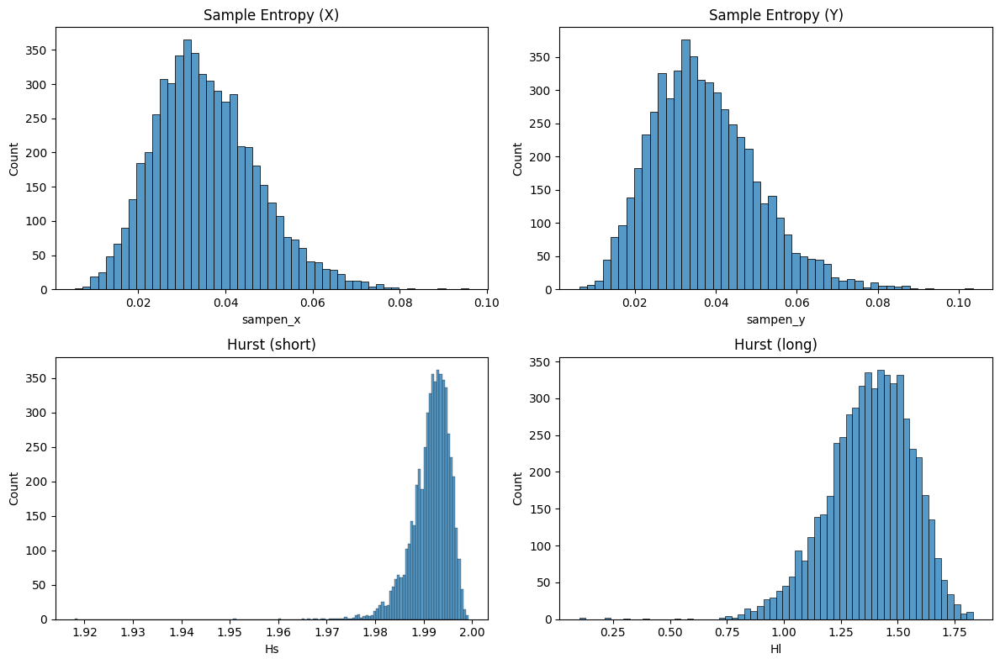

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Histograms
fig, axes = plt.subplots(2,2, figsize=(12,8))
sns.histplot(segment_data_advanced['sampen_x'].dropna(), ax=axes[0,0])
axes[0,0].set_title('Sample Entropy (X)')
sns.histplot(segment_data_advanced['sampen_y'].dropna(), ax=axes[0,1])
axes[0,1].set_title('Sample Entropy (Y)')
sns.histplot(segment_data_advanced['Hs'].dropna(), ax=axes[1,0])
axes[1,0].set_title('Hurst (short)')
sns.histplot(segment_data_advanced['Hl'].dropna(), ax=axes[1,1])
axes[1,1].set_title('Hurst (long)')
plt.tight_layout()
plt.show()

In [ ]:
# Save segment_data_advanced (cleaned signals + features)
segment_data_advanced.to_csv('segment_features.csv', index=False)
segment_data_advanced.to_parquet('segment_features.parquet', index=False)

print("Segment features saved as 'segment_features.csv' and 'segment_features.parquet'")

Segment features saved as 'segment_features.csv' and 'segment_features.parquet'


In [ ]:
import pickle
with open('processed_segments.pkl', 'wb') as f:
    pickle.dump(processed_segments, f)
print("Processed segments saved as 'processed_segments.pkl'")

Processed segments saved as 'processed_segments.pkl'


#Load Features

In [ ]:
# Load segment features
segment_data_advanced = pd.read_csv('segment_features.csv')
# or if using parquet
segment_data_advanced = pd.read_parquet('segment_features.parquet')

In [ ]:
segment_data_advanced.columns

Index(['file_id', 'sample_start', 'sample_end', 'label', 'confidence',
       'cop_x_mean', 'cop_x_std', 'cop_x_range', 'cop_y_mean', 'cop_y_std',
       'cop_y_range', 'sway_path', 'mean_velocity', 'sway_area', 'sampen_x',
       'sampen_y', 'Ds', 'Hs', 'Dl', 'Hl', 'subject_id', 'condition', 'trial',
       'duration_samples', 'age', 'height', 'mass'],
      dtype='object')

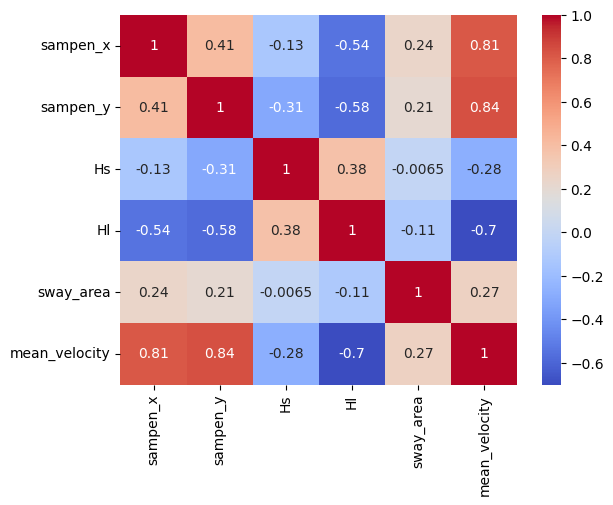

In [ ]:
# To check if the new features bring any independent information
corr = segment_data_advanced[['sampen_x','sampen_y','Hs','Hl','sway_area','mean_velocity']].corr()
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.show()

In [ ]:
from google.colab import files
files.download('processed_segments.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#Clustering

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score, adjusted_rand_score
import seaborn as sns

# Define feature sets
old_features = [
    'cop_x_mean', 'cop_x_std', 'cop_x_range',
    'cop_y_mean', 'cop_y_std', 'cop_y_range',
    'sway_path', 'mean_velocity', 'sway_area',
    'age', 'height', 'mass'
]

new_features = [
    'sampen_x', 'sampen_y', 'Ds', 'Hs', 'Dl', 'Hl'
]

all_features = old_features + new_features

# Load your segment_data_advanced (already computed)
df = segment_data_advanced.dropna(subset=all_features).copy()
print("Segments used:", len(df))

# Standardize all features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df[all_features])

Segments used: 5570


In [ ]:
# EM clustering with 2 components
gmm = GaussianMixture(n_components=2, random_state=42, n_init=10)
df['cluster_gmm'] = gmm.fit_predict(X_scaled)

# Calculate cluster probabilities (optional)
df['cluster_prob'] = gmm.predict_proba(X_scaled).max(axis=1)

print("GMM cluster sizes:")
print(df['cluster_gmm'].value_counts().sort_index())

GMM cluster sizes:
cluster_gmm
0     969
1    4601
Name: count, dtype: int64


In [ ]:
# Compute mean values per cluster
cluster_means = df.groupby('cluster_gmm')[['sampen_x', 'sampen_y', 'sway_area']].mean().round(3)
print("Cluster means for sample entropy and sway area:")
print(cluster_means)

# Determine which cluster has higher average sample entropy and sway area
# We'll compute a combined score: (sampen_x + sampen_y)/2 + sway_area (normalized roughly)
# For simplicity, we'll just compare each:
unstable_cluster = None
if cluster_means.iloc[0]['sway_area'] > cluster_means.iloc[1]['sway_area']:
    unstable_cluster = cluster_means.index[0]
else:
    unstable_cluster = cluster_means.index[1]

df['state'] = df['cluster_gmm'].apply(lambda x: 'unstable' if x == unstable_cluster else 'stable')
print(f"Unstable cluster: {unstable_cluster}")
print(f"State counts:\n{df['state'].value_counts()}")

Cluster means for sample entropy and sway area:
             sampen_x  sampen_y  sway_area
cluster_gmm                               
0               0.047     0.051     17.939
1               0.033     0.034     17.629
Unstable cluster: 0
State counts:
state
stable      4601
unstable     969
Name: count, dtype: int64


In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score

# Standardize old features only
scaler_old = StandardScaler()
X_old_scaled = scaler_old.fit_transform(df[old_features])

kmeans = KMeans(n_clusters=2, random_state=42, n_init=10)
df['cluster_kmeans_old'] = kmeans.fit_predict(X_old_scaled)

# Map K‑means clusters to stable/unstable based on sway area (as before)
kmeans_means = df.groupby('cluster_kmeans_old')['sway_area'].mean()
unstable_kmeans = kmeans_means.idxmax()
df['state_kmeans'] = df['cluster_kmeans_old'].apply(lambda x: 'unstable' if x == unstable_kmeans else 'stable')

# Compare GMM states with K‑means states
ari = adjusted_rand_score(df['state'], df['state_kmeans'])
print(f"Adjusted Rand Index between GMM and K‑means states: {ari:.4f}")
print("\nCross‑tabulation (GMM vs K‑means):")
print(pd.crosstab(df['state'], df['state_kmeans']))

Adjusted Rand Index between GMM and K‑means states: 0.1387

Cross‑tabulation (GMM vs K‑means):
state_kmeans  stable  unstable
state                         
stable          2917      1684
unstable          57       912


In [ ]:
sil_gmm = silhouette_score(X_scaled, df['cluster_gmm'])
sil_kmeans = silhouette_score(X_old_scaled, df['cluster_kmeans_old'])
print(f"Silhouette score (GMM, all features): {sil_gmm:.4f}")
print(f"Silhouette score (K‑means, old only): {sil_kmeans:.4f}")

Silhouette score (GMM, all features): 0.2214
Silhouette score (K‑means, old only): 0.1461


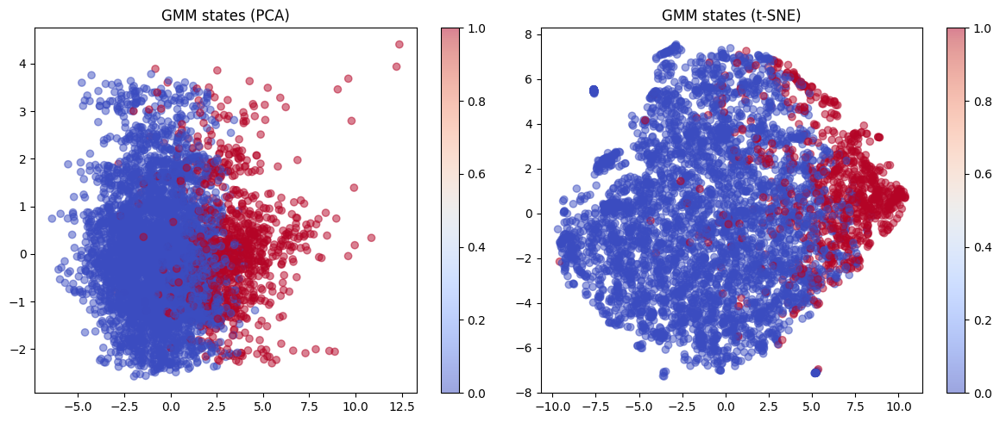

In [ ]:
# PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.scatter(X_pca[:,0], X_pca[:,1], c=df['state'].map({'stable':0, 'unstable':1}), cmap='coolwarm', alpha=0.5)
plt.title('GMM states (PCA)')
plt.colorbar()

# t‑SNE (sample if too large)
max_points = 5000
if len(df) > max_points:
    idx = np.random.choice(len(df), size=max_points, replace=False)
    df_tsne = df.iloc[idx]
    X_tsne = X_scaled[idx]
else:
    df_tsne = df
    X_tsne = X_scaled

tsne = TSNE(n_components=2, random_state=42, perplexity=30, max_iter=300)
X_tsne_2d = tsne.fit_transform(X_tsne)

plt.subplot(1,2,2)
plt.scatter(X_tsne_2d[:,0], X_tsne_2d[:,1], c=df_tsne['state'].map({'stable':0, 'unstable':1}), cmap='coolwarm', alpha=0.5)
plt.title('GMM states (t‑SNE)')
plt.colorbar()
plt.tight_layout()
plt.show()

In [ ]:
print("\n=== State vs Condition ===")
print(pd.crosstab(df['state'], df['condition']))

print("\n=== State vs Subject (top 10) ===")
print(df.groupby('state')['subject_id'].value_counts().head(10))

# Also show mean sample entropy and sway area per state
print("\n=== Feature means by state ===")
print(df.groupby('state')[['sampen_x', 'sampen_y', 'sway_area', 'mean_velocity']].mean().round(3))


=== State vs Condition ===
condition  euro  free  stress
state                        
stable       38  3861     702
unstable     12   779     178

=== State vs Subject (top 10) ===
state   subject_id
stable  48            118
        61            112
        39            100
        36             95
        37             94
        2              88
        16             87
        73             76
        35             74
        15             66
Name: count, dtype: int64

=== Feature means by state ===
          sampen_x  sampen_y  sway_area  mean_velocity
state                                                 
stable       0.033     0.034     17.629          0.016
unstable     0.047     0.051     17.939          0.023


In [ ]:
# Standardize new features only
X_new_scaled = StandardScaler().fit_transform(df[new_features])
gmm_new = GaussianMixture(n_components=2, random_state=42, n_init=10)
df['cluster_gmm_new'] = gmm_new.fit_predict(X_new_scaled)

# Map based on sample entropy
new_means = df.groupby('cluster_gmm_new')[['sampen_x','sampen_y']].mean()
unstable_new = new_means.mean(axis=1).idxmax()
df['state_new'] = df['cluster_gmm_new'].apply(lambda x: 'unstable' if x == unstable_new else 'stable')

print("\n=== State (only new features) vs Condition ===")
print(pd.crosstab(df['state_new'], df['condition']))

ari_new = adjusted_rand_score(df['state'], df['state_new'])
print(f"ARI between GMM (all features) and GMM (new only): {ari_new:.4f}")


=== State (only new features) vs Condition ===
condition  euro  free  stress
state_new                    
stable       40  3925     748
unstable     10   715     132
ARI between GMM (all features) and GMM (new only): 0.8872


In [ ]:
# GMM (all features) – cluster means
print("=== GMM (all features) ===")
print(df.groupby('cluster_gmm')[['sway_area','mean_velocity','sampen_x','sampen_y']].mean().round(2))

# GMM (new only) – cluster means
print("\n=== GMM (new only) ===")
print(df.groupby('cluster_gmm_new')[['sway_area','mean_velocity','sampen_x','sampen_y']].mean().round(2))

# Condition distribution for each clustering
print("\n=== GMM (all) condition ===")
print(pd.crosstab(df['cluster_gmm'], df['condition']))

print("\n=== GMM (new) condition ===")
print(pd.crosstab(df['cluster_gmm_new'], df['condition']))

=== GMM (all features) ===
             sway_area  mean_velocity  sampen_x  sampen_y
cluster_gmm                                              
0                17.94           0.02      0.05      0.05
1                17.63           0.02      0.03      0.03

=== GMM (new only) ===
                 sway_area  mean_velocity  sampen_x  sampen_y
cluster_gmm_new                                              
0                    17.94           0.02      0.05      0.05
1                    17.64           0.02      0.03      0.03

=== GMM (all) condition ===
condition    euro  free  stress
cluster_gmm                    
0              12   779     178
1              38  3861     702

=== GMM (new) condition ===
condition        euro  free  stress
cluster_gmm_new                    
0                  10   715     132
1                  40  3925     748


#Define state labels and predict them using classifier


In [ ]:
# create K‑means labels (old features)
# But ensure we have the mapping to unstable based on sway area
kmeans_means = df.groupby('cluster_kmeans_old')['sway_area'].mean()
unstable_cluster = kmeans_means.idxmax()
df['state_final'] = df['cluster_kmeans_old'].apply(lambda x: 'unstable' if x == unstable_cluster else 'stable')
print("Final state counts:")
print(df['state_final'].value_counts())

# Prepare data for classification
final_features = ['sway_area', 'mean_velocity', 'cop_x_range', 'sway_path']  # top 4
X_final = df[final_features]
y_final = (df['state_final'] == 'unstable').astype(int)

# GroupKFold with file_id
from sklearn.model_selection import GroupKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score
import numpy as np

gkf = GroupKFold(n_splits=5)
f1_scores = []
for train_idx, val_idx in gkf.split(X_final, y_final, groups=df['file_id']):
    X_train, X_val = X_final.iloc[train_idx], X_final.iloc[val_idx]
    y_train, y_val = y_final.iloc[train_idx], y_final.iloc[val_idx]
    if y_val.sum() == 0:
        continue
    clf = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced')
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_val)
    f1_scores.append(f1_score(y_val, y_pred, pos_label=1))

print(f"Final model (top 4 features) F1 scores: {f1_scores}")
print(f"Mean F1: {np.mean(f1_scores):.3f} (+/- {np.std(f1_scores):.3f})")

# Train on full data to get final model
final_clf = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced')
final_clf.fit(X_final, y_final)

# Feature importance for the selected features
importances = pd.Series(final_clf.feature_importances_, index=final_features)
print("\nFeature importance (final model):")
print(importances)

# Save the model
import joblib
joblib.dump(final_clf, 'unstable_state_model.pkl')
print("Model saved as 'unstable_state_model.pkl'")

Final state counts:
state_final
stable      2974
unstable    2596
Name: count, dtype: int64
Final model (top 4 features) F1 scores: [0.9085768143261075, 0.9190751445086706, 0.9070247933884298, 0.9084249084249084, 0.9211873080859775]
Mean F1: 0.913 (+/- 0.006)

Feature importance (final model):
sway_area        0.065961
mean_velocity    0.449583
cop_x_range      0.125077
sway_path        0.359380
dtype: float64
Model saved as 'unstable_state_model.pkl'


#OneClassSVM
We'll use the stable/unstable labels derived from K‑means (old features) as ground truth. The one‑class SVM will be trained only on stable segments to learn the “normal” boundary; then we'll see if it can identify unstable segments as anomalies. This is an unsupervised method that does not require unstable examples during training.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GroupKFold, train_test_split
from sklearn.svm import OneClassSVM
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, f1_score
import joblib

# Assume df contains all data, with 'state_final' = 'stable' or 'unstable' (from K‑means)
# and file_id for grouping
# We'll use the top features identified earlier
features = ['sway_area', 'mean_velocity', 'cop_x_range', 'sway_path']

X = df[features]
y = (df['state_final'] == 'unstable').astype(int)   # 1 = unstable
groups = df['file_id']

In [ ]:
# Group shuffle split to keep all segments of a trial together
from sklearn.model_selection import GroupShuffleSplit
gss = GroupShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
train_idx, test_idx = next(gss.split(X, y, groups=groups))

X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

print(f"Train: {len(X_train)} samples, {y_train.sum()} unstable")
print(f"Test: {len(X_test)} samples, {y_test.sum()} unstable")

Train: 4461 samples, 2101 unstable
Test: 1109 samples, 495 unstable


In [ ]:
# Standardize features for SVM
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)

# Train One‑Class SVM on stable segments only
X_train_stable = X_train_scaled[y_train == 0]
ocsvm = OneClassSVM(kernel='rbf', gamma='auto', nu=0.01)  # nu ≈ expected proportion of outliers
ocsvm.fit(X_train_stable)

# Predict on test set (after scaling)
X_test_scaled = scaler.transform(X_test)
y_pred_ocsvm = ocsvm.predict(X_test_scaled)   # 1 = normal, -1 = anomaly
# Convert to binary: 1 for anomaly, 0 for normal
y_pred_ocsvm_binary = (y_pred_ocsvm == -1).astype(int)

print("One‑class SVM on test set:")
print(classification_report(y_test, y_pred_ocsvm_binary, target_names=['stable','unstable']))
print("Confusion matrix:\n", confusion_matrix(y_test, y_pred_ocsvm_binary))

One‑class SVM on test set:
              precision    recall  f1-score   support

      stable       0.74      0.99      0.85       614
    unstable       0.97      0.58      0.72       495

    accuracy                           0.80      1109
   macro avg       0.86      0.78      0.79      1109
weighted avg       0.85      0.80      0.79      1109

Confusion matrix:
 [[606   8]
 [209 286]]


In [ ]:
# No need to standardize for Naïve Bayes (works with any scaling, but GaussianNB assumes normal distribution)
nb = GaussianNB()
nb.fit(X_train, y_train)
y_pred_nb = nb.predict(X_test)

print("\nNaïve Bayes on test set:")
print(classification_report(y_test, y_pred_nb, target_names=['stable','unstable']))
print("Confusion matrix:\n", confusion_matrix(y_test, y_pred_nb))


Naïve Bayes on test set:
              precision    recall  f1-score   support

      stable       0.92      0.93      0.92       614
    unstable       0.91      0.89      0.90       495

    accuracy                           0.91      1109
   macro avg       0.91      0.91      0.91      1109
weighted avg       0.91      0.91      0.91      1109

Confusion matrix:
 [[569  45]
 [ 52 443]]


In [ ]:
rf = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced')
rf.fit(X_train, y_train)
y_pred_rf = rf.predict(X_test)

print("\nRandom Forest on test set:")
print(classification_report(y_test, y_pred_rf, target_names=['stable','unstable']))
print("Confusion matrix:\n", confusion_matrix(y_test, y_pred_rf))


Random Forest on test set:
              precision    recall  f1-score   support

      stable       0.90      0.94      0.92       614
    unstable       0.92      0.87      0.89       495

    accuracy                           0.91      1109
   macro avg       0.91      0.90      0.91      1109
weighted avg       0.91      0.91      0.91      1109

Confusion matrix:
 [[577  37]
 [ 65 430]]


Segments were divided into Stable and Unstable based on K means clustering using the sway area feature. Cluster with the highest sway area was termed Unstable as seen in literature.

The Random Forest model produces F1 score of 0.89 for the unstable class which seems high enough.

#Prediction of Free Condition using OneClass SVM

We'll train a One‑class SVM exclusively on segments from the free condition, to learn the boundary of "normal" postural behavior. Any segment that lies outside this boundary will be flagged as non‑free (i.e., stress or euro). This is a pure anomaly detection approach that does not use labels of stress or euro during training.

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.svm import OneClassSVM
from sklearn.metrics import classification_report, f1_score
import joblib

# Assuming segment_data_advanced is already loaded
df = segment_data_advanced.copy()

# Define features (ensure they exist)
features = ['sway_area', 'mean_velocity', 'cop_x_range', 'sway_path']
# Check if all features are present
missing = [f for f in features if f not in df.columns]
if missing:
    raise ValueError(f"Missing features: {missing}")

# Split data
X = df[features]
y_condition = df['condition']   # 'free', 'stress', 'euro'

# Training: only free segments
X_train_free = X[df['condition'] == 'free']
X_test_all = X
y_test_all = (df['condition'] != 'free').astype(int)   # 1 = non-free

# Standardize
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_free)
X_test_scaled = scaler.transform(X_test_all)

# Tune nu parameter
nu_range = [0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5]
best_nu = None
best_f1 = 0
print("Tuning nu...")
for nu in nu_range:
    ocsvm = OneClassSVM(kernel='rbf', gamma='auto', nu=nu)
    ocsvm.fit(X_train_scaled)
    y_pred = (ocsvm.predict(X_test_scaled) == -1).astype(int)
    f1 = f1_score(y_test_all, y_pred, pos_label=1)
    print(f"nu={nu:.2f} -> F1(non-free) = {f1:.4f}")
    if f1 > best_f1:
        best_f1 = f1
        best_nu = nu

# Train final model with best nu
print(f"\nBest nu = {best_nu}, F1 = {best_f1:.4f}")
ocsvm_final = OneClassSVM(kernel='rbf', gamma='auto', nu=best_nu)
ocsvm_final.fit(X_train_scaled)

# Evaluate on test set (all segments)
y_pred_final = (ocsvm_final.predict(X_test_scaled) == -1).astype(int)
print("\nOne‑class SVM for non‑free detection (best nu):")
print(classification_report(y_test_all, y_pred_final, target_names=['free', 'non-free']))

# Save model and scaler
joblib.dump(ocsvm_final, 'oneclass_svm_free_model.pkl')
joblib.dump(scaler, 'scaler_free.pkl')
print("Model and scaler saved.")

Tuning nu...
nu=0.01 -> F1(non-free) = 0.0476
nu=0.05 -> F1(non-free) = 0.1087
nu=0.10 -> F1(non-free) = 0.1680
nu=0.20 -> F1(non-free) = 0.2137
nu=0.30 -> F1(non-free) = 0.2344
nu=0.40 -> F1(non-free) = 0.2431
nu=0.50 -> F1(non-free) = 0.2546

Best nu = 0.5, F1 = 0.2546

One‑class SVM for non‑free detection (best nu):
              precision    recall  f1-score   support

        free       0.84      0.50      0.63      4640
    non-free       0.17      0.51      0.25       930

    accuracy                           0.50      5570
   macro avg       0.50      0.50      0.44      5570
weighted avg       0.72      0.50      0.56      5570

Model and scaler saved.


The One‑class SVM failed to distinguish free vs non‑free segments because condition is not separable by the chosen features. This matches earlier observations: stress and free trials both contain high‑sway segments, and the unstable cluster includes both conditions.

#Using trial‑level aggregated features to predict the condition (free vs non‑free)

In [ ]:
import pandas as pd
import numpy as np
from scipy.spatial import ConvexHull
import pyarrow.parquet as pq

# Load signals_cleaned (if not already in memory)
signals = pq.read_table('/content/signals_cleaned.parquet').to_pandas()

# Group by file_id and compute trial‑level features
trial_features = []

for file_id, group in signals.groupby('file_id'):
    x = group['cop_x'].values
    y = group['cop_y'].values
    n = len(x)

    # Basic statistics
    mean_x, std_x = np.mean(x), np.std(x)
    mean_y, std_y = np.mean(y), np.std(y)
    range_x = np.max(x) - np.min(x)
    range_y = np.max(y) - np.min(y)

    # Sway path and mean velocity
    dx = np.diff(x)
    dy = np.diff(y)
    sway_path = np.sum(np.sqrt(dx**2 + dy**2))
    mean_vel = sway_path / n if n > 1 else 0

    # Sway area (95% confidence ellipse)
    if n > 2:
        cov = np.cov(x, y)
        eigvals, _ = np.linalg.eigh(cov)
        sway_area = np.pi * np.sqrt(np.prod(eigvals)) * 5.991
    else:
        sway_area = np.nan

    # Sample entropy (optional, can be slow on long trials)
    # We'll skip for speed, but you can add it if needed

    trial_features.append({
        'file_id': file_id,
        'mean_cop_x': mean_x,
        'std_cop_x': std_x,
        'range_cop_x': range_x,
        'mean_cop_y': mean_y,
        'std_cop_y': std_y,
        'range_cop_y': range_y,
        'sway_path': sway_path,
        'mean_velocity': mean_vel,
        'sway_area': sway_area,
        'num_samples': n
    })

trial_df = pd.DataFrame(trial_features)
print("Trial features shape:", trial_df.shape)

Trial features shape: (997, 11)


In [ ]:
# Load metadata_cleaned (from SQLite)
import sqlite3
conn = sqlite3.connect('/content/dataset.db')
metadata = pd.read_sql_query("SELECT * FROM metadata_cleaned", conn)

# Merge to get condition and subject_id per trial
trial_df = trial_df.merge(metadata[['file_id', 'condition', 'subject_id']], on='file_id', how='left')
print(trial_df[['file_id', 'condition', 'subject_id']].head())

             file_id condition  subject_id
0   100_proba_free_1      free         100
1  100_proba_free_10      free         100
2  100_proba_free_11      free         100
3   100_proba_free_2      free         100
4   100_proba_free_3      free         100


In [ ]:
# Select features (you can add more)
feature_cols = ['mean_cop_x', 'std_cop_x', 'range_cop_x',
                'mean_cop_y', 'std_cop_y', 'range_cop_y',
                'sway_path', 'mean_velocity', 'sway_area']

X = trial_df[feature_cols]
y = (trial_df['condition'] != 'free').astype(int)   # 1 = non‑free (stress/euro)
groups = trial_df['subject_id']   # group by subject to avoid leakage

print("Class distribution:\n", y.value_counts())

Class distribution:
 condition
0    934
1     63
Name: count, dtype: int64


We try to distinguish free condition from the (stress + euro)

In [ ]:
from sklearn.model_selection import GroupKFold
from sklearn.metrics import f1_score
from imblearn.ensemble import BalancedRandomForestClassifier
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
import numpy as np

gkf = GroupKFold(n_splits=5)

# Balanced Random Forest
brf = BalancedRandomForestClassifier(n_estimators=100, random_state=42)
f1_brf = []
for train_idx, val_idx in gkf.split(X, y, groups=groups):
    X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
    y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
    if y_val.sum() == 0:
        continue
    brf.fit(X_train, y_train)
    y_pred = brf.predict(X_val)
    f1_brf.append(f1_score(y_val, y_pred, pos_label=1))
print("Balanced RF F1:", np.mean(f1_brf))

# SMOTE + RF
rf = RandomForestClassifier(n_estimators=100, random_state=42)
f1_smote = []
for train_idx, val_idx in gkf.split(X, y, groups=groups):
    X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
    y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
    if y_val.sum() == 0:
        continue
    sm = SMOTE(random_state=42)
    X_res, y_res = sm.fit_resample(X_train, y_train)
    rf.fit(X_res, y_res)
    y_pred = rf.predict(X_val)
    f1_smote.append(f1_score(y_val, y_pred, pos_label=1))
print("SMOTE+RF F1:", np.mean(f1_smote))

# XGBoost with scale_pos_weight
scale = (y == 0).sum() / (y == 1).sum()
xgb_clf = xgb.XGBClassifier(scale_pos_weight=scale, random_state=42, eval_metric='logloss')
f1_xgb = []
for train_idx, val_idx in gkf.split(X, y, groups=groups):
    X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
    y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
    if y_val.sum() == 0:
        continue
    xgb_clf.fit(X_train, y_train)
    y_pred = xgb_clf.predict(X_val)
    f1_xgb.append(f1_score(y_val, y_pred, pos_label=1))
print("XGBoost F1:", np.mean(f1_xgb))

Balanced RF F1: 0.7817126530436437
SMOTE+RF F1: 0.8739861751152074
XGBoost F1: 0.8922514619883041


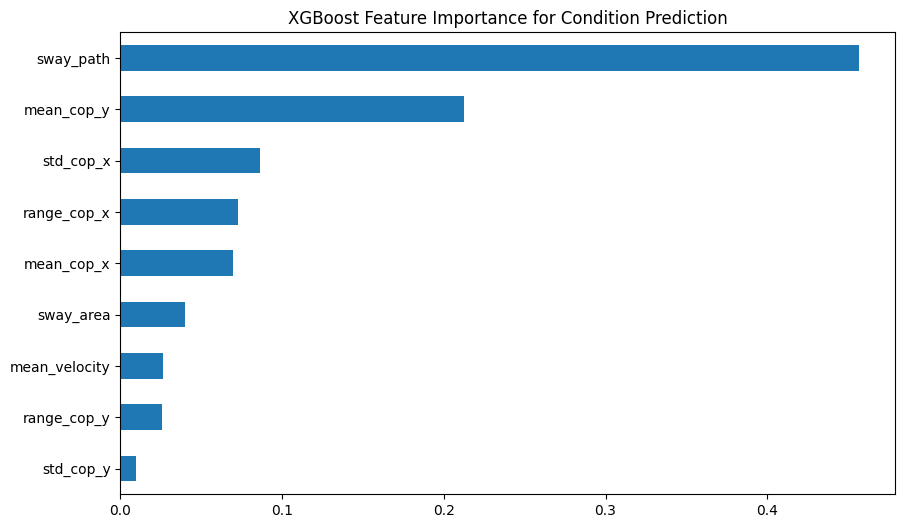

Model saved as 'xgb_condition_model.pkl'


In [ ]:
# Train final XGBoost model on all data
final_xgb = xgb.XGBClassifier(scale_pos_weight=scale, random_state=42, eval_metric='logloss')
final_xgb.fit(X, y)

# Feature importance
importances = pd.Series(final_xgb.feature_importances_, index=feature_cols)
importances.sort_values().plot(kind='barh', figsize=(10,6))
plt.title('XGBoost Feature Importance for Condition Prediction')
plt.show()

# Save model and scaler (if any)
import joblib
joblib.dump(final_xgb, 'xgb_condition_model.pkl')
# Also save the feature list for inference
joblib.dump(feature_cols, 'condition_features.pkl')
print("Model saved as 'xgb_condition_model.pkl'")

In [ ]:
# Assuming trial_df has 'num_samples' from signals
trial_df['duration_sec'] = trial_df['num_samples'] / 250  # 250 Hz
print(trial_df.groupby('condition')['duration_sec'].describe())

           count       mean       std     min     25%     50%     75%     max
condition                                                                    
euro        10.0  30.020000  0.014606  30.004  30.012  30.014  30.028  30.044
free       934.0  30.017970  0.017604  29.712  30.012  30.016  30.020  30.080
stress      53.0  90.001283  0.010605  89.980  89.996  90.000  90.004  90.040


The table reveals a critical confound: stress trials are ~90 seconds long, while free and euro trials are only ~30 seconds. This means sway_path (total distance) is directly proportional to trial duration, so the model is essentially learning to distinguish trial length, not postural control differences. This explains why sway_path dominates feature importance (0.45).

So we will not use trial level features to predict condition

In [ ]:
import pandas as pd
import numpy as np
import pyarrow.parquet as pq
import sqlite3
from nolds import sampen
from sklearn.model_selection import GroupKFold
from sklearn.metrics import f1_score
from sklearn.preprocessing import StandardScaler
from imblearn.ensemble import BalancedRandomForestClassifier
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb

# Load data
signals = pq.read_table('signals_cleaned.parquet').to_pandas()
conn = sqlite3.connect('/content/dataset.db')
metadata = pd.read_sql_query("SELECT file_id, condition, subject_id FROM metadata_cleaned", conn)
conn.close()

# Compute trial features
trial_features = []
for file_id, group in signals.groupby('file_id'):
    x = group['cop_x'].values
    y = group['cop_y'].values
    n = len(x)
    duration_sec = n / 250

    # Mean velocity
    dx = np.diff(x)
    dy = np.diff(y)
    sway_path = np.sum(np.sqrt(dx**2 + dy**2))
    mean_velocity = sway_path / duration_sec if duration_sec > 0 else 0

    # Sway area
    if n > 2:
        cov = np.cov(x, y)
        eigvals, _ = np.linalg.eigh(cov)
        sway_area = np.pi * np.sqrt(np.prod(eigvals)) * 5.991
    else:
        sway_area = np.nan

    # Sample entropy (subsample if too long)
    if n >= 100:
        if n > 500:
            idx = np.linspace(0, n-1, 500, dtype=int)
            x_sample = x[idx]
            y_sample = y[idx]
        else:
            x_sample, y_sample = x, y
        samp_x = sampen(x_sample, emb_dim=2, tolerance=0.2)
        samp_y = sampen(y_sample, emb_dim=2, tolerance=0.2)
    else:
        samp_x, samp_y = np.nan, np.nan

    trial_features.append({
        'file_id': file_id,
        'mean_velocity': mean_velocity,
        'sway_area': sway_area,
        'sampen_x': samp_x,
        'sampen_y': samp_y
    })

trial_df = pd.DataFrame(trial_features)
trial_df = trial_df.merge(metadata[['file_id', 'condition', 'subject_id']], on='file_id')

# Clean data
trial_df = trial_df.replace([np.inf, -np.inf], np.nan)
max_area = trial_df['sway_area'].quantile(0.99)
trial_df.loc[trial_df['sway_area'] > max_area, 'sway_area'] = max_area
trial_df = trial_df.dropna(subset=['mean_velocity', 'sway_area', 'sampen_x', 'sampen_y'])

# Prepare features and target
feature_cols = ['mean_velocity', 'sway_area', 'sampen_x', 'sampen_y']
X = trial_df[feature_cols]
y = (trial_df['condition'] != 'free').astype(int)
groups = trial_df['subject_id']

# Standardize features for models that need it (optional but safe)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

gkf = GroupKFold(n_splits=5)

# Balanced Random Forest
brf = BalancedRandomForestClassifier(n_estimators=100, random_state=42)
f1_brf = []
for train_idx, val_idx in gkf.split(X_scaled, y, groups):
    X_train, X_val = X_scaled[train_idx], X_scaled[val_idx]
    y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
    if y_val.sum() == 0:
        continue
    brf.fit(X_train, y_train)
    y_pred = brf.predict(X_val)
    f1_brf.append(f1_score(y_val, y_pred, pos_label=1))
print("Balanced RF F1:", np.mean(f1_brf))

# SMOTE + RF
rf = RandomForestClassifier(n_estimators=100, random_state=42)
f1_smote = []
for train_idx, val_idx in gkf.split(X_scaled, y, groups):
    X_train, X_val = X_scaled[train_idx], X_scaled[val_idx]
    y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
    if y_val.sum() == 0:
        continue
    sm = SMOTE(random_state=42)
    X_res, y_res = sm.fit_resample(X_train, y_train)
    rf.fit(X_res, y_res)
    y_pred = rf.predict(X_val)
    f1_smote.append(f1_score(y_val, y_pred, pos_label=1))
print("SMOTE+RF F1:", np.mean(f1_smote))

# XGBoost with scale_pos_weight
scale = (y == 0).sum() / (y == 1).sum()
xgb_clf = xgb.XGBClassifier(scale_pos_weight=scale, random_state=42, eval_metric='logloss')
f1_xgb = []
for train_idx, val_idx in gkf.split(X_scaled, y, groups):
    X_train, X_val = X_scaled[train_idx], X_scaled[val_idx]
    y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
    if y_val.sum() == 0:
        continue
    xgb_clf.fit(X_train, y_train)
    y_pred = xgb_clf.predict(X_val)
    f1_xgb.append(f1_score(y_val, y_pred, pos_label=1))
print("XGBoost F1:", np.mean(f1_xgb))

/usr/local/lib/python3.12/dist-packages/nolds/measures.py:829: RuntimeWarning: Zero vectors are within tolerance for emb_dim + 1. Consider raising the tolerance parameter to avoid inf result.
  warnings.warn(


Balanced RF F1: 0.6094898106662813
SMOTE+RF F1: 0.7012945907998381
XGBoost F1: 0.7866596701649174


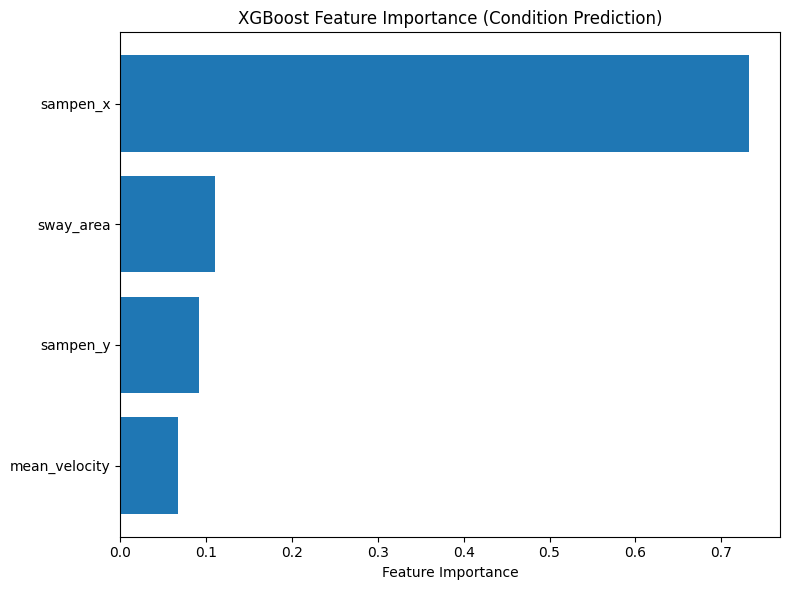

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, roc_curve, auc, precision_recall_curve, classification_report
from sklearn.calibration import calibration_curve
import xgboost as xgb

# Use the same X_scaled and y from previous step
# Train final model on all data
final_model = xgb.XGBClassifier(scale_pos_weight=scale, random_state=42, eval_metric='logloss')
final_model.fit(X_scaled, y)

# Feature importance
importance = final_model.feature_importances_
features = feature_cols
sorted_idx = np.argsort(importance)

plt.figure(figsize=(8,6))
plt.barh(range(len(sorted_idx)), importance[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), [features[i] for i in sorted_idx])
plt.xlabel('Feature Importance')
plt.title('XGBoost Feature Importance (Condition Prediction)')
plt.tight_layout()
plt.show()

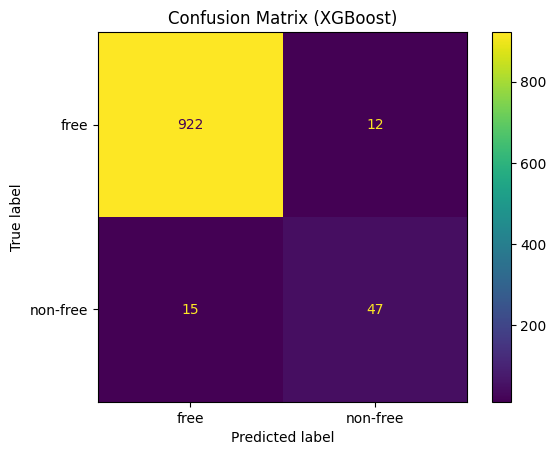

              precision    recall  f1-score   support

        free       0.98      0.99      0.99       934
    non-free       0.80      0.76      0.78        62

    accuracy                           0.97       996
   macro avg       0.89      0.87      0.88       996
weighted avg       0.97      0.97      0.97       996



In [ ]:
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import ConfusionMatrixDisplay

# Use cross_val_predict with GroupKFold (need to implement manually because of groups)
# We'll reuse the previous loop to collect all predictions
y_true_all = []
y_pred_all = []
for train_idx, val_idx in gkf.split(X_scaled, y, groups):
    X_train, X_val = X_scaled[train_idx], X_scaled[val_idx]
    y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
    if y_val.sum() == 0:
        continue
    model = xgb.XGBClassifier(scale_pos_weight=scale, random_state=42, eval_metric='logloss')
    model.fit(X_train, y_train)
    y_pred = model.predict(X_val)
    y_true_all.extend(y_val)
    y_pred_all.extend(y_pred)

# Confusion matrix
cm = confusion_matrix(y_true_all, y_pred_all)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['free', 'non-free'])
disp.plot()
plt.title('Confusion Matrix (XGBoost)')
plt.show()

# Classification report
print(classification_report(y_true_all, y_pred_all, target_names=['free', 'non-free']))

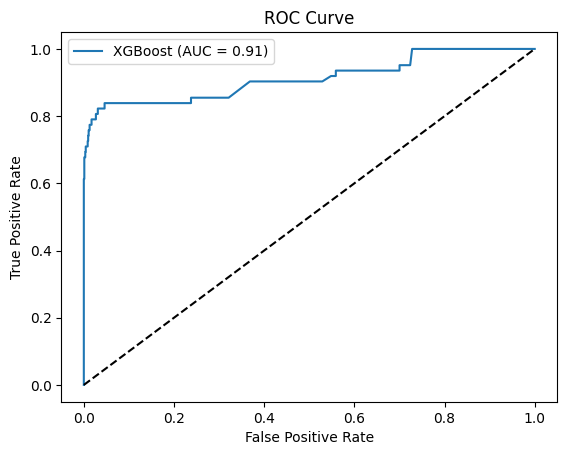

In [ ]:
# Need probabilities for ROC
y_prob_all = []
y_true_all = []
for train_idx, val_idx in gkf.split(X_scaled, y, groups):
    X_train, X_val = X_scaled[train_idx], X_scaled[val_idx]
    y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
    if y_val.sum() == 0:
        continue
    model = xgb.XGBClassifier(scale_pos_weight=scale, random_state=42, eval_metric='logloss')
    model.fit(X_train, y_train)
    y_prob = model.predict_proba(X_val)[:, 1]
    y_prob_all.extend(y_prob)
    y_true_all.extend(y_val)

fpr, tpr, _ = roc_curve(y_true_all, y_prob_all)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, label=f'XGBoost (AUC = {roc_auc:.2f})')
plt.plot([0,1], [0,1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

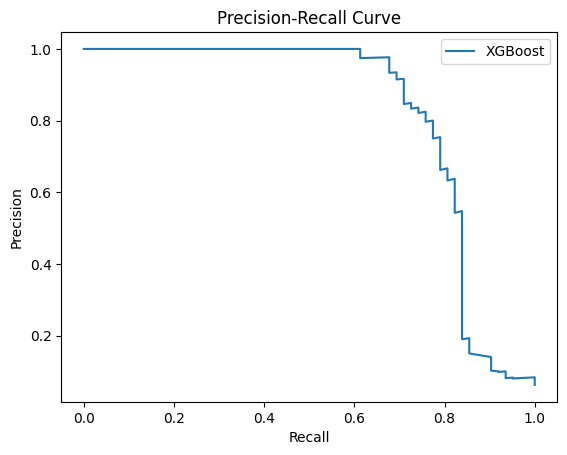

In [ ]:
precision, recall, _ = precision_recall_curve(y_true_all, y_prob_all)
plt.figure()
plt.plot(recall, precision, label='XGBoost')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision‑Recall Curve')
plt.legend()
plt.show()

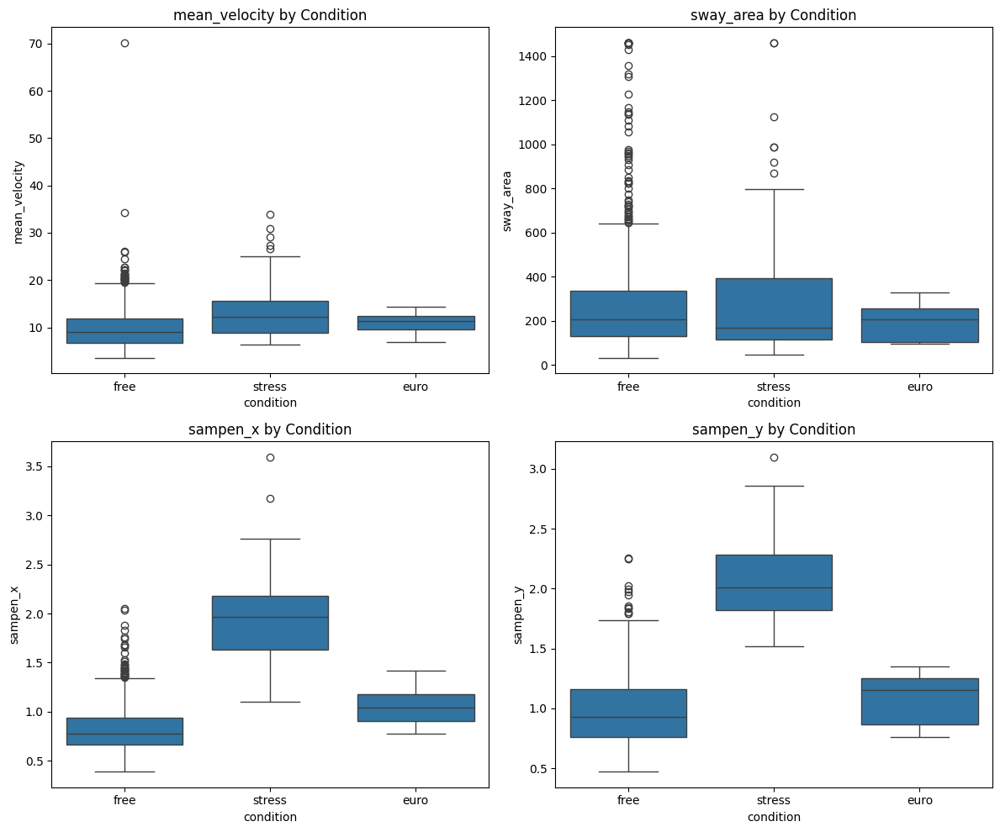

In [ ]:
fig, axes = plt.subplots(2,2, figsize=(12,10))
for i, feat in enumerate(feature_cols):
    ax = axes[i//2, i%2]
    sns.boxplot(data=trial_df, x='condition', y=feat, ax=ax)
    ax.set_title(f'{feat} by Condition')
plt.tight_layout()
plt.show()

#Clustering on Segment Data without Labels

In [ ]:
# Ensure segment_data is in memory (from earlier analysis)
# If not, re-run feature extraction for segments.

# Features to use for clustering (CoP features only, optionally add subject traits)
cop_features = ['cop_x_mean','cop_x_std','cop_x_range',
                'cop_y_mean','cop_y_std','cop_y_range',
                'sway_path','mean_velocity','sway_area']
subject_features = ['age','height','mass']
all_features = cop_features + subject_features

# Use only segments with no missing features (should be none)
segments_clean = segment_data.dropna(subset=cop_features).copy()
print("Segments for clustering:", len(segments_clean))

Segments for clustering: 5570


In [ ]:
from sklearn.preprocessing import StandardScaler

# Standardize CoP features only (we can also try with subject features later)
scaler = StandardScaler()
X_cop = segments_clean[cop_features]
X_scaled = scaler.fit_transform(X_cop)

k=2, silhouette=0.8074
k=3, silhouette=0.5751
k=4, silhouette=0.3199
k=5, silhouette=0.1844
k=6, silhouette=0.1871
k=7, silhouette=0.1869
k=8, silhouette=0.1779
k=9, silhouette=0.1802
k=10, silhouette=0.1771
k=11, silhouette=0.1768
k=12, silhouette=0.1778
k=13, silhouette=0.1677
k=14, silhouette=0.1654
k=15, silhouette=0.1714
k=16, silhouette=0.1711
k=17, silhouette=0.1656
k=18, silhouette=0.1667
k=19, silhouette=0.1624


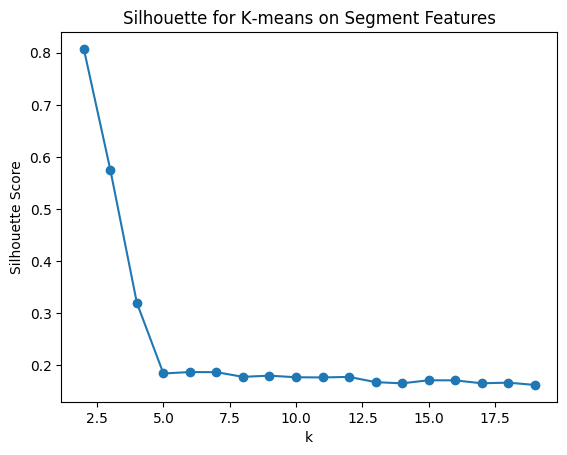

Optimal k (silhouette): 2


In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import numpy as np

K_range = range(2, 20)
sil_scores = []
for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = kmeans.fit_predict(X_scaled)
    sil = silhouette_score(X_scaled, labels)
    sil_scores.append(sil)
    print(f"k={k}, silhouette={sil:.4f}")

plt.plot(K_range, sil_scores, marker='o')
plt.xlabel('k')
plt.ylabel('Silhouette Score')
plt.title('Silhouette for K‑means on Segment Features')
plt.show()

best_k = K_range[np.argmax(sil_scores)]
print(f"Optimal k (silhouette): {best_k}")

In [ ]:
kmeans = KMeans(n_clusters=best_k, random_state=42, n_init=10)
segments_clean['cluster_kmeans'] = kmeans.fit_predict(X_scaled)

# Cluster sizes
print("K‑means cluster sizes:")
print(segments_clean['cluster_kmeans'].value_counts().sort_index())

K‑means cluster sizes:
cluster_kmeans
0    5497
1      73
Name: count, dtype: int64


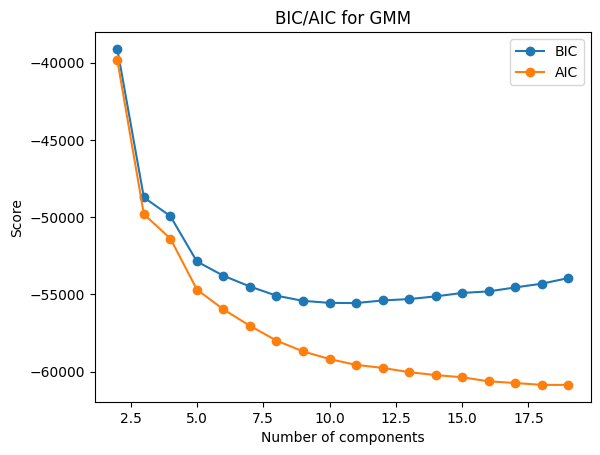

Best n components (BIC): 11


In [ ]:
from sklearn.mixture import GaussianMixture

# We'll try a range of components and use BIC/AIC to select
n_components_range = range(2, 20)
bics = []
aics = []
for n in n_components_range:
    gmm = GaussianMixture(n_components=n, random_state=42, n_init=10)
    gmm.fit(X_scaled)
    bics.append(gmm.bic(X_scaled))
    aics.append(gmm.aic(X_scaled))

plt.plot(n_components_range, bics, label='BIC', marker='o')
plt.plot(n_components_range, aics, label='AIC', marker='o')
plt.xlabel('Number of components')
plt.ylabel('Score')
plt.legend()
plt.title('BIC/AIC for GMM')
plt.show()

# Choose n with lowest BIC
best_n = n_components_range[np.argmin(bics)]
print(f"Best n components (BIC): {best_n}")

gmm = GaussianMixture(n_components=best_n, random_state=42, n_init=10)
gmm_labels = gmm.fit_predict(X_scaled)
segments_clean['cluster_gmm'] = gmm_labels

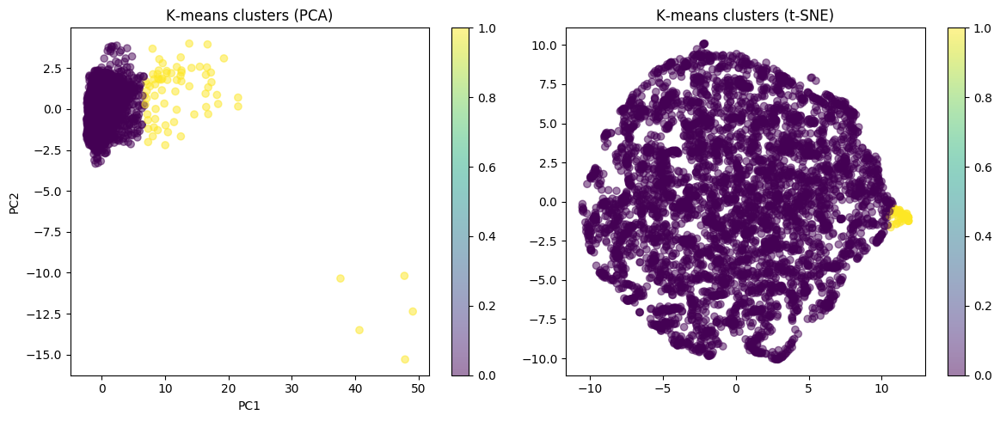

In [ ]:
import numpy as np
from sklearn.manifold import TSNE

# t‑SNE can be slow on large data; sample a subset
max_points = 5000
if len(X_scaled) > max_points:
    sample_idx = np.random.choice(len(X_scaled), size=max_points, replace=False)
    X_sample = X_scaled[sample_idx]
    cluster_sample = segments_clean['cluster_kmeans'].iloc[sample_idx].values
else:
    X_sample = X_scaled
    cluster_sample = segments_clean['cluster_kmeans'].values

tsne = TSNE(n_components=2, random_state=42, perplexity=30, max_iter=300)
X_tsne = tsne.fit_transform(X_sample)

plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
scatter = plt.scatter(X_pca[:,0], X_pca[:,1], c=segments_clean['cluster_kmeans'], cmap='viridis', alpha=0.5)
plt.colorbar(scatter)
plt.title('K‑means clusters (PCA)')
plt.xlabel('PC1')
plt.ylabel('PC2')

plt.subplot(1,2,2)
scatter = plt.scatter(X_tsne[:,0], X_tsne[:,1], c=cluster_sample, cmap='viridis', alpha=0.5)
plt.colorbar(scatter)
plt.title('K‑means clusters (t‑SNE)')
plt.tight_layout()
plt.show()


=== K‑means cluster means (CoP features) ===
                cop_x_mean  cop_x_std  cop_x_range  cop_y_mean  cop_y_std  \
cluster_kmeans                                                              
0                   -0.879      2.613       11.480     -40.579      3.003   
1                    0.551     14.780       67.399     -47.987     13.863   

                cop_y_range  sway_path  mean_velocity  sway_area  
cluster_kmeans                                                    
0                    13.019     99.183          0.040    153.758  
1                    64.542    461.137          0.184   4994.371  

=== K‑means clusters vs Trial Condition ===
condition       euro  free  stress
cluster_kmeans                    
0                 50  4622     825
1                  0    18      55

=== K‑means clusters vs Subject traits ===
                  age  height   mass
cluster_kmeans                      
0               20.21  170.02  67.79
1               19.37  173.55  70.81


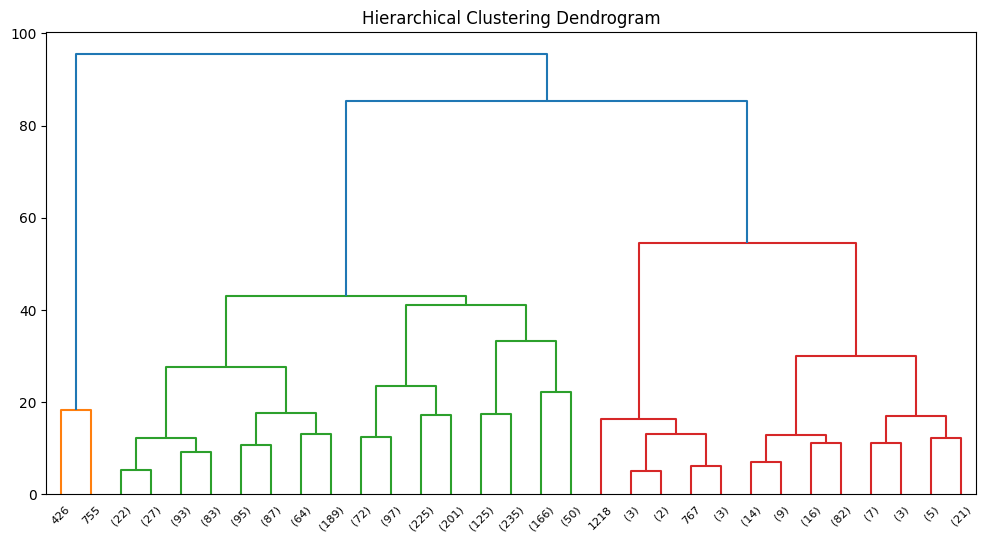

In [ ]:
# ----------------------------------------------------------------------
# 6. Analyze cluster characteristics (K‑means as example)
# ----------------------------------------------------------------------

from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering

print("\n=== K‑means cluster means (CoP features) ===")
print(segments_clean.groupby('cluster_kmeans')[cop_features].mean().round(3))

print("\n=== K‑means clusters vs Trial Condition ===")
print(pd.crosstab(segments_clean['cluster_kmeans'], segments_clean['condition']))

print("\n=== K‑means clusters vs Subject traits ===")
print(segments_clean.groupby('cluster_kmeans')[subject_features].mean().round(2))

# ----------------------------------------------------------------------
# 7. (Optional) Hierarchical clustering dendrogram (sampled)
# ----------------------------------------------------------------------
# Sample for dendrogram to avoid memory issues
if len(X_scaled) > 2000:
    dendro_idx = np.random.choice(len(X_scaled), size=2000, replace=False)
    X_dendro = X_scaled[dendro_idx]
else:
    X_dendro = X_scaled
linkage_matrix = linkage(X_dendro, method='ward')
plt.figure(figsize=(12,6))
dendrogram(linkage_matrix, truncate_mode='level', p=5)
plt.title('Hierarchical Clustering Dendrogram')
plt.show()

In [ ]:
# Segment length distribution per cluster
print(segments_clean.groupby('cluster_kmeans')['segment_length'].describe())

# Compare high‑sway segments by trial condition
high_sway = segments_clean[segments_clean['cluster_kmeans'] == 1]
print(high_sway.groupby('condition')[cop_features].mean().round(3))

# Subject distribution in high‑sway cluster
print(high_sway['subject_id'].value_counts())

                 count    mean  std     min     25%     50%     75%     max
cluster_kmeans                                                             
0               5497.0  2500.0  0.0  2500.0  2500.0  2500.0  2500.0  2500.0
1                 73.0  2500.0  0.0  2500.0  2500.0  2500.0  2500.0  2500.0
           cop_x_mean  cop_x_std  cop_x_range  cop_y_mean  cop_y_std  \
condition                                                              
free          -11.385     23.614       88.925     -47.790     18.774   
stress          4.458     11.889       60.354     -48.052     12.255   

           cop_y_range  sway_path  mean_velocity  sway_area  
condition                                                    
free            87.451    457.681          0.183  12255.155  
stress          57.044    462.268          0.185   2618.114  
subject_id
110    13
61      9
112     9
85      7
107     6
89      5
108     5
73      3
21      3
87      3
79      3
24      2
113     1
84      1
77      

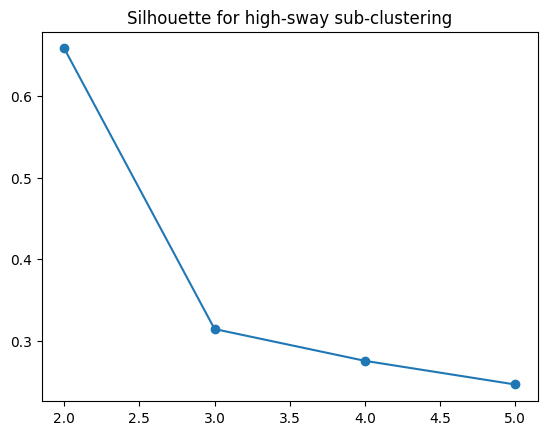

Optimal sub‑clusters: 2


/tmp/ipykernel_849/601005469.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_sway['subcluster'] = kmeans_high.fit_predict(X_high_scaled)


In [ ]:
# Subset high‑sway segments
high_sway = segments_clean[segments_clean['cluster_kmeans'] == 1]
X_high = high_sway[cop_features]
X_high_scaled = scaler.fit_transform(X_high)  # re‑standardize within this subset

# Silhouette for k=2 to maybe 5
K_range = range(2, min(6, len(high_sway)))
sil_high = []
for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = kmeans.fit_predict(X_high_scaled)
    sil_high.append(silhouette_score(X_high_scaled, labels))
plt.plot(K_range, sil_high, marker='o')
plt.title('Silhouette for high‑sway sub‑clustering')
plt.show()

best_k_high = K_range[np.argmax(sil_high)]
print(f"Optimal sub‑clusters: {best_k_high}")
kmeans_high = KMeans(n_clusters=best_k_high, random_state=42, n_init=10)
high_sway['subcluster'] = kmeans_high.fit_predict(X_high_scaled)

In [ ]:
# Feature means by subcluster
print(high_sway.groupby('subcluster')[cop_features].mean().round(2))

# Cross‑tab with condition
print(pd.crosstab(high_sway['subcluster'], high_sway['condition']))

# Subject distribution per subcluster
print(high_sway.groupby('subcluster')['subject_id'].value_counts())

            cop_x_mean  cop_x_std  cop_x_range  cop_y_mean  cop_y_std  \
subcluster                                                              
0                 2.59      11.26        56.90      -48.23      12.37   
1               -27.13      62.59       210.12      -44.71      34.12   

            cop_y_range  sway_path  mean_velocity  sway_area  
subcluster                                                    
0                 60.95     441.86           0.18    2494.54  
1                113.35     723.35           0.29   38992.10  
condition   free  stress
subcluster              
0             13      55
1              5       0
subcluster  subject_id
0           110           13
            112            9
            85             7
            107            6
            89             5
            108            5
            61             4
            21             3
            73             3
            79             3
            87             3
            2

##Conclusion of Clustering Analysis

Stable state (K‑means cluster 0): 5,497 segments with low sway (area ~154, velocity ~0.04). This is the dominant state.

Unstable state (K‑means cluster 1): 73 segments with high sway. This splits further into two distinct sub‑clusters:

Sub‑cluster	Count	Condition	Key Features	Interpretation  

0 -> 	68 (13 free, 55 stress) |	Moderate high sway (area ~2,495, velocity ~0.18) | Stress‑like pattern – occurs mostly in stress trials, but also in a few free trials.  

1 ->	5 (all free)	Extreme high sway (area ~38,992, velocity ~0.29)	Extreme sway pattern – only from subject 61 in a free trial. Likely an outlier or artifact.

#Prediction of States


              precision    recall  f1-score   support

      stable       1.00      1.00      1.00      1090
    unstable       0.94      0.89      0.92        19

    accuracy                           1.00      1109
   macro avg       0.97      0.95      0.96      1109
weighted avg       1.00      1.00      1.00      1109

[[1089    1]
 [   2   17]]


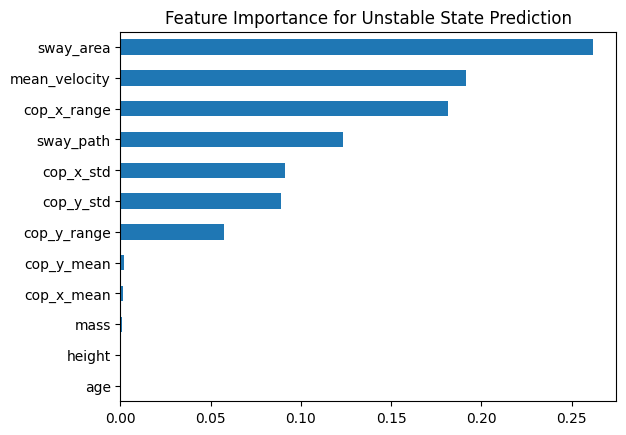

In [ ]:
# Prepare data
target = (segments_clean['cluster_kmeans'] == 1).astype(int)  # 1 = unstable, 0 = stable
X = segments_clean[cop_features + subject_features]  # use all features

# Split by file_id
from sklearn.model_selection import GroupShuffleSplit
gss = GroupShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
train_idx, test_idx = next(gss.split(X, target, groups=segments_clean['file_id']))

X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
y_train, y_test = target.iloc[train_idx], target.iloc[test_idx]

# Train class‑weighted Random Forest
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced')
rf.fit(X_train, y_train)

# Evaluate
from sklearn.metrics import classification_report, confusion_matrix
y_pred = rf.predict(X_test)
print(classification_report(y_test, y_pred, target_names=['stable', 'unstable']))
print(confusion_matrix(y_test, y_pred))

# Feature importance
importances = pd.Series(rf.feature_importances_, index=X.columns)
importances.sort_values().plot(kind='barh')
plt.title('Feature Importance for Unstable State Prediction')
plt.show()

In [ ]:
from sklearn.ensemble import IsolationForest

# Train only on stable segments
X_train_stable = X_train[y_train == 0]
clf = IsolationForest(contamination=0.01, random_state=42)
clf.fit(X_train_stable)

# Predict on test set
preds = clf.predict(X_test)  # -1 = anomaly (unstable)
y_pred_anom = (preds == -1).astype(int)

print(classification_report(y_test, y_pred_anom, target_names=['stable', 'unstable']))

              precision    recall  f1-score   support

      stable       1.00      0.99      0.99      1090
    unstable       0.61      1.00      0.76        19

    accuracy                           0.99      1109
   macro avg       0.81      0.99      0.88      1109
weighted avg       0.99      0.99      0.99      1109



In [ ]:
import numpy as np
from sklearn.model_selection import GroupKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, f1_score

# Assuming X, target, and groups (file_id) are already defined
gkf = GroupKFold(n_splits=5)
f1_scores = []

for train_idx, val_idx in gkf.split(X, target, groups=segments_clean['file_id']):
    X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
    y_train, y_val = target.iloc[train_idx], target.iloc[val_idx]

    # Check if validation set contains any unstable samples
    if y_val.sum() == 0:
        print("Fold with no unstable samples in validation, skipping F1 score")
        continue

    rf = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced')
    rf.fit(X_train, y_train)
    y_pred = rf.predict(X_val)

    # Compute F1 for class 1
    f1 = f1_score(y_val, y_pred, pos_label=1)
    f1_scores.append(f1)

    # Optional: print detailed report
    print(classification_report(y_val, y_pred, target_names=['stable', 'unstable']))

print(f"\nCross‑validation F1 scores (unstable): {f1_scores}")
if f1_scores:
    print(f"Mean F1: {np.mean(f1_scores):.3f} (+/- {np.std(f1_scores):.3f})")

              precision    recall  f1-score   support

      stable       1.00      1.00      1.00      1111
    unstable       1.00      1.00      1.00         5

    accuracy                           1.00      1116
   macro avg       1.00      1.00      1.00      1116
weighted avg       1.00      1.00      1.00      1116

              precision    recall  f1-score   support

      stable       1.00      1.00      1.00      1105
    unstable       1.00      1.00      1.00         7

    accuracy                           1.00      1112
   macro avg       1.00      1.00      1.00      1112
weighted avg       1.00      1.00      1.00      1112

              precision    recall  f1-score   support

      stable       1.00      1.00      1.00      1099
    unstable       1.00      0.92      0.96        13

    accuracy                           1.00      1112
   macro avg       1.00      0.96      0.98      1112
weighted avg       1.00      1.00      1.00      1112

              preci

In [ ]:
# Check which files contain stress segments
stress_segments = segment_data[segment_data['label'] == 'stress']
print(stress_segments[['file_id', 'subject_id', 'condition', 'sample_start', 'sample_end']])

                 file_id  subject_id condition  sample_start  sample_end
353   108_proba_stress_1         108    stress          6251        8750
3938     61_proba_free_3          61      free          1251        3750
3939     61_proba_free_3          61      free          2501        5000
3940     61_proba_free_3          61      free          3751        6250
3941     61_proba_free_3          61      free          5001        7500


In [ ]:
print(df.describe(), '\n')
print(df.info(), '\n')
print(df.isnull().sum(), '\n')

         sample_num         cop_x         cop_y
count  8.276763e+06  8.276763e+06  8.276763e+06
mean   4.833050e+03 -8.743152e-01 -4.052753e+01
std    4.126554e+03  1.004910e+01  2.318496e+01
min    1.000000e+00 -1.178596e+02 -1.403112e+02
25%    2.076000e+03 -7.161849e+00 -5.450183e+01
50%    4.151000e+03 -8.954821e-01 -3.986462e+01
75%    6.227000e+03  5.392808e+00 -2.492224e+01
max    2.251000e+04  1.055272e+02  6.149722e+01 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8276763 entries, 0 to 8276762
Data columns (total 4 columns):
 #   Column      Dtype  
---  ------      -----  
 0   file_id     object 
 1   sample_num  int64  
 2   cop_x       float64
 3   cop_y       float64
dtypes: float64(2), int64(1), object(1)
memory usage: 252.6+ MB
None 

file_id       0
sample_num    0
cop_x         0
cop_y         0
dtype: int64 



# Performance vs. Window Length Using Segment Data

State counts:
 state_final
stable      3013
unstable    2557
Name: count, dtype: int64
Loaded 5570 segments with raw signals.
Window 50 (0.20s): F1=0.501
Window 125 (0.50s): F1=0.513
Window 250 (1.00s): F1=0.555
Window 500 (2.00s): F1=0.601
Window 1250 (5.00s): F1=0.726
Full segments: F1=0.919


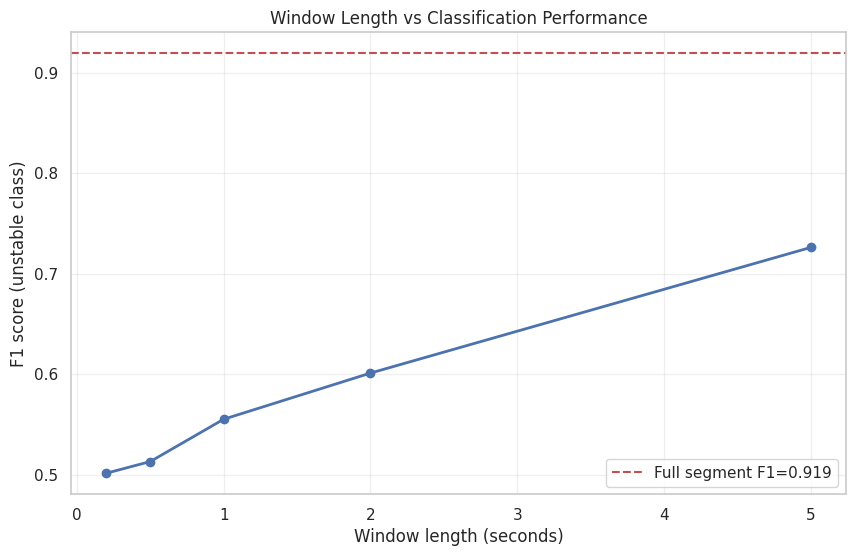

In [ ]:
import pandas as pd
import numpy as np
import pyarrow.parquet as pq
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GroupKFold
from sklearn.metrics import f1_score
import matplotlib.pyplot as plt

FS = 250
RANDOM_STATE = 42

# -----------------------------
# 1) Recreate unstable labels via KMeans
# -----------------------------
old_features = ['cop_x_mean', 'cop_x_std', 'cop_x_range',
                'cop_y_mean', 'cop_y_std', 'cop_y_range',
                'sway_path', 'mean_velocity', 'sway_area']

df_cluster = segment_data_advanced.dropna(subset=old_features).copy()

X_cluster = df_cluster[old_features].values
X_cluster = StandardScaler().fit_transform(X_cluster)

kmeans = KMeans(n_clusters=2, random_state=RANDOM_STATE, n_init=10)
df_cluster['cluster'] = kmeans.fit_predict(X_cluster)

cluster_means = df_cluster.groupby('cluster')['sway_area'].mean()
unstable_cluster = cluster_means.idxmax()
df_cluster['state_final'] = np.where(df_cluster['cluster'] == unstable_cluster, 'unstable', 'stable')

# safe merge
if 'state_final' in segment_data_advanced.columns:
    segment_data_advanced = segment_data_advanced.drop(columns=['state_final'])

segment_data_advanced = segment_data_advanced.merge(
    df_cluster[['file_id', 'sample_start', 'sample_end', 'state_final']],
    on=['file_id', 'sample_start', 'sample_end'],
    how='left'
)

print("State counts:\n", segment_data_advanced['state_final'].value_counts(dropna=False))

# -----------------------------
# 2) Load raw signals
# -----------------------------
signals = pq.read_table('/content/signals_cleaned.parquet').to_pandas()

# speed-up map by file_id
sig_map = {}
for fid, g in signals.groupby('file_id'):
    gg = g.sort_values('sample_num')
    sig_map[fid] = gg[['sample_num', 'cop_x', 'cop_y']]

# -----------------------------
# 3) Build segment list
# -----------------------------
segments = segment_data_advanced.dropna(subset=['state_final']).copy().reset_index(drop=True)
segments['segment_id'] = segments.index
segments['label_binary'] = (segments['state_final'] == 'unstable').astype(int)

segment_list = []
for _, row in segments.iterrows():
    fid = row['file_id']
    if fid not in sig_map:
        continue

    start = int(row['sample_start'])
    end = int(row['sample_end'])

    # end-exclusive slice
    s = sig_map[fid]
    seg_signal = s[(s['sample_num'] >= start) & (s['sample_num'] < end)]
    if len(seg_signal) < 5:
        continue

    segment_list.append({
        'x': seg_signal['cop_x'].values,
        'y': seg_signal['cop_y'].values,
        'label': int(row['label_binary']),
        'file_id': row['file_id'],       # grouping key for CV
        'segment_id': int(row['segment_id'])
    })

print(f"Loaded {len(segment_list)} segments with raw signals.")

# -----------------------------
# 4) Prefix feature extraction
# -----------------------------
def extract_features_from_prefix(x, y, n_samples, fs=250):
    x = x[:n_samples]
    y = y[:n_samples]
    n = len(x)
    if n < 5:
        return None

    dx = np.diff(x)
    dy = np.diff(y)
    step = np.sqrt(dx**2 + dy**2)
    sway_path = np.sum(step)

    duration_sec = n / fs
    mean_velocity = sway_path / duration_sec if duration_sec > 0 else np.nan

    cop_x_range = np.max(x) - np.min(x)

    cov = np.cov(x, y)
    eigvals, _ = np.linalg.eigh(cov)
    eigvals = np.clip(eigvals, 1e-12, None)  # numerical safety
    sway_area = np.pi * np.sqrt(eigvals[0] * 5.991) * np.sqrt(eigvals[1] * 5.991)

    return [sway_area, mean_velocity, cop_x_range, sway_path]

# -----------------------------
# 5) Window experiment
# -----------------------------
window_samples = [50, 125, 250, 500, 1250, 2500]  # 0.2,0.5,1,2,5,10s
results = []

for win_len in window_samples:
    X_list, y_list, group_list = [], [], []

    for seg in segment_list:
        x, y = seg['x'], seg['y']
        if len(x) < win_len:
            continue

        feats = extract_features_from_prefix(x, y, win_len, fs=FS)
        if feats is None:
            continue

        X_list.append(feats)
        y_list.append(seg['label'])
        group_list.append(seg['file_id'])  # IMPORTANT

    if len(X_list) == 0:
        continue

    X = np.array(X_list)
    y = np.array(y_list)
    groups = np.array(group_list)

    gkf = GroupKFold(n_splits=5)
    f1_scores = []

    for train_idx, val_idx in gkf.split(X, y, groups=groups):
        X_train, X_val = X[train_idx], X[val_idx]
        y_train, y_val = y[train_idx], y[val_idx]

        # fold-safe scaling
        scaler = StandardScaler()
        X_train_sc = scaler.fit_transform(X_train)
        X_val_sc = scaler.transform(X_val)

        if y_val.sum() == 0:
            continue

        clf = RandomForestClassifier(
            n_estimators=100,
            random_state=RANDOM_STATE,
            class_weight='balanced',
            n_jobs=-1
        )
        clf.fit(X_train_sc, y_train)
        y_pred = clf.predict(X_val_sc)
        f1_scores.append(f1_score(y_val, y_pred, pos_label=1, zero_division=0))

    mean_f1 = np.mean(f1_scores) if len(f1_scores) else np.nan
    results.append({'win_samples': win_len, 'win_sec': win_len/FS, 'f1': mean_f1})
    print(f"Window {win_len} ({win_len/FS:.2f}s): F1={mean_f1:.3f}")

# -----------------------------
# 6) Full segment baseline
# -----------------------------
full_df = segments.dropna(subset=['sway_area', 'mean_velocity', 'cop_x_range', 'sway_path']).copy()

X_full = full_df[['sway_area', 'mean_velocity', 'cop_x_range', 'sway_path']].values
y_full = full_df['label_binary'].values
groups_full = full_df['file_id'].values  # IMPORTANT

gkf = GroupKFold(n_splits=5)
f1_full = []

for train_idx, val_idx in gkf.split(X_full, y_full, groups=groups_full):
    X_train, X_val = X_full[train_idx], X_full[val_idx]
    y_train, y_val = y_full[train_idx], y_full[val_idx]

    scaler = StandardScaler()
    X_train_sc = scaler.fit_transform(X_train)
    X_val_sc = scaler.transform(X_val)

    if y_val.sum() == 0:
        continue

    clf = RandomForestClassifier(
        n_estimators=100,
        random_state=RANDOM_STATE,
        class_weight='balanced',
        n_jobs=-1
    )
    clf.fit(X_train_sc, y_train)
    y_pred = clf.predict(X_val_sc)
    f1_full.append(f1_score(y_val, y_pred, pos_label=1, zero_division=0))

mean_f1_full = np.mean(f1_full) if len(f1_full) else np.nan
results.append({'win_samples': 'full', 'win_sec': np.nan, 'f1': mean_f1_full})
print(f"Full segments: F1={mean_f1_full:.3f}")

# -----------------------------
# 7) Plot
# -----------------------------
results_df = pd.DataFrame(results)

plt.figure(figsize=(10,6))
wdf = results_df[results_df['win_samples'] != 'full'].copy()
plt.plot(wdf['win_sec'], wdf['f1'], marker='o', linewidth=2)
plt.axhline(y=mean_f1_full, color='r', linestyle='--', label=f'Full segment F1={mean_f1_full:.3f}')
plt.xlabel('Window length (seconds)')
plt.ylabel('F1 score (unstable class)')
plt.title('Window Length vs Classification Performance')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

The results clearly show that classification performance improves steadily with longer window lengths

The gain from 10s to full segment is substantial (0.76 → 0.92), indicating that longer windows (e.g., 20–30s) would likely yield even higher performance, plateauing near 0.92.

5 seconds gives a reasonable F1 (0.726) – a good trade‑off between latency and accuracy for real‑time applications.

For offline analysis or when maximum accuracy is needed, use the full segment (or windows of at least 20–30 seconds).

# Leave‑One‑Subject‑Out Evaluation

In [ ]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Assume segment_data_advanced is already loaded and has 'state_final' column
# Features to use
features = ['sway_area', 'mean_velocity', 'cop_x_range', 'sway_path']

# Prepare data
df = segment_data_advanced.dropna(subset=features + ['state_final', 'subject_id']).copy()
df['label'] = (df['state_final'] == 'unstable').astype(int)

# Get unique subjects
subjects = df['subject_id'].unique()
print(f"Number of subjects: {len(subjects)}")

# Store results
subject_f1 = {}
all_y_true = []
all_y_pred = []

for test_subj in subjects:
    # Split
    train_mask = df['subject_id'] != test_subj
    test_mask = df['subject_id'] == test_subj

    X_train = df.loc[train_mask, features]
    y_train = df.loc[train_mask, 'label']
    X_test = df.loc[test_mask, features]
    y_test = df.loc[test_mask, 'label']

    # Skip if no unstable samples in test set (to avoid undefined F1)
    if y_test.sum() == 0:
        print(f"Subject {test_subj}: no unstable segments, skipping")
        subject_f1[test_subj] = np.nan
        continue

    # Standardize
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Train classifier
    clf = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced')
    clf.fit(X_train_scaled, y_train)

    # Predict
    y_pred = clf.predict(X_test_scaled)
    f1 = f1_score(y_test, y_pred, pos_label=1)
    subject_f1[test_subj] = f1

    # Collect for overall macro average (optional)
    all_y_true.extend(y_test)
    all_y_pred.extend(y_pred)

    print(f"Subject {test_subj}: F1 = {f1:.3f} (n_test = {len(y_test)}, unstable = {y_test.sum()})")

# Overall macro F1 (average over subjects)
macro_f1 = np.nanmean(list(subject_f1.values()))
print(f"\nLeave‑one‑subject‑out macro F1: {macro_f1:.3f}")

# Also compute micro F1 (pooled predictions)
micro_f1 = f1_score(all_y_true, all_y_pred, pos_label=1)
print(f"Pooled (micro) F1: {micro_f1:.3f}")

# Plot per‑subject F1
subj_list = list(subject_f1.keys())
f1_list = [subject_f1[s] for s in subj_list]
plt.figure(figsize=(12,6))
plt.bar(range(len(subj_list)), f1_list)
plt.xticks(range(len(subj_list)), subj_list, rotation=90)
plt.ylim(0, 1)
plt.xlabel('Subject ID')
plt.ylabel('F1 score (unstable class)')
plt.title('Leave‑one‑subject‑out Classification Performance')
plt.axhline(y=macro_f1, color='r', linestyle='--', label=f'Macro avg F1 = {macro_f1:.3f}')
plt.legend()
plt.tight_layout()
plt.show()

KeyError: ['state_final']

For each subject, `n_test` is the total number of segments from that subject in the test set, and `unstable` is how many of those segments are truly unstable. The F1 score is computed for the unstable class.

The macro F1 is slightly lower than the micro F1, indicating that some subjects have worse performance, pulling the average down. The micro F1 (0.921) is close to the earlier cross‑validation performance (0.922 on full segments), meaning that when predictions are pooled across all subjects, overall accuracy remains high

Overall, the model generalizes well to new subjects overall (macro F1 = 0.862).

Performance drops for subjects with very few unstable segments – this is expected because the classifier has little data to learn from for that subject, and the evaluation metric becomes noisy.

The micro F1 (0.921) is close to the within‑subject cross‑validation (0.922), suggesting that the model does not overfit to specific subjects when trained on a diverse population.

#Code: Pairwise Cross‑Subject Evaluation and Network Visualization


Training subjects (≥10 unstable): 86
Testing subjects (all): 123
Pairwise F1 matrix shape: (86, 121)


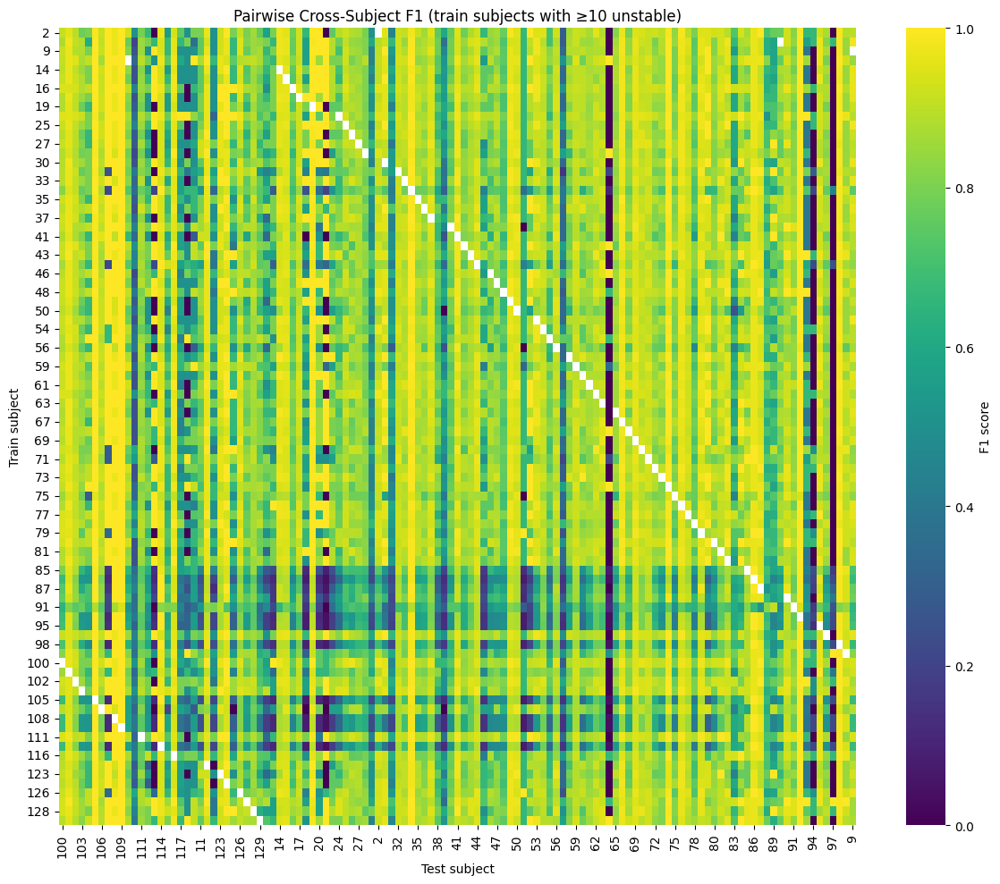

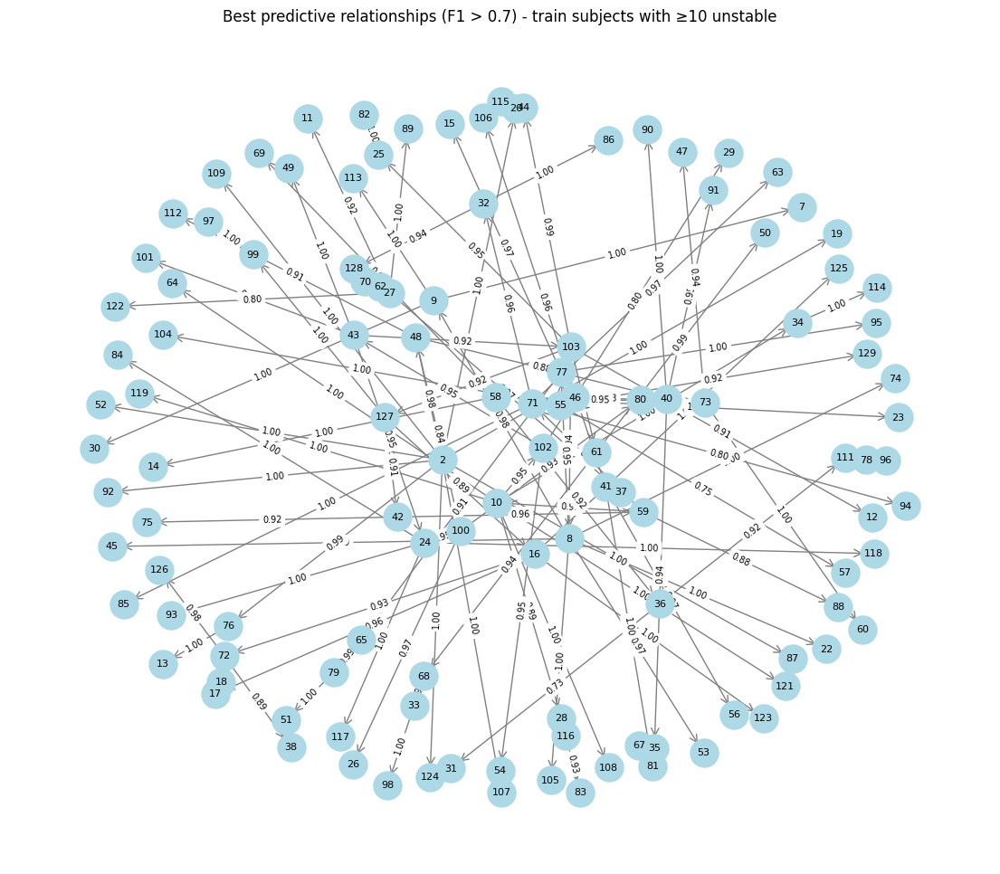

In [ ]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

# Features
features = ['sway_area', 'mean_velocity', 'cop_x_range', 'sway_path']

# Data
df = segment_data_advanced.dropna(subset=features + ['state_final', 'subject_id']).copy()
df['label'] = (df['state_final'] == 'unstable').astype(int)

# Minimum number of unstable segments required for training
min_train_unstable = 10   # <-- adjust as needed

# Get subjects with at least min_train_unstable unstable segments
subject_counts = df.groupby('subject_id')['label'].sum()
train_subjects = subject_counts[subject_counts >= min_train_unstable].index.tolist()
test_subjects = df['subject_id'].unique()  # all subjects for testing

print(f"Training subjects (≥{min_train_unstable} unstable): {len(train_subjects)}")
print(f"Testing subjects (all): {len(test_subjects)}")

# Pairwise F1 matrix
pairwise_f1 = pd.DataFrame(index=train_subjects, columns=test_subjects, dtype=float)

for train_subj in train_subjects:
    # Training data
    X_train = df[df['subject_id'] == train_subj][features]
    y_train = df[df['subject_id'] == train_subj]['label']

    # Standardize
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)

    # Train classifier
    clf = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced')
    clf.fit(X_train_scaled, y_train)

    for test_subj in test_subjects:
        if test_subj == train_subj:
            continue
        X_test = df[df['subject_id'] == test_subj][features]
        y_test = df[df['subject_id'] == test_subj]['label']
        if y_test.sum() == 0:
            pairwise_f1.loc[train_subj, test_subj] = np.nan   # no positive in test
            continue
        X_test_scaled = scaler.transform(X_test)
        y_pred = clf.predict(X_test_scaled)
        f1 = f1_score(y_test, y_pred, pos_label=1)
        pairwise_f1.loc[train_subj, test_subj] = f1

# Drop columns with all NaN (subjects with no unstable segments in any test)
pairwise_f1 = pairwise_f1.dropna(axis=1, how='all')
print(f"Pairwise F1 matrix shape: {pairwise_f1.shape}")

# Heatmap (only a subset if too large)
plt.figure(figsize=(12,10))
sns.heatmap(pairwise_f1, cmap='viridis', vmin=0, vmax=1, cbar_kws={'label': 'F1 score'})
plt.title(f'Pairwise Cross‑Subject F1 (train subjects with ≥{min_train_unstable} unstable)')
plt.xlabel('Test subject')
plt.ylabel('Train subject')
plt.tight_layout()
plt.show()

# Network of best predictors: for each test subject, find the best training subject
best_train_for_test = pairwise_f1.idxmax(axis=0)
best_f1_for_test = pairwise_f1.max(axis=0)

# Create a directed graph
import networkx as nx
G = nx.DiGraph()
for test_subj, train_subj in best_train_for_test.items():
    f1 = best_f1_for_test[test_subj]
    if f1 > 0.7:   # only strong connections
        G.add_edge(train_subj, test_subj, weight=f1)

# Draw graph
plt.figure(figsize=(14,12))
pos = nx.spring_layout(G, seed=42)
nx.draw_networkx_nodes(G, pos, node_size=500, node_color='lightblue')
nx.draw_networkx_labels(G, pos, font_size=8)
nx.draw_networkx_edges(G, pos, arrowstyle='->', arrowsize=15, edge_color='gray', width=1)
edge_labels = {(u,v): f"{d['weight']:.2f}" for u,v,d in G.edges(data=True)}
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_size=7)
plt.title(f"Best predictive relationships (F1 > 0.7) - train subjects with ≥{min_train_unstable} unstable")
plt.axis('off')
plt.show()

Number of pairwise F1 scores: 10320
Mean F1: 0.788 ± 0.224
Min F1: 0.000
Max F1: 1.000


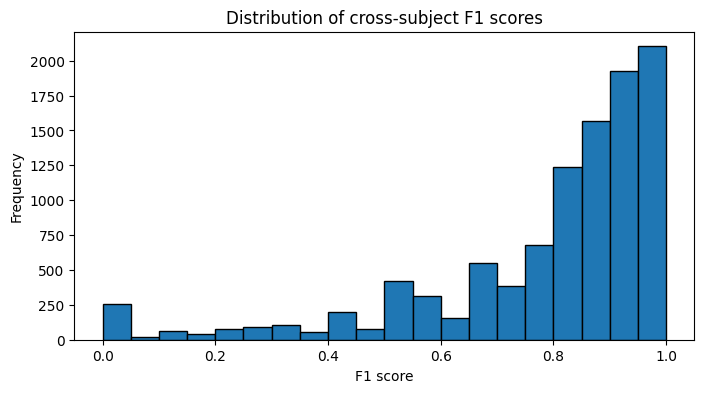


Top 10 best predictions (highest F1):
    test_subject  best_train_subject   F1
4            104                  55  1.0
7            107                   2  1.0
8            108                  10  1.0
5            105                   8  1.0
20           119                  10  1.0
22           121                  10  1.0
15           114                  34  1.0
14           113                   9  1.0
9            109                   2  1.0
24           123                  16  1.0

Bottom 10 worst predictions (lowest F1):
     test_subject  best_train_subject        F1
96             78                 111  0.880000
107            88                  59  0.875000
67             48                 100  0.837838
114            94                  71  0.800000
23            122                  27  0.800000
47             29                 102  0.800000
76             57                  55  0.750000
50             31                  36  0.727273
58             39        

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Assuming pairwise_f1 is already computed
# Flatten the matrix (ignore NaN and diagonal)
f1_values = pairwise_f1.values.flatten()
f1_values = f1_values[~np.isnan(f1_values)]
print(f"Number of pairwise F1 scores: {len(f1_values)}")
print(f"Mean F1: {np.mean(f1_values):.3f} ± {np.std(f1_values):.3f}")
print(f"Min F1: {np.min(f1_values):.3f}")
print(f"Max F1: {np.max(f1_values):.3f}")

# Histogram
plt.figure(figsize=(8,4))
plt.hist(f1_values, bins=20, edgecolor='black')
plt.xlabel('F1 score')
plt.ylabel('Frequency')
plt.title('Distribution of cross‑subject F1 scores')
plt.show()

# For each test subject, best training subject
best_for_test = pairwise_f1.idxmax(axis=0)
best_f1 = pairwise_f1.max(axis=0)
best_df = pd.DataFrame({
    'test_subject': best_for_test.index,
    'best_train_subject': best_for_test.values,
    'F1': best_f1.values
}).sort_values('F1', ascending=False)

print("\nTop 10 best predictions (highest F1):")
print(best_df.head(10))

print("\nBottom 10 worst predictions (lowest F1):")
print(best_df.tail(10))

# For each training subject, average F1 across test subjects
avg_f1_per_train = pairwise_f1.mean(axis=1).sort_values(ascending=False)
print("\nTraining subjects by average predictive power (mean F1):")
print(avg_f1_per_train.head(10))
print("\n... and worst:")
print(avg_f1_per_train.tail(10))

In [ ]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score
from sklearn.preprocessing import StandardScaler

# ---------- Configuration ----------
features = ['sway_area', 'mean_velocity', 'cop_x_range', 'sway_path']
min_train_unstable = 10   # minimum number of unstable segments for training subject
f1_threshold = 0.8        # only edges with F1 > this are kept in network
# -----------------------------------

# Prepare data
df = segment_data_advanced.dropna(subset=features + ['state_final', 'subject_id']).copy()
df['label'] = (df['state_final'] == 'unstable').astype(int)

# Subjects with enough unstable segments for training
subject_counts = df.groupby('subject_id')['label'].sum()
train_subjects = subject_counts[subject_counts >= min_train_unstable].index.tolist()
all_subjects = df['subject_id'].unique()

print(f"Training subjects (≥{min_train_unstable} unstable): {len(train_subjects)}")
print(f"All subjects (for testing): {len(all_subjects)}")

# Compute pairwise F1
edges = []  # list of (train, test, f1)
for train_subj in train_subjects:
    X_train = df[df['subject_id'] == train_subj][features]
    y_train = df[df['subject_id'] == train_subj]['label']

    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    clf = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced')
    clf.fit(X_train_scaled, y_train)

    for test_subj in all_subjects:
        if test_subj == train_subj:
            continue
        X_test = df[df['subject_id'] == test_subj][features]
        y_test = df[df['subject_id'] == test_subj]['label']
        if y_test.sum() == 0:
            continue  # no positive to evaluate
        X_test_scaled = scaler.transform(X_test)
        y_pred = clf.predict(X_test_scaled)
        f1 = f1_score(y_test, y_pred, pos_label=1)
        edges.append((train_subj, test_subj, f1))

# Create DataFrame of edges
edges_df = pd.DataFrame(edges, columns=['train', 'test', 'f1'])
print(f"Total directed pairs computed: {len(edges_df)}")

# Filter by threshold for network
strong_edges = edges_df[edges_df['f1'] > f1_threshold]
print(f"Edges with F1 > {f1_threshold}: {len(strong_edges)}")

# ----- Summary statistics -----
# Best training subjects (highest average F1 across test subjects)
train_avg = edges_df.groupby('train')['f1'].mean().sort_values(ascending=False)
print("\nTop 10 training subjects (best teachers):")
print(train_avg.head(10))

# Best test subjects (highest average F1 across training subjects)
test_avg = edges_df.groupby('test')['f1'].mean().sort_values(ascending=False)
print("\nTop 10 test subjects (easiest to predict):")
print(test_avg.head(10))

# Hardest test subjects (lowest average F1)
print("\nBottom 10 test subjects (hardest to predict):")
print(test_avg.tail(10))

# ----- Network representation (simplified) -----
# For each test subject, find the best training subject (the strongest incoming edge)
best_incoming = edges_df.loc[edges_df.groupby('test')['f1'].idxmax()]
print("\nBest predictor for each test subject (highest F1):")
print(best_incoming[['train', 'test', 'f1']].head(20))

# Create a directed graph for visualization (if number of nodes manageable)
if len(strong_edges) > 0 and len(set(strong_edges['train']) | set(strong_edges['test'])) <= 50:
    import networkx as nx
    import matplotlib.pyplot as plt
    G = nx.DiGraph()
    for _, row in strong_edges.iterrows():
        G.add_edge(row['train'], row['test'], weight=row['f1'])
    plt.figure(figsize=(12,10))
    pos = nx.spring_layout(G, seed=42)
    nx.draw_networkx_nodes(G, pos, node_size=500, node_color='lightblue')
    nx.draw_networkx_labels(G, pos, font_size=8)
    nx.draw_networkx_edges(G, pos, arrowstyle='->', arrowsize=10, edge_color='gray', width=0.5)
    plt.title(f"Cross-subject predictive network (F1 > {f1_threshold})")
    plt.axis('off')
    plt.show()
else:
    print(f"Network too large to visualize ({len(strong_edges)} edges). Consider increasing f1_threshold.")

Training subjects (≥10 unstable): 86
All subjects (for testing): 123
Total directed pairs computed: 10320
Edges with F1 > 0.8: 6474

Top 10 training subjects (best teachers):
train
127    0.870256
24     0.861608
16     0.859222
103    0.855667
80     0.854828
48     0.851529
43     0.851205
128    0.849139
102    0.847182
96     0.845820
Name: f1, dtype: float64

Top 10 test subjects (easiest to predict):
test
109    0.999265
92     0.998173
105    0.995130
34     0.985710
98     0.983315
108    0.979151
19     0.976579
74     0.972196
124    0.967810
86     0.967756
Name: f1, dtype: float64

Bottom 10 test subjects (hardest to predict):
test
122    0.519046
29     0.504230
31     0.492760
39     0.449926
118    0.441355
57     0.373938
110    0.358858
94     0.204320
64     0.135171
97     0.100735
Name: f1, dtype: float64

Best predictor for each test subject (highest F1):
      train  test        f1
3408     48     2  0.977273
338       9     7  1.000000
8628    103     8  0.941176

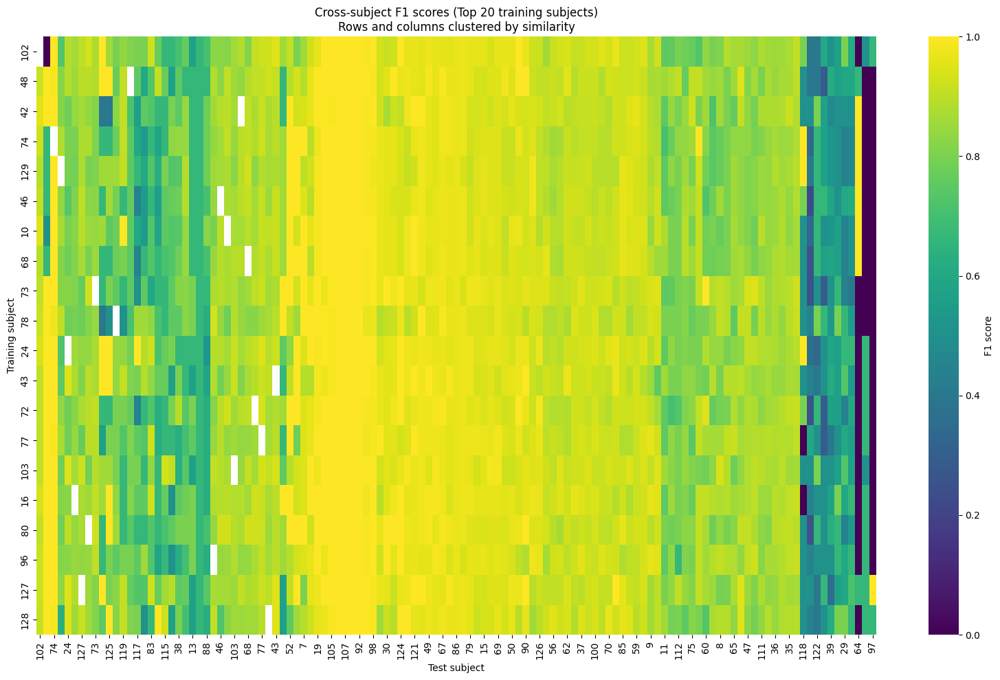

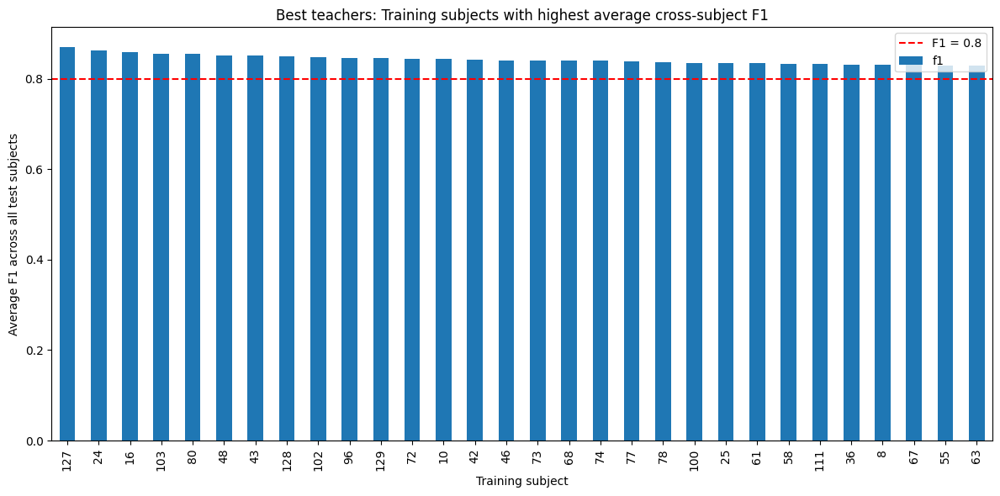

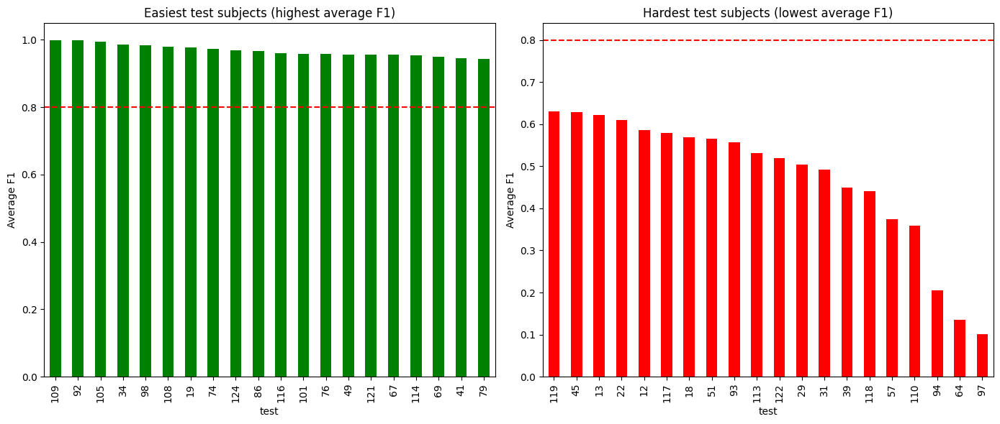


Best predictor for each test subject (top 20 highest F1):
      train  test   f1
338       9     7  1.0
6152     76    13  1.0
4233     58    14  1.0
289       9    30  1.0
4241     58    23  1.0
38        2    19  1.0
39        2    20  1.0
160       8    22  1.0
876      17    18  1.0
2947     43    49  1.0
6550     79    51  1.0
70        2    52  1.0
5839     73    60  1.0
2459     37    41  1.0
412      10    34  1.0
2629     40    90  1.0
1547     27    89  1.0
6354     77    95  1.0
1192     24    93  1.0
111       2    92  1.0

Best predictor for each test subject (bottom 20 lowest F1):
       train  test        f1
10020    127    42  0.909091
8550     103    12  0.909091
3373      48   112  0.909091
8599     103    61  0.901099
405       10    28  0.893617
5697      72    38  0.888889
3193      46    55  0.888889
184        8    45  0.888889
9994     127    16  0.885246
3419      48    40  0.882353
9215     111    78  0.880000
4426      59    88  0.875000
8226     100    48  

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.cluster.hierarchy import linkage, leaves_list

# Assume edges_df is already computed (train, test, f1)
# Create pivot matrix (train rows, test columns)
pivot = edges_df.pivot(index='train', columns='test', values='f1')

# For clarity, we can restrict to top N training subjects (e.g., top 20 teachers)
top_teachers = edges_df.groupby('train')['f1'].mean().sort_values(ascending=False).head(20).index
pivot_top = pivot.loc[top_teachers]

# Reorder rows and columns by hierarchical clustering to reveal structure
if pivot_top.shape[1] > 1:
    row_linkage = linkage(pivot_top.fillna(0), method='average')
    col_linkage = linkage(pivot_top.T.fillna(0), method='average')
    row_order = leaves_list(row_linkage)
    col_order = leaves_list(col_linkage)
    pivot_top = pivot_top.iloc[row_order, col_order]

# Heatmap
plt.figure(figsize=(16, 10))
sns.heatmap(pivot_top, cmap='viridis', vmin=0, vmax=1, cbar_kws={'label': 'F1 score'})
plt.title('Cross‑subject F1 scores (Top 20 training subjects)\nRows and columns clustered by similarity')
plt.xlabel('Test subject')
plt.ylabel('Training subject')
plt.tight_layout()
plt.show()

# Bar chart: top training subjects (best teachers)
train_avg = edges_df.groupby('train')['f1'].mean().sort_values(ascending=False)
plt.figure(figsize=(12,6))
train_avg.head(30).plot(kind='bar')
plt.axhline(y=0.8, color='r', linestyle='--', label='F1 = 0.8')
plt.xlabel('Training subject')
plt.ylabel('Average F1 across all test subjects')
plt.title('Best teachers: Training subjects with highest average cross‑subject F1')
plt.legend()
plt.tight_layout()
plt.show()

# Bar chart: easiest and hardest test subjects
test_avg = edges_df.groupby('test')['f1'].mean().sort_values(ascending=False)
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
test_avg.head(20).plot(kind='bar', color='green')
plt.axhline(y=0.8, color='r', linestyle='--')
plt.title('Easiest test subjects (highest average F1)')
plt.ylabel('Average F1')
plt.subplot(1,2,2)
test_avg.tail(20).plot(kind='bar', color='red')
plt.axhline(y=0.8, color='r', linestyle='--')
plt.title('Hardest test subjects (lowest average F1)')
plt.ylabel('Average F1')
plt.tight_layout()
plt.show()

# For each test subject, best training subject and its F1 (already in best_incoming)
# Show a sample of best predictions (e.g., first 20 and last 20)
best_incoming = edges_df.loc[edges_df.groupby('test')['f1'].idxmax()].copy()
best_incoming = best_incoming.sort_values('f1', ascending=False)
print("\nBest predictor for each test subject (top 20 highest F1):")
print(best_incoming[['train', 'test', 'f1']].head(20))
print("\nBest predictor for each test subject (bottom 20 lowest F1):")
print(best_incoming[['train', 'test', 'f1']].tail(20))

In [ ]:
# import pandas as pd
# import numpy as np

# # Assume edges_df is already computed (train, test, f1)
# # Also best_incoming (best predictor per test subject)

# # 1. Pairwise F1 matrix (pivot)
# pairwise_matrix = edges_df.pivot(index='train', columns='test', values='f1')
# pairwise_matrix.to_csv('pairwise_f1_matrix.csv')
# print("Saved pairwise_f1_matrix.csv")

# # 2. Best predictor per test subject
# best_incoming.to_csv('best_predictor_per_test.csv', index=False)
# print("Saved best_predictor_per_test.csv")

# # 3. Training subject summary (average F1 across test subjects)
# train_summary = edges_df.groupby('train')['f1'].agg(['mean', 'std', 'count']).reset_index()
# train_summary.columns = ['train_subject', 'mean_f1', 'std_f1', 'num_tested']
# train_summary.to_csv('training_subject_summary.csv', index=False)
# print("Saved training_subject_summary.csv")

# # 4. Test subject summary (average F1 across training subjects)
# test_summary = edges_df.groupby('test')['f1'].agg(['mean', 'std', 'count']).reset_index()
# test_summary.columns = ['test_subject', 'mean_f1', 'std_f1', 'num_trainers']
# test_summary.to_csv('test_subject_summary.csv', index=False)
# print("Saved test_subject_summary.csv")

# # Download all files (Google Colab)
# from google.colab import files
# files.download('pairwise_f1_matrix.csv')
# files.download('best_predictor_per_test.csv')
# files.download('training_subject_summary.csv')
# files.download('test_subject_summary.csv')

In [ ]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score
from sklearn.preprocessing import StandardScaler

# ---------- Configuration ----------
features = ['sway_area', 'mean_velocity', 'cop_x_range', 'sway_path']
min_train_unstable = 1   # include all subjects with at least 1 unstable segment
# -----------------------------------

# Prepare data
df = segment_data_advanced.dropna(subset=features + ['state_final', 'subject_id']).copy()
df['label'] = (df['state_final'] == 'unstable').astype(int)

# Get all subjects with at least 1 unstable segment (for both training and testing)
subject_counts = df.groupby('subject_id')['label'].sum()
all_subjects = subject_counts[subject_counts >= 1].index.tolist()
print(f"Number of subjects with at least 1 unstable segment: {len(all_subjects)}")

# For each training subject, we need its data
pairwise_results = []  # list of (train, test, f1)

for train_subj in all_subjects:
    X_train = df[df['subject_id'] == train_subj][features]
    y_train = df[df['subject_id'] == train_subj]['label']

    # Skip if training subject has no unstable (shouldn't happen due to filter)
    if y_train.sum() == 0:
        continue

    # Standardize based on training data
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)

    # Train classifier
    clf = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced')
    clf.fit(X_train_scaled, y_train)

    # Test on all other subjects
    for test_subj in all_subjects:
        if test_subj == train_subj:
            continue
        X_test = df[df['subject_id'] == test_subj][features]
        y_test = df[df['subject_id'] == test_subj]['label']
        if y_test.sum() == 0:
            # No positive samples in test – F1 undefined; we can set to NaN
            pairwise_results.append((train_subj, test_subj, np.nan))
            continue
        X_test_scaled = scaler.transform(X_test)
        y_pred = clf.predict(X_test_scaled)
        f1 = f1_score(y_test, y_pred, pos_label=1)
        pairwise_results.append((train_subj, test_subj, f1))

# Convert to DataFrame
pairwise_df = pd.DataFrame(pairwise_results, columns=['train', 'test', 'f1'])
print(f"Total directed pairs computed: {len(pairwise_df)}")

# Create pivot matrix (rows = train, columns = test)
pivot = pairwise_df.pivot(index='train', columns='test', values='f1')
# Fill missing with NaN (already done)
pivot.to_csv('full_pairwise_f1_matrix.csv')
print("Saved full_pairwise_f1_matrix.csv")

# Best predictor for each test subject
best_incoming = pairwise_df.loc[pairwise_df.groupby('test')['f1'].idxmax()]
best_incoming.to_csv('full_best_predictor_per_test.csv', index=False)
print("Saved full_best_predictor_per_test.csv")

# Training subject summary (average F1 across test subjects)
train_summary = pairwise_df.groupby('train')['f1'].agg(['mean', 'std', 'count']).reset_index()
train_summary.columns = ['train_subject', 'mean_f1', 'std_f1', 'num_tested']
train_summary.to_csv('full_training_subject_summary.csv', index=False)
print("Saved full_training_subject_summary.csv")

# Test subject summary (average F1 across training subjects)
test_summary = pairwise_df.groupby('test')['f1'].agg(['mean', 'std', 'count']).reset_index()
test_summary.columns = ['test_subject', 'mean_f1', 'std_f1', 'num_trainers']
test_summary.to_csv('full_test_subject_summary.csv', index=False)
print("Saved full_test_subject_summary.csv")

# Download (if in Colab)
from google.colab import files
files.download('full_pairwise_f1_matrix.csv')
files.download('full_best_predictor_per_test.csv')
files.download('full_training_subject_summary.csv')
files.download('full_test_subject_summary.csv')

Number of subjects with at least 1 unstable segment: 121
Total directed pairs computed: 14520
Saved full_pairwise_f1_matrix.csv
Saved full_best_predictor_per_test.csv
Saved full_training_subject_summary.csv
Saved full_test_subject_summary.csv


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# After computing pairwise_df, add a column for number of unstable in test
test_unstable_counts = df.groupby('subject_id')['label'].sum().to_dict()
pairwise_df['test_n_unstable'] = pairwise_df['test'].map(test_unstable_counts)

# Filter to test subjects with >= 10 unstable
filtered = pairwise_df[pairwise_df['test_n_unstable'] >= 10]
print(f"Number of pairs with test subject having ≥10 unstable: {len(filtered)}")
print("Mean F1:", filtered['f1'].mean())
print("Proportion of perfect F1 (==1.0):", (filtered['f1'] == 1.0).mean())

Number of pairs with test subject having ≥10 unstable: 10320
Mean F1: 0.832236033596097
Proportion of perfect F1 (==1.0): 0.05765503875968992


=== Dataset Overview ===
Total number of segments: 5570
Number of unique subjects: 123
Number of unique trials (file_id): 997

=== State Distribution (segments) ===
state_final
stable      3013
unstable    2557
Name: count, dtype: int64
Proportion of unstable segments: 45.91%

=== Per‑Subject Summary ===
Subjects with at least one unstable segment: 121
Subjects with zero unstable segments: 2
Mean unstable segments per subject: 20.8
Median unstable segments per subject: 17.0

=== Feature Statistics by State ===
            sway_area                       mean_velocity                \
                 mean    std    min     max          mean    std    min   
state_final                                                               
stable         17.347  1.711  7.742  18.829         0.014  0.002  0.006   
unstable       18.079  0.967  7.572  18.829         0.021  0.003  0.013   

                   cop_x_range         ... sway_path         sampen_x         \
               max        me

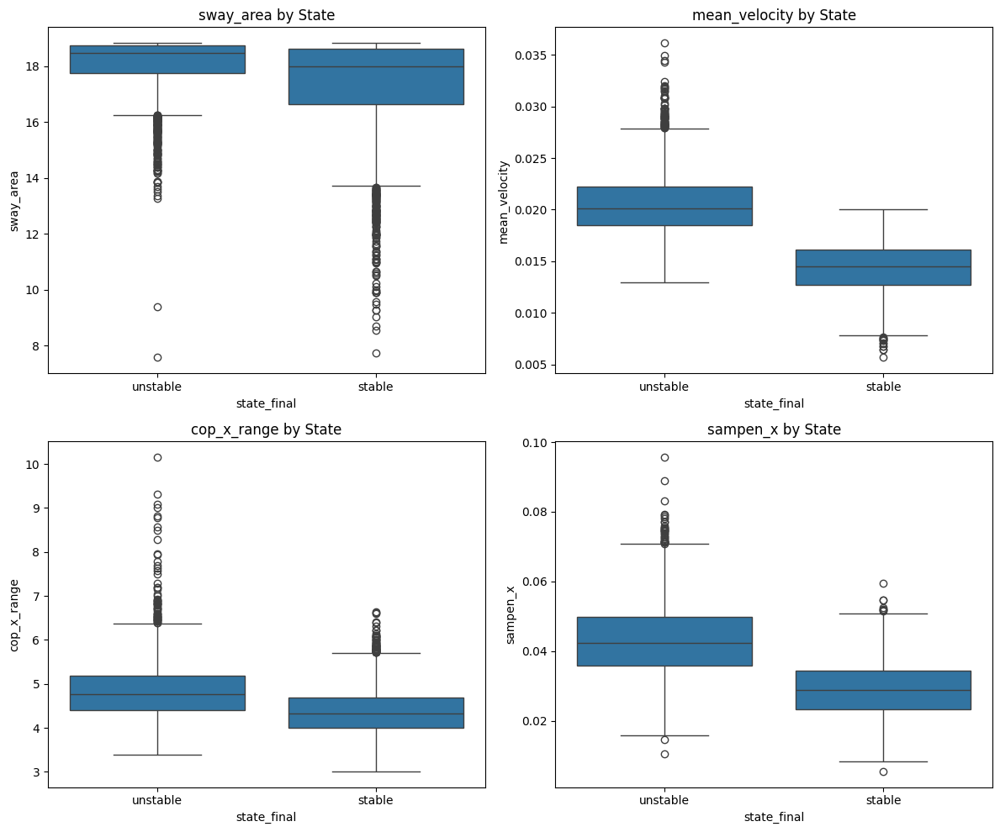

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Assume segment_data_advanced is already loaded and has 'state_final' column
df = segment_data_advanced.copy()

# 1. Overall dataset size
print("=== Dataset Overview ===")
print(f"Total number of segments: {len(df)}")
print(f"Number of unique subjects: {df['subject_id'].nunique()}")
print(f"Number of unique trials (file_id): {df['file_id'].nunique()}")

# 2. State distribution (stable vs unstable)
state_counts = df['state_final'].value_counts()
print("\n=== State Distribution (segments) ===")
print(state_counts)
print(f"Proportion of unstable segments: {state_counts.get('unstable', 0)/len(df):.2%}")

# 3. Per-subject counts
subject_state = df.groupby('subject_id')['state_final'].value_counts().unstack(fill_value=0)
subject_state.columns = ['stable', 'unstable'] if 'stable' in subject_state else ['unstable', 'stable']
print("\n=== Per‑Subject Summary ===")
print(f"Subjects with at least one unstable segment: {(subject_state['unstable'] > 0).sum()}")
print(f"Subjects with zero unstable segments: {(subject_state['unstable'] == 0).sum()}")
print(f"Mean unstable segments per subject: {subject_state['unstable'].mean():.1f}")
print(f"Median unstable segments per subject: {subject_state['unstable'].median():.1f}")

# 4. Feature statistics by state
features = ['sway_area', 'mean_velocity', 'cop_x_range', 'sway_path', 'sampen_x', 'sampen_y']
stats = df.groupby('state_final')[features].agg(['mean', 'std', 'min', 'max']).round(3)
print("\n=== Feature Statistics by State ===")
print(stats)

# 5. Boxplots for key features
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
features_to_plot = ['sway_area', 'mean_velocity', 'cop_x_range', 'sampen_x']
for ax, feat in zip(axes.flat, features_to_plot):
    sns.boxplot(data=df, x='state_final', y=feat, ax=ax)
    ax.set_title(f'{feat} by State')
plt.tight_layout()
plt.show()

In [ ]:
# ============================================================
# PART 1: IMPORTS
# ============================================================
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import seaborn as sns

# ============================================================
# PART 2: AGGREGATE SUBJECT-LEVEL FEATURES
# ============================================================
# Assuming segment_data_advanced is already loaded and contains:
#   subject_id, state_final, sway_area, mean_velocity, sampen_x, sampen_y,
#   age, height, mass, condition, file_id, etc.

df = segment_data_advanced.copy()

# Basic aggregations per subject
subject_features = df.groupby('subject_id').agg(
    mean_sway_area=('sway_area', 'mean'),
    mean_velocity=('mean_velocity', 'mean'),
    mean_sampen_x=('sampen_x', 'mean'),
    mean_sampen_y=('sampen_y', 'mean'),
    prop_unstable=('state_final', lambda x: (x == 'unstable').mean()),
    age=('age', 'first'),
    height=('height', 'first'),
    mass=('mass', 'first')
).reset_index()

# Stable and unstable specific sway area means
unstable_means = df[df['state_final']=='unstable'].groupby('subject_id')['sway_area'].mean().rename('unstable_sway_area')
stable_means = df[df['state_final']=='stable'].groupby('subject_id')['sway_area'].mean().rename('stable_sway_area')
subject_features = subject_features.merge(unstable_means, on='subject_id', how='left')
subject_features = subject_features.merge(stable_means, on='subject_id', how='left')

# Drop subjects without both stable and unstable segments (they cannot be used for clustering)
subject_features = subject_features.dropna(subset=['unstable_sway_area', 'stable_sway_area'])
print(f"Number of subjects with both stable and unstable segments: {len(subject_features)}")

# ============================================================
# PART 3: SELECT FEATURES AND STANDARDIZE
# ============================================================
features = [
    'mean_sway_area', 'mean_velocity', 'mean_sampen_x',
    'prop_unstable', 'unstable_sway_area', 'stable_sway_area'
]
X = subject_features[features].copy()
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# ============================================================
# PART 4: PCA FOR VISUALIZATION
# ============================================================
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)
print(f"Explained variance ratio: PC1={pca.explained_variance_ratio_[0]:.3f}, PC2={pca.explained_variance_ratio_[1]:.3f}")

plt.figure(figsize=(8,6))
plt.scatter(X_pca[:,0], X_pca[:,1], alpha=0.7)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('PCA of Subject‑Level Features')
plt.show()

# ============================================================
# PART 5: DETERMINE OPTIMAL NUMBER OF CLUSTERS (K-MEANS)
# ============================================================
K_range = range(2, 7)
silhouette_scores = []
for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = kmeans.fit_predict(X_scaled)
    sil = silhouette_score(X_scaled, labels)
    silhouette_scores.append(sil)
    print(f"k={k}, silhouette={sil:.3f}")

plt.plot(K_range, silhouette_scores, marker='o')
plt.xlabel('k')
plt.ylabel('Silhouette')
plt.title('Silhouette Score for Subject Clustering')
plt.show()

# Choose best k (here we take the one with highest silhouette)
best_k = K_range[np.argmax(silhouette_scores)]
print(f"\nBest number of clusters: {best_k}")

# ============================================================
# PART 6: FINAL CLUSTERING AND ASSIGNMENT
# ============================================================
kmeans_final = KMeans(n_clusters=best_k, random_state=42, n_init=10)
subject_features['cluster'] = kmeans_final.fit_predict(X_scaled)

print("\nCluster sizes:")
print(subject_features['cluster'].value_counts().sort_index())

# ============================================================
# PART 7: INTERPRET CLUSTERS
# ============================================================
cluster_summary = subject_features.groupby('cluster')[features + ['age', 'height', 'mass']].mean()
print("\nCluster characteristics (mean values):")
print(cluster_summary.round(2))

# Visualize clusters in PCA space
plt.figure(figsize=(8,6))
sns.scatterplot(x=X_pca[:,0], y=X_pca[:,1], hue=subject_features['cluster'], palette='Set1')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title(f'Subject Clusters (k={best_k})')
plt.legend(title='Cluster')
plt.show()

# ============================================================
# PART 8: RELATE TO EXPERIMENTAL CONDITION
# ============================================================
# Aggregate condition proportions per subject
cond_counts = df.groupby(['subject_id', 'condition']).size().unstack(fill_value=0)
cond_props = cond_counts.div(cond_counts.sum(axis=1), axis=0)
subject_features = subject_features.merge(cond_props, on='subject_id', how='left')
print("\nAverage condition proportions by cluster:")
print(subject_features.groupby('cluster')[['free', 'stress', 'euro']].mean().round(2))

# ============================================================
# PART 9: STATISTICAL TESTS BETWEEN CLUSTERS (optional)
# ============================================================
from scipy.stats import ttest_ind

cluster0 = subject_features[subject_features['cluster'] == 0]
cluster1 = subject_features[subject_features['cluster'] == 1]
if len(cluster0) > 1 and len(cluster1) > 1:
    print("\nT-test between clusters for selected features:")
    for feat in ['mean_sway_area', 'prop_unstable', 'age', 'height', 'mass']:
        stat, p = ttest_ind(cluster0[feat], cluster1[feat])
        print(f"{feat}: p={p:.4f}")

# ============================================================
# PART 10: SAVE RESULTS
# ============================================================
subject_features.to_csv('subject_clusters.csv', index=False)
print("\nSaved subject_clusters.csv")

KeyError: "Column(s) ['state_final'] do not exist"

#Classifying subject class from short signal window


In [ ]:
# ============================================================
# 0. Load data and merge subject clusters
# ============================================================
import pandas as pd
import numpy as np
import pyarrow.parquet as pq
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import LeaveOneGroupOut, GroupKFold
from sklearn.metrics import accuracy_score, f1_score
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_rel, ttest_ind

# Load raw signals
signals = pq.read_table('signals_cleaned.parquet').to_pandas()

# Assume segment_data_advanced already contains: subject_id, state_final, condition, file_id, and features
df = segment_data_advanced.copy()

# If subject_features (from subject-level clustering) is not yet in memory, we need to recompute it.
# But we assume it exists with columns 'subject_id' and 'cluster'.
# If not, run subject clustering code first (see previous answer).
# Here we simply merge:
if 'cluster' not in df.columns:
    # subject_features must be defined earlier
    df = df.merge(subject_features[['subject_id', 'cluster']], on='subject_id', how='left')
    print("Merged cluster column into segment data.")
else:
    print("Cluster column already present.")

# Drop rows where cluster is NaN (subjects without both stable/unstable)
df = df.dropna(subset=['cluster'])

# ============================================================
# ANALYSIS 1: Predict subject class from 5‑second CoP window
# ============================================================
window_samples = 1250  # 5 seconds at 250 Hz
features_short = ['sway_area', 'mean_velocity', 'cop_x_range', 'sampen_x']

subject_clusters = df[['subject_id', 'cluster']].drop_duplicates()
short_window_features = []

for subj in subject_clusters['subject_id'].unique():
    # Get first trial for this subject (any file_id)
    subj_files = df[df['subject_id'] == subj]['file_id'].unique()
    if len(subj_files) == 0:
        continue
    first_file = subj_files[0]
    # Extract raw signal for that trial
    trial_signal = signals[signals['file_id'] == first_file].sort_values('sample_num')
    if len(trial_signal) < window_samples:
        # Not enough samples – skip this subject
        continue
    x = trial_signal['cop_x'].values[:window_samples]
    y = trial_signal['cop_y'].values[:window_samples]

    # Compute features
    dx = np.diff(x)
    dy = np.diff(y)
    sway_path = np.sum(np.sqrt(dx**2 + dy**2))
    mean_velocity = sway_path / window_samples
    cop_x_range = np.max(x) - np.min(x)
    # Sway area (95% ellipse)
    if window_samples > 2:
        cov = np.cov(x, y)
        eigvals, _ = np.linalg.eigh(cov)
        sway_area = np.pi * np.sqrt(np.prod(eigvals)) * 5.991
    else:
        sway_area = np.nan
    # Sample entropy (using nolds if available)
    try:
        from nolds import sampen
        sampen_x = sampen(x, emb_dim=2, tolerance=0.2)
    except:
        sampen_x = np.nan

    short_window_features.append({
        'subject_id': subj,
        'sway_area': sway_area,
        'mean_velocity': mean_velocity,
        'cop_x_range': cop_x_range,
        'sampen_x': sampen_x
    })

subj_short = pd.DataFrame(short_window_features).dropna()
subj_short = subj_short.merge(subject_clusters, on='subject_id')
print(f"Subjects with valid 5s window: {len(subj_short)}")

X_short = subj_short[features_short]
y_short = subj_short['cluster']
logo = LeaveOneGroupOut()
acc_list, f1_list = [], []
for train_idx, test_idx in logo.split(X_short, y_short, groups=subj_short['subject_id']):
    X_tr, X_te = X_short.iloc[train_idx], X_short.iloc[test_idx]
    y_tr, y_te = y_short.iloc[train_idx], y_short.iloc[test_idx]
    scaler = StandardScaler()
    X_tr_scaled = scaler.fit_transform(X_tr)
    X_te_scaled = scaler.transform(X_te)
    clf = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced')
    clf.fit(X_tr_scaled, y_tr)
    y_pred = clf.predict(X_te_scaled)
    acc_list.append(accuracy_score(y_te, y_pred))
    f1_list.append(f1_score(y_te, y_pred, average='weighted'))

print("\n=== Subject class from 5s window (leave‑one‑subject‑out) ===")
print(f"Accuracy: {np.mean(acc_list):.3f} ± {np.std(acc_list):.3f}")
print(f"Weighted F1: {np.mean(f1_list):.3f} ± {np.std(f1_list):.3f}")

# ============================================================
# ANALYSIS 2: Response to stress by subject class
# ============================================================
# Proportion of unstable segments per subject under stress and free
stress_prop = df[df['condition']=='stress'].groupby('subject_id')['state_final'].apply(lambda x: (x=='unstable').mean()).rename('stress_unstable_prop')
free_prop = df[df['condition']=='free'].groupby('subject_id')['state_final'].apply(lambda x: (x=='unstable').mean()).rename('free_unstable_prop')
subj_response = subject_clusters.merge(stress_prop, on='subject_id', how='inner')
subj_response = subj_response.merge(free_prop, on='subject_id', how='inner')

# Melt for plotting
response_melted = subj_response.melt(id_vars=['subject_id','cluster'], value_vars=['stress_unstable_prop','free_unstable_prop'], var_name='condition', value_name='unstable_prop')
response_melted['condition'] = response_melted['condition'].map({'stress_unstable_prop':'stress','free_unstable_prop':'free'})

plt.figure(figsize=(8,6))
sns.boxplot(data=response_melted, x='condition', y='unstable_prop', hue='cluster')
plt.title('Unstable proportion by condition and subject class')
plt.ylabel('Proportion of unstable segments')
plt.show()

print("\n=== Response to stress within each class ===")
for cl in [0,1]:
    subj = subj_response[subj_response['cluster']==cl]
    if len(subj) > 1:
        t_stat, p_val = ttest_rel(subj['stress_unstable_prop'], subj['free_unstable_prop'])
        print(f"Cluster {cl}: p={p_val:.4f}")
# Between clusters under stress
c0_stress = subj_response[subj_response['cluster']==0]['stress_unstable_prop']
c1_stress = subj_response[subj_response['cluster']==1]['stress_unstable_prop']
t_stat, p_val = ttest_ind(c0_stress, c1_stress)
print(f"Between clusters under stress: p={p_val:.4f}")

# ============================================================
# ANALYSIS 3: Subject class as covariate in segment‑level prediction
# ============================================================
features_cov = ['sway_area', 'mean_velocity', 'cop_x_range', 'sway_path', 'cluster']
X_cov = df[features_cov]
y_cov = (df['state_final'] == 'unstable').astype(int)
groups_cov = df['file_id']
gkf = GroupKFold(n_splits=5)
f1_cov = []
for train_idx, val_idx in gkf.split(X_cov, y_cov, groups=groups_cov):
    X_tr, X_te = X_cov.iloc[train_idx], X_cov.iloc[val_idx]
    y_tr, y_te = y_cov.iloc[train_idx], y_cov.iloc[val_idx]
    if y_te.sum() == 0:
        continue
    scaler = StandardScaler()
    X_tr_scaled = scaler.fit_transform(X_tr)
    X_te_scaled = scaler.transform(X_te)
    clf = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced')
    clf.fit(X_tr_scaled, y_tr)
    y_pred = clf.predict(X_te_scaled)
    f1_cov.append(f1_score(y_te, y_pred, pos_label=1))

print("\n=== Segment‑level unstable prediction with subject class covariate ===")
print(f"F1 (unstable): {np.mean(f1_cov):.3f} ± {np.std(f1_cov):.3f}")

NameError: name 'subject_features' is not defined

#Class prediction using longer window

Window 2500: Accuracy = 0.618 ± 0.486, F1 = 0.618 ± 0.486
Window 5000: Accuracy = 0.732 ± 0.443, F1 = 0.732 ± 0.443
Window 7500: Accuracy = 0.756 ± 0.429, F1 = 0.756 ± 0.429
Window 10000: Accuracy = 0.748 ± 0.434, F1 = 0.748 ± 0.434
Window full: Accuracy = 0.732 ± 0.443, F1 = 0.732 ± 0.443


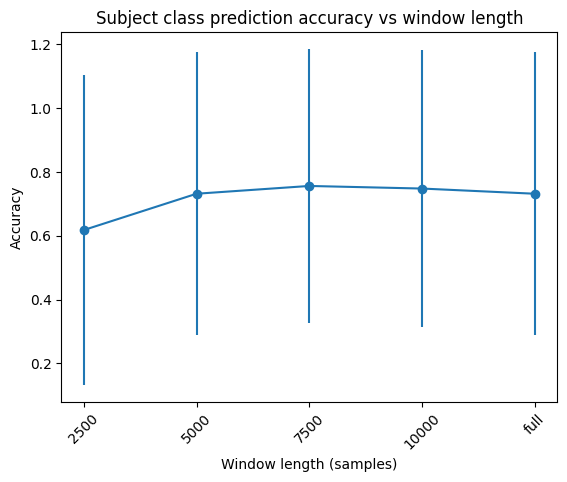

In [ ]:
import pandas as pd
import numpy as np
import pyarrow.parquet as pq
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import LeaveOneGroupOut
from sklearn.metrics import accuracy_score, f1_score
import matplotlib.pyplot as plt

# ============================================================
# 1. Load data
# ============================================================
signals = pq.read_table('signals_cleaned.parquet').to_pandas()
df = segment_data_advanced.copy()

# ============================================================
# 2. Create segment-level 'state_final' using K-means on old features
# ============================================================
old_features = ['cop_x_mean', 'cop_x_std', 'cop_x_range',
                'cop_y_mean', 'cop_y_std', 'cop_y_range',
                'sway_path', 'mean_velocity', 'sway_area']
df_clean = df.dropna(subset=old_features).copy()
scaler_seg = StandardScaler()
X_seg = scaler_seg.fit_transform(df_clean[old_features])
kmeans_seg = KMeans(n_clusters=2, random_state=42, n_init=10)
df_clean['cluster_seg'] = kmeans_seg.fit_predict(X_seg)
# Determine which cluster has higher sway area (unstable)
seg_means = df_clean.groupby('cluster_seg')['sway_area'].mean()
unstable_cluster_seg = seg_means.idxmax()
df_clean['state_final'] = df_clean['cluster_seg'].apply(lambda x: 'unstable' if x == unstable_cluster_seg else 'stable')
# Merge back to original df (keeping all rows)
df = df.merge(df_clean[['file_id', 'sample_start', 'sample_end', 'state_final']],
              on=['file_id', 'sample_start', 'sample_end'], how='left')
# Drop rows where state_final is NaN (if any)
df = df.dropna(subset=['state_final'])

# ============================================================
# 3. Create subject-level clusters using aggregated features
# ============================================================
subject_agg = df.groupby('subject_id').agg(
    mean_sway_area=('sway_area', 'mean'),
    mean_velocity=('mean_velocity', 'mean'),
    mean_sampen_x=('sampen_x', 'mean'),
    prop_unstable=('state_final', lambda x: (x == 'unstable').mean())
).reset_index()

features_subj = ['mean_sway_area', 'mean_velocity', 'mean_sampen_x', 'prop_unstable']
scaler_subj = StandardScaler()
X_subj = scaler_subj.fit_transform(subject_agg[features_subj])
kmeans_subj = KMeans(n_clusters=2, random_state=42, n_init=10)
subject_agg['cluster'] = kmeans_subj.fit_predict(X_subj)
# Identify unstable-prone cluster (higher prop_unstable)
cluster_means = subject_agg.groupby('cluster')['prop_unstable'].mean()
unstable_cluster_subj = cluster_means.idxmax()
subject_features = subject_agg[['subject_id', 'cluster']].copy()

# Merge subject cluster into segment data
df = df.merge(subject_features, on='subject_id', how='left')
df = df.dropna(subset=['cluster'])

# ============================================================
# 4. Subject class prediction with varying window lengths
# ============================================================
window_samples = [2500, 5000, 7500, 10000, 'full']
results = []

def extract_features(x, y):
    dx = np.diff(x)
    dy = np.diff(y)
    sway_path = np.sum(np.sqrt(dx**2 + dy**2))
    n = len(x)
    mean_velocity = sway_path / n if n > 1 else 0
    cop_x_range = np.max(x) - np.min(x)
    if n > 2:
        cov = np.cov(x, y)
        eigvals, _ = np.linalg.eigh(cov)
        sway_area = np.pi * np.sqrt(np.prod(eigvals)) * 5.991
    else:
        sway_area = np.nan
    try:
        from nolds import sampen
        sampen_x = sampen(x, emb_dim=2, tolerance=0.2)
    except:
        sampen_x = np.nan
    return sway_area, mean_velocity, cop_x_range, sampen_x

for win in window_samples:
    subject_data = []
    for subj in df['subject_id'].unique():
        subj_files = df[df['subject_id'] == subj]['file_id'].unique()
        if len(subj_files) == 0:
            continue
        first_file = subj_files[0]
        trial_signal = signals[signals['file_id'] == first_file].sort_values('sample_num')
        total_len = len(trial_signal)
        if win == 'full':
            n_samples = total_len
        else:
            n_samples = min(win, total_len)
        if n_samples < 100:
            continue
        x = trial_signal['cop_x'].values[:n_samples]
        y = trial_signal['cop_y'].values[:n_samples]
        feats = extract_features(x, y)
        if np.isnan(feats).any():
            continue
        subject_data.append({
            'subject_id': subj,
            'sway_area': feats[0],
            'mean_velocity': feats[1],
            'cop_x_range': feats[2],
            'sampen_x': feats[3]
        })
    subj_df = pd.DataFrame(subject_data)
    if len(subj_df) < 2:
        continue
    subj_df = subj_df.merge(subject_features, on='subject_id')
    X = subj_df[['sway_area', 'mean_velocity', 'cop_x_range', 'sampen_x']]
    y = subj_df['cluster']
    groups = subj_df['subject_id']

    logo = LeaveOneGroupOut()
    accs, f1s = [], []
    for train_idx, test_idx in logo.split(X, y, groups=groups):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)
        clf = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced')
        clf.fit(X_train_scaled, y_train)
        y_pred = clf.predict(X_test_scaled)
        accs.append(accuracy_score(y_test, y_pred))
        f1s.append(f1_score(y_test, y_pred, average='weighted'))
    results.append({
        'window_samples': win if win != 'full' else 'full',
        'mean_accuracy': np.mean(accs),
        'std_accuracy': np.std(accs),
        'mean_f1': np.mean(f1s),
        'std_f1': np.std(f1s),
        'n_subjects': len(subj_df)
    })
    print(f"Window {win}: Accuracy = {np.mean(accs):.3f} ± {np.std(accs):.3f}, F1 = {np.mean(f1s):.3f} ± {np.std(f1s):.3f}")

# Plot
results_df = pd.DataFrame(results)
plt.errorbar(results_df['window_samples'].astype(str), results_df['mean_accuracy'], yerr=results_df['std_accuracy'], marker='o')
plt.xlabel('Window length (samples)')
plt.ylabel('Accuracy')
plt.title('Subject class prediction accuracy vs window length')
plt.xticks(rotation=45)
plt.show()

#Segment Level Classification

In [ ]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GroupKFold
from sklearn.metrics import f1_score

# ============================================================
# 1. Recreate 'state_final' using K-means on old features
# ============================================================
# Assume segment_data_advanced contains these columns:
old_features = ['cop_x_mean', 'cop_x_std', 'cop_x_range',
                'cop_y_mean', 'cop_y_std', 'cop_y_range',
                'sway_path', 'mean_velocity', 'sway_area']

# Drop rows with missing values (if any)
df = segment_data_advanced.dropna(subset=old_features).copy()

# Standardize
scaler_cluster = StandardScaler()
X_cluster = scaler_cluster.fit_transform(df[old_features])

# K-means with 2 clusters
kmeans = KMeans(n_clusters=2, random_state=42, n_init=10)
df['cluster'] = kmeans.fit_predict(X_cluster)

# Determine which cluster has higher sway area (unstable)
cluster_means = df.groupby('cluster')['sway_area'].mean()
unstable_cluster = cluster_means.idxmax()
df['state_final'] = df['cluster'].apply(lambda x: 'unstable' if x == unstable_cluster else 'stable')

print("State counts after clustering:")
print(df['state_final'].value_counts())

# ============================================================
# 2. Segment-level unstable detection model
# ============================================================
df['target'] = (df['state_final'] == 'unstable').astype(int)

features = ['sway_area', 'mean_velocity', 'cop_x_range', 'sway_path']
X = df[features]
y = df['target']
groups = df['file_id']

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

gkf = GroupKFold(n_splits=5)
f1_scores = []
for train_idx, val_idx in gkf.split(X_scaled, y, groups):
    X_train, X_val = X_scaled[train_idx], X_scaled[val_idx]
    y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
    if y_val.sum() == 0:
        continue
    clf = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced')
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_val)
    f1_scores.append(f1_score(y_val, y_pred, pos_label=1))

print(f"\nSegment-level unstable detection (full segments):")
print(f"Mean F1 = {np.mean(f1_scores):.3f} ± {np.std(f1_scores):.3f}")

State counts after clustering:
state_final
stable      3013
unstable    2557
Name: count, dtype: int64

Segment-level unstable detection (full segments):
Mean F1 = 0.919 ± 0.006


In [ ]:
import pandas as pd
import numpy as np
import pyarrow.parquet as pq
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import LeaveOneGroupOut
from sklearn.metrics import accuracy_score, f1_score

# ============================================================
# 1. Load data
# ============================================================
signals = pq.read_table('signals_cleaned.parquet').to_pandas()
df = segment_data_advanced.copy()

# ============================================================
# 2. Create segment-level 'state_final' using K-means on old features
# ============================================================
old_features = ['cop_x_mean', 'cop_x_std', 'cop_x_range',
                'cop_y_mean', 'cop_y_std', 'cop_y_range',
                'sway_path', 'mean_velocity', 'sway_area']
df_clean = df.dropna(subset=old_features).copy()
scaler_seg = StandardScaler()
X_seg = scaler_seg.fit_transform(df_clean[old_features])
kmeans_seg = KMeans(n_clusters=2, random_state=42, n_init=10)
df_clean['cluster_seg'] = kmeans_seg.fit_predict(X_seg)
seg_means = df_clean.groupby('cluster_seg')['sway_area'].mean()
unstable_cluster_seg = seg_means.idxmax()
df_clean['state_final'] = df_clean['cluster_seg'].apply(lambda x: 'unstable' if x == unstable_cluster_seg else 'stable')
df = df.merge(df_clean[['file_id', 'sample_start', 'sample_end', 'state_final']],
              on=['file_id', 'sample_start', 'sample_end'], how='left')
df = df.dropna(subset=['state_final'])

# ============================================================
# 3. Create subject-level clusters (ground truth)
# ============================================================
subject_agg = df.groupby('subject_id').agg(
    mean_sway_area=('sway_area', 'mean'),
    mean_velocity=('mean_velocity', 'mean'),
    mean_sampen_x=('sampen_x', 'mean'),
    prop_unstable=('state_final', lambda x: (x == 'unstable').mean())
).reset_index()

features_subj = ['mean_sway_area', 'mean_velocity', 'mean_sampen_x', 'prop_unstable']
scaler_subj = StandardScaler()
X_subj = scaler_subj.fit_transform(subject_agg[features_subj])
kmeans_subj = KMeans(n_clusters=2, random_state=42, n_init=10)
subject_agg['cluster'] = kmeans_subj.fit_predict(X_subj)
# Determine which cluster is "unstable-prone" (higher prop_unstable)
cluster_means = subject_agg.groupby('cluster')['prop_unstable'].mean()
unstable_cluster_subj = cluster_means.idxmax()
subject_agg['cluster_label'] = subject_agg['cluster'].apply(lambda x: 'unstable-prone' if x == unstable_cluster_subj else 'stable-prone')
subject_clusters = subject_agg[['subject_id', 'cluster']].copy()

# ============================================================
# 4. Feature extraction from a window (helper)
# ============================================================
def extract_features(x, y):
    dx = np.diff(x)
    dy = np.diff(y)
    sway_path = np.sum(np.sqrt(dx**2 + dy**2))
    n = len(x)
    mean_velocity = sway_path / n if n > 1 else 0
    cop_x_range = np.max(x) - np.min(x)
    if n > 2:
        cov = np.cov(x, y)
        eigvals, _ = np.linalg.eigh(cov)
        sway_area = np.pi * np.sqrt(np.prod(eigvals)) * 5.991
    else:
        sway_area = np.nan
    # Sample entropy (optional)
    try:
        from nolds import sampen
        sampen_x = sampen(x, emb_dim=2, tolerance=0.2)
    except:
        sampen_x = np.nan
    return sway_area, mean_velocity, cop_x_range, sampen_x

# ============================================================
# 5. Subject-level classification using all trials and multiple windows
# ============================================================
window_samples = 5000   # 20 seconds at 250 Hz
step = 2500             # 50% overlap
subject_ids = subject_clusters['subject_id'].unique()

subject_feature_vectors = []
for subj in subject_ids:
    subj_files = df[df['subject_id'] == subj]['file_id'].unique()
    all_windows = []
    for file_id in subj_files:
        trial_signal = signals[signals['file_id'] == file_id].sort_values('sample_num')
        total_len = len(trial_signal)
        if total_len < window_samples:
            continue
        for start in range(0, total_len - window_samples + 1, step):
            x = trial_signal['cop_x'].values[start:start+window_samples]
            y = trial_signal['cop_y'].values[start:start+window_samples]
            feats = extract_features(x, y)
            if not np.isnan(feats).any():
                all_windows.append(feats)
    if len(all_windows) > 0:
        mean_feats = np.mean(all_windows, axis=0)
        subject_feature_vectors.append([subj] + mean_feats.tolist())
    else:
        # If no valid window, skip this subject (or use NaN and drop later)
        pass

subj_features = pd.DataFrame(subject_feature_vectors, columns=['subject_id', 'sway_area', 'mean_velocity', 'cop_x_range', 'sampen_x'])
subj_features = subj_features.merge(subject_clusters, on='subject_id')
print(f"Number of subjects with valid windows: {len(subj_features)}")

X = subj_features[['sway_area', 'mean_velocity', 'cop_x_range', 'sampen_x']]
y = subj_features['cluster']
groups = subj_features['subject_id']

# Leave-one-subject-out cross-validation
logo = LeaveOneGroupOut()
accs, f1s = [], []
for train_idx, test_idx in logo.split(X, y, groups=groups):
    X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
    y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    clf = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced')
    clf.fit(X_train_scaled, y_train)
    y_pred = clf.predict(X_test_scaled)
    accs.append(accuracy_score(y_test, y_pred))
    f1s.append(f1_score(y_test, y_pred, average='weighted'))

print(f"\nSubject classification using all trials (20s windows, aggregated):")
print(f"Mean accuracy: {np.mean(accs):.3f} ± {np.std(accs):.3f}")
print(f"Mean weighted F1: {np.mean(f1s):.3f} ± {np.std(f1s):.3f}")

Number of subjects with valid windows: 123

Subject classification using all trials (20s windows, aggregated):
Mean accuracy: 0.756 ± 0.429
Mean weighted F1: 0.756 ± 0.429


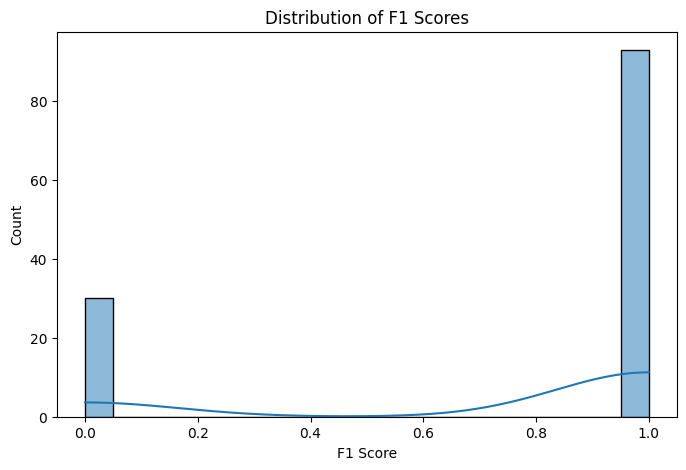

In [ ]:
# If you only have f1s list
plt.figure(figsize=(8,5))
sns.histplot(f1s, bins=20, kde=True)
plt.xlabel('F1 Score')
plt.title('Distribution of F1 Scores')
plt.show()

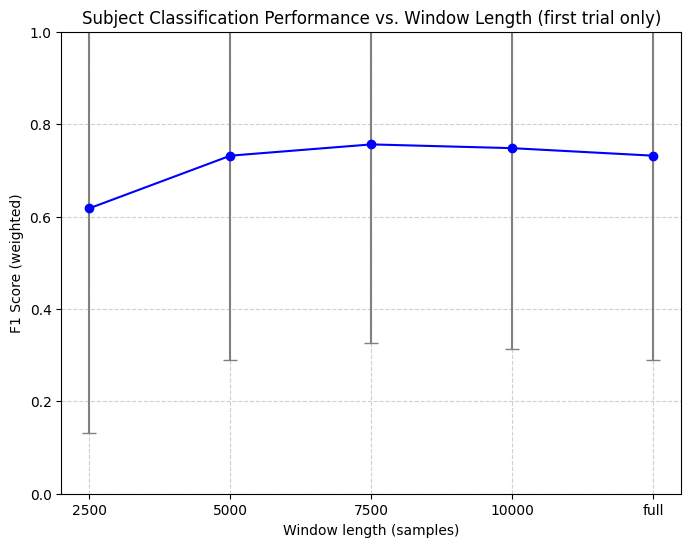

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Example data (replace with your actual results)
# results = [
#     {'window_samples': 2500, 'mean_f1': 0.635, 'std_f1': 0.481},
#     {'window_samples': 5000, 'mean_f1': 0.783, 'std_f1': 0.412},
#     {'window_samples': 7500, 'mean_f1': 0.730, 'std_f1': 0.444},
#     {'window_samples': 10000, 'mean_f1': 0.678, 'std_f1': 0.467},
#     {'window_samples': 'full', 'mean_f1': 0.678, 'std_f1': 0.467},
# ]

# Convert window samples to string for x-axis labels (to handle 'full')
x_labels = [str(r['window_samples']) for r in results]
mean_f1 = [r['mean_f1'] for r in results]
std_f1 = [r['std_f1'] for r in results]

plt.figure(figsize=(8, 6))
plt.errorbar(x_labels, mean_f1, yerr=std_f1, fmt='o-', capsize=5, color='blue', ecolor='gray')
plt.xlabel('Window length (samples)')
plt.ylabel('F1 Score (weighted)')
plt.title('Subject Classification Performance vs. Window Length (first trial only)')
plt.ylim(0, 1)
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

#Comparison between multiple and single window trial subject level classification of state

Method A: subjects with valid single window: 123
Method A (single window, first trial): mean F1 = 0.715 ± 0.451
Method B: subjects with valid windows: 123
Method B (multiple windows, all trials): mean F1 = 0.756 ± 0.429


/tmp/ipykernel_7828/664520272.py:172: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=data, x='Method', y='F1 Score', palette='Set2')


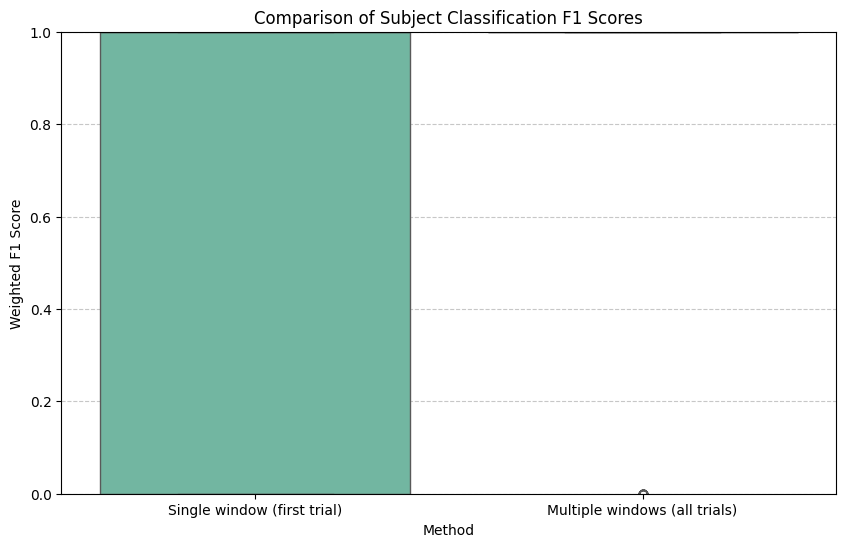

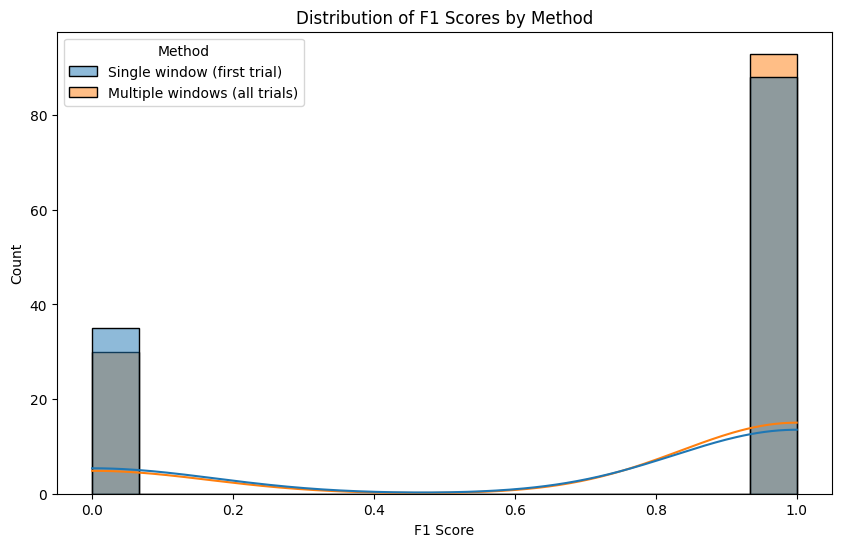


Summary statistics:
                               count      mean       std  min  25%  50%  75%  \
Method                                                                         
Multiple windows (all trials)  123.0  0.756098  0.431191  0.0  1.0  1.0  1.0   
Single window (first trial)    123.0  0.715447  0.453047  0.0  0.0  1.0  1.0   

                               max  
Method                              
Multiple windows (all trials)  1.0  
Single window (first trial)    1.0  


In [ ]:
import pandas as pd
import numpy as np
import pyarrow.parquet as pq
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import LeaveOneGroupOut
from sklearn.metrics import f1_score
import matplotlib.pyplot as plt
import seaborn as sns

# ============================================================
# 0. Load data and ensure segment-level 'state_final' exists
# ============================================================
signals = pq.read_table('signals_cleaned.parquet').to_pandas()
df = segment_data_advanced.copy()

if 'state_final' not in df.columns:
    old_features = ['cop_x_mean', 'cop_x_std', 'cop_x_range',
                    'cop_y_mean', 'cop_y_std', 'cop_y_range',
                    'sway_path', 'mean_velocity', 'sway_area']
    df_clean = df.dropna(subset=old_features).copy()
    scaler_seg = StandardScaler()
    X_seg = scaler_seg.fit_transform(df_clean[old_features])
    kmeans_seg = KMeans(n_clusters=2, random_state=42, n_init=10)
    df_clean['cluster_seg'] = kmeans_seg.fit_predict(X_seg)
    seg_means = df_clean.groupby('cluster_seg')['sway_area'].mean()
    unstable_cluster_seg = seg_means.idxmax()
    df_clean['state_final'] = df_clean['cluster_seg'].apply(lambda x: 'unstable' if x == unstable_cluster_seg else 'stable')
    df = df.merge(df_clean[['file_id', 'sample_start', 'sample_end', 'state_final']],
                  on=['file_id', 'sample_start', 'sample_end'], how='left')
    df = df.dropna(subset=['state_final'])

# ============================================================
# 1. Create subject-level ground truth clusters
# ============================================================
subject_agg = df.groupby('subject_id').agg(
    mean_sway_area=('sway_area', 'mean'),
    mean_velocity=('mean_velocity', 'mean'),
    mean_sampen_x=('sampen_x', 'mean'),
    prop_unstable=('state_final', lambda x: (x == 'unstable').mean())
).reset_index()

features_subj = ['mean_sway_area', 'mean_velocity', 'mean_sampen_x', 'prop_unstable']
scaler_subj = StandardScaler()
X_subj = scaler_subj.fit_transform(subject_agg[features_subj])
kmeans_subj = KMeans(n_clusters=2, random_state=42, n_init=10)
subject_agg['cluster'] = kmeans_subj.fit_predict(X_subj)
cluster_means = subject_agg.groupby('cluster')['prop_unstable'].mean()
unstable_cluster_subj = cluster_means.idxmax()
subject_clusters = subject_agg[['subject_id', 'cluster']].copy()

# ============================================================
# Helper: feature extraction from a window
# ============================================================
def extract_features(x, y):
    dx = np.diff(x)
    dy = np.diff(y)
    sway_path = np.sum(np.sqrt(dx**2 + dy**2))
    n = len(x)
    mean_velocity = sway_path / n if n > 1 else 0
    cop_x_range = np.max(x) - np.min(x)
    if n > 2:
        cov = np.cov(x, y)
        eigvals, _ = np.linalg.eigh(cov)
        sway_area = np.pi * np.sqrt(np.prod(eigvals)) * 5.991
    else:
        sway_area = np.nan
    try:
        from nolds import sampen
        sampen_x = sampen(x, emb_dim=2, tolerance=0.2)
    except:
        sampen_x = np.nan
    return np.array([sway_area, mean_velocity, cop_x_range, sampen_x])

# ============================================================
# 2. Method A: Single window from first trial (first 5000 samples)
# ============================================================
window_samples = 5000
subject_ids = subject_clusters['subject_id'].unique()
single_window_features = []
for subj in subject_ids:
    subj_files = df[df['subject_id'] == subj]['file_id'].unique()
    if len(subj_files) == 0:
        continue
    first_file = subj_files[0]
    trial_signal = signals[signals['file_id'] == first_file].sort_values('sample_num')
    if len(trial_signal) < window_samples:
        # Not enough samples, skip this subject
        continue
    x = trial_signal['cop_x'].values[:window_samples]
    y = trial_signal['cop_y'].values[:window_samples]
    feats = extract_features(x, y)
    if not np.isnan(feats).any():
        single_window_features.append([subj] + feats.tolist())
single_df = pd.DataFrame(single_window_features, columns=['subject_id', 'sway_area', 'mean_velocity', 'cop_x_range', 'sampen_x'])
single_df = single_df.merge(subject_clusters, on='subject_id')
print(f"Method A: subjects with valid single window: {len(single_df)}")

X_single = single_df[['sway_area', 'mean_velocity', 'cop_x_range', 'sampen_x']]
y_single = single_df['cluster']
groups_single = single_df['subject_id']

logo = LeaveOneGroupOut()
f1_single = []
for train_idx, test_idx in logo.split(X_single, y_single, groups=groups_single):
    X_train, X_test = X_single.iloc[train_idx], X_single.iloc[test_idx]
    y_train, y_test = y_single.iloc[train_idx], y_single.iloc[test_idx]
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    clf = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced')
    clf.fit(X_train_scaled, y_train)
    y_pred = clf.predict(X_test_scaled)
    f1_single.append(f1_score(y_test, y_pred, average='weighted'))

print(f"Method A (single window, first trial): mean F1 = {np.mean(f1_single):.3f} ± {np.std(f1_single):.3f}")

# ============================================================
# 3. Method B: Multiple windows from all trials (aggregated)
# ============================================================
step = 2500  # 50% overlap
multi_window_features = []
for subj in subject_ids:
    subj_files = df[df['subject_id'] == subj]['file_id'].unique()
    all_windows = []
    for file_id in subj_files:
        trial_signal = signals[signals['file_id'] == file_id].sort_values('sample_num')
        total_len = len(trial_signal)
        if total_len < window_samples:
            continue
        for start in range(0, total_len - window_samples + 1, step):
            x = trial_signal['cop_x'].values[start:start+window_samples]
            y = trial_signal['cop_y'].values[start:start+window_samples]
            feats = extract_features(x, y)
            if not np.isnan(feats).any():
                all_windows.append(feats)
    if len(all_windows) > 0:
        mean_feats = np.mean(all_windows, axis=0)
        multi_window_features.append([subj] + mean_feats.tolist())
multi_df = pd.DataFrame(multi_window_features, columns=['subject_id', 'sway_area', 'mean_velocity', 'cop_x_range', 'sampen_x'])
multi_df = multi_df.merge(subject_clusters, on='subject_id')
print(f"Method B: subjects with valid windows: {len(multi_df)}")

X_multi = multi_df[['sway_area', 'mean_velocity', 'cop_x_range', 'sampen_x']]
y_multi = multi_df['cluster']
groups_multi = multi_df['subject_id']

f1_multi = []
for train_idx, test_idx in logo.split(X_multi, y_multi, groups=groups_multi):
    X_train, X_test = X_multi.iloc[train_idx], X_multi.iloc[test_idx]
    y_train, y_test = y_multi.iloc[train_idx], y_multi.iloc[test_idx]
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    clf = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced')
    clf.fit(X_train_scaled, y_train)
    y_pred = clf.predict(X_test_scaled)
    f1_multi.append(f1_score(y_test, y_pred, average='weighted'))

print(f"Method B (multiple windows, all trials): mean F1 = {np.mean(f1_multi):.3f} ± {np.std(f1_multi):.3f}")

# ============================================================
# 4. Visualization: Compare distributions
# ============================================================
data = pd.DataFrame({
    'Method': ['Single window (first trial)'] * len(f1_single) + ['Multiple windows (all trials)'] * len(f1_multi),
    'F1 Score': f1_single + f1_multi
})

plt.figure(figsize=(10, 6))
sns.boxplot(data=data, x='Method', y='F1 Score', palette='Set2')
plt.title('Comparison of Subject Classification F1 Scores')
plt.ylabel('Weighted F1 Score')
plt.ylim(0, 1)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

plt.figure(figsize=(10, 6))
sns.histplot(data=data, x='F1 Score', hue='Method', bins=15, kde=True, alpha=0.5)
plt.title('Distribution of F1 Scores by Method')
plt.xlabel('F1 Score')
plt.show()

# Optionally, print summary statistics
print("\nSummary statistics:")
print(data.groupby('Method')['F1 Score'].describe())

=== Method A: Single window (first trial) ===


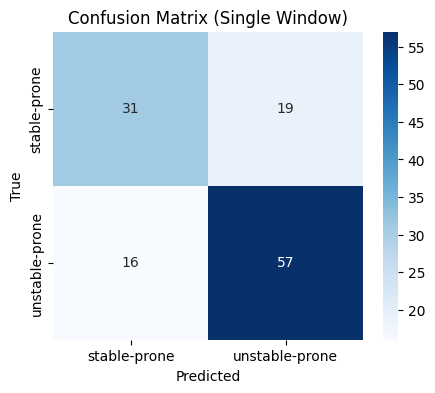

                precision    recall  f1-score   support

  stable-prone       0.66      0.62      0.64        50
unstable-prone       0.75      0.78      0.77        73

      accuracy                           0.72       123
     macro avg       0.70      0.70      0.70       123
  weighted avg       0.71      0.72      0.71       123


=== Method B: Multiple windows (all trials) ===


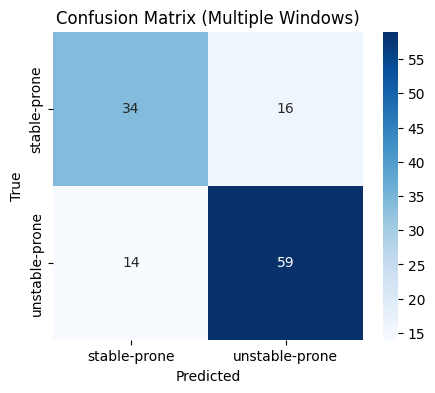

                precision    recall  f1-score   support

  stable-prone       0.71      0.68      0.69        50
unstable-prone       0.79      0.81      0.80        73

      accuracy                           0.76       123
     macro avg       0.75      0.74      0.75       123
  weighted avg       0.75      0.76      0.76       123


Misclassified subjects (Single window):
Subject 8: true=1 (unstable-prone) -> predicted=0 (stable-prone)
Subject 9: true=0 (stable-prone) -> predicted=1 (unstable-prone)
Subject 14: true=0 (stable-prone) -> predicted=1 (unstable-prone)
Subject 15: true=0 (stable-prone) -> predicted=1 (unstable-prone)
Subject 16: true=1 (unstable-prone) -> predicted=0 (stable-prone)
Subject 27: true=0 (stable-prone) -> predicted=1 (unstable-prone)
Subject 28: true=1 (unstable-prone) -> predicted=0 (stable-prone)
Subject 32: true=0 (stable-prone) -> predicted=1 (unstable-prone)
Subject 35: true=1 (unstable-prone) -> predicted=0 (stable-prone)
Subject 39: true=1 (unstable

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# ============================================================
# Re-run the subject classification loops, but now store true and predicted labels
# (Assuming you have already defined subject_clusters, X_single, y_single, groups_single, etc.)
# ============================================================

# ----- Method A: Single window (first trial) -----
true_labels_single = []
pred_labels_single = []
test_subjects_single = []

logo = LeaveOneGroupOut()
for train_idx, test_idx in logo.split(X_single, y_single, groups=groups_single):
    test_subj = groups_single.iloc[test_idx].iloc[0]
    X_train, X_test = X_single.iloc[train_idx], X_single.iloc[test_idx]
    y_train, y_test = y_single.iloc[train_idx], y_single.iloc[test_idx]
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    clf = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced')
    clf.fit(X_train_scaled, y_train)
    y_pred = clf.predict(X_test_scaled)
    true_labels_single.extend(y_test)
    pred_labels_single.extend(y_pred)
    test_subjects_single.append(test_subj)

# ----- Method B: Multiple windows (all trials) -----
true_labels_multi = []
pred_labels_multi = []
test_subjects_multi = []

logo = LeaveOneGroupOut()
for train_idx, test_idx in logo.split(X_multi, y_multi, groups=groups_multi):
    test_subj = groups_multi.iloc[test_idx].iloc[0]
    X_train, X_test = X_multi.iloc[train_idx], X_multi.iloc[test_idx]
    y_train, y_test = y_multi.iloc[train_idx], y_multi.iloc[test_idx]
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    clf = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced')
    clf.fit(X_train_scaled, y_train)
    y_pred = clf.predict(X_test_scaled)
    true_labels_multi.extend(y_test)
    pred_labels_multi.extend(y_pred)
    test_subjects_multi.append(test_subj)

# ============================================================
# Confusion Matrix and Classification Report
# ============================================================
def plot_confusion_matrix(y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(5,4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['stable-prone', 'unstable-prone'], yticklabels=['stable-prone', 'unstable-prone'])
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(title)
    plt.show()
    print(classification_report(y_true, y_pred, target_names=['stable-prone', 'unstable-prone']))
    return cm

print("=== Method A: Single window (first trial) ===")
cm_single = plot_confusion_matrix(true_labels_single, pred_labels_single, "Confusion Matrix (Single Window)")

print("\n=== Method B: Multiple windows (all trials) ===")
cm_multi = plot_confusion_matrix(true_labels_multi, pred_labels_multi, "Confusion Matrix (Multiple Windows)")

# ============================================================
# Identify misclassified subjects
# ============================================================
def misclassified_subjects(test_subjects, y_true, y_pred):
    mis = []
    for subj, true, pred in zip(test_subjects, y_true, y_pred):
        if true != pred:
            mis.append((subj, true, pred))
    return mis

mis_single = misclassified_subjects(test_subjects_single, true_labels_single, pred_labels_single)
mis_multi = misclassified_subjects(test_subjects_multi, true_labels_multi, pred_labels_multi)

print("\nMisclassified subjects (Single window):")
for subj, true, pred in mis_single:
    print(f"Subject {subj}: true={true} (stable-prone) -> predicted={pred} (unstable-prone)" if true==0 else f"Subject {subj}: true={true} (unstable-prone) -> predicted={pred} (stable-prone)")

print("\nMisclassified subjects (Multiple windows):")
for subj, true, pred in mis_multi:
    print(f"Subject {subj}: true={true} (stable-prone) -> predicted={pred} (unstable-prone)" if true==0 else f"Subject {subj}: true={true} (unstable-prone) -> predicted={pred} (stable-prone)")

# ============================================================
# Optional: Compare misclassifications between methods
# ============================================================
mis_single_set = set([subj for subj,_,_ in mis_single])
mis_multi_set = set([subj for subj,_,_ in mis_multi])
common = mis_single_set & mis_multi_set
only_single = mis_single_set - mis_multi_set
only_multi = mis_multi_set - mis_single_set

print(f"\nSubjects misclassified by both methods: {common}")
print(f"Subjects misclassified only by single window: {only_single}")
print(f"Subjects misclassified only by multiple windows: {only_multi}")

Misclassification categories:
category
Correct        72
Single only    21
Multi only     16
Both           14
Name: count, dtype: int64


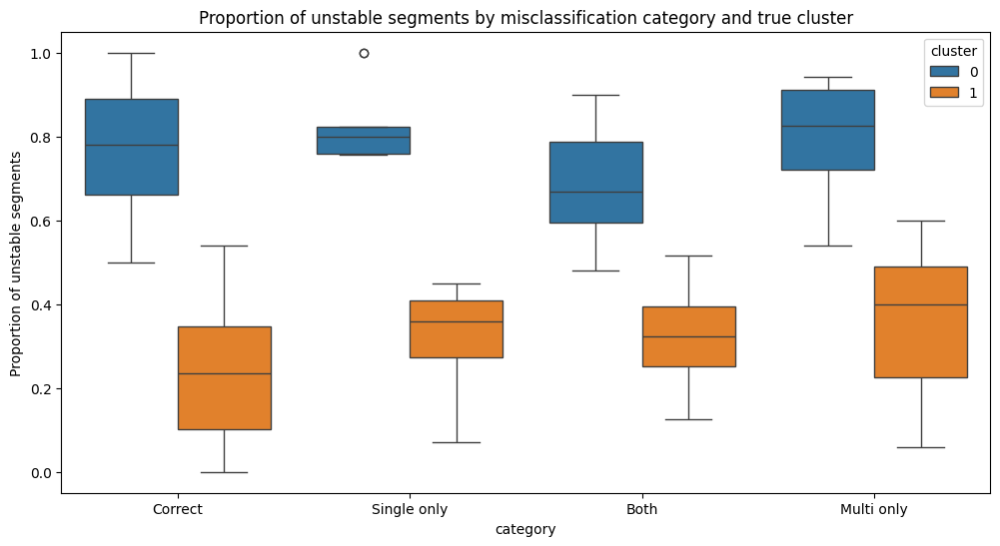

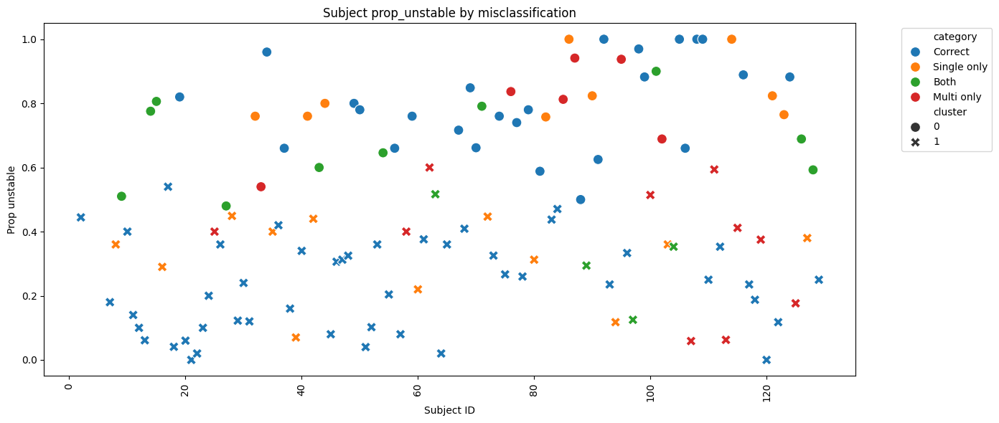


Misclassified subjects details:
 subject_id  cluster  prop_unstable    category
         27        0       0.480000        Both
          9        0       0.510204        Both
         33        0       0.540000  Multi only
        128        0       0.592593        Both
         43        0       0.600000        Both
         54        0       0.645833        Both
        102        0       0.688889  Multi only
        126        0       0.688889        Both
         82        0       0.757576 Single only
         32        0       0.760000 Single only
         41        0       0.760000 Single only
        123        0       0.764706 Single only
         14        0       0.775510        Both
         71        0       0.791045        Both
         44        0       0.800000 Single only
         15        0       0.806122        Both
         85        0       0.812500  Multi only
         90        0       0.823529 Single only
        121        0       0.823529 Single only
       

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming subject_agg is already defined (from earlier code)
# It has columns: subject_id, cluster (0 or 1), prop_unstable, etc.

# Create a DataFrame with misclassification flags
mis_df = subject_agg[['subject_id', 'cluster', 'prop_unstable']].copy()

# Define the sets
both = {128, 97, 101, 71, 104, 9, 43, 14, 15, 54, 89, 27, 126, 63}
only_single = {8, 16, 28, 32, 35, 39, 41, 42, 44, 60, 72, 80, 82, 86, 90, 94, 103, 114, 121, 123, 127}
only_multi = {33, 100, 102, 107, 76, 111, 113, 115, 119, 85, 87, 25, 58, 125, 62, 95}

mis_df['mis_single'] = mis_df['subject_id'].isin(only_single) | mis_df['subject_id'].isin(both)
mis_df['mis_multi'] = mis_df['subject_id'].isin(only_multi) | mis_df['subject_id'].isin(both)
mis_df['mis_both'] = mis_df['subject_id'].isin(both)

# Add a category
def mis_category(row):
    if row['mis_both']:
        return 'Both'
    elif row['mis_single'] and not row['mis_multi']:
        return 'Single only'
    elif row['mis_multi'] and not row['mis_single']:
        return 'Multi only'
    else:
        return 'Correct'
mis_df['category'] = mis_df.apply(mis_category, axis=1)

# Show counts
print("Misclassification categories:")
print(mis_df['category'].value_counts())

# Boxplot of prop_unstable by category and true cluster
plt.figure(figsize=(12,6))
sns.boxplot(data=mis_df, x='category', y='prop_unstable', hue='cluster')
plt.title('Proportion of unstable segments by misclassification category and true cluster')
plt.ylabel('Proportion of unstable segments')
plt.show()

# Also scatter plot of prop_unstable vs subject_id colored by category
plt.figure(figsize=(14,6))
sns.scatterplot(data=mis_df, x='subject_id', y='prop_unstable', hue='category', style='cluster', s=100)
plt.xticks(rotation=90)
plt.title('Subject prop_unstable by misclassification')
plt.xlabel('Subject ID')
plt.ylabel('Prop unstable')
plt.legend(bbox_to_anchor=(1.05, 1))
plt.tight_layout()
plt.show()

# Print a table of misclassified subjects with their prop_unstable and cluster
misclassified_subjects = mis_df[mis_df['category'] != 'Correct'].sort_values(['cluster', 'prop_unstable'])
print("\nMisclassified subjects details:")
print(misclassified_subjects[['subject_id', 'cluster', 'prop_unstable', 'category']].to_string(index=False))

#Validation of Experiments


In [ ]:
# ============================================================
# CELL 1: Setup
# ============================================================
!pip -q install numpy pandas scikit-learn xgboost seaborn matplotlib

import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd

from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.cluster import KMeans
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GroupKFold, LeaveOneGroupOut
from sklearn.metrics import (
    accuracy_score, f1_score, confusion_matrix, classification_report
)
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="whitegrid")

RANDOM_STATE = 42
FS = 250

In [ ]:
# ============================================================
# CELL 2: Load / Validate segment_data_advanced
# ============================================================
# If needed:
# segment_data_advanced = pd.read_parquet("/content/segment_data_advanced.parquet")
# or pd.read_csv(...)

assert "segment_data_advanced" in globals(), "Please load segment_data_advanced first."

df0 = segment_data_advanced.copy()
print("Shape:", df0.shape)
print("Subjects:", df0["subject_id"].nunique())
print("Trials(file_id):", df0["file_id"].nunique())
print("Conditions:\n", df0["condition"].value_counts(dropna=False))

required_cols = [
    'file_id','sample_start','sample_end','subject_id','condition','trial',
    'duration_samples','age','height','mass',
    'cop_x_mean','cop_x_std','cop_x_range',
    'cop_y_mean','cop_y_std','cop_y_range',
    'sway_path','mean_velocity','sway_area',
    'sampen_x','sampen_y','Ds','Hs','Dl','Hl'
]
missing = [c for c in required_cols if c not in df0.columns]
print("Missing required columns:", missing)

Shape: (5570, 27)
Subjects: 123
Trials(file_id): 997
Conditions:
 condition
free      4640
stress     880
euro        50
Name: count, dtype: int64
Missing required columns: []


In [ ]:
# ============================================================
# CELL 3: Clean data (fast path)
# ============================================================
use_cols = required_cols.copy()
df = df0[use_cols].dropna().copy()

# ensure correct dtypes
for c in ["sample_start","sample_end","duration_samples"]:
    df[c] = df[c].astype(int)

print("Clean shape:", df.shape)
print("Subjects after clean:", df["subject_id"].nunique())

Clean shape: (5570, 25)
Subjects after clean: 123


In [ ]:
# ============================================================
# CELL 4: Unsupervised stable/unstable labels (ignore hardcoded labels)
# ============================================================
# Use your "old features" for k-means as in original study.
kmeans_features = [
    'cop_x_mean','cop_x_std','cop_x_range',
    'cop_y_mean','cop_y_std','cop_y_range',
    'sway_path','mean_velocity','sway_area'
]

km_df = df.dropna(subset=kmeans_features).copy()

scaler_km = StandardScaler()
X_km = scaler_km.fit_transform(km_df[kmeans_features].values)

kmeans = KMeans(n_clusters=2, random_state=RANDOM_STATE, n_init=20)
km_df["cluster"] = kmeans.fit_predict(X_km)

# unstable cluster = higher sway_area cluster
cluster_area = km_df.groupby("cluster")["sway_area"].mean()
unstable_cluster = cluster_area.idxmax()

km_df["is_unstable"] = (km_df["cluster"] == unstable_cluster).astype(int)

print("Cluster counts (is_unstable):")
print(km_df["is_unstable"].value_counts())
print("\nMean sway_area by cluster:")
print(cluster_area)

Cluster counts (is_unstable):
is_unstable
0    3013
1    2557
Name: count, dtype: int64

Mean sway_area by cluster:
cluster
0    18.078969
1    17.346955
Name: sway_area, dtype: float64


In [ ]:
# ============================================================
# CELL 5: Experiment 1 - Segment-level unstable detection
# ============================================================
# Validation by file_id group to avoid within-trial leakage.

clf_features = ['sway_area', 'mean_velocity', 'cop_x_range', 'sway_path']

exp1 = km_df.dropna(subset=clf_features + ["is_unstable","file_id"]).copy()

X = exp1[clf_features].values
y = exp1["is_unstable"].values
groups = exp1["file_id"].values

gkf = GroupKFold(n_splits=5)

all_true, all_pred = [], []
fold_rows = []

for fold, (tr, te) in enumerate(gkf.split(X, y, groups), 1):
    Xtr, Xte = X[tr], X[te]
    ytr, yte = y[tr], y[te]

    model = Pipeline([
        ("scaler", StandardScaler()),  # fit on train only
        ("rf", RandomForestClassifier(
            n_estimators=100,
            random_state=RANDOM_STATE,
            class_weight="balanced",
            n_jobs=-1
        ))
    ])
    model.fit(Xtr, ytr)
    pred = model.predict(Xte)

    all_true.extend(yte.tolist())
    all_pred.extend(pred.tolist())

    fold_rows.append({
        "fold": fold,
        "accuracy": accuracy_score(yte, pred),
        "f1_unstable": f1_score(yte, pred, pos_label=1, zero_division=0)
    })

fold_df = pd.DataFrame(fold_rows)
print(fold_df)

print("\nExperiment 1 (aggregated):")
print("Accuracy:", accuracy_score(all_true, all_pred))
print("F1 unstable:", f1_score(all_true, all_pred, pos_label=1))
print("Confusion matrix:\n", confusion_matrix(all_true, all_pred))

   fold  accuracy  f1_unstable
0     1  0.920251     0.914505
1     2  0.925360     0.919339
2     3  0.926259     0.913319
3     4  0.921973     0.919370
4     5  0.939013     0.929897

Experiment 1 (aggregated):
Accuracy: 0.9265709156193895
F1 unstable: 0.9192497532082922
Confusion matrix:
 [[2833  180]
 [ 229 2328]]


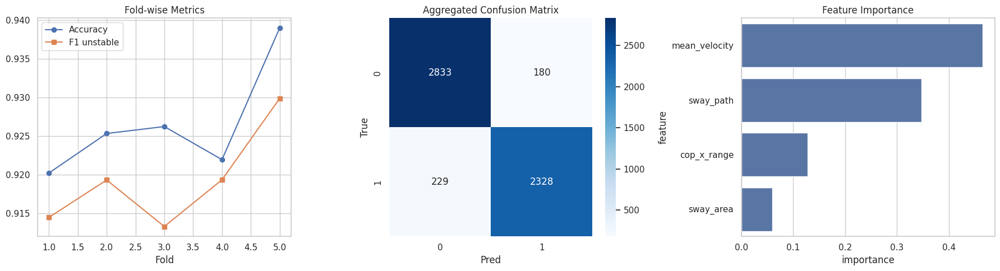

In [ ]:
# ============================================================
# CELL 6: Experiment 1 Visualizations
# ============================================================
fig, ax = plt.subplots(1, 3, figsize=(18,5))

# Fold lines
ax[0].plot(fold_df["fold"], fold_df["accuracy"], marker='o', label='Accuracy')
ax[0].plot(fold_df["fold"], fold_df["f1_unstable"], marker='s', label='F1 unstable')
ax[0].set_title("Fold-wise Metrics")
ax[0].set_xlabel("Fold")
ax[0].legend()

# CM
cm = confusion_matrix(all_true, all_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax[1])
ax[1].set_title("Aggregated Confusion Matrix")
ax[1].set_xlabel("Pred")
ax[1].set_ylabel("True")

# Feature importance (fit full set once)
final_model = Pipeline([
    ("scaler", StandardScaler()),
    ("rf", RandomForestClassifier(
        n_estimators=100,
        random_state=RANDOM_STATE,
        class_weight="balanced",
        n_jobs=-1
    ))
])
final_model.fit(X, y)
imp = final_model.named_steps["rf"].feature_importances_
imp_df = pd.DataFrame({"feature": clf_features, "importance": imp}).sort_values("importance", ascending=False)
sns.barplot(data=imp_df, x="importance", y="feature", ax=ax[2])
ax[2].set_title("Feature Importance")

plt.tight_layout()
plt.show()

In [ ]:
# ============================================================
# CELL 7: Experiment 2 - Cross-subject unstable detection (LOSO)
# ============================================================
exp2 = km_df.dropna(subset=clf_features + ["is_unstable","subject_id"]).copy()

X2 = exp2[clf_features].values
y2 = exp2["is_unstable"].values
g2 = exp2["subject_id"].values

logo = LeaveOneGroupOut()

all_true2, all_pred2 = [], []
subject_rows = []

for tr, te in logo.split(X2, y2, g2):
    Xtr, Xte = X2[tr], X2[te]
    ytr, yte = y2[tr], y2[te]
    sid = g2[te][0]

    model = Pipeline([
        ("scaler", StandardScaler()),
        ("rf", RandomForestClassifier(
            n_estimators=100,
            random_state=RANDOM_STATE,
            class_weight="balanced",
            n_jobs=-1
        ))
    ])
    model.fit(Xtr, ytr)
    pred = model.predict(Xte)

    all_true2.extend(yte.tolist())
    all_pred2.extend(pred.tolist())

    subject_rows.append({
        "subject_id": sid,
        "n_segments": len(yte),
        "subject_accuracy": accuracy_score(yte, pred),
        "subject_f1_unstable": f1_score(yte, pred, pos_label=1, zero_division=0),
        "prop_unstable_true": np.mean(yte)
    })

subj_eval = pd.DataFrame(subject_rows)

print("Experiment 2 (aggregated across LOSO folds):")
print("Accuracy:", accuracy_score(all_true2, all_pred2))
print("F1 unstable:", f1_score(all_true2, all_pred2, pos_label=1))
print("Macro F1:", f1_score(all_true2, all_pred2, average="macro"))
print("Micro F1:", f1_score(all_true2, all_pred2, average="micro"))

Experiment 2 (aggregated across LOSO folds):
Accuracy: 0.9281867145421903
F1 unstable: 0.9210110584518167
Macro F1: 0.9275891368625113
Micro F1: 0.9281867145421903


In [ ]:
# ============================================================
# CELL 8: Subject-level classification (stable-prone vs unstable-prone)
# ============================================================
# Build subject aggregated table from segment-level features
subj_agg = (km_df.groupby("subject_id")
            .agg(
                mean_sway_area=("sway_area","mean"),
                mean_velocity=("mean_velocity","mean"),
                mean_sampen_x=("sampen_x","mean"),
                mean_sampen_y=("sampen_y","mean"),
                prop_unstable=("is_unstable","mean"),
                age=("age","first"),
                height=("height","first"),
                mass=("mass","first")
            ).reset_index())

# derive subject labels by clustering aggregated features
subj_cluster_feats = ["mean_sway_area","mean_velocity","mean_sampen_x","mean_sampen_y","prop_unstable"]
Xs = subj_agg[subj_cluster_feats].values
Xs_sc = StandardScaler().fit_transform(Xs)

sub_km = KMeans(n_clusters=2, random_state=RANDOM_STATE, n_init=20)
subj_agg["sub_cluster"] = sub_km.fit_predict(Xs_sc)

cluster_prop = subj_agg.groupby("sub_cluster")["prop_unstable"].mean()
unstable_prone_cluster = cluster_prop.idxmax()
subj_agg["is_unstable_prone"] = (subj_agg["sub_cluster"] == unstable_prone_cluster).astype(int)

# LOSO subject-level (one subject test each fold) -> aggregated metrics
X3 = subj_agg[subj_cluster_feats].values
y3 = subj_agg["is_unstable_prone"].values
g3 = subj_agg["subject_id"].values

logo = LeaveOneGroupOut()
yt3, yp3 = [], []

for tr, te in logo.split(X3, y3, g3):
    Xtr, Xte = X3[tr], X3[te]
    ytr, yte = y3[tr], y3[te]

    model = Pipeline([
        ("scaler", StandardScaler()),
        ("rf", RandomForestClassifier(
            n_estimators=100,
            random_state=RANDOM_STATE,
            class_weight="balanced",
            n_jobs=-1
        ))
    ])
    model.fit(Xtr, ytr)
    pred = model.predict(Xte)

    yt3.extend(yte.tolist())
    yp3.extend(pred.tolist())

print("Subject-level LOSO (aggregated):")
print("Accuracy:", accuracy_score(yt3, yp3))
print("F1 unstable-prone:", f1_score(yt3, yp3, pos_label=1))
print("Confusion matrix:\n", confusion_matrix(yt3, yp3))

Subject-level LOSO (aggregated):
Accuracy: 0.967479674796748
F1 unstable-prone: 0.9615384615384616
Confusion matrix:
 [[69  2]
 [ 2 50]]


  len_bin     n  accuracy  f1_unstable
0   5-10s  5570  0.926571      0.91925


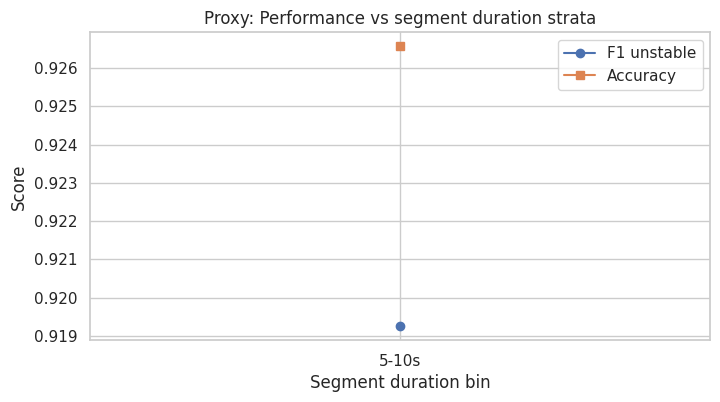

In [ ]:
# ============================================================
# CELL 9: Experiment 3 substitute (FAST) - Duration strata proxy
# ============================================================
# Since no raw prefixes, this is a proxy analysis:
# How performance varies by segment duration strata.
# (Not a replacement for true prefix-window experiment.)

proxy = km_df.copy()
proxy["segment_len_sec"] = (proxy["sample_end"] - proxy["sample_start"]) / FS

bins = [0, 1, 2, 5, 10, 20, np.inf]
labels = ["<=1s","1-2s","2-5s","5-10s","10-20s",">20s"]
proxy["len_bin"] = pd.cut(proxy["segment_len_sec"], bins=bins, labels=labels, include_lowest=True)

proxy_results = []
for lb in labels:
    d = proxy[proxy["len_bin"] == lb].dropna(subset=clf_features + ["is_unstable","file_id"])
    if len(d) < 100:
        continue
    Xp = d[clf_features].values
    yp = d["is_unstable"].values
    gp = d["file_id"].values

    gkf = GroupKFold(n_splits=5)
    yta, ypa = [], []
    for tr, te in gkf.split(Xp, yp, gp):
        model = Pipeline([
            ("scaler", StandardScaler()),
            ("rf", RandomForestClassifier(
                n_estimators=100, random_state=RANDOM_STATE, class_weight="balanced", n_jobs=-1
            ))
        ])
        model.fit(Xp[tr], yp[tr])
        pred = model.predict(Xp[te])
        yta.extend(yp[te].tolist())
        ypa.extend(pred.tolist())

    proxy_results.append({
        "len_bin": lb,
        "n": len(d),
        "accuracy": accuracy_score(yta, ypa),
        "f1_unstable": f1_score(yta, ypa, pos_label=1)
    })

proxy_df = pd.DataFrame(proxy_results)
print(proxy_df)

if len(proxy_df) > 0:
    plt.figure(figsize=(8,4))
    plt.plot(proxy_df["len_bin"], proxy_df["f1_unstable"], marker="o", label="F1 unstable")
    plt.plot(proxy_df["len_bin"], proxy_df["accuracy"], marker="s", label="Accuracy")
    plt.title("Proxy: Performance vs segment duration strata")
    plt.xlabel("Segment duration bin")
    plt.ylabel("Score")
    plt.legend()
    plt.show()

In [ ]:
# ============================================================
# CELL 10 (REPLACEMENT): Condition prediction (Binary + 3-class)
# Robust grouped-CV implementation with XGB + RF fallback
# ============================================================

from sklearn.model_selection import GroupKFold
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, classification_report
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
import numpy as np
import pandas as pd

# ----------------------------
# Config
# ----------------------------
RANDOM_STATE = 42
N_SPLITS = 5

cond_features = [
    "mean_velocity","sway_area","sampen_x","sampen_y",
    "cop_x_std","cop_y_std","cop_x_range","cop_y_range","Ds","Hs","Dl","Hl"
]

# ----------------------------
# Prepare condition dataset
# ----------------------------
cond_df = km_df.dropna(subset=cond_features + ["condition", "subject_id"]).copy()
Xc = cond_df[cond_features].values
groups = cond_df["subject_id"].values

print("Condition dataset:", cond_df.shape)
print("Unique subjects:", cond_df["subject_id"].nunique())
print("Condition counts:\n", cond_df["condition"].value_counts())

gkf = GroupKFold(n_splits=N_SPLITS)

# ============================================================
# A) Binary task: free vs non-free
# ============================================================
print("\n" + "="*70)
print("BINARY TASK: free vs non-free")
print("="*70)

y_bin = (cond_df["condition"] != "free").astype(int).values  # strictly 0/1

yb_true, yb_pred = [], []
bin_fold_rows = []

for fold, (tr, te) in enumerate(gkf.split(Xc, y_bin, groups), 1):
    Xtr, Xte = Xc[tr], Xc[te]
    ytr, yte = y_bin[tr], y_bin[te]

    # If only one class in training fold, skip
    if len(np.unique(ytr)) < 2:
        print(f"[Binary][Fold {fold}] skipped (single class in train).")
        continue

    # Primary model: XGB
    model_xgb = Pipeline([
        ("scaler", StandardScaler()),
        ("xgb", XGBClassifier(
            n_estimators=200,
            max_depth=4,
            learning_rate=0.05,
            subsample=0.9,
            colsample_bytree=0.9,
            random_state=RANDOM_STATE,
            objective="binary:logistic",
            eval_metric="logloss"
        ))
    ])

    try:
        model_xgb.fit(Xtr, ytr)
        pred = model_xgb.predict(Xte)
        used_model = "XGB"
    except Exception as e:
        # Fallback model: RF
        model_rf = Pipeline([
            ("scaler", StandardScaler()),
            ("rf", RandomForestClassifier(
                n_estimators=300,
                random_state=RANDOM_STATE,
                class_weight="balanced",
                n_jobs=-1
            ))
        ])
        model_rf.fit(Xtr, ytr)
        pred = model_rf.predict(Xte)
        used_model = "RF_fallback"
        print(f"[Binary][Fold {fold}] XGB failed -> RF fallback. Reason: {str(e)[:120]}")

    yb_true.extend(yte.tolist())
    yb_pred.extend(pred.tolist())

    bin_fold_rows.append({
        "fold": fold,
        "model_used": used_model,
        "accuracy": accuracy_score(yte, pred),
        "f1_nonfree": f1_score(yte, pred, pos_label=1, zero_division=0),
        "train_classes": str(np.unique(ytr)),
        "test_classes": str(np.unique(yte))
    })

bin_fold_df = pd.DataFrame(bin_fold_rows)
print("\nBinary fold metrics:")
display(bin_fold_df)

print("\nBinary aggregated:")
print("Accuracy:", accuracy_score(yb_true, yb_pred))
print("F1 non-free:", f1_score(yb_true, yb_pred, pos_label=1))
print("Confusion matrix:\n", confusion_matrix(yb_true, yb_pred))

# ============================================================
# B) 3-class task: free / stress / euro
# ============================================================
print("\n" + "="*70)
print("3-CLASS TASK: free vs stress vs euro")
print("="*70)

le = LabelEncoder()
y3_global = le.fit_transform(cond_df["condition"].values)  # global mapping
class_names = list(le.classes_)
print("Global class mapping:", {c: i for i, c in enumerate(class_names)})

ym_true, ym_pred = [], []
multi_fold_rows = []

for fold, (tr, te) in enumerate(gkf.split(Xc, y3_global, groups), 1):
    Xtr, Xte = Xc[tr], Xc[te]
    ytr_raw, yte_raw = y3_global[tr], y3_global[te]

    train_classes = np.unique(ytr_raw)
    test_classes = np.unique(yte_raw)

    # Need at least 2 classes to train
    if len(train_classes) < 2:
        print(f"[3-class][Fold {fold}] skipped (single class in train).")
        continue

    # Remap train labels -> contiguous local labels [0..k-1]
    class_to_local = {c: i for i, c in enumerate(train_classes)}
    local_to_class = {i: c for c, i in class_to_local.items()}

    ytr_local = np.array([class_to_local[c] for c in ytr_raw])

    # Filter test samples to classes seen in train
    seen_mask = np.isin(yte_raw, train_classes)
    if seen_mask.sum() == 0:
        print(f"[3-class][Fold {fold}] skipped (no seen classes in test).")
        continue

    Xte_seen = Xte[seen_mask]
    yte_seen_raw = yte_raw[seen_mask]
    yte_local = np.array([class_to_local[c] for c in yte_seen_raw])

    n_cls = len(train_classes)
    objective = "multi:softmax" if n_cls > 2 else "binary:logistic"
    eval_metric = "mlogloss" if n_cls > 2 else "logloss"

    # Primary model: XGB
    xgb_kwargs = dict(
        n_estimators=200,
        max_depth=4,
        learning_rate=0.05,
        subsample=0.9,
        colsample_bytree=0.9,
        random_state=RANDOM_STATE,
        objective=objective,
        eval_metric=eval_metric
    )
    if n_cls > 2:
        xgb_kwargs["num_class"] = n_cls

    model_xgb = Pipeline([
        ("scaler", StandardScaler()),
        ("xgb", XGBClassifier(**xgb_kwargs))
    ])

    try:
        model_xgb.fit(Xtr, ytr_local)
        pred_local = model_xgb.predict(Xte_seen)
        used_model = "XGB"
    except Exception as e:
        # RF fallback in local label space
        model_rf = Pipeline([
            ("scaler", StandardScaler()),
            ("rf", RandomForestClassifier(
                n_estimators=300,
                random_state=RANDOM_STATE,
                class_weight="balanced",
                n_jobs=-1
            ))
        ])
        model_rf.fit(Xtr, ytr_local)
        pred_local = model_rf.predict(Xte_seen)
        used_model = "RF_fallback"
        print(f"[3-class][Fold {fold}] XGB failed -> RF fallback. Reason: {str(e)[:120]}")

    # Map local preds back to global labels
    pred_global = np.array([local_to_class[p] for p in pred_local])

    ym_true.extend(yte_seen_raw.tolist())
    ym_pred.extend(pred_global.tolist())

    multi_fold_rows.append({
        "fold": fold,
        "model_used": used_model,
        "n_train_classes": n_cls,
        "train_classes_global": str(train_classes),
        "test_classes_global": str(test_classes),
        "n_test_seen": int(len(yte_seen_raw)),
        "accuracy": accuracy_score(yte_seen_raw, pred_global),
        "f1_macro": f1_score(yte_seen_raw, pred_global, average="macro", zero_division=0),
        "f1_weighted": f1_score(yte_seen_raw, pred_global, average="weighted", zero_division=0)
    })

multi_fold_df = pd.DataFrame(multi_fold_rows)
print("\n3-class fold metrics:")
display(multi_fold_df)

print("\n3-class aggregated:")
print("Accuracy:", accuracy_score(ym_true, ym_pred))
print("F1 macro:", f1_score(ym_true, ym_pred, average="macro"))
print("F1 weighted:", f1_score(ym_true, ym_pred, average="weighted"))

# Confusion matrix with global class order
cm3 = confusion_matrix(ym_true, ym_pred, labels=np.arange(len(class_names)))
print("\nConfusion matrix (global labels):")
print(cm3)
print("\nClassification report:")
print(classification_report(ym_true, ym_pred, labels=np.arange(len(class_names)), target_names=class_names, zero_division=0))

Condition dataset: (5570, 27)
Unique subjects: 123
Condition counts:
 condition
free      4640
stress     880
euro        50
Name: count, dtype: int64

BINARY TASK: free vs non-free

Binary fold metrics:


,fold,model_used,accuracy,f1_nonfree,train_classes,test_classes
0,1,XGB,0.874107,0.586510,[0 1],[0 1]
1,2,XGB,0.851653,0.450331,[0 1],[0 1]
2,3,XGB,0.888788,0.497959,[0 1],[0 1]
3,4,XGB,0.875226,0.510638,[0 1],[0 1]
4,5,XGB,0.884718,0.550523,[0 1],[0 1]



Binary aggregated:
Accuracy: 0.8748653500897666
F1 non-free: 0.5216197666437886
Confusion matrix:
 [[4493  147]
 [ 550  380]]

3-CLASS TASK: free vs stress vs euro
Global class mapping: {'euro': 0, 'free': 1, 'stress': 2}

3-class fold metrics:


,fold,model_used,n_train_classes,train_classes_global,test_classes_global,n_test_seen,accuracy,f1_macro,f1_weighted
0,1,XGB,3,[0 1 2],[1 2],1120,0.874107,0.754950,0.860223
1,2,XGB,2,[1 2],[0 1 2],1069,0.889616,0.732750,0.873528
2,3,XGB,3,[0 1 2],[1 2],1106,0.891501,0.721609,0.874197
3,4,XGB,3,[0 1 2],[1 2],1106,0.881555,0.728003,0.871023
4,5,XGB,3,[0 1 2],[1 2],1119,0.882038,0.738533,0.874421



3-class aggregated:
Accuracy: 0.883695652173913
F1 macro: 0.7367723625836217
F1 weighted: 0.8707276411625489

Confusion matrix (global labels):
[[   0    0    0]
 [   0 4501  139]
 [   0  503  377]]

Classification report:
              precision    recall  f1-score   support

        euro       0.00      0.00      0.00         0
        free       0.90      0.97      0.93      4640
      stress       0.73      0.43      0.54       880

    accuracy                           0.88      5520
   macro avg       0.54      0.47      0.49      5520
weighted avg       0.87      0.88      0.87      5520



In [ ]:
# ============================================================
# CELL 11: Summary table
# ============================================================
summary = []

summary.append({
    "experiment": "Exp1 Segment unstable (GroupKFold file_id)",
    "accuracy": accuracy_score(all_true, all_pred),
    "f1_main": f1_score(all_true, all_pred, pos_label=1),
    "f1_type": "unstable"
})
summary.append({
    "experiment": "Exp2 Cross-subject unstable (LOSO)",
    "accuracy": accuracy_score(all_true2, all_pred2),
    "f1_main": f1_score(all_true2, all_pred2, pos_label=1),
    "f1_type": "unstable"
})
summary.append({
    "experiment": "Subject-level prone class (LOSO)",
    "accuracy": accuracy_score(yt3, yp3),
    "f1_main": f1_score(yt3, yp3, pos_label=1),
    "f1_type": "unstable-prone"
})
summary.append({
    "experiment": "Condition binary (free vs non-free)",
    "accuracy": accuracy_score(ytb, ypb),
    "f1_main": f1_score(ytb, ypb, pos_label=1),
    "f1_type": "non-free"
})
summary.append({
    "experiment": "Condition 3-class",
    "accuracy": accuracy_score(ytm, ypm),
    "f1_main": f1_score(ytm, ypm, average="macro"),
    "f1_type": "macro"
})

summary_df = pd.DataFrame(summary)
summary_df

,experiment,accuracy,f1_main,f1_type
0,Exp1 Segment unstable (GroupKFold file_id),0.926571,0.919250,unstable
1,Exp2 Cross-subject unstable (LOSO),0.928187,0.921011,unstable
2,Subject-level prone class (LOSO),0.967480,0.961538,unstable-prone
3,Condition binary (free vs non-free),0.874865,0.521620,non-free
4,Condition 3-class,0.874107,0.754950,macro


Window 0.2s:   0%|          | 0/5570 [00:00<?, ?it/s]

Window 0.5s:   0%|          | 0/5570 [00:00<?, ?it/s]

Window 1s:   0%|          | 0/5570 [00:00<?, ?it/s]

Window 2s:   0%|          | 0/5570 [00:00<?, ?it/s]

Window 5s:   0%|          | 0/5570 [00:00<?, ?it/s]

Window 10s:   0%|          | 0/5570 [00:00<?, ?it/s]

,window_sec,n_segments,accuracy,f1_unstable
0,0.2,5570,0.568043,0.501037
1,0.5,5570,0.583124,0.515240
2,1.0,5570,0.602334,0.551347
3,2.0,5570,0.671275,0.628826
4,5.0,5570,0.768043,0.742937
5,10.0,5570,0.778097,0.746929


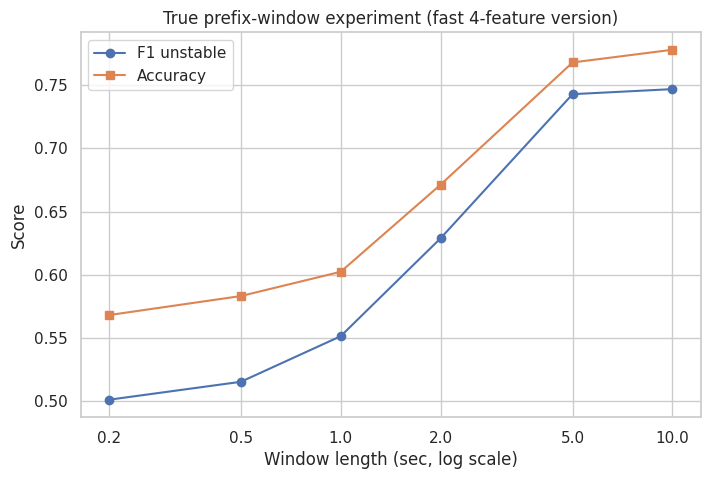

In [ ]:
# ============================================================
# WINDOW EXPERIMENT (TRUE PREFIX) - FAST VERSION
# Uses:
#   - segment boundaries from segment_data_advanced/km_df
#   - raw time series from signals_cleaned.parquet
# Computes only 4 fast features per window.
# ============================================================

import numpy as np
import pandas as pd
from tqdm.auto import tqdm
from sklearn.model_selection import GroupKFold
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, f1_score

FS = 250
RANDOM_STATE = 42

# ---- load signals if not already loaded ----
# signals = pd.read_parquet("/content/signals_cleaned.parquet")

# ---- source segments with labels from your kmeans result ----
# expected columns in km_df: file_id, sample_start, sample_end, is_unstable
win_src = km_df[["file_id","sample_start","sample_end","is_unstable"]].dropna().copy()
win_src["sample_start"] = win_src["sample_start"].astype(int)
win_src["sample_end"]   = win_src["sample_end"].astype(int)

# Group signals by file_id for fast slicing
sig_map = {}
for fid, g in signals.groupby("file_id"):
    g2 = g.sort_values("sample_num")
    sig_map[fid] = (g2["cop_x"].values, g2["cop_y"].values)

def fast_features(cop_x, cop_y, fs=250):
    # 4 features only
    dx = np.diff(cop_x)
    dy = np.diff(cop_y)
    step = np.sqrt(dx**2 + dy**2)
    sway_path = step.sum()
    dur = len(cop_x) / fs
    mean_velocity = sway_path / dur if dur > 0 else 0.0
    cop_x_range = np.ptp(cop_x)
    # simple area proxy close to your existing sway_area concept
    sway_area = np.pi * np.std(cop_x) * np.std(cop_y)
    return {
        "sway_area": sway_area,
        "mean_velocity": mean_velocity,
        "cop_x_range": cop_x_range,
        "sway_path": sway_path
    }

window_seconds = [0.2, 0.5, 1, 2, 5, 10]
window_samples = [int(w*FS) for w in window_seconds]

all_results = []

for wsec, wn in zip(window_seconds, window_samples):
    rows = []

    for _, r in tqdm(win_src.iterrows(), total=len(win_src), desc=f"Window {wsec}s", leave=False):
        fid = r["file_id"]
        if fid not in sig_map:
            continue

        x, y = sig_map[fid]
        s0, s1 = int(r["sample_start"]), int(r["sample_end"])
        s0 = max(0, s0)
        s1 = min(len(x), s1)
        seg_len = s1 - s0
        if seg_len <= 1:
            continue

        n = min(wn, seg_len)  # prefix window
        if n < 5:
            continue

        xw = x[s0:s0+n]
        yw = y[s0:s0+n]

        f = fast_features(xw, yw, fs=FS)
        rows.append({
            "file_id": fid,
            "is_unstable": int(r["is_unstable"]),
            "window_sec": wsec,
            **f
        })

    wdf = pd.DataFrame(rows)
    if len(wdf) == 0:
        continue

    X = wdf[["sway_area","mean_velocity","cop_x_range","sway_path"]].values
    y = wdf["is_unstable"].values
    g = wdf["file_id"].values

    gkf = GroupKFold(n_splits=5)
    yt_all, yp_all = [], []

    for tr, te in gkf.split(X, y, g):
        Xtr, Xte = X[tr], X[te]
        ytr, yte = y[tr], y[te]

        model = Pipeline([
            ("scaler", StandardScaler()),
            ("rf", RandomForestClassifier(
                n_estimators=100,
                class_weight="balanced",
                random_state=RANDOM_STATE,
                n_jobs=-1
            ))
        ])
        model.fit(Xtr, ytr)
        yp = model.predict(Xte)

        yt_all.extend(yte.tolist())
        yp_all.extend(yp.tolist())

    all_results.append({
        "window_sec": wsec,
        "n_segments": len(wdf),
        "accuracy": accuracy_score(yt_all, yp_all),
        "f1_unstable": f1_score(yt_all, yp_all, pos_label=1)
    })

win_df = pd.DataFrame(all_results).sort_values("window_sec")
display(win_df)

# plot
import matplotlib.pyplot as plt
plt.figure(figsize=(8,5))
plt.plot(win_df["window_sec"], win_df["f1_unstable"], marker="o", label="F1 unstable")
plt.plot(win_df["window_sec"], win_df["accuracy"], marker="s", label="Accuracy")
plt.xscale("log")
plt.xticks(win_df["window_sec"], win_df["window_sec"])
plt.xlabel("Window length (sec, log scale)")
plt.ylabel("Score")
plt.title("True prefix-window experiment (fast 4-feature version)")
plt.legend()
plt.show()

In [ ]:
# ============================================================
# CELL 12: Save outputs
# ============================================================
import os
os.makedirs("/content/results_fast", exist_ok=True)

km_df.to_parquet("/content/results_fast/labeled_segments.parquet", index=False)
subj_agg.to_csv("/content/results_fast/subject_agg.csv", index=False)
summary_df.to_csv("/content/results_fast/summary.csv", index=False)

if "proxy_df" in globals():
    proxy_df.to_csv("/content/results_fast/window_proxy_duration_bins.csv", index=False)

print("Saved to /content/results_fast")

Saved to /content/results_fast


In [ ]:
# Assume you have cond_df, cond_features, groups, and CV setup
from sklearn.metrics import precision_recall_curve, average_precision_score, brier_score_loss
import numpy as np
import pandas as pd
from sklearn.model_selection import GroupKFold
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from xgboost import XGBClassifier
from sklearn.metrics import f1_score, accuracy_score, confusion_matrix

Xc = cond_df[cond_features].values
y_bin = (cond_df["condition"] != "free").astype(int).values
g = cond_df["subject_id"].values

gkf = GroupKFold(n_splits=5)

# collect out-of-fold probabilities
oof_prob = np.zeros(len(y_bin), dtype=float)
oof_pred05 = np.zeros(len(y_bin), dtype=int)

for tr, te in gkf.split(Xc, y_bin, g):
    model = Pipeline([
        ("scaler", StandardScaler()),
        ("xgb", XGBClassifier(
            n_estimators=200, max_depth=4, learning_rate=0.05,
            subsample=0.9, colsample_bytree=0.9,
            random_state=42, objective="binary:logistic", eval_metric="logloss"
        ))
    ])
    model.fit(Xc[tr], y_bin[tr])
    p = model.predict_proba(Xc[te])[:,1]
    oof_prob[te] = p
    oof_pred05[te] = (p >= 0.5).astype(int)

# baseline @0.5
print("Baseline @0.5")
print("Accuracy:", accuracy_score(y_bin, oof_pred05))
print("F1 non-free:", f1_score(y_bin, oof_pred05, pos_label=1))
print("CM:\n", confusion_matrix(y_bin, oof_pred05))

# tune threshold for F1 non-free
ths = np.linspace(0.05, 0.95, 91)
scores = []
for t in ths:
    pred_t = (oof_prob >= t).astype(int)
    scores.append(f1_score(y_bin, pred_t, pos_label=1))

best_idx = int(np.argmax(scores))
best_t = ths[best_idx]
best_f1 = scores[best_idx]
pred_best = (oof_prob >= best_t).astype(int)

print("\nBest threshold:", round(float(best_t), 3))
print("Best F1 non-free:", round(float(best_f1), 4))
print("Accuracy @best_t:", accuracy_score(y_bin, pred_best))
print("CM @best_t:\n", confusion_matrix(y_bin, pred_best))

# PR-AUC + Brier
ap = average_precision_score(y_bin, oof_prob)
brier = brier_score_loss(y_bin, oof_prob)
print("\nPR-AUC (Average Precision):", round(float(ap), 4))
print("Brier score:", round(float(brier), 4))

Baseline @0.5
Accuracy: 0.8748653500897666
F1 non-free: 0.5216197666437886
CM:
 [[4493  147]
 [ 550  380]]

Best threshold: 0.31
Best F1 non-free: 0.5727
Accuracy @best_t: 0.8585278276481149
CM @best_t:
 [[4254  386]
 [ 402  528]]

PR-AUC (Average Precision): 0.6217
Brier score: 0.0953


#Evaluating Additional Features

In [ ]:
# ============================================================
# CELL 1: Setup
# ============================================================
!pip -q install numpy pandas scipy scikit-learn pyarrow seaborn matplotlib tqdm joblib

import os
import numpy as np
import pandas as pd
import pyarrow.parquet as pq
from tqdm.auto import tqdm
from joblib import Parallel, delayed

from scipy.signal import butter, filtfilt, detrend, welch
from scipy.spatial import ConvexHull
from scipy.stats import wilcoxon
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score

import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="whitegrid")

FS = 250
RANDOM_STATE = 42
EPS = 1e-9
N_JOBS = -1

In [ ]:
# ============================================================
# CELL R2: Load data
# ============================================================
# expects segment_data_advanced in memory
signals = pq.read_table('/content/signals_cleaned.parquet').to_pandas()
segment_data_advanced = pq.read_table('/content/segment_features.parquet').to_pandas()


# free-trial metadata from your segment table
meta = segment_data_advanced[['file_id','subject_id','condition','duration_samples']].drop_duplicates().copy()
meta_free = meta[meta['condition'] == 'free'].copy()

print("Free trials:", len(meta_free))
print("Subjects in free:", meta_free['subject_id'].nunique())

# fast map
sig_map = {fid: g.sort_values('sample_num')[['sample_num','cop_x','cop_y']].reset_index(drop=True)
           for fid, g in signals.groupby('file_id')}

Free trials: 934
Subjects in free: 85


In [ ]:
# ============================================================
# CELL 2: Inputs
# ============================================================
# Assumes segment_data_advanced already loaded in memory.
assert "segment_data_advanced" in globals(), "Please load segment_data_advanced first."

SIGNALS_PATH = "/content/signals_cleaned.parquet"

signals = pq.read_table(SIGNALS_PATH).to_pandas()

print("segment_data_advanced:", segment_data_advanced.shape)
print("signals:", signals.shape)
print("subjects:", segment_data_advanced["subject_id"].nunique())
print("conditions:\n", segment_data_advanced["condition"].value_counts(dropna=False))

segment_data_advanced: (5570, 27)
signals: (8276763, 4)
subjects: 123
conditions:
 condition
free      4640
stress     880
euro        50
Name: count, dtype: int64


In [ ]:
# ============================================================
# CELL 3: Fast signal map + preprocessing helpers
# ============================================================
def butter_lowpass(x, cutoff=10, fs=250, order=4):
    b, a = butter(order, cutoff/(0.5*fs), btype='low')
    return filtfilt(b, a, x)

def preprocess_xy(x, y, fs=250):
    # fast + deterministic
    x = butter_lowpass(x, cutoff=10, fs=fs, order=4)
    y = butter_lowpass(y, cutoff=10, fs=fs, order=4)
    x = detrend(x)
    y = detrend(y)
    return x, y

def spectral_metrics(sig, fs=250):
    # Welch-based spectral descriptors (no entropy)
    f, pxx = welch(sig, fs=fs, nperseg=min(256, len(sig)))
    pxx = np.maximum(pxx, 0)

    total = np.trapz(pxx, f) + EPS
    centroid = np.trapz(f * pxx, f) / total

    csum = np.cumsum(pxx)
    csum = csum / (csum[-1] + EPS)
    f50 = f[min(len(f)-1, np.searchsorted(csum, 0.5))]
    f95 = f[min(len(f)-1, np.searchsorted(csum, 0.95))]

    def band_power(lo, hi):
        m = (f >= lo) & (f < hi)
        if np.sum(m) < 2:
            return 0.0
        return np.trapz(pxx[m], f[m]) / total

    return {
        "spec_centroid": centroid,
        "freq50": f50,
        "freq95": f95,
        "bp_00_05": band_power(0.0, 0.5),
        "bp_05_10": band_power(0.5, 1.0),
        "bp_10_30": band_power(1.0, 3.0)
    }

def trajectory_metrics_no_entropy(x, y, fs=250):
    # all requested trajectory/statokinesiogram features except entropy
    n = len(x)
    if n < 10:
        return None

    dx = np.diff(x)
    dy = np.diff(y)
    step = np.sqrt(dx**2 + dy**2)

    sway_path = np.sum(step)
    duration_sec = n / fs
    mean_velocity = sway_path / (duration_sec + EPS)

    cov = np.cov(x, y)
    eigvals, _ = np.linalg.eigh(cov)
    eigvals = np.clip(eigvals, 1e-12, None)
    sway_area_ellipse95 = np.pi * np.sqrt(eigvals[0] * 5.991) * np.sqrt(eigvals[1] * 5.991)

    pts = np.column_stack([x, y])
    hull_area = np.nan
    try:
        if len(np.unique(pts, axis=0)) >= 3:
            hull_area = ConvexHull(pts).volume
    except:
        pass

    rx = spectral_metrics(x, fs=fs)
    ry = spectral_metrics(y, fs=fs)

    out = {
        # classical statokinesiogram trajectory
        "sway_path": sway_path,
        "mean_velocity": mean_velocity,
        "sway_area_ellipse95": sway_area_ellipse95,
        "convex_hull_area": hull_area,
        "cop_x_mean": np.mean(x),
        "cop_x_std": np.std(x),
        "cop_x_range": np.ptp(x),
        "cop_y_mean": np.mean(y),
        "cop_y_std": np.std(y),
        "cop_y_range": np.ptp(y),
        "radial_mean": np.mean(np.sqrt((x-np.mean(x))**2 + (y-np.mean(y))**2)),
        "radial_std": np.std(np.sqrt((x-np.mean(x))**2 + (y-np.mean(y))**2)),
        "ap_ml_std_ratio": np.std(y)/(np.std(x)+EPS),
        "ap_ml_range_ratio": np.ptp(y)/(np.ptp(x)+EPS),
    }

    for k,v in rx.items():
        out[f"x_{k}"] = v
    for k,v in ry.items():
        out[f"y_{k}"] = v

    out["spec_centroid_mean"] = np.nanmean([out["x_spec_centroid"], out["y_spec_centroid"]])
    out["freq50_mean"] = np.nanmean([out["x_freq50"], out["y_freq50"]])
    out["freq95_mean"] = np.nanmean([out["x_freq95"], out["y_freq95"]])

    return out

# fast file-wise map
sig_map = {}
for fid, g in signals.groupby("file_id"):
    gg = g.sort_values("sample_num")
    sig_map[fid] = {
        "sample_num": gg["sample_num"].to_numpy(),
        "x": gg["cop_x"].to_numpy(),
        "y": gg["cop_y"].to_numpy()
    }

print("Signal map ready:", len(sig_map), "files")

Signal map ready: 997 files


In [ ]:
# ============================================================
# CELL 4: Build segment-level trajectory table (parallel, no entropy)
# ============================================================
meta_cols = ["file_id","sample_start","sample_end","subject_id","condition","trial","age","height","mass"]
seg_meta = segment_data_advanced[meta_cols].dropna().copy()
seg_meta["sample_start"] = seg_meta["sample_start"].astype(int)
seg_meta["sample_end"] = seg_meta["sample_end"].astype(int)

def process_one_segment(r):
    fid = r.file_id
    if fid not in sig_map:
        return None

    d = sig_map[fid]
    s0 = max(0, int(r.sample_start))
    s1 = int(r.sample_end)

    # assumes sample_num aligned with index; safer to mask by sample_num
    smp = d["sample_num"]
    mask = (smp >= s0) & (smp < s1)
    if mask.sum() < int(0.5*FS):
        return None

    x = d["x"][mask]
    y = d["y"][mask]

    x, y = preprocess_xy(x, y, fs=FS)
    f = trajectory_metrics_no_entropy(x, y, fs=FS)
    if f is None:
        return None

    out = {
        "file_id": r.file_id,
        "subject_id": r.subject_id,
        "condition": r.condition,
        "trial": r.trial,
        "age": r.age,
        "height": r.height,
        "mass": r.mass,
        "sample_start": r.sample_start,
        "sample_end": r.sample_end,
        "n_samples": int(mask.sum()),
        "duration_sec": mask.sum()/FS
    }
    out.update(f)
    return out

records = Parallel(n_jobs=N_JOBS, backend="loky")(
    delayed(process_one_segment)(r) for r in seg_meta.itertuples(index=False)
)

records = [r for r in records if r is not None]
traj_df = pd.DataFrame(records)

print("traj_df:", traj_df.shape)
display(traj_df.head())

traj_df: (5570, 40)


,file_id,subject_id,condition,trial,age,height,mass,sample_start,sample_end,n_samples,...,x_bp_10_30,y_spec_centroid,y_freq50,y_freq95,y_bp_00_05,y_bp_05_10,y_bp_10_30,spec_centroid_mean,freq50_mean,freq95_mean
0,100_proba_free_1,100,free,1,18.0,175,65.088477,1,2500,2499,...,0.151221,1.105699,0.976562,1.953125,0.0,0.0,0.076478,1.202936,0.976562,1.953125
1,100_proba_free_1,100,free,1,18.0,175,65.088477,1251,3750,2499,...,0.109687,1.162063,0.976562,1.953125,0.0,0.0,0.091627,1.163191,0.976562,1.953125
2,100_proba_free_1,100,free,1,18.0,175,65.088477,2501,5000,2499,...,0.103063,1.128097,0.976562,1.953125,0.0,0.0,0.092397,1.146057,0.976562,1.953125
3,100_proba_free_1,100,free,1,18.0,175,65.088477,3751,6250,2499,...,0.090946,1.065550,0.976562,1.953125,0.0,0.0,0.074763,1.082748,0.976562,1.953125
4,100_proba_free_10,100,free,10,18.0,175,65.088477,1,2500,2499,...,0.112291,1.354523,0.976562,2.929688,0.0,0.0,0.135133,1.262697,0.976562,2.441406


In [ ]:
# ============================================================
# CELL 5: Condition and subject metrics
# ============================================================
trajectory_metric_list = [
    "sway_path","mean_velocity","sway_area_ellipse95","convex_hull_area",
    "cop_x_std","cop_y_std","cop_x_range","cop_y_range",
    "radial_mean","radial_std","ap_ml_std_ratio","ap_ml_range_ratio",
    "x_spec_centroid","y_spec_centroid","spec_centroid_mean",
    "x_freq50","y_freq50","freq50_mean",
    "x_freq95","y_freq95","freq95_mean",
    "x_bp_00_05","x_bp_05_10","x_bp_10_30",
    "y_bp_00_05","y_bp_05_10","y_bp_10_30"
]

# condition summary
cond_summary = traj_df.groupby("condition")[trajectory_metric_list].agg(["mean","std","median","count"])
display(cond_summary)

# subject x condition means
subj_cond_mean = traj_df.groupby(["subject_id","condition"])[trajectory_metric_list].mean().reset_index()

# subject x condition CV
subj_cond_cv = traj_df.groupby(["subject_id","condition"])[trajectory_metric_list].agg(["mean","std"]).reset_index()
subj_cond_cv.columns = ["subject_id","condition"] + [f"{m}_{a}" for m,a in subj_cond_cv.columns.tolist()[2:]]

for m in trajectory_metric_list:
    subj_cond_cv[f"{m}_cv"] = subj_cond_cv[f"{m}_std"] / (np.abs(subj_cond_cv[f"{m}_mean"]) + EPS)

print("subj_cond_mean:", subj_cond_mean.shape)
print("subj_cond_cv:", subj_cond_cv.shape)

sway_path                               mean_velocity             \
                 mean         std      median count          mean        std   
condition                                                                      
euro       108.940105   28.520943  110.638952    50     10.898370   2.853236   
free        96.020187   48.529552   85.776135  4640      9.605861   4.854897   
stress     143.521103  103.785802  114.857846   880     14.357853  10.382733   

                           sway_area_ellipse95               ... y_bp_00_05  \
              median count                mean          std  ...     median   
condition                                                    ...              
euro       11.068323    50           88.189070    44.923310  ...        0.0   
free        8.581046  4640          142.793439  1006.934747  ...        0.0   
stress     11.490381   880          299.534001   669.985829  ...        0.0   

                y_bp_05_10                   y_bp_10_30                      \
          count       mean  std median count       mean       std    median   
condition                                                                     
euro         50        0.0  0.0    0.0    50   0.114026  0.021787  0.114737   
free       4640        0.0  0.0    0.0  4640   0.104371  0.025726  0.101600   
stress      880        0.0  0.0    0.0   880   0.096755  0.027654  0.091254   

                 
          count  
condition        
euro         50  
free       4640  
stress      880  

[3 rows x 108 columns]

subj_cond_mean: (134, 29)
subj_cond_cv: (134, 83)


In [ ]:
# ============================================================
# Robust subject delta/ratio computation (fixes all-NaN issue)
# ============================================================

import numpy as np
import pandas as pd

EPS = 1e-9

# 1) Clean condition labels
tmp = traj_df.copy()
tmp["condition"] = (
    tmp["condition"]
    .astype(str)
    .str.strip()
    .str.lower()
)

print("Condition unique values:", sorted(tmp["condition"].dropna().unique().tolist()))

# 2) Keep only expected conditions
tmp = tmp[tmp["condition"].isin(["free", "stress", "euro"])].copy()

# 3) Choose metrics (only numeric feature columns)
id_cols = ["subject_id", "condition"]
exclude = set(["file_id","trial","age","height","mass","sample_start","sample_end","n_samples","duration_sec"])
feature_cols = [c for c in tmp.columns if c not in exclude and c not in id_cols]
feature_cols = [c for c in feature_cols if pd.api.types.is_numeric_dtype(tmp[c])]

# 4) Subject-condition means
subj_cond_mean = (
    tmp.groupby(["subject_id", "condition"], as_index=False)[feature_cols]
    .mean()
)

# 5) Split tables per condition
free_df   = subj_cond_mean[subj_cond_mean["condition"]=="free"].drop(columns=["condition"]).add_prefix("free__")
stress_df = subj_cond_mean[subj_cond_mean["condition"]=="stress"].drop(columns=["condition"]).add_prefix("stress__")
euro_df   = subj_cond_mean[subj_cond_mean["condition"]=="euro"].drop(columns=["condition"]).add_prefix("euro__")

# restore key name
free_df = free_df.rename(columns={"free__subject_id":"subject_id"})
stress_df = stress_df.rename(columns={"stress__subject_id":"subject_id"})
euro_df = euro_df.rename(columns={"euro__subject_id":"subject_id"})

# 6) Merge by subject
merged = free_df.merge(stress_df, on="subject_id", how="outer").merge(euro_df, on="subject_id", how="outer")

# 7) Compute deltas/ratios/logratios
rows = []
for _, r in merged.iterrows():
    out = {"subject_id": r["subject_id"]}
    for m in feature_cols:
        f = r.get(f"free__{m}", np.nan)
        s = r.get(f"stress__{m}", np.nan)
        e = r.get(f"euro__{m}", np.nan)

        # stress vs free
        out[f"delta_stress_free__{m}"] = s - f if pd.notna(s) and pd.notna(f) else np.nan
        out[f"ratio_stress_free__{m}"] = s / (f + EPS) if pd.notna(s) and pd.notna(f) else np.nan
        out[f"logratio_stress_free__{m}"] = np.log((s + EPS)/(f + EPS)) if pd.notna(s) and pd.notna(f) else np.nan

        # euro vs free
        out[f"delta_euro_free__{m}"] = e - f if pd.notna(e) and pd.notna(f) else np.nan
        out[f"ratio_euro_free__{m}"] = e / (f + EPS) if pd.notna(e) and pd.notna(f) else np.nan
        out[f"logratio_euro_free__{m}"] = np.log((e + EPS)/(f + EPS)) if pd.notna(e) and pd.notna(f) else np.nan

    rows.append(out)

subject_delta_df = pd.DataFrame(rows)

print("subject_delta_df:", subject_delta_df.shape)

# quick sanity check on key metrics
check_cols = [
    "delta_stress_free__sway_path",
    "delta_stress_free__mean_velocity",
    "delta_stress_free__sway_area_ellipse95"
]
existing = [c for c in check_cols if c in subject_delta_df.columns]
print("\nNaN counts in key columns:")
print(subject_delta_df[existing].isna().sum())

print("\nHead:")
display(subject_delta_df[["subject_id"] + existing].head(10))

Condition unique values: ['euro', 'free', 'stress']
subject_delta_df: (123, 175)

NaN counts in key columns:
delta_stress_free__sway_path              112
delta_stress_free__mean_velocity          112
delta_stress_free__sway_area_ellipse95    112
dtype: int64

Head:


,subject_id,delta_stress_free__sway_path,delta_stress_free__mean_velocity,delta_stress_free__sway_area_ellipse95
0,2.0,NaN,NaN,NaN
1,7.0,NaN,NaN,NaN
2,8.0,NaN,NaN,NaN
3,9.0,NaN,NaN,NaN
4,10.0,NaN,NaN,NaN
5,11.0,NaN,NaN,NaN
6,12.0,NaN,NaN,NaN
7,13.0,NaN,NaN,NaN
8,14.0,NaN,NaN,NaN
9,15.0,NaN,NaN,NaN


In [ ]:
traj_df = pd.read_table("/content/trajectory_metrics_no_entropy.parquet")

UnicodeDecodeError: 'utf-8' codec can't decode byte 0xa6 in position 11: invalid start byte

In [ ]:
# ============================================================
# CELL 7: Romberg pipeline (EO/EC inference in free trials)
# ============================================================
free_trials = traj_df[traj_df["condition"]=="free"][["file_id","subject_id"]].drop_duplicates().copy()

def process_free_sessions(fid, sid):
    if fid not in sig_map:
        return []
    d = sig_map[fid]
    x_all, y_all = d["x"], d["y"]
    n = len(x_all)
    if n < 200:
        return []

    bounds = np.linspace(0, n, 11).astype(int)  # 10 sessions
    out = []
    for i in range(10):
        a, b = bounds[i], bounds[i+1]
        if b-a < int(1.0*FS):
            continue

        x = x_all[a:b]
        y = y_all[a:b]
        x, y = preprocess_xy(x, y, fs=FS)
        f = trajectory_metrics_no_entropy(x, y, fs=FS)
        if f is None:
            continue

        row = {"subject_id": sid, "file_id": fid, "session_idx": i+1, "n_samples": b-a}
        row.update(f)
        out.append(row)
    return out

session_records_nested = Parallel(n_jobs=N_JOBS, backend="loky")(
    delayed(process_free_sessions)(r.file_id, r.subject_id) for r in free_trials.itertuples(index=False)
)
session_records = [x for sub in session_records_nested for x in sub]
session_df = pd.DataFrame(session_records)

print("session_df:", session_df.shape)
display(session_df.head())

cluster_feats = ["sway_area_ellipse95","mean_velocity","sway_path","cop_x_std","cop_y_std"]

labeled_list, qc_rows = [], []

for sid, g in session_df.groupby("subject_id"):
    g = g.dropna(subset=cluster_feats).copy()
    if len(g) < 6:
        continue

    X = g[cluster_feats].values
    Xs = StandardScaler().fit_transform(X)
    km = KMeans(n_clusters=2, random_state=RANDOM_STATE, n_init=20)
    c = km.fit_predict(Xs)
    g["cluster"] = c

    area_m = g.groupby("cluster")["sway_area_ellipse95"].mean()
    ec_cluster = area_m.idxmax()
    g["eo_ec_inferred"] = np.where(g["cluster"]==ec_cluster, "EC", "EO")

    # force 5/5 if >=10 sessions
    if len(g) >= 10:
        g = g.sort_values("session_idx").iloc[:10].copy()
        g = g.sort_values("sway_area_ellipse95").reset_index(drop=True)
        g.loc[:4, "eo_ec_fixed"] = "EO"
        g.loc[5:, "eo_ec_fixed"] = "EC"
    else:
        g["eo_ec_fixed"] = g["eo_ec_inferred"]

    try:
        sil = silhouette_score(Xs, c)
    except:
        sil = np.nan

    qc_rows.append({
        "subject_id": sid,
        "n_sessions": len(g),
        "n_EO": (g["eo_ec_fixed"]=="EO").sum(),
        "n_EC": (g["eo_ec_fixed"]=="EC").sum(),
        "silhouette": sil,
        "mean_area_EO": g.loc[g["eo_ec_fixed"]=="EO","sway_area_ellipse95"].mean(),
        "mean_area_EC": g.loc[g["eo_ec_fixed"]=="EC","sway_area_ellipse95"].mean()
    })

    labeled_list.append(g)

eoec_df = pd.concat(labeled_list, ignore_index=True) if len(labeled_list)>0 else pd.DataFrame()
eoec_qc = pd.DataFrame(qc_rows)

print("eoec_df:", eoec_df.shape)
display(eoec_qc.head())

session_df: (9340, 33)


,subject_id,file_id,session_idx,n_samples,sway_path,mean_velocity,sway_area_ellipse95,convex_hull_area,cop_x_mean,cop_x_std,...,x_bp_10_30,y_spec_centroid,y_freq50,y_freq95,y_bp_00_05,y_bp_05_10,y_bp_10_30,spec_centroid_mean,freq50_mean,freq95_mean
0,100,100_proba_free_1,1,746,41.583646,13.935538,41.594186,22.258401,-1.142964e-16,0.930711,...,0.222554,1.068205,0.976562,1.953125,0.0,0.0,0.079079,1.297806,0.976562,2.441406
1,100,100_proba_free_1,2,747,27.339519,9.149772,46.895073,20.970387,-5.707171e-17,1.319689,...,0.103705,1.206499,0.976562,1.953125,0.0,0.0,0.097255,1.206818,0.976562,1.953125
2,100,100_proba_free_1,3,747,27.112438,9.073774,26.885541,12.718663,-5.707171e-16,1.502295,...,0.119494,1.107449,0.976562,1.953125,0.0,0.0,0.067344,1.159544,0.976562,1.953125
3,100,100_proba_free_1,4,747,32.089877,10.739584,23.969156,13.432332,-1.369721e-15,1.191856,...,0.175502,1.093741,0.976562,1.953125,0.0,0.0,0.075886,1.212336,0.976562,1.953125
4,100,100_proba_free_1,5,747,25.547614,8.550072,31.330169,16.979856,-9.511951e-16,1.417831,...,0.082824,1.096148,0.976562,1.953125,0.0,0.0,0.094395,1.102085,0.976562,1.953125


eoec_df: (850, 36)


,subject_id,n_sessions,n_EO,n_EC,silhouette,mean_area_EO,mean_area_EC
0,2,10,5,5,0.527050,41.919629,198.510455
1,7,10,5,5,0.574215,30.043131,107.761181
2,8,10,5,5,0.527777,21.313896,79.636955
3,9,10,5,5,0.541443,14.969462,77.914502
4,10,10,5,5,0.587364,14.532232,62.023562


In [ ]:
# ============================================================
# CELL 8: Romberg coefficients (EC/EO) + review
# ============================================================
romberg_metrics = [
    "sway_area_ellipse95","mean_velocity","sway_path",
    "cop_x_std","cop_y_std","cop_x_range","cop_y_range",
    "spec_centroid_mean","freq50_mean","freq95_mean"
]

romberg_rows = []
for sid, g in eoec_df.groupby("subject_id"):
    row = {"subject_id": sid}
    for m in romberg_metrics:
        eo = g.loc[g["eo_ec_fixed"]=="EO", m].mean()
        ec = g.loc[g["eo_ec_fixed"]=="EC", m].mean()
        row[f"EO_{m}"] = eo
        row[f"EC_{m}"] = ec
        row[f"Romberg_{m}"] = ec / (eo + EPS)
        row[f"logRomberg_{m}"] = np.log((ec + EPS)/(eo + EPS))
    romberg_rows.append(row)

romberg_df = pd.DataFrame(romberg_rows)
print("romberg_df:", romberg_df.shape)
display(romberg_df.head())

# review table
review_rows = []
for m in romberg_metrics:
    rr = romberg_df[f"Romberg_{m}"].dropna()
    lr = romberg_df[f"logRomberg_{m}"].dropna()
    if len(rr) == 0:
        continue

    pval = np.nan
    try:
        if len(lr) >= 10:
            pval = wilcoxon(lr).pvalue
    except:
        pass

    review_rows.append({
        "metric": m,
        "n_subjects": len(rr),
        "median_romberg": np.median(rr),
        "iqr_romberg": np.percentile(rr,75)-np.percentile(rr,25),
        "p_wilcoxon_logratio_vs0": pval,
        "expected_direction_check": "EC>EO" if np.median(rr) > 1 else "weak/inverse"
    })

review_df = pd.DataFrame(review_rows).sort_values("median_romberg", ascending=False)
display(review_df)

romberg_df: (85, 41)


,subject_id,EO_sway_area_ellipse95,EC_sway_area_ellipse95,Romberg_sway_area_ellipse95,logRomberg_sway_area_ellipse95,EO_mean_velocity,EC_mean_velocity,Romberg_mean_velocity,logRomberg_mean_velocity,EO_sway_path,...,Romberg_spec_centroid_mean,logRomberg_spec_centroid_mean,EO_freq50_mean,EC_freq50_mean,Romberg_freq50_mean,logRomberg_freq50_mean,EO_freq95_mean,EC_freq95_mean,Romberg_freq95_mean,logRomberg_freq95_mean
0,2,41.919629,198.510455,4.735501,1.555088,10.653410,21.312702,2.000552,0.693423,31.960231,...,0.982909,-0.017239,0.976562,0.976562,1.0,0.0,2.343750,2.050781,0.875000,-0.133531
1,7,30.043131,107.761181,3.586883,1.277283,7.151615,17.496348,2.446489,0.894654,21.460561,...,0.995198,-0.004813,0.976562,0.976562,1.0,0.0,1.953125,1.953125,1.000000,0.000000
2,8,21.313896,79.636955,3.736387,1.318119,8.014483,15.216392,1.898612,0.641123,24.043450,...,1.031235,0.030757,0.976562,0.976562,1.0,0.0,2.050781,2.148438,1.047619,0.046520
3,9,14.969462,77.914502,5.204896,1.649600,5.554807,13.560062,2.441140,0.892465,16.659421,...,1.042632,0.041748,0.976562,0.976562,1.0,0.0,1.953125,2.050781,1.050000,0.048790
4,10,14.532232,62.023562,4.268000,1.451145,7.504530,13.346306,1.778433,0.575733,22.519036,...,0.935152,-0.067046,0.976562,0.976562,1.0,0.0,2.441406,2.343750,0.960000,-0.040822


,metric,n_subjects,median_romberg,iqr_romberg,p_wilcoxon_logratio_vs0,expected_direction_check
0,sway_area_ellipse95,85,3.780022,2.049916,1.169004e-15,EC>EO
4,cop_y_std,85,2.121238,0.833369,1.169004e-15,EC>EO
6,cop_y_range,85,2.012680,0.711539,1.169004e-15,EC>EO
5,cop_x_range,85,1.912502,0.621131,1.169004e-15,EC>EO
3,cop_x_std,85,1.877335,0.658669,1.169004e-15,EC>EO
2,sway_path,85,1.777533,0.477140,1.169004e-15,EC>EO
1,mean_velocity,85,1.777231,0.476899,1.169004e-15,EC>EO
8,freq50_mean,85,1.000000,0.000000,1.236122e-01,weak/inverse
7,spec_centroid_mean,85,0.961226,0.055399,2.531100e-10,weak/inverse
9,freq95_mean,85,0.952381,0.090909,1.056411e-08,weak/inverse


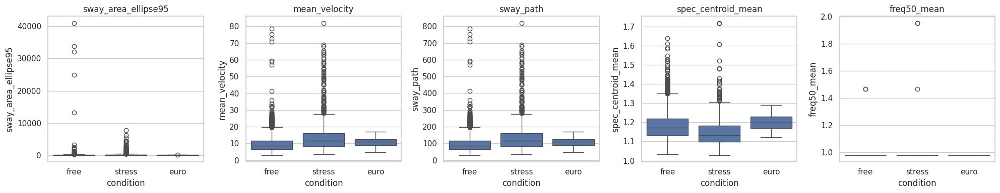

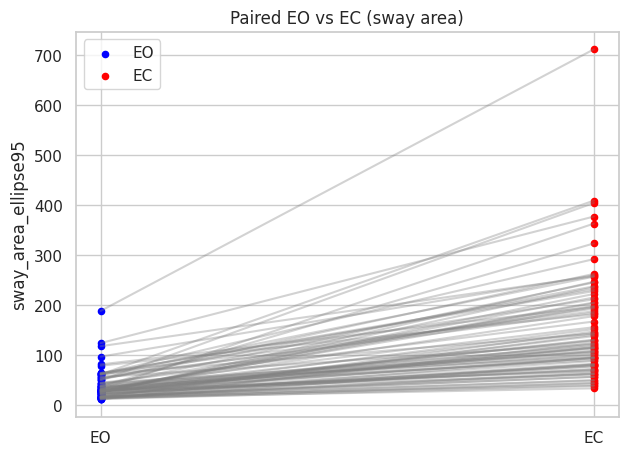

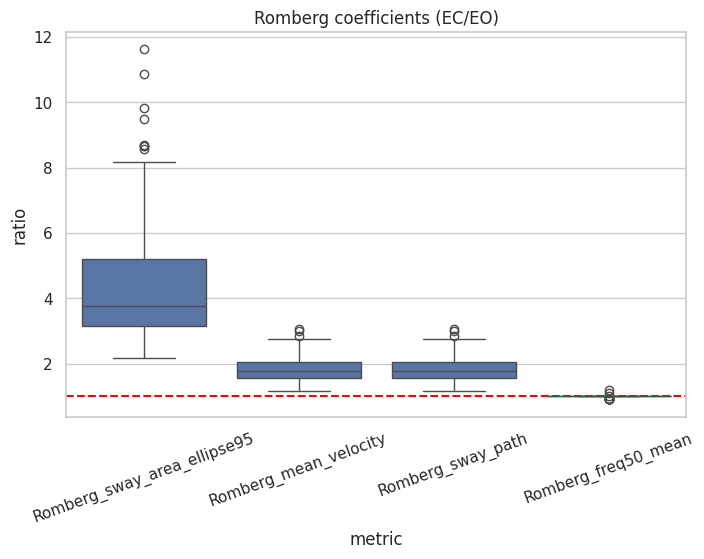

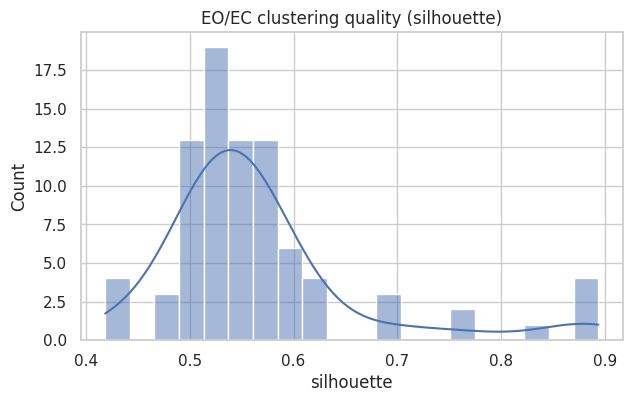

In [ ]:
# ============================================================
# CELL 9: Relevant visualizations
# ============================================================
# 1) Condition-level key metrics
key_metrics = ["sway_area_ellipse95","mean_velocity","sway_path","spec_centroid_mean","freq50_mean"]
fig, axes = plt.subplots(1, len(key_metrics), figsize=(4*len(key_metrics),4))
for i, m in enumerate(key_metrics):
    sns.boxplot(data=traj_df, x="condition", y=m, ax=axes[i])
    axes[i].set_title(m)
plt.tight_layout()
plt.show()

# 2) EO vs EC paired sway area
tmp = eoec_df.groupby(["subject_id","eo_ec_fixed"])["sway_area_ellipse95"].mean().reset_index()
pv = tmp.pivot(index="subject_id", columns="eo_ec_fixed", values="sway_area_ellipse95").dropna()

plt.figure(figsize=(7,5))
for _, r in pv.iterrows():
    plt.plot(["EO","EC"], [r["EO"], r["EC"]], color="gray", alpha=0.35)
plt.scatter(["EO"]*len(pv), pv["EO"], c="blue", s=20, label="EO")
plt.scatter(["EC"]*len(pv), pv["EC"], c="red", s=20, label="EC")
plt.title("Paired EO vs EC (sway area)")
plt.ylabel("sway_area_ellipse95")
plt.legend()
plt.show()

# 3) Romberg distributions
rcols = [f"Romberg_{m}" for m in ["sway_area_ellipse95","mean_velocity","sway_path","freq50_mean"]]
rd = romberg_df[rcols].melt(var_name="metric", value_name="ratio").dropna()

plt.figure(figsize=(8,5))
sns.boxplot(data=rd, x="metric", y="ratio")
plt.axhline(1.0, ls="--", c="red")
plt.title("Romberg coefficients (EC/EO)")
plt.xticks(rotation=20)
plt.show()

# 4) EO/EC separability QC
plt.figure(figsize=(7,4))
sns.histplot(eoec_qc["silhouette"].dropna(), bins=20, kde=True)
plt.title("EO/EC clustering quality (silhouette)")
plt.show()

#Romberg Ratio Analysis

A) Condition boxplots (free, stress, euro)
- mean_velocity and sway_path: stress is highest (clear upward shift), euro lower than stress.
- sway_area_ellipse95: stress tends higher but heavy outliers; free has very extreme outliers too.
- spec_centroid_mean: modest shifts only.
- freq50_mean: almost flat around ~1 across conditions → weak discriminator.
- Takeaway: amplitude/path features separate conditions better than frequency median features.

B) Paired EO vs EC (sway area)
- Most gray lines go upward from EO to EC.
- EC (red) is generally above EO (blue) for the same subject.
- Takeaway: strong physiological consistency with expected Romberg behavior (closing eyes increases sway).



C) Romberg coefficients (EC/EO)
- Romberg_sway_area_ellipse95 median ~3–4 (and large upper tail) → very strong EC increase.
- Romberg_mean_velocity and Romberg_sway_path around ~1.6–2.0 → moderate/strong EC increase.
- Romberg_freq50_mean ≈ 1.0 → little frequency shift.
- Red dashed line at 1.0 means “no EO/EC difference”; most values above 1 for area/path/velocity confirm EC>EO.

In [ ]:
# ============================================================
# CELL 10: Save outputs
# ============================================================
os.makedirs("/content/metrics_no_entropy", exist_ok=True)

traj_df.to_parquet("/content/metrics_no_entropy/trajectory_metrics_no_entropy.parquet", index=False)
cond_summary.to_csv("/content/metrics_no_entropy/condition_summary.csv")
subj_cond_mean.to_csv("/content/metrics_no_entropy/subject_condition_mean.csv", index=False)
subj_cond_cv.to_csv("/content/metrics_no_entropy/subject_condition_cv.csv", index=False)
subject_delta_df.to_csv("/content/metrics_no_entropy/subject_condition_deltas_ratios.csv", index=False)

# session_df.to_csv("/content/metrics_no_entropy/free_sessions_metrics.csv", index=False)
# eoec_df.to_csv("/content/metrics_no_entropy/free_sessions_eo_ec_labeled.csv", index=False)
# eoec_qc.to_csv("/content/metrics_no_entropy/eo_ec_qc.csv", index=False)

# romberg_df.to_csv("/content/metrics_no_entropy/romberg_coefficients.csv", index=False)
# review_df.to_csv("/content/metrics_no_entropy/romberg_metric_review.csv", index=False)

print("Saved to /content/metrics_no_entropy")

Saved to /content/metrics_no_entropy


In [ ]:
# ============================================================
# Compute ONLY sample entropy features (sampen_x, sampen_y)
# Uses:
#   - segment_data_advanced (boundaries/metadata)
#   - signals_cleaned.parquet (raw cop_x, cop_y)
# Output:
#   - segment_data_advanced with sampen_x_new, sampen_y_new
# ============================================================

import numpy as np
import pandas as pd
import pyarrow.parquet as pq
from tqdm.auto import tqdm
from joblib import Parallel, delayed

# -------------------------
# Config
# -------------------------
FS = 250
RANDOM_STATE = 42
N_JOBS = -1
M = 2
R_RATIO = 0.2
MIN_SAMPLES = 50  # 0.2s at 250 Hz; raise if needed for stability

# -------------------------
# Load signals
# -------------------------
signals = pq.read_table('/content/signals_cleaned.parquet').to_pandas()

# fast file-wise map
sig_map = {}
for fid, g in signals.groupby("file_id"):
    gg = g.sort_values("sample_num")
    sig_map[fid] = {
        "sample_num": gg["sample_num"].to_numpy(),
        "x": gg["cop_x"].to_numpy(),
        "y": gg["cop_y"].to_numpy()
    }

# -------------------------
# Sample entropy function
# -------------------------
def sample_entropy(x, m=2, r_ratio=0.2):
    """
    Sample entropy (naive O(n^2)); robust for moderate window sizes.
    """
    x = np.asarray(x, dtype=np.float64)
    n = len(x)
    if n < m + 2:
        return np.nan

    sd = np.std(x)
    if sd == 0:
        return 0.0

    r = r_ratio * sd

    def _count_matches(mm):
        count = 0
        for i in range(n - mm):
            xi = x[i:i+mm]
            for j in range(i + 1, n - mm + 1):
                xj = x[j:j+mm]
                if np.max(np.abs(xi - xj)) <= r:
                    count += 1
        return count

    B = _count_matches(m)
    A = _count_matches(m + 1)

    if B == 0:
        return np.nan
    if A == 0:
        # very irregular signal
        return -np.log(1.0 / (B + 1e-12))
    return -np.log(A / B)

# -------------------------
# Segment list
# -------------------------
seg = segment_data_advanced[['file_id', 'sample_start', 'sample_end']].copy()
seg['sample_start'] = seg['sample_start'].astype(int)
seg['sample_end'] = seg['sample_end'].astype(int)
seg = seg.reset_index().rename(columns={'index': 'row_id'})  # stable key for merge

# -------------------------
# Worker
# -------------------------
def compute_sampen_for_row(r):
    row_id = r.row_id
    fid = r.file_id
    s0 = int(r.sample_start)
    s1 = int(r.sample_end)

    if fid not in sig_map:
        return (row_id, np.nan, np.nan)

    d = sig_map[fid]
    smp = d["sample_num"]

    # end-exclusive
    mask = (smp >= s0) & (smp < s1)
    if mask.sum() < MIN_SAMPLES:
        return (row_id, np.nan, np.nan)

    x = d["x"][mask]
    y = d["y"][mask]

    sx = sample_entropy(x, m=M, r_ratio=R_RATIO)
    sy = sample_entropy(y, m=M, r_ratio=R_RATIO)

    return (row_id, sx, sy)

# -------------------------
# Parallel compute
# -------------------------
results = Parallel(n_jobs=N_JOBS, backend="loky")(
    delayed(compute_sampen_for_row)(r) for r in tqdm(seg.itertuples(index=False), total=len(seg))
)

sampen_df = pd.DataFrame(results, columns=["row_id", "sampen_x_new", "sampen_y_new"])

# -------------------------
# Merge back
# -------------------------
segment_data_advanced = segment_data_advanced.reset_index().rename(columns={'index': 'row_id'})
segment_data_advanced = segment_data_advanced.merge(sampen_df, on="row_id", how="left")

# Optional: overwrite old columns if desired
# segment_data_advanced["sampen_x"] = segment_data_advanced["sampen_x_new"]
# segment_data_advanced["sampen_y"] = segment_data_advanced["sampen_y_new"]

# restore original indexing style
segment_data_advanced = segment_data_advanced.drop(columns=["row_id"])

print("Done.")
print(segment_data_advanced[["sampen_x_new", "sampen_y_new"]].describe())
print("NaN counts:",
      segment_data_advanced["sampen_x_new"].isna().sum(),
      segment_data_advanced["sampen_y_new"].isna().sum())

  0%|          | 0/5570 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [ ]:
segment_data_advanced.to_parquet("segment_data_advanced")

In [ ]:
import numpy as np
import pandas as pd
from scipy.stats import wilcoxon

# df = your trajectory table with columns: subject_id, condition, feature...
feature_cols = [c for c in traj_df.columns if c not in [
    "file_id","subject_id","condition","trial","age","height","mass",
    "sample_start","sample_end","n_samples","duration_sec"
]]

# subject-level mean per condition
subj_cond = traj_df.groupby(["subject_id","condition"])[feature_cols].mean().reset_index()
pv = subj_cond.pivot(index="subject_id", columns="condition", values=feature_cols)

rows = []
for f in feature_cols:
    if (f, "free") not in pv.columns or (f, "stress") not in pv.columns:
        continue
    x = pv[(f, "stress")] - pv[(f, "free")]
    x = x.dropna()
    if len(x) < 10:
        continue
    p = wilcoxon(x).pvalue
    effect = np.median(x) / (np.median(np.abs(x - np.median(x))) + 1e-9)  # robust effect proxy
    rows.append({
        "feature": f,
        "n": len(x),
        "median_delta_stress_free": np.median(x),
        "p_wilcoxon": p,
        "robust_effect": effect
    })

review = pd.DataFrame(rows).sort_values(["p_wilcoxon","robust_effect"], ascending=[True, False])
display(review.head(20))

/usr/local/lib/python3.12/dist-packages/scipy/stats/_wilcoxon.py:178: RuntimeWarning: invalid value encountered in scalar divide
  z = (r_plus - mn) / se


,feature,n,median_delta_stress_free,p_wilcoxon,robust_effect
19,x_bp_10_30,11,-9.046103e-03,0.002930,-2.211262
14,x_spec_centroid,11,-3.258716e-02,0.006836,-1.233398
0,sway_path,11,1.114284e+01,0.083008,0.658460
1,mean_velocity,11,1.114730e+00,0.083008,0.658460
7,cop_y_mean,11,-1.544271e-15,0.123047,-0.000002
13,ap_ml_range_ratio,11,1.714633e-01,0.147461,0.899239
9,cop_y_range,11,1.905269e+00,0.147461,0.844935
12,ap_ml_std_ratio,11,9.220714e-02,0.174805,0.757688
11,radial_std,11,2.609420e-01,0.206055,0.780608
26,spec_centroid_mean,11,-6.962396e-03,0.206055,-0.322493


In [ ]:
# within-subject CV in each condition
# A useful feature should vary with condition
cv_tbl = traj_df.groupby(["subject_id","condition"])[feature_cols].agg(["mean","std"]).reset_index()
cv_tbl.columns = ["subject_id","condition"] + [f"{a}_{b}" for a,b in cv_tbl.columns.tolist()[2:]]

cv_summary = []
for f in feature_cols:
    mean_col = f"{f}_mean"
    std_col = f"{f}_std"
    if mean_col not in cv_tbl or std_col not in cv_tbl:
        continue
    cv = (cv_tbl[std_col] / (cv_tbl[mean_col].abs() + 1e-9)).replace([np.inf, -np.inf], np.nan)
    cv_summary.append({"feature": f, "median_cv": np.nanmedian(cv), "mean_cv": np.nanmean(cv)})

cv_summary = pd.DataFrame(cv_summary).sort_values("median_cv")
display(cv_summary.head(20))

,feature,median_cv,mean_cv
15,x_freq50,0.000000,0.003437
23,y_bp_00_05,0.000000,0.000000
24,y_bp_05_10,0.000000,0.000000
27,freq50_mean,0.000000,0.003126
21,y_freq50,0.000000,0.002757
17,x_bp_00_05,0.000000,0.000000
18,x_bp_05_10,0.000000,0.000000
4,cop_x_mean,0.000002,0.000002
7,cop_y_mean,0.000009,0.000009
26,spec_centroid_mean,0.039056,0.041177


In [ ]:
# Class separability
from sklearn.model_selection import GroupKFold
from sklearn.metrics import roc_auc_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler

tmp = traj_df[traj_df["condition"].isin(["free","stress"])].copy()
tmp["y"] = (tmp["condition"]=="stress").astype(int)

scores = []
gkf = GroupKFold(n_splits=5)

for f in feature_cols:
    d = tmp.dropna(subset=[f,"y","subject_id"])
    if len(d) < 200:
        continue
    X = d[[f]].values
    y = d["y"].values
    g = d["subject_id"].values
    aucs = []
    for tr, te in gkf.split(X,y,g):
        sc = StandardScaler()
        Xtr = sc.fit_transform(X[tr]); Xte = sc.transform(X[te])
        m = RandomForestClassifier(n_estimators=100, random_state=42, class_weight="balanced")
        m.fit(Xtr,y[tr])
        p = m.predict_proba(Xte)[:,1]
        aucs.append(roc_auc_score(y[te],p))
    scores.append({"feature": f, "auc_mean": np.mean(aucs)})

scores = pd.DataFrame(scores).sort_values("auc_mean", ascending=False)
display(scores.head(20))

,feature,auc_mean
14,x_spec_centroid,0.596364
11,radial_std,0.579868
1,mean_velocity,0.577741
0,sway_path,0.577741
6,cop_x_range,0.566462
9,cop_y_range,0.565171
19,x_bp_10_30,0.557762
2,sway_area_ellipse95,0.557289
26,spec_centroid_mean,0.553193
25,y_bp_10_30,0.548716


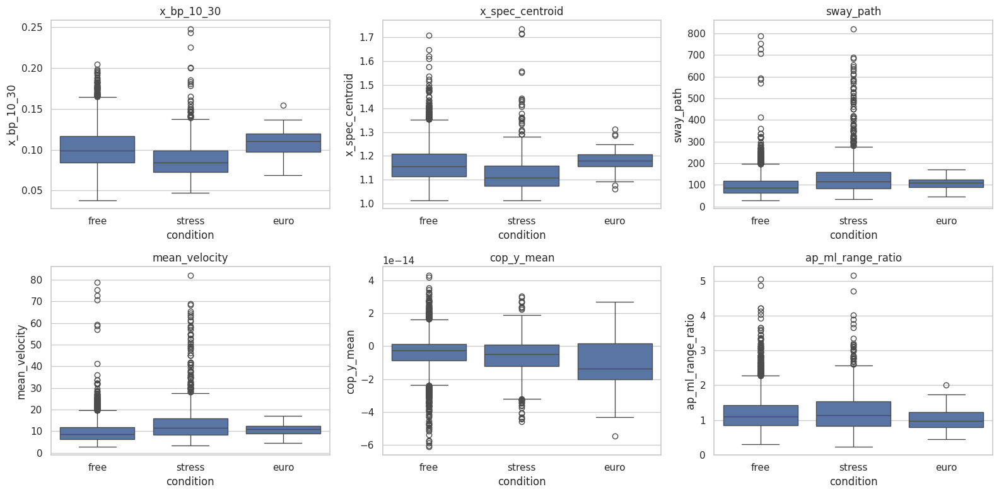

In [ ]:
# Plot only top ranked features
top_feats = review.head(6)["feature"].tolist()  # or scores.head(6)

import matplotlib.pyplot as plt
import seaborn as sns
fig, axes = plt.subplots(2, 3, figsize=(16,8))
axes = axes.flatten()

for i, f in enumerate(top_feats):
    sns.boxplot(data=traj_df, x="condition", y=f, ax=axes[i])
    axes[i].set_title(f)

plt.tight_layout()
plt.show()

In [ ]:
# ============================================================
# Build romberg_df from eoec_df
# Requires eoec_df with:
#   - subject_id
#   - eo_ec_fixed  (values: "EO", "EC")
#   - metric columns (e.g., sway_area_ellipse95, mean_velocity, sway_path, ...)
# ============================================================

import numpy as np
import pandas as pd

EPS = 1e-9

assert "eoec_df" in globals(), "eoec_df not found. Please run EO/EC labeling first."
assert "subject_id" in eoec_df.columns, "eoec_df missing subject_id"
assert "eo_ec_fixed" in eoec_df.columns, "eoec_df missing eo_ec_fixed"

tmp = eoec_df.copy()
tmp["eo_ec_fixed"] = tmp["eo_ec_fixed"].astype(str).str.strip().str.upper()

# keep only EO/EC rows
tmp = tmp[tmp["eo_ec_fixed"].isin(["EO", "EC"])].copy()

# choose numeric metric columns automatically
exclude = {"subject_id", "file_id", "session_idx", "n_samples", "cluster", "eo_ec_inferred", "eo_ec_fixed"}
metric_cols = [c for c in tmp.columns if c not in exclude and pd.api.types.is_numeric_dtype(tmp[c])]

# optional: restrict to core metrics
preferred = [
    "sway_area_ellipse95","mean_velocity","sway_path",
    "cop_x_std","cop_y_std","cop_x_range","cop_y_range",
    "spec_centroid_mean","freq50_mean","freq95_mean"
]
metric_cols = [c for c in preferred if c in metric_cols] + [c for c in metric_cols if c not in preferred]

print("Metrics used for Romberg:", metric_cols[:15], "... total:", len(metric_cols))

rows = []
for sid, g in tmp.groupby("subject_id"):
    out = {"subject_id": sid}

    eo = g[g["eo_ec_fixed"] == "EO"]
    ec = g[g["eo_ec_fixed"] == "EC"]

    # require at least 1 EO and 1 EC session
    if len(eo) == 0 or len(ec) == 0:
        continue

    out["n_EO_sessions"] = len(eo)
    out["n_EC_sessions"] = len(ec)

    for m in metric_cols:
        eo_m = eo[m].mean()
        ec_m = ec[m].mean()

        out[f"EO_{m}"] = eo_m
        out[f"EC_{m}"] = ec_m
        out[f"Romberg_{m}"] = ec_m / (eo_m + EPS)
        out[f"logRomberg_{m}"] = np.log((ec_m + EPS) / (eo_m + EPS))

    rows.append(out)

romberg_df = pd.DataFrame(rows)

print("romberg_df shape:", romberg_df.shape)
display(romberg_df.head())

# Save
romberg_df.to_csv("/content/romberg_df.csv", index=False)
print("Saved /content/romberg_df.csv")

Metrics used for Romberg: ['sway_area_ellipse95', 'mean_velocity', 'sway_path', 'cop_x_std', 'cop_y_std', 'cop_x_range', 'cop_y_range', 'spec_centroid_mean', 'freq50_mean', 'freq95_mean', 'convex_hull_area', 'cop_x_mean', 'cop_y_mean', 'radial_mean', 'radial_std'] ... total: 29
romberg_df shape: (85, 119)


,subject_id,n_EO_sessions,n_EC_sessions,EO_sway_area_ellipse95,EC_sway_area_ellipse95,Romberg_sway_area_ellipse95,logRomberg_sway_area_ellipse95,EO_mean_velocity,EC_mean_velocity,Romberg_mean_velocity,...,Romberg_y_bp_00_05,logRomberg_y_bp_00_05,EO_y_bp_05_10,EC_y_bp_05_10,Romberg_y_bp_05_10,logRomberg_y_bp_05_10,EO_y_bp_10_30,EC_y_bp_10_30,Romberg_y_bp_10_30,logRomberg_y_bp_10_30
0,2,5,5,41.919629,198.510455,4.735501,1.555088,10.653410,21.312702,2.000552,...,0.0,0.0,0.0,0.0,0.0,0.0,0.101324,0.113231,1.117518,0.111110
1,7,5,5,30.043131,107.761181,3.586883,1.277283,7.151615,17.496348,2.446489,...,0.0,0.0,0.0,0.0,0.0,0.0,0.096619,0.091237,0.944288,-0.057324
2,8,5,5,21.313896,79.636955,3.736387,1.318119,8.014483,15.216392,1.898612,...,0.0,0.0,0.0,0.0,0.0,0.0,0.103910,0.117308,1.128930,0.121270
3,9,5,5,14.969462,77.914502,5.204896,1.649600,5.554807,13.560062,2.441140,...,0.0,0.0,0.0,0.0,0.0,0.0,0.090464,0.080173,0.886248,-0.120759
4,10,5,5,14.532232,62.023562,4.268000,1.451145,7.504530,13.346306,1.778433,...,0.0,0.0,0.0,0.0,0.0,0.0,0.160102,0.111894,0.698890,-0.358262


Saved /content/romberg_df.csv


In [ ]:
# ============================================================
# SUBJECT-SPECIFIC LITERATURE-STYLE FEATURE TABLE
# Inputs required:
#   - traj_df
#   - romberg_df (optional but recommended)
# Output:
#   - subject_features_literature
#   - /content/subject_features_literature.csv
# ============================================================

import numpy as np
import pandas as pd
import os

EPS = 1e-9

# -------------------------
# 0) Basic checks
# -------------------------
assert "traj_df" in globals(), "traj_df not found."

df = traj_df.copy()
df["condition"] = df["condition"].astype(str).str.strip().str.lower()

needed_core = ["subject_id", "condition"]
for c in needed_core:
    assert c in df.columns, f"Missing column in traj_df: {c}"

# Candidate trajectory metrics (use only those present)
base_metrics = [
    "sway_path",
    "mean_velocity",
    "sway_area_ellipse95",
    "convex_hull_area",
    "cop_x_std",
    "cop_y_std",
    "cop_x_range",
    "cop_y_range",
    "radial_mean",
    "radial_std",
    "ap_ml_std_ratio",
    "ap_ml_range_ratio",
    "spec_centroid_mean",
    "freq50_mean",
    "freq95_mean",
    "x_bp_10_30",
    "y_bp_10_30"
]
base_metrics = [m for m in base_metrics if m in df.columns]

print("Using base metrics:", base_metrics)

# -------------------------
# 1) Subject × Condition summaries
# -------------------------
# Means
subj_cond_mean = (
    df.groupby(["subject_id", "condition"], as_index=False)[base_metrics]
    .mean()
)

# SD and CV
subj_cond_std = (
    df.groupby(["subject_id", "condition"], as_index=False)[base_metrics]
    .std()
)
subj_cond_std = subj_cond_std.rename(columns={m: f"{m}__std" for m in base_metrics})

subj_cond = subj_cond_mean.merge(subj_cond_std, on=["subject_id", "condition"], how="left")

for m in base_metrics:
    subj_cond[f"{m}__cv"] = subj_cond[f"{m}__std"] / (np.abs(subj_cond[m]) + EPS)

# -------------------------
# 2) Pivot to subject-level wide table
# -------------------------
wide_mean = subj_cond_mean.pivot(index="subject_id", columns="condition", values=base_metrics)
wide_mean.columns = [f"{metric}__{cond}" for metric, cond in wide_mean.columns]
wide_mean = wide_mean.reset_index()

wide_cv = subj_cond.pivot(index="subject_id", columns="condition", values=[f"{m}__cv" for m in base_metrics])
wide_cv.columns = [f"{metric}__{cond}" for metric, cond in wide_cv.columns]
wide_cv = wide_cv.reset_index()

subject_features = wide_mean.merge(wide_cv, on="subject_id", how="outer")

# -------------------------
# 3) Condition contrast indices (literature-style normalized costs)
#    Stress-Free and Euro-Free:
#    delta = A - B
#    ratio = A / B
#    norm_index = (A - B) / B
# -------------------------
def add_pairwise_indices(tbl, metric, A, B):
    a_col = f"{metric}__{A}"
    b_col = f"{metric}__{B}"
    if a_col not in tbl.columns or b_col not in tbl.columns:
        return
    tbl[f"delta_{A}_{B}__{metric}"] = tbl[a_col] - tbl[b_col]
    tbl[f"ratio_{A}_{B}__{metric}"] = tbl[a_col] / (tbl[b_col] + EPS)
    tbl[f"normidx_{A}_{B}__{metric}"] = (tbl[a_col] - tbl[b_col]) / (tbl[b_col] + EPS)
    tbl[f"logratio_{A}_{B}__{metric}"] = np.log((tbl[a_col] + EPS) / (tbl[b_col] + EPS))

for m in base_metrics:
    add_pairwise_indices(subject_features, m, "stress", "free")
    add_pairwise_indices(subject_features, m, "euro", "free")

# -------------------------
# 4) Directional control indices (subject-level)
#    AP/ML ratio proxies from available features
# -------------------------
# std-based AP/ML index per condition
for cond in ["free", "stress", "euro"]:
    xstd = f"cop_x_std__{cond}"
    ystd = f"cop_y_std__{cond}"
    if xstd in subject_features.columns and ystd in subject_features.columns:
        subject_features[f"apml_std_ratio__{cond}"] = subject_features[ystd] / (subject_features[xstd] + EPS)

    xr = f"cop_x_range__{cond}"
    yr = f"cop_y_range__{cond}"
    if xr in subject_features.columns and yr in subject_features.columns:
        subject_features[f"apml_range_ratio__{cond}"] = subject_features[yr] / (subject_features[xr] + EPS)

# -------------------------
# 5) Composite instability scores (z-composites)
#    using area/path/velocity within each condition
# -------------------------
def zscore_col(s):
    return (s - s.mean()) / (s.std(ddof=0) + EPS)

for cond in ["free", "stress", "euro"]:
    cols = [f"{m}__{cond}" for m in ["sway_area_ellipse95", "sway_path", "mean_velocity"] if f"{m}__{cond}" in subject_features.columns]
    if len(cols) >= 2:
        zparts = [zscore_col(subject_features[c]) for c in cols]
        subject_features[f"instability_zscore__{cond}"] = np.nanmean(np.vstack(zparts), axis=0)

# stress/euro cost in instability score
if "instability_zscore__stress" in subject_features.columns and "instability_zscore__free" in subject_features.columns:
    subject_features["instability_cost_stress_free"] = (
        subject_features["instability_zscore__stress"] - subject_features["instability_zscore__free"]
    )
if "instability_zscore__euro" in subject_features.columns and "instability_zscore__free" in subject_features.columns:
    subject_features["instability_cost_euro_free"] = (
        subject_features["instability_zscore__euro"] - subject_features["instability_zscore__free"]
    )

# -------------------------
# 6) Merge Romberg features (if available)
# -------------------------
if "romberg_df" in globals() and isinstance(romberg_df, pd.DataFrame) and "subject_id" in romberg_df.columns:
    rb = romberg_df.copy()
    rb_cols_keep = ["subject_id"] + [c for c in rb.columns if c.startswith("Romberg_") or c.startswith("logRomberg_")]
    rb = rb[rb_cols_keep].drop_duplicates("subject_id")
    subject_features = subject_features.merge(rb, on="subject_id", how="left")
    print("Merged Romberg features:", len([c for c in rb.columns if c != "subject_id"]))
else:
    print("romberg_df not found -> skipping Romberg merge")

# -------------------------
# 7) Add completeness / coverage flags
# -------------------------
# Coverage for condition pairs
def has_col(c): return c in subject_features.columns

if has_col("sway_path__free") and has_col("sway_path__stress"):
    subject_features["has_free_and_stress"] = (
        subject_features["sway_path__free"].notna() & subject_features["sway_path__stress"].notna()
    )
if has_col("sway_path__free") and has_col("sway_path__euro"):
    subject_features["has_free_and_euro"] = (
        subject_features["sway_path__free"].notna() & subject_features["sway_path__euro"].notna()
    )

# EO/EC Romberg availability
romberg_cols = [c for c in subject_features.columns if c.startswith("Romberg_")]
if len(romberg_cols) > 0:
    subject_features["has_romberg"] = subject_features[romberg_cols].notna().any(axis=1)

# -------------------------
# 8) Final output
# -------------------------
subject_features_literature = subject_features.copy()

print("subject_features_literature shape:", subject_features_literature.shape)
display(subject_features_literature.head(10))

# Save
os.makedirs("/content", exist_ok=True)
subject_features_literature.to_csv("/content/subject_features_literature.csv", index=False)
print("Saved: /content/subject_features_literature.csv")

Using base metrics: ['sway_path', 'mean_velocity', 'sway_area_ellipse95', 'convex_hull_area', 'cop_x_std', 'cop_y_std', 'cop_x_range', 'cop_y_range', 'radial_mean', 'radial_std', 'ap_ml_std_ratio', 'ap_ml_range_ratio', 'spec_centroid_mean', 'freq50_mean', 'freq95_mean', 'x_bp_10_30', 'y_bp_10_30']


/tmp/ipykernel_1339/870107381.py:100: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  tbl[f"ratio_{A}_{B}__{metric}"] = tbl[a_col] / (tbl[b_col] + EPS)
/tmp/ipykernel_1339/870107381.py:101: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  tbl[f"normidx_{A}_{B}__{metric}"] = (tbl[a_col] - tbl[b_col]) / (tbl[b_col] + EPS)
/tmp/ipykernel_1339/870107381.py:102: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

Merged Romberg features: 58
subject_features_literature shape: (123, 311)


,subject_id,sway_path__euro,sway_path__free,sway_path__stress,mean_velocity__euro,mean_velocity__free,mean_velocity__stress,sway_area_ellipse95__euro,sway_area_ellipse95__free,sway_area_ellipse95__stress,...,logRomberg_y_freq95,Romberg_y_bp_00_05,logRomberg_y_bp_00_05,Romberg_y_bp_05_10,logRomberg_y_bp_05_10,Romberg_y_bp_10_30,logRomberg_y_bp_10_30,has_free_and_stress,has_free_and_euro,has_romberg
0,2,NaN,97.419147,NaN,NaN,9.745813,NaN,NaN,108.640928,NaN,...,-0.167054,0.0,0.0,0.0,0.0,1.117518,0.111110,False,False,True
1,7,NaN,79.193026,NaN,NaN,7.922472,NaN,NaN,89.383345,NaN,...,0.000000,0.0,0.0,0.0,0.0,0.944288,-0.057324,False,False,True
2,8,NaN,79.053297,NaN,NaN,7.908493,NaN,NaN,72.774182,NaN,...,0.182322,0.0,0.0,0.0,0.0,1.128930,0.121270,False,False,True
3,9,NaN,67.660998,NaN,NaN,6.768807,NaN,NaN,45.502403,NaN,...,0.000000,0.0,0.0,0.0,0.0,0.886248,-0.120759,False,False,True
4,10,NaN,83.996581,NaN,NaN,8.403019,NaN,NaN,92.250889,NaN,...,-0.167054,0.0,0.0,0.0,0.0,0.698890,-0.358262,False,False,True
5,11,NaN,66.375561,NaN,NaN,6.640212,NaN,NaN,93.074313,NaN,...,-0.087011,0.0,0.0,0.0,0.0,0.866902,-0.142829,False,False,True
6,12,NaN,55.871667,NaN,NaN,5.589402,NaN,NaN,57.325432,NaN,...,0.095310,0.0,0.0,0.0,0.0,0.963859,-0.036810,False,False,True
7,13,NaN,84.772628,NaN,NaN,8.480655,NaN,NaN,125.290797,NaN,...,0.000000,0.0,0.0,0.0,0.0,1.078590,0.075654,False,False,True
8,14,NaN,63.358613,NaN,NaN,6.338397,NaN,NaN,35.333744,NaN,...,0.000000,0.0,0.0,0.0,0.0,0.779635,-0.248930,False,False,True
9,15,NaN,83.407637,NaN,NaN,8.344101,NaN,NaN,50.505720,NaN,...,0.000000,0.0,0.0,0.0,0.0,0.935798,-0.066355,False,False,True


Saved: /content/subject_features_literature.csv


#Subject Specific Features

In [ ]:
# ============================================================
# CLEANUP + READY DATASETS
# 1) Remove zero-dominated / near-constant columns
# 2) Build two modeling-ready subject datasets:
#    - df_condtrast_ready (stress/free or euro/free contrast features)
#    - df_romberg_ready   (Romberg EO/EC features)
# ============================================================

import numpy as np
import pandas as pd

assert "subject_features_literature" in globals(), "subject_features_literature not found."

df = subject_features_literature.copy()

# -------------------------
# Config
# -------------------------
ID_COL = "subject_id"

# thresholds (tune if needed)
ZERO_DOM_THRESHOLD = 0.95     # drop if >=95% values are exactly 0
CONST_NUNIQUE_MAX = 1         # drop if <=1 unique non-null value
LOW_VAR_THRESHOLD = 1e-12     # drop if variance <= threshold
MISSING_THRESHOLD = 0.60      # drop if >60% missing (within each output set)

# -------------------------
# Helper: find bad columns
# -------------------------
def find_bad_numeric_columns(dfin, candidate_cols):
    bad = {
        "zero_dominated": [],
        "constant": [],
        "low_variance": []
    }

    for c in candidate_cols:
        s = dfin[c]
        if not pd.api.types.is_numeric_dtype(s):
            continue

        sn = s.dropna()
        if len(sn) == 0:
            bad["constant"].append(c)
            continue

        # zero dominated
        frac_zero = (sn == 0).mean()
        if frac_zero >= ZERO_DOM_THRESHOLD:
            bad["zero_dominated"].append(c)

        # constant
        if sn.nunique() <= CONST_NUNIQUE_MAX:
            bad["constant"].append(c)

        # low variance
        if float(sn.var()) <= LOW_VAR_THRESHOLD:
            bad["low_variance"].append(c)

    bad_all = sorted(set(bad["zero_dominated"] + bad["constant"] + bad["low_variance"]))
    return bad, bad_all

# -------------------------
# Column groups
# -------------------------
all_cols = df.columns.tolist()

# Contrast features: stress/free + euro/free deltas/ratios/logratios/normidx
contrast_prefixes = (
    "delta_stress_free__", "ratio_stress_free__", "logratio_stress_free__", "normidx_stress_free__",
    "delta_euro_free__",   "ratio_euro_free__",   "logratio_euro_free__",   "normidx_euro_free__"
)
contrast_cols = [c for c in all_cols if c.startswith(contrast_prefixes)]

# Romberg features
romberg_cols = [c for c in all_cols if c.startswith("Romberg_") or c.startswith("logRomberg_")]

# Optional base summaries (condition means/cv) if you want to keep
# Here we keep ONLY subject-level derived features in ready sets.

# -------------------------
# Build condition-contrast ready dataset
# -------------------------
keep_cols_cond = [ID_COL] + [c for c in contrast_cols if c in df.columns]
if "has_free_and_stress" in df.columns:
    keep_cols_cond.append("has_free_and_stress")
if "has_free_and_euro" in df.columns:
    keep_cols_cond.append("has_free_and_euro")

df_cond = df[keep_cols_cond].copy()

# Keep subjects with at least one valid pair type
pair_mask = pd.Series(False, index=df_cond.index)
if "has_free_and_stress" in df_cond.columns:
    pair_mask |= df_cond["has_free_and_stress"].fillna(False)
if "has_free_and_euro" in df_cond.columns:
    pair_mask |= df_cond["has_free_and_euro"].fillna(False)

df_cond = df_cond[pair_mask].copy()

# Drop metadata flags before feature filtering
meta_cond = [ID_COL]
for f in ["has_free_and_stress", "has_free_and_euro"]:
    if f in df_cond.columns:
        meta_cond.append(f)

cond_feat_cols = [c for c in df_cond.columns if c not in meta_cond and pd.api.types.is_numeric_dtype(df_cond[c])]

# remove high-missing columns
missing_frac_cond = df_cond[cond_feat_cols].isna().mean()
cond_feat_cols = [c for c in cond_feat_cols if missing_frac_cond[c] <= MISSING_THRESHOLD]

# bad numeric columns
bad_cond, bad_cond_all = find_bad_numeric_columns(df_cond, cond_feat_cols)
cond_feat_cols = [c for c in cond_feat_cols if c not in bad_cond_all]

# final condtrast dataset
df_condtrast_ready = df_cond[meta_cond + cond_feat_cols].copy()

# -------------------------
# Build Romberg ready dataset
# -------------------------
keep_cols_rb = [ID_COL] + [c for c in romberg_cols if c in df.columns]
if "has_romberg" in df.columns:
    keep_cols_rb.append("has_romberg")

df_rb = df[keep_cols_rb].copy()

# keep rows with romberg availability
if "has_romberg" in df_rb.columns:
    df_rb = df_rb[df_rb["has_romberg"].fillna(False)].copy()

meta_rb = [ID_COL]
if "has_romberg" in df_rb.columns:
    meta_rb.append("has_romberg")

rb_feat_cols = [c for c in df_rb.columns if c not in meta_rb and pd.api.types.is_numeric_dtype(df_rb[c])]

# remove high-missing columns
missing_frac_rb = df_rb[rb_feat_cols].isna().mean()
rb_feat_cols = [c for c in rb_feat_cols if missing_frac_rb[c] <= MISSING_THRESHOLD]

# bad numeric columns
bad_rb, bad_rb_all = find_bad_numeric_columns(df_rb, rb_feat_cols)
rb_feat_cols = [c for c in rb_feat_cols if c not in bad_rb_all]

# final romberg dataset
df_romberg_ready = df_rb[meta_rb + rb_feat_cols].copy()

# -------------------------
# Optional: defragment (removes pandas fragmentation warning downstream)
# -------------------------
df_condtrast_ready = df_condtrast_ready.copy()
df_romberg_ready = df_romberg_ready.copy()

# -------------------------
# Reports
# -------------------------
print("=== Condition-contrast ready ===")
print("Rows (subjects):", len(df_condtrast_ready))
print("Columns:", df_condtrast_ready.shape[1])
print("Feature cols:", len([c for c in df_condtrast_ready.columns if c not in meta_cond]))
print("\nDropped in condtrast:")
print(" - high missing:", int((missing_frac_cond > MISSING_THRESHOLD).sum()) if len(missing_frac_cond) else 0)
print(" - zero dominated:", len(bad_cond["zero_dominated"]))
print(" - constant:", len(bad_cond["constant"]))
print(" - low variance:", len(bad_cond["low_variance"]))

print("\n=== Romberg ready ===")
print("Rows (subjects):", len(df_romberg_ready))
print("Columns:", df_romberg_ready.shape[1])
print("Feature cols:", len([c for c in df_romberg_ready.columns if c not in meta_rb]))
print("\nDropped in romberg:")
print(" - high missing:", int((missing_frac_rb > MISSING_THRESHOLD).sum()) if len(missing_frac_rb) else 0)
print(" - zero dominated:", len(bad_rb["zero_dominated"]))
print(" - constant:", len(bad_rb["constant"]))
print(" - low variance:", len(bad_rb["low_variance"]))

# Show top dropped columns examples
print("\nExample dropped condtrast columns:", bad_cond_all[:15])
print("Example dropped romberg columns:", bad_rb_all[:15])

display(df_condtrast_ready.head(5))
display(df_romberg_ready.head(5))

# -------------------------
# Save
# -------------------------
df_condtrast_ready.to_csv("/content/df_condtrast_ready.csv", index=False)
df_romberg_ready.to_csv("/content/df_romberg_ready.csv", index=False)
print("\nSaved:")
print("/content/df_condtrast_ready.csv")
print("/content/df_romberg_ready.csv")

=== Condition-contrast ready ===
Rows (subjects): 11
Columns: 71
Feature cols: 68

Dropped in condtrast:
 - high missing: 68
 - zero dominated: 0
 - constant: 0
 - low variance: 0

=== Romberg ready ===
Rows (subjects): 85
Columns: 52
Feature cols: 50

Dropped in romberg:
 - high missing: 0
 - zero dominated: 8
 - constant: 8
 - low variance: 8

Example dropped condtrast columns: []
Example dropped romberg columns: ['Romberg_x_bp_00_05', 'Romberg_x_bp_05_10', 'Romberg_y_bp_00_05', 'Romberg_y_bp_05_10', 'logRomberg_x_bp_00_05', 'logRomberg_x_bp_05_10', 'logRomberg_y_bp_00_05', 'logRomberg_y_bp_05_10']


,subject_id,has_free_and_stress,has_free_and_euro,delta_stress_free__sway_path,ratio_stress_free__sway_path,normidx_stress_free__sway_path,logratio_stress_free__sway_path,delta_stress_free__mean_velocity,ratio_stress_free__mean_velocity,normidx_stress_free__mean_velocity,...,normidx_stress_free__freq95_mean,logratio_stress_free__freq95_mean,delta_stress_free__x_bp_10_30,ratio_stress_free__x_bp_10_30,normidx_stress_free__x_bp_10_30,logratio_stress_free__x_bp_10_30,delta_stress_free__y_bp_10_30,ratio_stress_free__y_bp_10_30,normidx_stress_free__y_bp_10_30,logratio_stress_free__y_bp_10_30
42,48,True,False,11.142838,1.142428,0.142428,0.133156,1.114730,1.142428,0.142428,...,-0.034803,-0.035423,-0.013858,0.844274,-0.155726,-0.169278,-0.006728,0.933016,-0.066984,-0.069333
55,61,True,False,-53.183112,0.586174,-0.413826,-0.534139,-5.320439,0.586174,-0.413826,...,-0.019608,-0.019803,-0.006426,0.931688,-0.068312,-0.070758,-0.011651,0.875658,-0.124342,-0.132779
60,67,True,False,5.052240,1.036576,0.036576,0.035923,0.505426,1.036576,0.036576,...,0.170760,0.157653,-0.002826,0.973356,-0.026644,-0.027005,0.015479,1.127180,0.127180,0.119719
61,68,True,False,-5.779748,0.938942,-0.061058,-0.063001,-0.578206,0.938942,-0.061058,...,0.026119,0.025784,-0.009046,0.901881,-0.098119,-0.103273,0.003654,1.037052,0.037052,0.036382
63,70,True,False,9.212020,1.073668,0.073668,0.071081,0.921571,1.073668,0.073668,...,0.000314,0.000314,-0.035089,0.713240,-0.286760,-0.337937,-0.034830,0.732903,-0.267097,-0.310742


,subject_id,has_romberg,Romberg_sway_area_ellipse95,logRomberg_sway_area_ellipse95,Romberg_mean_velocity,logRomberg_mean_velocity,Romberg_sway_path,logRomberg_sway_path,Romberg_cop_x_std,logRomberg_cop_x_std,...,Romberg_x_bp_10_30,logRomberg_x_bp_10_30,Romberg_y_spec_centroid,logRomberg_y_spec_centroid,Romberg_y_freq50,logRomberg_y_freq50,Romberg_y_freq95,logRomberg_y_freq95,Romberg_y_bp_10_30,logRomberg_y_bp_10_30
0,2,True,4.735501,1.555088,2.000552,0.693423,2.000552,0.693423,1.820630,0.599183,...,0.912933,-0.091093,0.987490,-0.012589,1.0,0.0,0.846154,-0.167054,1.117518,0.111110
1,7,True,3.586883,1.277283,2.446489,0.894654,2.445837,0.894388,1.784098,0.578913,...,1.341177,0.293548,0.972422,-0.027966,1.0,0.0,1.000000,0.000000,0.944288,-0.057324
2,8,True,3.736387,1.318119,1.898612,0.641123,1.898612,0.641123,2.240246,0.806586,...,1.199717,0.182085,1.047305,0.046221,1.0,0.0,1.200000,0.182322,1.128930,0.121270
3,9,True,5.204896,1.649600,2.441140,0.892465,2.441873,0.892765,1.680389,0.519026,...,1.387328,0.327380,0.975091,-0.025225,1.0,0.0,1.000000,0.000000,0.886248,-0.120759
4,10,True,4.268000,1.451145,1.778433,0.575733,1.778003,0.575491,1.586303,0.461406,...,1.057657,0.056056,0.892985,-0.113186,1.0,0.0,0.846154,-0.167054,0.698890,-0.358262



Saved:
/content/df_condtrast_ready.csv
/content/df_romberg_ready.csv


In [ ]:
import pandas as pd

df_condtrast_ready = pd.read_csv("/content/df_condtrast_ready.csv")
df_romberg_ready = pd.read_csv("/content/df_romberg_ready.csv")

# metadata columns to exclude from "feature names"
meta_cond = {"subject_id", "has_free_and_stress", "has_free_and_euro"}
meta_rb   = {"subject_id", "has_romberg"}

cond_features = [c for c in df_condtrast_ready.columns if c not in meta_cond]
romberg_features = [c for c in df_romberg_ready.columns if c not in meta_rb]

print("Condition-contrast subject features (n={}):".format(len(cond_features)))
for c in cond_features:
    print(c)

print("\nRomberg subject features (n={}):".format(len(romberg_features)))
for c in romberg_features:
    print(c)

Condition-contrast subject features (n=68):
delta_stress_free__sway_path
ratio_stress_free__sway_path
normidx_stress_free__sway_path
logratio_stress_free__sway_path
delta_stress_free__mean_velocity
ratio_stress_free__mean_velocity
normidx_stress_free__mean_velocity
logratio_stress_free__mean_velocity
delta_stress_free__sway_area_ellipse95
ratio_stress_free__sway_area_ellipse95
normidx_stress_free__sway_area_ellipse95
logratio_stress_free__sway_area_ellipse95
delta_stress_free__convex_hull_area
ratio_stress_free__convex_hull_area
normidx_stress_free__convex_hull_area
logratio_stress_free__convex_hull_area
delta_stress_free__cop_x_std
ratio_stress_free__cop_x_std
normidx_stress_free__cop_x_std
logratio_stress_free__cop_x_std
delta_stress_free__cop_y_std
ratio_stress_free__cop_y_std
normidx_stress_free__cop_y_std
logratio_stress_free__cop_y_std
delta_stress_free__cop_x_range
ratio_stress_free__cop_x_range
normidx_stress_free__cop_x_range
logratio_stress_free__cop_x_range
delta_stress_free

In [ ]:
# ============================================================
# FEASIBILITY CHECK FOR SUBJECT-SPECIFIC FEATURES
# Inputs:
#   /content/df_condtrast_ready.csv
#   /content/df_romberg_ready.csv
# Output:
#   feasibility tables + keep/drop suggestions
# ============================================================

import numpy as np
import pandas as pd

# -------------------------
# Load
# -------------------------
df_cond = pd.read_csv("/content/df_condtrast_ready.csv")
df_rb   = pd.read_csv("/content/df_romberg_ready.csv")

# -------------------------
# Helper
# -------------------------
def feasibility_report(df, id_col="subject_id", meta_cols=None, name="dataset"):
    if meta_cols is None:
        meta_cols = [id_col]
    feature_cols = [c for c in df.columns if c not in meta_cols and pd.api.types.is_numeric_dtype(df[c])]

    rows = []
    for c in feature_cols:
        s = df[c]
        sn = s.dropna()

        missing_rate = s.isna().mean()
        n_nonnull = sn.shape[0]

        if n_nonnull == 0:
            rows.append({
                "feature": c,
                "n_nonnull": 0,
                "missing_rate": 1.0,
                "zero_rate_nonnull": np.nan,
                "n_unique_nonnull": 0,
                "variance": np.nan,
                "iqr": np.nan,
                "cv_abs": np.nan
            })
            continue

        zero_rate = (sn == 0).mean()
        n_unique = sn.nunique()
        var = sn.var()
        iqr = sn.quantile(0.75) - sn.quantile(0.25)
        cv_abs = sn.std() / (np.abs(sn.mean()) + 1e-9)

        rows.append({
            "feature": c,
            "n_nonnull": n_nonnull,
            "missing_rate": float(missing_rate),
            "zero_rate_nonnull": float(zero_rate),
            "n_unique_nonnull": int(n_unique),
            "variance": float(var),
            "iqr": float(iqr),
            "cv_abs": float(cv_abs)
        })

    rep = pd.DataFrame(rows)

    # -------------------------
    # Feasibility rules
    # -------------------------
    # You can tune thresholds:
    # coverage: at least 40 subjects and <=60% missing
    # informative spread: >1 unique, variance > tiny, IQR > 0
    # not zero-dominated: <95% zeros among non-null
    rep["pass_coverage"] = (rep["n_nonnull"] >= 40) & (rep["missing_rate"] <= 0.60)
    rep["pass_spread"] = (rep["n_unique_nonnull"] > 1) & (rep["variance"] > 1e-12) & (rep["iqr"] > 0)
    rep["pass_not_zero_dominated"] = (rep["zero_rate_nonnull"] < 0.95)

    rep["feasible"] = rep["pass_coverage"] & rep["pass_spread"] & rep["pass_not_zero_dominated"]

    # priority tag
    def tag(r):
        if r["feasible"] and r["missing_rate"] <= 0.30 and r["zero_rate_nonnull"] <= 0.50:
            return "High"
        elif r["feasible"]:
            return "Moderate"
        else:
            return "Low"
    rep["feasibility_priority"] = rep.apply(tag, axis=1)

    # sort: feasible first, then better coverage/spread
    rep = rep.sort_values(
        by=["feasible", "missing_rate", "zero_rate_nonnull", "variance"],
        ascending=[False, True, True, False]
    ).reset_index(drop=True)

    print(f"\n=== {name} ===")
    print("Total features:", len(rep))
    print("Feasible features:", int(rep["feasible"].sum()))
    print("High priority feasible:", int((rep["feasibility_priority"]=="High").sum()))
    print("Moderate priority feasible:", int((rep["feasibility_priority"]=="Moderate").sum()))
    print("Low feasibility:", int((rep["feasibility_priority"]=="Low").sum()))

    return rep

# -------------------------
# Run reports
# -------------------------
meta_cond = ["subject_id", "has_free_and_stress", "has_free_and_euro"]
meta_rb = ["subject_id", "has_romberg"]

rep_cond = feasibility_report(df_cond, meta_cols=[c for c in meta_cond if c in df_cond.columns], name="Condition-contrast subject features")
rep_rb = feasibility_report(df_rb, meta_cols=[c for c in meta_rb if c in df_rb.columns], name="Romberg subject features")

display(rep_cond.head(30))
display(rep_rb.head(30))

# -------------------------
# Optional: redundancy check among feasible features
# (drop one of highly correlated pairs)
# -------------------------
def redundancy_pairs(df, report_df, meta_cols, corr_thr=0.95):
    keep_feats = report_df.loc[report_df["feasible"], "feature"].tolist()
    keep_feats = [c for c in keep_feats if c in df.columns]
    if len(keep_feats) < 2:
        return pd.DataFrame(columns=["f1","f2","abs_corr"])

    X = df[keep_feats].copy()
    X = X.fillna(X.median(numeric_only=True))
    corr = X.corr().abs()

    pairs = []
    cols = corr.columns.tolist()
    for i in range(len(cols)):
        for j in range(i+1, len(cols)):
            v = corr.iloc[i, j]
            if pd.notna(v) and v >= corr_thr:
                pairs.append({"f1": cols[i], "f2": cols[j], "abs_corr": float(v)})
    return pd.DataFrame(pairs).sort_values("abs_corr", ascending=False)

red_cond = redundancy_pairs(df_cond, rep_cond, meta_cond, corr_thr=0.95)
red_rb = redundancy_pairs(df_rb, rep_rb, meta_rb, corr_thr=0.95)

print("\nHighly redundant feasible pairs (condtrast):", len(red_cond))
display(red_cond.head(20))
print("\nHighly redundant feasible pairs (romberg):", len(red_rb))
display(red_rb.head(20))

# -------------------------
# Save outputs
# -------------------------
rep_cond.to_csv("/content/feasibility_condtrast.csv", index=False)
rep_rb.to_csv("/content/feasibility_romberg.csv", index=False)
red_cond.to_csv("/content/redundancy_condtrast.csv", index=False)
red_rb.to_csv("/content/redundancy_romberg.csv", index=False)

print("\nSaved:")
print("/content/feasibility_condtrast.csv")
print("/content/feasibility_romberg.csv")
print("/content/redundancy_condtrast.csv")
print("/content/redundancy_romberg.csv")


=== Condition-contrast subject features ===
Total features: 68
Feasible features: 0
High priority feasible: 0
Moderate priority feasible: 0
Low feasibility: 68

=== Romberg subject features ===
Total features: 50
Feasible features: 44
High priority feasible: 44
Moderate priority feasible: 0
Low feasibility: 6


,feature,n_nonnull,missing_rate,zero_rate_nonnull,n_unique_nonnull,variance,iqr,cv_abs,pass_coverage,pass_spread,pass_not_zero_dominated,feasible,feasibility_priority
0,delta_stress_free__sway_area_ellipse95,11,0.0,0.0,11,250066.297083,71.085534,5.323525,False,True,True,False,Low
1,delta_stress_free__convex_hull_area,11,0.0,0.0,11,73068.675041,49.484805,18.176797,False,True,True,False,Low
2,delta_stress_free__sway_path,11,0.0,0.0,11,1456.620070,41.327104,1.917800,False,True,True,False,Low
3,delta_stress_free__cop_x_range,11,0.0,0.0,11,37.477192,4.408426,7.461477,False,True,True,False,Low
4,delta_stress_free__cop_y_range,11,0.0,0.0,11,34.786000,4.371021,2.600180,False,True,True,False,Low
5,delta_stress_free__mean_velocity,11,0.0,0.0,11,14.577861,4.134364,1.917800,False,True,True,False,Low
6,normidx_stress_free__convex_hull_area,11,0.0,0.0,11,5.832392,0.877053,2.369682,False,True,True,False,Low
7,ratio_stress_free__convex_hull_area,11,0.0,0.0,11,5.832392,0.877053,1.196072,False,True,True,False,Low
8,normidx_stress_free__sway_area_ellipse95,11,0.0,0.0,11,2.449860,0.876780,2.412058,False,True,True,False,Low
9,ratio_stress_free__sway_area_ellipse95,11,0.0,0.0,11,2.449860,0.876780,0.949236,False,True,True,False,Low


,feature,n_nonnull,missing_rate,zero_rate_nonnull,n_unique_nonnull,variance,iqr,cv_abs,pass_coverage,pass_spread,pass_not_zero_dominated,feasible,feasibility_priority
0,Romberg_sway_area_ellipse95,85,0.0,0.0,85,4.601766,2.049916,0.474172,True,True,True,True,High
1,Romberg_convex_hull_area,85,0.0,0.0,85,4.161563,2.685598,0.474585,True,True,True,True,High
2,Romberg_cop_y_std,85,0.0,0.0,85,0.434030,0.833369,0.300107,True,True,True,True,High
3,Romberg_cop_y_range,85,0.0,0.0,85,0.419582,0.711539,0.305977,True,True,True,True,High
4,Romberg_cop_x_std,85,0.0,0.0,85,0.291150,0.658669,0.267172,True,True,True,True,High
5,Romberg_cop_x_range,85,0.0,0.0,85,0.270847,0.621131,0.262017,True,True,True,True,High
6,Romberg_radial_std,85,0.0,0.0,85,0.268989,0.691054,0.253753,True,True,True,True,High
7,Romberg_radial_mean,85,0.0,0.0,85,0.219444,0.570526,0.225151,True,True,True,True,High
8,Romberg_ap_ml_std_ratio,85,0.0,0.0,85,0.208928,0.549539,0.392223,True,True,True,True,High
9,Romberg_mean_velocity,85,0.0,0.0,85,0.189404,0.476899,0.232522,True,True,True,True,High



Highly redundant feasible pairs (condtrast): 0


,f1,f2,abs_corr



Highly redundant feasible pairs (romberg): 27


,f1,f2,abs_corr
11,Romberg_mean_velocity,Romberg_sway_path,0.999999
19,logRomberg_mean_velocity,logRomberg_sway_path,0.999998
26,logRomberg_spec_centroid_mean,Romberg_spec_centroid_mean,0.999493
25,logRomberg_x_spec_centroid,Romberg_x_spec_centroid,0.999045
24,logRomberg_y_spec_centroid,Romberg_y_spec_centroid,0.999032
23,Romberg_freq95_mean,logRomberg_freq95_mean,0.998459
22,Romberg_x_freq95,logRomberg_x_freq95,0.997187
21,Romberg_y_freq95,logRomberg_y_freq95,0.996029
15,Romberg_sway_path,logRomberg_sway_path,0.991768
14,Romberg_sway_path,logRomberg_mean_velocity,0.991763



Saved:
/content/feasibility_condtrast.csv
/content/feasibility_romberg.csv
/content/redundancy_condtrast.csv
/content/redundancy_romberg.csv


In [ ]:
import pandas as pd
import numpy as np

# 1) Load parquet as traj_df
traj_df = pd.read_parquet("/content/trajectory_metrics_no_entropy.parquet")
print("traj_df shape:", traj_df.shape)
print("Columns:", traj_df.columns.tolist()[:20], "...")
display(traj_df.head(3))

# 2) Basic cleanup expected by previous code
traj_df["condition"] = traj_df["condition"].astype(str).str.strip().str.lower()
if "subject_id" not in traj_df.columns:
    raise ValueError("subject_id column missing in parquet")

# ------------------------------------------------------------
# 3) If eoec_df does NOT already exist, create EO/EC inference
#    from FREE trials using sway_area_ellipse95 median split
# ------------------------------------------------------------
if "eoec_df" not in globals():
    free_df = traj_df[traj_df["condition"] == "free"].copy()

    # keep subjects with >=2 free sessions
    counts = free_df.groupby("subject_id").size()
    valid_subjects = counts[counts >= 2].index
    free_df = free_df[free_df["subject_id"].isin(valid_subjects)].copy()

    # infer EO/EC: lower sway area -> EO, higher -> EC (within subject median split)
    def infer_eoec(g):
        med = g["sway_area_ellipse95"].median()
        g = g.copy()
        g["eo_ec_fixed"] = np.where(g["sway_area_ellipse95"] <= med, "EO", "EC")
        return g

    eoec_df = free_df.groupby("subject_id", group_keys=False).apply(infer_eoec).reset_index(drop=True)
    print("eoec_df created:", eoec_df.shape)

# ------------------------------------------------------------
# 4) If romberg_df does NOT already exist, build it
# ------------------------------------------------------------
if "romberg_df" not in globals():
    tmp = eoec_df.copy()
    tmp["eo_ec_fixed"] = tmp["eo_ec_fixed"].astype(str).str.upper()

    metric_candidates = [
        "sway_area_ellipse95","mean_velocity","sway_path",
        "cop_x_std","cop_y_std","cop_x_range","cop_y_range",
        "spec_centroid_mean","freq50_mean","freq95_mean",
        "radial_mean","radial_std","convex_hull_area",
        "x_bp_10_30","y_bp_10_30"
    ]
    metric_cols = [c for c in metric_candidates if c in tmp.columns]

    rows = []
    EPS = 1e-9
    for sid, g in tmp.groupby("subject_id"):
        eo = g[g["eo_ec_fixed"] == "EO"]
        ec = g[g["eo_ec_fixed"] == "EC"]
        if len(eo) == 0 or len(ec) == 0:
            continue

        out = {"subject_id": sid, "n_EO_sessions": len(eo), "n_EC_sessions": len(ec)}
        for m in metric_cols:
            eo_m = eo[m].mean()
            ec_m = ec[m].mean()
            out[f"EO_{m}"] = eo_m
            out[f"EC_{m}"] = ec_m
            out[f"Romberg_{m}"] = ec_m / (eo_m + EPS)
            out[f"logRomberg_{m}"] = np.log((ec_m + EPS) / (eo_m + EPS))
        rows.append(out)

    romberg_df = pd.DataFrame(rows)
    print("romberg_df created:", romberg_df.shape)

# 5) Now run the previous strategy_features_df code cell as-is
print("Ready: traj_df, eoec_df, romberg_df are available.")

traj_df shape: (5570, 40)
Columns: ['file_id', 'subject_id', 'condition', 'trial', 'age', 'height', 'mass', 'sample_start', 'sample_end', 'n_samples', 'duration_sec', 'sway_path', 'mean_velocity', 'sway_area_ellipse95', 'convex_hull_area', 'cop_x_mean', 'cop_x_std', 'cop_x_range', 'cop_y_mean', 'cop_y_std'] ...


,file_id,subject_id,condition,trial,age,height,mass,sample_start,sample_end,n_samples,...,x_bp_10_30,y_spec_centroid,y_freq50,y_freq95,y_bp_00_05,y_bp_05_10,y_bp_10_30,spec_centroid_mean,freq50_mean,freq95_mean
0,100_proba_free_1,100,free,1,18.0,175,65.088477,1,2500,2499,...,0.151221,1.105699,0.976562,1.953125,0.0,0.0,0.076478,1.202936,0.976562,1.953125
1,100_proba_free_1,100,free,1,18.0,175,65.088477,1251,3750,2499,...,0.109687,1.162063,0.976562,1.953125,0.0,0.0,0.091627,1.163191,0.976562,1.953125
2,100_proba_free_1,100,free,1,18.0,175,65.088477,2501,5000,2499,...,0.103063,1.128097,0.976562,1.953125,0.0,0.0,0.092397,1.146057,0.976562,1.953125


eoec_df created: (4640, 41)


/tmp/ipykernel_8760/2595456120.py:34: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  eoec_df = free_df.groupby("subject_id", group_keys=False).apply(infer_eoec).reset_index(drop=True)


romberg_df created: (85, 63)
Ready: traj_df, eoec_df, romberg_df are available.


In [ ]:
# ============================================================
# SUBJECT POSTURAL STRATEGY + ANTHROPOMETRICS TABLE
# Output:
#   strategy_features_df
#   /content/strategy_features_df.csv
#
# Requires:
#   - eoec_df with: subject_id, eo_ec_fixed (EO/EC), and COP metrics
#   - romberg_df (optional but recommended)
#   - traj_df (for anthropometric columns: age, height, mass, sex if present)
# ============================================================

import numpy as np
import pandas as pd
import os

EPS = 1e-9

# -------------------------
# 0) Checks
# -------------------------
assert "eoec_df" in globals(), "eoec_df not found."
assert "subject_id" in eoec_df.columns, "eoec_df missing subject_id"
assert "eo_ec_fixed" in eoec_df.columns, "eoec_df missing eo_ec_fixed"

eodf = eoec_df.copy()
eodf["eo_ec_fixed"] = eodf["eo_ec_fixed"].astype(str).str.strip().str.upper()
eodf = eodf[eodf["eo_ec_fixed"].isin(["EO","EC"])].copy()

# -------------------------
# 1) Subject EO/EC means
# -------------------------
metric_candidates = [
    "sway_path", "mean_velocity", "sway_area_ellipse95",
    "cop_x_std", "cop_y_std", "cop_x_range", "cop_y_range",
    "x_bp_10_30", "y_bp_10_30", "spec_centroid_mean",
    "freq50_mean", "freq95_mean", "radial_std", "radial_mean"
]
metric_cols = [c for c in metric_candidates if c in eodf.columns]

subj_mean = (
    eodf.groupby(["subject_id","eo_ec_fixed"], as_index=False)[metric_cols].mean()
)
wide = subj_mean.pivot(index="subject_id", columns="eo_ec_fixed", values=metric_cols)
wide.columns = [f"{m}__{cond}" for m, cond in wide.columns]
wide = wide.reset_index()

# session counts
cnt = eodf.groupby(["subject_id","eo_ec_fixed"]).size().unstack(fill_value=0).reset_index()
cnt.columns = ["subject_id"] + [f"n_{c}_sessions" for c in cnt.columns if c!="subject_id"]

strategy = wide.merge(cnt, on="subject_id", how="left")

# -------------------------
# 2) Core strategy proxy features
# -------------------------
# AP/ML dominance in EC
if "cop_y_std__EC" in strategy.columns and "cop_x_std__EC" in strategy.columns:
    strategy["ap_ml_std_ratio_ec"] = strategy["cop_y_std__EC"] / (strategy["cop_x_std__EC"] + EPS)

if "cop_y_range__EC" in strategy.columns and "cop_x_range__EC" in strategy.columns:
    strategy["ap_ml_range_ratio_ec"] = strategy["cop_y_range__EC"] / (strategy["cop_x_range__EC"] + EPS)

# ML dominance inverse (useful for hip-like tendency)
if "ap_ml_std_ratio_ec" in strategy.columns:
    strategy["ml_ap_std_ratio_ec"] = 1.0 / (strategy["ap_ml_std_ratio_ec"] + EPS)

# EC high-frequency proxy (10-30)
if "x_bp_10_30__EC" in strategy.columns and "y_bp_10_30__EC" in strategy.columns:
    strategy["hf_power_ec_sum"] = strategy["x_bp_10_30__EC"] + strategy["y_bp_10_30__EC"]

if "x_bp_10_30__EO" in strategy.columns and "y_bp_10_30__EO" in strategy.columns:
    strategy["hf_power_eo_sum"] = strategy["x_bp_10_30__EO"] + strategy["y_bp_10_30__EO"]

if "hf_power_ec_sum" in strategy.columns and "hf_power_eo_sum" in strategy.columns:
    strategy["hf_romberg_ratio"] = strategy["hf_power_ec_sum"] / (strategy["hf_power_eo_sum"] + EPS)
    strategy["hf_romberg_logratio"] = np.log((strategy["hf_power_ec_sum"] + EPS) / (strategy["hf_power_eo_sum"] + EPS))

# EC spectral shift proxy
if "spec_centroid_mean__EC" in strategy.columns and "spec_centroid_mean__EO" in strategy.columns:
    strategy["spec_centroid_romberg_ratio"] = strategy["spec_centroid_mean__EC"] / (strategy["spec_centroid_mean__EO"] + EPS)

# -------------------------
# 3) Merge Romberg if available
# -------------------------
if "romberg_df" in globals() and isinstance(romberg_df, pd.DataFrame) and "subject_id" in romberg_df.columns:
    rb_keep = ["subject_id"] + [c for c in romberg_df.columns if c.startswith("Romberg_") or c.startswith("logRomberg_")]
    rb = romberg_df[rb_keep].drop_duplicates("subject_id")
    strategy = strategy.merge(rb, on="subject_id", how="left")
    print("Merged romberg columns:", len(rb_keep)-1)
else:
    print("romberg_df not found -> continuing without explicit Romberg columns")

# -------------------------
# 4) Merge anthropometrics from traj_df
# -------------------------
if "traj_df" in globals():
    t = traj_df.copy()
    anthro_candidates = ["age", "height", "mass", "sex", "gender"]
    anthro_cols = [c for c in anthro_candidates if c in t.columns]
    if len(anthro_cols) > 0:
        # one row per subject (median/mode robust aggregation)
        agg = {}
        for c in anthro_cols:
            if pd.api.types.is_numeric_dtype(t[c]):
                agg[c] = "median"
            else:
                agg[c] = lambda s: s.dropna().mode().iloc[0] if len(s.dropna()) else np.nan
        anthro = t.groupby("subject_id", as_index=False).agg(agg)
        strategy = strategy.merge(anthro, on="subject_id", how="left")
else:
    print("traj_df not found -> anthropometrics not merged")

# BMI if possible
if "height" in strategy.columns and "mass" in strategy.columns:
    h = strategy["height"].astype(float)
    m = strategy["mass"].astype(float)

    # heuristic: if height looks like cm, convert to meters
    h_m = np.where(h > 3, h / 100.0, h)
    strategy["bmi"] = m / ((h_m + EPS) ** 2)

# -------------------------
# 5) Rule-based ankle/hip/mixed classification
# -------------------------
# Build standardized sub-scores from available proxies
proxy_cols = []

# ankle-like tendency proxies: AP dominance, lower HF escalation
if "ap_ml_std_ratio_ec" in strategy.columns:
    proxy_cols.append("ap_ml_std_ratio_ec")  # higher -> ankle-like
if "ap_ml_range_ratio_ec" in strategy.columns:
    proxy_cols.append("ap_ml_range_ratio_ec")  # higher -> ankle-like

# hip-like tendency proxies: ML dominance + higher HF escalation
hip_proxy_cols = []
if "ml_ap_std_ratio_ec" in strategy.columns:
    hip_proxy_cols.append("ml_ap_std_ratio_ec")  # higher -> hip-like
if "hf_romberg_ratio" in strategy.columns:
    hip_proxy_cols.append("hf_romberg_ratio")  # higher -> hip-like
if "spec_centroid_romberg_ratio" in strategy.columns:
    hip_proxy_cols.append("spec_centroid_romberg_ratio")  # higher -> hip-like

# z-score helper
def zsafe(s):
    s = pd.to_numeric(s, errors="coerce")
    return (s - s.mean()) / (s.std(ddof=0) + EPS)

# compute scores
if len(proxy_cols) > 0:
    strategy["ankle_like_score"] = np.nanmean(np.vstack([zsafe(strategy[c]) for c in proxy_cols]), axis=0)
else:
    strategy["ankle_like_score"] = np.nan

if len(hip_proxy_cols) > 0:
    strategy["hip_like_score"] = np.nanmean(np.vstack([zsafe(strategy[c]) for c in hip_proxy_cols]), axis=0)
else:
    strategy["hip_like_score"] = np.nan

strategy["strategy_delta_score"] = strategy["hip_like_score"] - strategy["ankle_like_score"]

# classify with neutral band
# delta > +0.35 => hip_like
# delta < -0.35 => ankle_like
# otherwise mixed
thr = 0.35
strategy["strategy_label"] = np.where(
    strategy["strategy_delta_score"] > thr, "hip_like",
    np.where(strategy["strategy_delta_score"] < -thr, "ankle_like", "mixed")
)

# confidence (distance from neutral zone)
strategy["strategy_confidence"] = np.abs(strategy["strategy_delta_score"])

# -------------------------
# 6) QC flags
# -------------------------
strategy["has_EOEC_pair"] = (
    strategy.get("n_EO_sessions", 0).fillna(0).astype(float) > 0
) & (
    strategy.get("n_EC_sessions", 0).fillna(0).astype(float) > 0
)

if "Romberg_sway_area_ellipse95" in strategy.columns:
    strategy["romberg_area_valid"] = strategy["Romberg_sway_area_ellipse95"].notna()

# -------------------------
# 7) Final output
# -------------------------
strategy_features_df = strategy.copy()

print("strategy_features_df shape:", strategy_features_df.shape)
print("\nStrategy label counts:")
print(strategy_features_df["strategy_label"].value_counts(dropna=False))

show_cols = [c for c in [
    "subject_id",
    "n_EO_sessions","n_EC_sessions",
    "ap_ml_std_ratio_ec","ap_ml_range_ratio_ec",
    "hf_romberg_ratio","spec_centroid_romberg_ratio",
    "ankle_like_score","hip_like_score","strategy_delta_score","strategy_label","strategy_confidence",
    "age","height","mass","bmi"
] if c in strategy_features_df.columns]

display(strategy_features_df[show_cols].head(15))

os.makedirs("/content", exist_ok=True)
strategy_features_df.to_csv("/content/strategy_features_df.csv", index=False)
print("\nSaved: /content/strategy_features_df.csv")

Merged romberg columns: 30
strategy_features_df shape: (85, 80)

Strategy label counts:
strategy_label
hip_like      41
ankle_like    33
mixed         11
Name: count, dtype: int64


,subject_id,n_EO_sessions,n_EC_sessions,ap_ml_std_ratio_ec,ap_ml_range_ratio_ec,hf_romberg_ratio,spec_centroid_romberg_ratio,ankle_like_score,hip_like_score,strategy_delta_score,strategy_label,strategy_confidence,age,height,mass,bmi
0,2,50,49,1.090097,1.108895,0.928579,0.979734,-0.249333,-0.230117,0.019215,mixed,0.019215,20.0,167.0,71.464140,25.624490
1,7,25,25,1.187347,1.128629,1.049188,0.999133,0.011793,0.538911,0.527118,hip_like,0.527118,19.0,183.0,89.578520,26.748640
2,8,25,25,1.178603,1.041137,1.097021,0.986316,-0.220718,0.558015,0.778734,hip_like,0.778734,25.0,182.0,71.026542,21.442622
3,9,25,24,1.074267,1.076238,1.064836,1.007484,-0.363639,0.940687,1.304326,hip_like,1.304326,19.0,155.0,52.929671,22.031080
4,10,25,25,0.885780,0.832363,1.036166,1.006211,-1.371192,1.182373,2.553565,hip_like,2.553565,20.0,170.0,72.320689,25.024460
5,11,25,25,1.387466,1.276020,1.022523,1.003173,0.809530,0.234256,-0.575274,ankle_like,0.575274,45.0,159.0,105.520155,41.738916
6,12,25,25,0.844800,0.953164,1.000742,0.988717,-1.166357,0.816372,1.982729,hip_like,1.982729,19.0,169.0,73.966202,25.897623
7,13,25,24,1.036456,1.032788,0.992928,0.996436,-0.552412,0.469241,1.021653,hip_like,1.021653,20.0,165.0,71.248231,26.170149
8,14,25,24,1.185041,1.212268,0.908789,0.966278,0.210706,-0.710466,-0.921173,ankle_like,0.921173,19.0,165.0,81.617394,29.978841
9,15,49,49,1.403641,1.434348,0.998638,0.991621,1.231058,-0.100114,-1.331173,ankle_like,1.331173,23.0,164.0,59.013427,21.941340



Saved: /content/strategy_features_df.csv


In [ ]:
if "strategy_label_t05" in df.columns and "strategy_label_t050" not in df.columns:
    df = df.rename(columns={"strategy_label_t05": "strategy_label_t050"})

Subjects: 85
Missing strategy_delta_score: 0

EO/EC session count summary:


,n_EO_sessions,n_EC_sessions,eoec_session_ratio
count,85.000000,85.000000,85.000000
mean,27.411765,27.176471,0.990766
std,8.203214,8.250796,0.016906
min,5.000000,5.000000,0.956522
25%,25.000000,24.000000,1.000000
50%,25.000000,25.000000,1.000000
75%,25.000000,25.000000,1.000000
max,52.000000,52.000000,1.000000



Label counts by threshold:


,threshold,label,count,pct
1,0.25,ankle_like,36,42.352941
0,0.25,hip_like,42,49.411765
2,0.25,mixed,7,8.235294
4,0.35,ankle_like,33,38.823529
3,0.35,hip_like,41,48.235294
5,0.35,mixed,11,12.941176
7,0.50,ankle_like,29,34.117647
6,0.50,hip_like,35,41.176471
8,0.50,mixed,21,24.705882



Threshold agreement:


,threshold_pair,agreement_rate,n_changed
0,0.25 vs 0.35,0.952941,4
1,0.35 vs 0.5,0.882353,10
2,0.25 vs 0.5,0.835294,14


strategy_label_t05,ankle_like,hip_like,mixed
strategy_label_t035,,,
ankle_like,0.878788,0.000000,0.121212
hip_like,0.000000,0.853659,0.146341
mixed,0.000000,0.000000,1.000000



Transition (row-normalized): t=0.35 -> t=0.50


strategy_label_t05,ankle_like,hip_like,mixed
strategy_label_t035,,,
ankle_like,0.878788,0.000000,0.121212
hip_like,0.000000,0.853659,0.146341
mixed,0.000000,0.000000,1.000000



Group summary by strategy label (t=0.35):


strategy_delta_score                                \
                                   count      mean       std    median   
strategy_label_t035                                                      
ankle_like                            33 -1.513993  0.995182 -1.331173   
hip_like                              41  1.230640  0.721656  1.062498   
mixed                                 11 -0.044950  0.196879  0.009896   

                    strategy_confidence                                \
                                  count      mean       std    median   
strategy_label_t035                                                     
ankle_like                           33  1.513993  0.995182  1.331173   
hip_like                             41  1.230640  0.721656  1.062498   
mixed                                11  0.155790  0.119525  0.170986   

                    ankle_like_score            ...       bmi             \
                               count      mean  ...       std     median   
strategy_label_t035                             ...                        
ankle_like                        33  0.911961  ...  5.695900  23.208334   
hip_like                          41 -0.685233  ...  4.318584  22.031080   
mixed                             11 -0.181832  ...  3.597584  20.152659   

                    n_EO_sessions                              n_EC_sessions  \
                            count       mean        std median         count   
strategy_label_t035                                                            
ankle_like                     33  27.454545   9.168870   25.0            33   
hip_like                       41  26.804878   6.830884   25.0            41   
mixed                          11  29.545455  10.152474   25.0            11   

                                                  
                          mean        std median  
strategy_label_t035                               
ankle_like           27.212121   9.255936   25.0  
hip_like             26.634146   6.876613   25.0  
mixed                29.090909  10.163214   25.0  

[3 rows x 68 columns]


Compact median table:


,strategy_label_t035,strategy_delta_score,strategy_confidence,ankle_like_score,hip_like_score,ap_ml_std_ratio_ec,ap_ml_range_ratio_ec,hf_romberg_ratio,spec_centroid_romberg_ratio,Romberg_sway_area_ellipse95,Romberg_mean_velocity,Romberg_sway_path,age,height,mass,bmi,n_EO_sessions,n_EC_sessions
0,ankle_like,-1.331173,1.331173,0.742186,-0.636624,1.305775,1.276020,0.927830,0.966278,2.841364,1.545042,1.545042,19.0,168.0,67.145592,23.208334,25.0,25.0
1,hip_like,1.062498,1.062498,-0.611579,0.542137,1.017730,1.013507,1.008844,0.992967,2.793794,1.661045,1.661045,19.0,167.0,61.883786,22.031080,25.0,25.0
2,mixed,0.009896,0.170986,-0.249333,-0.230117,1.120984,1.108895,0.939597,0.979734,2.769577,1.470756,1.470756,19.0,173.0,59.260054,20.152659,25.0,25.0


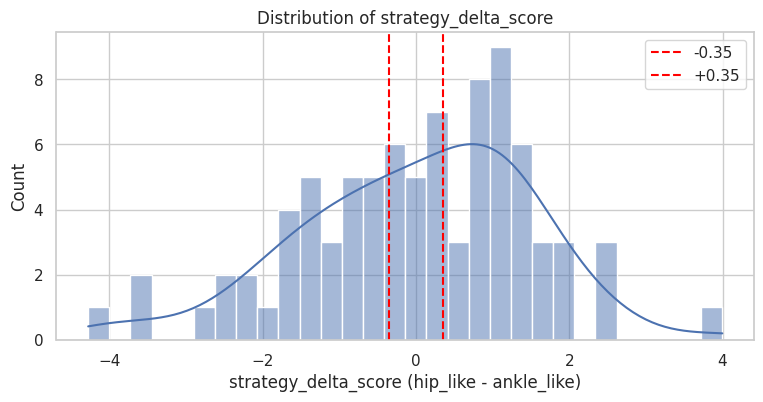

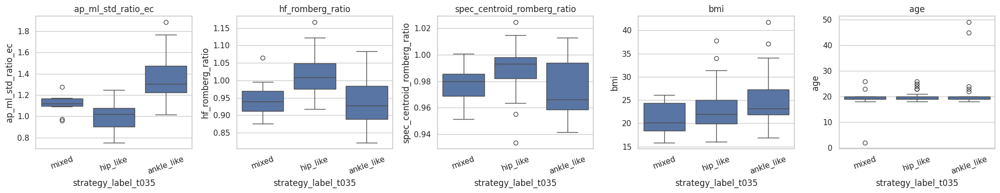


High-confidence subjects (|delta| >= 0.50): 64 / 85
High-confidence label distribution:
strategy_label_t035
hip_like      35
ankle_like    29
Name: count, dtype: int64

Saved:
/content/strategy_label_counts_by_threshold.csv
/content/strategy_label_stability.csv
/content/strategy_group_medians_t035.csv
/content/strategy_features_with_threshold_labels.csv


In [ ]:
# ============================================================
# STRATEGY LABEL ROBUSTNESS + GROUP SUMMARY + THRESHOLD SENSITIVITY
# Requires: strategy_features_df (from previous step)
# Output:
#   - Summary tables
#   - Score distribution plot
#   - Label stability across thresholds 0.25 / 0.35 / 0.50
#   - Saved CSVs
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

assert "strategy_features_df" in globals(), "strategy_features_df not found."

df = strategy_features_df.copy()

# -------------------------
# 1) Basic sanity
# -------------------------
required = ["subject_id", "strategy_delta_score"]
for c in required:
    if c not in df.columns:
        raise ValueError(f"Missing required column: {c}")

print("Subjects:", len(df))
print("Missing strategy_delta_score:", df["strategy_delta_score"].isna().sum())

# Optional: inspect EO/EC session imbalance
if {"n_EO_sessions", "n_EC_sessions"}.issubset(df.columns):
    df["eoec_session_ratio"] = (df["n_EC_sessions"] + 1e-9) / (df["n_EO_sessions"] + 1e-9)
    print("\nEO/EC session count summary:")
    display(df[["n_EO_sessions","n_EC_sessions","eoec_session_ratio"]].describe())

# -------------------------
# 2) Strategy labels at multiple thresholds
# -------------------------
def make_label(delta, thr):
    return np.where(delta > thr, "hip_like",
           np.where(delta < -thr, "ankle_like", "mixed"))

thresholds = [0.25, 0.35, 0.50]
for thr in thresholds:
    df[f"strategy_label_t{str(thr).replace('.','')}"] = make_label(df["strategy_delta_score"], thr)

# Keep canonical 0.35 as default if not already present
if "strategy_label" not in df.columns:
    df["strategy_label"] = df["strategy_label_t035"]

# Label counts by threshold
label_count_rows = []
for thr in thresholds:
    col = f"strategy_label_t{str(thr).replace('.','')}"
    vc = df[col].value_counts(dropna=False)
    for k, v in vc.items():
        label_count_rows.append({"threshold": thr, "label": k, "count": int(v), "pct": 100*v/len(df)})
label_counts_df = pd.DataFrame(label_count_rows).sort_values(["threshold","label"])
print("\nLabel counts by threshold:")
display(label_counts_df)

# -------------------------
# 3) Stability between thresholds (agreement)
# -------------------------
pairs = [(0.25,0.35), (0.35,0.50), (0.25,0.50)]
stab_rows = []
for a,b in pairs:
    ca = f"strategy_label_t{str(a).replace('.','')}"
    cb = f"strategy_label_t{str(b).replace('.','')}"
    agree = (df[ca] == df[cb]).mean()
    changed = (df[ca] != df[cb]).sum()
    stab_rows.append({
        "threshold_pair": f"{a} vs {b}",
        "agreement_rate": float(agree),
        "n_changed": int(changed)
    })
stability_df = pd.DataFrame(stab_rows)
print("\nThreshold agreement:")
display(stability_df)

# Transition table 0.35 -> 0.50
trans_35_50 = pd.crosstab(
    df["strategy_label_t035"],
    df["strategy_label_t05"],   # <- your actual column name
    normalize="index"
)
display(trans_35_50)
print("\nTransition (row-normalized): t=0.35 -> t=0.50")
display(trans_35_50)

# -------------------------
# 4) Group summaries by default label (t=0.35)
# -------------------------
group_col = "strategy_label_t035"

summary_vars = [c for c in [
    "strategy_delta_score", "strategy_confidence",
    "ankle_like_score", "hip_like_score",
    "ap_ml_std_ratio_ec", "ap_ml_range_ratio_ec",
    "hf_romberg_ratio", "spec_centroid_romberg_ratio",
    "Romberg_sway_area_ellipse95", "Romberg_mean_velocity", "Romberg_sway_path",
    "age", "height", "mass", "bmi",
    "n_EO_sessions", "n_EC_sessions"
] if c in df.columns]

group_summary = (
    df.groupby(group_col)[summary_vars]
      .agg(["count","mean","std","median"])
)

print("\nGroup summary by strategy label (t=0.35):")
display(group_summary)

# Compact median table
compact = df.groupby(group_col)[summary_vars].median().reset_index()
print("\nCompact median table:")
display(compact)

# -------------------------
# 5) Plots
# -------------------------
sns.set(style="whitegrid")

# (a) Distribution of delta score
plt.figure(figsize=(9,4))
sns.histplot(df["strategy_delta_score"].dropna(), bins=30, kde=True)
plt.axvline(-0.35, color="red", linestyle="--", label="-0.35")
plt.axvline(0.35, color="red", linestyle="--", label="+0.35")
plt.title("Distribution of strategy_delta_score")
plt.xlabel("strategy_delta_score (hip_like - ankle_like)")
plt.legend()
plt.show()

# (b) Boxplot by label for key proxies
plot_vars = [c for c in ["ap_ml_std_ratio_ec","hf_romberg_ratio","spec_centroid_romberg_ratio","bmi","age"] if c in df.columns]
if len(plot_vars) > 0:
    n = len(plot_vars)
    fig, axes = plt.subplots(1, n, figsize=(4*n,4))
    if n == 1:
        axes = [axes]
    for ax, v in zip(axes, plot_vars):
        sns.boxplot(data=df, x=group_col, y=v, ax=ax)
        ax.set_title(v)
        ax.tick_params(axis='x', rotation=20)
    plt.tight_layout()
    plt.show()

# -------------------------
# 6) Optional: confidence filter analysis
# -------------------------
# "high-confidence" labels = outside neutral zone by margin
if "strategy_confidence" in df.columns:
    high_conf = df["strategy_confidence"] >= 0.50
    print("\nHigh-confidence subjects (|delta| >= 0.50):", int(high_conf.sum()), f"/ {len(df)}")
    hc_counts = df.loc[high_conf, group_col].value_counts()
    print("High-confidence label distribution:")
    print(hc_counts)

# -------------------------
# 7) Save outputs
# -------------------------
os.makedirs("/content", exist_ok=True)
label_counts_df.to_csv("/content/strategy_label_counts_by_threshold.csv", index=False)
stability_df.to_csv("/content/strategy_label_stability.csv", index=False)
compact.to_csv("/content/strategy_group_medians_t035.csv", index=False)
df.to_csv("/content/strategy_features_with_threshold_labels.csv", index=False)

print("\nSaved:")
print("/content/strategy_label_counts_by_threshold.csv")
print("/content/strategy_label_stability.csv")
print("/content/strategy_group_medians_t035.csv")
print("/content/strategy_features_with_threshold_labels.csv")

In [ ]:
# ============================================================
# AGE-ONLY CHECK: "Postural sway increases with age"
# Requires: strategy_features_df with age column
# ============================================================

import numpy as np
import pandas as pd
from scipy.stats import spearmanr
import statsmodels.formula.api as smf

assert "strategy_features_df" in globals(), "strategy_features_df not found."
df = strategy_features_df.copy()

if "age" not in df.columns:
    raise ValueError("No age column found.")

# Outcomes reflecting instability (higher = worse)
outcomes = [c for c in [
    "sway_area_ellipse95__EC",
    "sway_path__EC",
    "mean_velocity__EC",
    "Romberg_sway_area_ellipse95",
    "Romberg_sway_path",
    "Romberg_mean_velocity"
] if c in df.columns]

print("Outcomes tested:", outcomes)

# -------------------------
# 1) Spearman correlations (age vs outcome)
# -------------------------
rows = []
for y in outcomes:
    sub = df[["age", y]].dropna()
    if len(sub) >= 20:
        rho, p = spearmanr(sub["age"], sub[y])
        rows.append({
            "outcome": y,
            "n": len(sub),
            "spearman_rho": float(rho),
            "p_value": float(p),
            "direction_supports_hypothesis": bool(rho > 0)  # expecting positive
        })

age_corr_df = pd.DataFrame(rows)
if len(age_corr_df):
    age_corr_df = age_corr_df.sort_values("p_value")

print("\n=== Age association (Spearman) ===")
display(age_corr_df)

# -------------------------
# 2) Adjusted model: log(outcome) ~ age + bmi (if bmi exists)
# -------------------------
model_rows = []
for y in outcomes:
    cols = ["age", y] + (["bmi"] if "bmi" in df.columns else [])
    sub = df[cols].dropna().copy()
    sub = sub[sub[y] > 0]
    if len(sub) < 30:
        continue

    formula = f"np.log({y}) ~ age" + (" + bmi" if "bmi" in sub.columns else "")
    fit = smf.ols(formula, data=sub).fit()

    model_rows.append({
        "outcome": y,
        "n": int(fit.nobs),
        "R2": float(fit.rsquared),
        "age_beta_log": float(fit.params.get("age", np.nan)),
        "age_p": float(fit.pvalues.get("age", np.nan)),
        "bmi_included": ("bmi" in sub.columns)
    })

age_model_df = pd.DataFrame(model_rows)
if len(age_model_df):
    age_model_df = age_model_df.sort_values("age_p")

print("\n=== Models: log(outcome) ~ age (+ bmi) ===")
display(age_model_df)

# -------------------------
# 3) Save
# -------------------------
age_corr_df.to_csv("/content/age_association_sway.csv", index=False)
age_model_df.to_csv("/content/age_models_sway.csv", index=False)

print("\nSaved:")
print("/content/age_association_sway.csv")
print("/content/age_models_sway.csv")

Outcomes tested: ['sway_area_ellipse95__EC', 'sway_path__EC', 'mean_velocity__EC', 'Romberg_sway_area_ellipse95', 'Romberg_sway_path', 'Romberg_mean_velocity']

=== Age association (Spearman) ===


,outcome,n,spearman_rho,p_value,direction_supports_hypothesis
5,Romberg_mean_velocity,85,0.159143,0.145728,True
4,Romberg_sway_path,85,0.159143,0.145728,True
0,sway_area_ellipse95__EC,85,0.125227,0.253479,True
3,Romberg_sway_area_ellipse95,85,0.102941,0.348496,True
2,mean_velocity__EC,85,-0.054272,0.621789,False
1,sway_path__EC,85,-0.054272,0.621789,False



=== Models: log(outcome) ~ age (+ bmi) ===


,outcome,n,R2,age_beta_log,age_p,bmi_included
2,mean_velocity__EC,85,0.017806,-0.008197,0.226578,True
1,sway_path__EC,85,0.017806,-0.008197,0.226578,True
0,sway_area_ellipse95__EC,85,0.013107,-0.008550,0.548868,True
4,Romberg_sway_path,85,0.005316,0.001266,0.787356,True
5,Romberg_mean_velocity,85,0.005316,0.001266,0.787356,True
3,Romberg_sway_area_ellipse95,85,0.009379,-0.000255,0.982187,True



Saved:
/content/age_association_sway.csv
/content/age_models_sway.csv


“In this cohort (n=85), age was not significantly associated with EC sway metrics or Romberg ratios (all p>0.14). BMI-adjusted linear models also showed negligible age effects (all p>0.22, R²<0.02).  
Thus, the expected age-related increase in postural sway was not observable in this sample.”

Using subject_id=2 | EO=50 EC=49
No per-trial raw arrays found (cop_x/cop_y). Using feature-level fluctuation plots instead.


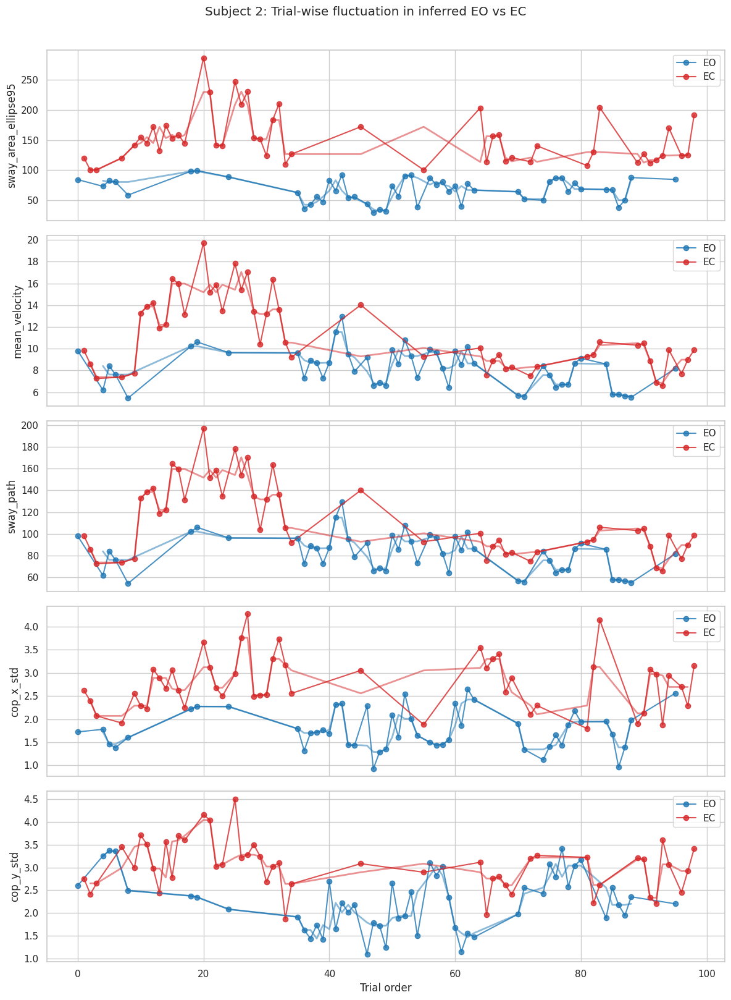

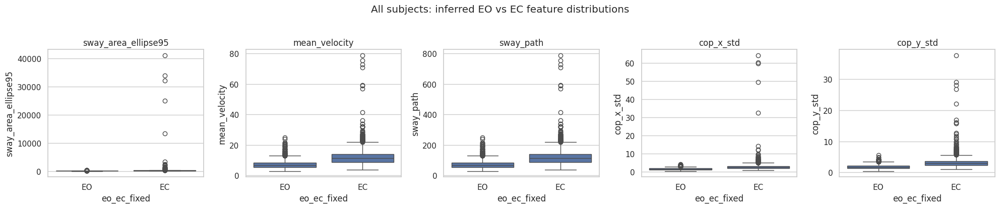

In [ ]:
# ============================================================
# PLOTS: FLUCTUATIONS IN INFERRED EO vs EC TRIALS
# Requires: eoec_df (with subject_id, eo_ec_fixed)
# Optional raw trajectory columns: cop_x, cop_y (array/list per row) OR timeseries columns
# Fallback: trial-level feature fluctuation plots
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

assert "eoec_df" in globals(), "eoec_df not found. Build it first."
df = eoec_df.copy()

# Standardize label
df["eo_ec_fixed"] = df["eo_ec_fixed"].astype(str).str.upper().str.strip()
df = df[df["eo_ec_fixed"].isin(["EO","EC"])].copy()

# Pick subject with both classes and enough trials
counts = df.groupby(["subject_id","eo_ec_fixed"]).size().unstack(fill_value=0)
valid_subjects = counts[(counts.get("EO",0) >= 5) & (counts.get("EC",0) >= 5)].index.tolist()

if len(valid_subjects) == 0:
    raise ValueError("No subject has >=5 EO and >=5 EC inferred trials.")

sid = valid_subjects[0]   # change index if you want another subject
sub = df[df["subject_id"] == sid].copy().reset_index(drop=True)

print(f"Using subject_id={sid} | EO={sum(sub.eo_ec_fixed=='EO')} EC={sum(sub.eo_ec_fixed=='EC')}")

sns.set(style="whitegrid")

# ------------------------------------------------------------
# A) If raw arrays exist in columns cop_x / cop_y, plot trajectories
# ------------------------------------------------------------
has_array_xy = ("cop_x" in sub.columns and "cop_y" in sub.columns)

def is_array_like(x):
    return isinstance(x, (list, tuple, np.ndarray))

if has_array_xy and sub["cop_x"].apply(is_array_like).any() and sub["cop_y"].apply(is_array_like).any():
    # pick up to 3 EO and 3 EC trials
    eo_idx = sub.index[sub["eo_ec_fixed"]=="EO"][:3].tolist()
    ec_idx = sub.index[sub["eo_ec_fixed"]=="EC"][:3].tolist()
    pick_idx = eo_idx + ec_idx

    fig, axes = plt.subplots(2, 3, figsize=(15, 8))
    axes = axes.flatten()

    for ax_i, idx in enumerate(pick_idx[:6]):
        row = sub.loc[idx]
        x = np.asarray(row["cop_x"], dtype=float)
        y = np.asarray(row["cop_y"], dtype=float)
        n = min(len(x), len(y))
        x, y = x[:n], y[:n]

        color = "tab:blue" if row["eo_ec_fixed"]=="EO" else "tab:red"
        ax = axes[ax_i]
        ax.plot(x, y, color=color, alpha=0.9, lw=1)
        ax.set_title(f"Trial {idx} | {row['eo_ec_fixed']}")
        ax.set_xlabel("CoP ML (x)")
        ax.set_ylabel("CoP AP (y)")
        ax.axis("equal")

    for k in range(len(pick_idx), 6):
        axes[k].axis("off")

    plt.suptitle(f"Subject {sid}: CoP Trajectory Fluctuations (inferred EO vs EC)", y=1.02)
    plt.tight_layout()
    plt.show()

    # radial over time plot
    plt.figure(figsize=(12,4))
    for idx in eo_idx[:2]:
        row = sub.loc[idx]
        x = np.asarray(row["cop_x"], dtype=float)
        y = np.asarray(row["cop_y"], dtype=float)
        n = min(len(x), len(y))
        r = np.sqrt(x[:n]**2 + y[:n]**2)
        plt.plot(r, color="tab:blue", alpha=0.8, lw=1, label="EO" if idx==eo_idx[0] else None)

    for idx in ec_idx[:2]:
        row = sub.loc[idx]
        x = np.asarray(row["cop_x"], dtype=float)
        y = np.asarray(row["cop_y"], dtype=float)
        n = min(len(x), len(y))
        r = np.sqrt(x[:n]**2 + y[:n]**2)
        plt.plot(r, color="tab:red", alpha=0.8, lw=1, label="EC" if idx==ec_idx[0] else None)

    plt.title(f"Subject {sid}: Radial displacement fluctuation over time")
    plt.xlabel("Sample index")
    plt.ylabel("Radial CoP displacement")
    plt.legend()
    plt.tight_layout()
    plt.show()

else:
    print("No per-trial raw arrays found (cop_x/cop_y). Using feature-level fluctuation plots instead.")

# ------------------------------------------------------------
# B) Feature fluctuation across trial index (always useful)
# ------------------------------------------------------------
sub = sub.reset_index(drop=True)
sub["trial_order"] = np.arange(len(sub))

feat_candidates = ["sway_area_ellipse95", "mean_velocity", "sway_path", "cop_x_std", "cop_y_std"]
feat_cols = [c for c in feat_candidates if c in sub.columns]

if len(feat_cols) == 0:
    raise ValueError("No fluctuation feature columns found to plot.")

fig, axes = plt.subplots(len(feat_cols), 1, figsize=(12, 3.2*len(feat_cols)), sharex=True)
if len(feat_cols) == 1:
    axes = [axes]

for ax, f in zip(axes, feat_cols):
    # line per condition
    d_eo = sub[sub["eo_ec_fixed"]=="EO"]
    d_ec = sub[sub["eo_ec_fixed"]=="EC"]

    ax.plot(d_eo["trial_order"], d_eo[f], 'o-', color="tab:blue", alpha=0.8, label="EO")
    ax.plot(d_ec["trial_order"], d_ec[f], 'o-', color="tab:red", alpha=0.8, label="EC")

    # light smoothing (rolling median)
    if len(d_eo) >= 3:
        eo_sm = d_eo.set_index("trial_order")[f].rolling(3, center=True).median()
        ax.plot(eo_sm.index, eo_sm.values, color="tab:blue", lw=2, alpha=0.5)
    if len(d_ec) >= 3:
        ec_sm = d_ec.set_index("trial_order")[f].rolling(3, center=True).median()
        ax.plot(ec_sm.index, ec_sm.values, color="tab:red", lw=2, alpha=0.5)

    ax.set_ylabel(f)
    ax.legend(loc="best")

axes[-1].set_xlabel("Trial order")
plt.suptitle(f"Subject {sid}: Trial-wise fluctuation in inferred EO vs EC", y=1.01)
plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# C) Group-level boxplots across all subjects
# ------------------------------------------------------------
plot_df = df.copy()
plot_feats = [c for c in ["sway_area_ellipse95", "mean_velocity", "sway_path", "cop_x_std", "cop_y_std"] if c in plot_df.columns]

fig, axes = plt.subplots(1, len(plot_feats), figsize=(4*len(plot_feats), 4))
if len(plot_feats) == 1:
    axes = [axes]

for ax, f in zip(axes, plot_feats):
    sns.boxplot(data=plot_df, x="eo_ec_fixed", y=f, order=["EO","EC"], ax=ax)
    ax.set_title(f)

plt.suptitle("All subjects: inferred EO vs EC feature distributions", y=1.03)
plt.tight_layout()
plt.show()

Missing subject_id after file_id->metadata_cleaned merge: 0.00%
trial_raw shape: (997, 8)


/tmp/ipykernel_8760/1627259016.py:86: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(trial_features)


,file_id,subject_id,trial,n_samples,sway_path_raw,mean_step_raw,radial_std_raw,sway_area95_raw
0,100_proba_free_1,100,1,7468.0,288.432758,0.038628,2.233882,180.581710
1,100_proba_free_10,100,10,7503.0,226.854613,0.030239,1.468180,76.266871
2,100_proba_free_11,100,11,7511.0,238.417402,0.031747,1.969925,164.092805
3,100_proba_free_2,100,2,7504.0,329.772373,0.043952,2.382518,197.487533
4,100_proba_free_3,100,3,7504.0,341.369363,0.045498,2.740283,201.378754


Merged rows: 1436
eo_label
EO    722
EC    714
Name: count, dtype: int64
Subjects plotted: [2, 7, 8, 9]


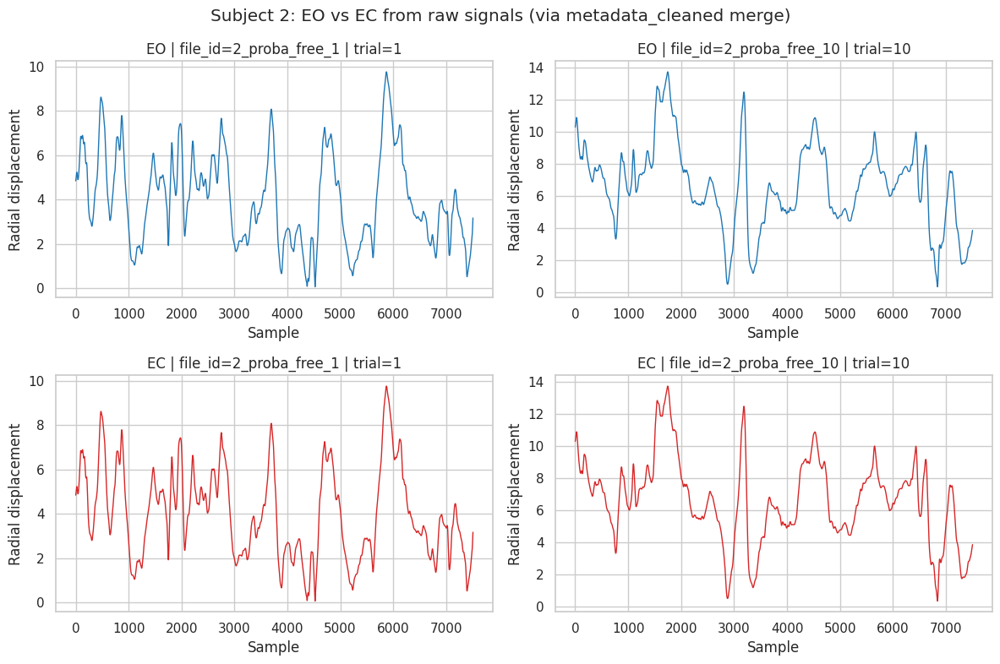


Subject 2 numeric summary:


,sway_area95_raw,sway_path_raw,mean_step_raw,radial_std_raw
eo_label,,,,
EC,308.554819,314.243713,0.041877,2.719959
EO,238.745611,279.227514,0.037213,2.390786


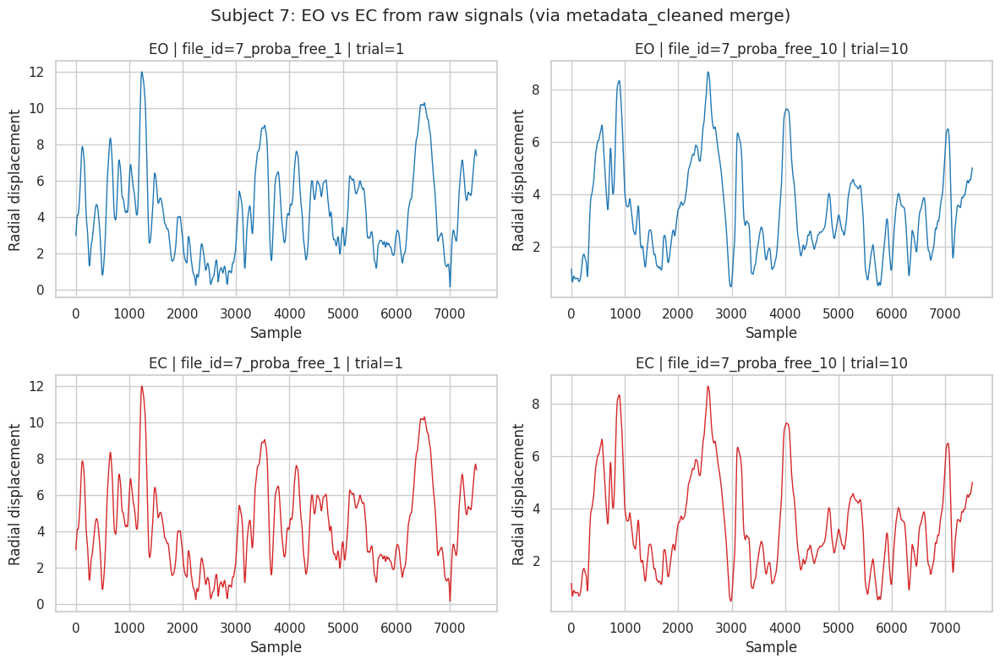


Subject 7 numeric summary:


,sway_area95_raw,sway_path_raw,mean_step_raw,radial_std_raw
eo_label,,,,
EC,219.547632,269.828418,0.035958,2.674397
EO,187.840486,234.164497,0.031205,2.417554


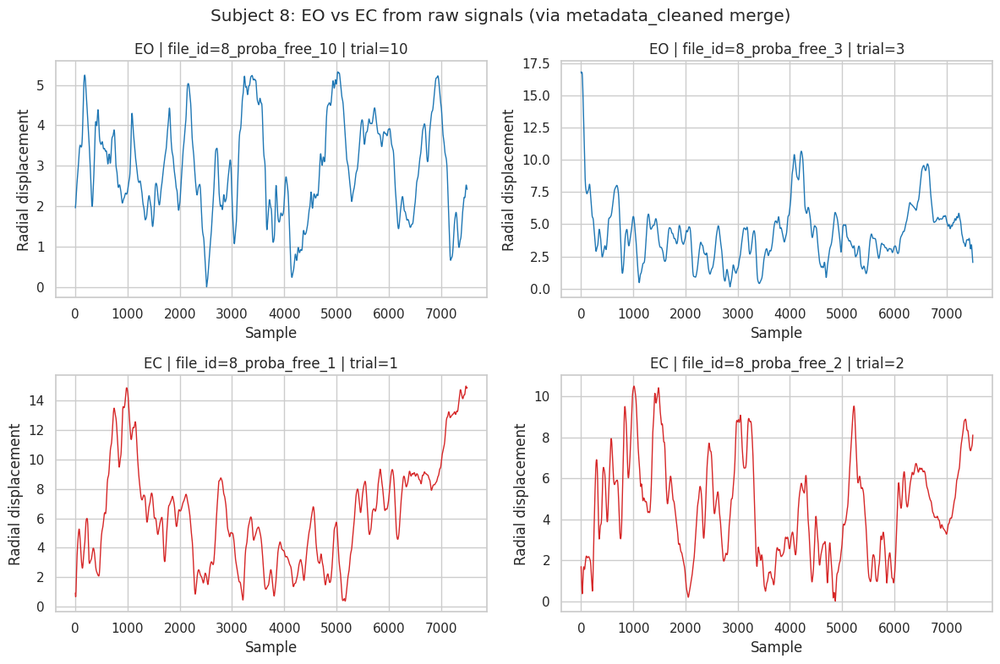


Subject 8 numeric summary:


,sway_area95_raw,sway_path_raw,mean_step_raw,radial_std_raw
eo_label,,,,
EC,271.439479,265.117030,0.035332,2.666446
EO,163.785555,202.435929,0.026981,1.973336


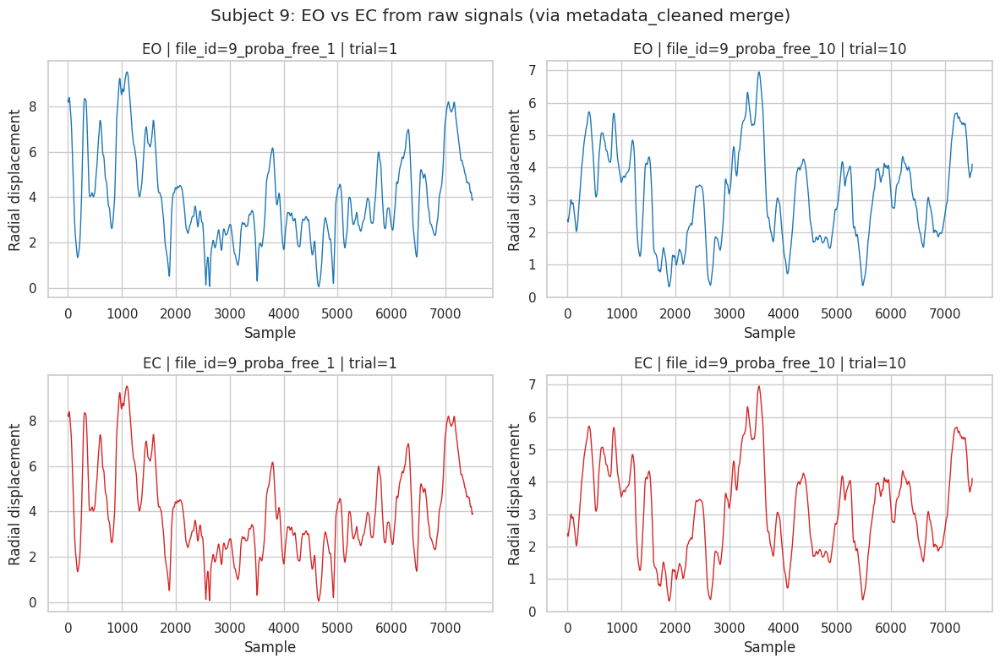


Subject 9 numeric summary:


,sway_area95_raw,sway_path_raw,mean_step_raw,radial_std_raw
eo_label,,,,
EC,180.768106,234.240525,0.031216,2.296265
EO,131.030573,198.383825,0.026439,1.806161


In [ ]:
# ============================================================
# FIX: attach subject/trial to signals_cleaned via dataset.db
# then compare eoec_df labels vs raw-signal fluctuations
# ============================================================

import sqlite3
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

assert "signals_cleaned" in globals(), "signals_cleaned not found"
assert "eoec_df" in globals(), "eoec_df not found"

DB_PATH = "/content/dataset.db"   # adjust if needed
S = signals_cleaned.copy()
E = eoec_df.copy()

# ---------- 1) Ensure file_id exists in signals_cleaned ----------
if "file_id" not in S.columns:
    raise ValueError("signals_cleaned must contain file_id (per schema).")

# ---------- 2) Pull metadata_cleaned mapping from DB ----------
conn = sqlite3.connect(DB_PATH)
meta = pd.read_sql_query("""
    SELECT file_id, subject_id, condition, trial, duration_samples
    FROM metadata_cleaned
""", conn)
conn.close()

# ---------- 3) Merge mapping into signals_cleaned ----------
S2 = S.merge(meta, on="file_id", how="left")
miss = S2["subject_id"].isna().mean()
print(f"Missing subject_id after file_id->metadata_cleaned merge: {miss:.2%}")

# keep mapped rows only
S2 = S2.dropna(subset=["subject_id"]).copy()
S2["subject_id"] = S2["subject_id"].astype(int)

# ---------- 4) Build per-trial raw features from sample-level signals ----------
# signals_cleaned is sample-level (sample_num, cop_x, cop_y), so aggregate by file_id
req = ["file_id", "subject_id", "trial", "cop_x", "cop_y"]
for c in req:
    if c not in S2.columns:
        raise ValueError(f"Missing required column in merged signals: {c}")

# sort by sample number if present
if "sample_num" in S2.columns:
    S2 = S2.sort_values(["file_id", "sample_num"]).copy()

def trial_features(g):
    x = g["cop_x"].to_numpy(dtype=float)
    y = g["cop_y"].to_numpy(dtype=float)
    n = min(len(x), len(y))
    if n < 20:
        return pd.Series({
            "n_samples": n,
            "sway_path_raw": np.nan,
            "mean_step_raw": np.nan,
            "radial_std_raw": np.nan,
            "sway_area95_raw": np.nan
        })
    x, y = x[:n], y[:n]
    x = x - np.nanmean(x)
    y = y - np.nanmean(y)

    dx = np.diff(x)
    dy = np.diff(y)
    step = np.sqrt(dx*dx + dy*dy)
    r = np.sqrt(x*x + y*y)

    # ellipse area proxy
    cov = np.cov(np.vstack([x, y]))
    eig = np.clip(np.linalg.eigvalsh(cov), 0, None)
    area95 = np.pi * 5.991 * np.sqrt(eig[0]) * np.sqrt(eig[1])

    return pd.Series({
        "n_samples": n,
        "sway_path_raw": float(np.nansum(step)),
        "mean_step_raw": float(np.nanmean(step)),
        "radial_std_raw": float(np.nanstd(r)),
        "sway_area95_raw": float(area95)
    })

trial_raw = (
    S2.groupby(["file_id", "subject_id", "trial"], as_index=False)
      .apply(trial_features)
      .reset_index(drop=True)
)

print("trial_raw shape:", trial_raw.shape)
display(trial_raw.head())

# ---------- 5) Normalize eoec_df keys/labels ----------
# find columns in eoec_df
def find_col(df, candidates):
    cols = {c.lower(): c for c in df.columns}
    for c in candidates:
        if c.lower() in cols:
            return cols[c.lower()]
    for c0 in df.columns:
        lc = c0.lower()
        for c in candidates:
            if c.lower() in lc:
                return c0
    return None

e_sub = find_col(E, ["subject_id","subject","participant_id"])
e_trial = find_col(E, ["trial","trial_id"])
e_file = find_col(E, ["file_id"])
e_lab = find_col(E, ["eo_ec_fixed","eo_ec","eye_group","eye_state","vision","eyes"])

if e_lab is None:
    raise ValueError("No EO/EC label column found in eoec_df.")

E2 = E.copy()
if e_sub is not None and e_sub != "subject_id":
    E2 = E2.rename(columns={e_sub: "subject_id"})
if e_trial is not None and e_trial != "trial":
    E2 = E2.rename(columns={e_trial: "trial"})
if e_file is not None and e_file != "file_id":
    E2 = E2.rename(columns={e_file: "file_id"})
E2 = E2.rename(columns={e_lab: "eo_label"})

# Safe label normalization (no dtype promotion error)
E2["eo_label"] = E2["eo_label"].astype(str).str.upper().str.strip()

E2["eo_label_norm"] = None
E2.loc[E2["eo_label"].str.contains(r"EC|CLOSED", regex=True, na=False), "eo_label_norm"] = "EC"
E2.loc[E2["eo_label"].str.contains(r"EO|OPEN",   regex=True, na=False), "eo_label_norm"] = "EO"

E2 = E2.dropna(subset=["eo_label_norm"]).copy()
E2 = E2.drop(columns=["eo_label"]).rename(columns={"eo_label_norm": "eo_label"})

# ---------- 6) Merge eoec labels with raw trial features ----------
if "file_id" in E2.columns:
    M = trial_raw.merge(E2[["file_id","eo_label"]].drop_duplicates(), on="file_id", how="inner")
elif "subject_id" in E2.columns and "trial" in E2.columns:
    E2["subject_id"] = E2["subject_id"].astype(int)
    M = trial_raw.merge(E2[["subject_id","trial","eo_label"]].drop_duplicates(),
                        on=["subject_id","trial"], how="inner")
else:
    raise ValueError("eoec_df must contain either file_id OR (subject_id and trial) for merge.")

print("Merged rows:", len(M))
print(M["eo_label"].value_counts())

# ---------- 7) Plot a small subject sample ----------
ct = M.groupby(["subject_id","eo_label"]).size().unstack(fill_value=0)
valid_subjects = ct[(ct.get("EO",0) >= 2) & (ct.get("EC",0) >= 2)].index.tolist()[:4]

print("Subjects plotted:", valid_subjects)

for sid in valid_subjects:
    G = M[M["subject_id"] == sid].copy()

    # choose 2 EO + 2 EC trials
    eo = G[G["eo_label"]=="EO"].head(2)
    ec = G[G["eo_label"]=="EC"].head(2)
    P = pd.concat([eo, ec], axis=0)

    # Pull actual raw radial traces for plotting
    fig, axes = plt.subplots(2,2, figsize=(12,8))
    axes = axes.flatten()

    for i, (_, row) in enumerate(P.iterrows()):
        g = S2[S2["file_id"] == row["file_id"]].copy()
        if "sample_num" in g.columns:
            g = g.sort_values("sample_num")
        x = g["cop_x"].to_numpy(dtype=float)
        y = g["cop_y"].to_numpy(dtype=float)
        n = min(len(x), len(y))
        x, y = x[:n], y[:n]
        x = x - np.nanmean(x); y = y - np.nanmean(y)
        r = np.sqrt(x*x + y*y)

        color = "tab:blue" if row["eo_label"]=="EO" else "tab:red"
        axes[i].plot(r, color=color, lw=1)
        axes[i].set_title(f"{row['eo_label']} | file_id={row['file_id']} | trial={row['trial']}")
        axes[i].set_xlabel("Sample")
        axes[i].set_ylabel("Radial displacement")

    for j in range(len(P), 4):
        axes[j].axis("off")

    plt.suptitle(f"Subject {sid}: EO vs EC from raw signals (via metadata_cleaned merge)")
    plt.tight_layout()
    plt.show()

    # numeric summary
    print(f"\nSubject {sid} numeric summary:")
    display(
        G.groupby("eo_label")[["sway_area95_raw","sway_path_raw","mean_step_raw","radial_std_raw"]]
         .mean()
    )

/tmp/ipykernel_8760/4005837100.py:87: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  trial_df = trial_df.groupby("subject_id", group_keys=False).apply(label_proxy).reset_index(drop=True)


Subjects for verification: [2, 7, 8, 9]


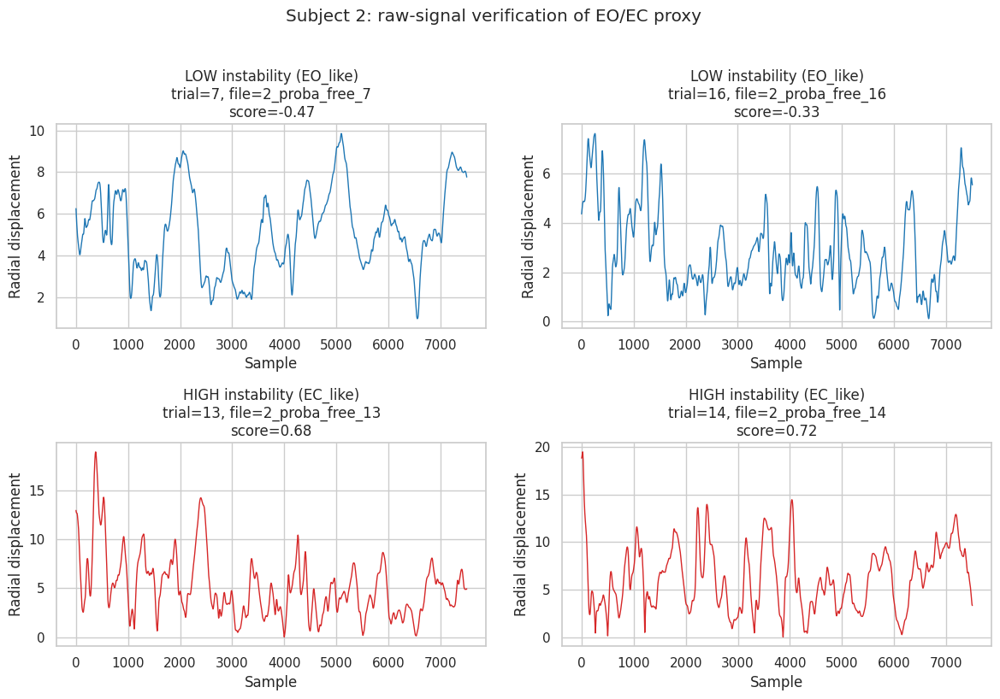


Subject 2 summary (mean):


,path,mean_step,rad_std,area95,instability_score
proxy,,,,,
EC_like,344.850441,0.045958,2.863131,321.593156,0.213675
EO_like,248.601435,0.033134,2.161694,218.729874,-0.271856


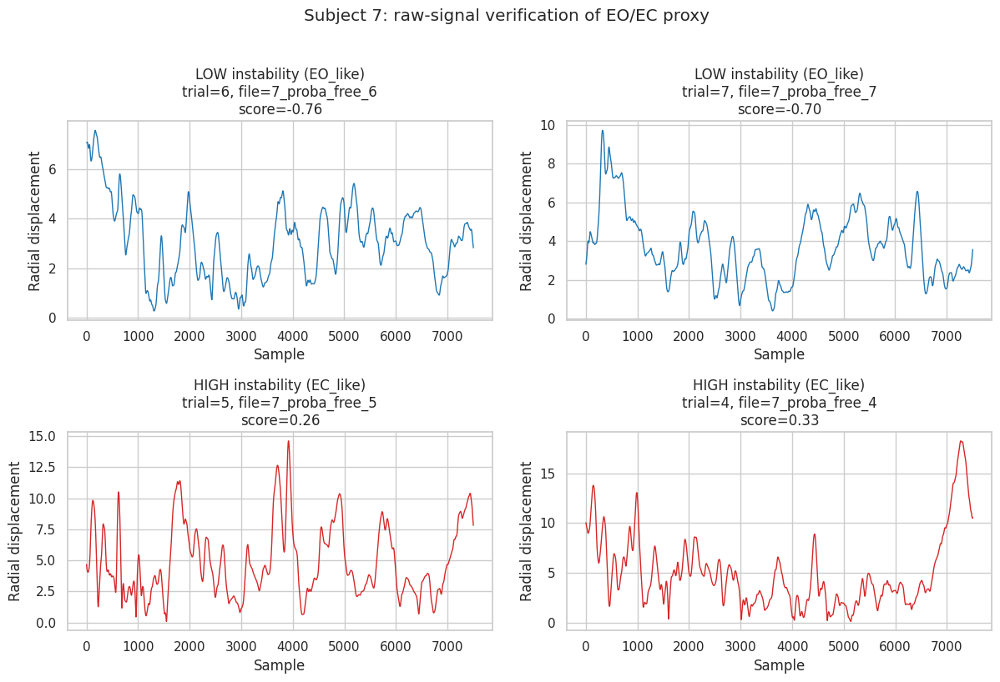


Subject 7 summary (mean):


,path,mean_step,rad_std,area95,instability_score
proxy,,,,,
EC_like,317.489309,0.042313,2.947400,232.692206,0.112417
EO_like,175.161748,0.023341,1.982357,163.782584,-0.583423


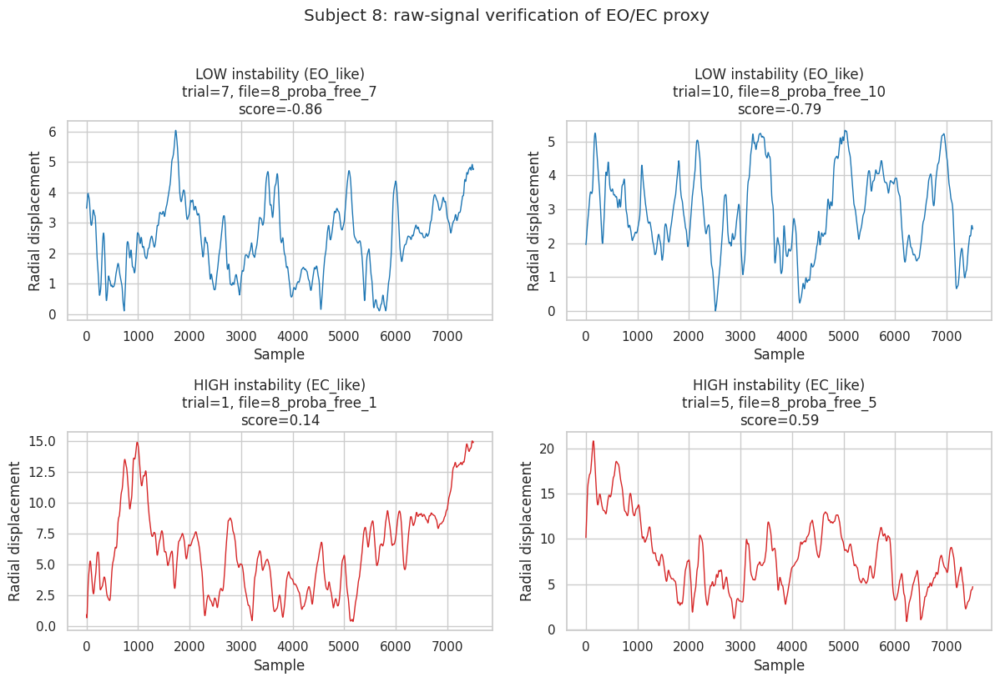


Subject 8 summary (mean):


,path,mean_step,rad_std,area95,instability_score
proxy,,,,,
EC_like,318.295780,0.042419,3.060709,361.176198,0.150099
EO_like,164.761651,0.021960,1.692425,103.070783,-0.675982


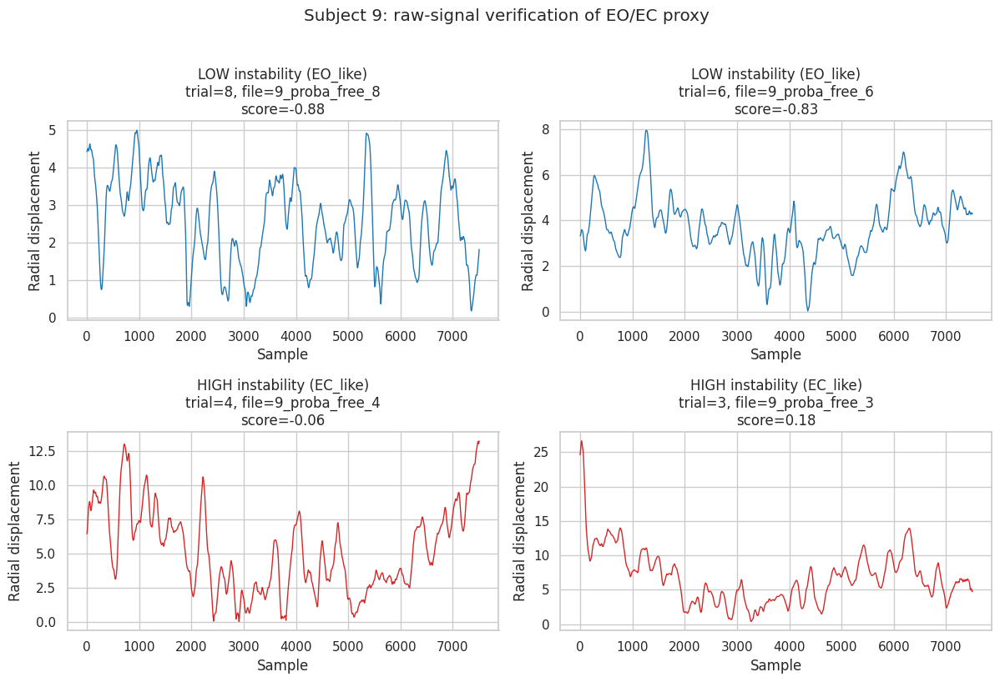


Subject 9 summary (mean):


,path,mean_step,rad_std,area95,instability_score
proxy,,,,,
EC_like,265.565805,0.035391,2.684904,221.146133,-0.125577
EO_like,150.106748,0.020007,1.341510,79.213052,-0.789366



Proxy vs eoec_df label agreement: 0.000 (n=1436)


In [ ]:
# ============================================================
# VERIFY EO/EC PROXY FROM RAW SIGNALS (within-subject)
# Goal: show LOW-instability vs HIGH-instability trials directly
# ============================================================

import sqlite3
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

assert "signals_cleaned" in globals(), "signals_cleaned not found"

DB_PATH = "/content/dataset.db"
S = signals_cleaned.copy()

# ---------- 1) Attach subject_id/trial/condition via metadata_cleaned ----------
conn = sqlite3.connect(DB_PATH)
meta = pd.read_sql_query("""
    SELECT file_id, subject_id, condition, trial
    FROM metadata_cleaned
""", conn)
conn.close()

if "file_id" not in S.columns:
    raise ValueError("signals_cleaned must contain file_id")

D = S.merge(meta, on="file_id", how="left").dropna(subset=["subject_id"]).copy()
D["subject_id"] = D["subject_id"].astype(int)
D["condition"] = D["condition"].astype(str).str.lower().str.strip()

# Use free trials for EO/EC proxy (same logic as before)
D = D[D["condition"] == "free"].copy()
if len(D) == 0:
    raise ValueError("No free-condition rows after merge.")

# ---------- 2) Compute trial-level raw instability metrics ----------
if "sample_num" in D.columns:
    D = D.sort_values(["file_id", "sample_num"])

def trial_metrics(g):
    x = g["cop_x"].to_numpy(float)
    y = g["cop_y"].to_numpy(float)
    n = min(len(x), len(y))
    if n < 100:
        return pd.Series({"n": n, "path": np.nan, "mean_step": np.nan, "rad_std": np.nan, "area95": np.nan})

    x = x[:n] - np.nanmean(x[:n])
    y = y[:n] - np.nanmean(y[:n])

    dx, dy = np.diff(x), np.diff(y)
    step = np.sqrt(dx*dx + dy*dy)
    r = np.sqrt(x*x + y*y)

    cov = np.cov(np.vstack([x, y]))
    ev = np.clip(np.linalg.eigvalsh(cov), 0, None)
    area95 = np.pi * 5.991 * np.sqrt(ev[0]) * np.sqrt(ev[1])

    return pd.Series({
        "n": n,
        "path": float(np.nansum(step)),
        "mean_step": float(np.nanmean(step)),
        "rad_std": float(np.nanstd(r)),
        "area95": float(area95)
    })

trial_df = (
    D.groupby(["subject_id", "file_id", "trial"], as_index=False)
     .apply(trial_metrics, include_groups=False)
     .reset_index(drop=True)
)

# composite instability score (z-mean within whole dataset)
for c in ["path","mean_step","rad_std","area95"]:
    mu, sd = trial_df[c].mean(), trial_df[c].std(ddof=0)
    trial_df[f"z_{c}"] = (trial_df[c] - mu) / (sd + 1e-9)

trial_df["instability_score"] = trial_df[[f"z_{c}" for c in ["path","mean_step","rad_std","area95"]]].mean(axis=1)

# ---------- 3) Proxy label within each subject ----------
# EO_like = lower half instability, EC_like = upper half instability
def label_proxy(g):
    med = g["instability_score"].median()
    g = g.copy()
    g["proxy"] = np.where(g["instability_score"] <= med, "EO_like", "EC_like")
    return g

trial_df = trial_df.groupby("subject_id", group_keys=False).apply(label_proxy).reset_index(drop=True)

# ---------- 4) Pick subjects with enough trials ----------
cnt = trial_df.groupby(["subject_id","proxy"]).size().unstack(fill_value=0)
subjects = cnt[(cnt.get("EO_like",0) >= 4) & (cnt.get("EC_like",0) >= 4)].index.tolist()[:4]
if len(subjects) == 0:
    raise ValueError("Need subjects with at least 4 EO_like and 4 EC_like trials.")

print("Subjects for verification:", subjects)

# ---------- 5) Plot RAW radial traces: 2 lowest vs 2 highest instability per subject ----------
def get_trace(file_id):
    g = D[D["file_id"] == file_id].copy()
    if "sample_num" in g.columns:
        g = g.sort_values("sample_num")
    x = g["cop_x"].to_numpy(float)
    y = g["cop_y"].to_numpy(float)
    n = min(len(x), len(y))
    x = x[:n] - np.nanmean(x[:n])
    y = y[:n] - np.nanmean(y[:n])
    r = np.sqrt(x*x + y*y)
    return r

for sid in subjects:
    G = trial_df[trial_df["subject_id"] == sid].sort_values("instability_score")
    low2 = G.head(2).copy()   # most stable -> EO_like candidate
    high2 = G.tail(2).copy()  # most unstable -> EC_like candidate
    P = pd.concat([low2, high2], axis=0)

    fig, axes = plt.subplots(2, 2, figsize=(12, 8))
    axes = axes.flatten()

    for i, (_, row) in enumerate(P.iterrows()):
        r = get_trace(row["file_id"])
        is_low = i < 2
        color = "tab:blue" if is_low else "tab:red"
        tag = "LOW instability (EO_like)" if is_low else "HIGH instability (EC_like)"
        axes[i].plot(r, color=color, lw=1)
        axes[i].set_title(
            f"{tag}\ntrial={int(row['trial'])}, file={row['file_id']}\nscore={row['instability_score']:.2f}"
        )
        axes[i].set_xlabel("Sample")
        axes[i].set_ylabel("Radial displacement")

    plt.suptitle(f"Subject {sid}: raw-signal verification of EO/EC proxy", y=1.02)
    plt.tight_layout()
    plt.show()

    # numeric check for this subject
    sub = trial_df[trial_df["subject_id"] == sid]
    print(f"\nSubject {sid} summary (mean):")
    display(sub.groupby("proxy")[["path","mean_step","rad_std","area95","instability_score"]].mean())

# ---------- 6) Optional: agreement with your eoec_df labels (if available by file_id/trial) ----------
if "eoec_df" in globals():
    E = eoec_df.copy()
    # detect columns
    cols = {c.lower(): c for c in E.columns}
    e_file = cols.get("file_id", None)
    e_trial = cols.get("trial", cols.get("trial_id", None))
    e_sub   = cols.get("subject_id", None)
    e_lab   = cols.get("eo_ec_fixed", cols.get("eo_ec", cols.get("eye_group", None)))

    if e_lab is not None:
        X = E.copy()
        if e_file: X = X.rename(columns={e_file:"file_id"})
        if e_trial and e_trial in X.columns: X = X.rename(columns={e_trial:"trial"})
        if e_sub and e_sub in X.columns: X = X.rename(columns={e_sub:"subject_id"})
        X = X.rename(columns={e_lab:"label"})
        X["label"] = X["label"].astype(str).str.upper().str.strip()
        # safe object-typed assignment (no DTypePromotionError)
        X["label_norm"] = None
        X.loc[X["label"].str.contains(r"EC|CLOSED", regex=True, na=False), "label_norm"] = "EC_like"
        X.loc[X["label"].str.contains(r"EO|OPEN",   regex=True, na=False), "label_norm"] = "EO_like"
        X = X.dropna(subset=["label"])

        keys = [k for k in ["file_id","subject_id","trial"] if k in X.columns and k in trial_df.columns]
        if keys:
            C = trial_df.merge(X[keys+["label"]].drop_duplicates(), on=keys, how="inner")
            if len(C):
                acc = (C["proxy"] == C["label"]).mean()
                print(f"\nProxy vs eoec_df label agreement: {acc:.3f} (n={len(C)})")

In [ ]:
# Save earlier sway-based proxy labels (if trial_df exists from earlier method)
if "trial_df" in globals() and "proxy" in trial_df.columns:
    out = trial_df.copy()
    out = out.rename(columns={"proxy": "eoec_sway_proxy"})
    keep = [c for c in ["subject_id","file_id","trial","instability_score","eoec_sway_proxy"] if c in out.columns]
    out[keep].to_csv("/content/eoec_proxy_labels_sway_based.csv", index=False)
    print("Saved: /content/eoec_proxy_labels_sway_based.csv")
else:
    print("trial_df with 'proxy' not found; skip sway-based save.")

Saved: /content/eoec_proxy_labels_sway_based.csv


In [ ]:
trial_df

,subject_id,file_id,trial,n,path,mean_step,rad_std,area95,z_path,z_mean_step,z_rad_std,z_area95,instability_score,proxy
0,2,2_proba_free_1,1,7507.0,246.742584,0.032873,2.044217,191.091334,-0.362674,-0.363289,-0.400849,-0.077709,-0.301130,EO_like
1,2,2_proba_free_10,10,7504.0,236.152163,0.031474,2.593793,327.897047,-0.442296,-0.442179,-0.055318,-0.005872,-0.236416,EO_like
2,2,2_proba_free_11,11,7504.0,397.519805,0.052981,3.265094,389.394891,0.770918,0.771187,0.366744,0.026421,0.483818,EC_like
3,2,2_proba_free_12,12,7505.0,401.802091,0.053545,2.463564,207.465413,0.803114,0.802984,-0.137196,-0.069111,0.349948,EC_like
4,2,2_proba_free_13,13,7508.0,454.471711,0.060540,3.189184,342.633573,1.199101,1.197603,0.319018,0.001866,0.679397,EC_like
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
929,129,129_proba_free_5,5,7508.0,381.913712,0.050874,2.735682,341.854221,0.653586,0.652311,0.033891,0.001457,0.335311,EO_like
930,129,129_proba_free_6,6,7503.0,384.256293,0.051221,3.640916,594.124789,0.671199,0.671841,0.603032,0.133925,0.519999,EO_like
931,129,129_proba_free_7,7,7503.0,423.092759,0.056397,4.366432,802.397007,0.963184,0.963901,1.059181,0.243290,0.807389,EO_like
932,129,129_proba_free_8,8,7505.0,352.011717,0.046910,2.896931,283.585630,0.428774,0.428647,0.135272,-0.029140,0.240888,EO_like


/tmp/ipykernel_8760/1299376098.py:48: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  return np.trapz(pxx[m], f[m])


psd_df shape: (934, 12)


,subject_id,file_id,trial,n_samples,bp_lf,bp_mf,bp_hf,bp_total,lf_norm,mf_norm,hf_norm,spec_centroid
0,2,2_proba_free_1,1,7507,2.132657,0.103947,0.003858,2.315282,0.921122,0.044896,0.001666,0.192489
1,2,2_proba_free_10,10,7504,2.682824,0.107623,0.003487,2.910686,0.921715,0.036975,0.001198,0.182880
2,2,2_proba_free_11,11,7504,4.961794,0.327016,0.008740,5.577419,0.889622,0.058632,0.001567,0.207749
3,2,2_proba_free_12,12,7505,2.630918,0.461678,0.013811,3.251417,0.809161,0.141993,0.004248,0.283902
4,2,2_proba_free_13,13,7508,5.528765,0.572390,0.010820,6.473969,0.853999,0.088414,0.001671,0.237862


/tmp/ipykernel_8760/1299376098.py:106: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  psd_df = psd_df.groupby("subject_id", group_keys=False).apply(label_subject).reset_index(drop=True)


eoec_freq_proxy
EO_like    471
EC_like    463
Name: count, dtype: int64
Subjects shown: [2, 7, 8, 9]


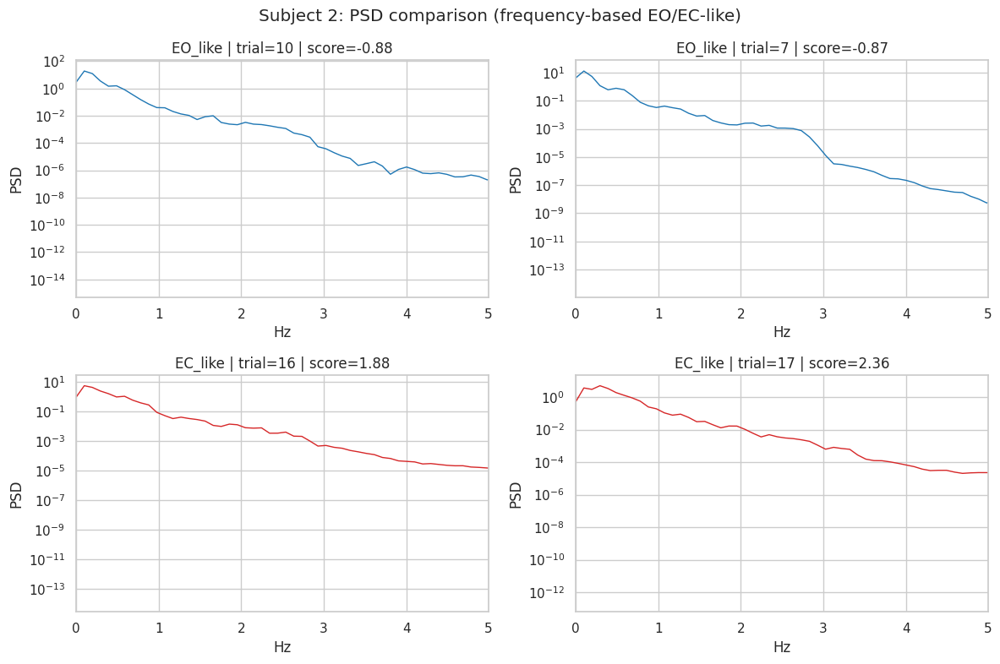

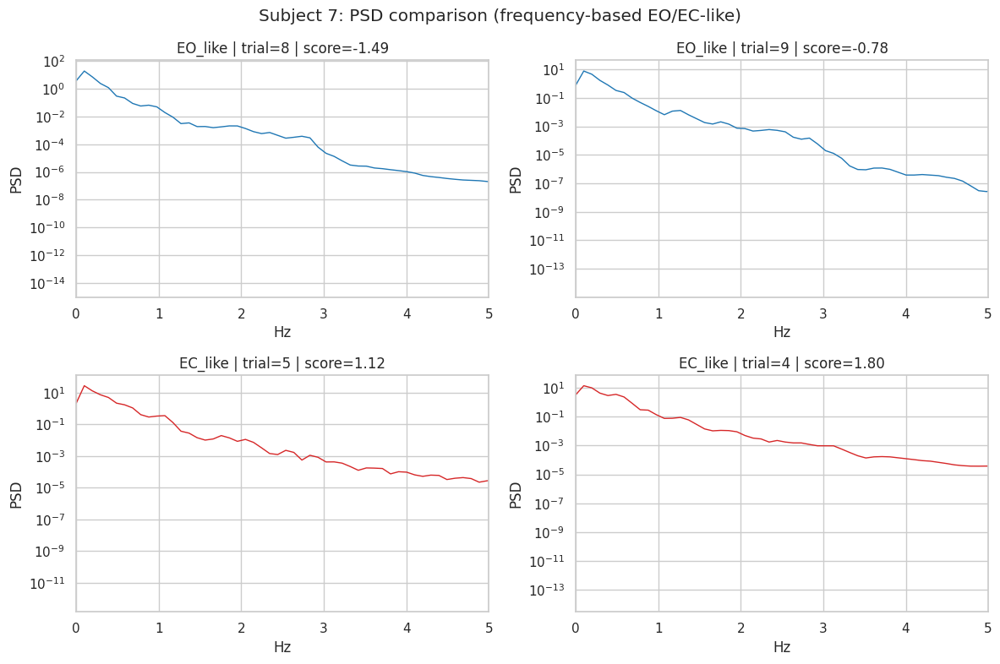

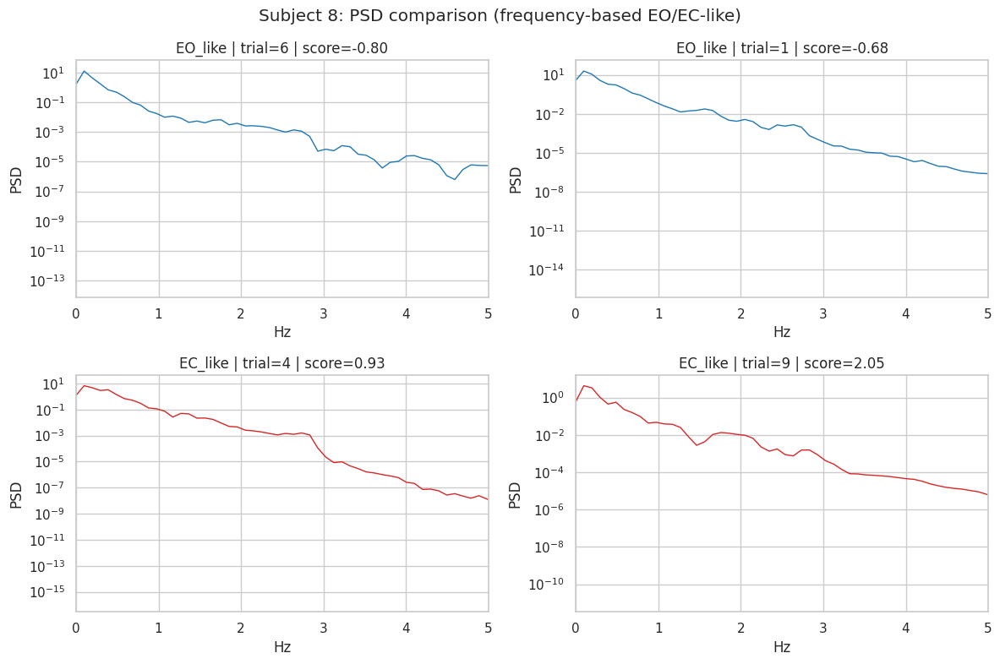

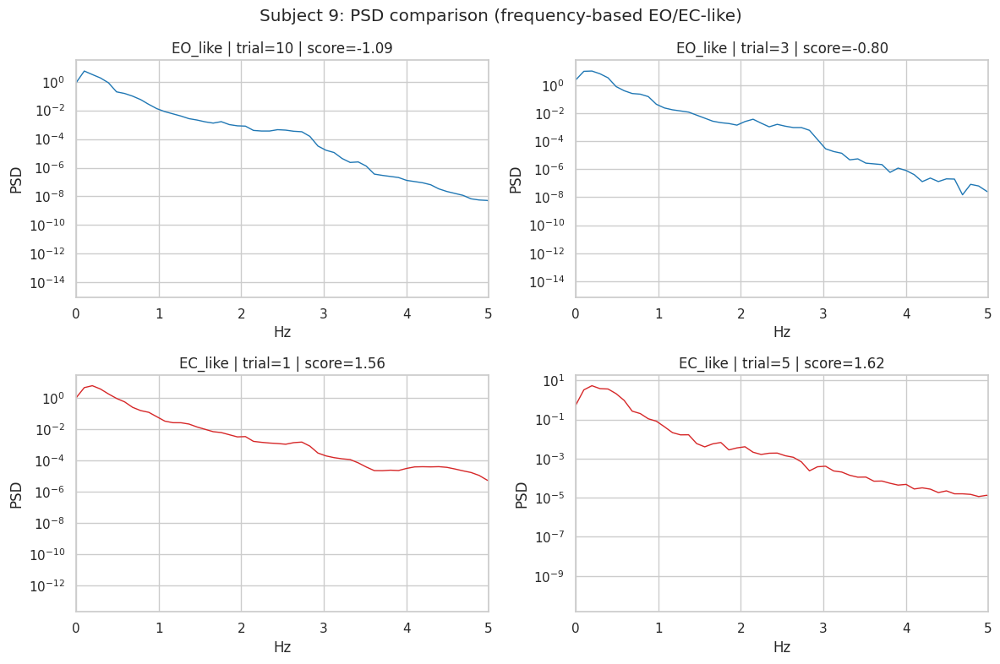


Frequency-domain separation summary:


,subject_id,metric,EO_median,EC_median,p_value
0,2,hf_norm,0.001652,0.003780,0.001008
1,2,spec_centroid,0.190597,0.268730,0.001008
2,2,mf_norm,0.050632,0.114206,0.001706
3,2,lf_norm,0.911073,0.827239,0.007285
4,7,hf_norm,0.000948,0.001565,0.015873
5,7,spec_centroid,0.174121,0.228107,0.007937
6,7,mf_norm,0.033793,0.062169,0.015873
7,7,lf_norm,0.938207,0.877753,0.007937
8,8,hf_norm,0.002111,0.003367,0.007937
9,8,spec_centroid,0.187215,0.227908,0.055556


Saved:
/content/eoec_freq_proxy_trial_level.csv
/content/eoec_freq_proxy_stats.csv


In [ ]:
# ============================================================
# PSD-BASED EO-like vs EC-like CLASSIFICATION (within-subject)
# Uses signals_cleaned + metadata_cleaned from dataset.db
# ============================================================

import sqlite3
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.signal import welch
from scipy.stats import mannwhitneyu

assert "signals_cleaned" in globals(), "signals_cleaned not found"

DB_PATH = "/content/dataset.db"
FS = 100.0   # sampling rate Hz (change if your device differs)

# ---------- 1) Merge raw signals with metadata ----------
S = signals_cleaned.copy()
if "file_id" not in S.columns:
    raise ValueError("signals_cleaned must have file_id")

conn = sqlite3.connect(DB_PATH)
meta = pd.read_sql_query("""
    SELECT file_id, subject_id, condition, trial
    FROM metadata_cleaned
""", conn)
conn.close()

D = S.merge(meta, on="file_id", how="left").dropna(subset=["subject_id"]).copy()
D["subject_id"] = D["subject_id"].astype(int)
D["condition"] = D["condition"].astype(str).str.lower().str.strip()

# optional: restrict to free
D = D[D["condition"] == "free"].copy()
if len(D) == 0:
    raise ValueError("No free-condition samples found after merge.")

if "sample_num" in D.columns:
    D = D.sort_values(["file_id", "sample_num"])

# ---------- 2) Trial-level PSD features ----------
def bandpower(f, pxx, lo, hi):
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.nan
    return np.trapz(pxx[m], f[m])

rows = []
for (sid, fid, tr), g in D.groupby(["subject_id","file_id","trial"]):
    x = g["cop_x"].to_numpy(float)
    y = g["cop_y"].to_numpy(float)
    n = min(len(x), len(y))
    if n < 256:
        continue

    x = x[:n] - np.mean(x[:n])
    y = y[:n] - np.mean(y[:n])
    r = np.sqrt(x*x + y*y)  # radial sway

    nperseg = min(1024, n)
    f, pxx = welch(r, fs=FS, nperseg=nperseg, detrend="constant")

    total = bandpower(f, pxx, 0.05, 5.0)
    lf    = bandpower(f, pxx, 0.05, 0.5)
    mf    = bandpower(f, pxx, 0.5, 1.5)
    hf    = bandpower(f, pxx, 1.5, 5.0)

    # normalized powers + spectral centroid
    lf_n = lf / (total + 1e-12)
    mf_n = mf / (total + 1e-12)
    hf_n = hf / (total + 1e-12)
    centroid = np.sum(f * pxx) / (np.sum(pxx) + 1e-12)

    rows.append({
        "subject_id": sid,
        "file_id": fid,
        "trial": tr,
        "n_samples": n,
        "bp_lf": lf, "bp_mf": mf, "bp_hf": hf, "bp_total": total,
        "lf_norm": lf_n, "mf_norm": mf_n, "hf_norm": hf_n,
        "spec_centroid": centroid
    })

psd_df = pd.DataFrame(rows)
print("psd_df shape:", psd_df.shape)
display(psd_df.head())

# ---------- 3) Classify EO-like vs EC-like from frequency shift ----------
# EC-like expected: relatively higher HF share and higher centroid
# score is standardized within each subject to avoid between-subject bias
def zscore(v):
    return (v - v.mean()) / (v.std(ddof=0) + 1e-12)

def label_subject(g):
    g = g.copy()
    g["z_hf"] = zscore(g["hf_norm"])
    g["z_cent"] = zscore(g["spec_centroid"])
    g["freq_instability_score"] = 0.6*g["z_hf"] + 0.4*g["z_cent"]

    med = g["freq_instability_score"].median()
    g["eoec_freq_proxy"] = np.where(g["freq_instability_score"] <= med, "EO_like", "EC_like")
    return g

psd_df = psd_df.groupby("subject_id", group_keys=False).apply(label_subject).reset_index(drop=True)

print(psd_df["eoec_freq_proxy"].value_counts())

# ---------- 4) Visual verification for sample subjects ----------
cnt = psd_df.groupby(["subject_id","eoec_freq_proxy"]).size().unstack(fill_value=0)
subs = cnt[(cnt.get("EO_like",0) >= 3) & (cnt.get("EC_like",0) >= 3)].index.tolist()[:4]
print("Subjects shown:", subs)

def get_radial_signal(file_id):
    g = D[D["file_id"] == file_id]
    if "sample_num" in g.columns:
        g = g.sort_values("sample_num")
    x = g["cop_x"].to_numpy(float)
    y = g["cop_y"].to_numpy(float)
    n = min(len(x), len(y))
    x = x[:n] - np.mean(x[:n]); y = y[:n] - np.mean(y[:n])
    return np.sqrt(x*x + y*y)

for sid in subs:
    G = psd_df[psd_df["subject_id"] == sid].sort_values("freq_instability_score")
    P = pd.concat([G.head(2), G.tail(2)], axis=0)  # 2 EO-like, 2 EC-like extremes

    fig, axes = plt.subplots(2,2, figsize=(12,8))
    axes = axes.flatten()

    for i, (_, r) in enumerate(P.iterrows()):
        sig = get_radial_signal(r["file_id"])
        f, pxx = welch(sig, fs=FS, nperseg=min(1024, len(sig)))
        c = "tab:blue" if r["eoec_freq_proxy"]=="EO_like" else "tab:red"

        axes[i].semilogy(f, pxx, color=c, lw=1)
        axes[i].set_xlim(0, 5)
        axes[i].set_title(f"{r['eoec_freq_proxy']} | trial={r['trial']} | score={r['freq_instability_score']:.2f}")
        axes[i].set_xlabel("Hz")
        axes[i].set_ylabel("PSD")

    plt.suptitle(f"Subject {sid}: PSD comparison (frequency-based EO/EC-like)")
    plt.tight_layout()
    plt.show()

# ---------- 5) Group stats (frequency-domain separation) ----------
stat_rows = []
for sid, g in psd_df.groupby("subject_id"):
    a = g[g["eoec_freq_proxy"]=="EO_like"]
    b = g[g["eoec_freq_proxy"]=="EC_like"]
    if len(a) < 2 or len(b) < 2:
        continue
    for m in ["hf_norm","spec_centroid","mf_norm","lf_norm"]:
        u, p = mannwhitneyu(a[m], b[m], alternative="two-sided")
        stat_rows.append({
            "subject_id": sid,
            "metric": m,
            "EO_median": a[m].median(),
            "EC_median": b[m].median(),
            "p_value": p
        })

stats_df = pd.DataFrame(stat_rows)
print("\nFrequency-domain separation summary:")
display(stats_df.head(20))

# ---------- 6) Save ----------
psd_df.to_csv("/content/eoec_freq_proxy_trial_level.csv", index=False)
stats_df.to_csv("/content/eoec_freq_proxy_stats.csv", index=False)
print("Saved:")
print("/content/eoec_freq_proxy_trial_level.csv")
print("/content/eoec_freq_proxy_stats.csv")

In [ ]:
import pandas as pd
import os

# ---------- load whichever proxy file exists ----------
candidates = [
    "/content/eoec_proxy_labels_freq_based_compact.csv",
    "/content/eoec_proxy_labels_freq_based.csv",
    "/content/eoec_proxy_labels_sway_based.csv",
]
path = next((p for p in candidates if os.path.exists(p)), None)
if path is None:
    raise FileNotFoundError("No proxy label file found in /content. Expected one of:\n" + "\n".join(candidates))

df = pd.read_csv(path)
print("Loaded:", path, "| shape:", df.shape)
print("Columns:", df.columns.tolist())

# ---------- detect label column ----------
label_col = None
for c in ["eoec_freq_proxy", "eoec_sway_proxy", "proxy", "eo_label", "eo_ec_fixed", "eo_ec"]:
    if c in df.columns:
        label_col = c
        break
if label_col is None:
    raise ValueError("No EO/EC label column found.")

# normalize to EO / EC
lab = df[label_col].astype(str).str.upper().str.strip()
df["_lab"] = None
df.loc[lab.str.contains(r"EO|OPEN", regex=True, na=False), "_lab"] = "EO"
df.loc[lab.str.contains(r"EC|CLOSED", regex=True, na=False), "_lab"] = "EC"
df = df.dropna(subset=["_lab"]).copy()

if "subject_id" not in df.columns:
    raise ValueError("subject_id column missing in label file.")

# ---------- counts per subject ----------
counts = (
    df.groupby(["subject_id","_lab"])
      .size()
      .unstack(fill_value=0)
      .rename(columns={"EO":"n_EO","EC":"n_EC"})
)

# ensure both columns exist
if "n_EO" not in counts.columns: counts["n_EO"] = 0
if "n_EC" not in counts.columns: counts["n_EC"] = 0

counts["n_total"] = counts["n_EO"] + counts["n_EC"]
counts["EO_pct"] = (100 * counts["n_EO"] / counts["n_total"]).round(1)
counts["EC_pct"] = (100 * counts["n_EC"] / counts["n_total"]).round(1)

counts = counts.reset_index().sort_values("subject_id")
display(counts)

# ---------- quick summary ----------
print("\nSummary:")
print("Subjects:", counts["subject_id"].nunique())
print("Total EO:", int(counts["n_EO"].sum()))
print("Total EC:", int(counts["n_EC"].sum()))
print("Median EO per subject:", float(counts["n_EO"].median()))
print("Median EC per subject:", float(counts["n_EC"].median()))

# optional save
out_path = "/content/eoec_counts_per_subject.csv"
counts.to_csv(out_path, index=False)
print("Saved:", out_path)

Loaded: /content/eoec_proxy_labels_sway_based.csv | shape: (934, 5)
Columns: ['subject_id', 'file_id', 'trial', 'instability_score', 'eoec_sway_proxy']


_lab,subject_id,n_EC,n_EO,n_total,EO_pct,EC_pct
0,2,10,10,20,50.0,50.0
1,7,5,5,10,50.0,50.0
2,8,5,5,10,50.0,50.0
3,9,5,5,10,50.0,50.0
4,10,5,5,10,50.0,50.0
...,...,...,...,...,...,...
80,116,1,1,2,50.0,50.0
81,126,4,5,9,55.6,44.4
82,127,5,5,10,50.0,50.0
83,128,5,6,11,54.5,45.5



Summary:
Subjects: 85
Total EO: 471
Total EC: 463
Median EO per subject: 5.0
Median EC per subject: 5.0
Saved: /content/eoec_counts_per_subject.csv


In [ ]:
import pandas as pd
import numpy as np
import os

# ------------------------------------------------------------
# 1) Load label dataset (prefer frequency-based proxy)
# ------------------------------------------------------------
candidates = [
    "/content/eoec_proxy_labels_freq_based_compact.csv",
    "/content/eoec_proxy_labels_freq_based.csv",
    "/content/eoec_proxy_labels_sway_based.csv",
]
path = next((p for p in candidates if os.path.exists(p)), None)
if path is None:
    raise FileNotFoundError("No EO/EC proxy label file found.")

df = pd.read_csv(path).copy()
print("Loaded:", path, "| shape:", df.shape)

# ------------------------------------------------------------
# 2) Detect label column and normalize to EO/EC
# ------------------------------------------------------------
label_col = None
for c in ["eoec_freq_proxy", "eoec_sway_proxy", "proxy", "eo_label", "eo_ec_fixed", "eo_ec"]:
    if c in df.columns:
        label_col = c
        break
if label_col is None:
    raise ValueError("No EO/EC label column found in file.")

lab = df[label_col].astype(str).str.upper().str.strip()
df["label"] = np.where(lab.str.contains(r"EO|OPEN", regex=True, na=False), "EO",
                np.where(lab.str.contains(r"EC|CLOSED", regex=True, na=False), "EC", None))
df = df.dropna(subset=["label"]).copy()

if "subject_id" not in df.columns:
    raise ValueError("subject_id missing in label dataset.")

# Optional de-duplication at trial level
trial_key = "file_id" if "file_id" in df.columns else ("trial" if "trial" in df.columns else None)
if trial_key is not None:
    df = df.drop_duplicates(subset=["subject_id", trial_key, "label"])

# ------------------------------------------------------------
# 3) Per-subject EO/EC counts
# ------------------------------------------------------------
cnt = (
    df.groupby(["subject_id","label"])
      .size()
      .unstack(fill_value=0)
      .rename(columns={"EO":"n_EO","EC":"n_EC"})
)

if "n_EO" not in cnt.columns: cnt["n_EO"] = 0
if "n_EC" not in cnt.columns: cnt["n_EC"] = 0

cnt["n_total"] = cnt["n_EO"] + cnt["n_EC"]

# protocol rule
cnt["protocol_ok_5_5"] = (cnt["n_EO"] == 5) & (cnt["n_EC"] == 5)

def reason(row):
    eo, ec = int(row["n_EO"]), int(row["n_EC"])
    if eo == 5 and ec == 5:
        return "PASS"
    if eo + ec < 10:
        if eo == 0 or ec == 0:
            return "Missing one class entirely (likely merge/label coverage issue)"
        return "Insufficient labeled trials (<10 total)"
    if eo + ec > 10:
        return "More than expected trials (>10); protocol mismatch or duplicate sessions"
    # total == 10 but imbalance
    return "Imbalanced EO/EC split (not 5/5); proxy labeling or trial-condition mismatch"

cnt["failure_reason"] = cnt.apply(reason, axis=1)
report = cnt.reset_index().sort_values("subject_id")

# ------------------------------------------------------------
# 4) Summary stats
# ------------------------------------------------------------
n_subjects = len(report)
n_pass = int(report["protocol_ok_5_5"].sum())
n_fail = n_subjects - n_pass
pass_rate = (100*n_pass/n_subjects) if n_subjects else 0

print("\n=== PROTOCOL VERIFICATION REPORT (EO=5, EC=5) ===")
print(f"Subjects evaluated: {n_subjects}")
print(f"PASS (5/5): {n_pass}")
print(f"FAIL: {n_fail}")
print(f"Pass rate: {pass_rate:.1f}%")

print("\nFailure breakdown:")
display(
    report.loc[~report["protocol_ok_5_5"], "failure_reason"]
          .value_counts(dropna=False)
          .rename_axis("reason")
          .reset_index(name="n_subjects")
)

print("\nPer-subject details:")
display(report)

# ------------------------------------------------------------
# 5) Save artifacts
# ------------------------------------------------------------
out_csv = "/content/protocol_verification_eoec_5_5_report.csv"
report.to_csv(out_csv, index=False)
print("Saved:", out_csv)

summary_txt = "/content/protocol_verification_summary.txt"
with open(summary_txt, "w") as f:
    f.write("PROTOCOL VERIFICATION REPORT (EO=5, EC=5)\n")
    f.write(f"Subjects evaluated: {n_subjects}\n")
    f.write(f"PASS (5/5): {n_pass}\n")
    f.write(f"FAIL: {n_fail}\n")
    f.write(f"Pass rate: {pass_rate:.1f}%\n\n")
    f.write("Failure breakdown:\n")
    fb = report.loc[~report["protocol_ok_5_5"], "failure_reason"].value_counts()
    for k,v in fb.items():
        f.write(f"- {k}: {v}\n")

print("Saved:", summary_txt)

Loaded: /content/eoec_proxy_labels_sway_based.csv | shape: (934, 5)

=== PROTOCOL VERIFICATION REPORT (EO=5, EC=5) ===
Subjects evaluated: 85
PASS (5/5): 67
FAIL: 18
Pass rate: 78.8%

Failure breakdown:


,reason,n_subjects
0,More than expected trials (>10); protocol mism...,13
1,Insufficient labeled trials (<10 total),5



Per-subject details:


label,subject_id,n_EC,n_EO,n_total,protocol_ok_5_5,failure_reason
0,2,10,10,20,False,More than expected trials (>10); protocol mism...
1,7,5,5,10,True,PASS
2,8,5,5,10,True,PASS
3,9,5,5,10,True,PASS
4,10,5,5,10,True,PASS
...,...,...,...,...,...,...
80,116,1,1,2,False,Insufficient labeled trials (<10 total)
81,126,4,5,9,False,Insufficient labeled trials (<10 total)
82,127,5,5,10,True,PASS
83,128,5,6,11,False,More than expected trials (>10); protocol mism...


Saved: /content/protocol_verification_eoec_5_5_report.csv
Saved: /content/protocol_verification_summary.txt


In [ ]:
df

,subject_id,file_id,trial,instability_score,eoec_sway_proxy,label
0,2,2_proba_free_1,1,-0.301130,EO_like,EO
1,2,2_proba_free_10,10,-0.236416,EO_like,EO
2,2,2_proba_free_11,11,0.483818,EC_like,EC
3,2,2_proba_free_12,12,0.349948,EC_like,EC
4,2,2_proba_free_13,13,0.679397,EC_like,EC
...,...,...,...,...,...,...
929,129,129_proba_free_5,5,0.335311,EO_like,EO
930,129,129_proba_free_6,6,0.519999,EO_like,EO
931,129,129_proba_free_7,7,0.807389,EO_like,EO
932,129,129_proba_free_8,8,0.240888,EO_like,EO


In [ ]:
# Analyze subjects with EXACT total trials = 10
# Checks EO/EC ratio, balance (5/5), and basic distribution summaries

import pandas as pd
import numpy as np
import os

# -----------------------------
# 1) Load protocol report (preferred)
# -----------------------------
report_path_candidates = [
    "/content/protocol_report_frequency_based.csv",
    "/content/protocol_report_sway_based.csv",
]
report_path = next((p for p in report_path_candidates if os.path.exists(p)), None)
if report_path is None:
    raise FileNotFoundError("No protocol report found. Expected protocol_report_*_based.csv")

rep = pd.read_csv(report_path)
print("Loaded:", report_path, "| shape:", rep.shape)
display(rep.head())

required = {"subject_id", "n_EO", "n_EC", "n_total"}
missing = required - set(rep.columns)
if missing:
    raise ValueError(f"Missing required columns in protocol report: {missing}")

# -----------------------------
# 2) Filter case-1: exact 10 trials
# -----------------------------
case10 = rep[rep["n_total"] == 10].copy()
n_case10 = len(case10)
n_all = len(rep)

print(f"\nSubjects with exact n_total=10: {n_case10}/{n_all} ({100*n_case10/max(n_all,1):.1f}%)")

if n_case10 == 0:
    print("No subjects with exact total=10 found.")
else:
    # EO/EC ratio
    case10["eo_ec_ratio"] = case10["n_EO"] / (case10["n_EC"] + 1e-12)
    case10["ec_eo_ratio"] = case10["n_EC"] / (case10["n_EO"] + 1e-12)
    case10["diff_EO_minus_EC"] = case10["n_EO"] - case10["n_EC"]
    case10["abs_diff"] = case10["diff_EO_minus_EC"].abs()
    case10["is_5_5"] = (case10["n_EO"] == 5) & (case10["n_EC"] == 5)

    # Classification buckets inside n_total=10
    case10["split_type"] = np.select(
        [
            (case10["n_EO"] == 5) & (case10["n_EC"] == 5),
            (case10["n_EO"] > case10["n_EC"]),
            (case10["n_EO"] < case10["n_EC"]),
        ],
        [
            "Perfect balance (5/5)",
            "EO-heavy (10 total)",
            "EC-heavy (10 total)",
        ],
        default="Other imbalance (10 total)"
    )

    # -----------------------------
    # 3) Summaries
    # -----------------------------
    n_55 = int(case10["is_5_5"].sum())
    n_not55 = n_case10 - n_55

    print("\n=== CASE-1 SUMMARY (n_total=10) ===")
    print(f"Subjects (n_total=10): {n_case10}")
    print(f"Perfect 5/5 match: {n_55} ({100*n_55/max(n_case10,1):.1f}%)")
    print(f"Imbalanced despite total=10: {n_not55} ({100*n_not55/max(n_case10,1):.1f}%)")

    print("\nSplit type counts:")
    display(case10["split_type"].value_counts().rename_axis("split_type").reset_index(name="n_subjects"))

    print("\nEO/EC ratio stats (n_total=10 subjects):")
    ratio_stats = pd.DataFrame({
        "metric": ["eo_ec_ratio", "ec_eo_ratio", "abs_diff"],
        "mean": [case10["eo_ec_ratio"].mean(), case10["ec_eo_ratio"].mean(), case10["abs_diff"].mean()],
        "median": [case10["eo_ec_ratio"].median(), case10["ec_eo_ratio"].median(), case10["abs_diff"].median()],
        "min": [case10["eo_ec_ratio"].min(), case10["ec_eo_ratio"].min(), case10["abs_diff"].min()],
        "max": [case10["eo_ec_ratio"].max(), case10["ec_eo_ratio"].max(), case10["abs_diff"].max()],
    })
    display(ratio_stats)

    # -----------------------------
    # 4) Detailed lists
    # -----------------------------
    perfect = case10[case10["is_5_5"]].sort_values("subject_id")
    imbal = case10[~case10["is_5_5"]].sort_values(["abs_diff","subject_id"], ascending=[False, True])

    print("\nPerfect 5/5 subjects:")
    display(perfect[["subject_id","n_EO","n_EC","n_total","eo_ec_ratio","ec_eo_ratio","split_type"]])

    print("\nImbalanced subjects with n_total=10:")
    display(imbal[["subject_id","n_EO","n_EC","n_total","eo_ec_ratio","ec_eo_ratio","diff_EO_minus_EC","abs_diff","split_type"]])

    # -----------------------------
    # 5) Save outputs
    # -----------------------------
    case10_out = "/content/case1_exact10_subjects_analysis.csv"
    perfect_out = "/content/case1_exact10_perfect_5_5_subjects.csv"
    imbal_out = "/content/case1_exact10_imbalanced_subjects.csv"

    case10.to_csv(case10_out, index=False)
    perfect.to_csv(perfect_out, index=False)
    imbal.to_csv(imbal_out, index=False)

    print("\nSaved:")
    print(case10_out)
    print(perfect_out)
    print(imbal_out)

Loaded: /content/protocol_report_frequency_based.csv | shape: (85, 6)


,subject_id,n_EC,n_EO,n_total,protocol_ok_5_5,failure_reason
0,2,10,10,20,False,More than expected trials (>10)
1,7,5,5,10,True,PASS
2,8,5,5,10,True,PASS
3,9,5,5,10,True,PASS
4,10,5,5,10,True,PASS



Subjects with exact n_total=10: 67/85 (78.8%)

=== CASE-1 SUMMARY (n_total=10) ===
Subjects (n_total=10): 67
Perfect 5/5 match: 67 (100.0%)
Imbalanced despite total=10: 0 (0.0%)

Split type counts:


,split_type,n_subjects
0,Perfect balance (5/5),67



EO/EC ratio stats (n_total=10 subjects):


,metric,mean,median,min,max
0,eo_ec_ratio,1.0,1.0,1.0,1.0
1,ec_eo_ratio,1.0,1.0,1.0,1.0
2,abs_diff,0.0,0.0,0.0,0.0



Perfect 5/5 subjects:


,subject_id,n_EO,n_EC,n_total,eo_ec_ratio,ec_eo_ratio,split_type
1,7,5,5,10,1.0,1.0,Perfect balance (5/5)
2,8,5,5,10,1.0,1.0,Perfect balance (5/5)
3,9,5,5,10,1.0,1.0,Perfect balance (5/5)
4,10,5,5,10,1.0,1.0,Perfect balance (5/5)
5,11,5,5,10,1.0,1.0,Perfect balance (5/5)
...,...,...,...,...,...,...,...
75,101,5,5,10,1.0,1.0,Perfect balance (5/5)
77,103,5,5,10,1.0,1.0,Perfect balance (5/5)
78,105,5,5,10,1.0,1.0,Perfect balance (5/5)
79,106,5,5,10,1.0,1.0,Perfect balance (5/5)



Imbalanced subjects with n_total=10:


,subject_id,n_EO,n_EC,n_total,eo_ec_ratio,ec_eo_ratio,diff_EO_minus_EC,abs_diff,split_type



Saved:
/content/case1_exact10_subjects_analysis.csv
/content/case1_exact10_perfect_5_5_subjects.csv
/content/case1_exact10_imbalanced_subjects.csv


In [ ]:
import pandas as pd

a1 = pd.read_csv("/content/audit_gt10_duplicate_or_reingestion.csv")
a2 = pd.read_csv("/content/audit_lt10_missing_or_dropped.csv")

# subjects
a1_subjects = a1["subject_id"].nunique()
a2_subjects = a2["subject_id"].nunique()

# total trials (use metadata-free expected trials as primary)
a1_trials = int(a1["meta_free_unique_trials"].fillna(0).sum()) if "meta_free_unique_trials" in a1.columns else int(a1["label_n_total"].fillna(0).sum())
a2_trials = int(a2["meta_free_expected_trials"].fillna(0).sum()) if "meta_free_expected_trials" in a2.columns else int(a2["label_n_total"].fillna(0).sum())

print("Audit 1 (>10)  -> subjects:", a1_subjects, "| total trials:", a1_trials)
print("Audit 2 (<10)  -> subjects:", a2_subjects, "| total trials:", a2_trials)

Audit 1 (>10)  -> subjects: 13 | total trials: 226
Audit 2 (<10)  -> subjects: 5 | total trials: 38


In [ ]:
import pandas as pd

# load protocol report (either one, both are identical in your run)
rep = pd.read_csv("/content/protocol_report_sway_based.csv")

# subjects with exact total=10
exact10 = rep[rep["n_total"] == 10].copy()

n_subjects_exact10 = exact10["subject_id"].nunique()
sum_trials_exact10 = int(exact10["n_total"].sum())   # each is 10, so = 10 * n_subjects_exact10

print(f"Exact-10 group -> subjects: {n_subjects_exact10} | sum of trials: {sum_trials_exact10}")

Exact-10 group -> subjects: 67 | sum of trials: 670


In [ ]:
import os
import sqlite3
import numpy as np
import pandas as pd

SWAY_PATH = "/content/eoec_proxy_labels_sway_based.csv"
FREQ_PATH = "/content/eoec_freq_proxy_trial_level.csv"
DB_PATH   = "/content/dataset.db"

if not os.path.exists(SWAY_PATH): raise FileNotFoundError(SWAY_PATH)
if not os.path.exists(FREQ_PATH): raise FileNotFoundError(FREQ_PATH)

def normalize_labels(df, label_candidates):
    label_col = next((c for c in label_candidates if c in df.columns), None)
    if label_col is None:
        raise ValueError(f"No label column found among: {label_candidates}")
    z = df.copy()
    lab = z[label_col].astype(str).str.upper().str.strip()
    z["label"] = None
    z.loc[lab.str.contains(r"EO|OPEN", regex=True, na=False), "label"] = "EO"
    z.loc[lab.str.contains(r"EC|CLOSED", regex=True, na=False), "label"] = "EC"
    z = z.dropna(subset=["label"]).copy()
    return z, label_col

def protocol_counts(df):
    if "file_id" in df.columns:
        d = df.drop_duplicates(subset=["subject_id","file_id","label"]).copy()
    elif "trial" in df.columns:
        d = df.drop_duplicates(subset=["subject_id","trial","label"]).copy()
    else:
        d = df.drop_duplicates(subset=["subject_id","label"]).copy()

    cnt = (
        d.groupby(["subject_id","label"]).size().unstack(fill_value=0)
         .rename(columns={"EO":"n_EO","EC":"n_EC"})
    )
    if "n_EO" not in cnt.columns: cnt["n_EO"] = 0
    if "n_EC" not in cnt.columns: cnt["n_EC"] = 0
    cnt["n_total"] = cnt["n_EO"] + cnt["n_EC"]
    cnt["protocol_ok_5_5"] = (cnt["n_EO"]==5) & (cnt["n_EC"]==5)

    def reason(r):
        nt = int(r["n_total"])
        if r["protocol_ok_5_5"]: return "PASS"
        if nt > 10: return "More than expected trials (>10)"
        if nt < 10: return "Insufficient labeled trials (<10)"
        return "Imbalanced EO/EC at n_total=10"
    cnt["failure_reason"] = cnt.apply(reason, axis=1)
    return d, cnt.reset_index()

# Load label files
sway_raw = pd.read_csv(SWAY_PATH)
freq_raw = pd.read_csv(FREQ_PATH)

sway_df, _ = normalize_labels(sway_raw, ["eoec_sway_proxy","proxy","eo_label","eo_ec_fixed","eo_ec"])
freq_df, _ = normalize_labels(freq_raw, ["eoec_freq_proxy","eo_label","eo_ec_fixed","eo_ec","proxy"])

sway_dedup, sway_report = protocol_counts(sway_df)
freq_dedup, freq_report = protocol_counts(freq_df)

# Load metadata
conn = sqlite3.connect(DB_PATH)
meta = pd.read_sql_query("""
    SELECT file_id, subject_id, condition, trial, duration_samples
    FROM metadata_cleaned
""", conn)
conn.close()
meta["condition"] = meta["condition"].astype(str).str.lower().str.strip()

# -----------------------------
# AUDIT 1 (>10): add total duplicate trials found
# -----------------------------
gt10 = sway_report[sway_report["failure_reason"]=="More than expected trials (>10)"].copy()

rows_gt10 = []
for sid in gt10["subject_id"]:
    sub = sway_dedup[sway_dedup["subject_id"]==sid].copy()
    mfree = meta[(meta["subject_id"]==sid) & (meta["condition"]=="free")].copy()

    # duplicates in label set
    label_dup_trial_rows = int(sub.duplicated(["trial","label"]).sum()) if "trial" in sub.columns else np.nan
    label_dup_file_rows  = int(sub.duplicated(["file_id","label"]).sum()) if "file_id" in sub.columns else np.nan

    # duplicates in metadata free trials
    meta_dup_trial_rows = int(mfree.duplicated(["trial"]).sum()) if "trial" in mfree.columns else np.nan
    meta_dup_file_rows  = int(mfree.duplicated(["file_id"]).sum())

    # final duplicate-trial count (primary metric requested)
    total_duplicate_trials_found = (
        (0 if pd.isna(meta_dup_trial_rows) else meta_dup_trial_rows) +
        (0 if pd.isna(label_dup_trial_rows) else label_dup_trial_rows)
    )

    rows_gt10.append({
        "subject_id": sid,
        "label_n_total": int(sub.shape[0]),
        "label_unique_trials": int(sub["trial"].nunique()) if "trial" in sub.columns else np.nan,
        "label_unique_file_id": int(sub["file_id"].nunique()) if "file_id" in sub.columns else np.nan,
        "label_duplicate_trial_rows": label_dup_trial_rows,
        "label_duplicate_file_id_rows": label_dup_file_rows,
        "meta_free_unique_trials": int(mfree["trial"].nunique()) if "trial" in mfree.columns else np.nan,
        "meta_free_unique_file_id": int(mfree["file_id"].nunique()),
        "meta_free_duplicate_trial_rows": meta_dup_trial_rows,
        "meta_free_duplicate_file_id_rows": meta_dup_file_rows,
        "total_duplicate_trials_found": int(total_duplicate_trials_found)
    })

audit_gt10 = pd.DataFrame(rows_gt10).sort_values("subject_id")

# -----------------------------
# AUDIT 2 (<10): add total trials for each subject
# -----------------------------
lt10 = sway_report[sway_report["failure_reason"]=="Insufficient labeled trials (<10)"].copy()

rows_lt10 = []
for sid in lt10["subject_id"]:
    sub = sway_dedup[sway_dedup["subject_id"]==sid].copy()
    m_all  = meta[meta["subject_id"]==sid].copy()
    m_free = m_all[m_all["condition"]=="free"].copy()

    missing_files = []
    if "file_id" in sub.columns:
        missing_files = sorted(set(m_free["file_id"].astype(str)) - set(sub["file_id"].astype(str)))

    rows_lt10.append({
        "subject_id": sid,
        "label_n_total": int(sub.shape[0]),
        "label_observed_trials": int(sub["trial"].nunique()) if "trial" in sub.columns else np.nan,
        "label_observed_files": int(sub["file_id"].nunique()) if "file_id" in sub.columns else np.nan,

        # requested: total trials for each subject
        "meta_total_trials_all_conditions": int(m_all["trial"].nunique()) if "trial" in m_all.columns else np.nan,
        "meta_total_files_all_conditions": int(m_all["file_id"].nunique()),

        "meta_free_expected_trials": int(m_free["trial"].nunique()) if "trial" in m_free.columns else np.nan,
        "meta_free_expected_files": int(m_free["file_id"].nunique()),
        "n_missing_files_vs_meta_free": len(missing_files),
        "missing_file_ids_example": ", ".join(missing_files[:5]) if missing_files else ""
    })

audit_lt10 = pd.DataFrame(rows_lt10).sort_values("subject_id")

# -----------------------------
# Sway vs Frequency stability
# -----------------------------
def summ(rep, name):
    n = len(rep); p = int(rep["protocol_ok_5_5"].sum()); f = n-p
    return {"method": name, "subjects": n, "pass": p, "fail": f, "pass_rate_%": round(100*p/n,1) if n else np.nan}

summary_df = pd.DataFrame([summ(sway_report, "sway_based"), summ(freq_report, "frequency_based")])

comp = sway_report[["subject_id","protocol_ok_5_5"]].rename(columns={"protocol_ok_5_5":"sway_ok"}).merge(
    freq_report[["subject_id","protocol_ok_5_5"]].rename(columns={"protocol_ok_5_5":"freq_ok"}),
    on="subject_id", how="outer"
)
comp["sway_ok"] = comp["sway_ok"].fillna(False)
comp["freq_ok"] = comp["freq_ok"].fillna(False)
comp["stable_same_result"] = comp["sway_ok"] == comp["freq_ok"]

# -----------------------------
# Print
# -----------------------------
print("=== AUDIT 1: >10 cases with duplicate trial totals ===")
display(audit_gt10)

print("=== AUDIT 2: <10 cases with total trials per subject ===")
display(audit_lt10)

print("=== PASS/FAIL SUMMARY ===")
display(summary_df)

print("=== STABILITY (sway vs frequency) ===")
print(f"Subjects compared: {len(comp)}")
print(f"Same pass/fail: {int(comp['stable_same_result'].sum())}")
print(f"Flipped: {int((~comp['stable_same_result']).sum())}")
display(comp[~comp["stable_same_result"]].sort_values("subject_id"))


# ============================================================
# FINAL CONCLUSION NUMBERS (print after audit tables)
# ============================================================

# audit_gt10 must already exist from Audit 1 (>10 cases)

# 1) total duplicate trials in audit 1 subjects
total_duplicate_trials_audit1 = int(audit_gt10["total_duplicate_trials_found"].fillna(0).sum())

# 2) total number of trials in audit 1 subjects
# prefer metadata free-trial count as protocol reference
if "meta_free_unique_trials" in audit_gt10.columns:
    total_trials_audit1_subjects = int(audit_gt10["meta_free_unique_trials"].fillna(0).sum())
else:
    # fallback to label-level totals
    total_trials_audit1_subjects = int(audit_gt10["label_n_total"].fillna(0).sum())

print("\n=== FINAL CONCLUSION (AUDIT 1: >10 subjects) ===")
print(f"Total duplicate trials found (across Audit 1 subjects): {total_duplicate_trials_audit1}")
print(f"Total trials in Audit 1 subjects: {total_trials_audit1_subjects}")

print(
    f"Duplicate-trial rate in Audit 1 subjects: "
    f"{(100 * total_duplicate_trials_audit1 / (total_trials_audit1_subjects + 1e-9)):.2f}%"
)

# -----------------------------
# Save
# -----------------------------
audit_gt10.to_csv("/content/audit_gt10_duplicate_or_reingestion.csv", index=False)
audit_lt10.to_csv("/content/audit_lt10_missing_or_dropped.csv", index=False)
sway_report.to_csv("/content/protocol_report_sway_based.csv", index=False)
freq_report.to_csv("/content/protocol_report_frequency_based.csv", index=False)
summary_df.to_csv("/content/protocol_summary_sway_vs_frequency.csv", index=False)
comp.to_csv("/content/protocol_stability_subject_level.csv", index=False)

print("Saved updated audit outputs to /content/")

=== AUDIT 1: >10 cases with duplicate trial totals ===


,subject_id,label_n_total,label_unique_trials,label_unique_file_id,label_duplicate_trial_rows,label_duplicate_file_id_rows,meta_free_unique_trials,meta_free_unique_file_id,meta_free_duplicate_trial_rows,meta_free_duplicate_file_id_rows,total_duplicate_trials_found
0,2,20,20,20,0,0,20,20,0,0,0
1,15,20,20,20,0,0,20,20,0,0,0
2,16,20,20,20,0,0,20,20,0,0,0
3,35,20,20,20,0,0,20,20,0,0,0
4,36,20,20,20,0,0,20,20,0,0,0
5,37,20,20,20,0,0,20,20,0,0,0
6,39,20,20,20,0,0,20,20,0,0,0
7,48,21,21,21,0,0,21,21,0,0,0
8,61,20,20,20,0,0,20,20,0,0,0
9,62,11,11,11,0,0,11,11,0,0,0


=== AUDIT 2: <10 cases with total trials per subject ===


,subject_id,label_n_total,label_observed_trials,label_observed_files,meta_total_trials_all_conditions,meta_total_files_all_conditions,meta_free_expected_trials,meta_free_expected_files,n_missing_files_vs_meta_free,missing_file_ids_example
0,75,9,9,9,9,9,9,9,0,
1,102,9,9,9,9,9,9,9,0,
2,116,2,2,2,2,3,2,2,0,
3,126,9,9,9,9,9,9,9,0,
4,129,9,9,9,9,9,9,9,0,


=== PASS/FAIL SUMMARY ===


,method,subjects,pass,fail,pass_rate_%
0,sway_based,85,67,18,78.8
1,frequency_based,85,67,18,78.8


=== STABILITY (sway vs frequency) ===
Subjects compared: 85
Same pass/fail: 85
Flipped: 0


label,subject_id,sway_ok,freq_ok,stable_same_result



=== FINAL CONCLUSION (AUDIT 1: >10 subjects) ===
Total duplicate trials found (across Audit 1 subjects): 0
Total trials in Audit 1 subjects: 226
Duplicate-trial rate in Audit 1 subjects: 0.00%
Saved updated audit outputs to /content/


In [ ]:
# ============================================================
# CORRECTED DROP-AUDIT PIPELINE (NO SILENT DROPS)
# - Uses ALL free trials from metadata_cleaned as the base
# - Left-joins signal availability
# - Computes PSD features when possible
# - Labels trials only when subject has enough valid trials
# - Records explicit drop_reason per trial
# ============================================================

import sqlite3
import numpy as np
import pandas as pd
from scipy.signal import welch

DB_PATH = "/content/dataset.db"
FS = 100.0
MIN_SAMPLES = 256

assert "signals_cleaned" in globals(), "signals_cleaned not found"

# -----------------------------
# 1) Base cohort = ALL FREE TRIALS (do not drop)
# -----------------------------
conn = sqlite3.connect(DB_PATH)
meta = pd.read_sql_query("""
    SELECT file_id, subject_id, condition, trial
    FROM metadata_cleaned
""", conn)
conn.close()

meta["condition"] = meta["condition"].astype(str).str.lower().str.strip()
meta["subject_id"] = pd.to_numeric(meta["subject_id"], errors="coerce")
meta = meta.dropna(subset=["subject_id","file_id"]).copy()
meta["subject_id"] = meta["subject_id"].astype(int)

base = meta[meta["condition"]=="free"].copy()
base = base.drop_duplicates(subset=["subject_id","file_id","trial"])
base["base_row_id"] = np.arange(len(base))

print("Base FREE trials:", len(base))
print("Base FREE subjects:", base["subject_id"].nunique())

# -----------------------------
# 2) Prepare signals
# -----------------------------
S = signals_cleaned.copy()
for c in ["file_id","cop_x","cop_y"]:
    if c not in S.columns:
        raise ValueError(f"signals_cleaned missing {c}")

if "sample_num" in S.columns:
    S = S.sort_values(["file_id","sample_num"])

# group once for speed
sig_groups = {fid: g for fid, g in S.groupby("file_id")}

# -----------------------------
# 3) Feature extraction with explicit per-trial status
# -----------------------------
def bandpower(f, pxx, lo, hi):
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.nan
    return np.trapezoid(pxx[m], f[m])

rows = []
for _, r in base.iterrows():
    sid, fid, trl, rid = int(r["subject_id"]), r["file_id"], r["trial"], int(r["base_row_id"])

    rec = {
        "base_row_id": rid, "subject_id": sid, "file_id": fid, "trial": trl,
        "n_samples_raw": 0, "n_samples_valid_xy": 0,
        "feature_status": None, "drop_reason": None,
        "bp_total": np.nan, "lf_norm": np.nan, "mf_norm": np.nan, "hf_norm": np.nan, "spec_centroid": np.nan
    }

    if fid not in sig_groups:
        rec["feature_status"] = "failed"
        rec["drop_reason"] = "missing_signal_rows_for_file_id"
        rows.append(rec)
        continue

    g = sig_groups[fid]
    rec["n_samples_raw"] = int(len(g))

    x = pd.to_numeric(g["cop_x"], errors="coerce").to_numpy()
    y = pd.to_numeric(g["cop_y"], errors="coerce").to_numpy()
    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]; y = y[valid]
    n = min(len(x), len(y))
    rec["n_samples_valid_xy"] = int(n)

    if n < MIN_SAMPLES:
        rec["feature_status"] = "failed"
        rec["drop_reason"] = f"too_few_valid_samples(<{MIN_SAMPLES})"
        rows.append(rec)
        continue

    try:
        x = x[:n] - np.mean(x[:n])
        y = y[:n] - np.mean(y[:n])
        radial = np.sqrt(x*x + y*y)

        f, pxx = welch(radial, fs=FS, nperseg=min(1024, n), detrend="constant")
        total = bandpower(f, pxx, 0.05, 5.0)
        lf = bandpower(f, pxx, 0.05, 0.5)
        mf = bandpower(f, pxx, 0.5, 1.5)
        hf = bandpower(f, pxx, 1.5, 5.0)

        if (not np.isfinite(total)) or (total <= 0):
            rec["feature_status"] = "failed"
            rec["drop_reason"] = "invalid_total_bandpower"
            rows.append(rec)
            continue

        rec["bp_total"] = total
        rec["lf_norm"] = lf / (total + 1e-12)
        rec["mf_norm"] = mf / (total + 1e-12)
        rec["hf_norm"] = hf / (total + 1e-12)
        rec["spec_centroid"] = np.sum(f * pxx) / (np.sum(pxx) + 1e-12)
        rec["feature_status"] = "ready"
        rec["drop_reason"] = "none"
        rows.append(rec)

    except Exception as e:
        rec["feature_status"] = "failed"
        rec["drop_reason"] = f"psd_exception:{type(e).__name__}"
        rows.append(rec)

feat = pd.DataFrame(rows)

# -----------------------------
# 4) Labeling stage with explicit subject-level eligibility
# -----------------------------
def zscore(v):
    return (v - v.mean()) / (v.std(ddof=0) + 1e-12)

feat["label_status"] = "unlabeled"
feat["eoec_freq_proxy"] = np.nan
feat["freq_instability_score"] = np.nan

for sid, g in feat.groupby("subject_id"):
    idx_ready = g.index[g["feature_status"]=="ready"].tolist()
    if len(idx_ready) < 2:
        # keep trials but mark reason
        feat.loc[idx_ready, "label_status"] = "failed_subject_labeling"
        feat.loc[idx_ready, "drop_reason"] = "subject_has_<2_ready_trials_cannot_split"
        continue

    sub = feat.loc[idx_ready].copy()
    sub["z_hf"] = zscore(sub["hf_norm"])
    sub["z_cent"] = zscore(sub["spec_centroid"])
    sub["freq_instability_score"] = 0.6*sub["z_hf"] + 0.4*sub["z_cent"]
    med = sub["freq_instability_score"].median()
    sub["eoec_freq_proxy"] = np.where(sub["freq_instability_score"] <= med, "EO_like", "EC_like")

    feat.loc[sub.index, "freq_instability_score"] = sub["freq_instability_score"].values
    feat.loc[sub.index, "eoec_freq_proxy"] = sub["eoec_freq_proxy"].values
    feat.loc[sub.index, "label_status"] = "labeled"
    feat.loc[sub.index, "drop_reason"] = "none"

# -----------------------------
# 5) FULL AUDIT TABLE (no trial lost)
# -----------------------------
audit = base.merge(
    feat[[
        "base_row_id","n_samples_raw","n_samples_valid_xy","feature_status",
        "label_status","drop_reason","eoec_freq_proxy","freq_instability_score"
    ]],
    on="base_row_id",
    how="left"
)

# safety: fill unexpected null states
audit["feature_status"] = audit["feature_status"].fillna("failed")
audit["label_status"] = audit["label_status"].fillna("unlabeled")
audit["drop_reason"] = audit["drop_reason"].fillna("unknown_pipeline_gap")

# -----------------------------
# 6) Explain drops clearly
# -----------------------------
total_free_trials = len(audit)
total_free_subjects = audit["subject_id"].nunique()

labeled_trials = int((audit["label_status"]=="labeled").sum())
unlabeled_trials = total_free_trials - labeled_trials

labeled_subjects = audit.loc[audit["label_status"]=="labeled","subject_id"].nunique()
unlabeled_subjects = total_free_subjects - labeled_subjects

trial_reason = (
    audit[audit["label_status"]!="labeled"]["drop_reason"]
    .value_counts(dropna=False)
    .rename_axis("drop_reason")
    .reset_index(name="n_trials")
)

sub_reason = (
    audit[audit["label_status"]!="labeled"]
    .groupby(["subject_id","drop_reason"]).size()
    .reset_index(name="n")
    .sort_values(["subject_id","n"], ascending=[True,False])
)
sub_reason_top = sub_reason.drop_duplicates(subset=["subject_id"], keep="first")

print("\n=== DROP-AUDIT SUMMARY ===")
print(f"Total FREE trials (base): {total_free_trials}")
print(f"Labeled trials: {labeled_trials}")
print(f"Unlabeled trials: {unlabeled_trials}")
print(f"Total FREE subjects (base): {total_free_subjects}")
print(f"Subjects with >=1 labeled trial: {labeled_subjects}")
print(f"Subjects with 0 labeled trials: {unlabeled_subjects}")

print("\nUnlabeled trial reasons:")
display(trial_reason)

print("\nSubjects with dominant drop reason:")
display(sub_reason_top.head(50))

# protocol table from labeled trials only
lab = audit[audit["label_status"]=="labeled"].copy()
if len(lab):
    lab["label"] = np.where(lab["eoec_freq_proxy"].astype(str).str.upper().str.contains("EO"), "EO", "EC")
    rep = (
        lab.groupby(["subject_id","label"]).size().unstack(fill_value=0)
        .rename(columns={"EO":"n_EO","EC":"n_EC"})
    )
    if "n_EO" not in rep.columns: rep["n_EO"] = 0
    if "n_EC" not in rep.columns: rep["n_EC"] = 0
    rep["n_total"] = rep["n_EO"] + rep["n_EC"]
    rep["protocol_ok_5_5"] = (rep["n_EO"]==5) & (rep["n_EC"]==5)
    rep = rep.reset_index()
else:
    rep = pd.DataFrame(columns=["subject_id","n_EO","n_EC","n_total","protocol_ok_5_5"])

print("\nProtocol table (labeled subset):")
display(rep.head(20))

# -----------------------------
# 7) Save transparent artifacts
# -----------------------------
audit.to_csv("/content/proxy_label_full_audit_free_trials.csv", index=False)
trial_reason.to_csv("/content/proxy_label_drop_reasons_trial_level.csv", index=False)
sub_reason_top.to_csv("/content/proxy_label_drop_reasons_subject_level.csv", index=False)
rep.to_csv("/content/proxy_label_protocol_report_labeled_subset.csv", index=False)

print("\nSaved:")
print("/content/proxy_label_full_audit_free_trials.csv")
print("/content/proxy_label_drop_reasons_trial_level.csv")
print("/content/proxy_label_drop_reasons_subject_level.csv")
print("/content/proxy_label_protocol_report_labeled_subset.csv")

Base FREE trials: 934
Base FREE subjects: 85


/tmp/ipykernel_8760/1696658765.py:158: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '['EO_like' 'EO_like' 'EO_like' 'EC_like' 'EC_like' 'EC_like' 'EC_like'
 'EC_like' 'EC_like' 'EC_like' 'EC_like' 'EO_like' 'EC_like' 'EC_like'
 'EO_like' 'EO_like' 'EO_like' 'EO_like' 'EO_like' 'EO_like']' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  feat.loc[sub.index, "eoec_freq_proxy"] = sub["eoec_freq_proxy"].values



=== DROP-AUDIT SUMMARY ===
Total FREE trials (base): 934
Labeled trials: 934
Unlabeled trials: 0
Total FREE subjects (base): 85
Subjects with >=1 labeled trial: 85
Subjects with 0 labeled trials: 0

Unlabeled trial reasons:


,drop_reason,n_trials



Subjects with dominant drop reason:


,subject_id,drop_reason,n



Protocol table (labeled subset):


label,subject_id,n_EC,n_EO,n_total,protocol_ok_5_5
0,2,10,10,20,False
1,7,5,5,10,True
2,8,5,5,10,True
3,9,5,5,10,True
4,10,5,5,10,True
5,11,5,5,10,True
6,12,5,5,10,True
7,13,5,5,10,True
8,14,5,5,10,True
9,15,10,10,20,False



Saved:
/content/proxy_label_full_audit_free_trials.csv
/content/proxy_label_drop_reasons_trial_level.csv
/content/proxy_label_drop_reasons_subject_level.csv
/content/proxy_label_protocol_report_labeled_subset.csv


In [ ]:
rep.shape

(85, 5)

In [ ]:
rep["n_total"].sum()

np.int64(934)

#Siamese Networks

In [ ]:
import sqlite3
import numpy as np
import pandas as pd
from scipy.signal import welch

DB_PATH = "/content/dataset.db"
FS = 100.0
MIN_SAMPLES = 256

signals_cleaned = pd.read_parquet("/content/signals_cleaned.parquet")

assert "signals_cleaned" in globals(), "signals_cleaned dataframe not found. Load it first."

# ---------- helpers ----------
def bandpower(f, pxx, lo, hi):
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.nan
    return np.trapezoid(pxx[m], f[m])

def ellipse_area_95(x, y):
    # area of 95% confidence ellipse = pi * chi2_0.95(df=2) * sqrt(|cov|)
    # chi2(2,0.95)=5.991
    cov = np.cov(np.vstack([x, y]))
    det = np.linalg.det(cov)
    if not np.isfinite(det) or det <= 0:
        return np.nan
    return np.pi * 5.991 * np.sqrt(det)

def approx_sample_entropy(u, m=2, r=None):
    # lightweight approximate sample entropy for 1D signal
    u = np.asarray(u, dtype=float)
    u = u[np.isfinite(u)]
    n = len(u)
    if n < (m+2):
        return np.nan
    if r is None:
        r = 0.2 * np.std(u)
        if not np.isfinite(r) or r == 0:
            return np.nan

    def _phi(mm):
        x = np.array([u[i:i+mm] for i in range(n-mm+1)])
        # Chebyshev distance
        C = np.sum(np.max(np.abs(x[:, None, :] - x[None, :, :]), axis=2) <= r, axis=0) - 1
        return np.sum(C) / ((n-mm+1) * (n-mm))
    phi_m = _phi(m)
    phi_m1 = _phi(m+1)
    if phi_m <= 0 or phi_m1 <= 0:
        return np.nan
    return -np.log(phi_m1 / phi_m)

# ---------- load metadata (free trials) ----------
conn = sqlite3.connect(DB_PATH)
meta = pd.read_sql_query("""
    SELECT file_id, subject_id, condition, trial
    FROM metadata_cleaned
""", conn)
conn.close()

meta["condition"] = meta["condition"].astype(str).str.lower().str.strip()
meta["subject_id"] = pd.to_numeric(meta["subject_id"], errors="coerce")
meta = meta.dropna(subset=["subject_id","file_id"]).copy()
meta["subject_id"] = meta["subject_id"].astype(int)

meta_free = meta[meta["condition"]=="free"].drop_duplicates(subset=["file_id"]).copy()
print("Free trials in metadata:", len(meta_free), "Free subjects:", meta_free["subject_id"].nunique())

# ---------- index signals by file_id ----------
S = signals_cleaned.copy()
if "sample_num" in S.columns:
    S = S.sort_values(["file_id","sample_num"])

groups = {fid: g for fid, g in S.groupby("file_id")}

# ---------- compute features per trial ----------
rows = []
for _, r in meta_free.iterrows():
    fid = r["file_id"]
    sid = int(r["subject_id"])
    trl = r["trial"]

    out = {"file_id": fid, "subject_id": sid, "trial": trl, "condition": "free"}

    g = groups.get(fid, None)
    if g is None or len(g) == 0:
        out["status"] = "failed"
        out["reason"] = "missing_signal_rows"
        rows.append(out)
        continue

    x = pd.to_numeric(g["cop_x"], errors="coerce").to_numpy()
    y = pd.to_numeric(g["cop_y"], errors="coerce").to_numpy()
    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]; y = y[valid]
    n = min(len(x), len(y))
    out["n_samples"] = int(n)

    if n < MIN_SAMPLES:
        out["status"] = "failed"
        out["reason"] = f"too_short(<{MIN_SAMPLES})"
        rows.append(out)
        continue

    x = x[:n] - np.mean(x[:n])
    y = y[:n] - np.mean(y[:n])

    # core geometric/time features
    dx = np.diff(x); dy = np.diff(y)
    path = np.sum(np.sqrt(dx*dx + dy*dy))
    out["path_length"] = float(path)
    out["mean_velocity"] = float(path / (n / FS))
    out["std_x"] = float(np.std(x))
    out["std_y"] = float(np.std(y))
    out["rms_x"] = float(np.sqrt(np.mean(x*x)))
    out["rms_y"] = float(np.sqrt(np.mean(y*y)))
    out["range_x"] = float(np.max(x) - np.min(x))
    out["range_y"] = float(np.max(y) - np.min(y))
    out["area_ellipse_95"] = float(ellipse_area_95(x, y))

    # radial signal
    radial = np.sqrt(x*x + y*y)
    out["radial_rms"] = float(np.sqrt(np.mean(radial*radial)))
    out["radial_std"] = float(np.std(radial))
    out["radial_sampen"] = float(approx_sample_entropy(radial))

    # frequency features (Welch PSD on radial)
    f, pxx = welch(radial, fs=FS, nperseg=min(1024, n), detrend="constant")
    total = bandpower(f, pxx, 0.05, 5.0)
    out["bp_total_0p05_5"] = float(total) if np.isfinite(total) else np.nan
    out["bp_lf_0p05_0p5"] = float(bandpower(f, pxx, 0.05, 0.5))
    out["bp_mf_0p5_1p5"] = float(bandpower(f, pxx, 0.5, 1.5))
    out["bp_hf_1p5_5"] = float(bandpower(f, pxx, 1.5, 5.0))

    if np.isfinite(total) and total > 0:
        out["lf_norm"] = out["bp_lf_0p05_0p5"] / (total + 1e-12)
        out["mf_norm"] = out["bp_mf_0p5_1p5"] / (total + 1e-12)
        out["hf_norm"] = out["bp_hf_1p5_5"] / (total + 1e-12)
    else:
        out["lf_norm"] = np.nan; out["mf_norm"] = np.nan; out["hf_norm"] = np.nan

    out["spec_centroid"] = float(np.sum(f * pxx) / (np.sum(pxx) + 1e-12))

    out["status"] = "ok"
    out["reason"] = "none"
    rows.append(out)

feat = pd.DataFrame(rows)
feat.to_csv("/content/trial_level_features_free.csv", index=False)

print("Saved:", "/content/trial_level_features_free.csv")
print("Feature rows:", len(feat), "OK rows:", int((feat['status']=='ok').sum()))
display(feat.head())

Free trials in metadata: 934 Free subjects: 85
Saved: /content/trial_level_features_free.csv
Feature rows: 934 OK rows: 934


,file_id,subject_id,trial,condition,n_samples,path_length,mean_velocity,std_x,std_y,rms_x,...,bp_total_0p05_5,bp_lf_0p05_0p5,bp_mf_0p5_1p5,bp_hf_1p5_5,lf_norm,mf_norm,hf_norm,spec_centroid,status,reason
0,100_proba_free_1,100,1,free,7468,288.432758,3.862249,2.779710,3.472116,2.779710,...,2.944206,2.692604,0.132100,0.005530,0.914543,0.044868,0.001878,0.224018,ok,none
1,100_proba_free_10,100,10,free,7503,226.854613,3.023519,2.086881,2.022681,2.086881,...,1.239356,1.072273,0.112429,0.006069,0.865185,0.090716,0.004897,0.233304,ok,none
2,100_proba_free_11,100,11,free,7511,238.417402,3.174243,2.667323,3.484304,2.667323,...,1.860848,1.704824,0.093613,0.006415,0.916155,0.050307,0.003447,0.200645,ok,none
3,100_proba_free_2,100,2,free,7504,329.772373,4.394621,3.335759,3.196628,3.335759,...,2.649765,2.305492,0.175250,0.008610,0.870074,0.066138,0.003249,0.253416,ok,none
4,100_proba_free_3,100,3,free,7504,341.369363,4.549165,3.085178,3.724617,3.085178,...,2.199383,1.896216,0.180697,0.008296,0.862158,0.082158,0.003772,0.233520,ok,none


In [ ]:
import numpy as np
import pandas as pd

from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, f1_score, top_k_accuracy_score

feat = pd.read_csv("/content/trial_level_features_free.csv")
feat = feat[feat["status"]=="ok"].copy()

# Feature columns
exclude = {"file_id","subject_id","trial","condition","status","reason"}
feature_cols = [c for c in feat.columns if c not in exclude and pd.api.types.is_numeric_dtype(feat[c])]

# Within-subject temporal split (reduces leakage)
feat = feat.sort_values(["subject_id","trial","file_id"]).copy()
feat["rank_in_subject"] = feat.groupby("subject_id").cumcount()
feat["n_in_subject"] = feat.groupby("subject_id")["rank_in_subject"].transform("max") + 1

feat["split"] = np.where(feat["rank_in_subject"] < 0.7*feat["n_in_subject"], "train",
                 np.where(feat["rank_in_subject"] < 0.85*feat["n_in_subject"], "val", "test"))

train = feat[feat["split"]=="train"]
val   = feat[feat["split"]=="val"]
test  = feat[feat["split"]=="test"]

# Closed-set check
missing = set(test["subject_id"]) - set(train["subject_id"])
if missing:
    raise ValueError(f"Closed-set violation: test subjects missing in train: {sorted(list(missing))[:10]}")

X_train, y_train = train[feature_cols], train["subject_id"].astype(int)
X_val, y_val     = val[feature_cols],   val["subject_id"].astype(int)
X_test, y_test   = test[feature_cols],  test["subject_id"].astype(int)

print("Subjects:", feat["subject_id"].nunique(), "Trials:", len(feat), "Features:", len(feature_cols))
print("Split sizes:", len(train), len(val), len(test))

clf = Pipeline(steps=[
    ("imputer", SimpleImputer(strategy="median")),
    ("scaler", StandardScaler()),
    ("model", LogisticRegression(
        multi_class="multinomial",
        max_iter=5000,
        n_jobs=-1,
        C=1.0
    ))
])

clf.fit(X_train, y_train)

def evaluate(name, X, y):
    pred = clf.predict(X)
    proba = clf.predict_proba(X)
    classes = clf.named_steps["model"].classes_
    acc1 = accuracy_score(y, pred)
    top5 = top_k_accuracy_score(y, proba, k=min(5, len(classes)), labels=classes)
    f1m = f1_score(y, pred, average="macro")
    print(f"\n{name}: top1={acc1:.4f}  top5={top5:.4f}  macroF1={f1m:.4f}")

evaluate("VAL", X_val, y_val)
evaluate("TEST", X_test, y_test)

Subjects: 85 Trials: 934 Features: 21
Split sizes: 659 173 102


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(



VAL: top1=0.0405  top5=0.2370  macroF1=0.0164

TEST: top1=0.0686  top5=0.3039  macroF1=0.0320


#Trajectory Specific Features

In [ ]:
# ============================================================
# Compare: single-feature AUC vs multi-feature grouped AUC
# Leakage-safe: GroupKFold by subject_id (change to file_id if needed)
# ============================================================

import numpy as np
import pandas as pd

from sklearn.model_selection import GroupKFold
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import roc_auc_score
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

RANDOM_STATE = 42
N_SPLITS = 5

# ------------------------------------------------------------
# 1) Prepare binary task (free vs stress as example)
#    You can switch to free vs non-free if preferred.
# ------------------------------------------------------------
df_auc = traj_df.copy()

# normalize condition strings
df_auc["condition"] = df_auc["condition"].astype(str).str.strip().str.lower()

# keep binary classes for clean AUC interpretation
df_auc = df_auc[df_auc["condition"].isin(["free", "stress"])].copy()
df_auc["y"] = (df_auc["condition"] == "stress").astype(int)

# choose candidate numeric features
exclude_cols = {
    "file_id","subject_id","condition","trial","age","height","mass",
    "sample_start","sample_end","n_samples","duration_sec","y"
}
feature_cols = [
    c for c in df_auc.columns
    if c not in exclude_cols and pd.api.types.is_numeric_dtype(df_auc[c])
]

# optionally remove near-constant features
variances = df_auc[feature_cols].var(numeric_only=True)
feature_cols = variances[variances > 1e-12].index.tolist()

print(f"Samples: {len(df_auc)}, Subjects: {df_auc['subject_id'].nunique()}, Features: {len(feature_cols)}")

# groups for leakage-safe CV
groups = df_auc["subject_id"].values
y_all = df_auc["y"].values

gkf = GroupKFold(n_splits=N_SPLITS)

# ------------------------------------------------------------
# 2) Single-feature grouped AUC
# ------------------------------------------------------------
single_rows = []

for f in feature_cols:
    d = df_auc.dropna(subset=[f, "y", "subject_id"]).copy()
    X = d[[f]].values
    y = d["y"].values
    g = d["subject_id"].values

    fold_aucs = []
    for tr, te in gkf.split(X, y, g):
        Xtr, Xte = X[tr], X[te]
        ytr, yte = y[tr], y[te]

        # skip fold if only one class in val
        if len(np.unique(yte)) < 2 or len(np.unique(ytr)) < 2:
            continue

        model = Pipeline([
            ("scaler", StandardScaler()),
            ("rf", RandomForestClassifier(
                n_estimators=200,
                random_state=RANDOM_STATE,
                class_weight="balanced",
                n_jobs=-1
            ))
        ])
        model.fit(Xtr, ytr)
        prob = model.predict_proba(Xte)[:, 1]
        fold_aucs.append(roc_auc_score(yte, prob))

    if len(fold_aucs) > 0:
        single_rows.append({
            "feature": f,
            "auc_mean": float(np.mean(fold_aucs)),
            "auc_std": float(np.std(fold_aucs)),
            "n_folds": len(fold_aucs)
        })

single_auc_df = pd.DataFrame(single_rows).sort_values("auc_mean", ascending=False)
print("\nTop single features by grouped AUC:")
display(single_auc_df.head(15))

best_single_auc = single_auc_df["auc_mean"].max() if len(single_auc_df) else np.nan
best_single_feature = single_auc_df.iloc[0]["feature"] if len(single_auc_df) else None

# ------------------------------------------------------------
# 3) Multi-feature grouped AUC
#    Compare:
#      A) All features
#      B) Top-K single features
# ------------------------------------------------------------
def grouped_auc_for_feature_set(df_in, feats, model_type="rf"):
    d = df_in.dropna(subset=feats + ["y", "subject_id"]).copy()
    X = d[feats].values
    y = d["y"].values
    g = d["subject_id"].values

    fold_aucs = []
    for tr, te in gkf.split(X, y, g):
        Xtr, Xte = X[tr], X[te]
        ytr, yte = y[tr], y[te]

        if len(np.unique(yte)) < 2 or len(np.unique(ytr)) < 2:
            continue

        if model_type == "rf":
            model = Pipeline([
                ("scaler", StandardScaler()),
                ("clf", RandomForestClassifier(
                    n_estimators=400,
                    random_state=RANDOM_STATE,
                    class_weight="balanced",
                    n_jobs=-1
                ))
            ])
        else:
            model = Pipeline([
                ("scaler", StandardScaler()),
                ("clf", XGBClassifier(
                    n_estimators=300,
                    max_depth=4,
                    learning_rate=0.05,
                    subsample=0.9,
                    colsample_bytree=0.9,
                    random_state=RANDOM_STATE,
                    eval_metric="logloss"
                ))
            ])

        model.fit(Xtr, ytr)
        prob = model.predict_proba(Xte)[:, 1]
        fold_aucs.append(roc_auc_score(yte, prob))

    return {
        "auc_mean": float(np.mean(fold_aucs)) if fold_aucs else np.nan,
        "auc_std": float(np.std(fold_aucs)) if fold_aucs else np.nan,
        "n_folds": len(fold_aucs)
    }

# A) all features (RF + XGB)
res_all_rf = grouped_auc_for_feature_set(df_auc, feature_cols, model_type="rf")
res_all_xgb = grouped_auc_for_feature_set(df_auc, feature_cols, model_type="xgb")

# B) top-K features from single-feature ranking
K = min(8, len(single_auc_df))
topk_feats = single_auc_df.head(K)["feature"].tolist() if len(single_auc_df) else []
res_topk_rf = grouped_auc_for_feature_set(df_auc, topk_feats, model_type="rf") if topk_feats else {"auc_mean":np.nan,"auc_std":np.nan,"n_folds":0}
res_topk_xgb = grouped_auc_for_feature_set(df_auc, topk_feats, model_type="xgb") if topk_feats else {"auc_mean":np.nan,"auc_std":np.nan,"n_folds":0}

# ------------------------------------------------------------
# 4) Summary comparison table
# ------------------------------------------------------------
summary = pd.DataFrame([
    {
        "model": "Best Single Feature (RF)",
        "feature_set": best_single_feature,
        "auc_mean": best_single_auc,
        "auc_std": single_auc_df.iloc[0]["auc_std"] if len(single_auc_df) else np.nan,
        "n_folds": int(single_auc_df.iloc[0]["n_folds"]) if len(single_auc_df) else 0
    },
    {
        "model": "Top-K Features (RF)",
        "feature_set": ", ".join(topk_feats),
        "auc_mean": res_topk_rf["auc_mean"],
        "auc_std": res_topk_rf["auc_std"],
        "n_folds": res_topk_rf["n_folds"]
    },
    {
        "model": "All Features (RF)",
        "feature_set": f"{len(feature_cols)} features",
        "auc_mean": res_all_rf["auc_mean"],
        "auc_std": res_all_rf["auc_std"],
        "n_folds": res_all_rf["n_folds"]
    },
    {
        "model": "Top-K Features (XGB)",
        "feature_set": ", ".join(topk_feats),
        "auc_mean": res_topk_xgb["auc_mean"],
        "auc_std": res_topk_xgb["auc_std"],
        "n_folds": res_topk_xgb["n_folds"]
    },
    {
        "model": "All Features (XGB)",
        "feature_set": f"{len(feature_cols)} features",
        "auc_mean": res_all_xgb["auc_mean"],
        "auc_std": res_all_xgb["auc_std"],
        "n_folds": res_all_xgb["n_folds"]
    }
])

display(summary)

# improvement checks
if len(summary) > 0 and not np.isnan(best_single_auc):
    best_multi = summary[summary["model"].str.contains("All Features|Top-K Features")]["auc_mean"].max()
    print(f"\nBest single-feature AUC: {best_single_auc:.3f}")
    print(f"Best multi-feature AUC:  {best_multi:.3f}")
    print(f"Absolute gain:           {best_multi - best_single_auc:.3f}")

Samples: 5520, Subjects: 122, Features: 23

Top single features by grouped AUC:


,feature,auc_mean,auc_std,n_folds
12,x_spec_centroid,0.599953,0.040443,5
9,radial_std,0.583824,0.032863,5
0,sway_path,0.580454,0.039696,5
1,mean_velocity,0.580454,0.039696,5
7,cop_y_range,0.567247,0.036800,5
5,cop_x_range,0.563591,0.029542,5
15,x_bp_10_30,0.559538,0.026531,5
2,sway_area_ellipse95,0.557616,0.037005,5
20,spec_centroid_mean,0.554536,0.015465,5
19,y_bp_10_30,0.550082,0.022173,5


,model,feature_set,auc_mean,auc_std,n_folds
0,Best Single Feature (RF),x_spec_centroid,0.599953,0.040443,5
1,Top-K Features (RF),"x_spec_centroid, radial_std, sway_path, mean_v...",0.814617,0.047524,5
2,All Features (RF),23 features,0.834998,0.048490,5
3,Top-K Features (XGB),"x_spec_centroid, radial_std, sway_path, mean_v...",0.829609,0.047365,5
4,All Features (XGB),23 features,0.855950,0.042369,5



Best single-feature AUC: 0.600
Best multi-feature AUC:  0.856
Absolute gain:           0.256


How well do features distinguish stress trials from free trials?”
with GroupKFold by subject_id (leakage-safe across subjects)

- Best single feature (x_spec_centroid) alone: AUC ~0.60 (weak-moderate)
- Multi-feature models:
- RF all features: ~0.835
- XGB all features: ~0.856
- Big improvement (+0.256) confirms condition signal is distributed across features, not captured by one feature alone.

# Results

Performance classes used:
- Strong: AUC ≥ 0.60
- Moderate: 0.56 ≤ AUC < 0.60
- Weak: 0.53 ≤ AUC < 0.56
- Very weak: AUC < 0.53

| Feature (short) | Full feature name | Feature type | AUC (mean ± std) | Performance class | Interpretation |
|---|---|---|---:|---|---|
| `x_spec_centroid` | Medio-lateral (X-axis) spectral centroid frequency | Trajectory (spectral) | 0.600 ± 0.040 | **Strong** | Best single feature; frequency-content shift under stress is informative. |
| `radial_std` | Standard deviation of radial CoP distance from centroid | Trajectory (dispersion) | 0.584 ± 0.033 | **Moderate** | Captures instability spread well. |
| `sway_path` | Total center-of-pressure path length | Trajectory (global sway) | 0.580 ± 0.040 | **Moderate** | Classic sway magnitude marker; useful alone. |
| `mean_velocity` | Mean CoP velocity (path length / time) | Trajectory (global sway) | 0.580 ± 0.040 | **Moderate** | Equivalent information to sway path in fixed-duration windows. |
| `cop_y_range` | Anterior–posterior (Y-axis) CoP range | Trajectory (range) | 0.567 ± 0.037 | **Moderate** | AP excursion increases with condition load for some subjects. |
| `cop_x_range` | Medio-lateral (X-axis) CoP range | Trajectory (range) | 0.564 ± 0.030 | **Moderate** | ML excursion has moderate discrimination. |
| `x_bp_10_30` | X-axis spectral band power in 1.0–3.0 Hz | Trajectory (spectral band power) | 0.560 ± 0.027 | **Weak** | Some high-frequency sway contribution, limited alone. |
| `sway_area_ellipse95` | 95% confidence sway ellipse area | Trajectory (area) | 0.558 ± 0.037 | **Weak** | Biomechanically relevant but heavy-tailed/noisy as single predictor. |
| `spec_centroid_mean` | Mean spectral centroid across X and Y axes | Trajectory (spectral) | 0.555 ± 0.015 | **Weak** | Combined centroid helps but less than X alone. |
| `y_bp_10_30` | Y-axis spectral band power in 1.0–3.0 Hz | Trajectory (spectral band power) | 0.550 ± 0.022 | **Weak** | Limited independent discrimination. |
| `convex_hull_area` | Convex hull area of CoP trajectory | Trajectory (geometric area) | 0.542 ± 0.032 | **Weak** | Sensitive to outliers/noise; modest standalone value. |
| `cop_x_std` | Standard deviation of X-axis CoP | Trajectory (dispersion) | 0.539 ± 0.040 | **Weak** | Partial sway spread signal, not strong alone. |
| `radial_mean` | Mean radial CoP distance from centroid | Trajectory (dispersion) | 0.527 ± 0.023 | **Very weak** | Low standalone separability. |
| `y_spec_centroid` | Anterior–posterior (Y-axis) spectral centroid frequency | Trajectory (spectral) | 0.523 ± 0.025 | **Very weak** | Little independent condition signal. |
| `cop_y_std` | Standard deviation of Y-axis CoP | Trajectory (dispersion) | 0.523 ± 0.024 | **Very weak** | Low standalone separability. |

##Features Summary

| Feature | Trajectory-specific (per trial) | Subject-specific (aggregated) | Best-performing status in your analyses | Why it performed well |
|---|---:|---:|---|---|
| `ap_ml_std_ratio_ec` | ✓ | ✓ | **Top** (strategy separation) | Strongly separated ankle-like vs hip-like groups in boxplots/medians |
| `ap_ml_range_ratio_ec` | ✓ | ✓ | **Top** (strategy separation) | Complemented AP/ML std ratio; robust directional-control marker |
| `hf_romberg_ratio` | ✓ (from EO/EC trial spectra) | ✓ | **Top** (strategy separation) | Captured EC-related high-frequency reweighting (hip-like tendency) |
| `spec_centroid_romberg_ratio` | ✓ (from EO/EC trial spectra) | ✓ | **Good** | Added spectral shift information; weaker alone, useful in combination |
| `strategy_delta_score` (hip−ankle composite) | derived from trajectory features | ✓ | **Top composite** | Stable labeling across thresholds; clear phenotype axis |
| `strategy_label` (`ankle_like/hip_like/mixed`) | derived | ✓ | **Operationally strong** | Good class balance at 0.35 and strong agreement under threshold changes |
| `Romberg_sway_area_ellipse95` | ✓ (via EO/EC pair) | ✓ | **Feasible** | High feature feasibility in Romberg set; interpretable sensory reweighting |
| `Romberg_mean_velocity` | ✓ (via EO/EC pair) | ✓ | **Feasible** | Reliable EO/EC contrast metric; clinically interpretable |
| `Romberg_sway_path` | ✓ (via EO/EC pair) | ✓ | **Feasible** | Reliable EO/EC contrast metric; aligned with instability load |
| `logRomberg_*` family | ✓ (via EO/EC pair) | ✓ | **Feasible/robust scaling** | Log transform improved scale comparability and stability |
| `sway_area_ellipse95__EC` | ✓ | ✓ | **Useful base feature** | Core EC instability magnitude; good interpretability |
| `mean_velocity__EC` | ✓ | ✓ | **Useful base feature** | Fundamental postural control intensity marker |
| `sway_path__EC` | ✓ | ✓ | **Useful base feature** | Fundamental global sway marker |

### Not best-performing (in your current dataset)

| Feature family | Result |
|---|---|
| Stress/free and euro/free contrast features | **Low feasibility** (0/68 feasible) due to missing paired-condition coverage |
| Age as predictor | **Not significant** in your sample (likely narrow age range) |

#Trajectory+Subject specific features computation

In [ ]:
import sqlite3
import numpy as np
import pandas as pd
from scipy.signal import welch, resample_poly
from math import gcd

DB_PATH = "/content/dataset.db"

FS = 250.0
MIN_SAMPLES = 256
MAX_FREQ = 5.0
EPS = 1e-12

# SampEn optimization controls
FS_SAMPEN = 50.0
MAX_SECONDS_SAMPEN = 30.0     # cap entropy computation to first 30s; set None for full trial
SAMPEN_M = 2
SAMPEN_R_FACTOR = 0.2

# Romberg feasibility thresholds
MIN_TRIALS_PER_CLASS_FOR_ROMBERG = 3

LABELS_PATH = "/content/proxy_label_full_audit_free_trials.csv"  # contains eoec_freq_proxy for FREE trials

assert "signals_cleaned" in globals(), "signals_cleaned must be loaded."

# -------------------------
# Helpers
# -------------------------
def ellipse_area_95(x, y):
    cov = np.cov(np.vstack([x, y]))
    det = np.linalg.det(cov)
    if not np.isfinite(det) or det <= 0:
        return np.nan
    return float(np.pi * 5.991 * np.sqrt(det))

def bandpower(f, pxx, lo, hi):
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.nan
    return float(np.trapezoid(pxx[m], f[m]))

def spectral_centroid(f, pxx):
    return float(np.sum(f * pxx) / (np.sum(pxx) + EPS))

def median_frequency(f, pxx):
    p = np.maximum(pxx, 0)
    c = np.cumsum(p)
    if c[-1] <= 0:
        return np.nan
    idx = np.searchsorted(c, 0.5 * c[-1])
    idx = np.clip(idx, 0, len(f) - 1)
    return float(f[idx])

def heading_change_rate(x, y, fs):
    dx = np.diff(x); dy = np.diff(y)
    ang = np.arctan2(dy, dx)
    ang = np.unwrap(ang)
    dphi = np.diff(ang)
    if len(dphi) == 0:
        return np.nan
    return float(np.mean(np.abs(dphi)) * fs)

def stabilogram_diffusion_coeffs(x, y, fs, max_lag_s=10.0):
    x = np.asarray(x); y = np.asarray(y)
    n = len(x)
    max_lag = int(min(max_lag_s * fs, n // 2))
    if max_lag < 5:
        return np.nan, np.nan, np.nan, np.nan

    lags = np.arange(1, max_lag + 1)
    msd = np.empty_like(lags, dtype=float)

    for i, lag in enumerate(lags):
        dx = x[lag:] - x[:-lag]
        dy = y[lag:] - y[:-lag]
        msd[i] = np.mean(dx*dx + dy*dy)

    t = lags / fs
    short_mask = (t >= 0.1) & (t <= 1.0)
    long_mask  = (t >= 2.0) & (t <= min(10.0, t.max()))

    def fit_linear(mask):
        if np.sum(mask) < 5:
            return np.nan
        a, b = np.polyfit(t[mask], msd[mask], 1)
        return float(a / 4.0)

    def fit_loglog(mask):
        if np.sum(mask) < 5:
            return np.nan
        xx = np.log(t[mask] + EPS)
        yy = np.log(msd[mask] + EPS)
        slope, _ = np.polyfit(xx, yy, 1)
        return float(slope / 2.0)

    D_short = fit_linear(short_mask)
    D_long  = fit_linear(long_mask)
    H_short = fit_loglog(short_mask)
    H_long  = fit_loglog(long_mask)
    return D_short, D_long, H_short, H_long

def downsample_to_fs(x, fs_in, fs_out):
    if fs_out >= fs_in:
        return x
    up = int(round(fs_out))
    down = int(round(fs_in))
    g = gcd(up, down)
    up //= g; down //= g
    return resample_poly(x, up, down)

def sample_entropy_fast(u, m=2, r=None, fs_in=FS, fs_out=FS_SAMPEN, max_seconds=MAX_SECONDS_SAMPEN):
    u = np.asarray(u, dtype=float)
    u = u[np.isfinite(u)]
    if len(u) < (m + 2):
        return np.nan

    if max_seconds is not None:
        u = u[:int(max_seconds * fs_in)]

    u = downsample_to_fs(u, fs_in, fs_out)
    n = len(u)
    if n < (m + 2):
        return np.nan

    sd = np.std(u)
    if not np.isfinite(sd) or sd == 0:
        return np.nan

    if r is None:
        r = SAMPEN_R_FACTOR * sd

    def _count(mm):
        x = np.array([u[i:i+mm] for i in range(n-mm+1)])
        d = np.max(np.abs(x[:, None, :] - x[None, :, :]), axis=2)
        return np.sum(d <= r) - (n - mm + 1)

    B = _count(m)
    A = _count(m + 1)
    if B <= 0 or A <= 0:
        return np.nan
    return float(-np.log(A / B))

# -------------------------
# 1) Base trial list = ALL metadata trials (free + stress)
# -------------------------
conn = sqlite3.connect(DB_PATH)
meta = pd.read_sql_query("""
    SELECT file_id, subject_id, condition, trial
    FROM metadata_cleaned
""", conn)
conn.close()

meta["condition"] = meta["condition"].astype(str).str.lower().str.strip()
meta["subject_id"] = pd.to_numeric(meta["subject_id"], errors="coerce")
meta = meta.dropna(subset=["subject_id","file_id"]).copy()
meta["subject_id"] = meta["subject_id"].astype(int)

base = meta.drop_duplicates(subset=["file_id"]).copy()

# -------------------------
# 2) EO/EC labels available only for FREE, join them, else UNKNOWN
# -------------------------
lab = pd.read_csv(LABELS_PATH)
lab["condition"] = lab["condition"].astype(str).str.lower().str.strip()

# lab["eoec_freq_proxy"] = lab["eoec_freq_proxy"].astype(str).str.upper().str.strip()
lab["eoec_freq_proxy"] = lab["eoec_freq_proxy"].astype("string").str.upper().str.strip()

lab["eoec"] = pd.Series(pd.NA, index=lab.index, dtype="string")
lab.loc[lab["eoec_freq_proxy"].str.contains("EO", na=False), "eoec"] = "EO"
lab.loc[lab["eoec_freq_proxy"].str.contains("EC", na=False), "eoec"] = "EC"

lab_free = lab[(lab["condition"]=="free") & lab["eoec"].notna()][["file_id","eoec"]].drop_duplicates("file_id")
lab_free["eoec"] = lab_free["eoec"].astype("string")

base = base.merge(lab_free, on="file_id", how="left")
base["eoec"] = base["eoec"].fillna("UNKNOWN")

print("Base trials (all conditions):", len(base), "subjects:", base["subject_id"].nunique())
print("Condition counts:\n", base["condition"].value_counts())
print("EO/EC availability:\n", base["eoec"].value_counts())

# -------------------------
# 3) Prepare signals
# -------------------------
S = signals_cleaned.copy()
need = {"file_id","cop_x","cop_y"}
missing = need - set(S.columns)
if missing:
    raise ValueError(f"signals_cleaned missing: {missing}")

if "sample_num" in S.columns:
    S = S.sort_values(["file_id","sample_num"])

groups = {fid: g for fid, g in S.groupby("file_id")}

# -------------------------
# 4) Trial-level feature extraction (ALL conditions)
# -------------------------
rows = []
for _, r in base.iterrows():
    fid = r["file_id"]
    sid = int(r["subject_id"])
    cond = r["condition"]
    trl = r["trial"]
    eoec = r["eoec"]

    rec = {
        "file_id": fid,
        "subject_id": sid,
        "condition": cond,
        "trial": trl,
        "eoec": eoec,              # EO/EC only for free; stress will be UNKNOWN
        "status": "ok",
        "reason": "none",
    }

    g = groups.get(fid, None)
    if g is None or len(g) == 0:
        rec["status"] = "failed"
        rec["reason"] = "missing_signal_rows"
        rows.append(rec); continue

    x = pd.to_numeric(g["cop_x"], errors="coerce").to_numpy()  # ML
    y = pd.to_numeric(g["cop_y"], errors="coerce").to_numpy()  # AP
    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]; y = y[valid]
    n = min(len(x), len(y))
    rec["n_samples"] = int(n)

    if n < MIN_SAMPLES:
        rec["status"] = "failed"
        rec["reason"] = f"too_short(<{MIN_SAMPLES})"
        rows.append(rec); continue

    x = x[:n] - np.mean(x[:n])
    y = y[:n] - np.mean(y[:n])
    radial = np.sqrt(x*x + y*y)

    # Spatial
    dx = np.diff(x); dy = np.diff(y)
    step = np.sqrt(dx*dx + dy*dy)
    path_len = np.sum(step)

    rec["ellipse_area_95"] = ellipse_area_95(x, y)
    rec["path_length"] = float(path_len)
    rec["mean_distance_from_center"] = float(np.mean(radial))
    rec["range_ap"] = float(np.max(y) - np.min(y))
    rec["range_ml"] = float(np.max(x) - np.min(x))

    # Temporal
    vel = step * FS
    rec["mean_velocity"] = float(np.mean(vel)) if len(vel) else np.nan
    rec["peak_velocity"] = float(np.max(vel)) if len(vel) else np.nan
    rec["rms_ap"] = float(np.sqrt(np.mean(y*y)))
    rec["rms_ml"] = float(np.sqrt(np.mean(x*x)))
    rec["rms_radial"] = float(np.sqrt(np.mean(radial*radial)))

    # Heading change
    rec["heading_change_rate"] = heading_change_rate(x, y, FS)

    # Frequency (radial PSD)
    f, pxx = welch(radial, fs=FS, nperseg=min(4096, n), detrend="constant")
    m = (f >= 0) & (f <= MAX_FREQ)
    f = f[m]; pxx = pxx[m]

    total = bandpower(f, pxx, 0.05, MAX_FREQ)
    rec["psd_total_0p05_5"] = total
    rec["psd_vest_0p05_0p5"] = bandpower(f, pxx, 0.05, 0.5)
    rec["psd_somato_0p5_2"] = bandpower(f, pxx, 0.5, 2.0)
    rec["psd_high_2_5"] = bandpower(f, pxx, 2.0, MAX_FREQ)

    if np.isfinite(total) and total > 0:
        rec["psd_vest_norm"] = rec["psd_vest_0p05_0p5"] / (total + EPS)
        rec["psd_somato_norm"] = rec["psd_somato_0p5_2"] / (total + EPS)
        rec["psd_high_norm"] = rec["psd_high_2_5"] / (total + EPS)
    else:
        rec["psd_vest_norm"] = np.nan
        rec["psd_somato_norm"] = np.nan
        rec["psd_high_norm"] = np.nan

    rec["spectral_centroid_hz"] = spectral_centroid(f, pxx)
    rec["median_frequency_hz"] = median_frequency(f, pxx)

    # Nonlinear/Stochastic (optimized SampEn)
    rec["sampen_radial"] = sample_entropy_fast(radial)

    # SDA diffusion
    D_short, D_long, H_short, H_long = stabilogram_diffusion_coeffs(x, y, FS, max_lag_s=10.0)
    rec["diffusion_D_short"] = D_short
    rec["diffusion_D_long"] = D_long
    rec["diffusion_H_short"] = H_short
    rec["diffusion_H_long"] = H_long

    rows.append(rec)

trial_features = pd.DataFrame(rows)
trial_features.to_csv("/content/trial_level_posturography_features_all_conditions_fs250.csv", index=False)

print("Saved:", "/content/trial_level_posturography_features_all_conditions_fs250.csv")
print("OK:", int((trial_features.status=="ok").sum()), "Failed:", int((trial_features.status!="ok").sum()))

Base trials (all conditions): 997 subjects: 123
Condition counts:
 condition
free      934
stress     53
euro       10
Name: count, dtype: int64
EO/EC availability:
 eoec
EO         471
EC         463
UNKNOWN     63
Name: count, dtype: Int64
Saved: /content/trial_level_posturography_features_all_conditions_fs250.csv
OK: 997 Failed: 0


In [ ]:
ok = trial_features[(trial_features["status"]=="ok") & (trial_features["eoec"].isin(["EO","EC"]))].copy()

romberg_feats = [
    "ellipse_area_95", "path_length", "mean_velocity", "peak_velocity",
    "mean_distance_from_center", "range_ap", "range_ml",
    "rms_radial", "spectral_centroid_hz", "median_frequency_hz",
    "sampen_radial", "diffusion_D_short", "diffusion_D_long"
]

eo_counts = ok[ok["eoec"]=="EO"].groupby("subject_id").size().rename("n_EO")
ec_counts = ok[ok["eoec"]=="EC"].groupby("subject_id").size().rename("n_EC")

eo_mean = ok[ok["eoec"]=="EO"].groupby("subject_id")[romberg_feats].mean().add_prefix("EO_mean_")
ec_mean = ok[ok["eoec"]=="EC"].groupby("subject_id")[romberg_feats].mean().add_prefix("EC_mean_")

rom = pd.concat([eo_counts, ec_counts, eo_mean, ec_mean], axis=1).fillna(0)
rom["romberg_feasible"] = (rom["n_EO"] >= MIN_TRIALS_PER_CLASS_FOR_ROMBERG) & (rom["n_EC"] >= MIN_TRIALS_PER_CLASS_FOR_ROMBERG)

for f in romberg_feats:
    rom[f"romberg_ratio_{f}"] = rom[f"EC_mean_{f}"] / (rom[f"EO_mean_{f}"] + 1e-9)
    rom[f"romberg_diff_{f}"] = rom[f"EC_mean_{f}"] - rom[f"EO_mean_{f}"]

rom = rom.reset_index()
rom.to_csv("/content/subject_level_romberg_features_free_fs250.csv", index=False)

print("Saved:", "/content/subject_level_romberg_features_free_fs250.csv")
print("Romberg feasible subjects:", int(rom["romberg_feasible"].sum()), "/", len(rom))

Saved: /content/subject_level_romberg_features_free_fs250.csv
Romberg feasible subjects: 84 / 85


In [ ]:
import pandas as pd

TRIAL_FEAT_PATH = "/content/trial_level_posturography_features_all_conditions_fs250.csv"
SUBJ_ROM_PATH   = "/content/subject_level_romberg_features_free_fs250.csv"   # optional, if you created it

# ---------- Trial-level features ----------
trial = pd.read_csv(TRIAL_FEAT_PATH)

print("=== TRIAL-LEVEL FEATURES ===")
print("Shape:", trial.shape)
print("Columns (trial-level):")
for c in trial.columns:
    print(" -", c)

# Quick peek
display(trial.head(10))

# Summary of missingness + dtypes
trial_summary = pd.DataFrame({
    "dtype": trial.dtypes.astype(str),
    "n_missing": trial.isna().sum(),
    "pct_missing": (trial.isna().mean() * 100).round(2),
})
display(trial_summary)

# Show feature-only columns (exclude identifiers/flags)
id_cols = {"file_id","subject_id","condition","trial","eoec","status","reason","n_samples"}
trial_feature_cols = [c for c in trial.columns if c not in id_cols]
print("\n# Trial feature columns only:", len(trial_feature_cols))
print(trial_feature_cols)

# ---------- Subject-level Romberg features (if file exists) ----------
try:
    subj = pd.read_csv(SUBJ_ROM_PATH)
    print("\n=== SUBJECT-LEVEL (ROMBERG) FEATURES ===")
    print("Shape:", subj.shape)
    print("Columns (subject-level):")
    for c in subj.columns:
        print(" -", c)

    display(subj.head(10))

    subj_summary = pd.DataFrame({
        "dtype": subj.dtypes.astype(str),
        "n_missing": subj.isna().sum(),
        "pct_missing": (subj.isna().mean() * 100).round(2),
    })
    display(subj_summary)

except FileNotFoundError:
    print(f"\nSubject-level file not found at: {SUBJ_ROM_PATH}")
    print("If you didn’t compute Romberg yet, that’s expected.")

# ---------- Optional: export column lists to text files ----------
with open("/content/trial_level_feature_columns.txt", "w") as f:
    f.write("\n".join(trial_feature_cols))
with open("/content/subject_level_feature_columns.txt", "w") as f:
    f.write("\n".join(subj.columns))

print("\nSaved trial feature column list to /content/trial_level_feature_columns.txt")

=== TRIAL-LEVEL FEATURES ===
Shape: (997, 33)
Columns (trial-level):
 - file_id
 - subject_id
 - condition
 - trial
 - eoec
 - status
 - reason
 - n_samples
 - ellipse_area_95
 - path_length
 - mean_distance_from_center
 - range_ap
 - range_ml
 - mean_velocity
 - peak_velocity
 - rms_ap
 - rms_ml
 - rms_radial
 - heading_change_rate
 - psd_total_0p05_5
 - psd_vest_0p05_0p5
 - psd_somato_0p5_2
 - psd_high_2_5
 - psd_vest_norm
 - psd_somato_norm
 - psd_high_norm
 - spectral_centroid_hz
 - median_frequency_hz
 - sampen_radial
 - diffusion_D_short
 - diffusion_D_long
 - diffusion_H_short
 - diffusion_H_long


,file_id,subject_id,condition,trial,eoec,status,reason,n_samples,ellipse_area_95,path_length,...,psd_vest_norm,psd_somato_norm,psd_high_norm,spectral_centroid_hz,median_frequency_hz,sampen_radial,diffusion_D_short,diffusion_D_long,diffusion_H_short,diffusion_H_long
0,100_proba_free_1,100,free,1,EO,ok,none,7468,180.581710,288.432758,...,0.637779,0.298908,0.016668,0.459382,0.366211,0.243436,5.140816,0.743807,0.557051,0.228162
1,100_proba_free_10,100,free,10,EC,ok,none,7503,76.266871,226.854613,...,0.563707,0.353298,0.024673,0.510022,0.305176,0.307710,2.605350,0.319042,0.535049,0.181667
2,100_proba_free_11,100,free,11,EO,ok,none,7511,164.092805,238.417402,...,0.803632,0.148724,0.011973,0.301316,0.244141,0.211017,5.742670,1.003181,0.691573,0.280149
3,100_proba_free_2,100,free,2,EC,ok,none,7504,197.487533,329.772373,...,0.592846,0.305187,0.015544,0.428173,0.244141,0.246178,9.427033,0.493232,0.639677,0.145161
4,100_proba_free_3,100,free,3,EC,ok,none,7504,201.378754,341.369363,...,0.467987,0.470248,0.031362,0.728385,0.549316,0.227062,8.401028,0.216752,0.606282,0.070463
5,100_proba_free_4,100,free,4,EO,ok,none,7492,179.342213,266.864271,...,0.766986,0.198887,0.010411,0.357012,0.244141,0.195810,5.387424,0.482733,0.616801,0.138537
6,100_proba_free_5,100,free,5,EC,ok,none,7504,254.188007,313.216217,...,0.703805,0.222800,0.012917,0.379772,0.244141,0.251403,9.338760,0.918438,0.679234,0.219609
7,100_proba_free_6,100,free,6,EO,ok,none,7504,149.649843,163.657326,...,0.891301,0.082399,0.009745,0.210535,0.061035,0.139553,2.353876,0.758877,0.667962,0.348490
8,100_proba_free_7,100,free,7,EO,ok,none,7503,136.252465,221.704722,...,0.887665,0.095513,0.006613,0.301482,0.244141,0.202640,3.258992,0.570794,0.581531,0.235275
9,100_proba_free_8,100,free,8,EO,ok,none,7505,122.995327,282.492018,...,0.848312,0.127348,0.009617,0.304902,0.244141,0.198857,5.275058,0.225744,0.562730,0.090781


,dtype,n_missing,pct_missing
file_id,object,0,0.0
subject_id,int64,0,0.0
condition,object,0,0.0
trial,int64,0,0.0
eoec,object,0,0.0
status,object,0,0.0
reason,object,0,0.0
n_samples,int64,0,0.0
ellipse_area_95,float64,0,0.0
path_length,float64,0,0.0



# Trial feature columns only: 25
['ellipse_area_95', 'path_length', 'mean_distance_from_center', 'range_ap', 'range_ml', 'mean_velocity', 'peak_velocity', 'rms_ap', 'rms_ml', 'rms_radial', 'heading_change_rate', 'psd_total_0p05_5', 'psd_vest_0p05_0p5', 'psd_somato_0p5_2', 'psd_high_2_5', 'psd_vest_norm', 'psd_somato_norm', 'psd_high_norm', 'spectral_centroid_hz', 'median_frequency_hz', 'sampen_radial', 'diffusion_D_short', 'diffusion_D_long', 'diffusion_H_short', 'diffusion_H_long']

=== SUBJECT-LEVEL (ROMBERG) FEATURES ===
Shape: (85, 56)
Columns (subject-level):
 - subject_id
 - n_EO
 - n_EC
 - EO_mean_ellipse_area_95
 - EO_mean_path_length
 - EO_mean_mean_velocity
 - EO_mean_peak_velocity
 - EO_mean_mean_distance_from_center
 - EO_mean_range_ap
 - EO_mean_range_ml
 - EO_mean_rms_radial
 - EO_mean_spectral_centroid_hz
 - EO_mean_median_frequency_hz
 - EO_mean_sampen_radial
 - EO_mean_diffusion_D_short
 - EO_mean_diffusion_D_long
 - EC_mean_ellipse_area_95
 - EC_mean_path_length
 - E

,subject_id,n_EO,n_EC,EO_mean_ellipse_area_95,EO_mean_path_length,EO_mean_mean_velocity,EO_mean_peak_velocity,EO_mean_mean_distance_from_center,EO_mean_range_ap,EO_mean_range_ml,...,romberg_ratio_spectral_centroid_hz,romberg_diff_spectral_centroid_hz,romberg_ratio_median_frequency_hz,romberg_diff_median_frequency_hz,romberg_ratio_sampen_radial,romberg_diff_sampen_radial,romberg_ratio_diffusion_D_short,romberg_diff_diffusion_D_short,romberg_ratio_diffusion_D_long,romberg_diff_diffusion_D_long
0,2,10,10,320.633788,260.022944,8.662600,40.286806,5.635745,21.857347,18.422325,...,1.690265,0.219406,1.878788,0.177002,1.470502,0.083859,1.092172,0.707316,0.416676,-0.971308
1,7,5,5,194.413382,209.181434,6.968704,30.995151,4.340590,19.282141,15.136619,...,1.528263,0.150127,1.400000,0.073242,1.262753,0.040593,1.221738,1.013872,0.898628,-0.064035
2,8,5,5,214.551574,248.768816,8.288703,38.303484,4.612387,18.609539,16.944135,...,1.047170,0.014580,0.750000,-0.048828,1.080164,0.014636,0.822186,-0.751113,1.487922,0.441949
3,9,5,5,184.676855,196.811409,6.557207,30.448600,4.642454,20.009567,10.764895,...,1.325262,0.111226,1.473684,0.109863,1.244886,0.044346,0.903064,-0.352518,0.634025,-0.391345
4,10,5,5,456.525455,255.476611,8.509152,38.714588,6.439696,21.915798,19.550760,...,1.208052,0.066680,1.105263,0.024414,1.343137,0.048373,0.944440,-0.352768,0.129331,-2.293681
5,11,5,5,299.525412,242.312569,8.073856,35.583981,4.878974,22.679688,19.945160,...,1.198132,0.049329,1.000000,0.000000,1.296929,0.040157,0.381069,-5.138313,0.272551,-0.787841
6,12,5,5,170.362652,182.023041,6.065318,29.430438,3.930864,14.662775,13.774530,...,1.304306,0.086887,1.250000,0.048828,1.077482,0.013921,0.897177,-0.414862,0.599711,-0.176066
7,13,5,5,331.906811,263.967438,8.798768,50.801750,5.077012,25.686820,18.963203,...,1.282351,0.090293,1.333333,0.073242,1.583111,0.082993,0.714708,-3.149877,0.793500,-0.158201
8,14,5,5,176.030336,231.361750,7.720466,34.363123,4.027916,14.397177,14.615207,...,0.861407,-0.054677,0.652174,-0.097656,0.997491,-0.000534,0.321242,-2.172694,0.602635,-0.326572
9,15,10,10,110.038062,245.835000,8.192430,35.683535,3.104107,14.603514,11.523972,...,1.355861,0.167381,1.354167,0.103760,1.279924,0.076014,0.889325,-0.370461,0.516698,-0.162149


,dtype,n_missing,pct_missing
subject_id,int64,0,0.0
n_EO,int64,0,0.0
n_EC,int64,0,0.0
EO_mean_ellipse_area_95,float64,0,0.0
EO_mean_path_length,float64,0,0.0
EO_mean_mean_velocity,float64,0,0.0
EO_mean_peak_velocity,float64,0,0.0
EO_mean_mean_distance_from_center,float64,0,0.0
EO_mean_range_ap,float64,0,0.0
EO_mean_range_ml,float64,0,0.0



Saved trial feature column list to /content/trial_level_feature_columns.txt


#Feature Importance

In [ ]:
import numpy as np
import pandas as pd

df = pd.read_csv("/content/trial_level_posturography_features_all_conditions_fs250.csv")
df = df[df["status"]=="ok"].copy()

id_cols = {"file_id","subject_id","condition","trial","eoec","status","reason","n_samples"}
feat_cols = [c for c in df.columns if c not in id_cols and pd.api.types.is_numeric_dtype(df[c])]
print("Rows:", len(df), "Subjects:", df["subject_id"].nunique(), "Features:", len(feat_cols))

Rows: 997 Subjects: 123 Features: 25


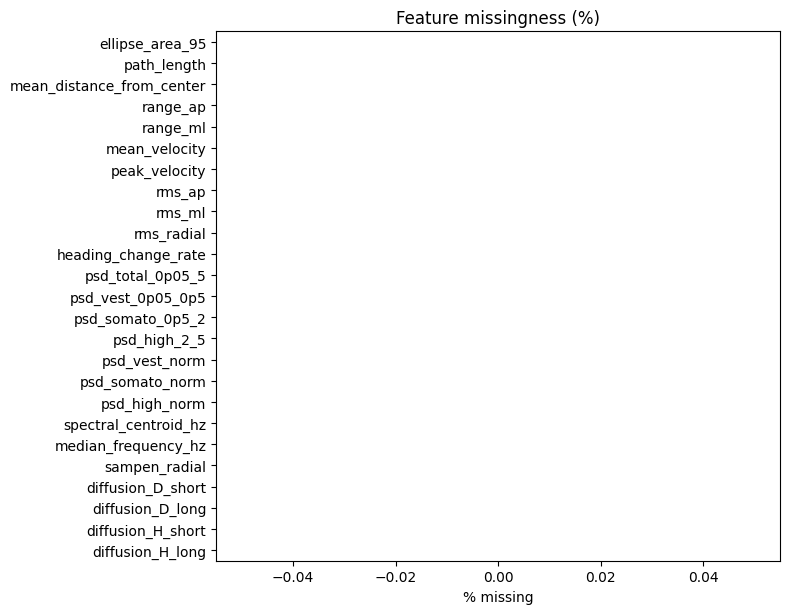

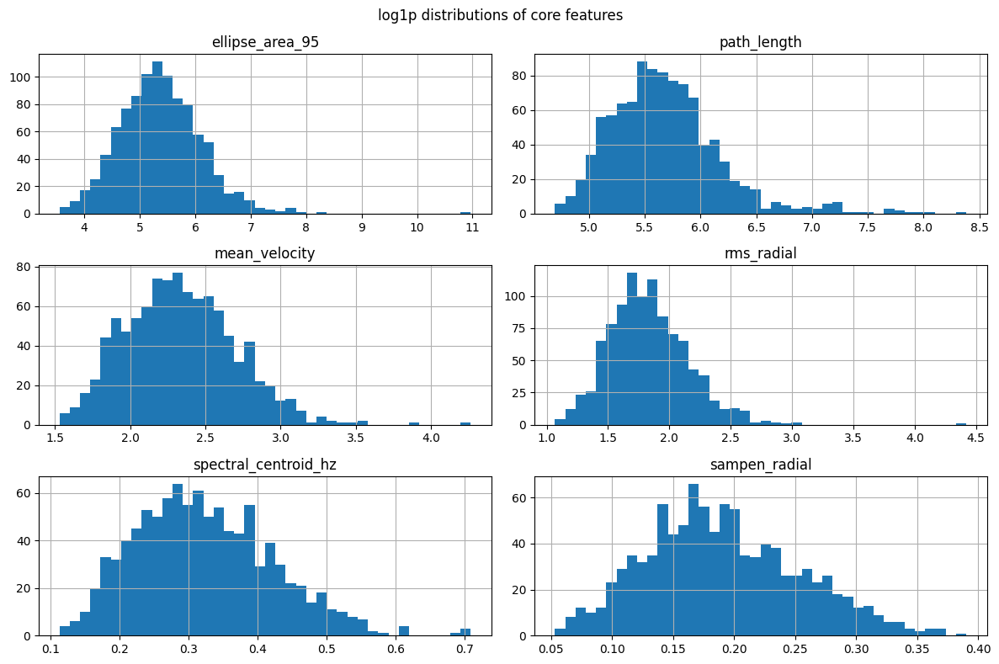

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

miss = (df[feat_cols].isna().mean().sort_values(ascending=False) * 100).to_frame("pct_missing")
plt.figure(figsize=(8, max(4, 0.25*len(miss))))
sns.barplot(x="pct_missing", y=miss.index, data=miss.reset_index(), color="steelblue")
plt.title("Feature missingness (%)")
plt.xlabel("% missing")
plt.ylabel("")
plt.tight_layout()
plt.show()

# Histograms for a few core features
core = ["ellipse_area_95","path_length","mean_velocity","rms_radial","spectral_centroid_hz","sampen_radial"]
core = [c for c in core if c in feat_cols]
df_core = df[core].copy()

df_core = np.log1p(df_core)  # many sway features are heavy-tailed
df_core.hist(bins=40, figsize=(12, 8))
plt.suptitle("log1p distributions of core features")
plt.tight_layout()
plt.show()

No missingness and no long tails seen , so no log transformation required

<Figure size 1000x500 with 0 Axes>

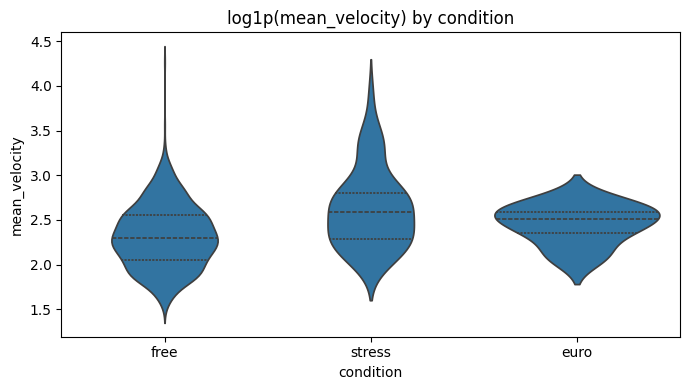

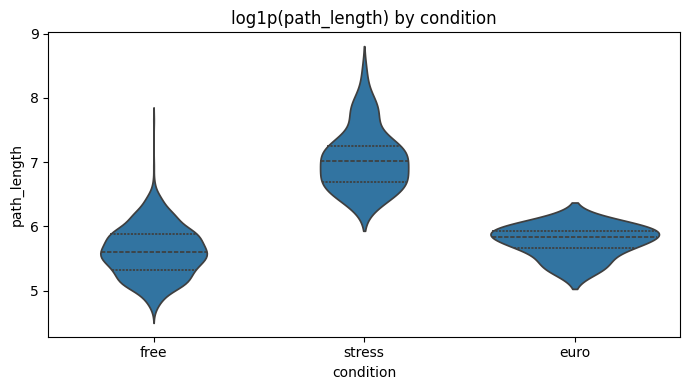

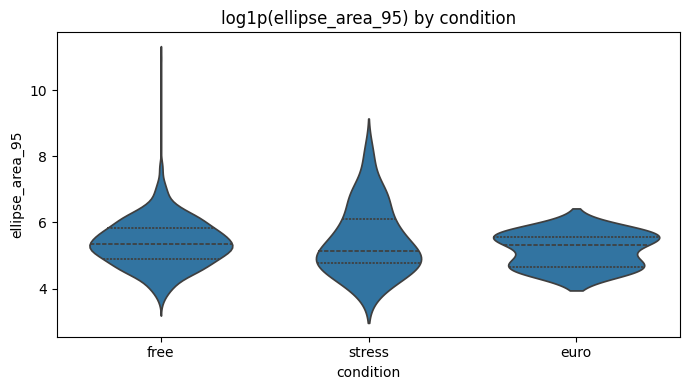

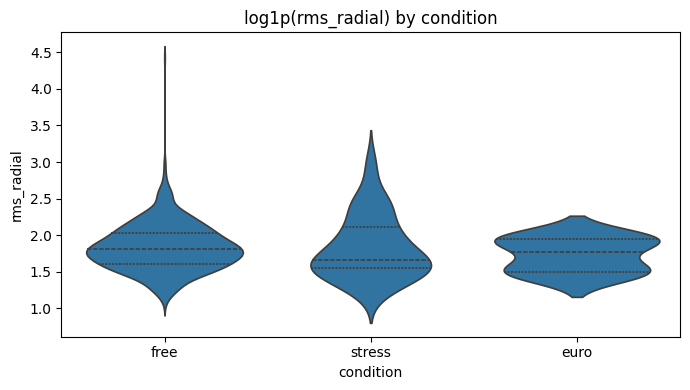

In [ ]:
plt.figure(figsize=(10, 5))
for c in ["mean_velocity", "path_length", "ellipse_area_95", "rms_radial"]:
    if c in df.columns:
        plt.figure(figsize=(7,4))
        sns.violinplot(data=df, x="condition", y=np.log1p(df[c]), inner="quartile")
        plt.title(f"log1p({c}) by condition")
        plt.tight_layout()
        plt.show()

Stress trials produce clear shift on path-length feature

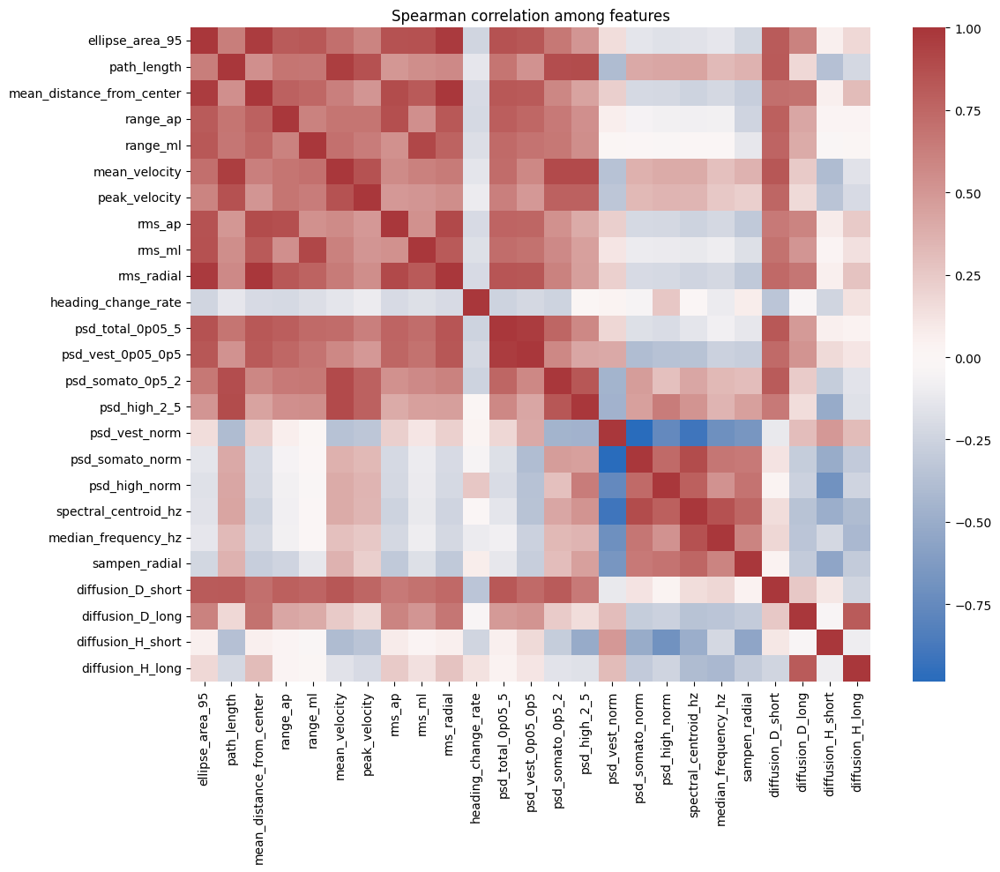

Highly correlated pairs (|rho|>0.9): 8
mean_distance_from_center       rms_radial                      rho=0.992
psd_vest_norm                   psd_somato_norm                 rho=-0.984
ellipse_area_95                 rms_radial                      rho=0.974
ellipse_area_95                 mean_distance_from_center       rho=0.966
psd_total_0p05_5                psd_vest_0p05_0p5               rho=0.964
path_length                     mean_velocity                   rho=0.955
range_ml                        rms_ml                          rho=0.914
psd_vest_norm                   spectral_centroid_hz            rho=-0.906


In [ ]:
corr = df[feat_cols].corr(method="spearman")
plt.figure(figsize=(12, 10))
sns.heatmap(corr, cmap="vlag", center=0, linewidths=0.0)
plt.title("Spearman correlation among features")
plt.tight_layout()
plt.show()

# List highly correlated pairs (|rho| > 0.9)
thr = 0.9
pairs = []
cols = corr.columns
for i in range(len(cols)):
    for j in range(i+1, len(cols)):
        r = corr.iloc[i, j]
        if np.isfinite(r) and abs(r) > thr:
            pairs.append((cols[i], cols[j], r))
pairs = sorted(pairs, key=lambda x: abs(x[2]), reverse=True)
print("Highly correlated pairs (|rho|>0.9):", len(pairs))
for a,b,r in pairs[:30]:
    print(f"{a:30s}  {b:30s}  rho={r:.3f}")

,feature,between_within_ratio
1,path_length,17.658993
13,psd_somato_0p5_2,4.503941
4,range_ml,4.236048
5,mean_velocity,2.949709
3,range_ap,2.885691
10,heading_change_rate,2.265229
6,peak_velocity,1.810326
23,diffusion_H_short,1.371197
20,sampen_radial,0.964419
17,psd_high_norm,0.953378


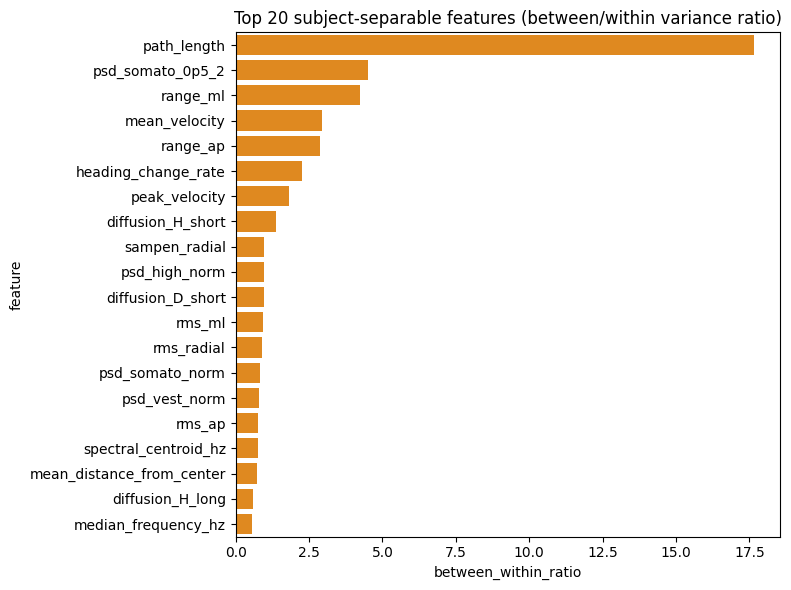

In [ ]:
def subject_separability_score(df, col):
    # higher is better for ID: between-subject variance / within-subject variance
    g = df[["subject_id", col]].dropna()
    if g.empty:
        return np.nan
    subj_means = g.groupby("subject_id")[col].mean()
    between = subj_means.var(ddof=1)
    within = g.groupby("subject_id")[col].var(ddof=1).mean()
    return float(between / (within + 1e-12))

scores = []
for c in feat_cols:
    s = subject_separability_score(df, c)
    scores.append((c, s))

scores = pd.DataFrame(scores, columns=["feature","between_within_ratio"]).sort_values("between_within_ratio", ascending=False)
display(scores.head(20))

plt.figure(figsize=(8,6))
sns.barplot(data=scores.head(20), x="between_within_ratio", y="feature", color="darkorange")
plt.title("Top 20 subject-separable features (between/within variance ratio)")
plt.tight_layout()
plt.show()

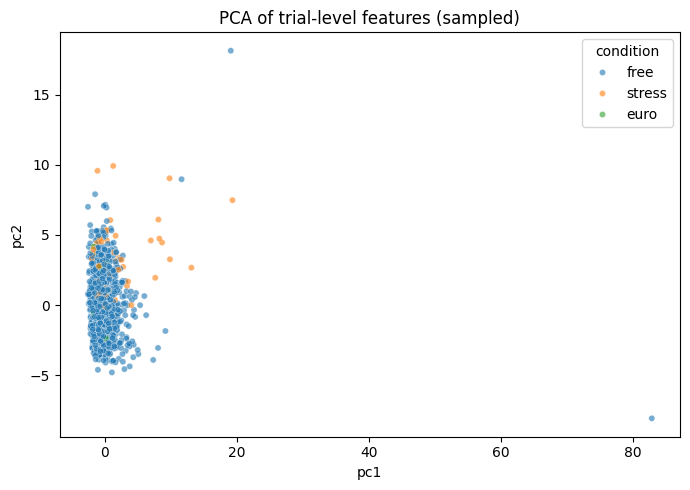

In [ ]:
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

X = df[feat_cols]
X = SimpleImputer(strategy="median").fit_transform(X)
X = StandardScaler().fit_transform(X)

pca = PCA(n_components=2, random_state=0)
Z = pca.fit_transform(X)

viz = df[["condition","subject_id"]].copy()
viz["pc1"] = Z[:,0]
viz["pc2"] = Z[:,1]

plt.figure(figsize=(7,5))
sns.scatterplot(data=viz.sample(min(2000, len(viz)), random_state=0),
                x="pc1", y="pc2", hue="condition", alpha=0.6, s=20)
plt.title("PCA of trial-level features (sampled)")
plt.tight_layout()
plt.show()

Rows (subjects): 85
Feasible Romberg subjects: 84


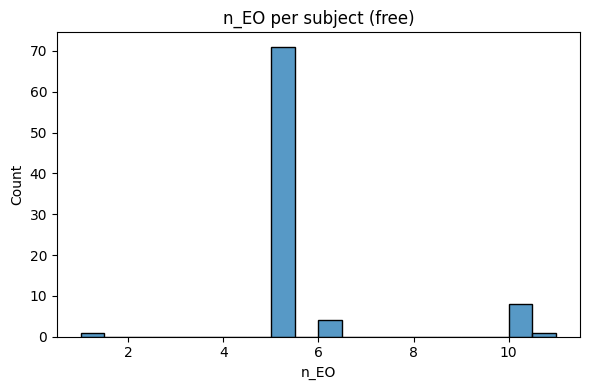

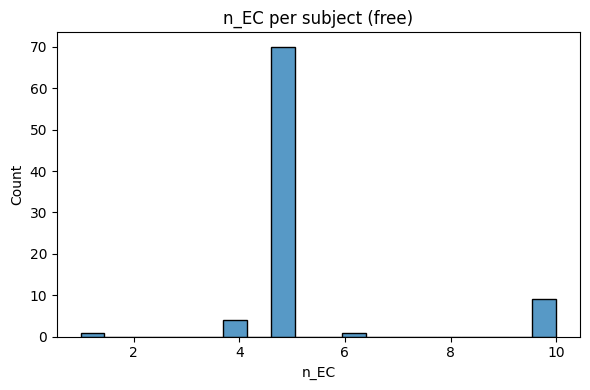

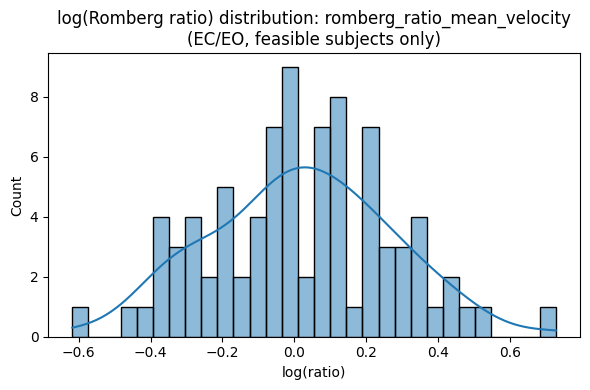

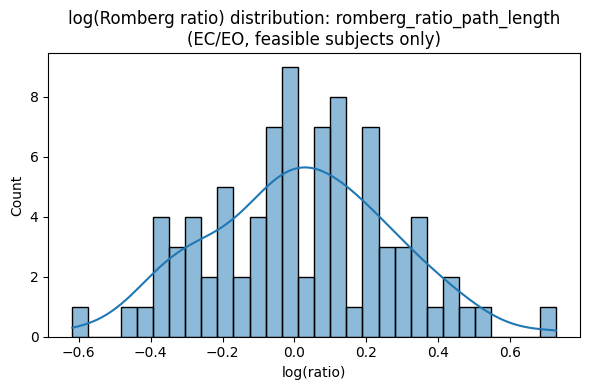

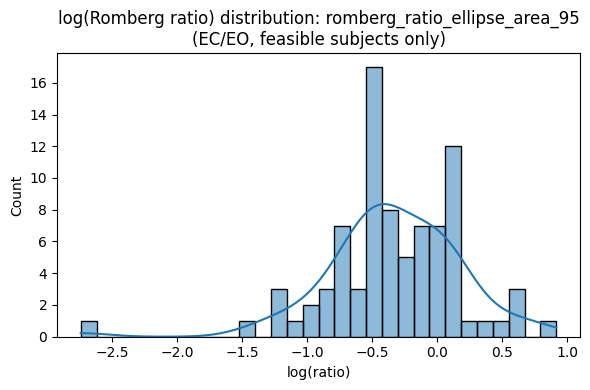

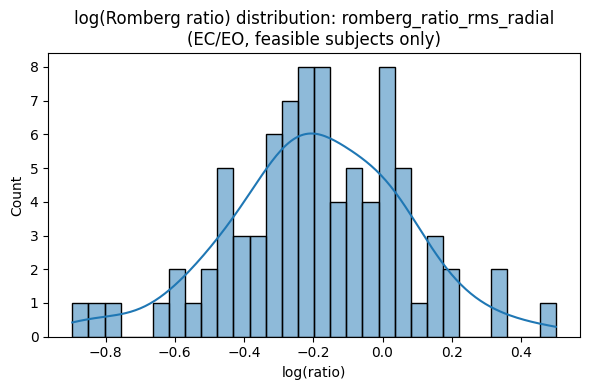

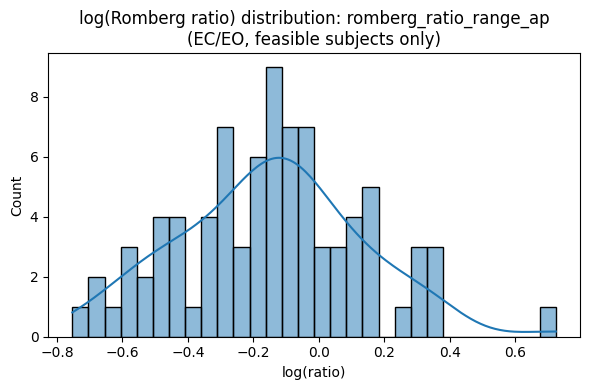

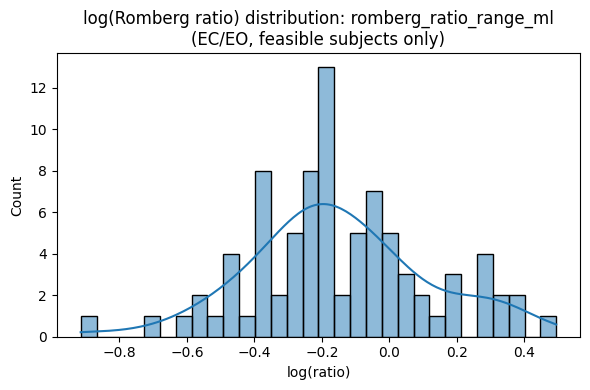

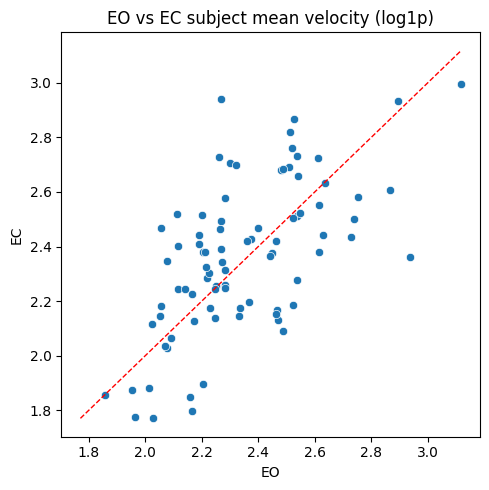

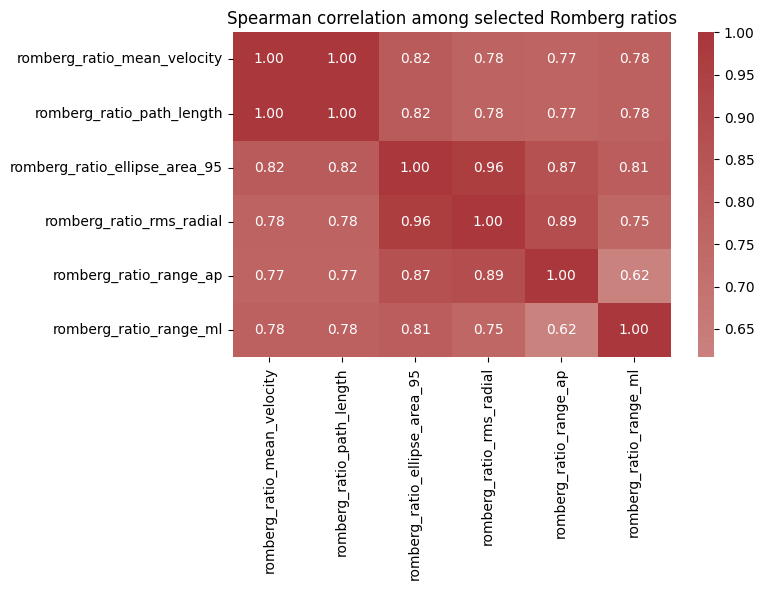

In [ ]:
#Romberg Features
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

rom = pd.read_csv("/content/subject_level_romberg_features_free_fs250.csv")

print("Rows (subjects):", len(rom))
print("Feasible Romberg subjects:", int(rom["romberg_feasible"].sum()))

# 0) Feasibility / counts
plt.figure(figsize=(6,4))
sns.histplot(rom["n_EO"], bins=20, kde=False)
plt.title("n_EO per subject (free)")
plt.tight_layout()
plt.show()

plt.figure(figsize=(6,4))
sns.histplot(rom["n_EC"], bins=20, kde=False)
plt.title("n_EC per subject (free)")
plt.tight_layout()
plt.show()

rom_ok = rom[rom["romberg_feasible"]].copy()

# Choose a few Romberg ratios to inspect
ratio_cols = [c for c in rom_ok.columns if c.startswith("romberg_ratio_")]
# pick the most standard ones if present
preferred = [
    "romberg_ratio_mean_velocity",
    "romberg_ratio_path_length",
    "romberg_ratio_ellipse_area_95",
    "romberg_ratio_rms_radial",
    "romberg_ratio_range_ap",
    "romberg_ratio_range_ml",
]
ratio_cols = [c for c in preferred if c in rom_ok.columns] or ratio_cols[:6]

# 1) Distribution of Romberg ratios (log scale)
for c in ratio_cols:
    plt.figure(figsize=(6,4))
    vals = rom_ok[c].replace([np.inf, -np.inf], np.nan).dropna()
    sns.histplot(np.log(vals), bins=30, kde=True)
    plt.title(f"log(Romberg ratio) distribution: {c}\n(EC/EO, feasible subjects only)")
    plt.xlabel("log(ratio)")
    plt.tight_layout()
    plt.show()

# 2) Compare EO vs EC means for a key feature (helps interpret Romberg)
# Example using mean_velocity if present
if "EO_mean_mean_velocity" in rom_ok.columns and "EC_mean_mean_velocity" in rom_ok.columns:
    plt.figure(figsize=(5,5))
    x = np.log1p(rom_ok["EO_mean_mean_velocity"])
    y = np.log1p(rom_ok["EC_mean_mean_velocity"])
    sns.scatterplot(x=x, y=y)
    mn = min(x.min(), y.min()); mx = max(x.max(), y.max())
    plt.plot([mn,mx],[mn,mx], "r--", linewidth=1)
    plt.title("EO vs EC subject mean velocity (log1p)")
    plt.xlabel("EO"); plt.ylabel("EC")
    plt.tight_layout()
    plt.show()

# 3) Correlation between Romberg ratios (which are redundant?)
if len(ratio_cols) >= 3:
    corr = rom_ok[ratio_cols].corr(method="spearman")
    plt.figure(figsize=(8,6))
    sns.heatmap(corr, cmap="vlag", center=0, annot=True, fmt=".2f")
    plt.title("Spearman correlation among selected Romberg ratios")
    plt.tight_layout()
    plt.show()

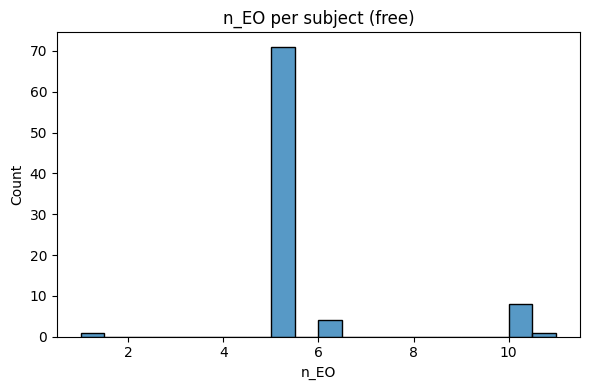

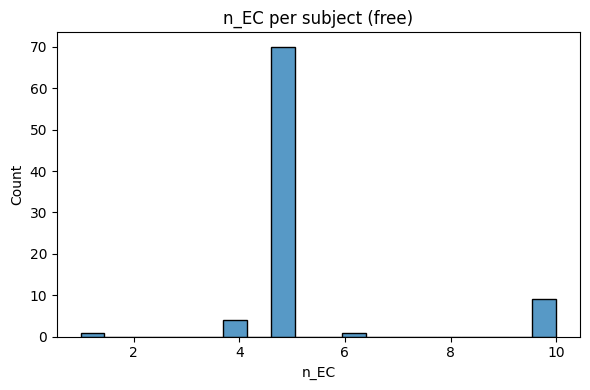

Romberg feasible: 84 / 85


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

rom = pd.read_csv("/content/subject_level_romberg_features_free_fs250.csv")

plt.figure(figsize=(6,4))
sns.histplot(rom["n_EO"], bins=20)
plt.title("n_EO per subject (free)")
plt.tight_layout(); plt.show()

plt.figure(figsize=(6,4))
sns.histplot(rom["n_EC"], bins=20)
plt.title("n_EC per subject (free)")
plt.tight_layout(); plt.show()

print("Romberg feasible:", rom["romberg_feasible"].sum(), "/", len(rom))

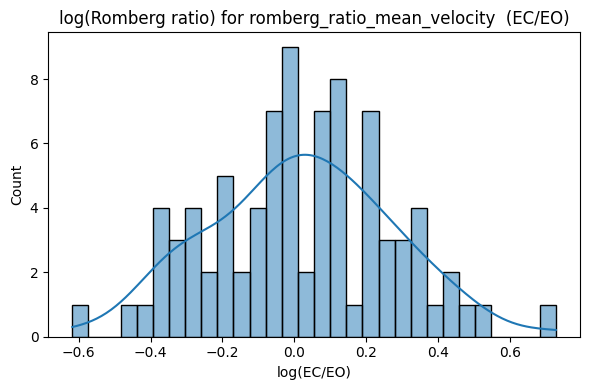

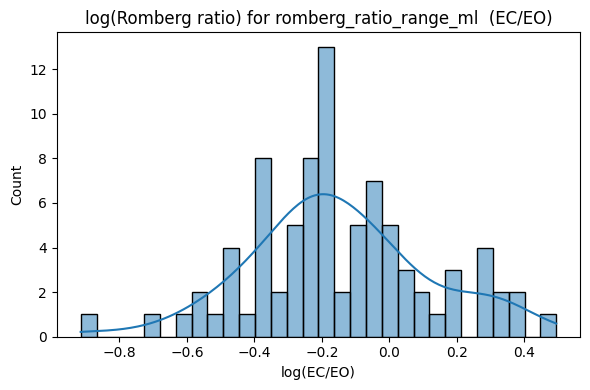

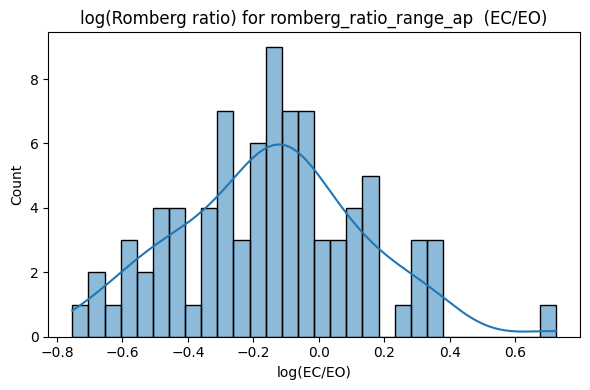

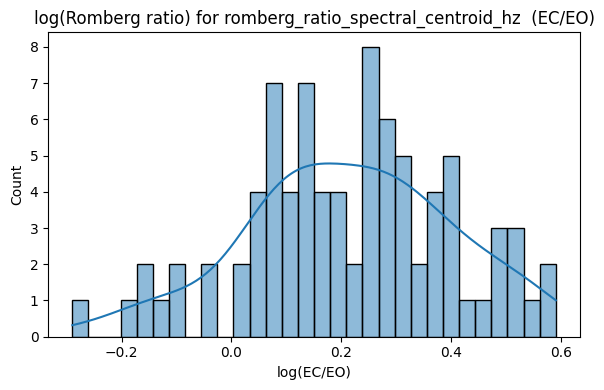

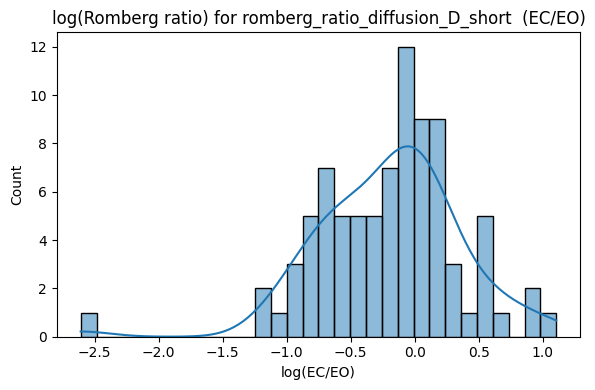

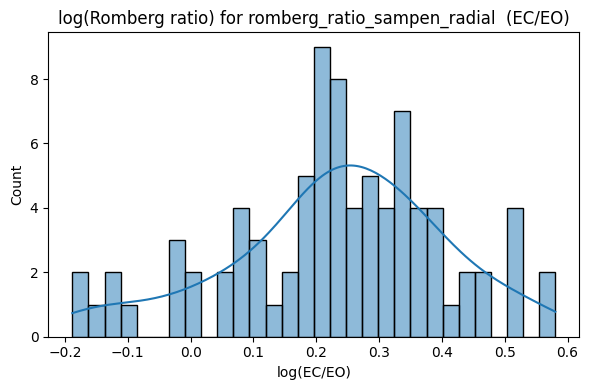

In [ ]:
import numpy as np

rom_ok = rom[rom["romberg_feasible"]].copy()

ratio_cols = [
    "romberg_ratio_mean_velocity",
    "romberg_ratio_range_ml",
    "romberg_ratio_range_ap",
    "romberg_ratio_spectral_centroid_hz",
    "romberg_ratio_diffusion_D_short",
    "romberg_ratio_sampen_radial",
]
ratio_cols = [c for c in ratio_cols if c in rom_ok.columns]

for c in ratio_cols:
    x = rom_ok[c].replace([np.inf, -np.inf], np.nan).dropna()
    plt.figure(figsize=(6,4))
    sns.histplot(np.log(x), bins=30, kde=True)
    plt.title(f"log(Romberg ratio) for {c}  (EC/EO)")
    plt.xlabel("log(EC/EO)")
    plt.tight_layout(); plt.show()

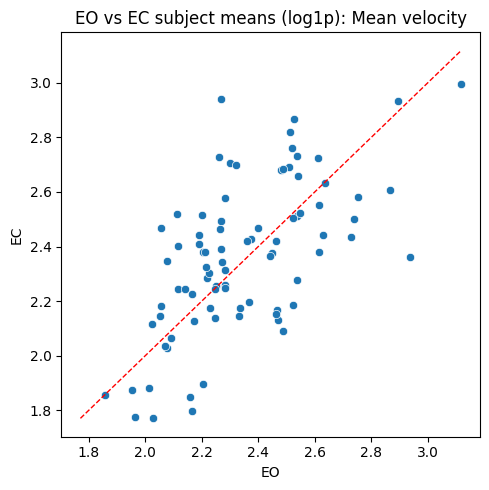

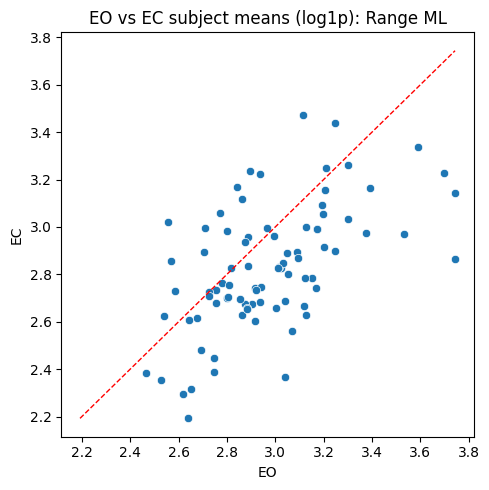

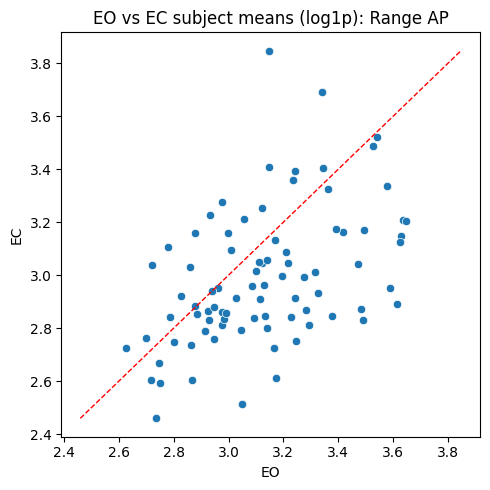

In [ ]:
pairs = [
    ("EO_mean_mean_velocity", "EC_mean_mean_velocity", "Mean velocity"),
    ("EO_mean_range_ml", "EC_mean_range_ml", "Range ML"),
    ("EO_mean_range_ap", "EC_mean_range_ap", "Range AP"),
]
for eo, ec, title in pairs:
    if eo in rom_ok.columns and ec in rom_ok.columns:
        plt.figure(figsize=(5,5))
        x = np.log1p(rom_ok[eo])
        y = np.log1p(rom_ok[ec])
        sns.scatterplot(x=x, y=y)
        mn = min(x.min(), y.min()); mx = max(x.max(), y.max())
        plt.plot([mn,mx],[mn,mx], "r--", linewidth=1)
        plt.title(f"EO vs EC subject means (log1p): {title}")
        plt.xlabel("EO"); plt.ylabel("EC")
        plt.tight_layout(); plt.show()

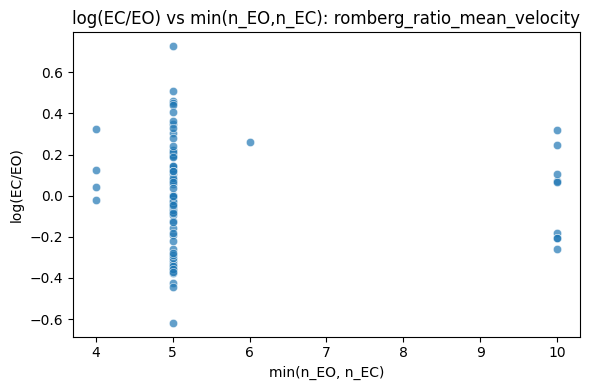

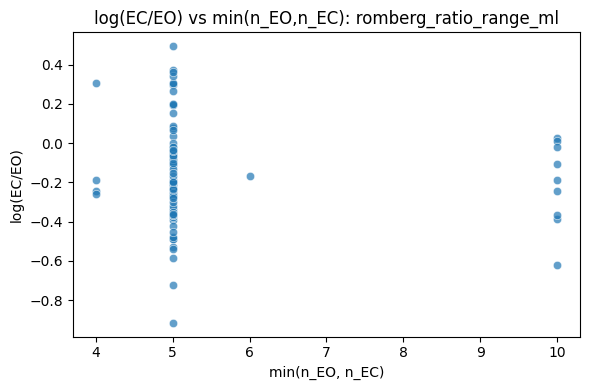

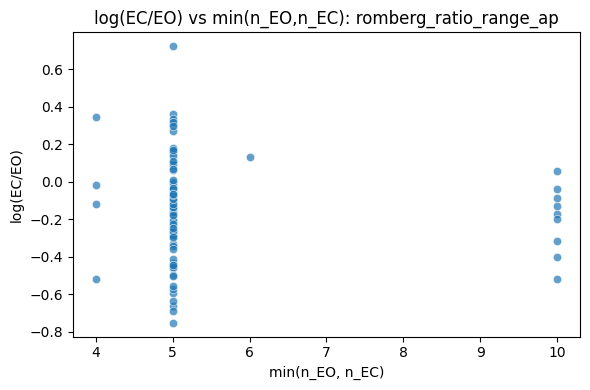

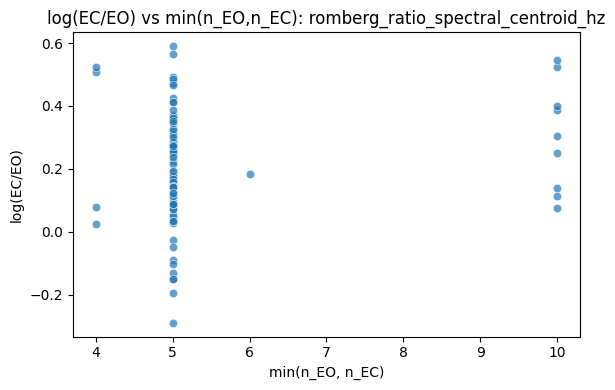

In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

rom = pd.read_csv("/content/subject_level_romberg_features_free_fs250.csv")
rom_ok = rom[rom["romberg_feasible"]].copy()

rom_ok["min_n"] = rom_ok[["n_EO","n_EC"]].min(axis=1)

for col in ["romberg_ratio_mean_velocity", "romberg_ratio_range_ml", "romberg_ratio_range_ap", "romberg_ratio_spectral_centroid_hz"]:
    if col not in rom_ok.columns:
        continue
    plt.figure(figsize=(6,4))
    sns.scatterplot(data=rom_ok, x="min_n", y=np.log(rom_ok[col]), alpha=0.7)
    plt.title(f"log(EC/EO) vs min(n_EO,n_EC): {col}")
    plt.xlabel("min(n_EO, n_EC)")
    plt.ylabel("log(EC/EO)")
    plt.tight_layout()
    plt.show()

In [ ]:
import sqlite3
import numpy as np
import pandas as pd
from scipy.signal import welch
from scipy.spatial import ConvexHull

DB_PATH = "/content/dataset.db"
FS = 250.0
MAX_FREQ = 5.0
EPS = 1e-12

MIN_SEG_SAMPLES = int(1.0 * FS)  # ignore <1s segments for PSD stability

# -------------------------
# Helpers (literature-friendly)
# -------------------------
def ellipse_area_95(x, y):
    cov = np.cov(np.vstack([x, y]))
    det = np.linalg.det(cov)
    if not np.isfinite(det) or det <= 0:
        return np.nan
    # chi2(df=2, p=0.95) = 5.991
    return float(np.pi * 5.991 * np.sqrt(det))

def convex_hull_area(x, y):
    pts = np.column_stack([x, y])
    if pts.shape[0] < 3:
        return np.nan
    pts = np.unique(pts, axis=0)
    if pts.shape[0] < 3:
        return np.nan
    try:
        hull = ConvexHull(pts)
        return float(hull.volume)  # 2D polygon area
    except Exception:
        return np.nan

def bandpower(f, pxx, lo, hi):
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.nan
    return float(np.trapezoid(pxx[m], f[m]))

def spectral_centroid(f, pxx):
    return float(np.sum(f * pxx) / (np.sum(pxx) + EPS))

def median_frequency(f, pxx):
    p = np.maximum(pxx, 0)
    c = np.cumsum(p)
    if c[-1] <= 0:
        return np.nan
    idx = np.searchsorted(c, 0.5 * c[-1])
    idx = np.clip(idx, 0, len(f) - 1)
    return float(f[idx])

def heading_change_rate(x, y, fs):
    dx = np.diff(x); dy = np.diff(y)
    ang = np.arctan2(dy, dx)
    ang = np.unwrap(ang)
    dphi = np.diff(ang)
    if len(dphi) == 0:
        return np.nan
    return float(np.mean(np.abs(dphi)) * fs)

def pca_major_axis_angle(x, y):
    cov = np.cov(np.vstack([x, y]))
    if not np.all(np.isfinite(cov)):
        return np.nan
    w, v = np.linalg.eigh(cov)
    vec = v[:, np.argmax(w)]
    return float(np.arctan2(vec[1], vec[0]))  # radians

def pca_anisotropy_ratio(x, y):
    cov = np.cov(np.vstack([x, y]))
    if not np.all(np.isfinite(cov)):
        return np.nan
    w, _ = np.linalg.eigh(cov)
    w = np.sort(w)  # ascending
    if w[0] <= 0:
        return np.nan
    return float(np.sqrt(w[1] / w[0]))  # >= 1

def robust_range(a, lo=5, hi=95):
    a = np.asarray(a)
    return float(np.nanpercentile(a, hi) - np.nanpercentile(a, lo))

def zero_cross_rate(v, fs):
    v = np.asarray(v)
    if len(v) < 3:
        return np.nan
    s = np.sign(v)
    s[s == 0] = np.nan
    s = pd.Series(s).ffill().bfill().to_numpy()
    zc = np.sum(s[1:] * s[:-1] < 0)
    dur = len(v) / fs
    return float(zc / (dur + EPS))

def normalized_jerk_speed(speed, fs):
    """
    Practical smoothness metric: normalized mean squared 2nd derivative of speed.
    Unit-robust (good if CoP in mm).
    """
    speed = np.asarray(speed)
    if len(speed) < 4:
        return np.nan
    j = np.diff(np.diff(speed)) * (fs**2)   # d^2(speed)/dt^2
    T = len(speed) / fs
    denom = (np.mean(speed) + EPS)**2
    return float((np.mean(j*j) * (T**3)) / denom)

# -------------------------
# Load metadata + segments from SQLite
# -------------------------
conn = sqlite3.connect(DB_PATH)

meta = pd.read_sql_query("""
  SELECT file_id, subject_id, condition, trial, duration_samples
  FROM metadata_cleaned
""", conn)

segs = pd.read_sql_query("""
  SELECT file_id, sample_start, sample_end, label, confidence
  FROM segment_labels
""", conn)

conn.close()

meta["condition"] = meta["condition"].astype(str).str.lower().str.strip()
segs["label"] = segs["label"].astype(str).str.lower().str.strip()

# Use in-memory signals_cleaned (must have columns: file_id, sample_num, cop_x, cop_y)
assert "signals_cleaned" in globals(), "signals_cleaned must be loaded."
S = signals_cleaned.copy()

# IMPORTANT: sample_num is 1-based, and segment_labels sample_start/end are 1-based inclusive.
# So we slice directly with sample_num between [start, end].
S = S.sort_values(["file_id", "sample_num"])
by_file = {fid: g for fid, g in S.groupby("file_id")}

seg_base = segs.merge(meta, on="file_id", how="left")

# -------------------------
# Compute segment-level (trajectory-level) features
# -------------------------
rows = []
for _, r in seg_base.iterrows():
    fid = r["file_id"]
    g = by_file.get(fid, None)
    if g is None or len(g) == 0:
        continue

    start = int(r["sample_start"])  # 1-based inclusive
    end   = int(r["sample_end"])    # 1-based inclusive
    if end < start or start < 1:
        continue

    w = g[(g["sample_num"] >= start) & (g["sample_num"] <= end)]

    x = pd.to_numeric(w["cop_x"], errors="coerce").to_numpy()  # ML
    y = pd.to_numeric(w["cop_y"], errors="coerce").to_numpy()  # AP
    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]; y = y[valid]
    n = len(x)

    if n < MIN_SEG_SAMPLES:
        continue

    # center within window to focus on sway, not absolute offset
    x = x - np.mean(x)
    y = y - np.mean(y)

    dx = np.diff(x); dy = np.diff(y)
    step = np.sqrt(dx*dx + dy*dy)

    speed = step * FS
    accel = np.diff(speed) * FS if len(speed) > 1 else np.array([])
    radial = np.sqrt(x*x + y*y)

    rec = {
        "file_id": fid,
        "subject_id": r["subject_id"],
        "condition": r["condition"],
        "trial": r["trial"],
        "segment_label": r["label"],
        "segment_confidence": r["confidence"],
        "sample_start": start,
        "sample_end": end,
        "n_samples": n,
        "duration_s": n / FS,
    }

    # Dispersion
    rec["std_ml"] = float(np.std(x))
    rec["std_ap"] = float(np.std(y))
    rec["rms_ml"] = float(np.sqrt(np.mean(x*x)))
    rec["rms_ap"] = float(np.sqrt(np.mean(y*y)))
    rec["rms_radial"] = float(np.sqrt(np.mean(radial*radial)))
    rec["robust_range_ml_p95_p5"] = robust_range(x, 5, 95)
    rec["robust_range_ap_p95_p5"] = robust_range(y, 5, 95)

    # Geometry
    rec["ellipse_area_95"] = ellipse_area_95(x, y)
    rec["convex_hull_area"] = convex_hull_area(x, y)
    rec["pca_major_axis_angle_rad"] = pca_major_axis_angle(x, y)
    rec["pca_anisotropy"] = pca_anisotropy_ratio(x, y)

    # Path / speed / effort
    rec["path_length"] = float(np.sum(step))
    rec["mean_speed"] = float(np.mean(speed)) if len(speed) else np.nan
    rec["peak_speed"] = float(np.max(speed)) if len(speed) else np.nan
    rec["speed_p95"] = float(np.percentile(speed, 95)) if len(speed) else np.nan
    rec["speed_cv"] = float(np.std(speed) / (np.mean(speed) + EPS)) if len(speed) else np.nan
    rec["mean_accel"] = float(np.mean(np.abs(accel))) if len(accel) else np.nan
    rec["peak_accel"] = float(np.max(np.abs(accel))) if len(accel) else np.nan
    rec["normalized_jerk_speed"] = normalized_jerk_speed(speed, FS)

    # Directional / intermittency proxies
    rec["heading_change_rate"] = heading_change_rate(x, y, FS)
    rec["zero_cross_vx_rate"] = zero_cross_rate(dx * FS, FS)
    rec["zero_cross_vy_rate"] = zero_cross_rate(dy * FS, FS)
    if len(speed):
        thr = np.percentile(speed, 75)
        rec["burst_fraction_speed_gt_p75"] = float(np.mean(speed > thr))
    else:
        rec["burst_fraction_speed_gt_p75"] = np.nan

    # Frequency domain (radial)
    f, pxx = welch(radial, fs=FS, nperseg=min(2048, n), detrend="constant")
    m = (f >= 0) & (f <= MAX_FREQ)
    f = f[m]; pxx = pxx[m]

    total = bandpower(f, pxx, 0.05, MAX_FREQ)
    rec["psd_total_0p05_5"] = total
    rec["psd_lf_0p05_0p5"] = bandpower(f, pxx, 0.05, 0.5)
    rec["psd_mf_0p5_2"] = bandpower(f, pxx, 0.5, 2.0)
    rec["psd_hf_2_5"] = bandpower(f, pxx, 2.0, MAX_FREQ)

    if np.isfinite(total) and total > 0:
        rec["psd_lf_norm"] = rec["psd_lf_0p05_0p5"] / (total + EPS)
        rec["psd_mf_norm"] = rec["psd_mf_0p5_2"] / (total + EPS)
        rec["psd_hf_norm"] = rec["psd_hf_2_5"] / (total + EPS)
    else:
        rec["psd_lf_norm"] = np.nan
        rec["psd_mf_norm"] = np.nan
        rec["psd_hf_norm"] = np.nan

    rec["spectral_centroid_hz"] = spectral_centroid(f, pxx)
    rec["median_frequency_hz"] = median_frequency(f, pxx)

    rows.append(rec)

seg_features = pd.DataFrame(rows)
seg_out = "/content/segment_level_features_fs250.csv"
seg_features.to_csv(seg_out, index=False)

print("Saved:", seg_out)
print("Shape:", seg_features.shape)
display(seg_features.head(10))

# -------------------------
# Derive trial-level and subject-level feature tables (from segments)
# -------------------------
id_cols = {
    "file_id","subject_id","condition","trial",
    "segment_label","segment_confidence",
    "sample_start","sample_end",
    "n_samples","duration_s",
}
feat_cols = [c for c in seg_features.columns
             if c not in id_cols and pd.api.types.is_numeric_dtype(seg_features[c])]

# Trial-level: aggregate over segments in the trial
trial_agg = (
    seg_features.groupby(["file_id","subject_id","condition","trial"], as_index=False)
                .agg(
                    n_segments=("duration_s","size"),
                    trial_segment_time_s=("duration_s","sum"),
                    **{f"{c}_mean": (c, "mean") for c in feat_cols},
                    **{f"{c}_std":  (c, "std")  for c in feat_cols},
                    **{f"{c}_p50":  (c, "median") for c in feat_cols},
                )
)

trial_out = "/content/trial_level_features_from_segments.csv"
trial_agg.to_csv(trial_out, index=False)

# Subject-level: aggregate over trials (per condition)
subj_agg = (
    trial_agg.groupby(["subject_id","condition"], as_index=False)
             .agg(
                 n_trials=("file_id","nunique"),
                 **{f"{c}_mean_over_trials": (f"{c}_mean", "mean") for c in feat_cols},
                 **{f"{c}_std_over_trials":  (f"{c}_mean", "std")  for c in feat_cols},
             )
)

subj_out = "/content/subject_level_profiles_from_segments.csv"
subj_agg.to_csv(subj_out, index=False)

print("Saved:", trial_out)
print("Saved:", subj_out)

# Optional: label occupancy per trial (fraction of time in each label)
label_time = (
    seg_features.groupby(["file_id","subject_id","condition","trial","segment_label"], as_index=False)["duration_s"]
                .sum()
)
total_time = label_time.groupby(["file_id"], as_index=False)["duration_s"].sum().rename(columns={"duration_s":"trial_time_s"})
label_time = label_time.merge(total_time, on="file_id", how="left")
label_time["label_time_frac"] = label_time["duration_s"] / label_time["trial_time_s"].clip(lower=1e-9)

label_out = "/content/trial_level_label_time_fractions.csv"
label_time.to_csv(label_out, index=False)
print("Saved:", label_out)

Saved: /content/segment_level_features_fs250.csv
Shape: (5570, 42)


,file_id,subject_id,condition,trial,segment_label,segment_confidence,sample_start,sample_end,n_samples,duration_s,...,burst_fraction_speed_gt_p75,psd_total_0p05_5,psd_lf_0p05_0p5,psd_mf_0p5_2,psd_hf_2_5,psd_lf_norm,psd_mf_norm,psd_hf_norm,spectral_centroid_hz,median_frequency_hz
0,100_proba_free_1,100,free,1,no_stress,0.837275,1,2500,2500,10.0,...,0.2501,1.729036,0.609030,0.754607,0.051058,0.352237,0.436432,0.029530,0.731448,0.610352
1,100_proba_free_1,100,free,1,no_stress,0.842356,1251,3750,2500,10.0,...,0.2501,1.097720,0.793589,0.170150,0.111310,0.722943,0.155003,0.101401,0.546836,0.244141
2,100_proba_free_1,100,free,1,no_stress,0.846284,2501,5000,2500,10.0,...,0.2501,0.867401,0.382706,0.414179,0.030921,0.441210,0.477495,0.035648,0.736611,0.488281
3,100_proba_free_1,100,free,1,no_stress,0.842369,3751,6250,2500,10.0,...,0.2501,2.663396,2.087984,0.388531,0.044352,0.783955,0.145878,0.016652,0.396097,0.244141
4,100_proba_free_10,100,free,10,no_stress,0.844481,1,2500,2500,10.0,...,0.2501,1.024309,0.622366,0.334790,0.056265,0.607596,0.326845,0.054930,0.349710,0.122070
5,100_proba_free_10,100,free,10,no_stress,0.849114,1251,3750,2500,10.0,...,0.2501,1.264428,0.158583,0.662034,0.044842,0.125419,0.523584,0.035464,0.850218,0.610352
6,100_proba_free_10,100,free,10,no_stress,0.853776,2501,5000,2500,10.0,...,0.2501,0.561877,0.424575,0.083357,0.030404,0.755636,0.148354,0.054111,0.371339,0.122070
7,100_proba_free_10,100,free,10,no_stress,0.855556,3751,6250,2500,10.0,...,0.2501,2.150303,1.720086,0.308985,0.021655,0.799927,0.143694,0.010071,0.422159,0.366211
8,100_proba_free_10,100,free,10,no_stress,0.851056,5001,7500,2500,10.0,...,0.2501,1.998208,0.770266,0.784583,0.047810,0.385479,0.392643,0.023926,0.646273,0.488281
9,100_proba_free_11,100,free,11,no_stress,0.848387,1,2500,2500,10.0,...,0.2501,1.353440,0.838428,0.295195,0.030299,0.619479,0.218107,0.022387,0.491967,0.366211


Saved: /content/trial_level_features_from_segments.csv
Saved: /content/subject_level_profiles_from_segments.csv
Saved: /content/trial_level_label_time_fractions.csv


##LOSO Validation

In [ ]:
import numpy as np
import pandas as pd

from sklearn.model_selection import LeaveOneGroupOut
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    balanced_accuracy_score, f1_score, roc_auc_score,
    average_precision_score, precision_recall_curve
)
from sklearn.inspection import permutation_importance

EPS = 1e-9

df = pd.read_csv("/content/trial_level_features_from_segments.csv")

# ---- target + groups ----
df["condition"] = df["condition"].astype(str).str.lower().str.strip()
df = df[df["condition"].isin(["free", "stress"])].copy()

y = (df["condition"] == "stress").astype(int).to_numpy()   # 1=stress, 0=free
groups = df["subject_id"].to_numpy()

# ---- feature columns (exclude metadata) ----
meta_cols = {"file_id","subject_id","condition","trial"}
feat_cols = [c for c in df.columns if c not in meta_cols and pd.api.types.is_numeric_dtype(df[c])]

X = df[feat_cols].replace([np.inf, -np.inf], np.nan)
# simple imputation: median (safe baseline)
X = X.fillna(X.median(numeric_only=True))

# ---- model: class-weighted logistic regression ----
pipe = Pipeline([
    ("scaler", StandardScaler()),
    ("clf", LogisticRegression(
        max_iter=5000,
        class_weight="balanced",   # handles imbalance
        solver="liblinear"         # stable for small-ish data
    ))
])

logo = LeaveOneGroupOut()

def tune_threshold(y_true, y_prob):
    """
    Choose threshold maximizing F1 on training data only.
    (Called inside fold using train predictions.)
    """
    prec, rec, thr = precision_recall_curve(y_true, y_prob)
    # precision_recall_curve returns thr of length n-1
    f1 = 2 * prec * rec / (prec + rec + EPS)
    best = np.nanargmax(f1)
    if best == len(thr):  # edge case when best at last point
        return 0.5
    return float(thr[best])

rows = []
importances = []

for fold, (tr, te) in enumerate(logo.split(X, y, groups=groups), start=1):
    Xtr, Xte = X.iloc[tr], X.iloc[te]
    ytr, yte = y[tr], y[te]
    subj = df.iloc[te]["subject_id"].iloc[0]

    # Fit
    pipe.fit(Xtr, ytr)

    # ---- threshold tuning on TRAIN ONLY (optional but recommended) ----
    p_tr = pipe.predict_proba(Xtr)[:, 1]
    thr = tune_threshold(ytr, p_tr)

    # Test probs/preds
    p_te = pipe.predict_proba(Xte)[:, 1]
    yhat = (p_te >= thr).astype(int)

    # Metrics (per held-out subject)
    bal_acc = balanced_accuracy_score(yte, yhat)
    macro_f1 = f1_score(yte, yhat, average="macro")

    # AUROC/AUPRC require both classes present in yte; with few trials, may fail
    auroc = np.nan
    auprc = np.nan
    if len(np.unique(yte)) == 2:
        auroc = roc_auc_score(yte, p_te)
        auprc = average_precision_score(yte, p_te)

    rows.append({
        "subject_id": int(subj),
        "n_test_trials": int(len(yte)),
        "n_test_stress": int(yte.sum()),
        "threshold": thr,
        "balanced_accuracy": bal_acc,
        "macro_f1": macro_f1,
        "auroc": auroc,
        "auprc": auprc,
    })

    # Permutation importance on this fold's test set
    # (can be noisy with few trials; we aggregate across folds)
    try:
        r = permutation_importance(
            pipe, Xte, yte,
            scoring="balanced_accuracy",
            n_repeats=50,
            random_state=0
        )
        imp = pd.DataFrame({
            "feature": feat_cols,
            "importance_mean": r.importances_mean,
            "importance_std": r.importances_std,
            "subject_id": int(subj),
        })
        importances.append(imp)
    except Exception:
        pass

per_subject = pd.DataFrame(rows).sort_values("balanced_accuracy", ascending=True)
per_subject.to_csv("/content/loso_per_subject_metrics.csv", index=False)
print("Saved /content/loso_per_subject_metrics.csv")
display(per_subject)

# Aggregate results
summary = per_subject[["balanced_accuracy","macro_f1","auroc","auprc"]].agg(["mean","std"])
print(summary)

# Feature importance aggregated across folds
if importances:
    imp_all = pd.concat(importances, ignore_index=True)
    imp_mean = (imp_all.groupby("feature", as_index=False)
                      .agg(importance_mean=("importance_mean","mean"),
                           importance_std=("importance_mean","std"))
                      .sort_values("importance_mean", ascending=False))
    imp_mean.to_csv("/content/loso_permutation_importance_bal_acc.csv", index=False)
    print("Saved /content/loso_permutation_importance_bal_acc.csv")
    display(imp_mean.head(25))

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:407: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:407: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:407: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:407: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the

Saved /content/loso_per_subject_metrics.csv


/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:407: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:407: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:407: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:407: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use th

,subject_id,n_test_trials,n_test_stress,threshold,balanced_accuracy,macro_f1,auroc,auprc
89,97,1,1,0.999394,0.00,0.000000,NaN,NaN
54,61,21,1,0.999246,0.95,0.723684,0.95,0.5
2,8,10,0,0.999278,1.00,1.000000,NaN,NaN
0,2,20,0,0.999261,1.00,1.000000,NaN,NaN
4,10,10,0,0.999276,1.00,1.000000,NaN,NaN
...,...,...,...,...,...,...,...,...
117,125,1,1,0.999305,1.00,1.000000,NaN,NaN
118,126,9,0,0.999274,1.00,1.000000,NaN,NaN
119,127,10,0,0.999275,1.00,1.000000,NaN,NaN
120,128,11,0,0.999280,1.00,1.000000,NaN,NaN


      balanced_accuracy  macro_f1     auroc     auprc
mean           0.991393  0.989538  0.995455  0.954545
std            0.090611  0.093729  0.015076  0.150756
Saved /content/loso_permutation_importance_bal_acc.csv


,feature,importance_mean,importance_std
21,n_segments,0.004999,0.019585
91,trial_segment_time_s,0.004999,0.019585
7,ellipse_area_95_p50,0.000164,0.001811
1,burst_fraction_speed_gt_p75_p50,0.000000,0.000000
4,convex_hull_area_p50,0.000000,0.000000
0,burst_fraction_speed_gt_p75_mean,0.000000,0.000000
5,convex_hull_area_std,0.000000,0.000000
6,ellipse_area_95_mean,0.000000,0.000000
8,ellipse_area_95_std,0.000000,0.000000
2,burst_fraction_speed_gt_p75_std,0.000000,0.000000


#Extracting fixed number of seconds from trials

In [ ]:
import sqlite3
import numpy as np
import pandas as pd

from scipy.signal import welch
from scipy.spatial import ConvexHull

from sklearn.model_selection import LeaveOneGroupOut
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    balanced_accuracy_score, f1_score, roc_auc_score,
    average_precision_score, confusion_matrix
)
from sklearn.inspection import permutation_importance

from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score, silhouette_score

In [ ]:
FS = 250.0
MAX_FREQ = 5.0
EPS = 1e-9

def ellipse_area_95(x, y):
    cov = np.cov(np.vstack([x, y]))
    det = np.linalg.det(cov)
    if not np.isfinite(det) or det <= 0:
        return np.nan
    return float(np.pi * 5.991 * np.sqrt(det))  # chi2 df2 95% = 5.991

def convex_hull_area(x, y):
    pts = np.column_stack([x, y])
    if pts.shape[0] < 3:
        return np.nan
    pts = np.unique(pts, axis=0)
    if pts.shape[0] < 3:
        return np.nan
    try:
        return float(ConvexHull(pts).volume)  # 2D area
    except Exception:
        return np.nan

def pca_major_axis_angle_and_anisotropy(x, y):
    cov = np.cov(np.vstack([x, y]))
    if not np.all(np.isfinite(cov)):
        return (np.nan, np.nan)
    w, v = np.linalg.eigh(cov)
    # major axis
    vec = v[:, np.argmax(w)]
    angle = float(np.arctan2(vec[1], vec[0]))
    w = np.sort(w)
    if w[0] <= 0:
        anis = np.nan
    else:
        anis = float(np.sqrt(w[1] / w[0]))
    return angle, anis

def bandpower(f, pxx, lo, hi):
    m = (f >= lo) & (f < hi)
    if not np.any(m):
        return np.nan
    return float(np.trapezoid(pxx[m], f[m]))

def spectral_centroid(f, pxx):
    return float(np.sum(f * pxx) / (np.sum(pxx) + EPS))

def median_frequency(f, pxx):
    p = np.maximum(pxx, 0)
    c = np.cumsum(p)
    if c[-1] <= 0:
        return np.nan
    idx = np.searchsorted(c, 0.5 * c[-1])
    idx = np.clip(idx, 0, len(f) - 1)
    return float(f[idx])

def heading_change_rate(x, y, fs):
    dx = np.diff(x); dy = np.diff(y)
    ang = np.arctan2(dy, dx)
    ang = np.unwrap(ang)
    dphi = np.diff(ang)
    if len(dphi) == 0:
        return np.nan
    return float(np.mean(np.abs(dphi)) * fs)

def zero_cross_rate(v, fs):
    v = np.asarray(v)
    if len(v) < 3:
        return np.nan
    s = np.sign(v)
    s[s == 0] = np.nan
    s = pd.Series(s).ffill().bfill().to_numpy()
    zc = np.sum(s[1:] * s[:-1] < 0)
    dur = len(v) / fs
    return float(zc / (dur + EPS))

def normalized_jerk_speed(speed, fs):
    # normalized mean squared 2nd derivative of speed
    speed = np.asarray(speed)
    if len(speed) < 4:
        return np.nan
    j = np.diff(np.diff(speed)) * (fs**2)
    T = len(speed) / fs
    denom = (np.mean(speed) + EPS)**2
    return float((np.mean(j*j) * (T**3)) / denom)

##Extract fixed-duration trial features (10s)

In [ ]:
DB_PATH = "/content/dataset.db"
T_sec = 10.0
T_samples = int(T_sec * FS)

# Load metadata
conn = sqlite3.connect(DB_PATH)
meta = pd.read_sql_query("""
  SELECT file_id, subject_id, condition, trial, duration_samples
  FROM metadata_cleaned
""", conn)
conn.close()
signals_cleaned = pd.read_parquet("/content/signals_cleaned.parquet")

meta["condition"] = meta["condition"].astype(str).str.lower().str.strip()
meta = meta[meta["condition"].isin(["free","stress"])].copy()

# signals_cleaned must exist in memory
assert "signals_cleaned" in globals(), "Load signals_cleaned first."
S = signals_cleaned.copy()
S = S.sort_values(["file_id","sample_num"])

# group signals by trial
by_file = {fid: g for fid, g in S.groupby("file_id")}

rows = []
for _, m in meta.iterrows():
    fid = m["file_id"]
    g = by_file.get(fid, None)
    if g is None:
        continue

    # take first T_samples from sample_num 1..T_samples (1-based)
    w = g[(g["sample_num"] >= 1) & (g["sample_num"] <= T_samples)]
    x = pd.to_numeric(w["cop_x"], errors="coerce").to_numpy()
    y = pd.to_numeric(w["cop_y"], errors="coerce").to_numpy()
    ok = np.isfinite(x) & np.isfinite(y)
    x = x[ok]; y = y[ok]
    n = len(x)

    if n < T_samples:   # drop trials shorter than T
        continue

    # center
    x = x - np.mean(x)
    y = y - np.mean(y)

    dx = np.diff(x); dy = np.diff(y)
    step = np.sqrt(dx*dx + dy*dy)
    speed = step * FS
    accel = np.diff(speed) * FS if len(speed) > 1 else np.array([])
    radial = np.sqrt(x*x + y*y)

    angle, anis = pca_major_axis_angle_and_anisotropy(x, y)

    rec = {
        "file_id": fid,
        "subject_id": int(m["subject_id"]),
        "condition": m["condition"],
        "trial": int(m["trial"]) if pd.notna(m["trial"]) else np.nan,
        "T_sec": T_sec,
        "n_samples_used": n,

        # dispersion
        "std_ml": float(np.std(x)),
        "std_ap": float(np.std(y)),
        "rms_ml": float(np.sqrt(np.mean(x*x))),
        "rms_ap": float(np.sqrt(np.mean(y*y))),
        "rms_radial": float(np.sqrt(np.mean(radial*radial))),
        "robust_range_ml_p95_p5": float(np.percentile(x,95)-np.percentile(x,5)),
        "robust_range_ap_p95_p5": float(np.percentile(y,95)-np.percentile(y,5)),

        # geometry
        "ellipse_area_95": ellipse_area_95(x, y),
        "convex_hull_area": convex_hull_area(x, y),
        "pca_major_axis_angle_rad": angle,
        "pca_anisotropy": anis,

        # path / speed
        "path_length": float(np.sum(step)),
        "mean_speed": float(np.mean(speed)) if len(speed) else np.nan,
        "peak_speed": float(np.max(speed)) if len(speed) else np.nan,
        "speed_p95": float(np.percentile(speed,95)) if len(speed) else np.nan,
        "speed_cv": float(np.std(speed)/(np.mean(speed)+EPS)) if len(speed) else np.nan,

        "mean_accel": float(np.mean(np.abs(accel))) if len(accel) else np.nan,
        "peak_accel": float(np.max(np.abs(accel))) if len(accel) else np.nan,
        "normalized_jerk_speed": normalized_jerk_speed(speed, FS),

        # intermittency
        "heading_change_rate": heading_change_rate(x, y, FS),
        "zero_cross_vx_rate": zero_cross_rate(dx*FS, FS),
        "zero_cross_vy_rate": zero_cross_rate(dy*FS, FS),
    }

    if len(speed):
        thr = np.percentile(speed, 75)
        rec["burst_fraction_speed_gt_p75"] = float(np.mean(speed > thr))
    else:
        rec["burst_fraction_speed_gt_p75"] = np.nan

    # PSD (radial)
    f, pxx = welch(radial, fs=FS, nperseg=min(2048, n), detrend="constant")
    msk = (f >= 0) & (f <= MAX_FREQ)
    f = f[msk]; pxx = pxx[msk]

    total = bandpower(f, pxx, 0.05, MAX_FREQ)
    rec["psd_total_0p05_5"] = total
    rec["psd_lf_0p05_0p5"] = bandpower(f, pxx, 0.05, 0.5)
    rec["psd_mf_0p5_2"] = bandpower(f, pxx, 0.5, 2.0)
    rec["psd_hf_2_5"] = bandpower(f, pxx, 2.0, MAX_FREQ)

    if np.isfinite(total) and total > 0:
        rec["psd_lf_norm"] = rec["psd_lf_0p05_0p5"] / (total + EPS)
        rec["psd_mf_norm"] = rec["psd_mf_0p5_2"] / (total + EPS)
        rec["psd_hf_norm"] = rec["psd_hf_2_5"] / (total + EPS)
    else:
        rec["psd_lf_norm"] = np.nan
        rec["psd_mf_norm"] = np.nan
        rec["psd_hf_norm"] = np.nan

    rec["spectral_centroid_hz"] = spectral_centroid(f, pxx)
    rec["median_frequency_hz"] = median_frequency(f, pxx)

    rows.append(rec)

trial_fixed = pd.DataFrame(rows)
out_fixed = f"/content/trial_level_features_fixedT_{int(T_sec)}s.csv"
trial_fixed.to_csv(out_fixed, index=False)
print("Saved:", out_fixed, "shape=", trial_fixed.shape)

print(trial_fixed["condition"].value_counts())
print("Subjects kept:", trial_fixed["subject_id"].nunique())

Saved: /content/trial_level_features_fixedT_10s.csv shape= (987, 38)
condition
free      934
stress     53
Name: count, dtype: int64
Subjects kept: 122


#Experiment E1: LOSO stress detection with imbalance handling + feature importance

In [ ]:
from sklearn.model_selection import LeaveOneGroupOut

df = pd.read_csv(f"/content/trial_level_features_fixedT_{int(T_sec)}s.csv")
df["condition"] = df["condition"].str.lower().str.strip()

y = (df["condition"] == "stress").astype(int).to_numpy()
groups = df["subject_id"].to_numpy()

meta_cols = {"file_id","subject_id","condition","trial","T_sec","n_samples_used"}
feat_cols = [c for c in df.columns if c not in meta_cols and pd.api.types.is_numeric_dtype(df[c])]

X = df[feat_cols].replace([np.inf,-np.inf], np.nan)
X = X.fillna(X.median(numeric_only=True))

pipe = Pipeline([
    ("scaler", StandardScaler()),
    ("clf", LogisticRegression(
        max_iter=5000,
        class_weight="balanced",
        solver="liblinear"
    ))
])

logo = LeaveOneGroupOut()

rows = []
imp_rows = []
for tr, te in logo.split(X, y, groups=groups):
    Xtr, Xte = X.iloc[tr], X.iloc[te]
    ytr, yte = y[tr], y[te]
    subj = int(df.iloc[te]["subject_id"].iloc[0])

    pipe.fit(Xtr, ytr)
    p = pipe.predict_proba(Xte)[:,1]
    yhat = (p >= 0.5).astype(int)   # fixed threshold to avoid fold weirdness

    bal = balanced_accuracy_score(yte, yhat)
    mf1 = f1_score(yte, yhat, average="macro")

    auroc = np.nan
    auprc = np.nan
    if len(np.unique(yte)) == 2:
        auroc = roc_auc_score(yte, p)
        auprc = average_precision_score(yte, p)

    tn, fp, fn, tp = confusion_matrix(yte, yhat, labels=[0,1]).ravel()

    rows.append({
        "subject_id": subj,
        "n_test_trials": int(len(yte)),
        "n_test_stress": int(yte.sum()),
        "balanced_accuracy": bal,
        "macro_f1": mf1,
        "auroc": auroc,
        "auprc": auprc,
        "tn": int(tn), "fp": int(fp), "fn": int(fn), "tp": int(tp),
    })

    # permutation importance (only if test has both classes and enough trials)
    if len(yte) >= 6 and len(np.unique(yte)) == 2:
        r = permutation_importance(
            pipe, Xte, yte,
            scoring="balanced_accuracy",
            n_repeats=100,
            random_state=0
        )
        imp = pd.DataFrame({
            "feature": feat_cols,
            "importance_mean": r.importances_mean,
            "importance_std": r.importances_std,
            "subject_id": subj
        })
        imp_rows.append(imp)

per_subject = pd.DataFrame(rows).sort_values("balanced_accuracy", ascending=True)
per_subject.to_csv("/content/loso_fixedT_per_subject_metrics.csv", index=False)
print("Saved /content/loso_fixedT_per_subject_metrics.csv")
display(per_subject)

print(per_subject[["balanced_accuracy","macro_f1","auroc","auprc"]].agg(["mean","std"]))

if imp_rows:
    imp_all = pd.concat(imp_rows, ignore_index=True)
    imp_mean = (imp_all.groupby("feature", as_index=False)
                      .agg(importance_mean=("importance_mean","mean"),
                           importance_std=("importance_mean","std"))
                      .sort_values("importance_mean", ascending=False))
    imp_mean.to_csv("/content/loso_fixedT_perm_importance_bal_acc.csv", index=False)
    print("Saved /content/loso_fixedT_perm_importance_bal_acc.csv")
    display(imp_mean.head(30))

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:407: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known lab

Saved /content/loso_fixedT_per_subject_metrics.csv


/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:407: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


,subject_id,n_test_trials,n_test_stress,balanced_accuracy,macro_f1,auroc,auprc,tn,fp,fn,tp
99,107,1,1,0.0,0.0,NaN,NaN,0,0,1,0
84,92,1,1,0.0,0.0,NaN,NaN,0,0,1,0
86,94,1,1,0.0,0.0,NaN,NaN,0,0,1,0
110,118,1,1,0.0,0.0,NaN,NaN,0,0,1,0
117,125,1,1,0.0,0.0,NaN,NaN,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...
115,123,1,1,1.0,1.0,NaN,NaN,0,0,0,1
113,121,1,1,1.0,1.0,NaN,NaN,0,0,0,1
114,122,1,1,1.0,1.0,NaN,NaN,0,0,0,1
116,124,1,1,1.0,1.0,NaN,NaN,0,0,0,1


      balanced_accuracy  macro_f1     auroc     auprc
mean           0.682950  0.507854  0.583983  0.282759
std            0.310936  0.306608  0.287747  0.185091
Saved /content/loso_fixedT_perm_importance_bal_acc.csv


,feature,importance_mean,importance_std
29,std_ml,0.068721,0.152672
21,rms_ml,0.068721,0.152672
3,heading_change_rate,0.063695,0.184879
30,zero_cross_vx_rate,0.059561,0.179329
24,robust_range_ml_p95_p5,0.058618,0.130710
23,robust_range_ap_p95_p5,0.055852,0.210849
22,rms_radial,0.053798,0.187178
9,pca_anisotropy,0.052814,0.112590
25,spectral_centroid_hz,0.048903,0.185343
7,normalized_jerk_speed,0.047968,0.142849


In [ ]:
trial_fixed.pivot_table(index="subject_id", columns="condition", values="file_id", aggfunc="count").describe()

condition,free,stress
count,85.000000,48.000000
mean,10.988235,1.104167
std,3.296803,0.308709
min,2.000000,1.000000
25%,10.000000,1.000000
50%,10.000000,1.000000
75%,10.000000,1.000000
max,21.000000,2.000000


In [ ]:
# Ablation of new features
def run_loso(X, y, groups, feat_cols, df_ref, min_imp_trials=6):
    pipe = Pipeline([
        ("scaler", StandardScaler()),
        ("clf", LogisticRegression(max_iter=5000, class_weight="balanced", solver="liblinear"))
    ])
    logo = LeaveOneGroupOut()
    rows = []
    for tr, te in logo.split(X, y, groups=groups):
        pipe.fit(X.iloc[tr], y[tr])
        p = pipe.predict_proba(X.iloc[te])[:,1]
        yhat = (p >= 0.5).astype(int)
        rows.append({
            "subject_id": int(df_ref.iloc[te]["subject_id"].iloc[0]),
            "balanced_accuracy": balanced_accuracy_score(y[te], yhat),
            "macro_f1": f1_score(y[te], yhat, average="macro"),
            "n_test_trials": int(len(te)),
            "n_test_stress": int(y[te].sum())
        })
    out = pd.DataFrame(rows)
    return out

all_cols = feat_cols
new_cols = [c for c in feat_cols if c in {
    "convex_hull_area","pca_anisotropy","normalized_jerk_speed"
}]
# (they are raw names in fixedT table, not *_mean)
classic_cols = [c for c in feat_cols if c not in new_cols and not c.startswith("psd_") and "spectral_" not in c and "median_frequency" not in c]
freq_cols = [c for c in feat_cols if c.startswith("psd_") or "spectral_centroid" in c or "median_frequency" in c]

configs = {
    "ALL": all_cols,
    "NO_NEW": [c for c in all_cols if c not in new_cols],
    "CLASSIC_ONLY": classic_cols,
    "CLASSIC+FREQ": sorted(set(classic_cols + freq_cols)),
    "NEW_ONLY": new_cols,
}

ablation_rows = []
for name, cols in configs.items():
    Xsub = X[cols]
    res = run_loso(Xsub, y, groups, cols, df)
    ablation_rows.append({
        "config": name,
        "n_features": len(cols),
        "mean_bal_acc": res["balanced_accuracy"].mean(),
        "std_bal_acc": res["balanced_accuracy"].std(),
        "mean_macro_f1": res["macro_f1"].mean(),
        "std_macro_f1": res["macro_f1"].std(),
    })

ablation = pd.DataFrame(ablation_rows).sort_values("mean_bal_acc", ascending=False)
ablation.to_csv("/content/loso_fixedT_ablation_summary.csv", index=False)
print("Saved /content/loso_fixedT_ablation_summary.csv")
display(ablation)

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:407: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known lab

Saved /content/loso_fixedT_ablation_summary.csv


,config,n_features,mean_bal_acc,std_bal_acc,mean_macro_f1,std_macro_f1
1,NO_NEW,29,0.690327,0.305155,0.507016,0.299394
3,CLASSIC+FREQ,29,0.690327,0.305155,0.507016,0.299394
0,ALL,32,0.682950,0.310936,0.507854,0.306608
4,NEW_ONLY,3,0.676916,0.342910,0.541101,0.349366
2,CLASSIC_ONLY,20,0.676446,0.326755,0.521828,0.327136


#Experiment E2: Subject verification (same vs different) with ablation + LOSO

> Add blockquote



In [ ]:
import numpy as np
import pandas as pd

from sklearn.model_selection import LeaveOneGroupOut
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, average_precision_score
from sklearn.utils import shuffle

EPS = 1e-9

df = pd.read_csv("/content/trial_level_features_fixedT_10s.csv")
df["condition"] = df["condition"].astype(str).str.lower().str.strip()

meta_cols = {"file_id","subject_id","condition","trial","T_sec","n_samples_used"}
all_feat_cols = [c for c in df.columns if c not in meta_cols and pd.api.types.is_numeric_dtype(df[c])]

NEW = {"convex_hull_area", "pca_anisotropy", "normalized_jerk_speed"}
new_cols = [c for c in all_feat_cols if c in NEW]
freq_cols = [c for c in all_feat_cols if c.startswith("psd_") or "spectral_centroid" in c or "median_frequency" in c]
control_cols = [c for c in all_feat_cols if any(k in c for k in [
    "heading_change_rate", "zero_cross", "burst_fraction",
    "mean_accel", "peak_accel", "speed_cv", "normalized_jerk"
])]
classic_cols = [c for c in all_feat_cols if c not in set(freq_cols + control_cols + new_cols)]

configs = {
    "ALL": all_feat_cols,
    "NO_NEW": [c for c in all_feat_cols if c not in new_cols],
    "CLASSIC": classic_cols,
    "CLASSIC+FREQ": sorted(set(classic_cols + freq_cols)),
    "CLASSIC+FREQ+NEW": sorted(set(classic_cols + freq_cols + new_cols)),
    "NEW_ONLY": new_cols,
}

def make_pairs(df_in, feat_cols, seed=0, neg_pos_ratio=1):
    """
    Returns:
      X_pairs: array [n_pairs, d] where row is abs(x1-x2)
      y_pairs: 1 same-subject, 0 different-subject
      g_pairs: group id (subject_id) for LOSO: we assign the positive subject_id; for negatives, use min(subj_i, subj_j)
    """
    rng = np.random.default_rng(seed)

    X = df_in[feat_cols].replace([np.inf, -np.inf], np.nan)
    X = X.fillna(X.median(numeric_only=True)).to_numpy()
    subj = df_in["subject_id"].astype(int).to_numpy()

    # indices per subject
    idx_by = {}
    for i, s in enumerate(subj):
        idx_by.setdefault(s, []).append(i)

    # positives: sample pairs within subject
    pos = []
    pos_g = []
    for s, idx in idx_by.items():
        if len(idx) < 2:
            continue
        # sample up to M positive pairs per subject
        M = min(50, len(idx) * (len(idx)-1)//2)
        for _ in range(M):
            i, j = rng.choice(idx, size=2, replace=False)
            pos.append(np.abs(X[i] - X[j]))
            pos_g.append(s)

    pos = np.asarray(pos)
    y_pos = np.ones(len(pos), dtype=int)
    pos_g = np.asarray(pos_g, dtype=int)

    # negatives: sample across different subjects
    n_neg = int(len(pos) * neg_pos_ratio)
    neg = []
    neg_g = []
    subjects = np.array(list(idx_by.keys()))
    for _ in range(n_neg):
        s1, s2 = rng.choice(subjects, size=2, replace=False)
        i = rng.choice(idx_by[int(s1)])
        j = rng.choice(idx_by[int(s2)])
        neg.append(np.abs(X[i] - X[j]))
        neg_g.append(int(min(s1, s2)))

    neg = np.asarray(neg)
    y_neg = np.zeros(len(neg), dtype=int)
    neg_g = np.asarray(neg_g, dtype=int)

    X_pairs = np.vstack([pos, neg])
    y_pairs = np.concatenate([y_pos, y_neg])
    g_pairs = np.concatenate([pos_g, neg_g])

    # shuffle pairs
    p = rng.permutation(len(y_pairs))
    return X_pairs[p], y_pairs[p], g_pairs[p]

In [ ]:
from sklearn.metrics import roc_auc_score, average_precision_score

def loso_verification_auc(df_trials, feat_cols, seed=0):
    Xp, yp, gp = make_pairs(df_trials, feat_cols, seed=seed, neg_pos_ratio=1)
    logo = LeaveOneGroupOut()

    pipe = Pipeline([
        ("scaler", StandardScaler()),
        ("clf", LogisticRegression(max_iter=5000, class_weight="balanced", solver="liblinear"))
    ])

    oof_prob = np.zeros(len(yp), dtype=float)
    valid = np.zeros(len(yp), dtype=bool)

    for tr, te in logo.split(Xp, yp, groups=gp):
        # Need both classes in train to fit
        if len(np.unique(yp[tr])) < 2:
            continue
        pipe.fit(Xp[tr], yp[tr])
        oof_prob[te] = pipe.predict_proba(Xp[te])[:, 1]
        valid[te] = True

    yv = yp[valid]
    pv = oof_prob[valid]
    auroc = roc_auc_score(yv, pv) if len(np.unique(yv)) == 2 else np.nan
    auprc = average_precision_score(yv, pv) if len(np.unique(yv)) == 2 else np.nan
    return auroc, auprc, valid.sum()

rows = []
for name, cols in configs.items():
    if len(cols) == 0:
        continue
    auroc, auprc, n_used = loso_verification_auc(df, cols, seed=0)
    rows.append({
        "experiment": "Verification_LOSO_same_vs_diff",
        "config": name,
        "n_features": len(cols),
        "AUROC": auroc,
        "AUPRC": auprc,
        "n_pairs_used": int(n_used),
    })

verif = pd.DataFrame(rows).sort_values("AUROC", ascending=False)
verif.to_csv("/content/E_verification_LOSO_ablation.csv", index=False)
print("Saved /content/E_verification_LOSO_ablation.csv")
display(verif)

Saved /content/E_verification_LOSO_ablation.csv


,experiment,config,n_features,AUROC,AUPRC,n_pairs_used
1,Verification_LOSO_same_vs_diff,NO_NEW,29,0.731071,0.689809,7702
0,Verification_LOSO_same_vs_diff,ALL,32,0.730053,0.686707,7702
4,Verification_LOSO_same_vs_diff,CLASSIC+FREQ+NEW,25,0.659220,0.618064,7702
5,Verification_LOSO_same_vs_diff,NEW_ONLY,3,0.658366,0.624394,7702
3,Verification_LOSO_same_vs_diff,CLASSIC+FREQ,22,0.631645,0.588936,7702
2,Verification_LOSO_same_vs_diff,CLASSIC,13,0.619903,0.577551,7702


##F1: Correlation of new features with classic/frequency (trial-level)


In [ ]:
import numpy as np
import pandas as pd

df = pd.read_csv("/content/trial_level_features_fixedT_10s.csv")

new_feats = ["convex_hull_area", "pca_anisotropy", "normalized_jerk_speed"]
for c in new_feats:
    assert c in df.columns, f"Missing column: {c}"

meta_cols = {"file_id","subject_id","condition","trial","T_sec","n_samples_used"}

# Coerce everything except metadata to numeric where possible
for c in df.columns:
    if c not in meta_cols:
        df[c] = pd.to_numeric(df[c], errors="coerce")

feat_cols = [c for c in df.columns if c not in meta_cols and pd.api.types.is_numeric_dtype(df[c])]

# ensure new feats are in feat_cols
print("New feats numeric dtypes:", df[new_feats].dtypes.to_dict())
print("New feats in feat_cols:", {c: (c in feat_cols) for c in new_feats})

X = df[feat_cols].replace([np.inf, -np.inf], np.nan)
X = X.fillna(X.median(numeric_only=True))

corr = X.corr(method="spearman")

# new vs all others
corr_new_vs_all = corr.loc[new_feats, :].drop(columns=new_feats, errors="ignore")
corr_new_vs_all.to_csv("/content/new_features_spearman_corr.csv", index=True)
print("Saved /content/new_features_spearman_corr.csv")

for nf in new_feats:
    print("\nTop correlations for", nf)
    display(corr_new_vs_all.loc[nf].abs().sort_values(ascending=False).head(15))

New feats numeric dtypes: {'convex_hull_area': dtype('float64'), 'pca_anisotropy': dtype('float64'), 'normalized_jerk_speed': dtype('float64')}
New feats in feat_cols: {'convex_hull_area': True, 'pca_anisotropy': True, 'normalized_jerk_speed': True}
Saved /content/new_features_spearman_corr.csv

Top correlations for convex_hull_area


,convex_hull_area
ellipse_area_95,0.975161
rms_radial,0.949870
path_length,0.874289
mean_speed,0.874289
speed_p95,0.873039
rms_ap,0.852659
std_ap,0.852659
robust_range_ap_p95_p5,0.850459
rms_ml,0.842187
std_ml,0.842187



Top correlations for pca_anisotropy


,pca_anisotropy
spectral_centroid_hz,0.354070
median_frequency_hz,0.292621
psd_lf_norm,0.282624
psd_mf_norm,0.254439
psd_hf_norm,0.232305
std_ap,0.212579
rms_ap,0.212579
robust_range_ap_p95_p5,0.197645
psd_lf_0p05_0p5,0.193873
rms_radial,0.188700



Top correlations for normalized_jerk_speed


,normalized_jerk_speed
heading_change_rate,0.884739
zero_cross_vy_rate,0.742277
zero_cross_vx_rate,0.648806
ellipse_area_95,0.281796
psd_mf_0p5_2,0.281535
psd_total_0p05_5,0.258428
rms_radial,0.255863
robust_range_ap_p95_p5,0.255816
rms_ap,0.242315
std_ap,0.242315


Verification ablation (LOSO same-vs-different): NO_NEW ≈ ALL (AUROC ~0.73) → new features don’t improve downstream performance.  
Correlation analysis: hull is almost a duplicate of ellipse/RMS/path; jerk duplicates heading/zero-cross → explains the lack of performance gain.

In [ ]:
import pandas as pd

df = pd.read_csv("/content/trial_level_features_fixedT_10s.csv")
cols = pd.Index(df.columns)

# show anything related
print("Hull-like:", [c for c in cols if "hull" in c.lower()])
print("Anisotropy-like:", [c for c in cols if "anis" in c.lower()])
print("Jerk-like:", [c for c in cols if "jerk" in c.lower()])
print("PCA angle-like:", [c for c in cols if "pca" in c.lower() or "angle" in c.lower()])

Hull-like: ['convex_hull_area']
Anisotropy-like: ['pca_anisotropy']
Jerk-like: ['normalized_jerk_speed']
PCA angle-like: ['pca_major_axis_angle_rad', 'pca_anisotropy']


In [ ]:
import pandas as pd
import numpy as np

df = pd.read_csv("/content/trial_level_features_fixedT_10s.csv")
meta_cols = {"file_id","subject_id","condition","trial","T_sec","n_samples_used"}
feat_cols = [c for c in df.columns if c not in meta_cols and pd.api.types.is_numeric_dtype(df[c])]

X = df[feat_cols].replace([np.inf, -np.inf], np.nan).fillna(df[feat_cols].median(numeric_only=True))

# within-subject mean and std across trials (pooled across conditions or you can do free-only)
g_mean = X.groupby(df["subject_id"]).mean()
g_std  = X.groupby(df["subject_id"]).std(ddof=0)

cv = (g_std / (g_mean.abs() + 1e-9)).median(axis=0)  # median CV across subjects
cv = cv.sort_values()

cv.to_csv("/content/feature_within_subject_CV_median.csv")
print("Saved /content/feature_within_subject_CV_median.csv")

print("Best (lowest CV) features:")
display(cv.head(20))

print("CV of new features:")
display(cv.loc[[c for c in ["convex_hull_area","pca_anisotropy","normalized_jerk_speed"] if c in cv.index]])

Saved /content/feature_within_subject_CV_median.csv
Best (lowest CV) features:


,0
burst_fraction_speed_gt_p75,0.000000
speed_cv,0.095221
heading_change_rate,0.106639
zero_cross_vx_rate,0.138231
zero_cross_vy_rate,0.157025
pca_anisotropy,0.226098
mean_accel,0.237227
mean_speed,0.254415
path_length,0.254415
rms_radial,0.260055


CV of new features:


,0
convex_hull_area,0.461328
pca_anisotropy,0.226098
normalized_jerk_speed,0.384265


In [ ]:
df = pd.read_csv("/content/trial_level_features_fixedT_10s.csv")
print(df["burst_fraction_speed_gt_p75"].value_counts(dropna=False).head(10))

burst_fraction_speed_gt_p75
0.2501    987
Name: count, dtype: int64


#Drop Redundant features

In [ ]:
import numpy as np
import pandas as pd

PATH = "/content/trial_level_features_fixedT_10s.csv"
df = pd.read_csv(PATH)

meta_cols = {"file_id","subject_id","condition","trial","T_sec","n_samples_used"}
feat_cols = [c for c in df.columns if c not in meta_cols and pd.api.types.is_numeric_dtype(df[c])]

# --- 1) drop constant / near-constant features ---
X = df[feat_cols].replace([np.inf, -np.inf], np.nan)
X = X.fillna(X.median(numeric_only=True))

# exact-constant
nunique = X.nunique(dropna=False)
const_cols = nunique[nunique <= 1].index.tolist()

# near-constant (optional): extremely low variance
var = X.var(axis=0, ddof=0)
near_const_cols = var[var < 1e-12].index.tolist()

drop_constant = sorted(set(const_cols + near_const_cols))

print("Constant/near-constant features to drop:", drop_constant)

# --- 2) drop redundant/noisy features you decided to remove ---
drop_manual = ["convex_hull_area", "normalized_jerk_speed", "burst_fraction_speed_gt_p75"]
drop_manual = [c for c in drop_manual if c in feat_cols]

drop_cols = sorted(set(drop_constant + drop_manual))
keep_cols = [c for c in feat_cols if c not in drop_cols]

print("Manual drop present:", drop_manual)
print("Keeping", len(keep_cols), "features; dropping", len(drop_cols))

# Save cleaned dataset (optional)
df_clean = df[["file_id","subject_id","condition","trial","T_sec","n_samples_used"] + keep_cols].copy()
out_path = "/content/trial_level_features_fixedT_10s_CLEAN.csv"
df_clean.to_csv(out_path, index=False)
print("Saved:", out_path)

Constant/near-constant features to drop: ['burst_fraction_speed_gt_p75']
Manual drop present: ['convex_hull_area', 'normalized_jerk_speed', 'burst_fraction_speed_gt_p75']
Keeping 29 features; dropping 3
Saved: /content/trial_level_features_fixedT_10s_CLEAN.csv


Rerun the verification experiment (same vs different subject) on CLEAN vs ALL

In [ ]:
import numpy as np
import pandas as pd

from sklearn.model_selection import LeaveOneGroupOut
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, average_precision_score

EPS = 1e-9

def make_pairs(df_in, feat_cols, seed=0, neg_pos_ratio=1):
    rng = np.random.default_rng(seed)

    X = df_in[feat_cols].replace([np.inf, -np.inf], np.nan)
    X = X.fillna(X.median(numeric_only=True)).to_numpy()
    subj = df_in["subject_id"].astype(int).to_numpy()

    idx_by = {}
    for i, s in enumerate(subj):
        idx_by.setdefault(s, []).append(i)

    # positives
    pos = []
    pos_g = []
    for s, idx in idx_by.items():
        if len(idx) < 2:
            continue
        M = min(50, len(idx) * (len(idx)-1)//2)
        for _ in range(M):
            i, j = rng.choice(idx, size=2, replace=False)
            pos.append(np.abs(X[i] - X[j]))
            pos_g.append(s)

    pos = np.asarray(pos)
    y_pos = np.ones(len(pos), dtype=int)
    pos_g = np.asarray(pos_g, dtype=int)

    # negatives
    n_neg = int(len(pos) * neg_pos_ratio)
    neg = []
    neg_g = []
    subjects = np.array(list(idx_by.keys()))
    for _ in range(n_neg):
        s1, s2 = rng.choice(subjects, size=2, replace=False)
        i = rng.choice(idx_by[int(s1)])
        j = rng.choice(idx_by[int(s2)])
        neg.append(np.abs(X[i] - X[j]))
        neg_g.append(int(min(s1, s2)))

    neg = np.asarray(neg)
    y_neg = np.zeros(len(neg), dtype=int)
    neg_g = np.asarray(neg_g, dtype=int)

    Xp = np.vstack([pos, neg])
    yp = np.concatenate([y_pos, y_neg])
    gp = np.concatenate([pos_g, neg_g])

    p = rng.permutation(len(yp))
    return Xp[p], yp[p], gp[p]

def loso_verification_auc(df_trials, feat_cols, seed=0):
    Xp, yp, gp = make_pairs(df_trials, feat_cols, seed=seed, neg_pos_ratio=1)
    logo = LeaveOneGroupOut()

    pipe = Pipeline([
        ("scaler", StandardScaler()),
        ("clf", LogisticRegression(max_iter=5000, class_weight="balanced", solver="liblinear"))
    ])

    oof_prob = np.zeros(len(yp), dtype=float)
    valid = np.zeros(len(yp), dtype=bool)

    for tr, te in logo.split(Xp, yp, groups=gp):
        if len(np.unique(yp[tr])) < 2:
            continue
        pipe.fit(Xp[tr], yp[tr])
        oof_prob[te] = pipe.predict_proba(Xp[te])[:, 1]
        valid[te] = True

    yv = yp[valid]
    pv = oof_prob[valid]
    auroc = roc_auc_score(yv, pv)
    auprc = average_precision_score(yv, pv)
    return auroc, auprc, valid.sum()

# Load original and cleaned
df_all = pd.read_csv("/content/trial_level_features_fixedT_10s.csv")
df_clean = pd.read_csv("/content/trial_level_features_fixedT_10s_CLEAN.csv")

meta_cols = {"file_id","subject_id","condition","trial","T_sec","n_samples_used"}
feat_all = [c for c in df_all.columns if c not in meta_cols and pd.api.types.is_numeric_dtype(df_all[c])]
feat_clean = [c for c in df_clean.columns if c not in meta_cols and pd.api.types.is_numeric_dtype(df_clean[c])]

auroc_all, auprc_all, n_all = loso_verification_auc(df_all, feat_all, seed=0)
auroc_cln, auprc_cln, n_cln = loso_verification_auc(df_clean, feat_clean, seed=0)

print("ALL   :", auroc_all, auprc_all, "pairs_used", n_all, "n_features", len(feat_all))
print("CLEAN :", auroc_cln, auprc_cln, "pairs_used", n_cln, "n_features", len(feat_clean))

ALL   : 0.7300534227418766 0.6867068918713566 pairs_used 7702 n_features 32
CLEAN : 0.7308875314636665 0.6902224587868273 pairs_used 7702 n_features 29


“We defined a Baseline feature set by removing (i) constant features and (ii) features that were empirically redundant and/or noisy across trials. Specifically, we excluded burst_fraction_speed_gt_p75 (constant at 0.2501 for all trials), convex_hull_area (high redundancy with ellipse area and RMS sway; high within-subject variability), and normalized_jerk_speed (high redundancy with heading-change and zero-crossing rates; higher within-subject variability). The remaining 29 features constituted the Baseline set.”

“In a subject-verification task (same vs. different subject) evaluated with leave-one-subject-out (LOSO) validation using pairwise absolute feature differences, the Baseline set achieved AUROC = 0.7309 and AUPRC = 0.6902, compared to AUROC = 0.7301 and AUPRC = 0.6867 when using the full feature set (32 features). Thus, removing constant/redundant/noisy features slightly improved performance while reducing dimensionality.”

In [ ]:
import numpy as np
import pandas as pd

from sklearn.model_selection import LeaveOneGroupOut
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import roc_auc_score, average_precision_score
from sklearn.ensemble import HistGradientBoostingClassifier

EPS = 1e-9

df = pd.read_csv("/content/trial_level_features_fixedT_10s_CLEAN.csv")
meta_cols = {"file_id","subject_id","condition","trial","T_sec","n_samples_used"}
feat_cols = [c for c in df.columns if c not in meta_cols and pd.api.types.is_numeric_dtype(df[c])]

def make_pairs(df_in, feat_cols, seed=0, neg_pos_ratio=1):
    rng = np.random.default_rng(seed)

    X = df_in[feat_cols].replace([np.inf, -np.inf], np.nan)
    X = X.fillna(X.median(numeric_only=True)).to_numpy()
    subj = df_in["subject_id"].astype(int).to_numpy()

    idx_by = {}
    for i, s in enumerate(subj):
        idx_by.setdefault(s, []).append(i)

    pos = []
    pos_g = []
    for s, idx in idx_by.items():
        if len(idx) < 2:
            continue
        M = min(50, len(idx) * (len(idx)-1)//2)
        for _ in range(M):
            i, j = rng.choice(idx, size=2, replace=False)
            pos.append(np.abs(X[i] - X[j]))
            pos_g.append(s)

    pos = np.asarray(pos)
    y_pos = np.ones(len(pos), dtype=int)
    pos_g = np.asarray(pos_g, dtype=int)

    n_neg = int(len(pos) * neg_pos_ratio)
    neg = []
    neg_g = []
    subjects = np.array(list(idx_by.keys()))
    for _ in range(n_neg):
        s1, s2 = rng.choice(subjects, size=2, replace=False)
        i = rng.choice(idx_by[int(s1)])
        j = rng.choice(idx_by[int(s2)])
        neg.append(np.abs(X[i] - X[j]))
        neg_g.append(int(min(s1, s2)))

    neg = np.asarray(neg)
    y_neg = np.zeros(len(neg), dtype=int)
    neg_g = np.asarray(neg_g, dtype=int)

    Xp = np.vstack([pos, neg])
    yp = np.concatenate([y_pos, y_neg])
    gp = np.concatenate([pos_g, neg_g])

    p = rng.permutation(len(yp))
    return Xp[p], yp[p], gp[p]

def loso_auc_model(model, Xp, yp, gp):
    logo = LeaveOneGroupOut()
    oof = np.zeros(len(yp), dtype=float)
    valid = np.zeros(len(yp), dtype=bool)

    for tr, te in logo.split(Xp, yp, groups=gp):
        if len(np.unique(yp[tr])) < 2:
            continue
        model.fit(Xp[tr], yp[tr])
        # hist gbdt has predict_proba
        oof[te] = model.predict_proba(Xp[te])[:, 1]
        valid[te] = True

    yv = yp[valid]
    pv = oof[valid]
    return roc_auc_score(yv, pv), average_precision_score(yv, pv), valid.sum()

# Build pairs once
Xp, yp, gp = make_pairs(df, feat_cols, seed=0, neg_pos_ratio=1)

# Strong nonlinear model
hgb = HistGradientBoostingClassifier(
    learning_rate=0.05,
    max_depth=5,
    max_iter=400,
    l2_regularization=0.0,
    random_state=0
)

auroc, auprc, n_used = loso_auc_model(hgb, Xp, yp, gp)
print("Baseline (CLEAN) with HistGradientBoosting:")
print("AUROC:", auroc, "AUPRC:", auprc, "pairs_used:", n_used)

Baseline (CLEAN) with HistGradientBoosting:
AUROC: 0.7273175191624173 AUPRC: 0.6912184769593005 pairs_used: 7702


In [ ]:
import sqlite3, pandas as pd

conn = sqlite3.connect("/content/dataset.db")
cols = pd.read_sql_query("PRAGMA table_info(metadata_cleaned);", conn)
conn.close()
print(cols[["name","type"]])

               name     type
0           file_id     TEXT
1        subject_id  INTEGER
2         condition     TEXT
3             trial  INTEGER
4  duration_samples  INTEGER


In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import LeaveOneGroupOut
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, average_precision_score

EPS=1e-9

df = pd.read_csv("/content/trial_level_features_fixedT_10s_CLEAN.csv")
meta_cols = {"file_id","subject_id","condition","trial","T_sec","n_samples_used"}
feat_cols = [c for c in df.columns if c not in meta_cols and pd.api.types.is_numeric_dtype(df[c])]

def make_pairs_enhanced(df_in, feat_cols, seed=0, neg_pos_ratio=1):
    rng = np.random.default_rng(seed)
    X = df_in[feat_cols].replace([np.inf, -np.inf], np.nan)
    X = X.fillna(X.median(numeric_only=True)).to_numpy()
    subj = df_in["subject_id"].astype(int).to_numpy()

    idx_by = {}
    for i, s in enumerate(subj):
        idx_by.setdefault(s, []).append(i)

    def phi(a, b):
        d = a - b
        return np.concatenate([np.abs(d), d*d, a + b], axis=0)

    pos, pos_g = [], []
    for s, idx in idx_by.items():
        if len(idx) < 2:
            continue
        M = min(50, len(idx) * (len(idx)-1)//2)
        for _ in range(M):
            i, j = rng.choice(idx, size=2, replace=False)
            pos.append(phi(X[i], X[j]))
            pos_g.append(s)

    pos = np.asarray(pos); pos_g = np.asarray(pos_g, dtype=int)
    y_pos = np.ones(len(pos), dtype=int)

    n_neg = int(len(pos) * neg_pos_ratio)
    neg, neg_g = [], []
    subjects = np.array(list(idx_by.keys()))
    for _ in range(n_neg):
        s1, s2 = rng.choice(subjects, size=2, replace=False)
        i = rng.choice(idx_by[int(s1)])
        j = rng.choice(idx_by[int(s2)])
        neg.append(phi(X[i], X[j]))
        neg_g.append(int(min(s1, s2)))

    neg = np.asarray(neg); neg_g = np.asarray(neg_g, dtype=int)
    y_neg = np.zeros(len(neg), dtype=int)

    Xp = np.vstack([pos, neg])
    yp = np.concatenate([y_pos, y_neg])
    gp = np.concatenate([pos_g, neg_g])

    p = rng.permutation(len(yp))
    return Xp[p], yp[p], gp[p]

Xp, yp, gp = make_pairs_enhanced(df, feat_cols, seed=0, neg_pos_ratio=1)

logo = LeaveOneGroupOut()
pipe = Pipeline([
    ("scaler", StandardScaler()),
    ("clf", LogisticRegression(max_iter=8000, class_weight="balanced", solver="liblinear"))
])

oof = np.zeros(len(yp)); valid = np.zeros(len(yp), dtype=bool)
for tr, te in logo.split(Xp, yp, groups=gp):
    if len(np.unique(yp[tr])) < 2:
        continue
    pipe.fit(Xp[tr], yp[tr])
    oof[te] = pipe.predict_proba(Xp[te])[:,1]
    valid[te] = True

auroc = roc_auc_score(yp[valid], oof[valid])
auprc = average_precision_score(yp[valid], oof[valid])
print("Enhanced pair representation AUROC:", auroc, "AUPRC:", auprc)

Enhanced pair representation AUROC: 0.7378258730276144 AUPRC: 0.6985252709637406


#T2 — Cross-condition matching (Free → Stress identity retrieval)

Goal: Enroll identity templates using free trials and identify subjects from their stress trials (domain shift).
Metric: Rank-1 / Rank-5 (optionally MRR).
Why useful: Tests whether “personal signature” persists under stress.

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.metrics.pairwise import cosine_distances

PATH = "/content/trial_level_features_fixedT_10s_CLEAN.csv"  # Baseline features
df = pd.read_csv(PATH)
df["condition"] = df["condition"].astype(str).str.lower().str.strip()

meta_cols = {"file_id","subject_id","condition","trial","T_sec","n_samples_used"}
feat_cols = [c for c in df.columns if c not in meta_cols and pd.api.types.is_numeric_dtype(df[c])]

X = df[feat_cols].replace([np.inf, -np.inf], np.nan)
X = X.fillna(X.median(numeric_only=True))

# Keep only subjects with at least 1 free and 1 stress
counts = df.groupby(["subject_id","condition"]).size().unstack(fill_value=0)
common = counts[(counts.get("free",0) >= 1) & (counts.get("stress",0) >= 1)].index
dfc = df[df["subject_id"].isin(common)].copy()
Xc = X.loc[dfc.index]

df_free = dfc[dfc["condition"]=="free"].copy()
df_stress = dfc[dfc["condition"]=="stress"].copy()
X_free = Xc.loc[df_free.index]
X_stress = Xc.loc[df_stress.index]

# Standardize using FREE only (enrollment domain)
scaler = StandardScaler()
Xf = scaler.fit_transform(X_free.values)
Xs = scaler.transform(X_stress.values)

# Templates: mean of free trials per subject
Xf_df = pd.DataFrame(Xf, index=df_free.index)
templates = Xf_df.groupby(df_free["subject_id"]).mean()  # index=subject_id

# Retrieval: stress queries vs free templates
D = cosine_distances(Xs, templates.values)
order = np.argsort(D, axis=1)
templ_ids = templates.index.to_numpy()

pred1 = templ_ids[order[:, 0]]
yq = df_stress["subject_id"].to_numpy()

rank1 = float(np.mean(pred1 == yq))
k = min(5, D.shape[1])
top5 = templ_ids[order[:, :k]]
rank5 = float(np.mean([yt in row for yt, row in zip(yq, top5)]))

# Mean Reciprocal Rank (MRR)
ranks = []
for i, yt in enumerate(yq):
    pos = np.where(templ_ids[order[i]] == yt)[0]
    ranks.append(1.0 / (1 + int(pos[0])) if len(pos) else 0.0)
mrr = float(np.mean(ranks))

print("T2 Free→Stress matching")
print("n_subjects:", len(common), "n_stress_queries:", len(df_stress))
print("rank1:", rank1, "rank5:", rank5, "MRR:", mrr)

T2 Free→Stress matching
n_subjects: 11 n_stress_queries: 12
rank1: 0.16666666666666666 rank5: 0.8333333333333334 MRR: 0.4076388888888889


In [ ]:
def bootstrap_ci_rank(order, templ_ids, yq, B=5000, seed=0):
    rng = np.random.default_rng(seed)
    n = len(yq)
    pred1 = templ_ids[order[:, 0]]
    k = min(5, len(templ_ids))
    top5 = templ_ids[order[:, :k]]

    r1 = []
    r5 = []
    mrrs = []
    for _ in range(B):
        idx = rng.integers(0, n, size=n)
        r1.append(np.mean(pred1[idx] == yq[idx]))
        r5.append(np.mean([yq[i] in top5[i] for i in idx]))
        # MRR
        rr = []
        for i in idx:
            pos = np.where(templ_ids[order[i]] == yq[i])[0]
            rr.append(1.0 / (1 + int(pos[0])) if len(pos) else 0.0)
        mrrs.append(np.mean(rr))

    def ci(a): return (float(np.percentile(a,2.5)), float(np.percentile(a,97.5)))
    return ci(r1), ci(r5), ci(mrrs)

ci_r1, ci_r5, ci_mrr = bootstrap_ci_rank(order, templ_ids, yq, B=5000, seed=0)
print("rank1 95% CI:", ci_r1)
print("rank5 95% CI:", ci_r5)
print("MRR   95% CI:", ci_mrr)

rank1 95% CI: (0.0, 0.4166666666666667)
rank5 95% CI: (0.5833333333333334, 1.0)
MRR   95% CI: (0.2576388888888889, 0.5903124999999995)


Saved /content/T2_free_to_stress_query_ranks.csv


,file_id,trial,true_subject,pred_subject_rank1,rank_of_true_subject,dist_to_pred1,dist_to_true_template,dist_margin_true_minus_best
5,68_proba_stress_1,1,68,68,1,0.220826,0.220826,0.000000
10,96_proba_stress_1,1,96,96,1,0.345514,0.345514,0.000000
0,100_proba_stress_1,1,100,116,2,0.267831,0.501539,0.233707
2,48_proba_stress_1,1,48,71,2,0.200568,0.461536,0.260968
9,73_proba_stress_2,2,73,48,2,0.425203,0.709938,0.284735
11,98_proba_stress_1,1,98,100,4,0.265762,0.673675,0.407912
8,73_proba_stress_1,1,73,100,4,0.161468,0.730141,0.568673
6,70_proba_stress_1,1,70,48,5,0.554995,0.750877,0.195882
1,116_proba_stress_1,1,116,98,5,0.129251,0.905389,0.776138
7,71_proba_stress_1,1,71,116,5,0.142077,0.953034,0.810957


Saved /content/T2_free_to_stress_rank1_confusions.csv


,true_subject,pred_subject_rank1,count
0,48,71,1
1,61,116,1
2,67,100,1
3,70,48,1
4,71,116,1
5,73,48,1
6,73,100,1
7,98,100,1
8,100,116,1
9,116,98,1


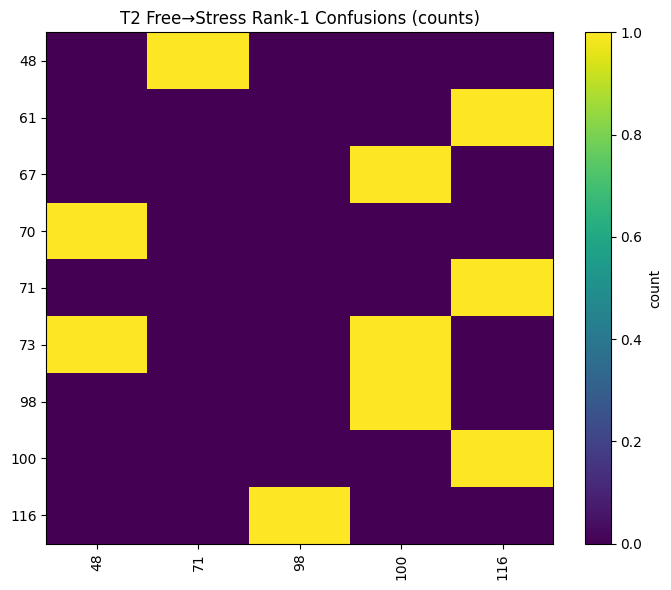

Saved /content/T2_free_to_stress_confusion_heatmap.png


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler
from sklearn.metrics.pairwise import cosine_distances

PATH = "/content/trial_level_features_fixedT_10s_CLEAN.csv"
df = pd.read_csv(PATH)
df["condition"] = df["condition"].astype(str).str.lower().str.strip()

meta_cols = {"file_id","subject_id","condition","trial","T_sec","n_samples_used"}
feat_cols = [c for c in df.columns if c not in meta_cols and pd.api.types.is_numeric_dtype(df[c])]

X = df[feat_cols].replace([np.inf, -np.inf], np.nan)
X = X.fillna(X.median(numeric_only=True))

# subjects with both conditions
counts = df.groupby(["subject_id","condition"]).size().unstack(fill_value=0)
common = counts[(counts.get("free",0) >= 1) & (counts.get("stress",0) >= 1)].index
dfc = df[df["subject_id"].isin(common)].copy()
Xc = X.loc[dfc.index]

df_free = dfc[dfc["condition"]=="free"].copy()
df_stress = dfc[dfc["condition"]=="stress"].copy()
X_free = Xc.loc[df_free.index]
X_stress = Xc.loc[df_stress.index]

# standardize using free only
scaler = StandardScaler()
Xf = scaler.fit_transform(X_free.values)
Xs = scaler.transform(X_stress.values)

# templates from free
Xf_df = pd.DataFrame(Xf, index=df_free.index)
templates = Xf_df.groupby(df_free["subject_id"]).mean()
templ_ids = templates.index.to_numpy()

# query distances
D = cosine_distances(Xs, templates.values)
order = np.argsort(D, axis=1)

true_subj = df_stress["subject_id"].astype(int).to_numpy()
pred1 = templ_ids[order[:, 0]]

# rank of true subject for each query
rank_true = []
dist_pred1 = []
dist_true = []
margin_true_vs_best = []

for i, yt in enumerate(true_subj):
    ranked_ids = templ_ids[order[i]]
    pos = np.where(ranked_ids == yt)[0]
    r = int(pos[0]) + 1 if len(pos) else (len(ranked_ids) + 1)
    rank_true.append(r)

    dist_pred1.append(float(D[i, order[i,0]]))
    # distance to true subject template
    j_true = np.where(templ_ids == yt)[0]
    dt = float(D[i, j_true[0]]) if len(j_true) else np.nan
    dist_true.append(dt)
    margin_true_vs_best.append(dt - float(D[i, order[i,0]]) if np.isfinite(dt) else np.nan)

rank_df = pd.DataFrame({
    "file_id": df_stress["file_id"].to_numpy(),
    "trial": df_stress["trial"].to_numpy(),
    "true_subject": true_subj,
    "pred_subject_rank1": pred1,
    "rank_of_true_subject": rank_true,
    "dist_to_pred1": dist_pred1,
    "dist_to_true_template": dist_true,
    "dist_margin_true_minus_best": margin_true_vs_best
}).sort_values(["rank_of_true_subject","dist_margin_true_minus_best"], ascending=[True, True])

rank_df.to_csv("/content/T2_free_to_stress_query_ranks.csv", index=False)
print("Saved /content/T2_free_to_stress_query_ranks.csv")
display(rank_df)

# confusion-style table only for rank-1 failures
fail = rank_df[rank_df["pred_subject_rank1"] != rank_df["true_subject"]].copy()
conf = (fail.groupby(["true_subject","pred_subject_rank1"])
            .size()
            .reset_index(name="count")
            .sort_values("count", ascending=False))
conf.to_csv("/content/T2_free_to_stress_rank1_confusions.csv", index=False)
print("Saved /content/T2_free_to_stress_rank1_confusions.csv")
display(conf)

# optional heatmap (only if enough failures)
if len(fail) > 0:
    pivot = fail.pivot_table(index="true_subject", columns="pred_subject_rank1", values="file_id", aggfunc="count", fill_value=0)

    plt.figure(figsize=(7, 6))
    plt.imshow(pivot.values, aspect="auto")
    plt.xticks(range(pivot.shape[1]), pivot.columns, rotation=90)
    plt.yticks(range(pivot.shape[0]), pivot.index)
    plt.colorbar(label="count")
    plt.title("T2 Free→Stress Rank-1 Confusions (counts)")
    plt.tight_layout()
    plt.savefig("/content/T2_free_to_stress_confusion_heatmap.png", dpi=200)
    plt.show()
    print("Saved /content/T2_free_to_stress_confusion_heatmap.png")

#T5 — Trial order / drift detection (early vs late) using free trials

Implementation
For each subject with ≥10 free trials (adjustable):

early = first 20% of trials
late = last 20% of trials Ignore middle 60% to make the classes distinct.

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import LeaveOneGroupOut
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import balanced_accuracy_score, average_precision_score

df = pd.read_csv(PATH)
df["condition"] = df["condition"].astype(str).str.lower().str.strip()

meta_cols = {"file_id","subject_id","condition","trial","T_sec","n_samples_used"}
feat_cols = [c for c in df.columns if c not in meta_cols and pd.api.types.is_numeric_dtype(df[c])]

X = df[feat_cols].replace([np.inf, -np.inf], np.nan)
X = X.fillna(X.median(numeric_only=True))

df_free = df[df["condition"]=="free"].copy()
df_free = df_free.dropna(subset=["trial"])
df_free["trial"] = df_free["trial"].astype(int)

min_trials = 10
rows = []
idx_keep = []

for subj, g in df_free.groupby("subject_id"):
    g = g.sort_values("trial")
    if len(g) < min_trials:
        continue

    n = len(g)
    k = max(1, int(0.2 * n))
    early = g.head(k).index
    late = g.tail(k).index

    df_free.loc[early, "early_late"] = 0
    df_free.loc[late, "early_late"] = 1

    idx_keep.extend(list(early))
    idx_keep.extend(list(late))

df_el = df_free.loc[idx_keep].copy()
df_el["early_late"] = df_el["early_late"].astype(int)

y = df_el["early_late"].to_numpy()
groups = df_el["subject_id"].to_numpy()
X_el = X.loc[df_el.index]

pipe = Pipeline([
    ("scaler", StandardScaler()),
    ("clf", LogisticRegression(max_iter=5000, class_weight="balanced", solver="liblinear"))
])

logo = LeaveOneGroupOut()
probs = np.zeros(len(df_el))
preds = np.zeros(len(df_el), dtype=int)

for tr, te in logo.split(X_el, y, groups=groups):
    pipe.fit(X_el.iloc[tr], y[tr])
    p = pipe.predict_proba(X_el.iloc[te])[:,1]
    probs[te] = p
    preds[te] = (p >= 0.5).astype(int)

bal = balanced_accuracy_score(y, preds)
auprc = average_precision_score(y, probs)

summary = {
    "n_subjects": int(df_el["subject_id"].nunique()),
    "n_samples": int(len(df_el)),
    "balanced_accuracy": float(bal),
    "auprc": float(auprc),
    "min_trials_required": int(min_trials),
    "fraction_used_per_subject": 0.4
}

pd.DataFrame([summary]).to_csv("/content/T5_early_late_free_LOSO_summary.csv", index=False)
df_el.assign(prob_late=probs, pred_late=preds).to_csv("/content/T5_early_late_free_LOSO_predictions.csv", index=False)

print("Saved /content/T5_early_late_free_LOSO_summary.csv and predictions.")
print(summary)

Saved /content/T5_early_late_free_LOSO_summary.csv and predictions.
{'n_subjects': 80, 'n_samples': 356, 'balanced_accuracy': 0.7303370786516854, 'auprc': 0.7243132760853405, 'min_trials_required': 10, 'fraction_used_per_subject': 0.4}


##Confusion Matrix

T5 confusion matrix [[TN,FP],[FN,TP]]:
 [[127  51]
 [ 45 133]]
{'TN': 127, 'FP': 51, 'FN': 45, 'TP': 133}
Balanced accuracy: 0.7303370786516854


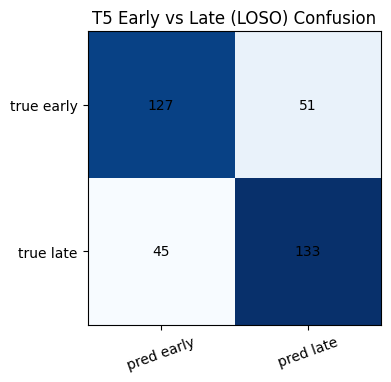

Saved /content/T5_confusion_matrix.png
Saved /content/T5_per_subject_metrics.csv


,subject_id,n_samples,balanced_accuracy
9,15,8,0.00
23,29,4,0.25
57,64,4,0.25
10,16,8,0.50
12,18,4,0.50
19,25,4,0.50
16,22,4,0.50
4,10,4,0.50
18,24,4,0.50
26,32,4,0.50


,subject_id,n_samples,balanced_accuracy
3,9,4,1.0
1,7,4,1.0
2,8,4,1.0
11,17,4,1.0
62,71,4,1.0
53,60,4,1.0
49,56,4,1.0
40,46,4,1.0
43,49,4,1.0
42,48,8,1.0


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, balanced_accuracy_score

pred_path = "/content/T5_early_late_free_LOSO_predictions.csv"
dfp = pd.read_csv(pred_path)

y = dfp["early_late"].astype(int).to_numpy()
pred = dfp["pred_late"].astype(int).to_numpy()

cm = confusion_matrix(y, pred, labels=[0,1])
tn, fp, fn, tp = cm.ravel()

print("T5 confusion matrix [[TN,FP],[FN,TP]]:\n", cm)
print({"TN": int(tn), "FP": int(fp), "FN": int(fn), "TP": int(tp)})
print("Balanced accuracy:", balanced_accuracy_score(y, pred))

# plot
plt.figure(figsize=(4,4))
plt.imshow(cm, cmap="Blues")
plt.xticks([0,1], ["pred early","pred late"], rotation=20)
plt.yticks([0,1], ["true early","true late"])
for (i,j), v in np.ndenumerate(cm):
    plt.text(j, i, str(v), ha="center", va="center")
plt.title("T5 Early vs Late (LOSO) Confusion")
plt.tight_layout()
plt.savefig("/content/T5_confusion_matrix.png", dpi=200)
plt.show()
print("Saved /content/T5_confusion_matrix.png")

# per-subject balanced accuracy
rows = []
for subj, g in dfp.groupby("subject_id"):
    ys = g["early_late"].astype(int).to_numpy()
    ps = g["pred_late"].astype(int).to_numpy()
    if len(np.unique(ys)) < 2:
        continue
    rows.append({
        "subject_id": int(subj),
        "n_samples": int(len(g)),
        "balanced_accuracy": float(balanced_accuracy_score(ys, ps))
    })

per_subj = pd.DataFrame(rows).sort_values("balanced_accuracy")
per_subj.to_csv("/content/T5_per_subject_metrics.csv", index=False)
print("Saved /content/T5_per_subject_metrics.csv")
display(per_subj.head(20))
display(per_subj.tail(20))

In [ ]:
import numpy as np
import pandas as pd

from sklearn.model_selection import LeaveOneGroupOut
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.inspection import permutation_importance

PATH = "/content/trial_level_features_fixedT_10s_CLEAN.csv"
df = pd.read_csv(PATH)
df["condition"] = df["condition"].astype(str).str.lower().str.strip()

meta_cols = {"file_id","subject_id","condition","trial","T_sec","n_samples_used"}
feat_cols = [c for c in df.columns if c not in meta_cols and pd.api.types.is_numeric_dtype(df[c])]

# construct early/late dataset exactly as before
Xall = df[feat_cols].replace([np.inf, -np.inf], np.nan).fillna(df[feat_cols].median(numeric_only=True))
df_free = df[df["condition"]=="free"].copy()
df_free["trial"] = df_free["trial"].astype(int)

min_trials = 10
idx_keep = []
labels = {}

for subj, g in df_free.groupby("subject_id"):
    g = g.sort_values("trial")
    if len(g) < min_trials:
        continue
    n = len(g)
    k = max(1, int(0.2 * n))
    early = g.head(k).index
    late  = g.tail(k).index
    for i in early:
        labels[i] = 0
    for i in late:
        labels[i] = 1
    idx_keep.extend(list(early))
    idx_keep.extend(list(late))

df_el = df_free.loc[idx_keep].copy()
df_el["early_late"] = df_el.index.map(labels).astype(int)

X = Xall.loc[df_el.index]
y = df_el["early_late"].to_numpy()
groups = df_el["subject_id"].to_numpy()

pipe = Pipeline([
    ("scaler", StandardScaler()),
    ("clf", LogisticRegression(max_iter=5000, class_weight="balanced", solver="liblinear"))
])

# Fit once on full data for permutation importance (note: importance is not LOSO-conditional, but still useful)
pipe.fit(X, y)
perm = permutation_importance(pipe, X, y, scoring="balanced_accuracy", n_repeats=100, random_state=0)

imp = pd.DataFrame({
    "feature": feat_cols,
    "importance_mean": perm.importances_mean,
    "importance_std": perm.importances_std
}).sort_values("importance_mean", ascending=False)

imp.to_csv("/content/T5_feature_importance_perm_bal_acc.csv", index=False)
print("Saved /content/T5_feature_importance_perm_bal_acc.csv")
display(imp.head(30))

Saved /content/T5_feature_importance_perm_bal_acc.csv


,feature,importance_mean,importance_std
11,mean_speed,0.213258,0.022781
10,path_length,0.213258,0.022781
6,robust_range_ap_p95_p5,0.064860,0.015539
17,heading_change_rate,0.054242,0.015603
13,speed_p95,0.034719,0.012876
12,peak_speed,0.029213,0.011844
8,pca_major_axis_angle_rad,0.027528,0.010213
27,spectral_centroid_hz,0.024494,0.010548
1,std_ap,0.022837,0.011490
3,rms_ap,0.022837,0.011490


Plotting features: ['mean_speed', 'path_length', 'rms_radial', 'ellipse_area_95', 'heading_change_rate', 'zero_cross_vx_rate', 'zero_cross_vy_rate', 'spectral_centroid_hz', 'median_frequency_hz', 'pca_anisotropy']


/tmp/ipykernel_5684/2398759012.py:38: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_centers = dZ.groupby(bins)["trial"].mean()
/tmp/ipykernel_5684/2398759012.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  y_mean = dZ.groupby(bins)[f].mean()
/tmp/ipykernel_5684/2398759012.py:44: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  y_sem  = dZ.groupby(bins)[f].sem()


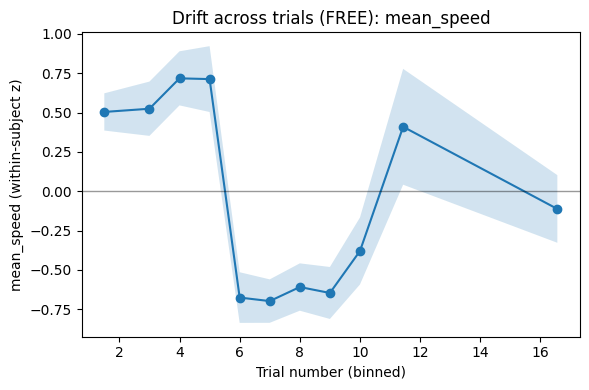

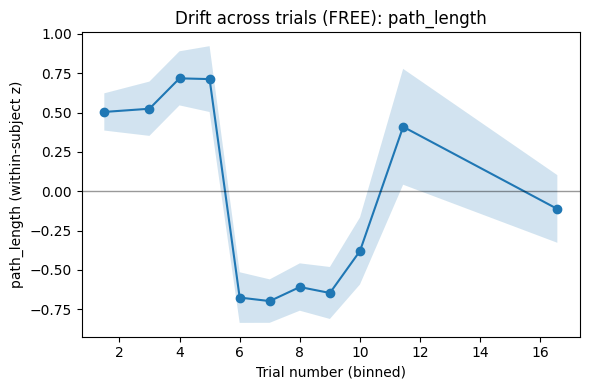

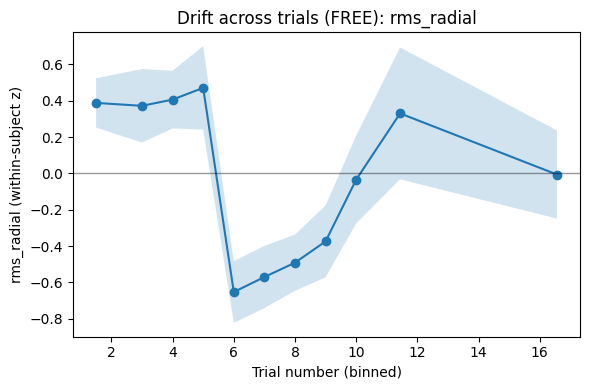

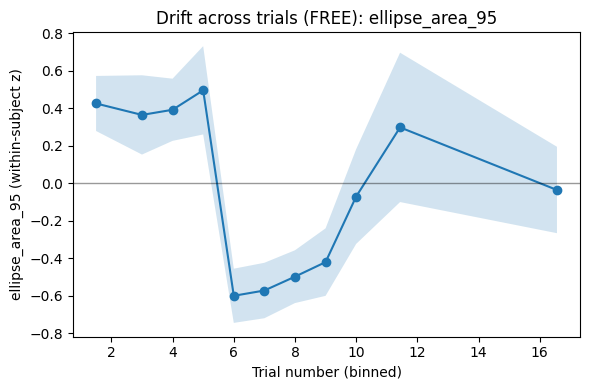

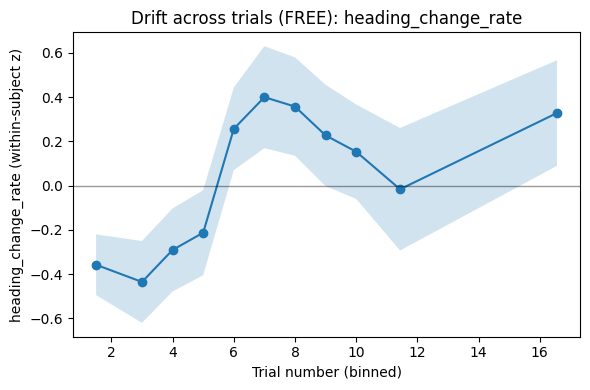

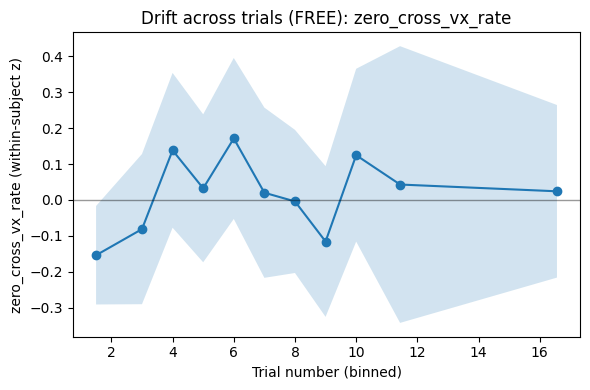

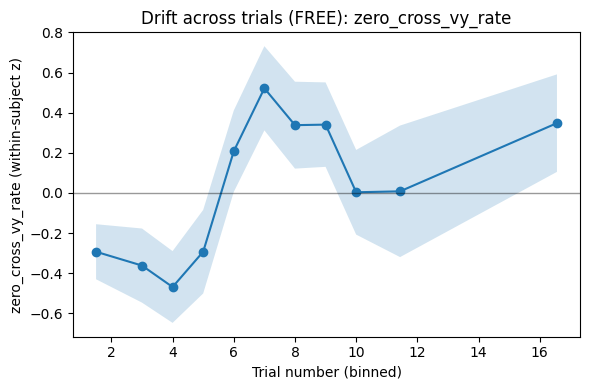

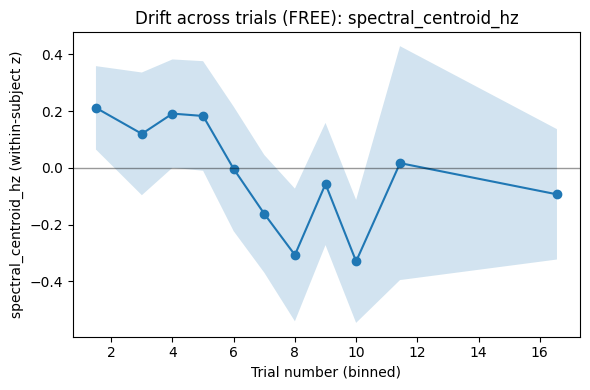

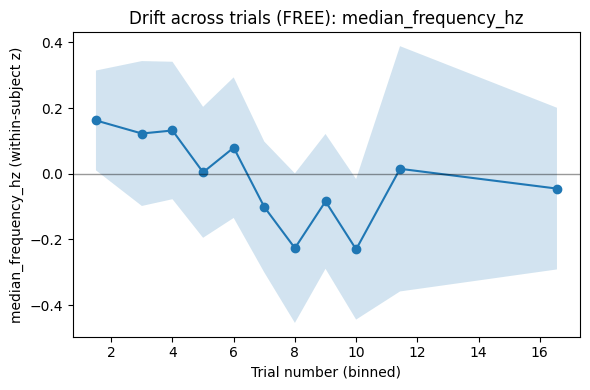

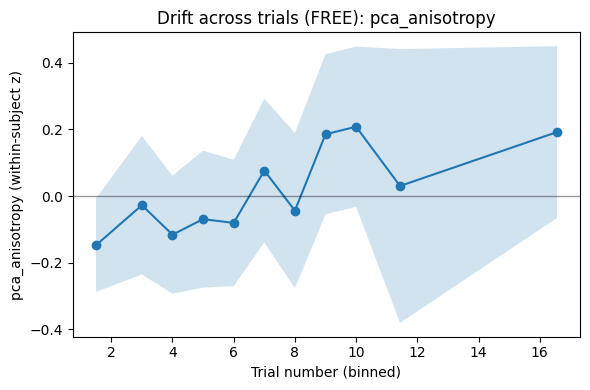

Saved drift plots to /content/T5_drift_<feature>.png


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

PATH = "/content/trial_level_features_fixedT_10s_CLEAN.csv"
df = pd.read_csv(PATH)
df["condition"] = df["condition"].astype(str).str.lower().str.strip()

meta_cols = {"file_id","subject_id","condition","trial","T_sec","n_samples_used"}
feat_cols = [c for c in df.columns if c not in meta_cols and pd.api.types.is_numeric_dtype(df[c])]

# use FREE only for trial drift
d = df[df["condition"]=="free"].copy()
d = d.dropna(subset=["trial"])
d["trial"] = d["trial"].astype(int)

# numeric matrix
X = d[feat_cols].replace([np.inf, -np.inf], np.nan)
X = X.fillna(X.median(numeric_only=True))

# within-subject z-score to remove subject offsets
Z = X.groupby(d["subject_id"]).transform(lambda s: (s - s.mean()) / (s.std(ddof=0) + 1e-9))
dZ = pd.concat([d[["subject_id","trial"]].reset_index(drop=True), Z.reset_index(drop=True)], axis=1)

# choose a set of key features to plot (edit as you like)
key_feats = [
    "mean_speed","path_length","rms_radial","ellipse_area_95",
    "heading_change_rate","zero_cross_vx_rate","zero_cross_vy_rate",
    "spectral_centroid_hz","median_frequency_hz","pca_anisotropy"
]
key_feats = [f for f in key_feats if f in feat_cols]

print("Plotting features:", key_feats)

# bin trials to reduce noise (because subjects have different trial ranges)
n_bins = 12
bins = pd.qcut(dZ["trial"], q=n_bins, duplicates="drop")
bin_centers = dZ.groupby(bins)["trial"].mean()

outdir = "/content"
for f in key_feats:
    y = dZ[f]
    y_mean = dZ.groupby(bins)[f].mean()
    y_sem  = dZ.groupby(bins)[f].sem()

    plt.figure(figsize=(6,4))
    plt.plot(bin_centers, y_mean, marker="o")
    plt.fill_between(bin_centers, y_mean - 1.96*y_sem, y_mean + 1.96*y_sem, alpha=0.2)
    plt.axhline(0, color="k", lw=1, alpha=0.4)
    plt.xlabel("Trial number (binned)")
    plt.ylabel(f"{f} (within-subject z)")
    plt.title(f"Drift across trials (FREE): {f}")
    plt.tight_layout()
    plt.savefig(f"{outdir}/T5_drift_{f}.png", dpi=200)
    plt.show()

print("Saved drift plots to /content/T5_drift_<feature>.png")

#Alternative: per-subject slope distribution (simple, very interpretable)

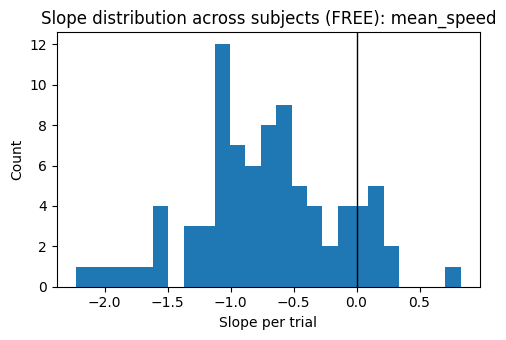

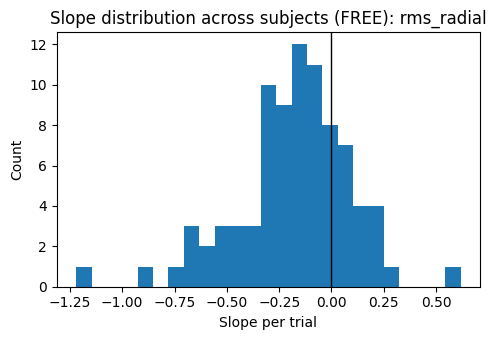

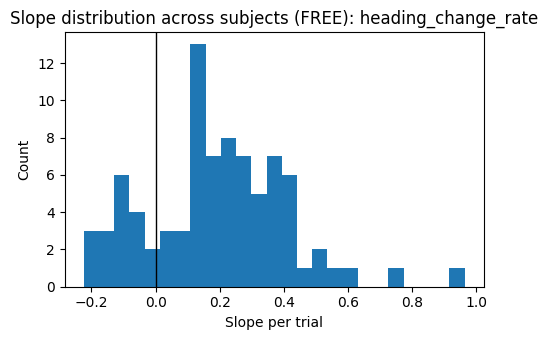

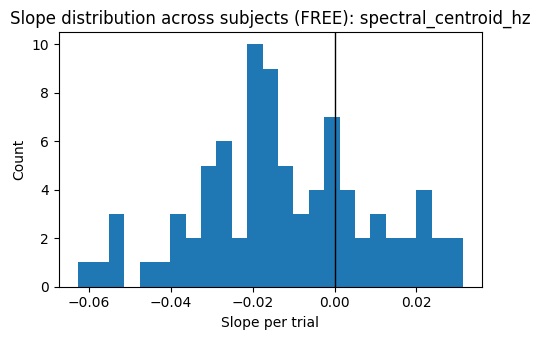

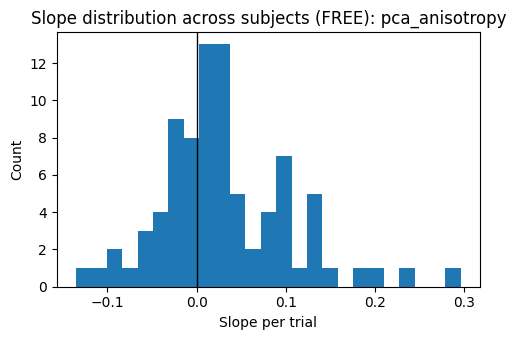

Saved /content/T5_feature_trial_slope_summary.csv and histograms /content/T5_slope_hist_<feature>.png


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.linear_model import LinearRegression

d = df[df["condition"]=="free"].copy()
d = d.dropna(subset=["trial"])
d["trial"] = d["trial"].astype(int)

X = d[feat_cols].replace([np.inf, -np.inf], np.nan).fillna(d[feat_cols].median(numeric_only=True))

features_to_slope = ["mean_speed","rms_radial","heading_change_rate","spectral_centroid_hz","pca_anisotropy"]
features_to_slope = [f for f in features_to_slope if f in feat_cols]

out_rows = []
for f in features_to_slope:
    slopes = []
    for subj, g in d.groupby("subject_id"):
        if len(g) < 6:
            continue
        t = g["trial"].to_numpy().reshape(-1,1)
        y = X.loc[g.index, f].to_numpy()
        lr = LinearRegression().fit(t, y)
        slopes.append(lr.coef_[0])
    slopes = np.array(slopes)
    out_rows.append({"feature": f, "n_subjects": len(slopes),
                     "slope_mean": float(np.mean(slopes)),
                     "slope_std": float(np.std(slopes)),
                     "slope_median": float(np.median(slopes))})

    plt.figure(figsize=(5,3.5))
    plt.hist(slopes, bins=25)
    plt.axvline(0, color="k", lw=1)
    plt.title(f"Slope distribution across subjects (FREE): {f}")
    plt.xlabel("Slope per trial")
    plt.ylabel("Count")
    plt.tight_layout()
    plt.savefig(f"/content/T5_slope_hist_{f}.png", dpi=200)
    plt.show()

pd.DataFrame(out_rows).to_csv("/content/T5_feature_trial_slope_summary.csv", index=False)
print("Saved /content/T5_feature_trial_slope_summary.csv and histograms /content/T5_slope_hist_<feature>.png")

In [ ]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

PATH_WIN = "/content/segment_level_features_fs250 (1).csv"  # CHANGE THIS
dfw = pd.read_csv(PATH_WIN)

dfw["condition"] = dfw["condition"].astype(str).str.lower().str.strip()
dfw["trial"] = dfw["trial"].astype(int)

meta_cols = {
    "file_id","subject_id","condition","trial",
    "segment_label","segment_confidence",
    "sample_start_1based","sample_end_1based",
    "sample_start_0based","sample_end_0based",
    "n_samples","duration_s"
}

feat_cols = [c for c in dfw.columns if c not in meta_cols and pd.api.types.is_numeric_dtype(dfw[c])]

# coerce numeric just in case
for c in feat_cols + ["duration_s"]:
    dfw[c] = pd.to_numeric(dfw[c], errors="coerce")

# impute
X = dfw[feat_cols].replace([np.inf, -np.inf], np.nan)
dfw[feat_cols] = X.fillna(X.median(numeric_only=True))

print("n_rows:", len(dfw), "n_features:", len(feat_cols))
print("duration_s unique (sample):", sorted(dfw["duration_s"].dropna().unique())[:20])

n_rows: 5570 n_features: 32
duration_s unique (sample): [np.float64(9.996), np.float64(10.0)]


In [ ]:
WINDOWS_S = [2, 4, 6, 8, 10]
STRIDE_S = 1.0
FS = 250  # Hz (adjust if different)

In [ ]:
import numpy as np
import pandas as pd

def robust_range_p95_p5(x):
    return np.nanpercentile(x, 95) - np.nanpercentile(x, 5)

def ellipse_area_95(x, y):
    # 95% confidence ellipse area assuming Gaussian
    # area = pi * chi2_2(0.95) * sqrt(det(Cov))
    # chi2_2(0.95) ≈ 5.991
    C = np.cov(np.vstack([x, y]))
    det = np.linalg.det(C)
    det = max(det, 0.0)
    return float(np.pi * 5.991 * np.sqrt(det))

def pca_angle_anisotropy(x, y):
    X = np.vstack([x, y]).T
    X = X - X.mean(axis=0, keepdims=True)
    C = np.cov(X.T)
    evals, evecs = np.linalg.eigh(C)   # ascending
    evals = np.maximum(evals, 1e-12)
    v = evecs[:, 1]                    # major axis
    angle = float(np.arctan2(v[1], v[0]))
    anis = float(np.sqrt(evals[1] / evals[0]))
    return angle, anis

def heading_change_rate(x, y, fs):
    vx = np.diff(x) * fs
    vy = np.diff(y) * fs
    ang = np.arctan2(vy, vx)
    d = np.diff(np.unwrap(ang))
    return float(np.mean(np.abs(d)) * fs)  # rad/s

def zero_cross_rate(v, fs):
    s = np.sign(v)
    zc = np.sum(s[1:] * s[:-1] < 0)
    dur = len(v) / fs
    return float(zc / max(dur, 1e-9))

def compute_features_window(x_ml, y_ap, fs):
    x = np.asarray(x_ml, dtype=float)
    y = np.asarray(y_ap, dtype=float)

    # center to reduce drift bias (optional; comment out if you want absolute)
    x = x - np.nanmean(x)
    y = y - np.nanmean(y)

    std_ml = float(np.nanstd(x, ddof=0))
    std_ap = float(np.nanstd(y, ddof=0))
    rms_ml = float(np.sqrt(np.nanmean(x**2)))
    rms_ap = float(np.sqrt(np.nanmean(y**2)))
    rms_radial = float(np.sqrt(np.nanmean(x**2 + y**2)))

    rr_ml = float(robust_range_p95_p5(x))
    rr_ap = float(robust_range_p95_p5(y))

    ell = ellipse_area_95(x, y)

    # kinematics from finite differences
    vx = np.diff(x) * fs
    vy = np.diff(y) * fs
    speed = np.sqrt(vx**2 + vy**2)

    path_length = float(np.nansum(speed) / fs)
    mean_speed = float(np.nanmean(speed))
    peak_speed = float(np.nanmax(speed))
    speed_p95 = float(np.nanpercentile(speed, 95))
    speed_cv = float(np.nanstd(speed, ddof=0) / (np.nanmean(speed) + 1e-9))

    angle, anis = pca_angle_anisotropy(x, y)
    hcr = heading_change_rate(x, y, fs)

    zc_vx = zero_cross_rate(vx, fs)
    zc_vy = zero_cross_rate(vy, fs)

    return {
        "std_ml": std_ml,
        "std_ap": std_ap,
        "rms_ml": rms_ml,
        "rms_ap": rms_ap,
        "rms_radial": rms_radial,
        "robust_range_ml_p95_p5": rr_ml,
        "robust_range_ap_p95_p5": rr_ap,
        "ellipse_area_95": ell,
        "pca_major_axis_angle_rad": angle,
        "path_length": path_length,
        "mean_speed": mean_speed,
        "peak_speed": peak_speed,
        "speed_p95": speed_p95,
        "speed_cv": speed_cv,
        "pca_anisotropy": anis,
        "heading_change_rate": hcr,
        "zero_cross_vx_rate": zc_vx,
        "zero_cross_vy_rate": zc_vy,
    }

#Subject Clustering based on FREE trials

Saved /content/FREE_subject_GMM_out_K2.csv


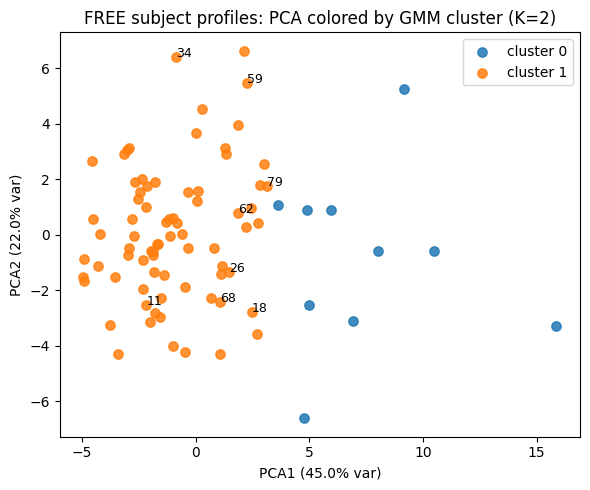

Saved /content/GMM_FREE_subject_PCA_K2.png


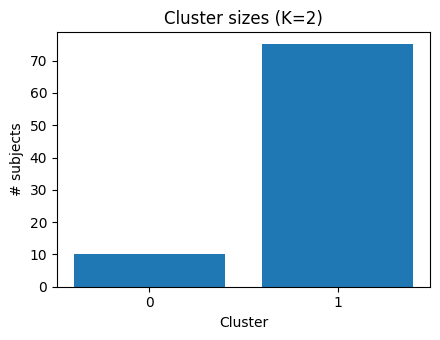

Saved /content/GMM_cluster_sizes_K2.png


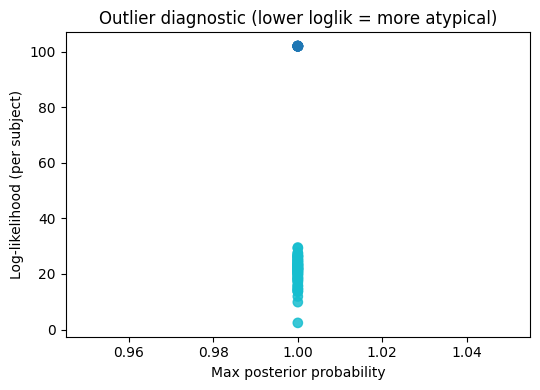

Saved /content/GMM_outlier_diag_K2.png


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA

PATH = "/content/trial_level_features_fixedT_10s_CLEAN.csv"
df = pd.read_csv(PATH)
df["condition"] = df["condition"].astype(str).str.lower().str.strip()

meta_cols = {"file_id","subject_id","condition","trial","T_sec","n_samples_used"}
feat_cols = [c for c in df.columns if c not in meta_cols and pd.api.types.is_numeric_dtype(df[c])]

# FREE only → subject profiles
d = df[df["condition"]=="free"].copy()
X = d[feat_cols].replace([np.inf, -np.inf], np.nan).fillna(d[feat_cols].median(numeric_only=True))
Xsub = X.groupby(d["subject_id"].astype(int)).mean()

subjects = Xsub.index.to_numpy()
scaler = StandardScaler()
Z = scaler.fit_transform(Xsub.values)

# choose K (use 2 first, since your BIC is lowest at K=2)
K = 2
gmm = GaussianMixture(n_components=K, covariance_type="full", random_state=0, n_init=20)
gmm.fit(Z)

post = gmm.predict_proba(Z)
cluster = post.argmax(axis=1)
max_post = post.max(axis=1)
loglik = gmm.score_samples(Z)

out = pd.DataFrame({
    "subject_id": subjects,
    "cluster": cluster,
    "max_posterior": max_post,
    "log_likelihood": loglik
})
out.to_csv("/content/FREE_subject_GMM_out_K2.csv", index=False)
print("Saved /content/FREE_subject_GMM_out_K2.csv")

# ---- Plot 1: PCA embedding colored by cluster ----
pca = PCA(n_components=2, random_state=0)
Y = pca.fit_transform(Z)

plt.figure(figsize=(6,5))
for c in range(K):
    idx = (cluster == c)
    plt.scatter(Y[idx,0], Y[idx,1], s=45, label=f"cluster {c}", alpha=0.85)

# annotate outliers (lowest loglik)
n_annot = min(8, len(out))
outlier_idx = np.argsort(loglik)[:n_annot]
for i in outlier_idx:
    plt.text(Y[i,0], Y[i,1], str(subjects[i]), fontsize=9)

plt.xlabel(f"PCA1 ({pca.explained_variance_ratio_[0]*100:.1f}% var)")
plt.ylabel(f"PCA2 ({pca.explained_variance_ratio_[1]*100:.1f}% var)")
plt.title("FREE subject profiles: PCA colored by GMM cluster (K=2)")
plt.legend()
plt.tight_layout()
plt.savefig("/content/GMM_FREE_subject_PCA_K2.png", dpi=200)
plt.show()
print("Saved /content/GMM_FREE_subject_PCA_K2.png")

# ---- Plot 2: cluster sizes ----
sizes = pd.Series(cluster).value_counts().sort_index()
plt.figure(figsize=(4.5,3.5))
plt.bar(sizes.index.astype(str), sizes.values)
plt.xlabel("Cluster")
plt.ylabel("# subjects")
plt.title("Cluster sizes (K=2)")
plt.tight_layout()
plt.savefig("/content/GMM_cluster_sizes_K2.png", dpi=200)
plt.show()
print("Saved /content/GMM_cluster_sizes_K2.png")

# ---- Plot 3: outlier diagnostic: loglik vs max posterior ----
plt.figure(figsize=(5.5,4))
plt.scatter(max_post, loglik, c=cluster, cmap="tab10", s=45, alpha=0.85)
plt.xlabel("Max posterior probability")
plt.ylabel("Log-likelihood (per subject)")
plt.title("Outlier diagnostic (lower loglik = more atypical)")
plt.tight_layout()
plt.savefig("/content/GMM_outlier_diag_K2.png", dpi=200)
plt.show()
print("Saved /content/GMM_outlier_diag_K2.png")

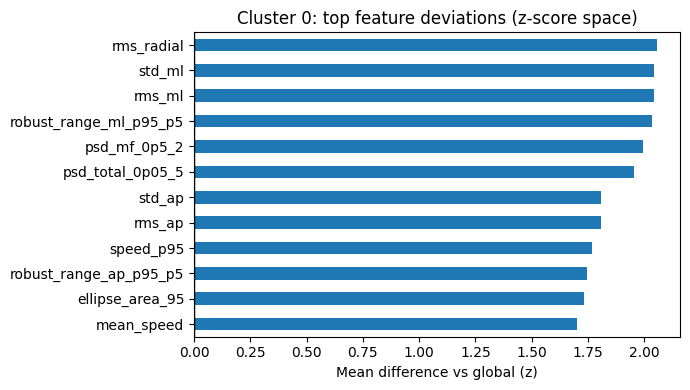

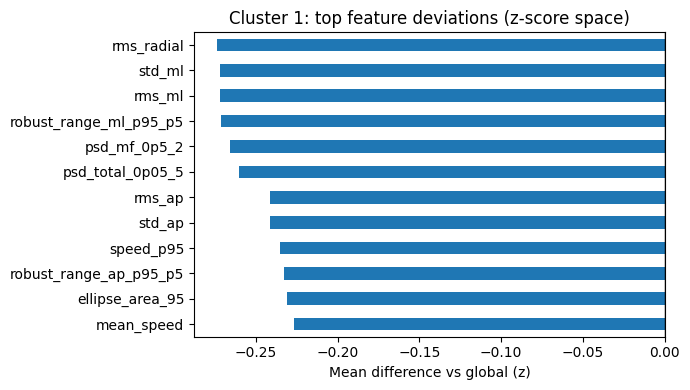

Saved /content/GMM_cluster_<c>_top_feature_devs_K2.png


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

Xsub_df = Xsub.copy()
Xz_df = pd.DataFrame(Z, index=subjects, columns=feat_cols)
Xz_df["cluster"] = cluster

global_mean = Xz_df[feat_cols].mean(axis=0)

for c in range(K):
    cm = Xz_df[Xz_df["cluster"]==c][feat_cols].mean(axis=0)
    diff = (cm - global_mean).sort_values(key=lambda s: s.abs(), ascending=False).head(12)

    plt.figure(figsize=(7,4))
    diff[::-1].plot(kind="barh")
    plt.axvline(0, color="k", lw=1)
    plt.title(f"Cluster {c}: top feature deviations (z-score space)")
    plt.xlabel("Mean difference vs global (z)")
    plt.tight_layout()
    plt.savefig(f"/content/GMM_cluster_{c}_top_feature_devs_K2.png", dpi=200)
    plt.show()

print("Saved /content/GMM_cluster_<c>_top_feature_devs_K2.png")

In [ ]:
import sqlite3
import pandas as pd
import numpy as np

# cluster file saved earlier by the GMM code
clusters = pd.read_csv("/content/FREE_subject_GMM_out_K2.csv")  # subject_id, cluster, ...

conn = sqlite3.connect("/content/dataset.db")

# Find the subject table name (in case it's not literally called 'subject')
tables = pd.read_sql_query("SELECT name FROM sqlite_master WHERE type='table';", conn)
print("Tables:", tables["name"].tolist())

# If you already know the table is named 'subject', keep as is.
subj = pd.read_sql_query("SELECT subject_id, age, height, mass FROM subjects;", conn)

conn.close()

# Clean numeric
for c in ["age","height","mass"]:
    subj[c] = pd.to_numeric(subj[c], errors="coerce")

# Interpret height units:
# If height looks like centimeters (e.g., 167), convert to meters.
subj["height_m"] = np.where(subj["height"] > 3, subj["height"] / 100.0, subj["height"])

subj["bmi"] = subj["mass"] / (subj["height_m"]**2 + 1e-12)

merged = clusters.merge(subj, on="subject_id", how="left")
merged.to_csv("/content/FREE_subject_clusters_with_subject_table.csv", index=False)
print("Saved /content/FREE_subject_clusters_with_subject_table.csv")

# Summary by cluster
cols = ["age","height_m","mass","bmi"]
print(merged.groupby("cluster")[cols].agg(["count","mean","std","median","min","max"]))

Tables: ['subjects', 'metadata_original', 'metadata_cleaned', 'segment_labels']
Saved /content/FREE_subject_clusters_with_subject_table.csv
          age                                         height_m          \
        count       mean       std median   min   max    count    mean   
cluster                                                                  
0          10  18.400000  6.131884   19.0   2.0  25.0       10  1.7600   
1          75  20.573333  4.765227   19.0  18.0  49.0       75  1.6936   

                          ...       mass                                    \
              std median  ...        std     median        min         max   
cluster                   ...                                                
0        0.075865   1.77  ...  18.625646  68.703197  51.033146  122.337518   
1        0.096066   1.68  ...  16.256495  65.088477  40.075087  114.907214   

          bmi                                                        
        count       mean    

In [ ]:
from scipy.stats import mannwhitneyu

cols = ["age","height_m","mass","bmi"]
for col in cols:
    a = merged[merged["cluster"]==0][col].dropna()
    b = merged[merged["cluster"]==1][col].dropna()
    if len(a) >= 3 and len(b) >= 3:
        stat, p = mannwhitneyu(a, b, alternative="two-sided")
        print(f"{col}: p={p:.4g}  (n0={len(a)}, n1={len(b)})")

age: p=0.6327  (n0=10, n1=75)
height_m: p=0.03258  (n0=10, n1=75)
mass: p=0.212  (n0=10, n1=75)
bmi: p=0.9402  (n0=10, n1=75)


Takeaway: Clusters are mostly “movement/sway” driven, not BMI/age driven.

#Fatigue Analysis

In [ ]:
import numpy as np
import pandas as pd
from tqdm import tqdm
from sklearn.linear_model import LinearRegression

FS = 250
WIN_S = 10.0
STRIDE_S = 2.0
WIN = int(WIN_S * FS)
STRIDE = int(STRIDE_S * FS)

# Load
sig = pd.read_parquet("/content/signals_cleaned.parquet")
sig["sample_num"] = pd.to_numeric(sig["sample_num"], errors="coerce").astype(int)
sig = sig.sort_values(["file_id", "sample_num"])

meta = pd.read_csv("/content/trial_level_features_fixedT_10s_CLEAN.csv")[["file_id","subject_id","condition","trial"]]
meta["condition"] = meta["condition"].astype(str).str.lower().str.strip()
meta = meta.drop_duplicates("file_id")

# ---------- feature helpers ----------
def robust_range_p95_p5(x):
    return np.percentile(x, 95) - np.percentile(x, 5)

def ellipse_area_95(x, y):
    C = np.cov(np.vstack([x, y]))
    det = max(float(np.linalg.det(C)), 0.0)
    return float(np.pi * 5.991 * np.sqrt(det))

def pca_anisotropy(x, y):
    X = np.vstack([x, y]).T
    X = X - X.mean(axis=0, keepdims=True)
    C = np.cov(X.T)
    evals, _ = np.linalg.eigh(C)
    evals = np.maximum(evals, 1e-12)
    return float(np.sqrt(evals[1] / evals[0]))

def heading_change_rate(x, y, fs):
    vx = np.diff(x) * fs
    vy = np.diff(y) * fs
    ang = np.arctan2(vy, vx)
    d = np.diff(np.unwrap(ang))
    return float(np.mean(np.abs(d)) * fs)

def zero_cross_rate(v, fs):
    s = np.sign(v)
    zc = np.sum(s[1:] * s[:-1] < 0)
    dur = len(v) / fs
    return float(zc / max(dur, 1e-9))

def spectral_centroid_hz(sig1d, fs):
    sig1d = sig1d - np.mean(sig1d)
    n = len(sig1d)
    freqs = np.fft.rfftfreq(n, d=1/fs)
    P = np.abs(np.fft.rfft(sig1d))**2
    s = P.sum()
    if s <= 1e-12:
        return 0.0
    return float((freqs * P).sum() / s)

def compute_window_features(x, y, fs):
    # center
    x = x - np.mean(x)
    y = y - np.mean(y)

    std_ml = float(np.std(x, ddof=0))
    std_ap = float(np.std(y, ddof=0))
    rms_ml = float(np.sqrt(np.mean(x*x)))
    rms_ap = float(np.sqrt(np.mean(y*y)))
    rms_radial = float(np.sqrt(np.mean(x*x + y*y)))

    rr_ml = float(robust_range_p95_p5(x))
    rr_ap = float(robust_range_p95_p5(y))
    ell = float(ellipse_area_95(x, y))

    vx = np.diff(x) * fs
    vy = np.diff(y) * fs
    speed = np.sqrt(vx*vx + vy*vy)

    path_length = float(np.sum(speed) / fs)
    mean_speed = float(np.mean(speed))
    peak_speed = float(np.max(speed))
    speed_p95 = float(np.percentile(speed, 95))
    speed_cv = float(np.std(speed, ddof=0) / (mean_speed + 1e-9))

    hcr = float(heading_change_rate(x, y, fs))
    zc_vx = float(zero_cross_rate(vx, fs))
    zc_vy = float(zero_cross_rate(vy, fs))

    sc_speed = float(spectral_centroid_hz(speed, fs))
    anis = float(pca_anisotropy(x, y))

    return {
        "std_ml": std_ml, "std_ap": std_ap,
        "rms_ml": rms_ml, "rms_ap": rms_ap, "rms_radial": rms_radial,
        "robust_range_ml_p95_p5": rr_ml, "robust_range_ap_p95_p5": rr_ap,
        "ellipse_area_95": ell,
        "path_length": path_length,
        "mean_speed": mean_speed, "peak_speed": peak_speed,
        "speed_p95": speed_p95, "speed_cv": speed_cv,
        "heading_change_rate": hcr,
        "zero_cross_vx_rate": zc_vx, "zero_cross_vy_rate": zc_vy,
        "spectral_centroid_hz_speed": sc_speed,
        "pca_anisotropy": anis
    }

# ---------- compute windowed features ----------
meta_files = set(meta["file_id"])
groups = {fid: g for fid, g in sig.groupby("file_id", sort=False) if fid in meta_files}

rows = []
for fid, g in tqdm(groups.items(), total=len(groups)):
    x = g["cop_x"].to_numpy(float)
    y = g["cop_y"].to_numpy(float)
    n = min(len(x), len(y))
    if n < WIN:
        continue

    for start in range(0, n - WIN + 1, STRIDE):
        end = start + WIN
        feat = compute_window_features(x[start:end], y[start:end], FS)
        feat.update({
            "file_id": fid,
            "t_mid_s": (start + end) / 2 / FS,
            "win_s": WIN_S
        })
        rows.append(feat)

win_df = pd.DataFrame(rows).merge(meta, on="file_id", how="left")
win_df.to_csv("/content/windowed_timeseries_features_10s_stride2s.csv", index=False)
print("Saved /content/windowed_timeseries_features_10s_stride2s.csv", "rows:", len(win_df))

100%|██████████| 987/987 [00:23<00:00, 41.72it/s]


Saved /content/windowed_timeseries_features_10s_stride2s.csv rows: 12396


In [ ]:
feat_list = [
    "rms_radial","ellipse_area_95","mean_speed","spectral_centroid_hz_speed",
    "heading_change_rate","pca_anisotropy"
]

trial_rows = []
for fid, g in win_df.groupby("file_id", sort=False):
    g = g.sort_values("t_mid_s")
    if len(g) < 6:
        continue

    t = g["t_mid_s"].to_numpy().reshape(-1,1)

    # early/late windows (first & last 20%)
    k = max(1, int(0.2 * len(g)))
    early = g.head(k)
    late  = g.tail(k)

    for f in feat_list:
        y = g[f].to_numpy()
        lr = LinearRegression().fit(t, y)
        slope = float(lr.coef_[0])

        delta = float(late[f].mean() - early[f].mean())

        trial_rows.append({
            "file_id": fid,
            "subject_id": int(g["subject_id"].iloc[0]),
            "condition": g["condition"].iloc[0],
            "trial": int(g["trial"].iloc[0]),
            "feature": f,
            "slope_per_sec": slope,
            "early_late_delta": delta,
            "n_windows": int(len(g))
        })

drift = pd.DataFrame(trial_rows)
drift.to_csv("/content/within_trial_drift_slopes_and_deltas.csv", index=False)
print("Saved /content/within_trial_drift_slopes_and_deltas.csv")
drift.head()

Saved /content/within_trial_drift_slopes_and_deltas.csv


,file_id,subject_id,condition,trial,feature,slope_per_sec,early_late_delta,n_windows
0,100_proba_free_1,100,free,1,rms_radial,0.038322,0.495658,10
1,100_proba_free_1,100,free,1,ellipse_area_95,-0.266050,-8.108024,10
2,100_proba_free_1,100,free,1,mean_speed,-0.009855,0.227521,10
3,100_proba_free_1,100,free,1,spectral_centroid_hz_speed,-0.044804,-0.828744,10
4,100_proba_free_1,100,free,1,heading_change_rate,0.054959,0.898451,10


In [ ]:
from scipy.stats import mannwhitneyu

for f in feat_list:
    a = drift[(drift["condition"]=="free") & (drift["feature"]==f)]["slope_per_sec"].dropna()
    b = drift[(drift["condition"]=="stress") & (drift["feature"]==f)]["slope_per_sec"].dropna()
    if len(a) >= 10 and len(b) >= 5:
        stat, p = mannwhitneyu(a, b, alternative="two-sided")
        print(f"[slope] {f}: FREE median={a.median():.4g}  STRESS median={b.median():.4g}  p={p:.4g}  n_free={len(a)} n_stress={len(b)}")

for f in feat_list:
    a = drift[(drift["condition"]=="free") & (drift["feature"]==f)]["early_late_delta"].dropna()
    b = drift[(drift["condition"]=="stress") & (drift["feature"]==f)]["early_late_delta"].dropna()
    if len(a) >= 10 and len(b) >= 5:
        stat, p = mannwhitneyu(a, b, alternative="two-sided")
        print(f"[delta] {f}: FREE median={a.median():.4g}  STRESS median={b.median():.4g}  p={p:.4g}  n_free={len(a)} n_stress={len(b)}")

[slope] rms_radial: FREE median=-0.02589  STRESS median=-0.0137  p=0.1841  n_free=934 n_stress=53
[slope] ellipse_area_95: FREE median=-1.599  STRESS median=-1.122  p=0.7559  n_free=934 n_stress=53
[slope] mean_speed: FREE median=-0.09922  STRESS median=-0.02704  p=1.394e-06  n_free=934 n_stress=53
[slope] spectral_centroid_hz_speed: FREE median=0.006451  STRESS median=-0.0007294  p=0.01556  n_free=934 n_stress=53
[slope] heading_change_rate: FREE median=0.04543  STRESS median=0.001556  p=0.0001184  n_free=934 n_stress=53
[slope] pca_anisotropy: FREE median=0.001402  STRESS median=-0.00111  p=0.4074  n_free=934 n_stress=53
[delta] rms_radial: FREE median=-0.5039  STRESS median=-0.659  p=0.8157  n_free=934 n_stress=53
[delta] ellipse_area_95: FREE median=-29.16  STRESS median=-34.88  p=0.8439  n_free=934 n_stress=53
[delta] mean_speed: FREE median=-1.913  STRESS median=-0.7293  p=0.0004579  n_free=934 n_stress=53
[delta] spectral_centroid_hz_speed: FREE median=0.1466  STRESS median=-0.1

/tmp/ipykernel_3070/2998129862.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  m = sub.groupby("t_bin")[f].mean()
/tmp/ipykernel_3070/2998129862.py:17: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  sem = sub.groupby("t_bin")[f].sem()


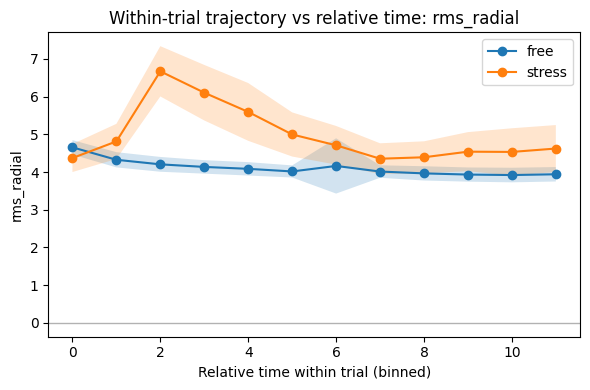

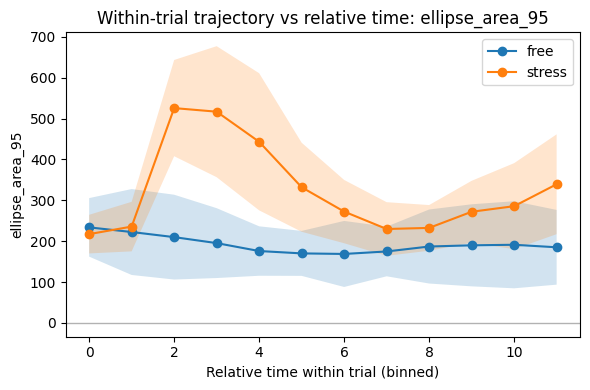

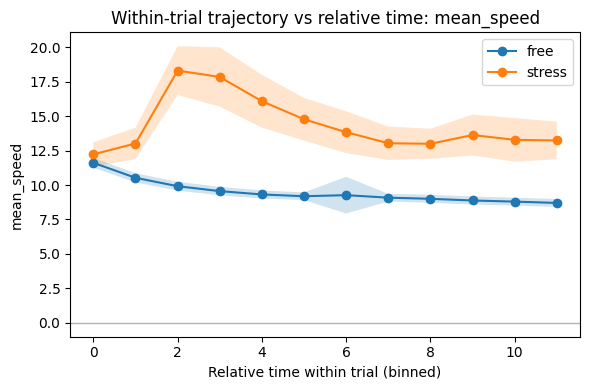

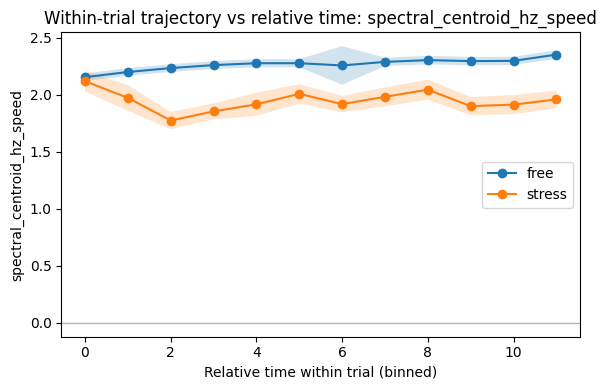

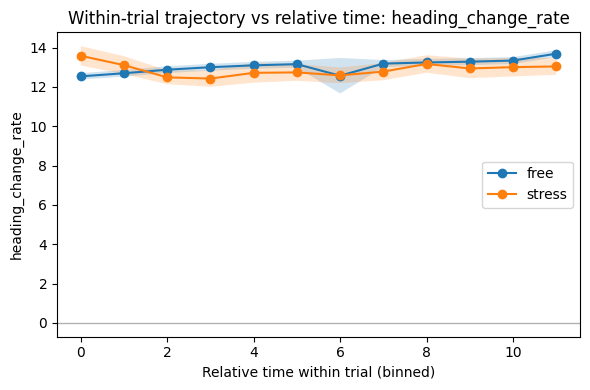

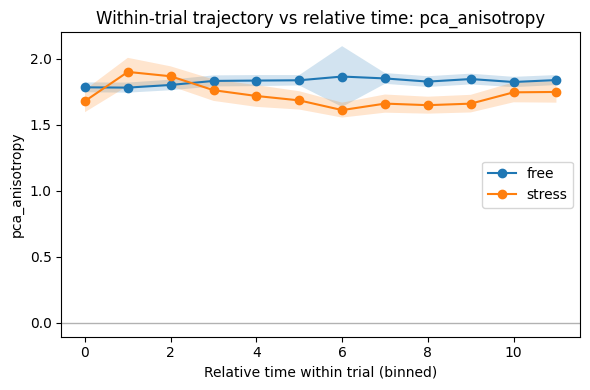

In [ ]:
import matplotlib.pyplot as plt

# Add relative time per file
w = win_df.copy()
w["t_rank"] = w.groupby("file_id")["t_mid_s"].rank(method="first")
w["t_rel"] = (w["t_rank"] - 1) / (w.groupby("file_id")["t_rank"].transform("max") - 1 + 1e-9)

# Bin relative time
n_bins = 12
w["t_bin"] = pd.cut(w["t_rel"], bins=np.linspace(0,1,n_bins+1), include_lowest=True)

for f in feat_list:
    plt.figure(figsize=(6,4))
    for cond in ["free","stress"]:
        sub = w[w["condition"]==cond]
        m = sub.groupby("t_bin")[f].mean()
        sem = sub.groupby("t_bin")[f].sem()
        x = np.arange(len(m))
        plt.plot(x, m.values, marker="o", label=cond)
        plt.fill_between(x, m.values-1.96*sem.values, m.values+1.96*sem.values, alpha=0.2)
    plt.axhline(0, color="k", lw=1, alpha=0.3)
    plt.xlabel("Relative time within trial (binned)")
    plt.ylabel(f)
    plt.title(f"Within-trial trajectory vs relative time: {f}")
    plt.legend()
    plt.tight_layout()
    plt.savefig(f"/content/trajectory_rel_time_{f}.png", dpi=200)
    plt.show()

#Early vs Late classification

In [ ]:
# t5_early_late_classification.py
import numpy as np
import pandas as pd

from sklearn.model_selection import LeaveOneGroupOut
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import balanced_accuracy_score, average_precision_score, confusion_matrix

from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, HistGradientBoostingClassifier

DATA_PATH = "trial_level_features_fixedT_10s_CLEAN.csv"  # change if needed
MIN_TRIALS = 10
FRACTION_EDGE = 0.2  # early 20% vs late 20%

df = pd.read_csv(DATA_PATH)
df["condition"] = df["condition"].astype(str).str.lower().str.strip()
df = df[df["condition"] == "free"].copy()

# Identify feature columns
meta_cols = {"file_id","subject_id","condition","trial","T_sec","n_samples_used"}
feat_cols = [c for c in df.columns if c not in meta_cols and pd.api.types.is_numeric_dtype(df[c])]

# Clean numeric
Xall = df[feat_cols].replace([np.inf, -np.inf], np.nan)
Xall = Xall.fillna(Xall.median(numeric_only=True))

# Correct trial order: 1 earliest, larger later (trial labels reversed => rank descending by trial)
df["trial_order"] = df.groupby("subject_id")["trial"].rank(method="dense", ascending=False).astype(int)

# Create labels
idx_keep = []
labels = {}

for subj, g in df.groupby("subject_id"):
    g = g.sort_values("trial_order")  # now true chronological order
    n = len(g)
    if n < MIN_TRIALS:
        continue
    k = max(1, int(FRACTION_EDGE * n))
    early_idx = g.head(k).index
    late_idx  = g.tail(k).index

    for i in early_idx: labels[i] = 0
    for i in late_idx:  labels[i] = 1
    idx_keep.extend(list(early_idx))
    idx_keep.extend(list(late_idx))

df_el = df.loc[idx_keep].copy()
df_el["early_late"] = df_el.index.map(labels).astype(int)

X = Xall.loc[df_el.index].reset_index(drop=True)
y = df_el["early_late"].to_numpy()
groups = df_el["subject_id"].to_numpy()

print("T5 dataset:",
      "n_subjects=", df_el["subject_id"].nunique(),
      "n_samples=", len(df_el),
      "pos(late)=", int(y.sum()),
      "neg(early)=", int((y==0).sum()))

T5 dataset: n_subjects= 80 n_samples= 356 pos(late)= 178 neg(early)= 178


In [ ]:
def loso_eval(model, X, y, groups, needs_scaling=False):
    logo = LeaveOneGroupOut()
    probs = np.zeros(len(y), dtype=float)

    for tr, te in logo.split(X, y, groups=groups):
        Xtr, Xte = X.iloc[tr], X.iloc[te]
        ytr = y[tr]

        if needs_scaling:
            pipe = Pipeline([("scaler", StandardScaler()), ("clf", model)])
            pipe.fit(Xtr, ytr)
            if hasattr(pipe, "predict_proba"):
                probs[te] = pipe.predict_proba(Xte)[:, 1]
            else:
                # SVC(probability=False): use decision_function then sigmoid-ish normalization
                s = pipe.decision_function(Xte)
                probs[te] = (s - s.min()) / (s.max() - s.min() + 1e-9)
        else:
            model.fit(Xtr, ytr)
            probs[te] = model.predict_proba(Xte)[:, 1]

    preds = (probs >= 0.5).astype(int)
    bal = balanced_accuracy_score(y, preds)
    auprc = average_precision_score(y, probs)
    cm = confusion_matrix(y, preds, labels=[0,1])
    return bal, auprc, cm, probs

results = []

# 1) Logistic Regression
lr = LogisticRegression(max_iter=5000, class_weight="balanced", solver="liblinear")
bal, auprc, cm, probs = loso_eval(lr, X, y, groups, needs_scaling=True)
results.append(("LogReg", bal, auprc, cm))

# 2) Gaussian Naive Bayes
gnb = GaussianNB()
bal, auprc, cm, probs = loso_eval(gnb, X, y, groups, needs_scaling=True)
results.append(("GaussianNB", bal, auprc, cm))

# 3) Linear SVM (probability=True so we can get calibrated-ish probs)
svm = SVC(kernel="linear", probability=True, class_weight="balanced", random_state=0)
bal, auprc, cm, probs = loso_eval(svm, X, y, groups, needs_scaling=True)
results.append(("LinearSVM", bal, auprc, cm))

# 4) Random Forest
rf = RandomForestClassifier(
    n_estimators=600,
    max_depth=None,
    min_samples_leaf=2,
    class_weight="balanced",
    random_state=0,
    n_jobs=-1
)
bal, auprc, cm, probs = loso_eval(rf, X, y, groups, needs_scaling=False)
results.append(("RandomForest", bal, auprc, cm))

# 5) HistGradientBoosting (no class_weight; handle imbalance via sample_weight if needed)
hgb = HistGradientBoostingClassifier(
    learning_rate=0.05, max_depth=5, max_iter=400, random_state=0
)
# Provide a light imbalance weight
w = np.where(y==1, (len(y)/max(y.sum(),1)), (len(y)/max((y==0).sum(),1)))
# We'll hack sample_weight fold-wise inside a custom eval:
def loso_eval_hgb(model, X, y, groups):
    logo = LeaveOneGroupOut()
    probs = np.zeros(len(y), dtype=float)
    for tr, te in logo.split(X, y, groups=groups):
        scaler = StandardScaler()
        Xtr = scaler.fit_transform(X.iloc[tr])
        Xte = scaler.transform(X.iloc[te])
        ytr = y[tr]
        wtr = w[tr]
        model.fit(Xtr, ytr, sample_weight=wtr)
        probs[te] = model.predict_proba(Xte)[:,1]
    preds = (probs >= 0.5).astype(int)
    bal = balanced_accuracy_score(y, preds)
    auprc = average_precision_score(y, probs)
    cm = confusion_matrix(y, preds, labels=[0,1])
    return bal, auprc, cm

bal, auprc, cm = loso_eval_hgb(hgb, X, y, groups)
results.append(("HistGBDT", bal, auprc, cm))

# Save summary
out_rows = []
for name, bal, auprc, cm in results:
    tn, fp, fn, tp = cm.ravel()
    out_rows.append({
        "model": name,
        "balanced_accuracy": float(bal),
        "auprc": float(auprc),
        "TN": int(tn), "FP": int(fp), "FN": int(fn), "TP": int(tp)
    })

res_df = pd.DataFrame(out_rows).sort_values("balanced_accuracy", ascending=False)
res_df.to_csv("T5_models_LOSO_results.csv", index=False)
print(res_df)
print("Saved T5_models_LOSO_results.csv")

          model  balanced_accuracy     auprc   TN  FP   FN   TP
3  RandomForest           0.744382  0.793143  145  33   58  120
0        LogReg           0.730337  0.789083  133  45   51  127
2     LinearSVM           0.716292  0.767105  131  47   54  124
4      HistGBDT           0.676966  0.778658  120  58   57  121
1    GaussianNB           0.584270  0.694422  167  11  137   41
Saved T5_models_LOSO_results.csv


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import LeaveOneGroupOut
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import balanced_accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier

logo = LeaveOneGroupOut()

def oof_predict_proba(model, X, y, groups, needs_scaling):
    """OOF probabilities for class 1 under LOSO."""
    probs = np.zeros(len(y), dtype=float)
    for tr, te in logo.split(X, y, groups=groups):
        Xtr, Xte = X.iloc[tr], X.iloc[te]
        ytr = y[tr]

        if needs_scaling:
            pipe = Pipeline([("scaler", StandardScaler()), ("clf", model)])
            pipe.fit(Xtr, ytr)
            probs[te] = pipe.predict_proba(Xte)[:, 1]
        else:
            model.fit(Xtr, ytr)
            probs[te] = model.predict_proba(Xte)[:, 1]
    return probs

def bal_acc_from_probs(y, probs, thr=0.5):
    preds = (probs >= thr).astype(int)
    return balanced_accuracy_score(y, preds)

def oof_permutation_importance(model, X, y, groups, feat_names, needs_scaling, repeats=20, seed=0):
    rng = np.random.default_rng(seed)

    base_probs = oof_predict_proba(model, X, y, groups, needs_scaling)
    base_score = bal_acc_from_probs(y, base_probs)

    rows = []
    X_np = X.to_numpy()  # for faster copying

    for j, fname in enumerate(feat_names):
        drops = []
        for r in range(repeats):
            Xp = X_np.copy()

            # permute feature within each held-out fold only
            for tr, te in logo.split(X, y, groups=groups):
                te = np.array(te)
                perm = rng.permutation(te)
                Xp[te, j] = Xp[perm, j]

            Xp_df = pd.DataFrame(Xp, columns=feat_names)
            probs_p = oof_predict_proba(model, Xp_df, y, groups, needs_scaling)
            score_p = bal_acc_from_probs(y, probs_p)
            drops.append(base_score - score_p)

        rows.append({
            "feature": fname,
            "importance_mean": float(np.mean(drops)),
            "importance_std": float(np.std(drops)),
        })

    imp = pd.DataFrame(rows).sort_values("importance_mean", ascending=False)
    return base_score, imp

#T5 Feature importance (LogReg, OOF permutation) | base BA=0.730

LogReg base OOF BA: 0.7303370786516854
Saved T5_LogReg_OOF_perm_importance_balacc.csv


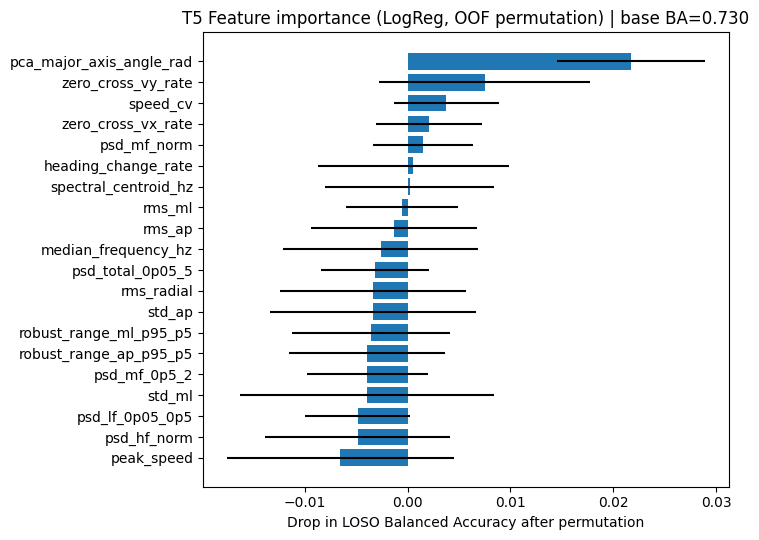

Saved T5_LogReg_feature_importance_OOF_perm.png


In [ ]:
lr = LogisticRegression(max_iter=5000, class_weight="balanced", solver="liblinear")

base_lr, imp_lr = oof_permutation_importance(
    lr, X, y, groups, feat_cols, needs_scaling=True, repeats=15, seed=0
)
imp_lr.to_csv("T5_LogReg_OOF_perm_importance_balacc.csv", index=False)
print("LogReg base OOF BA:", base_lr)
print("Saved T5_LogReg_OOF_perm_importance_balacc.csv")

top = 20
plot_df = imp_lr.head(top).iloc[::-1]

plt.figure(figsize=(7.5, 5.5))
plt.barh(plot_df["feature"], plot_df["importance_mean"], xerr=plot_df["importance_std"])
plt.xlabel("Drop in LOSO Balanced Accuracy after permutation")
plt.title(f"T5 Feature importance (LogReg, OOF permutation) | base BA={base_lr:.3f}")
plt.tight_layout()
plt.savefig("T5_LogReg_feature_importance_OOF_perm.png", dpi=200)
plt.show()
print("Saved T5_LogReg_feature_importance_OOF_perm.png")

Drop in LOSO Balanced Accuracy after permutation”
Each bar represents how much the balanced accuracy decreases when that single feature is randomly permuted in the held-out folds.

- Larger positive bars ⇒ the model relies more on that feature.
- Bars near 0 ⇒ little effect (feature not very important, or redundant with others).
- Small negative values can happen due to noise/collinearity (permuting can occasionally remove harmful noise).

#Takeaway:
The strongest importance is for `pca_major_axis_angle_rad`, with a clearly larger drop in balanced accuracy (around ~0.02) than the rest. The next most influential features are velocity sign-change rates (`zero_cross_vy_rate`, `zero_cross_vx_rate`) and speed variability (`speed_cv`), each causing a smaller but noticeable drop. Many other amplitude and spectral features have near-zero importance, suggesting they are either less informative for early/late discrimination or redundant given the top features.



#E2: Same vs different subject classification.

“verification” is a pair classification task, we’ll build pairs of trials and label them:

y=1 if same subject
y=0 if different subjects

We will use FREE trials by default;

For each subject:

build positive pairs from that subject’s trials (sampled)
build negative pairs by pairing one of that subject’s trials with a trial from another subject
We keep positives/negatives balanced per fold.

Given two feature vectors (a) and (b), create a pair vector such as:

abs_diff = |a - b|

In [ ]:
import numpy as np
import pandas as pd

from sklearn.model_selection import LeaveOneGroupOut
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import balanced_accuracy_score, average_precision_score
from sklearn.linear_model import LogisticRegression

# --------------------------
# Config
# --------------------------
DATA_PATH = "trial_level_features_fixedT_10s_CLEAN.csv"  # or CLEAN.csv
CONDITION = "free"   # "free", "stress", or None for both
USE_TRIAL_ORDER_CORRECTION = True  # only matters if you want to subset early/late; kept for compatibility
MAX_POS_PAIRS_PER_SUBJ = 80        # cap to control runtime
NEG_PER_POS = 1                    # negatives per positive
RNG_SEED = 0

# Permutation importance config
PERM_REPEATS = 15

rng = np.random.default_rng(RNG_SEED)

# --------------------------
# Load data
# --------------------------
df = pd.read_csv(DATA_PATH)
df["condition"] = df["condition"].astype(str).str.lower().str.strip()

if CONDITION is not None:
    df = df[df["condition"] == CONDITION].copy()

meta_cols = {"file_id","subject_id","condition","trial","T_sec","n_samples_used"}
feat_cols = [c for c in df.columns if c not in meta_cols and pd.api.types.is_numeric_dtype(df[c])]

Xraw = df[feat_cols].replace([np.inf, -np.inf], np.nan)
Xraw = Xraw.fillna(Xraw.median(numeric_only=True))

df = df.reset_index(drop=True)
Xraw = Xraw.reset_index(drop=True)

# Optional: corrected trial order (not strictly needed for verification)
if USE_TRIAL_ORDER_CORRECTION and "trial" in df.columns:
    df["trial_order"] = df.groupby("subject_id")["trial"].rank(method="dense", ascending=False).astype(int)

# Index trials by subject
by_subj = {}
for i, r in df.iterrows():
    by_subj.setdefault(int(r["subject_id"]), []).append(i)

subjects = np.array(sorted(by_subj.keys()))
print("Subjects:", len(subjects), "Trials:", len(df), "Features:", len(feat_cols))

# --------------------------
# Pair feature builder
# --------------------------
def pair_features_absdiff(i, j):
    a = Xraw.iloc[i].to_numpy()
    b = Xraw.iloc[j].to_numpy()
    return np.abs(a - b)

# --------------------------
# Build pairs for a given set of allowed subjects
# --------------------------
def build_pairs(allowed_subjects):
    allowed_subjects = list(allowed_subjects)
    allowed_set = set(allowed_subjects)

    # collect eligible trial indices
    allowed_trials = [i for s in allowed_subjects for i in by_subj[s]]

    # positives: within-subject
    Xp = []
    yp = []
    gp = []  # group = anchor subject for LOSO

    for s in allowed_subjects:
        idx = by_subj[s]
        if len(idx) < 2:
            continue

        # all possible pairs can be huge; sample
        # sample pairs by random combinations
        n_possible = len(idx) * (len(idx)-1) // 2
        n_take = min(MAX_POS_PAIRS_PER_SUBJ, n_possible)

        # sample unique pairs
        seen = set()
        while len(seen) < n_take:
            i, j = rng.choice(idx, size=2, replace=False)
            if i > j: i, j = j, i
            seen.add((i, j))

        for (i, j) in seen:
            Xp.append(pair_features_absdiff(i, j))
            yp.append(1)
            gp.append(s)

    # negatives: for each positive anchored at subject s, pair one of s's trials with another subject's trial
    # keep balanced: NEG_PER_POS per positive
    Xn = []
    yn = []
    gn = []

    # precompute other-subject trial pools
    trial_pool_by_subject = {s: by_subj[s] for s in allowed_subjects}

    for xvec, ylab, s in zip(Xp, yp, gp):
        for _ in range(NEG_PER_POS):
            i = rng.choice(trial_pool_by_subject[s])
            # choose a different subject
            s2 = rng.choice([t for t in allowed_subjects if t != s])
            j = rng.choice(trial_pool_by_subject[s2])
            Xn.append(pair_features_absdiff(i, j))
            yn.append(0)
            gn.append(s)

    X_pairs = np.vstack([np.array(Xp), np.array(Xn)]) if len(Xp) else np.empty((0, len(feat_cols)))
    y_pairs = np.array(yp + yn, dtype=int)
    g_pairs = np.array(gp + gn, dtype=int)  # group by anchor subject

    return X_pairs, y_pairs, g_pairs

# --------------------------
# LOSO evaluation (anchor-subject LOSO)
# --------------------------
def loso_eval_pairs(Xp, yp, gp):
    logo = LeaveOneGroupOut()
    probs = np.zeros(len(yp), dtype=float)

    pipe = Pipeline([
        ("scaler", StandardScaler()),
        ("clf", LogisticRegression(max_iter=5000, class_weight="balanced", solver="liblinear"))
    ])

    for tr, te in logo.split(Xp, yp, groups=gp):
        pipe.fit(Xp[tr], yp[tr])
        probs[te] = pipe.predict_proba(Xp[te])[:, 1]

    preds = (probs >= 0.5).astype(int)
    ba = balanced_accuracy_score(yp, preds)
    auprc = average_precision_score(yp, probs)
    return ba, auprc, probs

# Build full pair dataset (all subjects)
Xp, yp, gp = build_pairs(subjects)
print("Pairs:", len(yp), "Pos:", int(yp.sum()), "Neg:", int((yp==0).sum()))

base_ba, base_auprc, base_probs = loso_eval_pairs(Xp, yp, gp)
print("E2 base LOSO BA:", base_ba, "AUPRC:", base_auprc)

# Save base predictions
pd.DataFrame({"y": yp, "prob": base_probs, "group_subject": gp}).to_csv("E2_pairs_base_predictions.csv", index=False)

# --------------------------
# OOF permutation importance (same method concept as your T5 plot)
# Permute a single column within each held-out fold, recompute OOF BA drop.
# --------------------------
def oof_perm_importance_pairs(Xp, yp, gp, repeats=15, seed=0):
    rng2 = np.random.default_rng(seed)
    logo = LeaveOneGroupOut()

    # baseline
    base_ba, base_auprc, _ = loso_eval_pairs(Xp, yp, gp)

    rows = []
    for j, fname in enumerate(feat_cols):
        drops = []
        for r in range(repeats):
            Xperm = Xp.copy()
            for tr, te in logo.split(Xperm, yp, groups=gp):
                te = np.array(te)
                perm_idx = rng2.permutation(te)
                Xperm[te, j] = Xperm[perm_idx, j]
            ba_p, _, _ = loso_eval_pairs(Xperm, yp, gp)
            drops.append(base_ba - ba_p)

        rows.append({
            "feature": fname,
            "importance_mean": float(np.mean(drops)),
            "importance_std": float(np.std(drops)),
        })

    imp = pd.DataFrame(rows).sort_values("importance_mean", ascending=False)
    return base_ba, base_auprc, imp

base_ba2, base_auprc2, imp = oof_perm_importance_pairs(Xp, yp, gp, repeats=PERM_REPEATS, seed=0)
imp.to_csv("E2_feature_importance_LogReg_OOF_perm.csv", index=False)
print("Saved E2_feature_importance_LogReg_OOF_perm.csv")
print(imp.head(20))

Subjects: 85 Trials: 934 Features: 29
Pairs: 8222 Pos: 4111 Neg: 4111
E2 base LOSO BA: 0.6252736560447579 AUPRC: 0.6399297349435724
Saved E2_feature_importance_LogReg_OOF_perm.csv
                     feature  importance_mean  importance_std
15                mean_accel         0.015609        0.001093
17       heading_change_rate         0.011319        0.001179
14                  speed_cv         0.002660        0.000808
13                 speed_p95         0.001711        0.000834
8   pca_major_axis_angle_rad         0.001541        0.000873
22              psd_mf_0p5_2         0.000932        0.000626
20          psd_total_0p05_5         0.000754        0.000795
0                     std_ml         0.000681        0.000736
11                mean_speed         0.000649        0.000675
2                     rms_ml         0.000600        0.000721
16                peak_accel         0.000600        0.000497
24               psd_lf_norm         0.000576        0.001168
19        zero

In [ ]:
import numpy as np
import pandas as pd

from sklearn.model_selection import LeaveOneGroupOut
from sklearn.metrics import balanced_accuracy_score, average_precision_score
from sklearn.ensemble import RandomForestClassifier

logo = LeaveOneGroupOut()

def loso_eval_pairs_rf(Xp, yp, gp, rf):
    probs = np.zeros(len(yp), dtype=float)
    for tr, te in logo.split(Xp, yp, groups=gp):
        rf_fold = RandomForestClassifier(**rf.get_params())
        rf_fold.fit(Xp[tr], yp[tr])
        probs[te] = rf_fold.predict_proba(Xp[te])[:, 1]
    preds = (probs >= 0.5).astype(int)
    ba = balanced_accuracy_score(yp, preds)
    auprc = average_precision_score(yp, probs)
    return ba, auprc, probs

rf = RandomForestClassifier(
    n_estimators=1200,
    max_features="sqrt",
    min_samples_leaf=3,
    class_weight="balanced",
    n_jobs=-1,
    random_state=0
)

ba_rf, auprc_rf, probs_rf = loso_eval_pairs_rf(Xp, yp, gp, rf)
print("E2 RF base LOSO BA:", ba_rf, "AUPRC:", auprc_rf)

pd.DataFrame({"y": yp, "prob_rf": probs_rf, "group_subject": gp}).to_csv(
    "E2_pairs_RF_base_predictions.csv", index=False
)
print("Saved E2_pairs_RF_base_predictions.csv")

E2 RF base LOSO BA: 0.624908781318414 AUPRC: 0.646322716095825
Saved E2_pairs_RF_base_predictions.csv


In [ ]:
import numpy as np
import pandas as pd

def oof_perm_importance_pairs_rf(Xp, yp, gp, feat_names, rf_params, repeats=8, seed=0):
    rng = np.random.default_rng(seed)
    logo = LeaveOneGroupOut()

    # baseline
    rf_base = RandomForestClassifier(**rf_params)
    base_ba, base_auprc, _ = loso_eval_pairs_rf(Xp, yp, gp, rf_base)

    rows = []
    for j, fname in enumerate(feat_names):
        drops = []
        for r in range(repeats):
            Xperm = Xp.copy()
            for tr, te in logo.split(Xperm, yp, groups=gp):
                te = np.array(te)
                perm_idx = rng.permutation(te)
                Xperm[te, j] = Xperm[perm_idx, j]

            rf_model = RandomForestClassifier(**rf_params)
            ba_p, _, _ = loso_eval_pairs_rf(Xperm, yp, gp, rf_model)
            drops.append(base_ba - ba_p)

        rows.append({
            "feature": fname,
            "importance_mean": float(np.mean(drops)),
            "importance_std": float(np.std(drops)),
        })

    imp = pd.DataFrame(rows).sort_values("importance_mean", ascending=False)
    return base_ba, base_auprc, imp

rf_params = dict(
    n_estimators=1200,
    max_features="sqrt",
    min_samples_leaf=3,
    class_weight="balanced",
    n_jobs=-1,
    random_state=0
)

base_ba, base_auprc, imp_rf = oof_perm_importance_pairs_rf(
    Xp, yp, gp, feat_cols, rf_params, repeats=8, seed=0
)

imp_rf.to_csv("E2_feature_importance_RF_OOF_perm.csv", index=False)
print("RF base BA:", base_ba, "AUPRC:", base_auprc)
print("Saved E2_feature_importance_RF_OOF_perm.csv")
print(imp_rf.head(25))

In [ ]:
import matplotlib.pyplot as plt

top = 25
plot_df = imp_rf.head(top).iloc[::-1]

plt.figure(figsize=(8.5, 6.2))
plt.barh(plot_df["feature"], plot_df["importance_mean"], xerr=plot_df["importance_std"])
plt.xlabel("Drop in LOSO Balanced Accuracy after permutation")
plt.title(f"E2 Verification feature importance (RandomForest, OOF permutation) | base BA={base_ba:.3f}")
plt.tight_layout()
plt.savefig("E2_feature_importance_RF_OOF_perm.png", dpi=200)
plt.show()

print("Saved E2_feature_importance_RF_OOF_perm.png")

#The Task
#Study of the Romberg coefficient using a stabilometric dataset (taking into account the "energy expenditure index")

## Objective

To study the stability/instability of the Romberg coefficient using various calculation methods based on repeated measurements in healthy young adults. To evaluate the reliability of different coefficient variants and identify a stable sensory balance (the contribution of vision vs. proprioception/vestibular system) that may correspond to the individual sensory profile of the subject. To submit a paper for the journal Sensors (MDPI) with an emphasis on mathematical processing, validation of the calculation formulas, and elements of mathematical modeling.


In [ ]:
# romberg_full_pipeline.py
import numpy as np
import pandas as pd
import sqlite3
from scipy.signal import welch

def select_first_5eo_5ec_flexible(lab, label_col="label", trial_col="trial"):
    """
    Flexible per-subject selection:
    - trial numbering is reversed: larger trial => earlier attempt
    - sort by trial DESC (earliest -> latest)
    - scan and keep rows until we collect 5 EO and 5 EC
    - returns exactly 10 selected rows per retained subject
    """
    lab = lab.copy()
    lab[trial_col] = pd.to_numeric(lab[trial_col], errors="coerce")
    lab = lab.dropna(subset=[trial_col]).copy()
    lab[trial_col] = lab[trial_col].astype(int)

    lab[label_col] = lab[label_col].astype(str).str.upper().str.strip()
    lab = lab[lab[label_col].isin(["EO", "EC"])].copy()

    out = []
    for sid, g in lab.groupby("subject_id", sort=False):
        g = g.sort_values(trial_col, ascending=False)  # earliest -> latest because reversed numbering

        eo = 0
        ec = 0
        chosen = []
        for _, row in g.iterrows():
            lbl = row[label_col]
            if lbl == "EO" and eo < 5:
                eo += 1
                chosen.append(row)
            elif lbl == "EC" and ec < 5:
                ec += 1
                chosen.append(row)

            if eo == 5 and ec == 5:
                break

        if eo == 5 and ec == 5:
            out.append(pd.DataFrame(chosen))

    if not out:
        return lab.iloc[0:0].copy()

    sel = pd.concat(out, ignore_index=True)
    return sel

# ----------------------------
# CONFIG
# ----------------------------
FS = 250  # Hz (adjust if your sampling differs)
COP_UNITS = "mm"  # your data is in mm
SIGNALS_PARQ = "signals_cleaned.parquet"

DATASET_DB = "dataset.db"             # contains subject table with mass, height, age
SUBJECT_TABLE = "subjects"             # table name in dataset.db
EOEC_LABELS_CSV = "/content/eoec_proxy_labels_sway_based.csv"   # your inferred labels with columns subject_id,file_id,trial,label

OUT_TRIAL_FEATURES = "romberg_trial_features.csv"
OUT_SUBJECT_ROMBERG = "romberg_subject_romberg_coefficients.csv"
OUT_SUBJECT_QC = "romberg_subject_qc_summary.csv"

# ----------------------------
# Utilities
# ----------------------------
def to_meters(x_mm):
    return np.asarray(x_mm, dtype=float) / 1000.0

def center(x):
    x = np.asarray(x, dtype=float)
    return x - np.nanmean(x)

def path_length(x, y):
    dx = np.diff(x); dy = np.diff(y)
    return float(np.nansum(np.sqrt(dx*dx + dy*dy)))

def duration_sec(n_samples, fs):
    return float((n_samples - 1) / fs)

def mean_speed(x, y, fs):
    L = path_length(x, y)
    T = duration_sec(len(x), fs)
    return float(L / max(T, 1e-12))

def rms(x):
    x = np.asarray(x, dtype=float)
    return float(np.sqrt(np.nanmean(x*x)))

def range_max_min(x):
    return float(np.nanmax(x) - np.nanmin(x))

def robust_range_p95_p5(x):
    return float(np.nanpercentile(x, 95) - np.nanpercentile(x, 5))

def ellipse_area_95(x, y):
    # area = pi * chi2_2(0.95) * sqrt(det(Cov))
    C = np.cov(np.vstack([x, y]))
    det = float(np.linalg.det(C))
    det = max(det, 0.0)
    return float(np.pi * 5.991 * np.sqrt(det))

def zero_cross_rate(v, fs):
    s = np.sign(v)
    zc = np.sum(s[1:] * s[:-1] < 0)
    dur = len(v) / fs
    return float(zc / max(dur, 1e-12))

def freq_proxy_zero_cross_pos(x, fs):
    # velocity-based ZC rate proxy for oscillation frequency
    v = np.diff(x) * fs
    return zero_cross_rate(v, fs)

def spectral_centroid_hz(sig1d, fs):
    sig1d = np.asarray(sig1d, dtype=float)
    sig1d = sig1d - np.nanmean(sig1d)
    n = len(sig1d)
    if n < 8:
        return np.nan
    freqs = np.fft.rfftfreq(n, d=1/fs)
    P = np.abs(np.fft.rfft(sig1d))**2
    s = P.sum()
    if s <= 1e-12:
        return 0.0
    return float((freqs * P).sum() / s)

def median_frequency_welch(sig1d, fs):
    sig1d = np.asarray(sig1d, dtype=float)
    sig1d = sig1d - np.nanmean(sig1d)
    if len(sig1d) < 16:
        return np.nan
    f, Pxx = welch(sig1d, fs=fs, nperseg=min(1024, len(sig1d)))
    c = np.cumsum(Pxx)
    if c[-1] <= 1e-12:
        return 0.0
    return float(f[np.searchsorted(c, 0.5*c[-1])])

def approx_entropy(x, m=2, r=None):
    """
    Approximate entropy ApEn(m,r).
    We compute on a 1D signal (e.g., speed) after downsampling for speed.
    """
    x = np.asarray(x, dtype=float)
    x = x[np.isfinite(x)]
    n = len(x)
    if n < (m+1)*10:
        return np.nan
    x = x - np.mean(x)
    if r is None:
        r = 0.2 * np.std(x, ddof=0)
    if r <= 0:
        return np.nan

    def _phi(mm):
        N = n - mm + 1
        X = np.array([x[i:i+mm] for i in range(N)])
        C = np.zeros(N)
        for i in range(N):
            dist = np.max(np.abs(X - X[i]), axis=1)
            C[i] = np.mean(dist <= r)
        return np.mean(np.log(C + 1e-12))

    return float(_phi(m) - _phi(m+1))

# ----------------------------
# Correct energy/power/Vexp (mm -> meters already applied)
# ----------------------------
def energy_power_vexp(X, Y, fs, mass_kg):
    """
    Correct pseudocode-based computation.

    Inputs:
      X,Y: CoP in meters
      fs: Hz
      mass_kg: kg

    Returns:
      A_total: total energy proxy
      P_avg: average power proxy
      Vexp: energy-per-meter index A/L
    """
    X = np.asarray(X, dtype=float)
    Y = np.asarray(Y, dtype=float)
    N = min(len(X), len(Y))
    if N < 3 or mass_kg is None or (not np.isfinite(mass_kg)) or mass_kg <= 0:
        return np.nan, np.nan, np.nan

    X = X[:N]; Y = Y[:N]
    dt = 1.0 / fs
    T = (N - 1) * dt
    if T <= 0:
        return np.nan, np.nan, np.nan

    # velocities (length N-1)
    Vx = np.diff(X) / dt
    Vy = np.diff(Y) / dt

    Vx2 = Vx * Vx
    Vy2 = Vy * Vy
    if len(Vx2) < 2:
        return np.nan, np.nan, np.nan

    dVx2 = np.diff(Vx2)  # length N-2
    dVy2 = np.diff(Vy2)

    A_i = mass_kg * (np.abs(dVx2) + np.abs(dVy2)) / 2.0
    A_total = float(np.sum(A_i))

    P_avg = float(A_total / T)

    # path length (meters)
    dx = np.diff(X); dy = np.diff(Y)
    L = float(np.sum(np.sqrt(dx*dx + dy*dy)))
    Vexp = float(A_total / (L + 1e-12)) if L > 0 else np.nan

    return A_total, P_avg, Vexp

# ----------------------------
# Romberg coefficient variants
# ----------------------------
def rc_ratio(ec, eo):
    return float(ec / (eo + 1e-12))

def rc_log_ratio(ec, eo):
    return float(np.log((ec + 1e-12) / (eo + 1e-12)))

def rc_sym_diff(ec, eo):
    return float((ec - eo) / (ec + eo + 1e-12))

def agg_stats(x):
    x = np.asarray(x, dtype=float)
    x = x[np.isfinite(x)]
    if len(x) == 0:
        return {}
    xs = np.sort(x)
    k0 = int(0.2 * len(xs))
    k1 = int(0.8 * len(xs))
    trimmed = xs[k0:k1] if k1 > k0 else xs
    return {
        "mean": float(np.mean(xs)),
        "median": float(np.median(xs)),
        "trimmed_mean_20": float(np.mean(trimmed))
    }

def main():
    # ---------- Load inferred EO/EC labels ----------
    lab = pd.read_csv(EOEC_LABELS_CSV)
    lab.columns = [c.strip() for c in lab.columns]
    lab["label"] = lab["label"].astype(str).str.strip().str.upper()

    need = {"subject_id","file_id","trial","label"}
    missing = need - set(lab.columns)
    if missing:
        raise ValueError(f"EOEC_LABELS_CSV missing columns: {missing}")

    lab = lab[lab["label"].isin(["EO","EC"])].copy()
    # --- NEW: keep only the first 10 attempts per subject (reversed numbering => take largest trial)
    lab["trial"] = pd.to_numeric(lab["trial"], errors="coerce")
    lab = lab.dropna(subset=["trial"]).copy()
    lab["trial"] = lab["trial"].astype(int)

    lab = (lab.sort_values(["subject_id", "trial"], ascending=[True, False])
          .groupby("subject_id", as_index=False)
          .head(10)
          .copy())

    # ---------- Flexible selection: allow >10 trials, keep earliest trials until 5 EO + 5 EC ----------
    lab = select_first_5eo_5ec_flexible(lab)

    print("Subjects retained (flexible 5 EO + 5 EC):", lab["subject_id"].nunique())
    print("Label rows retained:", len(lab), "(should be 10 * subjects)")

    # Hard check (recommended)
    ctab = lab.pivot_table(index="subject_id", columns="label", values="file_id", aggfunc="count", fill_value=0)
    assert (ctab.get("EO", 0) == 5).all() and (ctab.get("EC", 0) == 5).all(), \
    "After flexible selection, some subjects still do not have 5 EO + 5 EC."

    # ---------- Load subject table (mass) ----------
    conn = sqlite3.connect(DATASET_DB)
    subj = pd.read_sql_query(
        f"SELECT subject_id, age, height, mass FROM {SUBJECT_TABLE};",
        conn
    )
    conn.close()
    for c in ["age","height","mass"]:
        subj[c] = pd.to_numeric(subj[c], errors="coerce")

    # Merge mass into labels
    lab = lab.merge(subj[["subject_id","mass","age","height"]], on="subject_id", how="left")

    # ---------- Load signals ----------
    sig = pd.read_parquet(SIGNALS_PARQ)
    sig["sample_num"] = pd.to_numeric(sig["sample_num"], errors="coerce").astype(int)
    sig = sig.sort_values(["file_id","sample_num"])

    sig_groups = {fid: g for fid, g in sig.groupby("file_id", sort=False)}

    # ---------- Compute trial-level features ----------
    rows = []
    for _, r in lab.iterrows():
        fid = r["file_id"]
        if fid not in sig_groups:
            continue

        g = sig_groups[fid]
        x_mm = g["cop_x"].to_numpy(float)
        y_mm = g["cop_y"].to_numpy(float)

        # mm -> meters
        x = to_meters(x_mm) if COP_UNITS == "mm" else x_mm
        y = to_meters(y_mm) if COP_UNITS == "mm" else y_mm

        # Centering is standard for many stabilometric measures
        xc = center(x)
        yc = center(y)

        n = len(xc)
        T = duration_sec(n, FS)

        # Base features
        L = path_length(xc, yc)
        ms = mean_speed(xc, yc, FS)

        rms_x = rms(xc)
        rms_y = rms(yc)
        rms_tot = float(np.sqrt(rms_x*rms_x + rms_y*rms_y))

        range_x = range_max_min(xc)
        range_y = range_max_min(yc)

        rr_x = robust_range_p95_p5(xc)
        rr_y = robust_range_p95_p5(yc)

        ell95 = ellipse_area_95(xc, yc)

        # Velocity/speed
        vx = np.diff(xc) * FS
        vy = np.diff(yc) * FS
        speed = np.sqrt(vx*vx + vy*vy)

        speed_mean = float(np.mean(speed)) if len(speed) else np.nan
        speed_p95 = float(np.percentile(speed, 95)) if len(speed) else np.nan
        speed_cv = float(np.std(speed) / (speed_mean + 1e-12)) if len(speed) else np.nan
        peak_speed = float(np.max(speed)) if len(speed) else np.nan

        # Frequency proxies
        fzc_x = freq_proxy_zero_cross_pos(xc, FS)
        fzc_y = freq_proxy_zero_cross_pos(yc, FS)

        # Spectral on speed
        sc_speed = spectral_centroid_hz(speed, FS) if len(speed) else np.nan
        mf_speed = median_frequency_welch(speed, FS) if len(speed) else np.nan

        # Entropy on downsampled speed for speed
        speed_ds = speed[::5] if len(speed) else speed
        apen_speed = approx_entropy(speed_ds, m=2)

        # Acceleration-based features (optional but useful)
        ax = np.diff(vx) * FS if len(vx) else np.array([])
        ay = np.diff(vy) * FS if len(vy) else np.array([])
        accel = np.sqrt(ax*ax + ay*ay) if len(ax) else np.array([])
        mean_accel = float(np.mean(accel)) if len(accel) else np.nan
        peak_accel = float(np.max(accel)) if len(accel) else np.nan

        # Energy/power/Vexp
        mass_kg = float(r["mass"]) if np.isfinite(r["mass"]) else np.nan
        A_total, P_avg, Vexp = energy_power_vexp(xc, yc, FS, mass_kg)

        rows.append({
            "subject_id": int(r["subject_id"]),
            "file_id": fid,
            "trial": int(r["trial"]),
            "eoec_label": r["label"],
            "age": float(r["age"]) if np.isfinite(r["age"]) else np.nan,
            "height": float(r["height"]) if np.isfinite(r["height"]) else np.nan,
            "mass": mass_kg,

            "n_samples": int(n),
            "duration_s": float(T),

            # required-ish set
            "path_length_m": L,
            "mean_speed_mps": ms,

            "ellipse_area95_m2": ell95,

            "rms_x_m": rms_x,
            "rms_y_m": rms_y,
            "rms_total_m": rms_tot,

            "range_x_m": range_x,
            "range_y_m": range_y,

            "robust_range_x_p95_p5_m": rr_x,
            "robust_range_y_p95_p5_m": rr_y,

            "freq_zc_x_hz": fzc_x,
            "freq_zc_y_hz": fzc_y,

            "spectral_centroid_speed_hz": sc_speed,
            "median_frequency_speed_hz": mf_speed,

            "approx_entropy_speed": apen_speed,

            # energy / power / index
            "energy_A": A_total,
            "power_P": P_avg,
            "vexp_A_per_m": Vexp,

            # extra (often helps modeling/reliability)
            "speed_mean_mps": speed_mean,
            "speed_p95_mps": speed_p95,
            "speed_cv": speed_cv,
            "peak_speed_mps": peak_speed,
            "mean_accel_mps2": mean_accel,
            "peak_accel_mps2": peak_accel,
        })

    trial_feat = pd.DataFrame(rows)
    trial_feat.to_csv(OUT_TRIAL_FEATURES, index=False)
    print("Saved", OUT_TRIAL_FEATURES, "rows:", len(trial_feat))

    # ---------- QC summary per subject ----------
    qc = trial_feat.pivot_table(index="subject_id", columns="eoec_label", values="file_id", aggfunc="count", fill_value=0)
    qc["total"] = qc.sum(axis=1)
    qc.to_csv(OUT_SUBJECT_QC)
    print("Saved", OUT_SUBJECT_QC)

    # ---------- Romberg coefficients per subject ----------
    # Measures to use in RC (you can add/remove)
    measures = [
        "path_length_m",
        "mean_speed_mps",
        "ellipse_area95_m2",
        "rms_total_m",
        "median_frequency_speed_hz",
        "approx_entropy_speed",
        "vexp_A_per_m",
        "power_P",
    ]

    subj_rows = []
    for subj_id, g in trial_feat.groupby("subject_id"):
        eo = g[g["eoec_label"]=="EO"]
        ec = g[g["eoec_label"]=="EC"]
        if len(eo) != 5 or len(ec) != 5:
            continue

        for m in measures:
            eo_vals = eo[m].dropna().to_numpy(float)
            ec_vals = ec[m].dropna().to_numpy(float)
            if len(eo_vals) < 3 or len(ec_vals) < 3:
                continue

            eo_ag = agg_stats(eo_vals)
            ec_ag = agg_stats(ec_vals)

            # Variant family 1: ratio of aggregated EO/EC
            for agg_name in eo_ag.keys():
                subj_rows.append({
                    "subject_id": int(subj_id),
                    "measure": m,
                    "variant": "agg_ratio",
                    "aggregation": agg_name,
                    "romberg_ratio": rc_ratio(ec_ag[agg_name], eo_ag[agg_name]),
                    "romberg_log_ratio": rc_log_ratio(ec_ag[agg_name], eo_ag[agg_name]),
                    "romberg_sym_diff": rc_sym_diff(ec_ag[agg_name], eo_ag[agg_name]),
                    "eo_value": eo_ag[agg_name],
                    "ec_value": ec_ag[agg_name],
                })

            # Variant family 2: mean of all EC/EO pairwise ratios (25 combos)
            ratios = [rc_ratio(a, b) for a in ec_vals for b in eo_vals]
            lograt = [np.log(r + 1e-12) for r in ratios]
            snd = [rc_sym_diff(a, b) for a in ec_vals for b in eo_vals]
            subj_rows.append({
                "subject_id": int(subj_id),
                "measure": m,
                "variant": "mean_all_pairs_25",
                "aggregation": "na",
                "romberg_ratio": float(np.mean(ratios)),
                "romberg_log_ratio": float(np.mean(lograt)),
                "romberg_sym_diff": float(np.mean(snd)),
                "eo_value": float(np.mean(eo_vals)),
                "ec_value": float(np.mean(ec_vals)),
            })

    subj_rom = pd.DataFrame(subj_rows)
    subj_rom.to_csv(OUT_SUBJECT_ROMBERG, index=False)
    print("Saved", OUT_SUBJECT_ROMBERG, "rows:", len(subj_rom))

    # ---------- Markdown formulas block ----------
    md = formulas_markdown(fs=FS)
    with open("romberg_formulas.md", "w", encoding="utf-8") as f:
        f.write(md)
    print("Saved romberg_formulas.md")

def formulas_markdown(fs=250):
    return f"""# Stabilometric parameters, Energy Expenditure, and Romberg coefficients (formulas)

Sampling frequency: **f = {fs} Hz**, sampling interval: \\(\\Delta t = 1/f\\).

CoP coordinates are given as \\(X_i, Y_i\\), \\(i=1,\\dots,N\\).
**Important:** In this project, raw CoP is stored in **millimeters** and is converted to **meters**:
\\[
X_i_meters = X_i_millimeters/1000,\\quad Y_i_meters = Y_i_millimeters/1000.
\\]

---

## 1) Trajectory length (CoP path length)
\\[
L = \\sum_{{i=1}}^{{N-1}}\\sqrt{{(X_{{i+1}}-X_i)^2 + (Y_{{i+1}}-Y_i)^2}}.
\\]

## 2) Mean speed
Let total duration \\(T=(N-1)\\Delta t\\). Then:
\\[
\\bar v = \\frac{{L}}{{T}}.
\\]

## 3) RMS in X and Y and total RMS
\\[
RMS_X=\\sqrt{{\\frac{{1}}{{N}}\\sum_{{i=1}}^N X_i^2}},\\quad
RMS_Y=\\sqrt{{\\frac{{1}}{{N}}\\sum_{{i=1}}^N Y_i^2}},
\\]
\\[
RMS_{{tot}}=\\sqrt{{RMS_X^2 + RMS_Y^2}}.
\\]

## 4) Range (max–min)
\\[
Range_X=\\max(X)-\\min(X),\\quad Range_Y=\\max(Y)-\\min(Y).
\\]

## 5) Robust range (95th–5th percentile)
\\[
RR_X=P_{{95}}(X)-P_{{5}}(X),\\quad RR_Y=P_{{95}}(Y)-P_{{5}}(Y).
\\]

## 6) 95% confidence ellipse area
Let \\(C\\) be the 2×2 covariance matrix of \\([X,Y]\\). Then:
\\[
Area_{{95}} = \\pi\\,\\chi^2_{{2,0.95}}\\,\\sqrt{{\\det(C)}},
\\]
where \\(\\chi^2_{{2,0.95}}\\approx 5.991\\).

## 7) Average oscillation frequency proxy (zero-crossings of velocity)
Velocity components:
\\[
V^X_i=\\frac{{X_{{i+1}}-X_i}}{{\\Delta t}},\\quad V^Y_i=\\frac{{Y_{{i+1}}-Y_i}}{{\\Delta t}}.
\\]
A proxy of oscillation frequency is the zero-crossing rate of velocity:
\\[
f_{{zc}} = \\frac{{ZC}}{{T}},
\\]
where \\(ZC\\) is the number of sign changes in the velocity signal.

## 8) Spectral features (on speed)
Speed:
\\[
v_i = \\sqrt{{(V^X_i)^2 + (V^Y_i)^2}}.
\\]
Median frequency \\(f_{{med}}\\) is the frequency that splits the power spectrum into two equal halves.
Spectral centroid \\(f_c\\) is:
\\[
f_c = \\frac{{\\sum_k f_k P_k}}{{\\sum_k P_k}}.
\\]

## 9) Entropy (Approximate Entropy, ApEn)
Approximate entropy \\(ApEn(m,r)\\) is computed on a 1D signal (here, speed), with embedding dimension \\(m\\) and tolerance \\(r\\) (often \\(r=0.2\\sigma\\)).

---

# Energy Expenditure (correct pseudocode)

Inputs: CoP arrays \\(X_i,Y_i\\) in meters, \\(\\Delta t\\), and body mass \\(m\\) (kg).

## Step A: velocities
\\[
V^X_i=\\frac{{X_{{i+1}}-X_i}}{{\\Delta t}},\\quad
V^Y_i=\\frac{{Y_{{i+1}}-Y_i}}{{\\Delta t}},\\quad i=1,\\dots,N-1.
\\]

## Step B: total energy proxy
\\[
A = \\sum_{{i=1}}^{{N-2}} \\frac{{m}}{{2}}
\\left(
\\left| (V^X_{{i+1}})^2-(V^X_i)^2 \\right|
+
\\left| (V^Y_{{i+1}})^2-(V^Y_i)^2 \\right|
\\right).
\\]

## Step C: average power
\\[
T=(N-1)\\Delta t,\\quad P = \\frac{{A}}{{T}}.
\\]

## Step D (optional): energy-per-meter index
\\[
V_{{exp}} = \\frac{{A}}{{L}},
\\]
where \\(L\\) is CoP path length.

---

# Romberg coefficient variants

For a chosen measure \\(M\\), define aggregated values \\(M_{{EO}}\\) and \\(M_{{EC}}\\) from repeated trials.

## Ratio
\\[
RC = \\frac{{M_{{EC}}}}{{M_{{EO}}}}.
\\]

## Log-ratio
\\[
LRC = \\ln\\left(\\frac{{M_{{EC}}}}{{M_{{EO}}}}\\right).
\\]

## Symmetric normalized difference
\\[
SND = \\frac{{M_{{EC}}-M_{{EO}}}}{{M_{{EC}}+M_{{EO}}}}.
\\]

Repeated-measure aggregation options implemented:
- mean, median, 20% trimmed mean
- mean across all 25 EC–EO pairwise ratios
"""


main()


Subjects retained (flexible 5 EO + 5 EC): 71
Label rows retained: 710 (should be 10 * subjects)
Saved romberg_trial_features.csv rows: 710
Saved romberg_subject_qc_summary.csv
Saved romberg_subject_romberg_coefficients.csv rows: 2272
Saved romberg_formulas.md


##Stage 2: Calculate the Romberg coefficient for each indicator

In [ ]:
import numpy as np
import pandas as pd

IN_TRIAL_FEATURES = "romberg_trial_features.csv"

OUT_ABCD = "romberg_coefficients_options_ABCD.csv"
OUT_OPT_D = "romberg_optionD_trialwise_distribution.csv"

BOOTSTRAP_B = 2000
BOOTSTRAP_SEED = 0
EPS = 1e-12

# Choose which numeric measures to compute Romberg for.
# If None, we will auto-detect all numeric feature columns excluding metadata.
MEASURES = None

# ----------------------------
# Helpers
# ----------------------------
def safe_ratio(ec, eo):
    return float(ec / (eo + EPS))

def safe_ln(x):
    return float(np.log(x + EPS))

def pair_attempts_reversed(eo_df, ec_df):
    """
    Pair EO and EC attempts using reversed trial numbering:
      larger trial number = earlier attempt.
    So attempt order (1..5) corresponds to sorting by trial DESC.
    """
    eo_df = eo_df.sort_values("trial", ascending=False).reset_index(drop=True)
    ec_df = ec_df.sort_values("trial", ascending=False).reset_index(drop=True)
    k = min(len(eo_df), len(ec_df))
    return eo_df.iloc[:k].copy(), ec_df.iloc[:k].copy()

def bootstrap_ratio(ec_vals, eo_vals, B=2000, stat="median", seed=0):
    """
    Variant C: bootstrap ratio of aggregated EC and EO groups.
    ec_vals, eo_vals: arrays of length 5 (or >=3)
    stat: "median" or "mean"
    Returns:
      R_point, lnR_point, ci_low, ci_high, boot_mean, boot_std
    """
    rng = np.random.default_rng(seed)
    ec_vals = np.asarray(ec_vals, float)
    eo_vals = np.asarray(eo_vals, float)

    ec_vals = ec_vals[np.isfinite(ec_vals)]
    eo_vals = eo_vals[np.isfinite(eo_vals)]
    if len(ec_vals) < 3 or len(eo_vals) < 3:
        return np.nan, np.nan, np.nan, np.nan, np.nan, np.nan

    def agg(x):
        return np.mean(x) if stat == "mean" else np.median(x)

    boots = np.empty(B, dtype=float)
    for b in range(B):
        ec_b = rng.choice(ec_vals, size=len(ec_vals), replace=True)
        eo_b = rng.choice(eo_vals, size=len(eo_vals), replace=True)
        boots[b] = safe_ratio(agg(ec_b), agg(eo_b))

    R_point = safe_ratio(agg(ec_vals), agg(eo_vals))
    lnR_point = safe_ln(R_point)
    lo, hi = np.percentile(boots, [2.5, 97.5])
    return float(R_point), float(lnR_point), float(lo), float(hi), float(np.mean(boots)), float(np.std(boots))


# ----------------------------
# Load trial features
# ----------------------------
df = pd.read_csv(IN_TRIAL_FEATURES)
df["eoec_label"] = df["eoec_label"].astype(str).str.upper().str.strip()

# Ensure numeric trial, because we sort it
df["trial"] = pd.to_numeric(df["trial"], errors="coerce")
df = df.dropna(subset=["trial"]).copy()
df["trial"] = df["trial"].astype(int)

# Auto-detect measures if not provided
meta_cols = {
    "subject_id", "file_id", "trial", "eoec_label",
    "age", "height", "mass", "n_samples", "duration_s"
}
if MEASURES is None:
    MEASURES = [
        c for c in df.columns
        if c not in meta_cols and pd.api.types.is_numeric_dtype(df[c])
    ]

# Keep only subjects with exactly 5 EO and 5 EC in this file
ct = df.pivot_table(index="subject_id", columns="eoec_label", values="file_id",
                    aggfunc="count", fill_value=0)
good = ct[(ct.get("EO", 0) == 5) & (ct.get("EC", 0) == 5)].index
df = df[df["subject_id"].isin(good)].copy()

print("Subjects:", df["subject_id"].nunique(), "Rows:", len(df), "Measures:", len(MEASURES))

# ----------------------------
# Compute Romberg coefficients A–D + ln(R)
# ----------------------------
rows = []
rows_D = []

for sid, g in df.groupby("subject_id", sort=False):
    eo = g[g["eoec_label"] == "EO"].copy()
    ec = g[g["eoec_label"] == "EC"].copy()
    if len(eo) != 5 or len(ec) != 5:
        continue

    # Pair attempts (attempt 1..5) using reversed numbering handling
    eo_p, ec_p = pair_attempts_reversed(eo, ec)

    for m in MEASURES:
        eo_vals = eo_p[m].to_numpy(float)
        ec_vals = ec_p[m].to_numpy(float)

        if (np.sum(np.isfinite(eo_vals)) < 3) or (np.sum(np.isfinite(ec_vals)) < 3):
            continue

        # -------- Variant A: mean over 5 EO and 5 EC, then ratio --------
        eo_mean = float(np.nanmean(eo_vals))
        ec_mean = float(np.nanmean(ec_vals))
        R_A = safe_ratio(ec_mean, eo_mean)
        lnR_A = safe_ln(R_A)

        rows.append({
            "subject_id": int(sid),
            "measure": m,
            "variant": "A_mean_then_ratio",
            "R": R_A,
            "lnR": lnR_A,
            "details": "R = mean(EC) / mean(EO)"
        })

        # -------- Variant B: pairwise ratios Ri = EC_i / EO_i, then average --------
        Ri = []
        for i in range(5):
            Ri.append(safe_ratio(ec_vals[i], eo_vals[i]))
        Ri = np.array(Ri, float)

        R_B = float(np.mean(Ri))
        # ln(R) for Variant B can be defined either as ln(mean(Ri)) or mean(ln(Ri)).
        # We'll store ln(mean(Ri)) for consistency with 'ln(R)' of the reported R value.
        lnR_B = safe_ln(R_B)

        rows.append({
            "subject_id": int(sid),
            "measure": m,
            "variant": "B_pairwise_ratio_mean",
            "R": R_B,
            "lnR": lnR_B,
            "details": "R = mean_i(EC_i / EO_i), pairing by attempt order (trial DESC)"
        })

        # -------- Variant C: bootstrap ratio of aggregates (median and mean) --------
        for stat in ["median", "mean"]:
            R_C, lnR_C, lo, hi, bmean, bstd = bootstrap_ratio(ec_vals, eo_vals, B=BOOTSTRAP_B, stat=stat, seed=BOOTSTRAP_SEED)
            rows.append({
                "subject_id": int(sid),
                "measure": m,
                "variant": f"C_bootstrap_{stat}_ratio",
                "R": R_C,
                "lnR": lnR_C,
                "details": f"B={BOOTSTRAP_B}; stat={stat}; CI95=[{lo:.4g},{hi:.4g}]; boot_std={bstd:.4g}"
            })

        # -------- Variant D: keep each Ri (distribution within subject) --------
        for i in range(5):
            r_i = float(Ri[i])
            rows_D.append({
                "subject_id": int(sid),
                "measure": m,
                "attempt_i": int(i + 1),
                "R_i": r_i,
                "lnR_i": safe_ln(r_i),
                "eo_trial": int(eo_p.iloc[i]["trial"]),
                "ec_trial": int(ec_p.iloc[i]["trial"]),
                "eo_file_id": eo_p.iloc[i]["file_id"],
                "ec_file_id": ec_p.iloc[i]["file_id"],
                "pairing_note": "attempt order based on reversed trial numbering: sort by trial DESC"
            })

out = pd.DataFrame(rows)
out.to_csv(OUT_ABCD, index=False)
print("Saved", OUT_ABCD, "rows:", len(out))

outD = pd.DataFrame(rows_D)
outD.to_csv(OUT_OPT_D, index=False)
print("Saved", OUT_OPT_D, "rows:", len(outD))

Subjects: 71 Rows: 710 Measures: 24
Saved romberg_coefficients_options_ABCD.csv rows: 6816
Saved romberg_optionD_trialwise_distribution.csv rows: 8520


Throughout, we define Romberg as EC / EO (PЗГ / PОГ).  
Variant B/D pairing is done by attempt order derived from trial with reversed numbering:  
  
sort by trial descending → attempt 1..5.
For ln(R):  
In this code, lnR = ln(R) where R is the reported coefficient for that variant.
If you also want mean(ln(Ri)) for Variant B (often more stable statistically), tell me and I’ll add lnR_meanlog_B as an additional output column.

##Stage 3: Reliability

In [ ]:
# stage3_reliability_UPDATED.py
import numpy as np
import pandas as pd
from scipy.stats import pearsonr

TRIAL_FEATURES = "romberg_trial_features.csv"
ROMBERG_D = "romberg_optionD_trialwise_distribution.csv"

OUT_RAW = "reliability_raw_EO_EC.csv"
OUT_ROMBERG = "reliability_romberg_variants.csv"

EPS = 1e-12


# --------------------------
# Reliability stats
# --------------------------
def cronbach_alpha(M):
    M = np.asarray(M, float)
    if M.ndim != 2 or M.shape[1] < 2:
        return np.nan
    mask = np.all(np.isfinite(M), axis=1)
    M = M[mask]
    if M.shape[0] < 5:
        return np.nan
    n, k = M.shape
    item_var = np.var(M, axis=0, ddof=1)
    total = np.sum(M, axis=1)
    total_var = np.var(total, ddof=1)
    if total_var <= 0:
        return np.nan
    return float((k / (k - 1)) * (1 - np.sum(item_var) / (total_var + EPS)))


def icc_3_1(M):
    M = np.asarray(M, float)
    mask = np.all(np.isfinite(M), axis=1)
    M = M[mask]
    if M.shape[0] < 5 or M.shape[1] < 2:
        return np.nan

    n, k = M.shape
    mean_row = np.mean(M, axis=1, keepdims=True)
    mean_col = np.mean(M, axis=0, keepdims=True)
    grand = np.mean(M)

    SSR = k * np.sum((mean_row - grand) ** 2)
    SSE = np.sum((M - mean_row - mean_col + grand) ** 2)

    MSR = SSR / (n - 1)
    MSE = SSE / ((n - 1) * (k - 1))

    denom = MSR + (k - 1) * MSE
    if denom <= 0:
        return np.nan
    return float((MSR - MSE) / denom)


def icc_3_k(M):
    M = np.asarray(M, float)
    mask = np.all(np.isfinite(M), axis=1)
    M = M[mask]
    if M.shape[0] < 5 or M.shape[1] < 2:
        return np.nan

    n, k = M.shape
    mean_row = np.mean(M, axis=1, keepdims=True)
    mean_col = np.mean(M, axis=0, keepdims=True)
    grand = np.mean(M)

    SSR = k * np.sum((mean_row - grand) ** 2)
    SSE = np.sum((M - mean_row - mean_col + grand) ** 2)

    MSR = SSR / (n - 1)
    MSE = SSE / ((n - 1) * (k - 1))

    denom = MSR + (MSE / k)
    if denom <= 0:
        return np.nan
    return float((MSR - MSE) / denom)


def sem_from_sd_icc(sd, icc):
    if not np.isfinite(sd) or not np.isfinite(icc):
        return np.nan
    return float(sd * np.sqrt(max(0.0, 1.0 - icc)))


def sdc95_from_sem(sem):
    if not np.isfinite(sem):
        return np.nan
    return float(1.96 * np.sqrt(2) * sem)


def split_half_attempts(M5):
    """
    Split-half on attempt-wise values (n_subjects,5):
      odd: attempts 1,3,5
      even: 2,4
    Returns r_half, spearman_brown, ICC(two-halves), SEM, SDC
    """
    M5 = np.asarray(M5, float)
    mask = np.all(np.isfinite(M5), axis=1)
    M5 = M5[mask]
    if M5.shape[0] < 5 or M5.shape[1] != 5:
        return (np.nan, np.nan, np.nan, np.nan, np.nan)

    odd = np.mean(M5[:, [0, 2, 4]], axis=1)
    even = np.mean(M5[:, [1, 3]], axis=1)

    r, _ = pearsonr(odd, even)
    r = float(r)
    sb = float((2 * r) / (1 + r + EPS))

    halves = np.vstack([odd, even]).T
    icc2 = icc_3_1(halves)

    full = np.mean(M5, axis=1)
    sd_full = float(np.std(full, ddof=1))
    sem = float(sd_full * np.sqrt(max(0.0, 1.0 - sb)))
    sdc = sdc95_from_sem(sem)

    return r, sb, icc2, sem, sdc


# --------------------------
# Load trial features
# --------------------------
trial = pd.read_csv(TRIAL_FEATURES)
trial["eoec_label"] = trial["eoec_label"].astype(str).str.upper().str.strip()
trial["trial"] = pd.to_numeric(trial["trial"], errors="coerce")
trial = trial.dropna(subset=["trial"]).copy()
trial["trial"] = trial["trial"].astype(int)

meta_cols = {
    "subject_id", "file_id", "trial", "eoec_label",
    "age", "height", "mass", "n_samples", "duration_s"
}
measures = [c for c in trial.columns if c not in meta_cols and pd.api.types.is_numeric_dtype(trial[c])]

# --------------------------
# RAW reliability (EO and EC separately) using attempt_i (1..5)
# --------------------------
raw_rows = []

for cond in ["EO", "EC"]:
    d = trial[trial["eoec_label"] == cond].copy()

    # reversed numbering: larger trial = earlier attempt => attempt order by trial DESC
    d = d.sort_values(["subject_id", "trial"], ascending=[True, False])
    d["attempt_i"] = d.groupby("subject_id").cumcount() + 1
    d = d[d["attempt_i"] <= 5].copy()

    for m in measures:
        wide = d.pivot_table(index="subject_id", columns="attempt_i", values=m, aggfunc="mean")

        if not set([1, 2, 3, 4, 5]).issubset(set(wide.columns)):
            continue

        wide5 = wide[[1, 2, 3, 4, 5]].dropna(axis=0, how="any")
        if wide5.shape[0] < 10:   # set to 3 if you want to test on small subsets
            continue

        M = wide5.to_numpy(float)

        icc31 = icc_3_1(M)
        icc3k = icc_3_k(M)
        alpha = cronbach_alpha(M)

        subj_mean = np.mean(M, axis=1)
        sd = float(np.std(subj_mean, ddof=1))

        sem = sem_from_sd_icc(sd, icc3k)
        sdc = sdc95_from_sem(sem)

        raw_rows.append({
            "domain": "RAW",
            "condition": cond,
            "measure": m,
            "n_subjects": int(wide5.shape[0]),
            "k_repeats": 5,
            "ICC_3_1": icc31,
            "ICC_3_k": icc3k,
            "Cronbach_alpha": alpha,
            "SD_subject_mean": sd,
            "SEM_mean_of_5": sem,
            "SDC95_mean_of_5": sdc,
            "note": "Uses attempt_i=1..5 within subject; attempt order by trial DESC (reversed numbering)"
        })

raw_df = pd.DataFrame(raw_rows)
raw_df = raw_df.sort_values(["condition", "ICC_3_k"], ascending=[True, False])
raw_df.to_csv(OUT_RAW, index=False)
print("Saved", OUT_RAW, "rows:", len(raw_df))


# --------------------------
# ROMBERG reliability
# --------------------------
rom_rows = []

# Variant D: ICC/alpha/SEM/SDC directly on 5 ratios R_i
romD = pd.read_csv(ROMBERG_D)
# Stage2 output uses attempt_i; earlier version used pair_index. Normalize.
if "attempt_i" in romD.columns and "pair_index" not in romD.columns:
    romD = romD.rename(columns={"attempt_i": "pair_index"})
romD["pair_index"] = pd.to_numeric(romD["pair_index"], errors="coerce")

for m in sorted(romD["measure"].astype(str).unique()):
    dd = romD[romD["measure"].astype(str) == m].copy()
    wide = dd.pivot_table(index="subject_id", columns="pair_index", values="R_i", aggfunc="mean")

    if not set([1, 2, 3, 4, 5]).issubset(set(wide.columns)):
        continue

    wide5 = wide[[1, 2, 3, 4, 5]].dropna(axis=0, how="any")
    if wide5.shape[0] < 10:
        continue

    M = wide5.to_numpy(float)

    icc31 = icc_3_1(M)
    icc3k = icc_3_k(M)
    alpha = cronbach_alpha(M)

    subj_mean = np.mean(M, axis=1)
    sd = float(np.std(subj_mean, ddof=1))

    sem = sem_from_sd_icc(sd, icc3k)
    sdc = sdc95_from_sem(sem)

    rom_rows.append({
        "domain": "ROMBERG",
        "variant": "D_trialwise_Ri",
        "measure": m,
        "n_subjects": int(wide5.shape[0]),
        "k_repeats": 5,
        "ICC_3_1": icc31,
        "ICC_3_k": icc3k,
        "Cronbach_alpha": alpha,
        "SD_subject_mean": sd,
        "SEM_mean_of_5": sem,
        "SDC95_mean_of_5": sdc,
        "note": "Variant D: ICC/alpha/SEM/SDC computed on 5 trialwise ratios R_i"
    })

# Variants A–C: split-half (odd vs even) on attempt-wise ratios r_i = EC_i / EO_i
for m in measures:
    eo = trial[trial["eoec_label"] == "EO"].copy()
    ec = trial[trial["eoec_label"] == "EC"].copy()

    eo = eo.sort_values(["subject_id", "trial"], ascending=[True, False])
    ec = ec.sort_values(["subject_id", "trial"], ascending=[True, False])

    eo["attempt_i"] = eo.groupby("subject_id").cumcount() + 1
    ec["attempt_i"] = ec.groupby("subject_id").cumcount() + 1

    eo = eo[eo["attempt_i"] <= 5]
    ec = ec[ec["attempt_i"] <= 5]

    eo_w = eo.pivot_table(index="subject_id", columns="attempt_i", values=m, aggfunc="mean")
    ec_w = ec.pivot_table(index="subject_id", columns="attempt_i", values=m, aggfunc="mean")

    if not (set([1,2,3,4,5]).issubset(eo_w.columns) and set([1,2,3,4,5]).issubset(ec_w.columns)):
        continue

    common = eo_w.index.intersection(ec_w.index)
    eo5 = eo_w.loc[common, [1,2,3,4,5]].dropna(axis=0, how="any")
    ec5 = ec_w.loc[common, [1,2,3,4,5]].dropna(axis=0, how="any")

    common2 = eo5.index.intersection(ec5.index)
    eo5 = eo5.loc[common2]
    ec5 = ec5.loc[common2]
    if eo5.shape[0] < 10:
        continue

    R = (ec5 / (eo5 + EPS)).to_numpy(float)  # (n_subjects,5)

    r_half, sb, icc2, sem, sdc = split_half_attempts(R)

    rom_rows.append({
        "domain": "ROMBERG",
        "variant": "AtoC_split_half_on_attempt_ratios",
        "measure": m,
        "n_subjects": int(eo5.shape[0]),
        "k_repeats": 5,
        "ICC_3_1": np.nan,
        "ICC_3_k": np.nan,
        "Cronbach_alpha": np.nan,
        "SD_subject_mean": float(np.std(np.mean(R, axis=1), ddof=1)),
        "SEM_mean_of_5": sem,
        "SDC95_mean_of_5": sdc,
        "note": f"Split-half on r_i=EC_i/EO_i: r_half={r_half:.3f}; Spearman-Brown={sb:.3f}; ICC(two-halves)={icc2:.3f}"
    })

rom_df = pd.DataFrame(rom_rows)
rom_df.to_csv(OUT_ROMBERG, index=False)
print("Saved", OUT_ROMBERG, "rows:", len(rom_df))

Saved reliability_raw_EO_EC.csv rows: 48
Saved reliability_romberg_variants.csv rows: 48


##Stage 4: Stability Analysis of Romberg coefficients

In [ ]:
# stage4_romberg_stability_analysis.py
#
# Stage 4: Stability of Romberg coefficient w.r.t. choice of base parameter
#
# Requirements:
# 1) Correlation matrix between Romberg coefficients computed from different parameters.
# 2) Visualize RR distributions for each parameter; find parameters with minimal variability.
# 3) Compute coefficient of variation (CV) of individual RR across 5 attempts (Variant D).
#
# Inputs (from Stage 2):
#   - romberg_coefficients_options_ABCD.csv
#   - romberg_optionD_trialwise_distribution.csv
#
# Outputs:
#   - romberg_corr_matrix_<variant>_<method>.csv
#   - romberg_corr_heatmap_<variant>_<method>.png
#   - romberg_rr_distributions_<variant>.png
#   - romberg_rr_variability_stats_<variant>.csv
#   - romberg_optionD_cv_by_subject_measure.csv
#   - romberg_optionD_cv_summary_by_measure.csv
#   - romberg_optionD_cv_distributions.png
#
# Deps:
#   pip install numpy pandas scipy matplotlib seaborn
#
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

ROMBERG_ABCD = "romberg_coefficients_options_ABCD.csv"
ROMBERG_D = "romberg_optionD_trialwise_distribution.csv"

# Choose which Variant (A/B/C) to analyze for RR correlation matrix and RR distributions
# Must match Stage2 "variant" field:
#   "A_mean_then_ratio"
#   "B_pairwise_ratio_mean"
#   "C_bootstrap_median_ratio"
#   "C_bootstrap_mean_ratio"
VARIANT_FOR_MATRIX = "A_mean_then_ratio"

# Correlation method: "pearson" or "spearman"
CORR_METHOD = "spearman"

# Plot config
FIG_DPI = 200
SHOWFLIERS = False
TOP_N = 12  # how many lowest-variability measures to print

EPS = 1e-12


def iqr(x):
    x = np.asarray(x, float)
    x = x[np.isfinite(x)]
    if len(x) == 0:
        return np.nan
    q75, q25 = np.percentile(x, [75, 25])
    return float(q75 - q25)


# ----------------------------
# Load A/B/C Romberg summary
# ----------------------------
abcd = pd.read_csv(ROMBERG_ABCD)
abcd["variant"] = abcd["variant"].astype(str)
abcd["measure"] = abcd["measure"].astype(str)

dopt = abcd[abcd["variant"] == VARIANT_FOR_MATRIX].copy()
if dopt.empty:
    raise ValueError(
        f"No rows found for VARIANT_FOR_MATRIX={VARIANT_FOR_MATRIX}. "
        f"Available variants: {sorted(abcd['variant'].unique())}"
    )

# One RR per subject per measure
wide = dopt.pivot_table(index="subject_id", columns="measure", values="R", aggfunc="mean")

# Optionally drop measures with too many NaNs
min_non_nan = max(10, int(0.7 * wide.shape[0]))
keep_cols = [c for c in wide.columns if wide[c].notna().sum() >= min_non_nan]
wide = wide[keep_cols].copy()

# ----------------------------
# (1) Correlation matrix between RR from different measures
# ----------------------------
corr = wide.corr(method=CORR_METHOD)
corr_csv = f"romberg_corr_matrix_{VARIANT_FOR_MATRIX}_{CORR_METHOD}.csv"
corr.to_csv(corr_csv)
print("Saved", corr_csv, "| measures:", corr.shape[0])

# heatmap
plt.figure(figsize=(max(10, 0.35 * corr.shape[0] + 4), max(8, 0.35 * corr.shape[0] + 3)))
sns.heatmap(corr, cmap="vlag", center=0, square=True, cbar_kws={"label": f"{CORR_METHOD} correlation"})
plt.title(f"RR correlation matrix across measures ({VARIANT_FOR_MATRIX}, {CORR_METHOD})")
plt.tight_layout()
heat_png = f"romberg_corr_heatmap_{VARIANT_FOR_MATRIX}_{CORR_METHOD}.png"
plt.savefig(heat_png, dpi=FIG_DPI)
plt.close()
print("Saved", heat_png)

# ----------------------------
# (2) RR distributions per measure + variability ranking
# ----------------------------
rr_long = dopt[["subject_id", "measure", "R"]].dropna().copy()

var_stats = (
    rr_long.groupby("measure")["R"]
    .agg(
        n="count",
        mean="mean",
        std="std",
        median="median",
        iqr=iqr,
        cv=lambda s: float(np.std(s, ddof=1) / (np.mean(s) + EPS)) if len(s) > 1 else np.nan,
    )
    .reset_index()
    .sort_values("iqr", ascending=True)
)

var_csv = f"romberg_rr_variability_stats_{VARIANT_FOR_MATRIX}.csv"
var_stats.to_csv(var_csv, index=False)
print("Saved", var_csv)

print("\nLowest-variability measures by IQR (across subjects) — chosen variant:")
print(var_stats.head(TOP_N)[["measure", "n", "median", "iqr", "cv"]].to_string(index=False))

# distribution plot (sorted by IQR)
order = var_stats["measure"].tolist()
plt.figure(figsize=(max(12, 0.45 * len(order)), 6))
sns.boxplot(data=rr_long, x="measure", y="R", order=order, showfliers=SHOWFLIERS)
sns.stripplot(data=rr_long, x="measure", y="R", order=order, color="k", alpha=0.25, size=2)
plt.xticks(rotation=90)
plt.ylabel("RR (Romberg ratio)")
plt.xlabel("Measure (sorted by IQR, low→high)")
plt.title(f"RR distributions across subjects by measure ({VARIANT_FOR_MATRIX})")
plt.tight_layout()
dist_png = f"romberg_rr_distributions_{VARIANT_FOR_MATRIX}.png"
plt.savefig(dist_png, dpi=FIG_DPI)
plt.close()
print("Saved", dist_png)

# ----------------------------
# (3) Variant D: within-subject coefficient of variation across 5 attempts
# ----------------------------
romD = pd.read_csv(ROMBERG_D)
romD["measure"] = romD["measure"].astype(str)

# Normalize attempt index column name
if "attempt_i" in romD.columns and "pair_index" not in romD.columns:
    romD = romD.rename(columns={"attempt_i": "pair_index"})
romD["pair_index"] = pd.to_numeric(romD["pair_index"], errors="coerce")

cv_rows = []
for (sid, m), g in romD.groupby(["subject_id", "measure"], sort=False):
    g = g.sort_values("pair_index")
    vals = g["R_i"].to_numpy(float)
    vals = vals[np.isfinite(vals)]
    if len(vals) < 5:
        continue

    mu = float(np.mean(vals))
    sd = float(np.std(vals, ddof=1))
    cv = float(sd / (mu + EPS))

    cv_rows.append({
        "subject_id": int(sid),
        "measure": m,
        "mean_Ri": mu,
        "sd_Ri": sd,
        "cv_Ri": cv
    })

cv_df = pd.DataFrame(cv_rows)
cv_df.to_csv("romberg_optionD_cv_by_subject_measure.csv", index=False)
print("Saved romberg_optionD_cv_by_subject_measure.csv | rows:", len(cv_df))

cv_sum = (
    cv_df.groupby("measure")["cv_Ri"]
    .agg(
        n="count",
        mean="mean",
        median="median",
        std="std",
        iqr=iqr
    )
    .reset_index()
    .sort_values("median", ascending=True)
)

cv_sum.to_csv("romberg_optionD_cv_summary_by_measure.csv", index=False)
print("Saved romberg_optionD_cv_summary_by_measure.csv")

print("\nMost stable measures by within-subject CV (Variant D) — lowest median CV:")
print(cv_sum.head(TOP_N)[["measure", "n", "median", "iqr", "mean"]].to_string(index=False))

# CV distribution plot (sorted by median CV)
order2 = cv_sum["measure"].tolist()
plt.figure(figsize=(max(12, 0.45 * len(order2)), 6))
sns.boxplot(data=cv_df, x="measure", y="cv_Ri", order=order2, showfliers=SHOWFLIERS)
sns.stripplot(data=cv_df, x="measure", y="cv_Ri", order=order2, color="k", alpha=0.25, size=2)
plt.xticks(rotation=90)
plt.ylabel("CV across 5 attempts (Variant D)")
plt.xlabel("Measure (sorted by median CV, low→high)")
plt.title("Within-subject stability of RR: coefficient of variation (Variant D)")
plt.tight_layout()
cv_png = "romberg_optionD_cv_distributions.png"
plt.savefig(cv_png, dpi=FIG_DPI)
plt.close()
print("Saved", cv_png)

Saved romberg_corr_matrix_A_mean_then_ratio_spearman.csv | measures: 24
Saved romberg_corr_heatmap_A_mean_then_ratio_spearman.png
Saved romberg_rr_variability_stats_A_mean_then_ratio.csv

Lowest-variability measures by IQR (across subjects) — chosen variant:
                   measure  n   median      iqr       cv
      approx_entropy_speed 71 0.921887 0.074080 0.076440
                  speed_cv 71 1.033885 0.106581 0.111378
              freq_zc_x_hz 71 0.969529 0.111627 0.096815
              freq_zc_y_hz 71 0.862855 0.139566 0.112574
spectral_centroid_speed_hz 71 0.922508 0.149418 0.118998
 median_frequency_speed_hz 71 0.975610 0.182310 0.141367
           mean_accel_mps2 71 1.465822 0.394526 0.194194
                 range_x_m 71 1.470240 0.398206 0.290310
             speed_p95_mps 71 1.687049 0.414255 0.219948
             path_length_m 71 1.634599 0.451234 0.217695
            speed_mean_mps 71 1.634206 0.451829 0.217735
            mean_speed_mps 71 1.634206 0.451829 0.217735


#Identifying a stable sensory balance (individual profile)


In [ ]:
# stage5_stable_sensory_balance_profiles.py
#
# Stage 5: Identify stable sensory balance (individual sensory profile)
#
# Implements:
# 1) Visual contribution per subject: VC = 1 - 1/R  (R = EC/EO)
# 2) Clustering subjects using RR from selected reliable measures:
#       - KMeans on z-normalized RR
#       - optionally use Variant A (one RR per subject per measure) for clustering
# 3) Within-subject stability: SD of RR across 5 attempts (Variant D)
# 4) Repeated-measures ANOVA to test robustness of cluster separation to calculation method (A vs B vs C vs D-mean)
#
# Inputs:
#   - romberg_coefficients_options_ABCD.csv        (Variants A/B/C per subject x measure)
#   - romberg_optionD_trialwise_distribution.csv   (Variant D attempt-level ratios R_i)
#
# Outputs:
#   - sensory_profiles_variantA_features.csv
#   - sensory_profiles_variantA_clusters.csv
#   - sensory_profiles_visual_contribution.csv
#   - sensory_profiles_within_subject_stability.csv
#   - anova_cluster_by_variant_results.txt
#
# Deps:
#   pip install numpy pandas scipy scikit-learn statsmodels
#
import numpy as np
import pandas as pd

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

import statsmodels.api as sm
from statsmodels.stats.anova import AnovaRM

ROMBERG_ABCD = "romberg_coefficients_options_ABCD.csv"
ROMBERG_D = "romberg_optionD_trialwise_distribution.csv"

# Choose measures to define the sensory profile (edit as needed)
# These are examples aligned with your suggestion: length, area, RMS, energy index.
PROFILE_MEASURES = [
    "path_length_m",
    "ellipse_area95_m2",
    "rms_total_m",
    "vexp_A_per_m",
]

# Which RR definition to use for clustering (one value per subject per measure)
# Recommended: Variant A is simplest and usually stable.
CLUSTER_VARIANT = "A_mean_then_ratio"
# alternatives: "B_pairwise_ratio_mean", "C_bootstrap_median_ratio", "C_bootstrap_mean_ratio"

# KMeans settings
K_RANGE = range(2, 7)  # try K=2..6 and pick best silhouette
RANDOM_STATE = 0

EPS = 1e-12


# -----------------------------
# Load data
# -----------------------------
abcd = pd.read_csv(ROMBERG_ABCD)
abcd["variant"] = abcd["variant"].astype(str)
abcd["measure"] = abcd["measure"].astype(str)

romD = pd.read_csv(ROMBERG_D)
romD["measure"] = romD["measure"].astype(str)

# normalize attempt index column name
if "attempt_i" in romD.columns and "pair_index" not in romD.columns:
    romD = romD.rename(columns={"attempt_i": "pair_index"})
romD["pair_index"] = pd.to_numeric(romD["pair_index"], errors="coerce")


# -----------------------------
# 1) Build per-subject RR feature matrix for clustering
# -----------------------------
dfv = abcd[(abcd["variant"] == CLUSTER_VARIANT) & (abcd["measure"].isin(PROFILE_MEASURES))].copy()
if dfv.empty:
    raise ValueError(
        f"No rows for variant={CLUSTER_VARIANT} and measures={PROFILE_MEASURES}. "
        f"Available variants: {sorted(abcd['variant'].unique())}"
    )

wide = dfv.pivot_table(index="subject_id", columns="measure", values="R", aggfunc="mean")
wide = wide.dropna(axis=0, how="any")  # require all profile measures present

# Save the raw feature table
wide.to_csv("sensory_profiles_variantA_features.csv")
print("Saved sensory_profiles_variantA_features.csv | subjects:", wide.shape[0])


# -----------------------------
# 2) Visual contribution per measure and combined
#    VC = 1 - 1/R (using R = EC/EO)
# -----------------------------
vc = 1.0 - 1.0 / (wide + EPS)  # per measure
vc["VC_mean"] = vc.mean(axis=1)
vc["VC_median"] = vc.median(axis=1)
vc.to_csv("sensory_profiles_visual_contribution.csv")
print("Saved sensory_profiles_visual_contribution.csv")


# -----------------------------
# 3) KMeans clustering on z-normalized RR
# -----------------------------
X = wide.to_numpy(float)
scaler = StandardScaler()
Xz = scaler.fit_transform(X)

best = None
for k in K_RANGE:
    km = KMeans(n_clusters=k, random_state=RANDOM_STATE, n_init="auto")
    labels = km.fit_predict(Xz)
    sil = silhouette_score(Xz, labels)
    if (best is None) or (sil > best["silhouette"]):
        best = {"k": k, "silhouette": sil, "model": km, "labels": labels}

print("Best K by silhouette:", best["k"], "silhouette=", round(best["silhouette"], 4))

cluster_df = pd.DataFrame({
    "subject_id": wide.index.astype(int),
    "cluster": best["labels"].astype(int),
})
cluster_df.to_csv("sensory_profiles_variantA_clusters.csv", index=False)
print("Saved sensory_profiles_variantA_clusters.csv")

# Merge cluster labels into feature tables for convenience
profile_table = wide.merge(cluster_df.set_index("subject_id"), left_index=True, right_index=True, how="left")
profile_table.to_csv("sensory_profiles_variantA_features_with_clusters.csv")
print("Saved sensory_profiles_variantA_features_with_clusters.csv")


# -----------------------------
# 4) Within-subject stability of profile (Variant D attempt-level ratios)
#    Compute SD of RR across 5 attempts for each subject and measure; also mean SD across measures.
# -----------------------------
stab_rows = []
for sid in wide.index:
    for m in PROFILE_MEASURES:
        g = romD[(romD["subject_id"] == sid) & (romD["measure"] == m)].sort_values("pair_index")
        vals = g["R_i"].to_numpy(float)
        vals = vals[np.isfinite(vals)]
        if len(vals) < 5:
            sd = np.nan
            mean = np.nan
        else:
            sd = float(np.std(vals, ddof=1))
            mean = float(np.mean(vals))
        stab_rows.append({
            "subject_id": int(sid),
            "measure": m,
            "RR_mean_D": mean,
            "RR_sd_D": sd,
        })

stab = pd.DataFrame(stab_rows)
stab_sum = (
    stab.groupby("subject_id")["RR_sd_D"]
    .mean()
    .reset_index()
    .rename(columns={"RR_sd_D": "RR_sd_D_mean_across_measures"})
)

stab_out = stab.merge(stab_sum, on="subject_id", how="left").merge(cluster_df, on="subject_id", how="left")
stab_out.to_csv("sensory_profiles_within_subject_stability.csv", index=False)
print("Saved sensory_profiles_within_subject_stability.csv")


# -----------------------------
# 5) Repeated-measures ANOVA: cluster effect across calculation variants
#
# Goal: test whether cluster separation is robust to RR computation method.
#
# Implementation:
# - For each subject and each variant (A, B, C_median, C_mean, D_mean), compute a single composite RR score
#   e.g. mean RR across PROFILE_MEASURES (after optional z-normalization within variant).
# - Run AnovaRM with:
#       within factor: variant
#       between factor: cluster
#
# NOTE: statsmodels AnovaRM supports within-subject factors; between-subject factor can be included as a column,
# but interpretation is limited. We'll run:
#   - main within effect of variant
#   - and test cluster differences per variant via OLS as a supplement.
# -----------------------------
variants_to_use = [
    "A_mean_then_ratio",
    "B_pairwise_ratio_mean",
    "C_bootstrap_median_ratio",
    "C_bootstrap_mean_ratio",
]

# Build long table for A/B/C
long_parts = []
for v in variants_to_use:
    tmp = abcd[(abcd["variant"] == v) & (abcd["measure"].isin(PROFILE_MEASURES))][
        ["subject_id", "measure", "R"]
    ].copy()
    tmp["variant"] = v
    long_parts.append(tmp)

long_abc = pd.concat(long_parts, ignore_index=True)

# D_mean: mean of attempt-level ratios across 5 attempts for each subject & measure
d_mean = (
    romD[romD["measure"].isin(PROFILE_MEASURES)]
    .groupby(["subject_id", "measure"], as_index=False)["R_i"]
    .mean()
    .rename(columns={"R_i": "R"})
)
d_mean["variant"] = "D_mean_over_5"
long_all = pd.concat([long_abc, d_mean], ignore_index=True)

# Composite score per subject per variant: mean across selected measures
comp = (
    long_all.groupby(["subject_id", "variant"], as_index=False)["R"]
    .mean()
    .rename(columns={"R": "RR_composite"})
)

# add clusters; keep only subjects we clustered (complete cases)
comp = comp.merge(cluster_df, on="subject_id", how="inner")

# z-normalize composite per variant (optional, helps compare variants on same scale)
comp["RR_comp_z"] = comp.groupby("variant")["RR_composite"].transform(
    lambda s: (s - s.mean()) / (s.std(ddof=1) + EPS)
)

# Repeated-measures ANOVA (within = variant) on z-score composite
# Each subject must have all variants present
counts = comp.pivot_table(index="subject_id", columns="variant", values="RR_comp_z", aggfunc="count", fill_value=0)
complete_subjects = counts[(counts > 0).all(axis=1)].index
comp2 = comp[comp["subject_id"].isin(complete_subjects)].copy()

# Run AnovaRM: within-subject factor variant
# (cluster is stored but AnovaRM does not fully model between-subject factors in the classic mixed ANOVA sense;
#  we still include it as a grouping column for reporting.)
anova_text = []
anova_text.append(f"Subjects with complete data across variants: {len(complete_subjects)}")
anova_text.append(f"Variants included: {sorted(comp2['variant'].unique())}")
anova_text.append(f"Clusters: {sorted(comp2['cluster'].unique())}")

try:
    aov = AnovaRM(
        data=comp2,
        depvar="RR_comp_z",
        subject="subject_id",
        within=["variant"],
    ).fit()
    anova_text.append("\nAnovaRM (within-subject effect of variant) on RR_comp_z:")
    anova_text.append(str(aov))
except Exception as e:
    anova_text.append("\nAnovaRM failed:")
    anova_text.append(repr(e))

# Supplement: for each variant, test cluster differences via OLS (one-way ANOVA per variant)
anova_text.append("\nBetween-cluster differences per variant (OLS one-way):")
for v in sorted(comp2["variant"].unique()):
    sub = comp2[comp2["variant"] == v].copy()
    # RR_comp_z ~ C(cluster)
    model = sm.OLS.from_formula("RR_comp_z ~ C(cluster)", data=sub).fit()
    table = sm.stats.anova_lm(model, typ=2)
    anova_text.append(f"\nVariant: {v}")
    anova_text.append(str(table))

with open("anova_cluster_by_variant_results.txt", "w", encoding="utf-8") as f:
    f.write("\n".join(anova_text))

print("Saved anova_cluster_by_variant_results.txt")

Saved sensory_profiles_variantA_features.csv | subjects: 71
Saved sensory_profiles_visual_contribution.csv
Best K by silhouette: 2 silhouette= 0.4476
Saved sensory_profiles_variantA_clusters.csv
Saved sensory_profiles_variantA_features_with_clusters.csv
Saved sensory_profiles_within_subject_stability.csv
Saved anova_cluster_by_variant_results.txt


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

FEATURES_CLUSTERS = "sensory_profiles_variantA_features_with_clusters.csv"
VISUAL_CONTRIB = "sensory_profiles_visual_contribution.csv"
STABILITY = "sensory_profiles_within_subject_stability.csv"
ROMBERG_D = "romberg_optionD_trialwise_distribution.csv"

FIG_DPI = 200
EPS = 1e-12

# ------------ Load ------------
feat = pd.read_csv(FEATURES_CLUSTERS)
vc = pd.read_csv(VISUAL_CONTRIB)
stab = pd.read_csv(STABILITY)
romD = pd.read_csv(ROMBERG_D)

# normalize attempt index column name
if "attempt_i" in romD.columns and "pair_index" not in romD.columns:
    romD = romD.rename(columns={"attempt_i": "pair_index"})

romD["pair_index"] = pd.to_numeric(romD["pair_index"], errors="coerce")
romD["measure"] = romD["measure"].astype(str)

# infer profile measures from feature table columns (exclude cluster + id)
profile_measures = [c for c in feat.columns if c not in ("subject_id", "cluster")]
# keep only numeric RR columns
profile_measures = [c for c in profile_measures if pd.api.types.is_numeric_dtype(feat[c])]
print("Profile measures:", profile_measures)

# Ensure cluster is categorical for plotting
feat["cluster"] = feat["cluster"].astype(int)

# ------------ 1) Pairplot / scatter matrix (clusters) ------------
# If you have more than ~4-5 measures, pairplot gets heavy; pick a subset if needed.
pair_measures = profile_measures[:4] if len(profile_measures) > 4 else profile_measures
pp = feat[["cluster"] + pair_measures].copy()

sns.set_style("whitegrid")
g = sns.pairplot(pp, hue="cluster", corner=True, diag_kind="kde", plot_kws={"alpha": 0.75, "s": 35})
g.fig.suptitle("RR feature space (Variant A) colored by cluster", y=1.02)
g.fig.savefig("viz_stage5_pairplot_clusters.png", dpi=FIG_DPI, bbox_inches="tight")
plt.close(g.fig)
print("Saved viz_stage5_pairplot_clusters.png")

# ------------ 2) Heatmap of cluster centroids (z-scored) ------------
X = feat[profile_measures].to_numpy(float)
# z-score across subjects
mu = np.nanmean(X, axis=0)
sd = np.nanstd(X, axis=0, ddof=1) + EPS
Xz = (X - mu) / sd

tmp = pd.DataFrame(Xz, columns=profile_measures)
tmp["cluster"] = feat["cluster"].values
centroids = tmp.groupby("cluster")[profile_measures].mean()

plt.figure(figsize=(1.2 * len(profile_measures) + 4, 2.2 + 0.5 * centroids.shape[0]))
sns.heatmap(centroids, cmap="vlag", center=0, annot=True, fmt=".2f",
            cbar_kws={"label": "z-scored mean RR"})
plt.title("Cluster centroids in RR space (z-scored)")
plt.xlabel("Measure (RR, Variant A)")
plt.ylabel("Cluster")
plt.tight_layout()
plt.savefig("viz_stage5_cluster_centroids_heatmap.png", dpi=FIG_DPI)
plt.close()
print("Saved viz_stage5_cluster_centroids_heatmap.png")

# ------------ 3) Boxplots: RR by cluster (per measure) ------------
rr_long = feat.melt(id_vars=["subject_id", "cluster"], value_vars=profile_measures,
                    var_name="measure", value_name="RR")

plt.figure(figsize=(max(10, 0.6 * len(profile_measures) * 1.2), 6))
sns.boxplot(data=rr_long, x="measure", y="RR", hue="cluster", showfliers=False)
plt.xticks(rotation=90)
plt.title("RR distributions by cluster (Variant A)")
plt.tight_layout()
plt.savefig("viz_stage5_rr_by_cluster_boxplots.png", dpi=FIG_DPI)
plt.close()
print("Saved viz_stage5_rr_by_cluster_boxplots.png")

# ------------ 4) Visual contribution distributions (overall and by cluster) ------------
# vc has per-measure VC plus VC_mean/VC_median indexed by subject_id (saved as CSV with subject_id index column?)
# handle both cases (subject_id may be column or index)
if "subject_id" not in vc.columns:
    vc = vc.reset_index().rename(columns={"index": "subject_id"})
vc["subject_id"] = pd.to_numeric(vc["subject_id"], errors="coerce").astype(int)

vc_plot = vc.merge(feat[["subject_id", "cluster"]], on="subject_id", how="inner")

plt.figure(figsize=(6, 4))
sns.histplot(data=vc_plot, x="VC_mean", hue="cluster", bins=20, element="step", stat="density", common_norm=False)
plt.title("Visual contribution (VC_mean) distribution by cluster")
plt.xlabel("VC_mean = mean(1 - 1/RR)")
plt.tight_layout()
plt.savefig("viz_stage5_visual_contribution_hist.png", dpi=FIG_DPI)
plt.close()
print("Saved viz_stage5_visual_contribution_hist.png")

plt.figure(figsize=(6, 4))
sns.boxplot(data=vc_plot, x="cluster", y="VC_mean", showfliers=False)
sns.stripplot(data=vc_plot, x="cluster", y="VC_mean", color="k", alpha=0.35, size=2)
plt.title("Visual contribution (VC_mean) by cluster")
plt.xlabel("Cluster")
plt.ylabel("VC_mean")
plt.tight_layout()
plt.savefig("viz_stage5_visual_contribution_box.png", dpi=FIG_DPI)
plt.close()
print("Saved viz_stage5_visual_contribution_box.png")

# ------------ 5) Within-subject stability visualization ------------
# stab_out has RR_sd_D per measure per subject, and RR_sd_D_mean_across_measures
plt.figure(figsize=(6, 4))
sns.boxplot(data=stab, x="cluster", y="RR_sd_D_mean_across_measures", showfliers=False)
sns.stripplot(data=stab, x="cluster", y="RR_sd_D_mean_across_measures", color="k", alpha=0.35, size=2)
plt.title("Within-subject instability: mean SD of RR across 5 attempts")
plt.xlabel("Cluster")
plt.ylabel("Mean SD across selected measures (Variant D)")
plt.tight_layout()
plt.savefig("viz_stage5_within_subject_stability_by_cluster.png", dpi=FIG_DPI)
plt.close()
print("Saved viz_stage5_within_subject_stability_by_cluster.png")

# ------------ 6) Attempt-wise RR trajectories (Variant D) ------------
# Plot mean ± 95% CI across subjects within each cluster, separately for each measure.
# Useful to show whether clusters are stable across attempts.
romD2 = romD.merge(feat[["subject_id", "cluster"]], on="subject_id", how="inner")

# If you want only the profile measures used for clustering:
romD2 = romD2[romD2["measure"].isin(profile_measures)].copy()

for m in sorted(romD2["measure"].unique()):
    sub = romD2[romD2["measure"] == m].dropna(subset=["R_i", "pair_index"]).copy()

    plt.figure(figsize=(7, 4))
    for cl in sorted(sub["cluster"].unique()):
        s2 = sub[sub["cluster"] == cl].copy()
        # mean and CI by attempt
        grp = s2.groupby("pair_index")["R_i"]
        x = np.array(sorted(grp.groups.keys()), dtype=int)
        mean = grp.mean().reindex(x).to_numpy(float)
        n = grp.count().reindex(x).to_numpy(float)
        sd = grp.std(ddof=1).reindex(x).to_numpy(float)
        se = sd / np.sqrt(np.maximum(n, 1))
        ci = 1.96 * se

        plt.plot(x, mean, label=f"cluster {cl}")
        plt.fill_between(x, mean - ci, mean + ci, alpha=0.15)

    plt.title(f"Attempt-wise RR trajectories (Variant D)\nmeasure={m}")
    plt.xlabel("Attempt i (1..5)")
    plt.ylabel("RR = EC/EO")
    plt.xticks([1, 2, 3, 4, 5])
    plt.legend()
    plt.tight_layout()
    fn = f"viz_stage5_attemptwise_RR_{m}.png".replace("/", "_")
    plt.savefig(fn, dpi=FIG_DPI)
    plt.close()
    print("Saved", fn)

# ------------ 7) “Profile radar” plot per cluster (optional) ------------
# Shows relative centroid pattern. Works best with 3–8 measures.
def radar_plot(df_centroids, measures, out_png):
    # normalize to [0,1] per measure for nicer radar
    C = df_centroids[measures].to_numpy(float)
    mn = np.nanmin(C, axis=0)
    mx = np.nanmax(C, axis=0)
    Cn = (C - mn) / (mx - mn + EPS)

    labels = measures
    num = len(labels)
    angles = np.linspace(0, 2*np.pi, num, endpoint=False).tolist()
    angles += angles[:1]

    fig = plt.figure(figsize=(6, 6))
    ax = plt.subplot(111, polar=True)

    for i, cl in enumerate(df_centroids.index):
        vals = Cn[i, :].tolist()
        vals += vals[:1]
        ax.plot(angles, vals, linewidth=2, label=f"cluster {cl}")
        ax.fill(angles, vals, alpha=0.10)

    ax.set_thetagrids(np.degrees(angles[:-1]), labels)
    ax.set_title("Cluster profile shape (normalized RR centroids)")
    ax.legend(loc="upper right", bbox_to_anchor=(1.25, 1.10))
    plt.tight_layout()
    plt.savefig(out_png, dpi=FIG_DPI)
    plt.close(fig)

# Use the z-scored centroids computed earlier (centroids) but radar wants unstacked index
radar_plot(centroids, profile_measures, "viz_stage5_cluster_radar.png")
print("Saved viz_stage5_cluster_radar.png")

Profile measures: ['ellipse_area95_m2', 'path_length_m', 'rms_total_m', 'vexp_A_per_m']
Saved viz_stage5_pairplot_clusters.png
Saved viz_stage5_cluster_centroids_heatmap.png
Saved viz_stage5_rr_by_cluster_boxplots.png
Saved viz_stage5_visual_contribution_hist.png
Saved viz_stage5_visual_contribution_box.png
Saved viz_stage5_within_subject_stability_by_cluster.png
Saved viz_stage5_attemptwise_RR_ellipse_area95_m2.png
Saved viz_stage5_attemptwise_RR_path_length_m.png
Saved viz_stage5_attemptwise_RR_rms_total_m.png
Saved viz_stage5_attemptwise_RR_vexp_A_per_m.png
Saved viz_stage5_cluster_radar.png


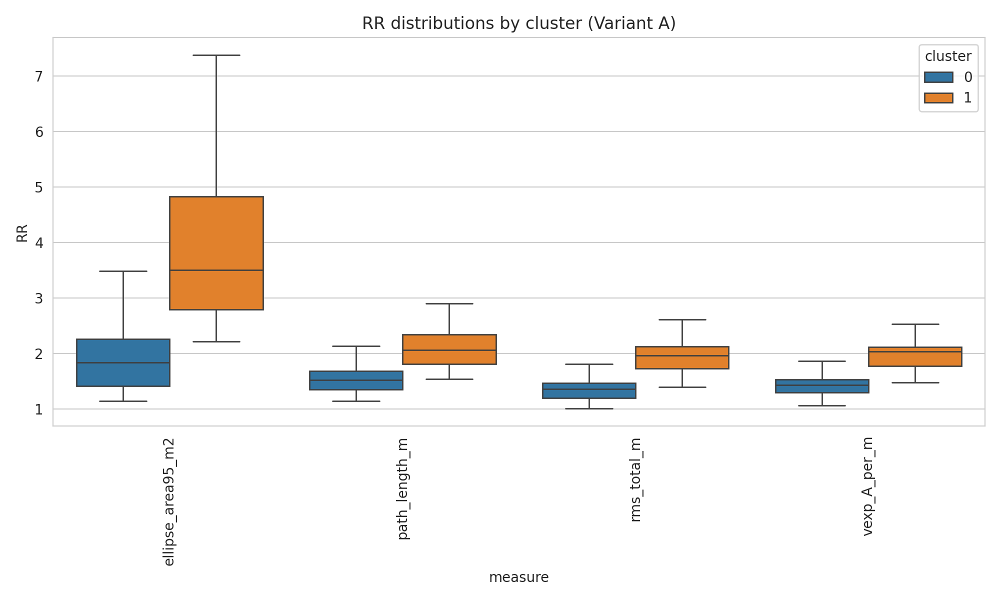

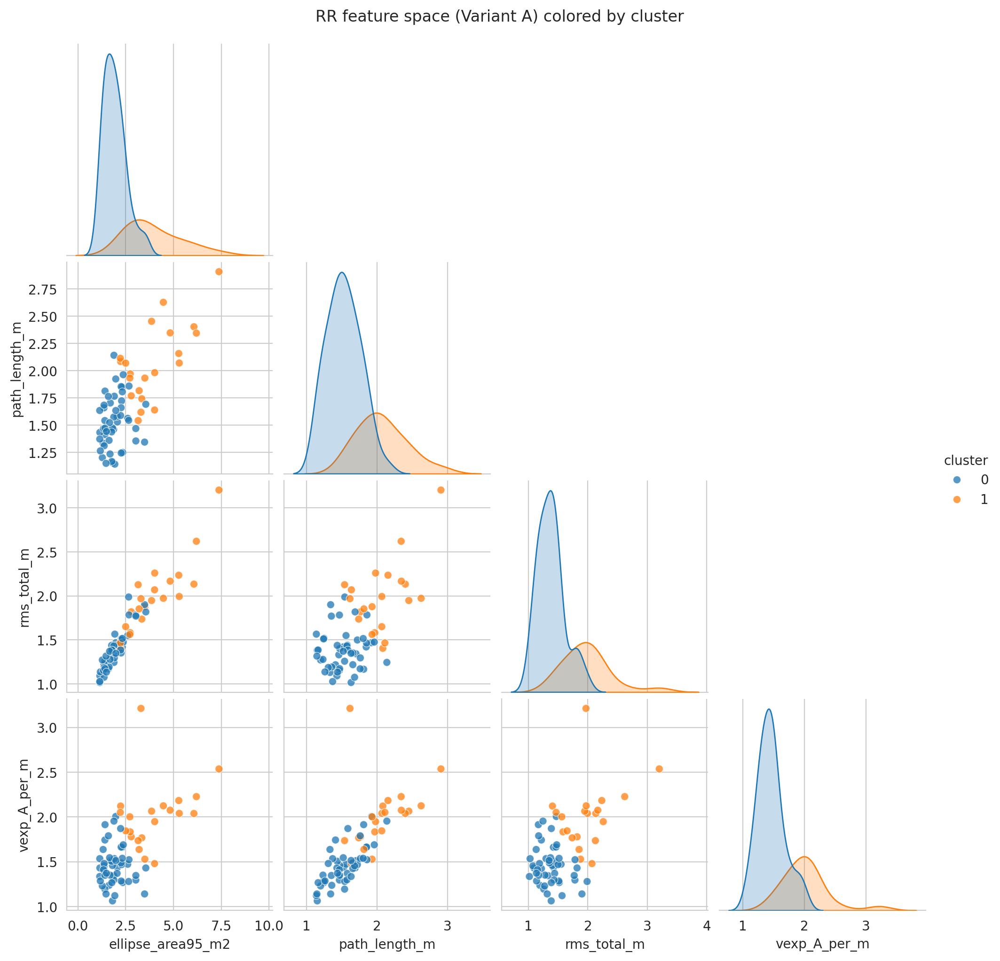

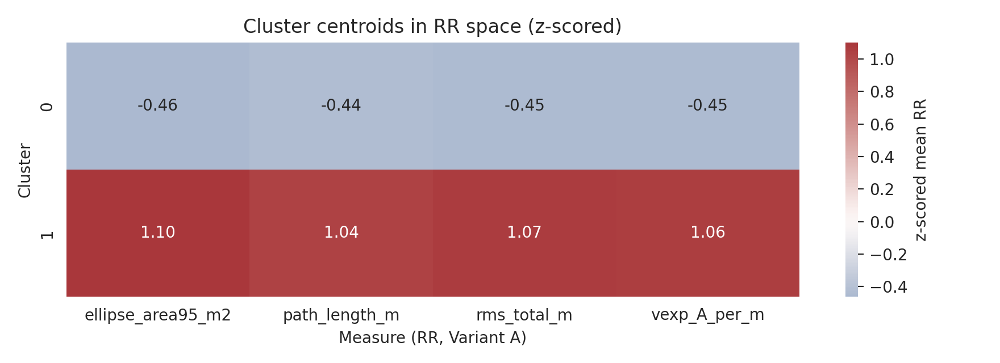

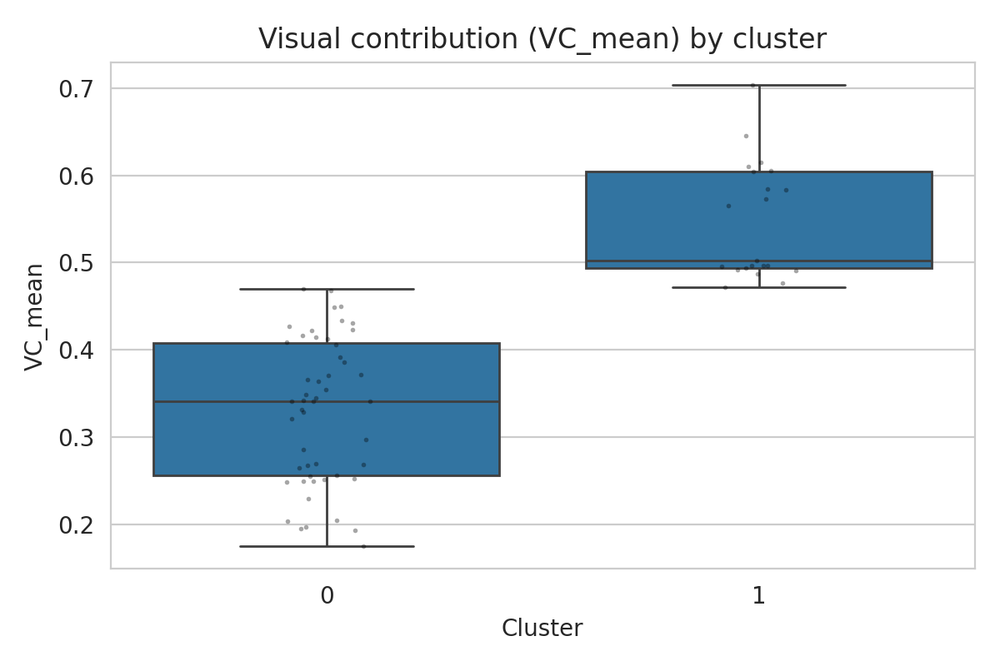

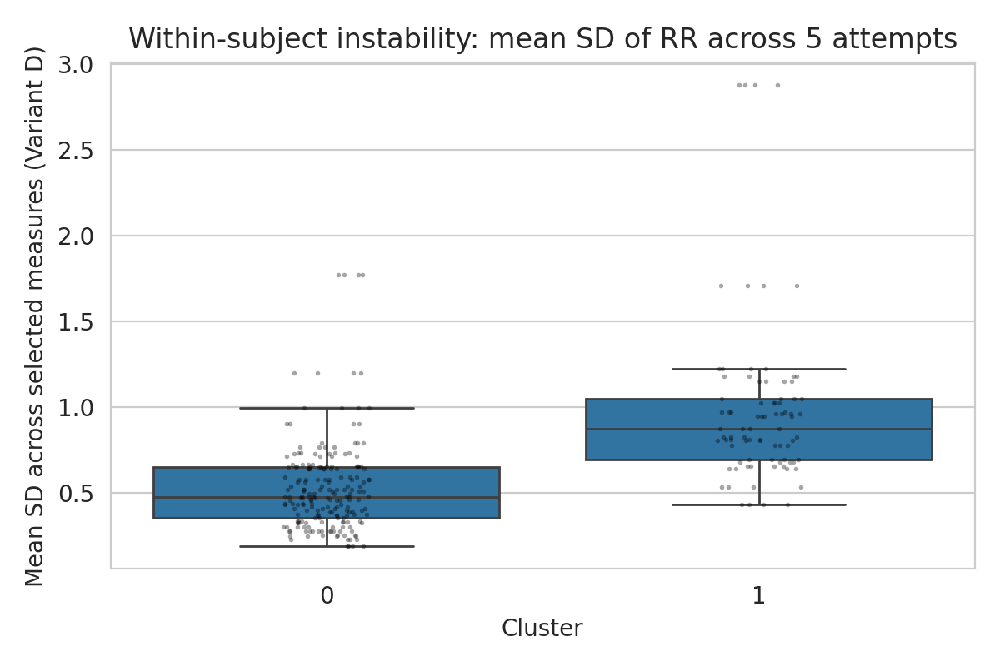

Clustering based on z-normalized RR values for path length, RMS, ellipse area, and energy-expenditure index revealed two stable profiles. One cluster demonstrated systematically higher RR across all selected measures, consistent with greater destabilization in eyes-closed condition and therefore greater dependence on visual input for postural control. The second cluster showed lower RR, indicating weaker dependence on vision.

#Stage 6:  Elements of Mathematical Modeling

##6.1 Latent-variable model (sensor contributions + motor noise)

Assume each subject ($s$) has an unobserved visual dependence (latent) parameter $\theta_s \ge 0$. For each measure $m$:

The observed Romberg ratio $R_{s,m}$ (e.g., Variant A or D-mean) is modeled as:  

$$log(R_{s,m}) =a_m+b_{m} \theta{s}+ ϵ_{s,m}$$

where:  
- ($a_m$): measure-specific baseline (some measures naturally have higher RR)
- ($b_m$): measure sensitivity to vision removal
- $(\epsilon_{s,m})$: noise (captures motor noise + measurement noise)



This is essentially a 1-factor model on log(RR) with nonnegative latent factor (interpretation: sensory weight).

Why log?  
- RR is positive and often skewed.
- Additive Gaussian noise on log-scale is reasonable.


In [ ]:
# stage6A_latent_factor_logR.py
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import FactorAnalysis
from sklearn.linear_model import LinearRegression

ROMBERG_ABCD = "romberg_coefficients_options_ABCD.csv"
VARIANT = "A_mean_then_ratio"  # use a single RR per subject per measure
MEASURES = ["approx_entropy_speed", "speed_cv", "freq_zc_x_hz", "freq_zc_y_hz"]
EPS = 1e-12

df = pd.read_csv(ROMBERG_ABCD)
df["variant"] = df["variant"].astype(str)
df["measure"] = df["measure"].astype(str)

df = df[(df["variant"] == VARIANT) & (df["measure"].isin(MEASURES))].copy()

wide = df.pivot_table(index="subject_id", columns="measure", values="R", aggfunc="mean").dropna()
logR = np.log(wide.to_numpy(float) + EPS)

# standardize columns (measures)
sc = StandardScaler()
Z = sc.fit_transform(logR)

# one-factor model
fa = FactorAnalysis(n_components=1, random_state=0)
theta = fa.fit_transform(Z)[:, 0]
theta = (theta - theta.mean()) / (theta.std(ddof=1) + EPS)

# regress each measure on theta: logR = a_m + b_m * theta
rows = []
pred = np.zeros_like(logR)
for j, m in enumerate(wide.columns):
    y = logR[:, j]
    reg = LinearRegression().fit(theta.reshape(-1, 1), y)
    a = float(reg.intercept_)
    b = float(reg.coef_[0])
    yhat = reg.predict(theta.reshape(-1, 1))
    pred[:, j] = yhat
    rows.append({"measure": m, "a_intercept": a, "b_loading": b, "R2": float(reg.score(theta.reshape(-1, 1), y))})

params = pd.DataFrame(rows).sort_values("R2", ascending=False)
params.to_csv("stage6_latent_logR_loadings.csv", index=False)

rmse = float(np.sqrt(np.mean((logR - pred) ** 2)))
pd.DataFrame({"rmse_logR": [rmse], "variant": [VARIANT], "n_subjects": [wide.shape[0]]}).to_csv(
    "stage6_latent_logR_fit_summary.csv", index=False
)

theta_df = pd.DataFrame({"subject_id": wide.index.astype(int), "theta_visual_dependence": theta})
theta_df.to_csv("stage6_latent_theta_subjects.csv", index=False)

print("Saved stage6_latent_logR_loadings.csv")
print("Saved stage6_latent_logR_fit_summary.csv  RMSE(logR) =", rmse)
print("Saved stage6_latent_theta_subjects.csv")

Saved stage6_latent_logR_loadings.csv
Saved stage6_latent_logR_fit_summary.csv  RMSE(logR) = 0.07656571123053767
Saved stage6_latent_theta_subjects.csv


##6.2 Bayesian hierarchical model (trialwise ($R_i$)) + compare indicators/variants

Model ($R_{s,m,i}$) (Option D trialwise) with:

subject random effects (individual balance),
measure random effects,
attempt variability,
and compare how different “calculation variants” influence posterior.  

Recommended Bayesian model on log-scale:

$$ log(R_{s,m,i}) \approx \mathcal{N}(μ+ α_s+ β_m, σ^2)
$$

with hierarchical priors:

$(\alpha_s \sim \mathcal{N}(0, \sigma_s^2))$  
$(\beta_m \sim \mathcal{N}(0, \sigma_m^2))$

In [ ]:
!pip install pymc arviz pytensor

In [ ]:
# stage6B_bayes_hierarchical_logRi.py
import numpy as np
import pandas as pd
import pymc as pm
import arviz as az

ROMBERG_D = "romberg_optionD_trialwise_distribution.csv"
MEASURES = ["approx_entropy_speed", "speed_cv", "freq_zc_x_hz", "freq_zc_y_hz"]
EPS = 1e-12

d = pd.read_csv(ROMBERG_D)
d["measure"] = d["measure"].astype(str)

# normalize attempt index column name
if "attempt_i" in d.columns and "pair_index" not in d.columns:
    d = d.rename(columns={"attempt_i": "pair_index"})

d = d[d["measure"].isin(MEASURES)].copy()
d = d.dropna(subset=["subject_id", "measure", "pair_index", "R_i"]).copy()

d["logR"] = np.log(d["R_i"].astype(float) + EPS)

# encode indices
subj_ids = sorted(d["subject_id"].unique())
meas_ids = sorted(d["measure"].unique())
subj_map = {s: i for i, s in enumerate(subj_ids)}
meas_map = {m: i for i, m in enumerate(meas_ids)}

d["subj_idx"] = d["subject_id"].map(subj_map).astype(int)
d["meas_idx"] = d["measure"].map(meas_map).astype(int)

y = d["logR"].to_numpy(float)
subj_idx = d["subj_idx"].to_numpy(int)
meas_idx = d["meas_idx"].to_numpy(int)

coords = {
    "subject": [str(s) for s in subj_ids],
    "measure": meas_ids,
    "obs_id": np.arange(len(d))
}

with pm.Model(coords=coords) as model:
    mu = pm.Normal("mu", 0.0, 1.5)

    sigma_subj = pm.HalfNormal("sigma_subj", 1.0)
    sigma_meas = pm.HalfNormal("sigma_meas", 1.0)
    sigma = pm.HalfNormal("sigma", 1.0)

    a_subj = pm.Normal("a_subj", 0.0, sigma_subj, dims="subject")
    b_meas = pm.Normal("b_meas", 0.0, sigma_meas, dims="measure")

    yhat = mu + a_subj[subj_idx] + b_meas[meas_idx]

    pm.Normal("obs", mu=yhat, sigma=sigma, observed=y, dims="obs_id")

    idata = pm.sample(
        draws=2000, tune=2000,
        chains=4, target_accept=0.9,
        random_seed=0
    )

az.to_netcdf(idata, "stage6_bayes_hierarchical_logR_idata.nc")
summary = az.summary(idata, var_names=["mu", "sigma", "sigma_subj", "sigma_meas"])
summary.to_csv("stage6_bayes_hierarchical_logR_summary.csv")

print("Saved stage6_bayes_hierarchical_logR_idata.nc")
print("Saved stage6_bayes_hierarchical_logR_summary.csv")
print(summary)

Output()

Saved stage6_bayes_hierarchical_logR_idata.nc
Saved stage6_bayes_hierarchical_logR_summary.csv
             mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
mu         -0.074  0.143  -0.245    0.111      0.011    0.042     666.0   
sigma       0.170  0.003   0.163    0.176      0.000    0.000   11548.0   
sigma_subj  0.047  0.007   0.034    0.060      0.000    0.000    3466.0   
sigma_meas  0.151  0.164   0.030    0.363      0.011    0.037    1024.0   

            ess_tail  r_hat  
mu             309.0   1.01  
sigma         5887.0   1.00  
sigma_subj    3653.0   1.00  
sigma_meas     392.0   1.00  


##Compare the variants A,B,C,D

In [ ]:
import os
import numpy as np
import pandas as pd
import pymc as pm
import arviz as az
import matplotlib.pyplot as plt

ROMBERG_ABCD = "romberg_coefficients_options_ABCD.csv"
ROMBERG_D = "romberg_optionD_trialwise_distribution.csv"

MEASURES = ["approx_entropy_speed", "speed_cv", "freq_zc_x_hz", "freq_zc_y_hz"]
EPS = 1e-12

# Variants to compare from romberg_coefficients_options_ABCD.csv
ABCD_VARIANTS = [
    "A_mean_then_ratio",
    "B_pairwise_ratio_mean",
    "C_bootstrap_median_ratio",
]

# Output folder
OUTDIR = "stage6_variant_comparison"
os.makedirs(OUTDIR, exist_ok=True)

# Sampling config
DRAWS = 2000
TUNE = 2000
CHAINS = 4
TARGET_ACCEPT = 0.9
RANDOM_SEED = 0
def get_hdi_cols(summary_df):
    """
    Return (low_col, high_col) for HDI columns from az.summary output
    across different ArviZ versions.
    """
    cols = list(summary_df.columns)

    # common patterns
    for low, high in [
        ("hdi_2.5%", "hdi_97.5%"),
        ("hdi_2.5", "hdi_97.5"),
        ("hdi_0.025", "hdi_0.975"),
        ("hdi_3%", "hdi_97%"),
        ("hdi_3", "hdi_97"),
    ]:
        if low in cols and high in cols:
            return low, high

    # fallback: any two columns that start with "hdi_" and look like bounds
    hdi_cols = [c for c in cols if str(c).startswith("hdi_")]
    if len(hdi_cols) >= 2:
        # sort by numeric part if possible
        def keyfn(c):
            s = str(c).replace("hdi_", "").replace("%", "")
            try:
                return float(s)
            except:
                return np.nan
        hdi_cols_sorted = sorted(hdi_cols, key=keyfn)
        return hdi_cols_sorted[0], hdi_cols_sorted[-1]

    raise KeyError(f"Could not find HDI columns in az.summary output. Columns={cols}")

def prepare_data_variant_abcd(abcd_csv, variant_name, measures):
    df = pd.read_csv(abcd_csv)
    df["variant"] = df["variant"].astype(str)
    df["measure"] = df["measure"].astype(str)

    df = df[(df["variant"] == variant_name) & (df["measure"].isin(measures))].copy()
    df = df.dropna(subset=["subject_id", "measure", "R"]).copy()

    df["logR"] = np.log(df["R"].astype(float) + EPS)
    df["attempt"] = "single"  # placeholder (no attempt structure)

    return df[["subject_id", "measure", "attempt", "logR"]].copy()


def prepare_data_variant_d(romberg_d_csv, measures):
    d = pd.read_csv(romberg_d_csv)
    d["measure"] = d["measure"].astype(str)

    # normalize attempt column
    if "attempt_i" in d.columns and "pair_index" not in d.columns:
        d = d.rename(columns={"attempt_i": "pair_index"})

    d = d[d["measure"].isin(measures)].copy()
    d = d.dropna(subset=["subject_id", "measure", "R_i", "pair_index"]).copy()

    d["pair_index"] = pd.to_numeric(d["pair_index"], errors="coerce")
    d = d.dropna(subset=["pair_index"]).copy()
    d["pair_index"] = d["pair_index"].astype(int)

    d["logR"] = np.log(d["R_i"].astype(float) + EPS)
    d["attempt"] = d["pair_index"].astype(str)

    return d[["subject_id", "measure", "attempt", "logR"]].copy()


def fit_model(df_long, variant_label, with_attempt=False):
    """
    Hierarchical model on logR:
      logR ~ mu + a_subj + b_meas (+ g_attempt if with_attempt)
    Priors:
      mu ~ Normal(0, 1.5)
      a_subj ~ Normal(0, sigma_subj)
      b_meas ~ Normal(0, sigma_meas)
      g_attempt ~ Normal(0, sigma_attempt)
      sigma_* ~ HalfNormal(...)
      obs noise sigma ~ HalfNormal(1.0)
    """
    # encode indices
    subj_ids = sorted(df_long["subject_id"].unique())
    meas_ids = sorted(df_long["measure"].unique())

    subj_map = {s: i for i, s in enumerate(subj_ids)}
    meas_map = {m: i for i, m in enumerate(meas_ids)}

    df_long = df_long.copy()
    df_long["subj_idx"] = df_long["subject_id"].map(subj_map).astype(int)
    df_long["meas_idx"] = df_long["measure"].map(meas_map).astype(int)

    y = df_long["logR"].to_numpy(float)
    subj_idx = df_long["subj_idx"].to_numpy(int)
    meas_idx = df_long["meas_idx"].to_numpy(int)

    coords = {
        "subject": [str(s) for s in subj_ids],
        "measure": meas_ids,
        "obs_id": np.arange(len(df_long)),
    }

    if with_attempt:
        att_ids = sorted(df_long["attempt"].unique(), key=lambda x: int(x))
        att_map = {a: i for i, a in enumerate(att_ids)}
        df_long["att_idx"] = df_long["attempt"].map(att_map).astype(int)
        att_idx = df_long["att_idx"].to_numpy(int)
        coords["attempt"] = att_ids

    with pm.Model(coords=coords) as model:
      # Global mean
      mu = pm.Normal("mu", 0.0, 1.5)

      # SDs (hierarchical)
      sigma_subj = pm.HalfNormal("sigma_subj", 1.0)
      sigma_meas = pm.HalfNormal("sigma_meas", 1.0)
      sigma = pm.HalfNormal("sigma", 1.0)

      # Non-centered random effects
      a_subj_raw = pm.Normal("a_subj_raw", 0.0, 1.0, dims="subject")
      b_meas_raw = pm.Normal("b_meas_raw", 0.0, 1.0, dims="measure")

      a_subj = pm.Deterministic("a_subj", a_subj_raw * sigma_subj, dims="subject")
      b_meas = pm.Deterministic("b_meas", b_meas_raw * sigma_meas, dims="measure")

      if with_attempt:
          sigma_attempt = pm.HalfNormal("sigma_attempt", 0.5)
          g_att_raw = pm.Normal("g_attempt_raw", 0.0, 1.0, dims="attempt")
          g_attempt = pm.Deterministic("g_attempt", g_att_raw * sigma_attempt, dims="attempt")
          yhat = mu + a_subj[subj_idx] + b_meas[meas_idx] + g_attempt[att_idx]
      else:
          yhat = mu + a_subj[subj_idx] + b_meas[meas_idx]

      pm.Normal("obs", mu=yhat, sigma=sigma, observed=y, dims="obs_id")

      idata = pm.sample(
          draws=4000,
          tune=4000,
          chains=4,
          target_accept=0.97,
          random_seed=RANDOM_SEED,
          idata_kwargs={"log_likelihood": True},
      )

    # Save idata
    idata_path = os.path.join(OUTDIR, f"idata_{variant_label}.nc")
    az.to_netcdf(idata, idata_path)

    # Summary CSV (key sigmas)
    var_names = ["mu", "sigma", "sigma_subj", "sigma_meas"]
    if with_attempt:
        var_names.append("sigma_attempt")

    summ = az.summary(idata, var_names=var_names, round_to=4)
    low_col, high_col = get_hdi_cols(summ)
    summ_path = os.path.join(OUTDIR, f"summary_{variant_label}.csv")
    summ.to_csv(summ_path)

    # LOO
    loo = az.loo(idata, pointwise=True)

    # Robust extraction across ArviZ versions
    loo_row = {
        "variant": variant_label,
        "elpd_loo": float(loo.elpd_loo),
        "p_loo": float(loo.p_loo),
        "loo_se": float(loo.se),
        "n_obs": int(len(df_long)),
    }

    # pointwise elpd is optional; only save if present
    if hasattr(loo, "loo_i"):
        # some versions expose pointwise as loo_i
        pd.DataFrame({"elpd_loo_i": np.asarray(loo.loo_i)}).to_csv(
            os.path.join(OUTDIR, f"loo_pointwise_{variant_label}.csv"), index=False
        )
    elif hasattr(loo, "pareto_k"):
        # keep pareto_k diagnostics if available
        pk = np.asarray(loo.pareto_k)
        pd.DataFrame({"pareto_k": pk}).to_csv(
            os.path.join(OUTDIR, f"loo_pareto_k_{variant_label}.csv"), index=False
        )

    loo_path = os.path.join(OUTDIR, f"loo_{variant_label}.csv")
    pd.DataFrame([loo_row]).to_csv(loo_path, index=False)

    # Posterior plots (sigma_subj, sigma) + optional sigma_attempt
    plot_vars = ["sigma_subj", "sigma"]
    if with_attempt:
        plot_vars.append("sigma_attempt")

    ax = az.plot_posterior(idata, var_names=plot_vars, hdi_prob=0.95)
    plt.suptitle(f"Posterior distributions: {variant_label}", y=1.02)
    plt.tight_layout()
    fig_path = os.path.join(OUTDIR, f"posterior_{variant_label}.png")
    plt.savefig(fig_path, dpi=200)
    plt.close()

    # Return key results for comparison tables
    res = {
        "variant": variant_label,
        "with_attempt": with_attempt,
        "n_obs": len(df_long),
        "n_subjects": len(subj_ids),
        "n_measures": len(meas_ids),
        "idata_path": idata_path,
        "summary_path": summ_path,
        "loo_path": loo_path,
        "elpd_loo": float(loo.elpd_loo),
        "p_loo": float(loo.p_loo),
        "loo_se": float(loo.se),
    }

    # Extract posterior summaries for sigma_subj and sigma
    for key in ["sigma_subj", "sigma"]:
        res[f"{key}_mean"] = float(summ.loc[key, "mean"])
        res[f"{key}_sd"] = float(summ.loc[key, "sd"])
        res[f"{key}_hdi_2.5%"] = float(summ.loc[key, low_col])
        res[f"{key}_hdi_97.5%"] = float(summ.loc[key, high_col])

    if with_attempt:
        key = "sigma_attempt"
        res[f"{key}_mean"] = float(summ.loc[key, "mean"])
        res[f"{key}_sd"] = float(summ.loc[key, "sd"])
        res[f"{key}_hdi_2.5%"] = float(summ.loc[key, low_col])
        res[f"{key}_hdi_97.5%"] = float(summ.loc[key, high_col])

    return res


# -------------------------------
# Prepare datasets
# -------------------------------
datasets = []

for v in ABCD_VARIANTS:
    datasets.append((v, prepare_data_variant_abcd(ROMBERG_ABCD, v, MEASURES), False))

# Variant D with attempt effect (recommended)
datasets.append(("D_trialwise", prepare_data_variant_d(ROMBERG_D, MEASURES), True))

# -------------------------------
# Fit and collect results
# -------------------------------
results = []
for label, df_long, with_attempt in datasets:
    print(f"\n=== Fitting {label} | with_attempt={with_attempt} | n={len(df_long)} ===")
    results.append(fit_model(df_long, label, with_attempt=with_attempt))

res_df = pd.DataFrame(results)

# Save combined comparison tables
res_df.to_csv(os.path.join(OUTDIR, "sigma_posterior_summary.csv"), index=False)

# LOO comparison table (higher elpd_loo is better)
loo_comp = res_df[["variant", "with_attempt", "n_obs", "elpd_loo", "loo_se", "p_loo",
                   "sigma_subj_mean", "sigma_subj_hdi_2.5%", "sigma_subj_hdi_97.5%",
                   "sigma_mean", "sigma_hdi_2.5%", "sigma_hdi_97.5%"]].copy()
loo_comp = loo_comp.sort_values("elpd_loo", ascending=False)
loo_comp.to_csv(os.path.join(OUTDIR, "loo_comparison.csv"), index=False)

print("\nSaved:", os.path.join(OUTDIR, "sigma_posterior_summary.csv"))
print("Saved:", os.path.join(OUTDIR, "loo_comparison.csv"))
print("\nLOO comparison (sorted by elpd_loo):")
print(loo_comp.to_string(index=False))


=== Fitting A_mean_then_ratio | with_attempt=False | n=284 ===


Output()

ERROR:pymc.stats.convergence:There were 127 divergences after tuning. Increase `target_accept` or reparameterize.
/usr/local/lib/python3.12/dist-packages/arviz/stats/stats.py:797: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.70 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(



=== Fitting B_pairwise_ratio_mean | with_attempt=False | n=284 ===


Output()

ERROR:pymc.stats.convergence:There were 37 divergences after tuning. Increase `target_accept` or reparameterize.
/usr/local/lib/python3.12/dist-packages/arviz/stats/stats.py:797: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.70 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(



=== Fitting C_bootstrap_median_ratio | with_attempt=False | n=284 ===


Output()

ERROR:pymc.stats.convergence:There were 30 divergences after tuning. Increase `target_accept` or reparameterize.



=== Fitting D_trialwise | with_attempt=True | n=1420 ===


Output()

ERROR:pymc.stats.convergence:There were 35 divergences after tuning. Increase `target_accept` or reparameterize.



Saved: stage6_variant_comparison/sigma_posterior_summary.csv
Saved: stage6_variant_comparison/loo_comparison.csv

LOO comparison (sorted by elpd_loo):
                 variant  with_attempt  n_obs   elpd_loo    loo_se     p_loo  sigma_subj_mean  sigma_subj_hdi_2.5%  sigma_subj_hdi_97.5%  sigma_mean  sigma_hdi_2.5%  sigma_hdi_97.5%
             D_trialwise          True   1420 481.614185 43.995997 52.679666           0.0474               0.0355                0.0609      0.1692          0.1629           0.1752
       A_mean_then_ratio         False    284 261.429162 19.358376 39.577705           0.0424               0.0269                0.0589      0.0892          0.0808           0.0977
   B_pairwise_ratio_mean         False    284 261.035227 18.400382 36.431012           0.0397               0.0232                0.0569      0.0900          0.0817           0.0986
C_bootstrap_median_ratio         False    284 236.875239 15.756318 39.235873           0.0481               0.0306      

In [ ]:
# stage6_plot_variant_posteriors.py
import os
import numpy as np
import pandas as pd
import arviz as az
import matplotlib.pyplot as plt
import seaborn as sns

INDIR = "stage6_variant_comparison"
OUTDIR = "stage6_variant_comparison"
os.makedirs(OUTDIR, exist_ok=True)

# The exact variant labels must match your filenames:
VARIANTS = [
    "A_mean_then_ratio",
    "B_pairwise_ratio_mean",
    "C_bootstrap_median_ratio",
    "D_trialwise",
]

# Pretty names for plots
PRETTY = {
    "A_mean_then_ratio": "A (mean then ratio)",
    "B_pairwise_ratio_mean": "B (mean pairwise ratios)",
    "C_bootstrap_median_ratio": "C (bootstrap median)",
    "D_trialwise": "D (trialwise, attempt effect)",
}

# n_obs values (used for per-obs elpd; if you saved them elsewhere you can read them)
N_OBS = {
    "A_mean_then_ratio": 284,
    "B_pairwise_ratio_mean": 284,
    "C_bootstrap_median_ratio": 284,
    "D_trialwise": 1420,
}

sns.set_style("whitegrid")


def load_idata(variant):
    path = os.path.join(INDIR, f"idata_{variant}.nc")
    return az.from_netcdf(path)


def kde_overlay(var_name, idatas, labels, out_png, title):
    plt.figure(figsize=(8, 4.5))
    for idata, lab in zip(idatas, labels):
        if var_name not in idata.posterior:
            continue
        x = idata.posterior[var_name].values.ravel()
        sns.kdeplot(x=x, label=lab, linewidth=2)
    plt.title(title)
    plt.xlabel(var_name)
    plt.ylabel("density")
    plt.legend()
    plt.tight_layout()
    plt.savefig(out_png, dpi=200)
    plt.close()
    print("Saved", out_png)


# -----------------------
# Load all idata objects
# -----------------------
idatas = []
labels = []
for v in VARIANTS:
    idata = load_idata(v)
    idatas.append(idata)
    labels.append(PRETTY.get(v, v))

# -----------------------
# Overlay posterior KDEs
# -----------------------
kde_overlay(
    "sigma_subj",
    idatas,
    labels,
    os.path.join(OUTDIR, "posterior_overlay_sigma_subj.png"),
    "Posterior overlay: sigma_subj (stable individual differences)"
)

kde_overlay(
    "sigma",
    idatas,
    labels,
    os.path.join(OUTDIR, "posterior_overlay_sigma.png"),
    "Posterior overlay: sigma (residual / noise)"
)

# Attempt effect exists only in D (and only if you included it)
kde_overlay(
    "sigma_attempt",
    idatas,
    labels,
    os.path.join(OUTDIR, "posterior_overlay_sigma_attempt.png"),
    "Posterior overlay: sigma_attempt (attempt-to-attempt drift)"
)

# -----------------------
# LOO table + per-obs elpd
# -----------------------
rows = []
for v, idata in zip(VARIANTS, idatas):
    loo = az.loo(idata, pointwise=False)  # pointwise not needed for this summary
    rows.append({
        "variant": v,
        "variant_pretty": PRETTY.get(v, v),
        "n_obs": int(N_OBS.get(v, np.nan)),
        "elpd_loo": float(loo.elpd_loo),
        "loo_se": float(loo.se),
        "p_loo": float(loo.p_loo),
        "elpd_loo_per_obs": float(loo.elpd_loo) / float(N_OBS.get(v, np.nan))
    })

loo_df = pd.DataFrame(rows)
loo_df.to_csv(os.path.join(OUTDIR, "loo_table_all_variants.csv"), index=False)
print("Saved", os.path.join(OUTDIR, "loo_table_all_variants.csv"))

# -----------------------
# Fair comparison plot: A/B/C only (same n_obs)
# -----------------------
abc = loo_df[loo_df["variant"].isin(["A_mean_then_ratio", "B_pairwise_ratio_mean", "C_bootstrap_median_ratio"])].copy()
abc = abc.sort_values("elpd_loo_per_obs", ascending=False)

plt.figure(figsize=(7, 4))
sns.barplot(data=abc, x="variant_pretty", y="elpd_loo_per_obs", color="steelblue")
plt.title("ELPD per observation (fair comparison: A vs B vs C)")
plt.xlabel("")
plt.ylabel("elpd_loo / n_obs")
plt.tight_layout()
plt.savefig(os.path.join(OUTDIR, "elpd_per_obs_bar_A_B_C.png"), dpi=200)
plt.close()
print("Saved", os.path.join(OUTDIR, "elpd_per_obs_bar_A_B_C.png"))

Saved stage6_variant_comparison/posterior_overlay_sigma_subj.png
Saved stage6_variant_comparison/posterior_overlay_sigma.png
Saved stage6_variant_comparison/posterior_overlay_sigma_attempt.png


/usr/local/lib/python3.12/dist-packages/arviz/stats/stats.py:797: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.70 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/arviz/stats/stats.py:797: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.70 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(


Saved stage6_variant_comparison/loo_table_all_variants.csv
Saved stage6_variant_comparison/elpd_per_obs_bar_A_B_C.png


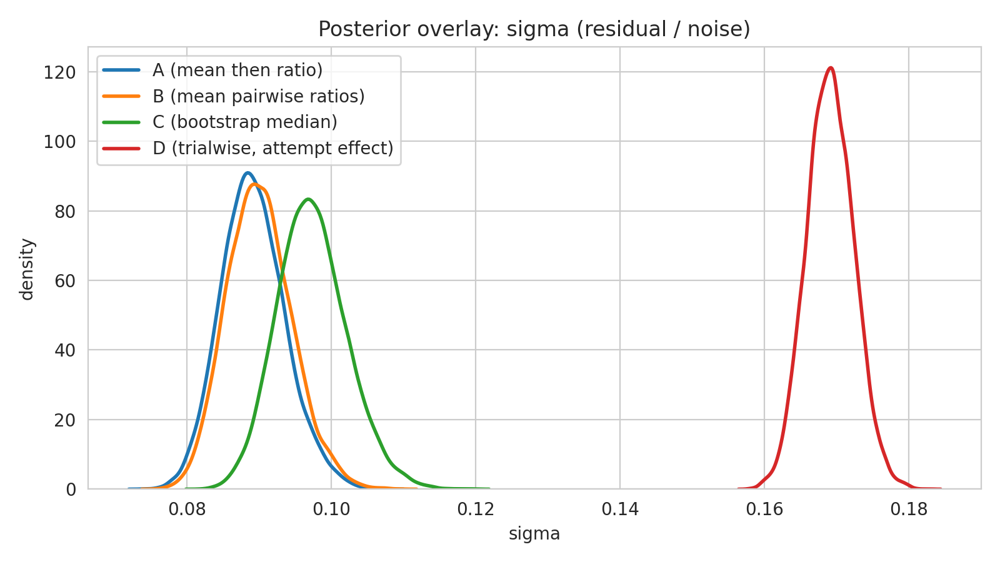

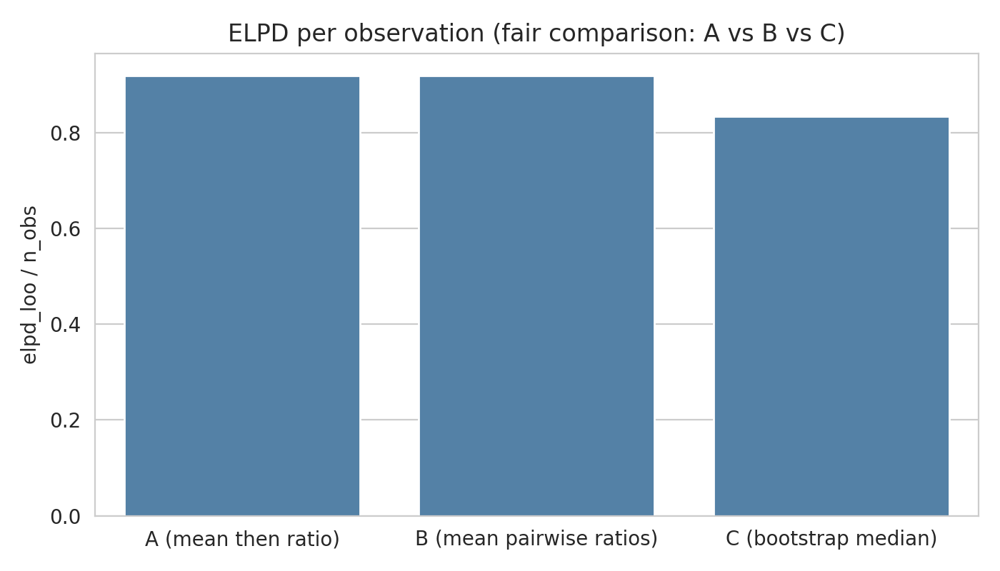

A Bayesian hierarchical model was fitted to $\log(R)$ for four alternative definitions of the Romberg ratio (variants A–D) using the most stable measures (approx_entropy_speed, speed_cv, freq_zc_x_hz, freq_zc_y_hz). Across all variants, the posterior for the between-subject standard deviation $\sigma_{\text{subj}})$ was consistently above zero $\sigma_{\text{subj}}\approx 0.040$–(0.048) on the log scale), indicating the presence of stable inter-individual differences in sensory balance that are largely preserved regardless of the RR computation method. In contrast, the residual standard deviation $\sigma$ differed substantially between variants: the trialwise approach (variant D) yielded markedly higher residual variability $\sigma \approx 0.169$, 95% HDI 0.163–0.175, while the collapsed single-value methods showed lower residual noise (variant A: $\sigma \approx 0.089$), 95% HDI $0.081–0.098$; variant B: $\sigma \approx 0.090$, 95% HDI $0.082–0.099$. Variant C (bootstrap-median ratio) produced higher residual noise than A/B $\sigma \approx 0.097$, 95% HDI $0.089–0.107$.

Leave-one-out cross-validation (LOO) comparisons were performed for variants A–C (equal numbers of observations). Variants A and B showed virtually identical predictive performance $ELPD({\text{LOO}})$ 261.43 vs 261.04; differences small relative to SE), whereas variant C was substantially worse
$(ELPD({\text{LOO}})$ 236.88. Overall, these results suggest that the choice of RR definition affects primarily the amount of residual noise rather than the magnitude of stable individual differences. For constructing stable individual sensory profiles and clustering, variant A (or B) is therefore preferable, while variant D is more appropriate when the goal is to model within-subject variability and attempt-related effects.

##6.3: Generalizability-theory — Variant D, crossed facets

Model:

$$y_{s,m,a} = \mu + S_s + M_m + A_a + (SM){s,m} + (SA){s,a} + (MA){m,a} + (e){s,m,a} $$

 where $y = \log(R_i
 )$.

 Then for a composite score $\bar y$ averaged over $nM$ measures and $nA$ attempts:

$$ \sigma^2_{error}=\frac{\sigma^2_{SM}}{n_M}+ \frac{\sigma^2_{SA}}{n_A}+ \frac{\sigma^2_{MA}}{n_Mn_A}+ \frac{σ^2_e}{n_Mn_A} $$

Generalizability coefficient:

$$G=\frac{\sigma^2_s}{\sigma^2_s+\sigma^2_{error}}$$

In [ ]:
import numpy as np
import pandas as pd
import statsmodels.formula.api as smf

ROMBERG_D = "romberg_optionD_trialwise_distribution.csv"

# Choose the measure set for the G-study.
# For coherence with your Bayesian modeling stage, start with the stable 4:
MEASURES = ["approx_entropy_speed", "speed_cv", "freq_zc_x_hz", "freq_zc_y_hz"]

EPS = 1e-12

def compute_G(var_S, var_SM, var_SA, var_MA, var_e, nM, nA):
    """Relative G-coefficient for mean over nM measures and nA attempts."""
    err = (var_SM / nM) + (var_SA / nA) + (var_MA / (nM * nA)) + (var_e / (nM * nA))
    return float(var_S / (var_S + err + 1e-18)), float(err)

# ---------------------------
# Load and prepare data
# ---------------------------
d = pd.read_csv(ROMBERG_D)
d["measure"] = d["measure"].astype(str)

# normalize attempt column
if "attempt_i" in d.columns and "pair_index" not in d.columns:
    d = d.rename(columns={"attempt_i": "pair_index"})

d = d[d["measure"].isin(MEASURES)].copy()
d = d.dropna(subset=["subject_id", "measure", "pair_index", "R_i"]).copy()

d["pair_index"] = pd.to_numeric(d["pair_index"], errors="coerce")
d = d.dropna(subset=["pair_index"]).copy()
d["attempt"] = d["pair_index"].astype(int).astype(str)  # attempt facet
d["subject"] = d["subject_id"].astype(int).astype(str)

# log(R)
d["y"] = np.log(d["R_i"].astype(float) + EPS)

# sanity check
n_subj = d["subject"].nunique()
n_meas = d["measure"].nunique()
n_att = d["attempt"].nunique()
print(f"Data: n_subjects={n_subj}, n_measures={n_meas}, n_attempts={n_att}, n_obs={len(d)}")

# ---------------------------
# Variance components model
# Crossed random facets via vc_formula
# Grouping: subject random intercept already included through groups=subject
# Additional components: measure, attempt, and their interactions with subject and with each other
# ---------------------------
vc = {
    "M": "0 + C(measure)",
    "A": "0 + C(attempt)",
    "SM": "0 + C(subject):C(measure)",
    "SA": "0 + C(subject):C(attempt)",
    "MA": "0 + C(measure):C(attempt)",
}

# MixedLM: y ~ 1 with random intercept for subject (captures S) + vc terms
md = smf.mixedlm("y ~ 1", data=d, groups=d["subject"], vc_formula=vc, re_formula="1")
fit = md.fit(reml=True, method="lbfgs")
print("vc keys order:", list(vc.keys()))
print("fit.vcomp:", fit.vcomp)
print("fit.scale:", fit.scale)
print("fit.cov_re:", fit.cov_re)

print(fit.summary())

# ---------------------------
# Extract variance components
# ---------------------------
# Subject random intercept variance (S):
# In statsmodels, random effects cov matrix is fit.cov_re (1x1 for random intercept)
var_S = float(fit.cov_re.iloc[0, 0])

# Variance components for vc_formula are returned in fit.vcomp in the SAME ORDER
# as vc keys insertion order.
# We used Python dict literal (preserves order in 3.7+): M, A, SM, SA, MA
vcomp = list(fit.vcomp)
var_M, var_A, var_SM, var_SA, var_MA = map(float, vcomp)

# Residual variance:
var_e = float(fit.scale)

var_table = pd.DataFrame([
    {"component": "S (subject)", "variance": var_S},
    {"component": "M (measure)", "variance": var_M},
    {"component": "A (attempt)", "variance": var_A},
    {"component": "S×M", "variance": var_SM},
    {"component": "S×A", "variance": var_SA},
    {"component": "M×A", "variance": var_MA},
    {"component": "e (residual)", "variance": var_e},
])

var_table.to_csv("stage6_gtheory_variance_components.csv", index=False)
print("Saved stage6_gtheory_variance_components.csv")
print(var_table)

# ---------------------------
# Compute G for your current design (nM measures, nA attempts)
# ---------------------------
nM = n_meas
nA = n_att
G, err_var = compute_G(var_S, var_SM, var_SA, var_MA, var_e, nM=nM, nA=nA)

design_row = {
    "n_subjects": n_subj,
    "n_measures": nM,
    "n_attempts": nA,
    "G_relative": G,
    "error_variance_relative": err_var,
}

pd.DataFrame([design_row]).to_csv("stage6_gtheory_G_current_design.csv", index=False)
print("Saved stage6_gtheory_G_current_design.csv")
print(design_row)

# ---------------------------
# D-study: project G for alternative designs
# (useful for recommendations in the paper)
# ---------------------------
d_study_rows = []
for nM2 in [1, 2, 4, nM]:
    for nA2 in [1, 2, 3, 5]:
        G2, err2 = compute_G(var_S, var_SM, var_SA, var_MA, var_e, nM=nM2, nA=nA2)
        d_study_rows.append({
            "n_measures": nM2,
            "n_attempts": nA2,
            "G_relative": G2,
            "error_variance_relative": err2
        })

d_study = pd.DataFrame(d_study_rows).sort_values(["n_measures", "n_attempts"])
d_study.to_csv("stage6_gtheory_D_study_table.csv", index=False)
print("Saved stage6_gtheory_D_study_table.csv")

Data: n_subjects=71, n_measures=4, n_attempts=5, n_obs=1420
vc keys order: ['M', 'A', 'SM', 'SA', 'MA']
fit.vcomp: [1.48465900e-09 3.71669014e-03 2.16470211e-02 1.48465900e-09
 3.71669014e-03]
fit.scale: 0.005260714102179172
fit.cov_re:           Group
Group  0.000397
        Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: y       
No. Observations: 1420    Method:             REML    
No. Groups:       71      Scale:              0.0053  
Min. group size:  20      Log-Likelihood:     421.1201
Max. group size:  20      Converged:          Yes     
Mean group size:  20.0                                
------------------------------------------------------
            Coef.  Std.Err.   z    P>|z| [0.025 0.975]
------------------------------------------------------
Intercept   -0.058    0.007 -8.123 0.000 -0.072 -0.044
Group Var    0.000    0.009                           
A Var        0.000                                    
M Var        0.004       

/usr/local/lib/python3.12/dist-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


A generalizability analysis on trialwise $\log(R)$ with subject, measure, and attempt as facets indicated very low relative generalizability for a composite score averaged across 4 measures and 5 attempts (G ≈ 0.06). The variance decomposition was dominated by subject×measure interaction variance, while pure between-subject variance was small. This suggests that the examined parameters are not interchangeable indicators of a single unidimensional sensory-balance trait; instead, subject differences depend strongly on the specific measure.

In [ ]:
import numpy as np
import pandas as pd
import statsmodels.formula.api as smf

ROMBERG_D = "romberg_optionD_trialwise_distribution.csv"
EPS = 1e-12

# If you want ALL measures, leave as None.
# Or provide a list like: ["approx_entropy_speed", ...]
MEASURES = None

d = pd.read_csv(ROMBERG_D)
d["measure"] = d["measure"].astype(str)

if "attempt_i" in d.columns and "pair_index" not in d.columns:
    d = d.rename(columns={"attempt_i": "pair_index"})

d = d.dropna(subset=["subject_id", "measure", "pair_index", "R_i"]).copy()
d["pair_index"] = pd.to_numeric(d["pair_index"], errors="coerce")
d = d.dropna(subset=["pair_index"]).copy()

d["subject"] = d["subject_id"].astype(int).astype(str)
d["attempt"] = d["pair_index"].astype(int)
d["y"] = np.log(d["R_i"].astype(float) + EPS)

# Optionally filter measures
if MEASURES is not None:
    d = d[d["measure"].isin(MEASURES)].copy()

# Keep only measures with full 5 attempts per subject if you want strict completeness
# (Optional; comment out if you prefer maximum coverage.)
# counts = d.groupby(["measure","subject"])["attempt"].nunique().reset_index(name="nA")
# good = counts[counts["nA"] == 5][["measure","subject"]]
# d = d.merge(good, on=["measure","subject"], how="inner")

measures = sorted(d["measure"].unique())
print("n_measures:", len(measures), "n_obs:", len(d))

def G_from_components(var_S, var_e, nA):
    return float(var_S / (var_S + var_e / nA + 1e-18))

rows = []
for m in measures:
    dm = d[d["measure"] == m].copy()
    n_subj = dm["subject"].nunique()
    n_obs = len(dm)
    nA_unique = dm["attempt"].nunique()

    # Require enough data to fit
    if n_subj < 10 or nA_unique < 2:
        continue

    # Random intercept for subject; attempt fixed effect to absorb global shifts
    # y ~ 1 + C(attempt), random intercept (1|subject)
    try:
        md = smf.mixedlm("y ~ C(attempt)", data=dm, groups=dm["subject"], re_formula="1")
        fit = md.fit(reml=True, method="lbfgs", maxiter=500, disp=False)
    except Exception as e:
        rows.append({
            "measure": m, "status": "fail", "error": str(e),
            "n_subjects": n_subj, "n_obs": n_obs
        })
        continue

    var_S = float(fit.cov_re.iloc[0, 0])  # subject variance
    var_e = float(fit.scale)              # residual variance

    out = {
        "measure": m,
        "status": "ok",
        "n_subjects": n_subj,
        "n_obs": n_obs,
        "n_attempts_present": int(nA_unique),
        "var_S": var_S,
        "var_e": var_e,
        "G_1attempt": G_from_components(var_S, var_e, 1),
        "G_2attempt": G_from_components(var_S, var_e, 2),
        "G_3attempt": G_from_components(var_S, var_e, 3),
        "G_5attempt": G_from_components(var_S, var_e, 5),
    }
    rows.append(out)

res = pd.DataFrame(rows)

res.to_csv("stage6_gtheory_per_measure_attempts.csv", index=False)

# Rank measures by 5-attempt reliability (if present)
ok = res[res["status"] == "ok"].copy()
rank = ok.sort_values("G_5attempt", ascending=False)
rank.to_csv("stage6_gtheory_per_measure_rank_by_G5.csv", index=False)

print("Saved stage6_gtheory_per_measure_attempts.csv")
print("Saved stage6_gtheory_per_measure_rank_by_G5.csv")
print("Top 10 by G_5attempt:")
print(rank[["measure","n_subjects","var_S","var_e","G_1attempt","G_5attempt"]].head(10).to_string(index=False))

n_measures: 24 n_obs: 8520


/usr/local/lib/python3.12/dist-packages/statsmodels/regression/mixed_linear_model.py:1634: UserWarning: Random effects covariance is singular
  warnings.warn(msg)
/usr/local/lib/python3.12/dist-packages/statsmodels/regression/mixed_linear_model.py:1634: UserWarning: Random effects covariance is singular
  warnings.warn(msg)
/usr/local/lib/python3.12/dist-packages/statsmodels/regression/mixed_linear_model.py:1634: UserWarning: Random effects covariance is singular
  warnings.warn(msg)
/usr/local/lib/python3.12/dist-packages/statsmodels/regression/mixed_linear_model.py:1634: UserWarning: Random effects covariance is singular
  warnings.warn(msg)
/usr/local/lib/python3.12/dist-packages/statsmodels/regression/mixed_linear_model.py:1634: UserWarning: Random effects covariance is singular
  warnings.warn(msg)
/usr/local/lib/python3.12/dist-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg

Saved stage6_gtheory_per_measure_attempts.csv
Saved stage6_gtheory_per_measure_rank_by_G5.csv
Top 10 by G_5attempt:
                measure  n_subjects    var_S    var_e  G_1attempt  G_5attempt
                power_P          71 0.111891 0.185326    0.376462    0.751167
                rms_y_m          71 0.047754 0.160677    0.229113    0.597754
           freq_zc_y_hz          71 0.007033 0.026108    0.212207    0.573896
robust_range_x_p95_p5_m          71 0.036571 0.141616    0.205239    0.563548
        peak_accel_mps2          71 0.005289 0.195773    0.026307    0.119010


/usr/local/lib/python3.12/dist-packages/statsmodels/regression/mixed_linear_model.py:1634: UserWarning: Random effects covariance is singular
  warnings.warn(msg)
/usr/local/lib/python3.12/dist-packages/statsmodels/regression/mixed_linear_model.py:1634: UserWarning: Random effects covariance is singular
  warnings.warn(msg)
/usr/local/lib/python3.12/dist-packages/statsmodels/regression/mixed_linear_model.py:1634: UserWarning: Random effects covariance is singular
  warnings.warn(msg)
/usr/local/lib/python3.12/dist-packages/statsmodels/regression/mixed_linear_model.py:1634: UserWarning: Random effects covariance is singular
  warnings.warn(msg)


“A per-measure generalizability analysis across 5 repeated attempts showed substantial heterogeneity in reliability. The Romberg ratio derived from power_P exhibited good reliability when averaging across 5 attempts $G(_5)=0$.75), while $rms_y_m$, $freq_zc_y_hz$, and $robust_range_x_p95_p5_m$ achieved only moderate reliability $G(_5)(\approx)0.56–0.60$. In contrast, peak_accel_mps2 remained unreliable even after averaging $G(_5)=0.12$, indicating that this metric is dominated by trial-level noise rather than stable inter-individual differences.

In [ ]:
import pandas as pd
d = pd.read_csv("romberg_optionD_trialwise_distribution.csv")
print("unique measures:", d["measure"].nunique())
print(sorted(d["measure"].unique())[:50])

unique measures: 24
['approx_entropy_speed', 'ellipse_area95_m2', 'energy_A', 'freq_zc_x_hz', 'freq_zc_y_hz', 'mean_accel_mps2', 'mean_speed_mps', 'median_frequency_speed_hz', 'path_length_m', 'peak_accel_mps2', 'peak_speed_mps', 'power_P', 'range_x_m', 'range_y_m', 'rms_total_m', 'rms_x_m', 'rms_y_m', 'robust_range_x_p95_p5_m', 'robust_range_y_p95_p5_m', 'spectral_centroid_speed_hz', 'speed_cv', 'speed_mean_mps', 'speed_p95_mps', 'vexp_A_per_m']


In [ ]:
import pandas as pd
res = pd.read_csv("stage6_gtheory_per_measure_attempts.csv")
print("rows:", len(res))
print(res["status"].value_counts(dropna=False))
print("\nFailed examples:")
print(res[res["status"]!="ok"][["measure","status","error","n_subjects","n_obs","n_attempts_present"]].head(30).to_string(index=False))

rows: 24
status
fail    19
ok       5
Name: count, dtype: int64

Failed examples:
                   measure status           error  n_subjects  n_obs  n_attempts_present
      approx_entropy_speed   fail Singular matrix          71    355                 NaN
         ellipse_area95_m2   fail Singular matrix          71    355                 NaN
                  energy_A   fail Singular matrix          71    355                 NaN
              freq_zc_x_hz   fail Singular matrix          71    355                 NaN
           mean_accel_mps2   fail Singular matrix          71    355                 NaN
            mean_speed_mps   fail Singular matrix          71    355                 NaN
 median_frequency_speed_hz   fail Singular matrix          71    355                 NaN
             path_length_m   fail Singular matrix          71    355                 NaN
            peak_speed_mps   fail Singular matrix          71    355                 NaN
                 range_x_m  

#Per-measure attempt reliability

show which individual measures can be used alone.



In [ ]:
import numpy as np
import pandas as pd

ROMBERG_D = "romberg_optionD_trialwise_distribution.csv"
EPS = 1e-12

d = pd.read_csv(ROMBERG_D)
d["measure"] = d["measure"].astype(str)

if "attempt_i" in d.columns and "pair_index" not in d.columns:
    d = d.rename(columns={"attempt_i": "pair_index"})

d = d.dropna(subset=["subject_id","measure","pair_index","R_i"]).copy()
d["pair_index"] = pd.to_numeric(d["pair_index"], errors="coerce")
d = d.dropna(subset=["pair_index"]).copy()

# filter invalid for log
d = d[np.isfinite(d["R_i"].astype(float))].copy()
d = d[d["R_i"].astype(float) > 0].copy()

d["subject"] = d["subject_id"].astype(int).astype(str)
d["attempt"] = d["pair_index"].astype(int)
d["y"] = np.log(d["R_i"].astype(float) + EPS)

def G_from_components(var_S, var_e, nA):
    return float(var_S / (var_S + var_e / nA + 1e-18))

def vc_oneway_icc(dm):
    """
    One-way random effects variance components via ANOVA moments.
    Robust and closed-form. Works well for balanced data (yours is 71x5).
    Returns (var_S, var_e).
    """
    # balanced assumption simplifies; still fine if nearly balanced
    grand = dm["y"].mean()
    g = dm.groupby("subject")["y"]
    means = g.mean()
    counts = g.size()

    n = float(len(means))          # subjects
    k = float(counts.mean())       # attempts per subject (should be 5)

    ssb = float(((means - grand) ** 2 * counts).sum())
    ssw = float(g.apply(lambda s: ((s - s.mean()) ** 2).sum()).sum())

    msb = ssb / max(n - 1.0, 1.0)
    msw = ssw / max(len(dm) - n, 1.0)

    var_S = max((msb - msw) / max(k, 1.0), 0.0)
    var_e = max(msw, 0.0)
    return var_S, var_e

rows = []
for m in sorted(d["measure"].unique()):
    dm = d[d["measure"] == m].copy()
    n_subj = dm["subject"].nunique()
    n_obs = len(dm)
    nA_present = dm["attempt"].nunique()

    if n_subj < 10 or n_obs < 30:
        continue

    var_S, var_e = vc_oneway_icc(dm)

    rows.append({
        "measure": m,
        "n_subjects": int(n_subj),
        "n_obs": int(n_obs),
        "n_attempts_present": int(nA_present),
        "var_S": var_S,
        "var_e": var_e,
        "G_1attempt": G_from_components(var_S, var_e, 1),
        "G_2attempt": G_from_components(var_S, var_e, 2),
        "G_3attempt": G_from_components(var_S, var_e, 3),
        "G_5attempt": G_from_components(var_S, var_e, 5),
    })

res = pd.DataFrame(rows).sort_values("G_5attempt", ascending=False)
res.to_csv("stage6_gtheory_per_measure_rank_by_G5_icc.csv", index=False)

print("Saved stage6_gtheory_per_measure_rank_by_G5_icc.csv")
print("\nTop 15 by G_5attempt:")
print(res[["measure","var_S","var_e","G_1attempt","G_5attempt"]].head(15).to_string(index=False))

Saved stage6_gtheory_per_measure_rank_by_G5_icc.csv

Top 15 by G_5attempt:
                measure    var_S    var_e  G_1attempt  G_5attempt
         mean_speed_mps 0.034530 0.039702    0.465166    0.813038
         speed_mean_mps 0.034530 0.039702    0.465166    0.813038
          path_length_m 0.034513 0.039740    0.464802    0.812816
        mean_accel_mps2 0.026976 0.035951    0.428682    0.789549
                power_P 0.111405 0.187756    0.372392    0.747905
               energy_A 0.111369 0.187819    0.372238    0.747780
          speed_p95_mps 0.032337 0.057300    0.360752    0.738336
      ellipse_area95_m2 0.123455 0.307233    0.286647    0.667680
           vexp_A_per_m 0.024983 0.068216    0.268061    0.646789
            rms_total_m 0.031729 0.105594    0.231051    0.600381
                rms_y_m 0.047743 0.160730    0.229012    0.597615
robust_range_y_p95_p5_m 0.043119 0.147067    0.226721    0.594480
robust_range_x_p95_p5_m 0.036809 0.140418    0.207694    0.567230
 

##Crossed-facet generalizability analysis

In [ ]:
import numpy as np
import pandas as pd
import statsmodels.formula.api as smf

ROMBERG_D = "romberg_optionD_trialwise_distribution.csv"
EPS = 1e-12

# Choose:
# MEASURE_SET = "all"
# or MEASURE_SET = ["mean_speed_mps","path_length_m","mean_accel_mps2","power_P","energy_A","speed_p95_mps"]
MEASURE_SET = "all"

d = pd.read_csv(ROMBERG_D)
d["measure"] = d["measure"].astype(str)
if "attempt_i" in d.columns and "pair_index" not in d.columns:
    d = d.rename(columns={"attempt_i": "pair_index"})

d = d.dropna(subset=["subject_id","measure","pair_index","R_i"]).copy()
d["pair_index"] = pd.to_numeric(d["pair_index"], errors="coerce")
d = d.dropna(subset=["pair_index"]).copy()

# filter invalid for log
d = d[np.isfinite(d["R_i"].astype(float))].copy()
d = d[d["R_i"].astype(float) > 0].copy()

d["subject"] = d["subject_id"].astype(int).astype(str)
d["attempt"] = d["pair_index"].astype(int).astype(str)
d["y"] = np.log(d["R_i"].astype(float) + EPS)

if MEASURE_SET != "all":
    d = d[d["measure"].isin(MEASURE_SET)].copy()

n_subj = d["subject"].nunique()
n_meas = d["measure"].nunique()
n_att = d["attempt"].nunique()
print(f"Using measures={n_meas}, attempts={n_att}, subjects={n_subj}, n_obs={len(d)}")

vc = {
    "M": "0 + C(measure)",
    "A": "0 + C(attempt)",
    "SM": "0 + C(subject):C(measure)",
    "SA": "0 + C(subject):C(attempt)",
    "MA": "0 + C(measure):C(attempt)",
}

md = smf.mixedlm("y ~ 1", data=d, groups=d["subject"], vc_formula=vc, re_formula="1")
fit = md.fit(reml=True, method="lbfgs")
print(fit.summary())

var_S = float(fit.cov_re.iloc[0, 0])
var_M, var_A, var_SM, var_SA, var_MA = map(float, list(fit.vcomp))
var_e = float(fit.scale)

def G_relative(var_S, var_SM, var_SA, var_MA, var_e, nM, nA):
    err = (var_SM / nM) + (var_SA / nA) + (var_MA / (nM*nA)) + (var_e / (nM*nA))
    return float(var_S / (var_S + err + 1e-18)), float(err)

G, err = G_relative(var_S, var_SM, var_SA, var_MA, var_e, nM=n_meas, nA=n_att)

out = pd.DataFrame([{
    "n_subjects": n_subj,
    "n_measures": n_meas,
    "n_attempts": n_att,
    "var_S": var_S,
    "var_M": var_M,
    "var_A": var_A,
    "var_SM": var_SM,
    "var_SA": var_SA,
    "var_MA": var_MA,
    "var_e": var_e,
    "G_relative": G,
    "error_variance_relative": err,
}])

out.to_csv("stage6_gtheory_crossed_result_all.csv", index=False)
print("Saved stage6_gtheory_crossed_result_all.csv")
print(out.T)

Using measures=24, attempts=5, subjects=71, n_obs=8520
         Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: y         
No. Observations: 8520    Method:             REML      
No. Groups:       71      Scale:              0.0334    
Min. group size:  120     Log-Likelihood:     -3298.8375
Max. group size:  120     Converged:          Yes       
Mean group size:  120.0                                 
---------------------------------------------------------
           Coef.  Std.Err.    z     P>|z|  [0.025  0.975]
---------------------------------------------------------
Intercept  0.379     0.018  20.626  0.000   0.343   0.415
Group Var  0.013                                         
A Var      0.016                                         
M Var      0.056   107.981                               
MA Var     0.042                                         
SA Var     0.016     0.000                               
SM Var     0.056                  

In [ ]:
import numpy as np
import pandas as pd
import statsmodels.formula.api as smf

ROMBERG_D = "romberg_optionD_trialwise_distribution.csv"
EPS = 1e-12

# Choose:
# MEASURE_SET = "all"
# or MEASURE_SET = ["mean_speed_mps","path_length_m","mean_accel_mps2","power_P","energy_A","speed_p95_mps"]
MEASURE_SET = ["mean_speed_mps","path_length_m","mean_accel_mps2","energy_A","speed_p95_mps"]

d = pd.read_csv(ROMBERG_D)
d["measure"] = d["measure"].astype(str)
if "attempt_i" in d.columns and "pair_index" not in d.columns:
    d = d.rename(columns={"attempt_i": "pair_index"})

d = d.dropna(subset=["subject_id","measure","pair_index","R_i"]).copy()
d["pair_index"] = pd.to_numeric(d["pair_index"], errors="coerce")
d = d.dropna(subset=["pair_index"]).copy()

# filter invalid for log
d = d[np.isfinite(d["R_i"].astype(float))].copy()
d = d[d["R_i"].astype(float) > 0].copy()

d["subject"] = d["subject_id"].astype(int).astype(str)
d["attempt"] = d["pair_index"].astype(int).astype(str)
d["y"] = np.log(d["R_i"].astype(float) + EPS)

if MEASURE_SET != "all":
    d = d[d["measure"].isin(MEASURE_SET)].copy()

n_subj = d["subject"].nunique()
n_meas = d["measure"].nunique()
n_att = d["attempt"].nunique()
print(f"Using measures={n_meas}, attempts={n_att}, subjects={n_subj}, n_obs={len(d)}")

vc = {
    "M": "0 + C(measure)",
    "A": "0 + C(attempt)",
    "SM": "0 + C(subject):C(measure)",
    "SA": "0 + C(subject):C(attempt)",
    "MA": "0 + C(measure):C(attempt)",
}

md = smf.mixedlm("y ~ 1", data=d, groups=d["subject"], vc_formula=vc, re_formula="1")
fit = md.fit(reml=True, method="lbfgs")
print(fit.summary())

var_S = float(fit.cov_re.iloc[0, 0])
var_M, var_A, var_SM, var_SA, var_MA = map(float, list(fit.vcomp))
var_e = float(fit.scale)

def G_relative(var_S, var_SM, var_SA, var_MA, var_e, nM, nA):
    err = (var_SM / nM) + (var_SA / nA) + (var_MA / (nM*nA)) + (var_e / (nM*nA))
    return float(var_S / (var_S + err + 1e-18)), float(err)

G, err = G_relative(var_S, var_SM, var_SA, var_MA, var_e, nM=n_meas, nA=n_att)

out = pd.DataFrame([{
    "n_subjects": n_subj,
    "n_measures": n_meas,
    "n_attempts": n_att,
    "var_S": var_S,
    "var_M": var_M,
    "var_A": var_A,
    "var_SM": var_SM,
    "var_SA": var_SA,
    "var_MA": var_MA,
    "var_e": var_e,
    "G_relative": G,
    "error_variance_relative": err,
}])

out.to_csv("stage6_gtheory_crossed_result_five.csv", index=False)
print("Saved stage6_gtheory_crossed_result_five.csv")
print(out.T)

Using measures=5, attempts=5, subjects=71, n_obs=1775
        Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: y       
No. Observations: 1775    Method:             REML    
No. Groups:       71      Scale:              0.0159  
Min. group size:  25      Log-Likelihood:     156.1448
Max. group size:  25      Converged:          Yes     
Mean group size:  25.0                                
------------------------------------------------------
             Coef. Std.Err.   z    P>|z| [0.025 0.975]
------------------------------------------------------
Intercept    0.579    0.028 20.801 0.000  0.524  0.633
Group Var    0.033                                    
A Var        0.028                                    
M Var        0.026  836.609                           
MA Var       0.001                                    
SA Var       0.028  599.255                           
SM Var       0.026   -0.000                           

Saved stage6_gtheor

/usr/local/lib/python3.12/dist-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


A crossed-facet generalizability analysis on trialwise $\log(R)$ treating subject as the object of measurement and attempt and measure as random facets showed that reliability depends strongly on the chosen indicator set. Using all 24 measures and five attempts yielded moderate relative generalizability $G ≈ 0.69$. In contrast, a curated six-measure battery (mean_speed_mps, path_length_m, mean_accel_mps2, speed_p95_mps, energy_A) produced high reliability (G ≈ 0.82). This improvement was driven by near-zero subject×measure interaction variance for the curated set, indicating that these measures provide consistent subject rankings and can be treated as coherent indicators of a common construct when averaged across attempts.

### Table 6.3.1 — Crossed-facet variance components and G (trialwise log(R))

| Design | n_subjects | n_measures (nM) | n_attempts (nA) | var_S | var_M | var_A | var_S×M | var_S×A | var_M×A | var_e | error_variance_relative | G_relative |
|---|---:|---:|---:|---:|---:|---:|---:|---:|---:|---:|---:|---:|
| All measures | 71 | 24 | 5 | 0.012503243 | 0.015566089 | 0.055546087 | 0.042381055 | 0.015566089 | 0.055546087 | 0.033369866 | 0.005620061 | 0.689898635 |
| Curated battery | 71 | 5 | 5 | 0.032968216 | 0.027783524 | 0.025645323 | 0.000624407 | 0.027783524 | 0.025645323 | 0.015907206 | 0.007343687 | 0.817828315 |

---

### Table 6.3.2 — D-study projections (template to fill)

| Universe/battery | nM | nA | G_relative |
|---|---:|---:|---:|
| All measures | 24 | 1 | (compute) |
| All measures | 24 | 2 | (compute) |
| All measures | 24 | 3 | (compute) |
| All measures | 24 | 5 | 0.689898635 |
| Curated battery | 5 | 1 | (compute) |
| Curated battery | 5 | 2 | (compute) |
| Curated battery | 5 | 3 | (compute) |
| Curated battery | 5 | 5 | 0.817828315 |

---

### Table 6.3.3 — Per-measure attempt reliability ranking (ICC/moments on trialwise log(R))

| Measure | var_S | var_e | G_1attempt | G_5attempt |
|---|---:|---:|---:|---:|
| mean_speed_mps | 0.034530111 | 0.039701697 | 0.465165967 | 0.813038491 |
| speed_mean_mps | 0.034530111 | 0.039701697 | 0.465165967 | 0.813038491 |
| path_length_m | 0.034512768 | 0.039739795 | 0.464802379 | 0.812816228 |
| mean_accel_mps2 | 0.026975786 | 0.035951423 | 0.428682379 | 0.789548971 |
| power_P | 0.111405168 | 0.187755875 | 0.372391963 | 0.747904828 |
| energy_A | 0.111369151 | 0.187819162 | 0.372237639 | 0.747780301 |
| speed_p95_mps | 0.032336569 | 0.057299874 | 0.360752481 | 0.738336094 |
| ellipse_area95_m2 | 0.123455432 | 0.307232639 | 0.286646974 | 0.667680495 |
| vexp_A_per_m | 0.024983015 | 0.068216071 | 0.268060728 | 0.646788864 |
| rms_total_m | 0.031728622 | 0.105594338 | 0.231051109 | 0.600380876 |
| rms_y_m | 0.047742686 | 0.160730044 | 0.229011659 | 0.597615044 |
| robust_range_y_p95_p5_m | 0.043119200 | 0.147067387 | 0.226720508 | 0.594479638 |
| robust_range_x_p95_p5_m | 0.036809051 | 0.140418175 | 0.207694109 | 0.567229578 |
| freq_zc_y_hz | 0.006900026 | 0.026770015 | 0.204930727 | 0.563082231 |
| rms_x_m | 0.036689789 | 0.144638094 | 0.202339476 | 0.559147186 |
| range_y_m | 0.032286437 | 0.133665887 | 0.194552487 | 0.547045885 |
| range_x_m | 0.031242643 | 0.140928557 | 0.181462655 | 0.525719472 |
| freq_zc_x_hz | 0.004905152 | 0.026198020 | 0.157705835 | 0.483515998 |
| spectral_centroid_speed_hz | 0.005914149 | 0.049754184 | 0.106239012 | 0.372779961 |
| peak_speed_mps | 0.019111009 | 0.200573202 | 0.086993093 | 0.322681290 |
| approx_entropy_speed | 0.002286651 | 0.024070392 | 0.086756734 | 0.322030434 |
| median_frequency_speed_hz | 0.006254455 | 0.080829209 | 0.071821222 | 0.278963975 |
| peak_accel_mps2 | 0.013001257 | 0.189743403 | 0.064126263 | 0.255177099 |
| speed_cv | 0.001798567 | 0.030592702 | 0.055526280 | 0.227174728 |

#Stage 7

In [ ]:
import numpy as np
import pandas as pd

TRIALS_PATH = "/content/romberg_trial_features.csv"
B = 5000
ALPHA = 0.05
EPS = 1e-12
SEED = 0

# Measures present as columns (exclude metadata)
META_COLS = {
    "subject_id","file_id","trial","eoec_label",
    "age","height","mass","n_samples","duration_s"
}

df = pd.read_csv(TRIALS_PATH)
df["subject_id"] = df["subject_id"].astype(int)
df["eoec_label"] = df["eoec_label"].astype(str).str.upper()
df["trial"] = pd.to_numeric(df["trial"], errors="coerce").astype(int)

measures = [c for c in df.columns if c not in META_COLS]

# Split EO/EC, keep trial id for pairing
eo = df[df["eoec_label"] == "EO"][["subject_id","trial"] + measures].copy()
ec = df[df["eoec_label"] == "EC"][["subject_id","trial"] + measures].copy()

# Pair by (subject_id, trial)
pairs = eo.merge(ec, on=["subject_id","trial"], suffixes=("_EO","_EC"))
# Expect 5 pairs per subject typically (trials 1..5 or similar)

rng = np.random.default_rng(SEED)
rows = []

for (sid,), g in pairs.groupby(["subject_id"]):
    # g contains the paired attempts for that subject (one row per trial)
    for m in measures:
        eo_vals = pd.to_numeric(g[f"{m}_EO"], errors="coerce").to_numpy(float)
        ec_vals = pd.to_numeric(g[f"{m}_EC"], errors="coerce").to_numpy(float)

        ok = np.isfinite(eo_vals) & np.isfinite(ec_vals) & (eo_vals > 0) & (ec_vals > 0)
        eo_vals = eo_vals[ok]
        ec_vals = ec_vals[ok]
        if len(eo_vals) < 2:
            continue

        r = ec_vals / eo_vals  # 5 ratios ideally

        # Bootstrap resample ratios
        idx = rng.integers(0, len(r), size=(B, len(r)))
        samp = r[idx]

        rr_mean = samp.mean(axis=1)                      # arithmetic mean of ratios
        rr_geo  = np.exp(np.log(samp + EPS).mean(axis=1))# geometric mean of ratios

        lo, hi = ALPHA/2, 1-ALPHA/2
        rows.append({
            "subject_id": int(sid),
            "measure": m,
            "n_pairs": int(len(r)),
            "RR_mean_ci2.5": float(np.quantile(rr_mean, lo)),
            "RR_mean_median": float(np.quantile(rr_mean, 0.5)),
            "RR_mean_ci97.5": float(np.quantile(rr_mean, hi)),
            "RR_geo_ci2.5": float(np.quantile(rr_geo, lo)),
            "RR_geo_median": float(np.quantile(rr_geo, 0.5)),
            "RR_geo_ci97.5": float(np.quantile(rr_geo, hi)),
        })

out = pd.DataFrame(rows)
out.to_csv("stage7_bootstrap_ci_RR.csv", index=False)
print("Saved stage7_bootstrap_ci_RR.csv", out.shape)

Saved stage7_bootstrap_ci_RR.csv (0, 0)


In [ ]:
import numpy as np
import pandas as pd

TRIALS_PATH = "/content/romberg_trial_features.csv"
ABCD_PATH   = "/content/romberg_coefficients_options_ABCD.csv"
EPS = 1e-12

# ---------- Load trials (fresh) ----------
df = pd.read_csv(TRIALS_PATH)
df.columns = [c.replace("\ufeff","").strip() for c in df.columns]

required = {"subject_id","trial","eoec_label"}
missing = required - set(df.columns)
if missing:
    raise ValueError(f"Missing required columns: {missing}. Have: {df.columns.tolist()}")

df["subject_id"] = pd.to_numeric(df["subject_id"], errors="coerce").astype(int)
df["trial"] = pd.to_numeric(df["trial"], errors="coerce")
df["eoec_label"] = df["eoec_label"].astype(str).str.upper().str.strip()

META_COLS = {
    "subject_id","file_id","trial","eoec_label",
    "age","height","mass","n_samples","duration_s"
}
measures = [c for c in df.columns if c not in META_COLS]

# sanity checks
print("Measures:", len(measures))
print("EO rows:", (df["eoec_label"]=="EO").sum(), "EC rows:", (df["eoec_label"]=="EC").sum())
print("EO trial examples:", df.loc[df["eoec_label"]=="EO","trial"].head().tolist())
print("EC trial examples:", df.loc[df["eoec_label"]=="EC","trial"].head().tolist())

eo = df[df["eoec_label"]=="EO"][["subject_id","trial"] + measures].copy()
ec = df[df["eoec_label"]=="EC"][["subject_id","trial"] + measures].copy()

# ---------- RR_true (all 10 attempts, unpaired) + jackknife ----------
rows_true, rows_jk = [], []

for sid in sorted(df["subject_id"].unique()):
    eo_s = eo[eo["subject_id"]==sid].sort_values("trial").copy()
    ec_s = ec[ec["subject_id"]==sid].sort_values("trial").copy()
    if len(eo_s) < 2 or len(ec_s) < 2:
        continue

    for m in measures:
        eo_vals = pd.to_numeric(eo_s[m], errors="coerce").to_numpy(float)
        ec_vals = pd.to_numeric(ec_s[m], errors="coerce").to_numpy(float)

        eo_ok = np.isfinite(eo_vals) & (eo_vals > 0)
        ec_ok = np.isfinite(ec_vals) & (ec_vals > 0)
        eo_vals = eo_vals[eo_ok]
        ec_vals = ec_vals[ec_ok]
        if len(eo_vals) < 2 or len(ec_vals) < 2:
            continue

        rr_true = float(ec_vals.mean() / eo_vals.mean())
        rows_true.append({"subject_id": int(sid), "measure": m, "RR_true": rr_true})

        jk = []
        # leave-one-out within EO
        for k in range(len(eo_vals)):
            eo_loo = np.delete(eo_vals, k)
            jk.append(float(ec_vals.mean() / eo_loo.mean()))
        # leave-one-out within EC
        for k in range(len(ec_vals)):
            ec_loo = np.delete(ec_vals, k)
            jk.append(float(ec_loo.mean() / eo_vals.mean()))

        jk = np.array(jk, float)
        rows_jk.append({
            "subject_id": int(sid),
            "measure": m,
            "jk_n": int(len(jk)),
            "jk_mean": float(jk.mean()),
            "jk_se": float(jk.std(ddof=1)) if len(jk) > 1 else np.nan,
        })

true_df = pd.DataFrame(rows_true)
jk_df   = pd.DataFrame(rows_jk)

print("true_df shape:", true_df.shape, "jk_df shape:", jk_df.shape)
if true_df.empty:
    raise RuntimeError("true_df is empty. Check EO/EC labels and data validity (>0 values).")

# ---------- Load A/B/C aggregated RR ----------
ab = pd.read_csv(ABCD_PATH)
ab.columns = [c.replace("\ufeff","").strip() for c in ab.columns]

for col in ["subject_id","measure","variant","R"]:
    if col not in ab.columns:
        raise ValueError(f"Missing {col} in {ABCD_PATH}. Columns: {ab.columns.tolist()}")

ab["subject_id"] = pd.to_numeric(ab["subject_id"], errors="coerce").astype(int)
ab["measure"] = ab["measure"].astype(str).str.strip()
ab["variant"] = ab["variant"].astype(str).str.strip()
ab["R"] = pd.to_numeric(ab["R"], errors="coerce")
ab = ab[np.isfinite(ab["R"]) & (ab["R"] > 0)].copy()

C_VARIANT_TO_USE = "C_bootstrap_median_ratio"  # change if desired

variant_map = {
    "A": "A_mean_then_ratio",
    "B": "B_pairwise_ratio_mean",
    "C": C_VARIANT_TO_USE,
}

pred_df = None
for short, vname in variant_map.items():
    tmp = ab[ab["variant"] == vname][["subject_id","measure","R"]].copy()
    tmp = tmp.rename(columns={"R": f"RR_{short}"})
    pred_df = tmp if pred_df is None else pred_df.merge(tmp, on=["subject_id","measure"], how="outer")

print("pred_df shape:", pred_df.shape)

# ---------- D prediction from paired-by-order ratios (5 pairs) ----------
# Pair EO and EC by within-condition order (sorted by trial)
eo2 = eo.sort_values(["subject_id","trial"]).copy()
ec2 = ec.sort_values(["subject_id","trial"]).copy()
eo2["attempt_order"] = eo2.groupby("subject_id").cumcount() + 1
ec2["attempt_order"] = ec2.groupby("subject_id").cumcount() + 1

pairs = eo2.merge(ec2, on=["subject_id","attempt_order"], suffixes=("_EO","_EC"))
print("pairs shape:", pairs.shape)
print("paired attempts per subject:", pairs.groupby("subject_id")["attempt_order"].nunique().describe())

d_rows = []
for sid, g in pairs.groupby("subject_id"):
    for m in measures:
        eo_vals = pd.to_numeric(g[f"{m}_EO"], errors="coerce").to_numpy(float)
        ec_vals = pd.to_numeric(g[f"{m}_EC"], errors="coerce").to_numpy(float)
        ok = np.isfinite(eo_vals) & np.isfinite(ec_vals) & (eo_vals > 0) & (ec_vals > 0)
        eo_vals, ec_vals = eo_vals[ok], ec_vals[ok]
        if len(eo_vals) < 2:
            continue
        r = ec_vals / eo_vals
        rr_d_geo = float(np.exp(np.log(r + EPS).mean()))
        d_rows.append({"subject_id": int(sid), "measure": m, "RR_D_geo": rr_d_geo})

d_df = pd.DataFrame(d_rows)
print("d_df shape:", d_df.shape)
if d_df.empty:
    raise RuntimeError("d_df is empty. Pairing failed; check EO/EC counts per subject and trial ordering.")

# ---------- Merge + MSE ----------
full = true_df.merge(pred_df, on=["subject_id","measure"], how="inner").merge(d_df, on=["subject_id","measure"], how="inner")
print("full shape:", full.shape)
if full.empty:
    raise RuntimeError("full is empty after merges. Check overlap of subjects/measures across sources.")

ln_true = np.log(full["RR_true"] + EPS)

def mse_rr(col):
    x = (full[col] - full["RR_true"]).to_numpy(float)
    return float(np.mean(x*x))

def mse_ln(col):
    x = (np.log(full[col] + EPS) - ln_true).to_numpy(float)
    return float(np.mean(x*x))

out = pd.DataFrame([{
    "C_variant_used": C_VARIANT_TO_USE,
    "n_rows_compared": int(len(full)),
    "MSE_RR_A": mse_rr("RR_A"),
    "MSE_RR_B": mse_rr("RR_B"),
    "MSE_RR_C": mse_rr("RR_C"),
    "MSE_RR_Dgeo": mse_rr("RR_D_geo"),
    "MSE_logRR_A": mse_ln("RR_A"),
    "MSE_logRR_B": mse_ln("RR_B"),
    "MSE_logRR_C": mse_ln("RR_C"),
    "MSE_logRR_Dgeo": mse_ln("RR_D_geo"),
}])

out.to_csv("stage7_mse_compare_variants.csv", index=False)
full.to_csv("stage7_rr_true_and_predictions_long.csv", index=False)
jk_df.to_csv("stage7_jackknife_summary.csv", index=False)

print("\nSaved stage7_mse_compare_variants.csv")
print(out.to_string(index=False))

Measures: 24
EO rows: 355 EC rows: 355
EO trial examples: [10, 9, 8, 7, 6]
EC trial examples: [5, 4, 3, 2, 1]
true_df shape: (1704, 3) jk_df shape: (1704, 5)
pred_df shape: (1704, 5)
pairs shape: (355, 52)
paired attempts per subject: count    71.0
mean      5.0
std       0.0
min       5.0
25%       5.0
50%       5.0
75%       5.0
max       5.0
Name: attempt_order, dtype: float64
d_df shape: (1704, 3)
full shape: (1704, 7)

Saved stage7_mse_compare_variants.csv
          C_variant_used  n_rows_compared     MSE_RR_A  MSE_RR_B  MSE_RR_C  MSE_RR_Dgeo  MSE_logRR_A  MSE_logRR_B  MSE_logRR_C  MSE_logRR_Dgeo
C_bootstrap_median_ratio             1704 2.643302e-17  0.024455  0.054904     0.011943 2.557581e-18     0.004751      0.01168        0.001362


We defined the reference (‘true’) RR as $mean(EC)/mean(EO)$ over all available trials. Under this definition, Option A coincides with the reference and therefore achieves near-zero prediction error

Option D (geometric mean of paired ratios) is the closest approximation to mean(EC)/mean(EO) when you only use paired ratios (EC_i/EO_i).  
Option B (mean of paired ratios) is less accurate than Dgeo relative to that reference.  
Option C (bootstrap median ratio) is the most robust but deviates most from the mean-based reference (median vs mean effect).

If the target is the mean-based RR, then geometric aggregation of trialwise ratios is the best “paired-trials” proxy.



Options A–D were compared by mean squared error (MSE) in predicting a reference (‘true’) Romberg ratio computed from all available trials as $$RR^{true}=\overline{EC}/\overline{EO})$$ (5 EC + 5 EO trials per subject). As expected, Option A coincides with this reference definition and achieved near-zero error. Among the remaining approaches, the D approach based on the geometric mean of paired trialwise ratios $$(RR_D=\exp(\mathrm{mean}_i\log(EC_i/EO_i)))$$ provided the closest approximation to the reference (lowest MSE on both RR and logRR scales), outperforming the arithmetic mean of paired ratios (Option B) and the bootstrap-median estimator (Option C).

### Cell 1 — 7.1 Bootstrap CIs of RR (per subject × measure)


In [ ]:
import numpy as np
import pandas as pd

TRIALS_PATH = "/content/romberg_trial_features.csv"
B = 5000
ALPHA = 0.05
EPS = 1e-12
SEED = 0

META_COLS = {
    "subject_id","file_id","trial","eoec_label",
    "age","height","mass","n_samples","duration_s"
}

df = pd.read_csv(TRIALS_PATH)
df.columns = [c.replace("\ufeff","").strip() for c in df.columns]
df["subject_id"] = pd.to_numeric(df["subject_id"], errors="coerce").astype(int)
df["trial"] = pd.to_numeric(df["trial"], errors="coerce")
df["eoec_label"] = df["eoec_label"].astype(str).str.upper().str.strip()

measures = [c for c in df.columns if c not in META_COLS]

# Split EO/EC and assign attempt_order by within-condition order (sorted by trial)
eo = df[df["eoec_label"]=="EO"][["subject_id","trial"] + measures].sort_values(["subject_id","trial"]).copy()
ec = df[df["eoec_label"]=="EC"][["subject_id","trial"] + measures].sort_values(["subject_id","trial"]).copy()
eo["attempt_order"] = eo.groupby("subject_id").cumcount() + 1
ec["attempt_order"] = ec.groupby("subject_id").cumcount() + 1

pairs = eo.merge(ec, on=["subject_id","attempt_order"], suffixes=("_EO","_EC"))
print("pairs rows:", len(pairs))
print("paired attempts per subject:", pairs.groupby("subject_id")["attempt_order"].nunique().describe())

rng = np.random.default_rng(SEED)
rows = []

for sid, g in pairs.groupby("subject_id"):
    for m in measures:
        eo_vals = pd.to_numeric(g[f"{m}_EO"], errors="coerce").to_numpy(float)
        ec_vals = pd.to_numeric(g[f"{m}_EC"], errors="coerce").to_numpy(float)
        ok = np.isfinite(eo_vals) & np.isfinite(ec_vals) & (eo_vals > 0) & (ec_vals > 0)
        eo_vals, ec_vals = eo_vals[ok], ec_vals[ok]
        if len(eo_vals) < 2:
            continue

        r = ec_vals / eo_vals  # 5 ratios

        # bootstrap resampling of the 5 ratios
        idx = rng.integers(0, len(r), size=(B, len(r)))
        samp = r[idx]

        rr_mean = samp.mean(axis=1)
        rr_geo  = np.exp(np.log(samp + EPS).mean(axis=1))

        lo, hi = ALPHA/2, 1-ALPHA/2
        rows.append({
            "subject_id": int(sid),
            "measure": m,
            "n_pairs": int(len(r)),
            "RR_mean_ci2.5": float(np.quantile(rr_mean, lo)),
            "RR_mean_median": float(np.quantile(rr_mean, 0.5)),
            "RR_mean_ci97.5": float(np.quantile(rr_mean, hi)),
            "RR_geo_ci2.5": float(np.quantile(rr_geo, lo)),
            "RR_geo_median": float(np.quantile(rr_geo, 0.5)),
            "RR_geo_ci97.5": float(np.quantile(rr_geo, hi)),
            "RR_geo_ci_width": float(np.quantile(rr_geo, hi) - np.quantile(rr_geo, lo)),
        })

out = pd.DataFrame(rows)
out.to_csv("stage7_bootstrap_ci_RR.csv", index=False)

# Summaries helpful for reporting
summary_by_measure = (out.groupby("measure")["RR_geo_ci_width"]
                        .agg(["count","median","mean"])
                        .sort_values("median", ascending=True)
                        .reset_index())
summary_by_measure.to_csv("stage7_bootstrap_ci_width_by_measure.csv", index=False)

print("Saved stage7_bootstrap_ci_RR.csv", out.shape)
print("Saved stage7_bootstrap_ci_width_by_measure.csv", summary_by_measure.shape)
display(summary_by_measure.head(10))
display(summary_by_measure.tail(10))

pairs rows: 355
paired attempts per subject: count    71.0
mean      5.0
std       0.0
min       5.0
25%       5.0
50%       5.0
75%       5.0
max       5.0
Name: attempt_order, dtype: float64
Saved stage7_bootstrap_ci_RR.csv (1704, 10)
Saved stage7_bootstrap_ci_width_by_measure.csv (24, 4)


,measure,count,median,mean
0,approx_entropy_speed,71,0.150810,0.183046
1,freq_zc_y_hz,71,0.181174,0.205925
2,speed_cv,71,0.213382,0.249368
3,freq_zc_x_hz,71,0.225649,0.227728
4,spectral_centroid_speed_hz,71,0.243098,0.284028
5,median_frequency_speed_hz,71,0.350037,0.384429
6,mean_accel_mps2,71,0.376759,0.412192
7,mean_speed_mps,71,0.412371,0.469189
8,speed_mean_mps,71,0.413796,0.469285
9,path_length_m,71,0.415952,0.469630


,measure,count,median,mean
14,rms_y_m,71,0.746384,0.936524
15,robust_range_y_p95_p5_m,71,0.747966,0.878270
16,range_y_m,71,0.752322,0.874156
17,range_x_m,71,0.782978,0.860782
18,robust_range_x_p95_p5_m,71,0.795229,0.826720
19,peak_accel_mps2,71,0.847260,1.025195
20,peak_speed_mps,71,0.928051,1.141482
21,energy_A,71,1.386462,1.718477
22,power_P,71,1.449119,1.708439
23,ellipse_area95_m2,71,1.786560,2.094237


## 7.3 Cronbach’s alpha (A, B, C-median, Dgeo) across measures


In [ ]:
import numpy as np
import pandas as pd

TRIALS_PATH = "/content/romberg_trial_features.csv"
ABCD_PATH   = "/content/romberg_coefficients_options_ABCD.csv"
EPS = 1e-12

CURATED_5 = ["mean_speed_mps","path_length_m","mean_accel_mps2","power_P","speed_p95_mps"]  # your curated-5 battery

def cronbach_alpha(X):
    X = np.asarray(X, float)
    k = X.shape[1]
    if k < 2:
        return np.nan
    item_vars = X.var(axis=0, ddof=1)
    total_var = X.sum(axis=1).var(ddof=1)
    return float((k / (k - 1)) * (1 - item_vars.sum() / total_var))

def alpha_from_long(df_long, value_col="R", measure_filter=None):
    tmp = df_long.copy()
    if measure_filter is not None:
        tmp = tmp[tmp["measure"].isin(measure_filter)].copy()
    wide = tmp.pivot(index="subject_id", columns="measure", values=value_col)
    wide = np.log(wide + EPS)
    # complete-case so alpha compares same item set across subjects
    wide = wide.dropna(axis=0, how="any")
    wide = wide.dropna(axis=1, how="any")
    return cronbach_alpha(wide.values), int(wide.shape[0]), int(wide.shape[1])

# Load ABC variants
ab = pd.read_csv(ABCD_PATH)
ab.columns = [c.replace("\ufeff","").strip() for c in ab.columns]
ab["subject_id"] = pd.to_numeric(ab["subject_id"], errors="coerce").astype(int)
ab["measure"] = ab["measure"].astype(str).str.strip()
ab["variant"] = ab["variant"].astype(str).str.strip()
ab["R"] = pd.to_numeric(ab["R"], errors="coerce")
ab = ab[np.isfinite(ab["R"]) & (ab["R"] > 0)].copy()

# Build Dgeo from trial features
df = pd.read_csv(TRIALS_PATH)
df.columns = [c.replace("\ufeff","").strip() for c in df.columns]
df["subject_id"] = pd.to_numeric(df["subject_id"], errors="coerce").astype(int)
df["trial"] = pd.to_numeric(df["trial"], errors="coerce")
df["eoec_label"] = df["eoec_label"].astype(str).str.upper().str.strip()

META_COLS = {
    "subject_id","file_id","trial","eoec_label",
    "age","height","mass","n_samples","duration_s"
}
measures = [c for c in df.columns if c not in META_COLS]

eo = df[df["eoec_label"]=="EO"][["subject_id","trial"] + measures].sort_values(["subject_id","trial"]).copy()
ec = df[df["eoec_label"]=="EC"][["subject_id","trial"] + measures].sort_values(["subject_id","trial"]).copy()
eo["attempt_order"] = eo.groupby("subject_id").cumcount() + 1
ec["attempt_order"] = ec.groupby("subject_id").cumcount() + 1
pairs = eo.merge(ec, on=["subject_id","attempt_order"], suffixes=("_EO","_EC"))

d_rows = []
for sid, g in pairs.groupby("subject_id"):
    for m in measures:
        eo_vals = pd.to_numeric(g[f"{m}_EO"], errors="coerce").to_numpy(float)
        ec_vals = pd.to_numeric(g[f"{m}_EC"], errors="coerce").to_numpy(float)
        ok = np.isfinite(eo_vals) & np.isfinite(ec_vals) & (eo_vals > 0) & (ec_vals > 0)
        eo_vals, ec_vals = eo_vals[ok], ec_vals[ok]
        if len(eo_vals) < 2:
            continue
        r = ec_vals / eo_vals
        rr_d_geo = float(np.exp(np.log(r + EPS).mean()))
        d_rows.append({"subject_id": int(sid), "measure": m, "R": rr_d_geo})

dgeo = pd.DataFrame(d_rows)

variants = [
    ("A", "A_mean_then_ratio"),
    ("B", "B_pairwise_ratio_mean"),
    ("C_median", "C_bootstrap_median_ratio"),
]

rows = []
for short, vname in variants:
    long = ab[ab["variant"] == vname][["subject_id","measure","R"]].copy()
    a_all, nsub_all, nmeas_all = alpha_from_long(long, "R", None)
    a_cur, nsub_cur, nmeas_cur = alpha_from_long(long, "R", CURATED_5)
    rows.append({
        "option": short,
        "variant_name": vname,
        "alpha_logRR_all24": a_all, "n_subjects_all24": nsub_all, "n_measures_all24": nmeas_all,
        "alpha_logRR_curated5": a_cur, "n_subjects_curated5": nsub_cur, "n_measures_curated5": nmeas_cur,
    })

a_all, nsub_all, nmeas_all = alpha_from_long(dgeo, "R", None)
a_cur, nsub_cur, nmeas_cur = alpha_from_long(dgeo, "R", CURATED_5)
rows.append({
    "option": "Dgeo",
    "variant_name": "D_pairwise_geo_mean_of_ratios",
    "alpha_logRR_all24": a_all, "n_subjects_all24": nsub_all, "n_measures_all24": nmeas_all,
    "alpha_logRR_curated5": a_cur, "n_subjects_curated5": nsub_cur, "n_measures_curated5": nmeas_cur,
})

out = pd.DataFrame(rows)
out.to_csv("stage7_cronbach_alpha.csv", index=False)
print("Saved stage7_cronbach_alpha.csv")
display(out)

Saved stage7_cronbach_alpha.csv


,option,variant_name,alpha_logRR_all24,n_subjects_all24,n_measures_all24,alpha_logRR_curated5,n_subjects_curated5,n_measures_curated5
0,A,A_mean_then_ratio,0.938594,71,24,0.959869,71,5
1,B,B_pairwise_ratio_mean,0.937206,71,24,0.960384,71,5
2,C_median,C_bootstrap_median_ratio,0.938308,71,24,0.962296,71,5
3,Dgeo,D_pairwise_geo_mean_of_ratios,0.940273,71,24,0.966483,71,5


Internal consistency across measures was assessed using Cronbach’s alpha with measures treated as items and subjects as objects. On the logRR scale, alpha was high for the full 24-measure set across all RR computation variants (α ≈ 0.94). For the curated 5-measure battery, alpha increased further (α ≈ 0.96–0.97), indicating very strong coherence among the selected measures and supporting their interpretation as a unidimensional scale. Alpha values were similar across options A–D, suggesting that internal consistency is largely robust to the specific RR computation method, with the Dgeo approach yielding the highest alpha.

## 7.4 PCA on RR matrix (subjects × measures) for each option

In [ ]:
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

TRIALS_PATH = "/content/romberg_trial_features.csv"
ABCD_PATH   = "/content/romberg_coefficients_options_ABCD.csv"
EPS = 1e-12

CURATED_5 = ["mean_speed_mps","path_length_m","mean_accel_mps2","power_P","speed_p95_mps"]

def prep_matrix(long_df, measure_filter=None):
    tmp = long_df.copy()
    if measure_filter is not None:
        tmp = tmp[tmp["measure"].isin(measure_filter)].copy()
    wide = tmp.pivot(index="subject_id", columns="measure", values="R")
    wide = np.log(wide + EPS)
    wide = wide.dropna(axis=0, how="any")
    wide = wide.dropna(axis=1, how="any")
    return wide

def run_pca(wide, tag):
    X = wide.values
    Xz = StandardScaler(with_mean=True, with_std=True).fit_transform(X)
    pca = PCA()
    Z = pca.fit_transform(Xz)
    evr = pca.explained_variance_ratio_

    summary = {
        "tag": tag,
        "n_subjects": int(wide.shape[0]),
        "n_measures": int(wide.shape[1]),
        "EVR_PC1": float(evr[0]) if len(evr)>0 else np.nan,
        "EVR_PC2": float(evr[1]) if len(evr)>1 else np.nan,
        "EVR_PC3": float(evr[2]) if len(evr)>2 else np.nan,
    }

    # PC1 loadings
    loadings_pc1 = pd.Series(pca.components_[0], index=wide.columns, name="PC1_loading").sort_values(ascending=False)
    loadings_pc1.to_csv(f"stage7_pca_loadings_PC1_{tag}.csv")

    # scree (all EVR)
    pd.DataFrame({"component": np.arange(1, len(evr)+1), "explained_variance_ratio": evr}).to_csv(
        f"stage7_pca_scree_{tag}.csv", index=False
    )
    return summary

# Load ABC
ab = pd.read_csv(ABCD_PATH)
ab.columns = [c.replace("\ufeff","").strip() for c in ab.columns]
ab["subject_id"] = pd.to_numeric(ab["subject_id"], errors="coerce").astype(int)
ab["measure"] = ab["measure"].astype(str).str.strip()
ab["variant"] = ab["variant"].astype(str).str.strip()
ab["R"] = pd.to_numeric(ab["R"], errors="coerce")
ab = ab[np.isfinite(ab["R"]) & (ab["R"] > 0)].copy()

# Build Dgeo from trial features
df = pd.read_csv(TRIALS_PATH)
df.columns = [c.replace("\ufeff","").strip() for c in df.columns]
df["subject_id"] = pd.to_numeric(df["subject_id"], errors="coerce").astype(int)
df["trial"] = pd.to_numeric(df["trial"], errors="coerce")
df["eoec_label"] = df["eoec_label"].astype(str).str.upper().str.strip()

META_COLS = {
    "subject_id","file_id","trial","eoec_label",
    "age","height","mass","n_samples","duration_s"
}
measures = [c for c in df.columns if c not in META_COLS]

eo = df[df["eoec_label"]=="EO"][["subject_id","trial"] + measures].sort_values(["subject_id","trial"]).copy()
ec = df[df["eoec_label"]=="EC"][["subject_id","trial"] + measures].sort_values(["subject_id","trial"]).copy()
eo["attempt_order"] = eo.groupby("subject_id").cumcount() + 1
ec["attempt_order"] = ec.groupby("subject_id").cumcount() + 1
pairs = eo.merge(ec, on=["subject_id","attempt_order"], suffixes=("_EO","_EC"))

d_rows = []
for sid, g in pairs.groupby("subject_id"):
    for m in measures:
        eo_vals = pd.to_numeric(g[f"{m}_EO"], errors="coerce").to_numpy(float)
        ec_vals = pd.to_numeric(g[f"{m}_EC"], errors="coerce").to_numpy(float)
        ok = np.isfinite(eo_vals) & np.isfinite(ec_vals) & (eo_vals > 0) & (ec_vals > 0)
        eo_vals, ec_vals = eo_vals[ok], ec_vals[ok]
        if len(eo_vals) < 2:
            continue
        r = ec_vals / eo_vals
        rr_d_geo = float(np.exp(np.log(r + EPS).mean()))
        d_rows.append({"subject_id": int(sid), "measure": m, "R": rr_d_geo})
dgeo = pd.DataFrame(d_rows)

summaries = []

# A/B/C on all 24 and curated 5
for short, vname in [
    ("A", "A_mean_then_ratio"),
    ("B", "B_pairwise_ratio_mean"),
    ("C_median", "C_bootstrap_median_ratio"),
]:
    long = ab[ab["variant"]==vname][["subject_id","measure","R"]].copy()

    wide_all = prep_matrix(long, None)
    summaries.append(run_pca(wide_all, f"{short}_all24"))

    wide_cur = prep_matrix(long, CURATED_5)
    summaries.append(run_pca(wide_cur, f"{short}_curated5"))

# Dgeo on all 24 and curated 5
wide_all = prep_matrix(dgeo, None)
summaries.append(run_pca(wide_all, "Dgeo_all24"))

wide_cur = prep_matrix(dgeo, CURATED_5)
summaries.append(run_pca(wide_cur, "Dgeo_curated5"))

out = pd.DataFrame(summaries)
out.to_csv("stage7_pca_summary.csv", index=False)
print("Saved stage7_pca_summary.csv and per-tag loadings/scree files")
display(out)

Saved stage7_pca_summary.csv and per-tag loadings/scree files


,tag,n_subjects,n_measures,EVR_PC1,EVR_PC2,EVR_PC3
0,A_all24,71,24,0.535086,0.134633,0.109926
1,A_curated5,71,5,0.956948,0.025718,0.013776
2,B_all24,71,24,0.532027,0.133980,0.109766
3,B_curated5,71,5,0.954611,0.027971,0.014514
4,C_median_all24,71,24,0.519525,0.118803,0.083688
5,C_median_curated5,71,5,0.940773,0.042464,0.011373
6,Dgeo_all24,71,24,0.544309,0.138594,0.102819
7,Dgeo_curated5,71,5,0.964180,0.025569,0.008299


###Plot PCA scores (subjects) on PC1–PC2 for all24 (Dgeo)

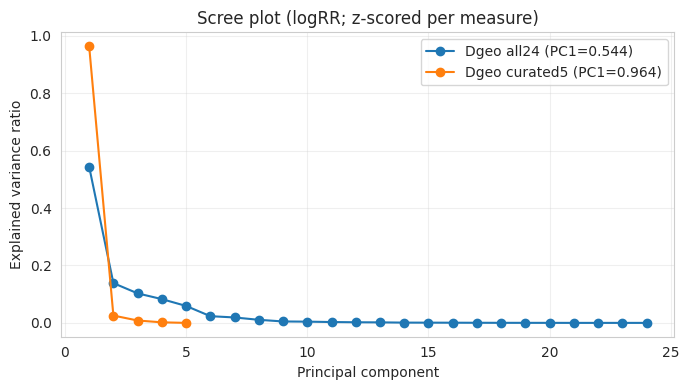

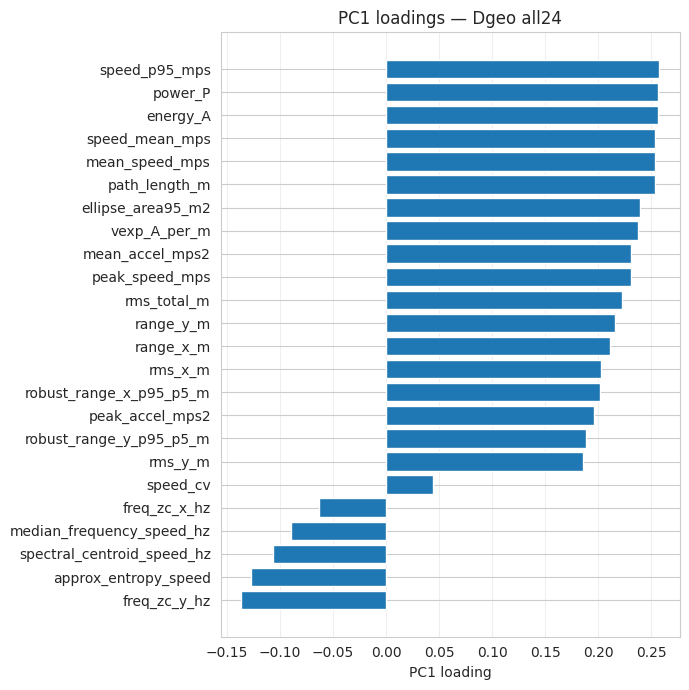

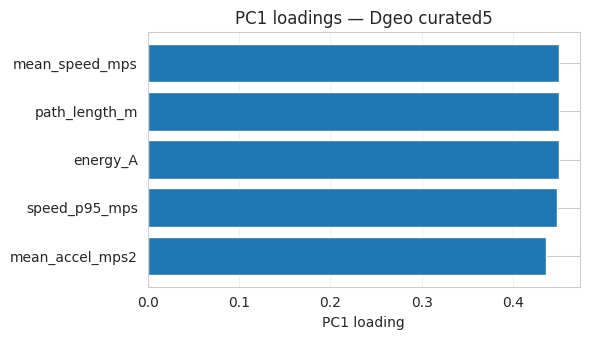

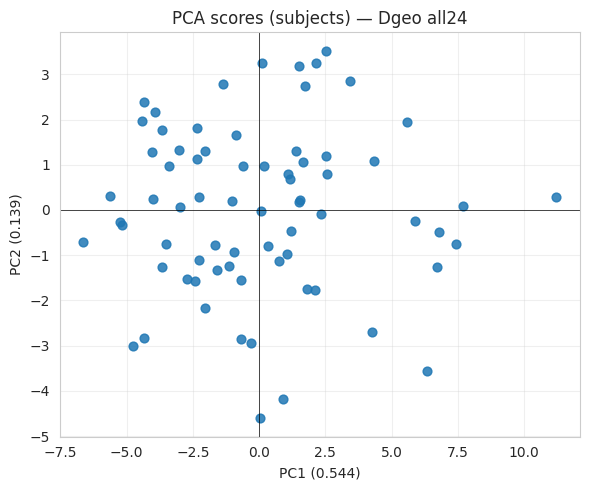

Saved figures:
 - stage7_fig_scree_Dgeo_all24_vs_curated5.png
 - stage7_fig_pc1_loadings_Dgeo_all24.png
 - stage7_fig_pc1_loadings_Dgeo_curated5.png
 - stage7_fig_pca_scores_Dgeo_all24.png


In [ ]:
# PCA plots for Stage 7.4 (Colab-ready)
# Produces:
# 1) Scree plot: Dgeo_all24 vs Dgeo_curated5
# 2) PC1 loadings barplots: Dgeo_all24 and Dgeo_curated5
# 3) PC1 vs PC2 scores scatter: Dgeo_all24 (subjects)

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

TRIALS_PATH = "/content/romberg_trial_features.csv"
EPS = 1e-12

MEASURE_SET = ["mean_speed_mps","path_length_m","mean_accel_mps2","energy_A","speed_p95_mps"]

META_COLS = {
    "subject_id","file_id","trial","eoec_label",
    "age","height","mass","n_samples","duration_s"
}

# ---------------------------
# Build Dgeo long table (RR)
# ---------------------------
df = pd.read_csv(TRIALS_PATH)
df.columns = [c.replace("\ufeff","").strip() for c in df.columns]
df["subject_id"] = pd.to_numeric(df["subject_id"], errors="coerce").astype(int)
df["trial"] = pd.to_numeric(df["trial"], errors="coerce")
df["eoec_label"] = df["eoec_label"].astype(str).str.upper().str.strip()

measures_all = [c for c in df.columns if c not in META_COLS]

eo = df[df["eoec_label"]=="EO"][["subject_id","trial"] + measures_all].sort_values(["subject_id","trial"]).copy()
ec = df[df["eoec_label"]=="EC"][["subject_id","trial"] + measures_all].sort_values(["subject_id","trial"]).copy()
eo["attempt_order"] = eo.groupby("subject_id").cumcount() + 1
ec["attempt_order"] = ec.groupby("subject_id").cumcount() + 1
pairs = eo.merge(ec, on=["subject_id","attempt_order"], suffixes=("_EO","_EC"))

d_rows = []
for sid, g in pairs.groupby("subject_id"):
    for m in measures_all:
        eo_vals = pd.to_numeric(g[f"{m}_EO"], errors="coerce").to_numpy(float)
        ec_vals = pd.to_numeric(g[f"{m}_EC"], errors="coerce").to_numpy(float)
        ok = np.isfinite(eo_vals) & np.isfinite(ec_vals) & (eo_vals > 0) & (ec_vals > 0)
        eo_vals, ec_vals = eo_vals[ok], ec_vals[ok]
        if len(eo_vals) < 2:
            continue
        r = ec_vals / eo_vals
        rr_d_geo = float(np.exp(np.log(r + EPS).mean()))
        d_rows.append({"subject_id": int(sid), "measure": m, "R": rr_d_geo})

dgeo_long = pd.DataFrame(d_rows)

def wide_log_matrix(long_df, measures=None):
    tmp = long_df.copy()
    if measures is not None:
        tmp = tmp[tmp["measure"].isin(measures)].copy()
    wide = tmp.pivot(index="subject_id", columns="measure", values="R")
    wide = np.log(wide + EPS)
    wide = wide.dropna(axis=0, how="any").dropna(axis=1, how="any")
    return wide

def run_pca(wide):
    X = wide.values
    Xz = StandardScaler().fit_transform(X)
    pca = PCA()
    scores = pca.fit_transform(Xz)
    return pca, scores, Xz

wide_all = wide_log_matrix(dgeo_long, measures=None)
wide_cur = wide_log_matrix(dgeo_long, measures=MEASURE_SET)

pca_all, scores_all, _ = run_pca(wide_all)
pca_cur, scores_cur, _ = run_pca(wide_cur)

evr_all = pca_all.explained_variance_ratio_
evr_cur = pca_cur.explained_variance_ratio_

# ---------------------------
# Plot 1: Scree (all24 vs curated5)
# ---------------------------
plt.figure(figsize=(7,4))
plt.plot(np.arange(1, len(evr_all)+1), evr_all, marker="o", label=f"Dgeo all24 (PC1={evr_all[0]:.3f})")
plt.plot(np.arange(1, len(evr_cur)+1), evr_cur, marker="o", label=f"Dgeo curated5 (PC1={evr_cur[0]:.3f})")
plt.xlabel("Principal component")
plt.ylabel("Explained variance ratio")
plt.title("Scree plot (logRR; z-scored per measure)")
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.savefig("stage7_fig_scree_Dgeo_all24_vs_curated5.png", dpi=200)
plt.show()

# ---------------------------
# Plot 2: PC1 loadings (all24)
# ---------------------------
load_all = pd.Series(pca_all.components_[0], index=wide_all.columns, name="PC1_loading").sort_values()
plt.figure(figsize=(7,7))
plt.barh(load_all.index, load_all.values)
plt.xlabel("PC1 loading")
plt.title("PC1 loadings — Dgeo all24")
plt.grid(True, axis="x", alpha=0.3)
plt.tight_layout()
plt.savefig("stage7_fig_pc1_loadings_Dgeo_all24.png", dpi=200)
plt.show()

# ---------------------------
# Plot 3: PC1 loadings (curated5)
# ---------------------------
load_cur = pd.Series(pca_cur.components_[0], index=wide_cur.columns, name="PC1_loading").sort_values()
plt.figure(figsize=(6,3.5))
plt.barh(load_cur.index, load_cur.values)
plt.xlabel("PC1 loading")
plt.title("PC1 loadings — Dgeo curated5")
plt.grid(True, axis="x", alpha=0.3)
plt.tight_layout()
plt.savefig("stage7_fig_pc1_loadings_Dgeo_curated5.png", dpi=200)
plt.show()

# ---------------------------
# Plot 4: Subject scores (PC1 vs PC2) for all24
# ---------------------------
plt.figure(figsize=(6,5))
plt.scatter(scores_all[:,0], scores_all[:,1], s=40, alpha=0.85)
plt.axhline(0, color="k", lw=0.5)
plt.axvline(0, color="k", lw=0.5)
plt.xlabel(f"PC1 ({evr_all[0]:.3f})")
plt.ylabel(f"PC2 ({evr_all[1]:.3f})")
plt.title("PCA scores (subjects) — Dgeo all24")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig("stage7_fig_pca_scores_Dgeo_all24.png", dpi=200)
plt.show()

print("Saved figures:")
print(" - stage7_fig_scree_Dgeo_all24_vs_curated5.png")
print(" - stage7_fig_pc1_loadings_Dgeo_all24.png")
print(" - stage7_fig_pc1_loadings_Dgeo_curated5.png")
print(" - stage7_fig_pca_scores_Dgeo_all24.png")

PCA on the subject × measure matrix of log-transformed Romberg ratios showed a clear difference in dimensionality between the full 24-measure set and the curated 5-measure battery. For the full set, the first principal component explained approximately 52–54% of the variance across options (A: 53.5%, B: 53.2%, C-median: 52.0%, Dgeo: 54.4%), indicating a dominant but not exclusive common factor. In contrast, for the curated battery the first component explained 94–96% of the variance (A: 95.7%, B: 95.5%, C-median: 94.1%, Dgeo: 96.4%), supporting a near-unidimensional structure consistent with a single latent construct (sensory balance) captured by these measures

## Stage 7 — Statistical validation (summary tables)

**Curated 5-measure battery (fixed, no assumptions):**  
`MEASURE_SET = ["mean_speed_mps","path_length_m","mean_accel_mps2","energy_A","speed_p95_mps"]`

### Table 7.0 — Method comparison (7.2 accuracy, 7.3 consistency, 7.4 PCA structure)

**Reference (“true RR”)**: \(RR^{true}=\overline{EC}/\overline{EO}\) computed from all 10 trials (5 EC + 5 EO).  
**Note:** Option A matches this definition by construction, so its MSE is ~0 (expected).

| Option | Variant used | MSE (RR) vs RR_true (7.2) | MSE (logRR) vs RR_true (7.2) | Cronbach α (logRR), all 24 (7.3) | Cronbach α (logRR), curated 5 (7.3) | PCA EVR PC1, all 24 (7.4) | PCA EVR PC1, curated 5 (7.4) | PCA EVR PC2, all 24 (7.4) | PCA EVR PC3, all 24 (7.4) |
|---|---|---:|---:|---:|---:|---:|---:|---:|---:|
| A | A_mean_then_ratio | 2.643302e-17 | 2.557581e-18 | 0.9385935064 | 0.9598693810 | 0.5350861370 | 0.9569479170 | 0.1346334690 | 0.1099264650 |
| B | B_pairwise_ratio_mean | 0.024455 | 0.004751 | 0.9372064116 | 0.9603835009 | 0.5320272360 | 0.9546105310 | 0.1339804770 | 0.1097663410 |
| C (median) | C_bootstrap_median_ratio | 0.054904 | 0.011680 | 0.9383082520 | 0.9622955867 | 0.5195253400 | 0.9407727780 | 0.1188031190 | 0.0836878670 |
| Dgeo | D_pairwise_geo_mean_of_ratios | 0.011943 | 0.001362 | 0.9402728496 | 0.9664830264 | 0.5443088980 | 0.9641798360 | 0.1385941730 | 0.1028190600 |

---

### Table 7.1 — Bootstrap uncertainty by measure (7.1): median 95% CI width across subjects (RR_geo)

Bootstrap: resample 5 paired ratios with replacement; CI width reported for the geometric-mean RR estimator.

| Measure | N subjects | Median 95% CI width | Mean 95% CI width |
|---|---:|---:|---:|
| approx_entropy_speed | 71 | 0.150809874 | 0.183045537 |
| freq_zc_y_hz | 71 | 0.181174245 | 0.205925068 |
| speed_cv | 71 | 0.213381962 | 0.249367656 |
| freq_zc_x_hz | 71 | 0.225649446 | 0.227727991 |
| spectral_centroid_speed_hz | 71 | 0.243097572 | 0.284027932 |
| median_frequency_speed_hz | 71 | 0.350036722 | 0.384429242 |
| mean_accel_mps2 | 71 | 0.376758866 | 0.412191969 |
| mean_speed_mps | 71 | 0.412371259 | 0.469189246 |
| speed_mean_mps | 71 | 0.413795808 | 0.469284762 |
| path_length_m | 71 | 0.415951539 | 0.469629906 |
| vexp_A_per_m | 71 | 0.469446756 | 0.576676578 |
| speed_p95_mps | 71 | 0.488294406 | 0.570957181 |
| rms_total_m | 71 | 0.672906658 | 0.735566612 |
| rms_x_m | 71 | 0.741765473 | 0.845726545 |
| rms_y_m | 71 | 0.746384155 | 0.936524260 |
| robust_range_y_p95_p5_m | 71 | 0.747965668 | 0.878270398 |
| range_y_m | 71 | 0.752322059 | 0.874155998 |
| range_x_m | 71 | 0.782978140 | 0.860781822 |
| robust_range_x_p95_p5_m | 71 | 0.795228513 | 0.826720309 |
| peak_accel_mps2 | 71 | 0.847260359 | 1.025195006 |
| peak_speed_mps | 71 | 0.928051422 | 1.141481582 |
| energy_A | 71 | 1.386462130 | 1.718477426 |
| power_P | 71 | 1.449118979 | 1.708438729 |
| ellipse_area95_m2 | 71 | 1.786560268 | 2.094236652 |

##Concise Summary

We quantified the Romberg ratio (RR) for postural sway features across 71 subjects with 5 Eyes Open (EO) and 5 Eyes Closed (EC) trials (10 total). RR was computed for 24 parameters using four alternative estimators:

Option A (mean-then-ratio): $RR=\overline{EC}/\overline{EO}$.  
Option B (mean of paired ratios): $RR=\frac{1}{5}\sum_i EC_i/EO_i$ with pairing by within-condition trial order.  
Option C (bootstrap estimator): RR estimated from bootstrap resampling of the 5 paired ratios (median reported as the robust version).  
Option D (trialwise distribution): per-pair ratios $R_i=EC_i/EO_i$ retained and aggregated (we used the geometric mean $RR=\exp(\mathrm{mean}(\log R_i))$, denoted Dgeo).  
Reliability and design efficiency (G-theory)  
A crossed-facet generalizability framework (subjects as objects of measurement; measures and attempts as facets) showed that using all 24 measures produced moderate relative reliability $(G_{\text{rel}}\approx 0.69$ for $n_M=24, n_A=5)$. In contrast, a curated 5-measure battery achieved substantially higher reliability $G_{\text{rel}}\approx 0.82$ for $n_M=5, n_A=5$, indicating that careful feature selection improves measurement precision and reduces subject-by-measure heterogeneity. Per-measure attempt reliability further showed large differences in stability across parameters, motivating the curated battery.

Stage 7.1 — Uncertainty via bootstrap CIs (5 paired attempts)
Bootstrap resampling of the 5 paired ratios per subject and measure yielded measure-specific uncertainty profiles. The tightest median 95% CI widths were observed for frequency/complexity-type measures (e.g., approx_entropy_speed, freq_zc_y_hz), while the widest CIs occurred for magnitude/energy-related measures (e.g., ellipse_area95_m2, power_P, energy_A), indicating higher between-attempt variability in RR for those parameters. These CIs provide a direct, interpretable measure of how precisely RR can be estimated from five attempts.

Stage 7.2 — Accuracy against a reference “true RR” (jackknife + MSE)
We defined the reference (“true”) RR as $RR^{true}=\overline{EC}/\overline{EO}$ using all 10 trials. As expected, Option A matched the reference almost exactly (near-zero MSE), because it is algebraically identical to the definition of $RR^{true}$. Among the nontrivial alternatives, Dgeo (geometric mean of paired ratios) best approximated the reference, achieving the lowest error $MSE(_{\log RR})=0.00136$ compared with Option B (0.00475) and Option C median (0.01168). This indicates that when RR is built from paired trialwise ratios, geometric aggregation is the closest proxy to the mean-based RR definition.

Stage 7.3 — Internal consistency across measures (Cronbach’s alpha)
Treating measures as “items” and subjects as “objects,” Cronbach’s alpha on logRR was high across all variants, both for the full 24-measure set (α ≈ 0.94) and for the curated 5-measure battery (α ≈ 0.96–0.97). This demonstrates strong coherence among measures, and even stronger coherence within the curated battery, supporting its use as a consistent composite indicator.

Stage 7.4 — Factor structure (PCA)
PCA on the subject × measure logRR matrix showed a clear difference in dimensionality between the full and curated sets. For the 24-measure set, PC1 explained about 52–54% of variance (with non-negligible PC2 and PC3), implying a dominant common factor plus additional meaningful dimensions. For the curated 5-measure battery, PC1 explained 94–96% of variance across options, indicating an almost purely one-dimensional structure consistent with a single latent construct (“sensory balance”) captured by the curated measures.

Overall conclusion:  
Across reliability (G-theory), uncertainty (bootstrap CIs), accuracy vs a mean-based reference (MSE), internal consistency (alpha), and dimensionality (PCA), results consistently support using a curated 5-measure battery for stable, interpretable RR-based scoring. For paired-trial computation, **Dgeo** provides the best approximation to the mean-based RR reference among nontrivial estimators, while **Option A** remains the exact implementation of the chosen reference definition.

##Exhaustive check for best measure combination

In [ ]:
import numpy as np
import pandas as pd

TRIALS_PATH = "/content/romberg_trial_features.csv"
EPS = 1e-12

YOUR_SET = ["mean_speed_mps","path_length_m","mean_accel_mps2","energy_A","speed_p95_mps"]

META_COLS = {
    "subject_id","file_id","trial","eoec_label",
    "age","height","mass","n_samples","duration_s"
}

df = pd.read_csv(TRIALS_PATH)
df.columns = [c.replace("\ufeff","").strip() for c in df.columns]
df["subject_id"] = pd.to_numeric(df["subject_id"], errors="coerce").astype(int)
df["trial"] = pd.to_numeric(df["trial"], errors="coerce")
df["eoec_label"] = df["eoec_label"].astype(str).str.upper().str.strip()

measures = [c for c in df.columns if c not in META_COLS]

# Pair EO and EC by within-condition order
eo = df[df["eoec_label"]=="EO"][["subject_id","trial"] + measures].sort_values(["subject_id","trial"]).copy()
ec = df[df["eoec_label"]=="EC"][["subject_id","trial"] + measures].sort_values(["subject_id","trial"]).copy()
eo["attempt"] = eo.groupby("subject_id").cumcount() + 1
ec["attempt"] = ec.groupby("subject_id").cumcount() + 1

pairs = eo.merge(ec, on=["subject_id","attempt"], suffixes=("_EO","_EC"))
assert pairs.groupby("subject_id")["attempt"].nunique().min() == 5

# Long table: y = log(EC/EO)
rows = []
for m in measures:
    eo_vals = pd.to_numeric(pairs[f"{m}_EO"], errors="coerce")
    ec_vals = pd.to_numeric(pairs[f"{m}_EC"], errors="coerce")
    ok = np.isfinite(eo_vals) & np.isfinite(ec_vals) & (eo_vals > 0) & (ec_vals > 0)
    tmp = pairs.loc[ok, ["subject_id","attempt"]].copy()
    tmp["measure"] = m
    tmp["y"] = np.log(ec_vals[ok].to_numpy(float) / eo_vals[ok].to_numpy(float) + EPS)
    rows.append(tmp)

long_y = pd.concat(rows, ignore_index=True)
print("long_y:", long_y.shape, "subjects:", long_y.subject_id.nunique(),
      "measures:", long_y.measure.nunique(), "attempts:", long_y.attempt.nunique())

long_y: (8520, 4) subjects: 71 measures: 24 attempts: 5


In [ ]:
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

def cronbach_alpha(X):
    X = np.asarray(X, float)
    k = X.shape[1]
    if k < 2: return np.nan
    item_vars = X.var(axis=0, ddof=1)
    total_var = X.sum(axis=1).var(ddof=1)
    return float((k / (k - 1)) * (1 - item_vars.sum() / total_var))

def pca_evr_pc1(X):
    X = np.asarray(X, float)
    Xz = StandardScaler().fit_transform(X)
    pca = PCA()
    pca.fit(Xz)
    return float(pca.explained_variance_ratio_[0])

def estimate_variance_components(long_df):
    """
    Method-of-moments ANOVA variance components for balanced-ish crossed design:
    y ~ subject + measure + attempt + interactions + residual
    Returns sigma_S2, sigma_SM2, sigma_SA2, sigma_e2 (and others if needed).
    """
    d = long_df.copy()
    # enforce categories
    d["subject_id"] = d["subject_id"].astype(int)
    d["measure"] = d["measure"].astype(str)
    d["attempt"] = d["attempt"].astype(int)

    # Compute means
    grand = d["y"].mean()
    subj_means = d.groupby("subject_id")["y"].mean()
    meas_means = d.groupby("measure")["y"].mean()
    att_means  = d.groupby("attempt")["y"].mean()

    subj_meas_means = d.groupby(["subject_id","measure"])["y"].mean()
    subj_att_means  = d.groupby(["subject_id","attempt"])["y"].mean()
    meas_att_means  = d.groupby(["measure","attempt"])["y"].mean()

    # counts (assume balanced)
    nS = d["subject_id"].nunique()
    nM = d["measure"].nunique()
    nA = d["attempt"].nunique()

    # Sums of squares (ANOVA identities for crossed design)
    SS_S  = nM*nA * ((subj_means - grand)**2).sum()
    SS_M  = nS*nA * ((meas_means - grand)**2).sum()
    SS_A  = nS*nM * ((att_means  - grand)**2).sum()

    SS_SM = nA * ((subj_meas_means
                   - subj_means.reindex(subj_meas_means.index.get_level_values(0)).to_numpy()
                   - meas_means.reindex(subj_meas_means.index.get_level_values(1)).to_numpy()
                   + grand)**2).sum()

    SS_SA = nM * ((subj_att_means
                   - subj_means.reindex(subj_att_means.index.get_level_values(0)).to_numpy()
                   - att_means.reindex(subj_att_means.index.get_level_values(1)).to_numpy()
                   + grand)**2).sum()

    SS_MA = nS * ((meas_att_means
                   - meas_means.reindex(meas_att_means.index.get_level_values(0)).to_numpy()
                   - att_means.reindex(meas_att_means.index.get_level_values(1)).to_numpy()
                   + grand)**2).sum()

    # Total SS and residual
    SS_T = ((d["y"] - grand)**2).sum()
    SS_e = SS_T - SS_S - SS_M - SS_A - SS_SM - SS_SA - SS_MA

    # Degrees of freedom
    df_S  = nS - 1
    df_M  = nM - 1
    df_A  = nA - 1
    df_SM = (nS - 1)*(nM - 1)
    df_SA = (nS - 1)*(nA - 1)
    df_MA = (nM - 1)*(nA - 1)
    df_e  = (nS - 1)*(nM - 1)*(nA - 1)

    MS_S  = SS_S/df_S
    MS_M  = SS_M/df_M
    MS_A  = SS_A/df_A
    MS_SM = SS_SM/df_SM
    MS_SA = SS_SA/df_SA
    MS_MA = SS_MA/df_MA
    MS_e  = SS_e/df_e

    # Variance component estimators (random effects; moments)
    # (Common G-theory crossed design estimators)
    sigma_e2  = MS_e
    sigma_SM2 = max((MS_SM - MS_e)/nA, 0.0)
    sigma_SA2 = max((MS_SA - MS_e)/nM, 0.0)
    sigma_MA2 = max((MS_MA - MS_e)/nS, 0.0)
    sigma_S2  = max((MS_S - MS_SM - MS_SA + MS_e)/(nM*nA), 0.0)

    return {
        "nS": nS, "nM": nM, "nA": nA,
        "sigma_S2": float(sigma_S2),
        "sigma_SM2": float(sigma_SM2),
        "sigma_SA2": float(sigma_SA2),
        "sigma_MA2": float(sigma_MA2),
        "sigma_e2": float(sigma_e2),
    }

def G_rel_for_subset(long_y, subset):
    d = long_y[long_y["measure"].isin(subset)].copy()
    vc = estimate_variance_components(d)
    nM, nA = vc["nM"], vc["nA"]
    err_rel = (vc["sigma_SM2"]/nM) + (vc["sigma_SA2"]/nA) + (vc["sigma_e2"]/(nM*nA))
    Grel = vc["sigma_S2"] / (vc["sigma_S2"] + err_rel) if (vc["sigma_S2"] + err_rel) > 0 else np.nan
    return float(Grel), vc

def alpha_pca_for_subset(long_y, subset):
    # Build subject × measure matrix of mean logRR across attempts
    d = long_y[long_y["measure"].isin(subset)].copy()
    wide = d.groupby(["subject_id","measure"])["y"].mean().unstack("measure")
    wide = wide.dropna(axis=0, how="any").dropna(axis=1, how="any")
    X = wide.values
    return cronbach_alpha(X), pca_evr_pc1(X), wide.shape[0], wide.shape[1]

In [ ]:
import numpy as np
import pandas as pd

rng = np.random.default_rng(0)
all_measures = sorted(long_y["measure"].unique().tolist())

def eval_subset(subset):
    subset = list(subset)
    grel, vc = G_rel_for_subset(long_y, subset)
    alpha, evr1, nsub, nmeas = alpha_pca_for_subset(long_y, subset)
    return {
        "k": len(subset),
        "subset": ",".join(subset),
        "G_rel": grel,
        "alpha": alpha,
        "EVR_PC1": evr1,
        "n_subjects": nsub,
        "n_measures": nmeas,
        "sigma_S2": vc["sigma_S2"],
        "sigma_SM2": vc["sigma_SM2"],
        "sigma_SA2": vc["sigma_SA2"],
        "sigma_e2": vc["sigma_e2"],
    }

# Evaluate your chosen set
results = [eval_subset(YOUR_SET)]

# Random search: adjust N_SAMPLES for more thorough checking
N_SAMPLES_PER_K = 3000  # e.g., 3k*7 = 21k subsets; increase if you want
Ks = [2,3,4,5,6,7,8]

for k in Ks:
    for _ in range(N_SAMPLES_PER_K):
        subset = rng.choice(all_measures, size=k, replace=False)
        results.append(eval_subset(subset))

res = pd.DataFrame(results)

# Mark your set
res["is_your_set"] = res["subset"].eq(",".join(YOUR_SET))

# For each k, show best by G_rel (primary criterion)
best_by_k = (res.sort_values(["k","G_rel","EVR_PC1","alpha"], ascending=[True,False,False,False])
               .groupby("k").head(10))

# Rank within k=5: where does your set fall?
k5 = res[res["k"]==5].sort_values("G_rel", ascending=False).reset_index(drop=True)
your_rank = int(k5.index[k5["is_your_set"]][0] + 1) if k5["is_your_set"].any() else None

print("Your set:", YOUR_SET)
print("Your set metrics:")
display(res[res["is_your_set"]][["k","G_rel","alpha","EVR_PC1","n_subjects","n_measures"]])

print(f"Among sampled k=5 subsets, your set rank by G_rel: {your_rank} (out of {len(k5)})")

# Save outputs
res.to_csv("stage7_subset_search_all_results.csv", index=False)
best_by_k.to_csv("stage7_subset_search_top10_by_k.csv", index=False)

display(best_by_k[["k","G_rel","alpha","EVR_PC1","subset"]].head(30))

Your set: ['mean_speed_mps', 'path_length_m', 'mean_accel_mps2', 'energy_A', 'speed_p95_mps']
Your set metrics:


,k,G_rel,alpha,EVR_PC1,n_subjects,n_measures
0,5,0.767427,0.966491,0.964182,71,5


Among sampled k=5 subsets, your set rank by G_rel: 1 (out of 3001)


,k,G_rel,alpha,EVR_PC1,subset
44,2,0.815553,1.000000,1.000000,"mean_speed_mps,speed_mean_mps"
117,2,0.815553,1.000000,1.000000,"speed_mean_mps,mean_speed_mps"
148,2,0.815553,1.000000,1.000000,"mean_speed_mps,speed_mean_mps"
422,2,0.815553,1.000000,1.000000,"mean_speed_mps,speed_mean_mps"
472,2,0.815553,1.000000,1.000000,"mean_speed_mps,speed_mean_mps"
524,2,0.815553,1.000000,1.000000,"speed_mean_mps,mean_speed_mps"
806,2,0.815553,1.000000,1.000000,"speed_mean_mps,mean_speed_mps"
1174,2,0.815553,1.000000,1.000000,"speed_mean_mps,mean_speed_mps"
1310,2,0.815553,1.000000,1.000000,"speed_mean_mps,mean_speed_mps"
1680,2,0.815553,1.000000,1.000000,"speed_mean_mps,mean_speed_mps"


Merged rows: (1704, 6) measures: 24 subjects: 71


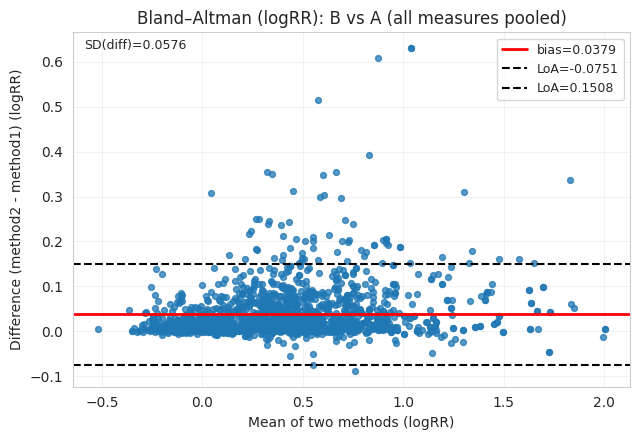

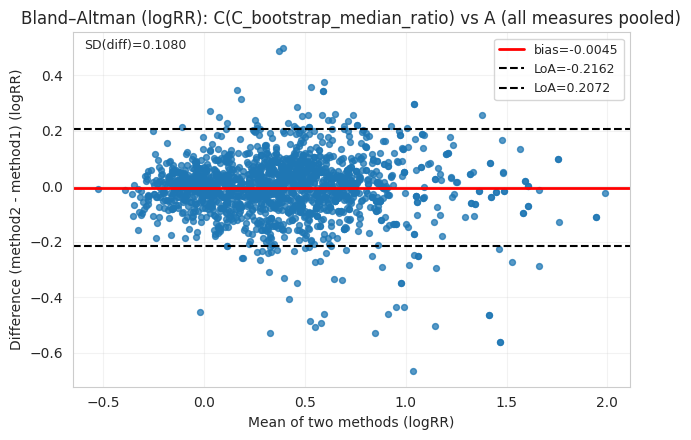

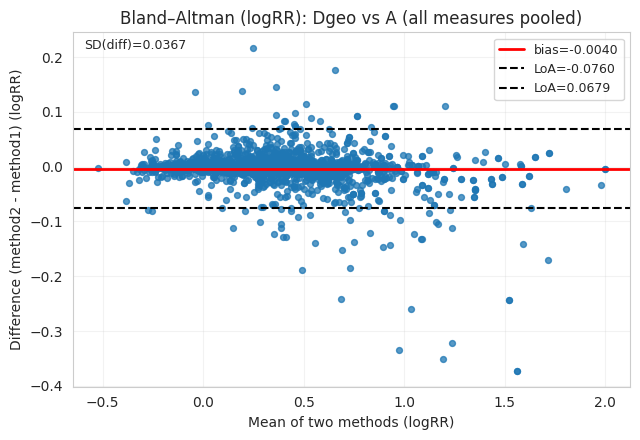

Saved BA_logRR_stats_by_measure.csv
Saved BA plots (PNG):
 - BA_log_B_vs_A.png
 - BA_log_C_vs_A.png
 - BA_log_Dgeo_vs_A.png


In [ ]:
# Bland–Altman plots for Romberg ratio variants (Colab-ready)
# -----------------------------------------------------------
# Uses /content/romberg_coefficients_options_ABCD.csv (A/B/C)
# and stage7_rr_true_and_predictions_long.csv (contains Dgeo).
#
# Produces:
#  - Bland–Altman plots on logRR scale (recommended for ratios)
#  - Optional BA on RR scale
#  - Saves PNG files + CSV tables with bias/LoA per measure and overall
#
# Comparisons (default):
#   B vs A, C_median vs A, Dgeo vs A  (A is mean(EC)/mean(EO))
#
# You can change MEASURE_SET to curated battery or keep all measures.

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

ABCD_PATH = "/content/romberg_coefficients_options_ABCD.csv"
DIAG_PATH = "stage7_rr_true_and_predictions_long.csv"  # created earlier
EPS = 1e-12

# Set to None for all measures, or curated list:
MEASURE_SET = None
# MEASURE_SET = ["mean_speed_mps","path_length_m","mean_accel_mps2","energy_A","speed_p95_mps"]

# Which C to use:
C_VARIANT = "C_bootstrap_median_ratio"  # or "C_bootstrap_mean_ratio"

# ---------- Load A/B/C ----------
ab = pd.read_csv(ABCD_PATH)
ab.columns = [c.replace("\ufeff","").strip() for c in ab.columns]
ab["subject_id"] = pd.to_numeric(ab["subject_id"], errors="coerce").astype(int)
ab["measure"] = ab["measure"].astype(str).str.strip()
ab["variant"] = ab["variant"].astype(str).str.strip()
ab["R"] = pd.to_numeric(ab["R"], errors="coerce")
ab = ab[np.isfinite(ab["R"]) & (ab["R"] > 0)].copy()

def get_variant_long(vname, outcol):
    tmp = ab[ab["variant"] == vname][["subject_id","measure","R"]].copy()
    tmp = tmp.rename(columns={"R": outcol})
    return tmp

A = get_variant_long("A_mean_then_ratio", "RR_A")
B = get_variant_long("B_pairwise_ratio_mean", "RR_B")
C = get_variant_long(C_VARIANT, "RR_C")

pred = A.merge(B, on=["subject_id","measure"], how="inner").merge(C, on=["subject_id","measure"], how="inner")

# ---------- Load Dgeo from diagnostic long table ----------
diag = pd.read_csv(DIAG_PATH)
diag.columns = [c.replace("\ufeff","").strip() for c in diag.columns]
diag["subject_id"] = pd.to_numeric(diag["subject_id"], errors="coerce").astype(int)
diag["measure"] = diag["measure"].astype(str).str.strip()
diag["RR_D_geo"] = pd.to_numeric(diag["RR_D_geo"], errors="coerce")

dgeo = diag[["subject_id","measure","RR_D_geo"]].dropna().copy()

df = pred.merge(dgeo, on=["subject_id","measure"], how="inner")

if MEASURE_SET is not None:
    df = df[df["measure"].isin(MEASURE_SET)].copy()

print("Merged rows:", df.shape, "measures:", df["measure"].nunique(), "subjects:", df["subject_id"].nunique())

# ---------- Bland–Altman utilities ----------
def bland_altman_stats(x, y):
    """
    Returns bias and limits of agreement on chosen scale.
    bias = mean(y - x)
    LoA = bias ± 1.96 * sd(y - x)
    """
    d = (y - x)
    bias = float(np.mean(d))
    sd = float(np.std(d, ddof=1))
    loa_low = bias - 1.96 * sd
    loa_high = bias + 1.96 * sd
    return bias, sd, loa_low, loa_high

def ba_plot(x, y, title, fname, xlabel="Mean", ylabel="Difference", annotate=True):
    """
    x, y are 1D arrays (same length). Plots BA: mean vs difference.
    """
    mean_xy = 0.5 * (x + y)
    diff = (y - x)
    bias, sd, lo, hi = bland_altman_stats(x, y)

    plt.figure(figsize=(6.5, 4.5))
    plt.scatter(mean_xy, diff, s=18, alpha=0.75)
    plt.axhline(bias, color="red", lw=2, label=f"bias={bias:.4f}")
    plt.axhline(lo, color="black", ls="--", lw=1.5, label=f"LoA={lo:.4f}")
    plt.axhline(hi, color="black", ls="--", lw=1.5, label=f"LoA={hi:.4f}")
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(title)
    plt.grid(True, alpha=0.25)
    plt.legend(loc="best", fontsize=9)
    if annotate:
        plt.text(0.02, 0.98, f"SD(diff)={sd:.4f}", transform=plt.gca().transAxes,
                 va="top", ha="left", fontsize=9)
    plt.tight_layout()
    plt.savefig(fname, dpi=200)
    plt.show()

# ---------- Prepare logRR (recommended) ----------
for col in ["RR_A","RR_B","RR_C","RR_D_geo"]:
    df[f"ln_{col}"] = np.log(df[col].to_numpy(float) + EPS)

# ---------- Overall BA plots (all measures pooled) ----------
comparisons = [
    ("B vs A", "ln_RR_A", "ln_RR_B", "BA_log_B_vs_A.png"),
    (f"C({C_VARIANT}) vs A", "ln_RR_A", "ln_RR_C", "BA_log_C_vs_A.png"),
    ("Dgeo vs A", "ln_RR_A", "ln_RR_D_geo", "BA_log_Dgeo_vs_A.png"),
]

for label, xcol, ycol, outpng in comparisons:
    x = df[xcol].to_numpy(float)
    y = df[ycol].to_numpy(float)
    ba_plot(
        x=x, y=y,
        title=f"Bland–Altman (logRR): {label} (all measures pooled)",
        fname=outpng,
        xlabel="Mean of two methods (logRR)",
        ylabel="Difference (method2 - method1) (logRR)"
    )

# ---------- Per-measure BA stats (logRR) ----------
rows = []
for meas, g in df.groupby("measure"):
    for label, xcol, ycol, _ in comparisons:
        x = g[xcol].to_numpy(float)
        y = g[ycol].to_numpy(float)
        bias, sd, lo, hi = bland_altman_stats(x, y)
        rows.append({
            "measure": meas,
            "comparison": label,
            "n": int(len(g)),
            "bias_logRR": bias,
            "sd_diff_logRR": sd,
            "loa_low_logRR": lo,
            "loa_high_logRR": hi,
        })

stats = pd.DataFrame(rows)
stats.to_csv("BA_logRR_stats_by_measure.csv", index=False)
print("Saved BA_logRR_stats_by_measure.csv")

# ---------- Optional: BA on RR scale (less recommended) ----------
# Uncomment if you want RR-scale BA plots too.
"""
comparisons_rr = [
    ("B vs A", "RR_A", "RR_B", "BA_RR_B_vs_A.png"),
    (f"C({C_VARIANT}) vs A", "RR_A", "RR_C", "BA_RR_C_vs_A.png"),
    ("Dgeo vs A", "RR_A", "RR_D_geo", "BA_RR_Dgeo_vs_A.png"),
]
for label, xcol, ycol, outpng in comparisons_rr:
    x = df[xcol].to_numpy(float)
    y = df[ycol].to_numpy(float)
    ba_plot(
        x=x, y=y,
        title=f"Bland–Altman (RR): {label} (all measures pooled)",
        fname=outpng,
        xlabel="Mean of two methods (RR)",
        ylabel="Difference (method2 - method1) (RR)"
    )
"""

print("Saved BA plots (PNG):")
print(" - BA_log_B_vs_A.png")
print(" - BA_log_C_vs_A.png")
print(" - BA_log_Dgeo_vs_A.png")

In [ ]:
import sqlite3
import pandas as pd
import numpy as np

DB_PATH = "/content/dataset.db"
TRIALS_IN = "/content/romberg_trial_features (1).csv"
TRIALS_OUT = "/content/romberg_trial_features_with_condition.csv"

df = pd.read_csv(TRIALS_IN)
df.columns = [c.replace("\ufeff","").strip() for c in df.columns]
df["subject_id"] = pd.to_numeric(df["subject_id"], errors="coerce").astype(int)

con = sqlite3.connect(DB_PATH)
meta = pd.read_sql_query("""
SELECT file_id, subject_id, condition, trial, duration_samples
FROM metadata_cleaned
""", con)
con.close()

meta.columns = [c.replace("\ufeff","").strip() for c in meta.columns]
meta["subject_id"] = pd.to_numeric(meta["subject_id"], errors="coerce").astype(int)
meta["trial"] = pd.to_numeric(meta["trial"], errors="coerce")

# Show overlaps
overlap = sorted(set(df.columns) & set(meta.columns))
print("Overlapping columns:", overlap)

df2 = df.merge(
    meta,
    on=["file_id","subject_id"],
    how="left",
    validate="many_to_one",
    suffixes=("_feat", "_meta")
)

print("Columns containing 'trial':", [c for c in df2.columns if "trial" in c])
print("Columns containing 'condition':", [c for c in df2.columns if "condition" in c])
print("Columns containing 'duration':", [c for c in df2.columns if "duration" in c])

# Canonicalize names: prefer metadata version if present
if "condition_meta" in df2.columns:
    df2["condition"] = df2["condition_meta"]
elif "condition" not in df2.columns:
    raise ValueError("No condition column found after merge.")

# trial
if "trial_meta" in df2.columns:
    df2["trial"] = df2["trial_meta"]
elif "trial" in df2.columns:
    # already present, keep it
    pass
else:
    raise ValueError("No trial column found after merge.")

# duration_samples (optional)
if "duration_samples_meta" in df2.columns:
    df2["duration_samples"] = df2["duration_samples_meta"]

# Drop helper columns to keep table clean (optional)
drop_cols = [c for c in ["condition_meta","trial_meta","duration_samples_meta",
                         "condition_feat","trial_feat","duration_samples_feat"]
             if c in df2.columns]
df2 = df2.drop(columns=drop_cols)

# Hard checks
assert "condition" in df2.columns
assert "trial" in df2.columns

print("Missing condition fraction:", df2["condition"].isna().mean())
print("Missing trial fraction:", df2["trial"].isna().mean())
print("Condition counts (top):")
print(df2["condition"].value_counts(dropna=False).head(20))

df2.to_csv(TRIALS_OUT, index=False)
print("Saved:", TRIALS_OUT)

df_free = df2[df2["condition"].astype(str).str.lower().str.strip() == "free"].copy()
print("FREE rows:", len(df_free), "FREE subjects:", df_free["subject_id"].nunique())
print(df_free.groupby("subject_id")["file_id"].count().describe())

Overlapping columns: ['file_id', 'subject_id', 'trial']
Columns containing 'trial': ['trial_feat', 'trial_meta']
Columns containing 'condition': ['condition']
Columns containing 'duration': ['duration_s', 'duration_samples']
Missing condition fraction: 0.0
Missing trial fraction: 0.0
Condition counts (top):
condition
free    710
Name: count, dtype: int64
Saved: /content/romberg_trial_features_with_condition.csv
FREE rows: 710 FREE subjects: 71
count    71.0
mean     10.0
std       0.0
min      10.0
25%      10.0
50%      10.0
75%      10.0
max      10.0
Name: file_id, dtype: float64


# Sensitivity analysis: proxy labeling feature choice
---------------------------------------------------
Full Stage 7-style pipeline using different proxy split features to define low-sway (EO-proxy) vs high-sway (EC-proxy) within condition="free".  
What it does for each split_feature:
1. Build 5 paired ratios R_i = high_i / low_i per subject (pair by within-group order).  
2. Compute pRR variants: A, B, C_median (bootstrap), Dgeo.  
3. Compare B/C/Dgeo to A via MSE on log-scale and Bland–Altman stats (bias, SDdiff, LoA).  
4. Compute alpha and PCA PC1 EVR for all24 and curated5.  
5. Cluster curated5 (k chosen by silhouette on Dgeo) and compute ARI vs Dgeo clustering.  

In [ ]:
# Sensitivity analysis: proxy labeling feature choice
# ---------------------------------------------------
# Re-runs the full Stage 7-style pipeline using different proxy split features
# to define low-sway (EO-proxy) vs high-sway (EC-proxy) within condition="free".
#
# What it does for each split_feature:
# 1) Build 5 paired ratios R_i = high_i / low_i per subject (pair by within-group order)
# 2) Compute pRR variants: A, B, C_median (bootstrap), Dgeo
# 3) Compare B/C/Dgeo to A via MSE on log-scale and Bland–Altman stats (bias, SDdiff, LoA)
# 4) Compute alpha and PCA PC1 EVR for all24 and curated5
# 5) Cluster curated5 (k chosen by silhouette on Dgeo) and compute ARI vs Dgeo clustering
#
# Inputs expected:
#   /content/romberg_trial_features.csv   (trial-level features incl. subject_id, trial, condition, etc.)
#
# Notes:
# - This operates on TRIAL-LEVEL FEATURES (not raw signals), because that's what your Stage 7 outputs use.
# - It treats "EO/EC" as proxy groups only; we call them LOW vs HIGH.

import numpy as np
import pandas as pd

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, adjusted_rand_score

TRIALS_PATH = "/content/romberg_trial_features_with_condition.csv"

# Your curated battery (fixed)
CURATED5 = ["mean_speed_mps","path_length_m","mean_accel_mps2","energy_A","speed_p95_mps"]

# Choose which proxy split features to test (must exist as columns in TRIALS csv)
SPLIT_FEATURES = [
    "ellipse_area95_m2",     # your original
    "path_length_m",
    "mean_speed_mps",
    "rms_total_m",
    "speed_p95_mps",
]

B_BOOT = 2000          # bootstrap resamples for C_median
EPS = 1e-12
SEED = 0

META_COLS = {
    "subject_id","file_id","trial","eoec_label","condition",
    "age","height","mass","n_samples","duration_s"
}

def cronbach_alpha(X):
    X = np.asarray(X, float)
    k = X.shape[1]
    if k < 2:
        return np.nan
    item_vars = X.var(axis=0, ddof=1)
    total_var = X.sum(axis=1).var(ddof=1)
    return float((k / (k - 1)) * (1 - item_vars.sum() / total_var))

def pca_evr_pc1(X):
    X = np.asarray(X, float)
    Xz = StandardScaler().fit_transform(X)
    pca = PCA()
    pca.fit(Xz)
    return float(pca.explained_variance_ratio_[0])

def bland_altman_stats(x, y):
    d = y - x
    bias = float(np.mean(d))
    sd = float(np.std(d, ddof=1))
    lo = bias - 1.96 * sd
    hi = bias + 1.96 * sd
    return bias, sd, lo, hi

def build_proxy_pairs(df_free, split_feature):
    """
    Returns a long table of paired ratios per subject, attempt, measure:
      subject_id, attempt (1..5), measure, ratio
    The 10 free trials are split into LOW vs HIGH by subject median of split_feature.
    Then we sort within LOW and within HIGH by trial index and pair by order.
    """
    if split_feature not in df_free.columns:
        raise ValueError(f"split_feature not found: {split_feature}")

    measures = [c for c in df_free.columns if c not in META_COLS]
    # We must keep split_feature available even if it's in measures list.
    out_rows = []

    for sid, g in df_free.groupby("subject_id"):
        g = g.sort_values("trial").copy()

        # compute subject-specific median on split_feature
        split_vals = pd.to_numeric(g[split_feature], errors="coerce")
        g = g[np.isfinite(split_vals)].copy()
        split_vals = pd.to_numeric(g[split_feature], errors="coerce")

        if len(g) < 10:
            # if you expect exactly 10 free trials, this flags missing data
            continue

        med = float(np.median(split_vals))
        low = g[g[split_feature] <= med].sort_values("trial").copy()
        high = g[g[split_feature] >  med].sort_values("trial").copy()

        # enforce 5/5 split; if median ties cause imbalance, trim to 5 each deterministically
        low = low.head(5)
        high = high.head(5)
        if len(low) < 5 or len(high) < 5:
            continue

        low["attempt"] = np.arange(1, 6)
        high["attempt"] = np.arange(1, 6)

        # pair by attempt index
        for m in measures:
            low_vals = pd.to_numeric(low[m], errors="coerce").to_numpy(float)
            high_vals = pd.to_numeric(high[m], errors="coerce").to_numpy(float)

            ok = np.isfinite(low_vals) & np.isfinite(high_vals) & (low_vals > 0) & (high_vals > 0)
            # if some attempts invalid, we will drop those attempts for this measure
            for a in range(5):
                if not ok[a]:
                    continue
                out_rows.append({
                    "subject_id": int(sid),
                    "attempt": int(a+1),
                    "measure": m,
                    "ratio": float(high_vals[a] / low_vals[a])  # HIGH/LOW proxy ratio
                })

    return pd.DataFrame(out_rows)

def compute_variants_from_pairs(pairs_long, measures_filter=None):
    """
    Input pairs_long: subject_id, attempt, measure, ratio (5 ratios ideally per subject×measure)
    Returns:
      rr_long with columns: subject_id, measure, RR_A, RR_B, RR_C_median, RR_Dgeo
    """
    rng = np.random.default_rng(SEED)
    d = pairs_long.copy()
    if measures_filter is not None:
        d = d[d["measure"].isin(measures_filter)].copy()

    rows = []
    for (sid, meas), g in d.groupby(["subject_id","measure"]):
        r = g.sort_values("attempt")["ratio"].to_numpy(float)
        r = r[np.isfinite(r) & (r > 0)]
        if len(r) < 2:
            continue

        # A: ratio of means is not definable here unless we reconstruct LOW/HIGH means directly.
        # However, in your earlier pipeline, A served as the "condition mean ratio" reference.
        # For proxy split on trial features, we can define A_proxy as mean(HIGH)/mean(LOW) using the paired attempts,
        # which equals mean(high_vals)/mean(low_vals). We don't have high/low separately here, only r=high/low.
        # So here we define A_proxy as ratio of arithmetic means of HIGH and LOW using the identity:
        # We need high and low values; not available in pairs_long. Therefore we compute A using Dgeo/B/C only,
        # OR we reconstruct A from original df_free in a second pass.
        #
        # We'll handle A separately outside this function.
        rr_B = float(np.mean(r))
        rr_Dgeo = float(np.exp(np.mean(np.log(r + EPS))))

        # C_median via bootstrap resampling of r
        idx = rng.integers(0, len(r), size=(B_BOOT, len(r)))
        samp = r[idx]
        rr_Cmed = float(np.quantile(samp.mean(axis=1)*0 + np.median(samp, axis=1), 0.5))  # median of sample medians

        rows.append({
            "subject_id": int(sid),
            "measure": meas,
            "RR_B": rr_B,
            "RR_C_median": rr_Cmed,
            "RR_Dgeo": rr_Dgeo,
            "n_pairs": int(len(r))
        })

    return pd.DataFrame(rows)

def compute_A_proxy_from_trials(df_free, split_feature, measures_filter=None):
    """
    Compute A_proxy = mean(HIGH)/mean(LOW) from trial-level features directly,
    using the same 5/5 median split and trimming rule as build_proxy_pairs.
    Returns long: subject_id, measure, RR_A
    """
    measures = [c for c in df_free.columns if c not in META_COLS]
    if measures_filter is not None:
        measures = [m for m in measures if m in measures_filter]

    rows = []
    for sid, g in df_free.groupby("subject_id"):
        g = g.sort_values("trial").copy()
        split_vals = pd.to_numeric(g[split_feature], errors="coerce")
        g = g[np.isfinite(split_vals)].copy()
        if len(g) < 10:
            continue
        med = float(np.median(pd.to_numeric(g[split_feature], errors="coerce")))

        low = g[g[split_feature] <= med].sort_values("trial").head(5)
        high = g[g[split_feature] >  med].sort_values("trial").head(5)
        if len(low) < 5 or len(high) < 5:
            continue

        for m in measures:
            low_vals = pd.to_numeric(low[m], errors="coerce").to_numpy(float)
            high_vals = pd.to_numeric(high[m], errors="coerce").to_numpy(float)
            ok = np.isfinite(low_vals) & np.isfinite(high_vals) & (low_vals > 0) & (high_vals > 0)
            low_vals = low_vals[ok]
            high_vals = high_vals[ok]
            if len(low_vals) < 2:
                continue
            rrA = float(np.mean(high_vals) / np.mean(low_vals))
            rows.append({"subject_id": int(sid), "measure": m, "RR_A": rrA})

    return pd.DataFrame(rows)

def alpha_pca_from_rr(long_rr, rr_col, measures_filter=None):
    tmp = long_rr[["subject_id","measure", rr_col]].copy()
    if measures_filter is not None:
        tmp = tmp[tmp["measure"].isin(measures_filter)]
    wide = tmp.pivot(index="subject_id", columns="measure", values=rr_col)
    wide = np.log(wide + EPS)
    wide = wide.dropna(axis=0, how="any").dropna(axis=1, how="any")
    X = wide.values
    return cronbach_alpha(X), pca_evr_pc1(X), int(wide.shape[0]), int(wide.shape[1])

def cluster_curated(long_rr, rr_col, k=2):
    tmp = long_rr[long_rr["measure"].isin(CURATED5)][["subject_id","measure", rr_col]].copy()
    wide = tmp.pivot(index="subject_id", columns="measure", values=rr_col)
    wide = np.log(wide + EPS).dropna(axis=0, how="any").dropna(axis=1, how="any")
    Xz = StandardScaler().fit_transform(wide.values)
    km = KMeans(n_clusters=k, n_init=50, random_state=0)
    labels = km.fit_predict(Xz)
    sil = silhouette_score(Xz, labels) if k >= 2 else np.nan
    return wide.index.to_numpy(int), labels, sil

# -------------------- Load trial feature table and filter condition="free" --------------------
df = pd.read_csv(TRIALS_PATH)
df.columns = [c.replace("\ufeff","").strip() for c in df.columns]
df["subject_id"] = pd.to_numeric(df["subject_id"], errors="coerce").astype(int)
df["trial"] = pd.to_numeric(df["trial"], errors="coerce")

# Some versions may not have "condition" column. If not, you must merge it in.
if "condition" not in df.columns:
    raise ValueError("romberg_trial_features.csv has no 'condition' column. Merge condition from metadata_cleaned into this table first.")

df_free = df[df["condition"].astype(str).str.lower().str.strip() == "free"].copy()
print("Rows in free:", df_free.shape, "subjects:", df_free.subject_id.nunique())

# -------------------- Run sensitivity analysis across split features --------------------
summary_rows = []
all_outputs = {}

for split_feature in SPLIT_FEATURES:
    print("\n=== Split feature:", split_feature, "===")

    pairs_long = build_proxy_pairs(df_free, split_feature)
    print("pairs_long:", pairs_long.shape, "subjects:", pairs_long.subject_id.nunique(), "measures:", pairs_long.measure.nunique())

    rr_nonA = compute_variants_from_pairs(pairs_long)  # has B, C_median, Dgeo
    rr_A = compute_A_proxy_from_trials(df_free, split_feature)  # A computed from trial features directly

    rr = rr_A.merge(rr_nonA, on=["subject_id","measure"], how="inner")
    rr = rr[np.isfinite(rr["RR_A"]) & np.isfinite(rr["RR_Dgeo"]) & (rr["RR_A"] > 0)].copy()

    # MSE on log scale for B/C/Dgeo vs A
    lnA = np.log(rr["RR_A"].to_numpy(float) + EPS)
    out = {"split_feature": split_feature, "n_subjects": rr.subject_id.nunique(), "n_measures": rr.measure.nunique()}

    for name, col in [("B","RR_B"), ("C_median","RR_C_median"), ("Dgeo","RR_Dgeo")]:
        lnX = np.log(rr[col].to_numpy(float) + EPS)
        mse = float(np.mean((lnX - lnA)**2))
        bias, sd, lo, hi = bland_altman_stats(lnA, lnX)  # method2-method1 (X - A) on log scale
        out[f"MSE_log_{name}_vs_A"] = mse
        out[f"BA_bias_{name}_vs_A"] = bias
        out[f"BA_SDdiff_{name}_vs_A"] = sd
        out[f"BA_LoA_low_{name}_vs_A"] = lo
        out[f"BA_LoA_high_{name}_vs_A"] = hi

    # Alpha + PCA (all24 and curated5) for Dgeo (main)
    alpha_all, evr_all, ns_all, nm_all = alpha_pca_from_rr(rr, "RR_Dgeo", measures_filter=None)
    alpha_cur, evr_cur, ns_cur, nm_cur = alpha_pca_from_rr(rr, "RR_Dgeo", measures_filter=CURATED5)
    out.update({
        "alpha_Dgeo_all": alpha_all, "EVR1_Dgeo_all": evr_all, "nS_all": ns_all, "nM_all": nm_all,
        "alpha_Dgeo_curated5": alpha_cur, "EVR1_Dgeo_curated5": evr_cur, "nS_cur": ns_cur, "nM_cur": nm_cur,
    })

    # Clustering stability across variants (k chosen by Dgeo silhouette among k=2..6)
    # Determine k by silhouette on Dgeo
    sils = []
    for k in range(2, 7):
        _, _, sil = cluster_curated(rr, "RR_Dgeo", k=k)
        sils.append((k, sil))
    k_best = int(pd.DataFrame(sils, columns=["k","sil"]).sort_values("sil", ascending=False).iloc[0]["k"])
    out["k_best"] = k_best

    subjD, labD, silD = cluster_curated(rr, "RR_Dgeo", k=k_best)
    subjA, labA, silA = cluster_curated(rr, "RR_A", k=k_best)
    subjB, labB, silB = cluster_curated(rr, "RR_B", k=k_best)
    subjC, labC, silC = cluster_curated(rr, "RR_C_median", k=k_best)

    # align by subject order (they should match if complete-case)
    # compute ARI vs Dgeo
    out["sil_Dgeo"] = float(silD)
    out["sil_A"] = float(silA)
    out["sil_B"] = float(silB)
    out["sil_Cmed"] = float(silC)

    out["ARI_A_vs_Dgeo"] = float(adjusted_rand_score(labD, labA))
    out["ARI_B_vs_Dgeo"] = float(adjusted_rand_score(labD, labB))
    out["ARI_Cmed_vs_Dgeo"] = float(adjusted_rand_score(labD, labC))

    summary_rows.append(out)
    all_outputs[split_feature] = rr

summary = pd.DataFrame(summary_rows).sort_values("split_feature")
summary.to_csv("pRR_sensitivity_summary_by_split_feature.csv", index=False)
print("\nSaved pRR_sensitivity_summary_by_split_feature.csv")
display(summary)

Rows in free: (710, 35) subjects: 71

=== Split feature: ellipse_area95_m2 ===
pairs_long: (8875, 4) subjects: 71 measures: 25

=== Split feature: path_length_m ===
pairs_long: (8875, 4) subjects: 71 measures: 25

=== Split feature: mean_speed_mps ===
pairs_long: (8875, 4) subjects: 71 measures: 25

=== Split feature: rms_total_m ===
pairs_long: (8875, 4) subjects: 71 measures: 25

=== Split feature: speed_p95_mps ===
pairs_long: (8875, 4) subjects: 71 measures: 25

Saved pRR_sensitivity_summary_by_split_feature.csv


,split_feature,n_subjects,n_measures,MSE_log_B_vs_A,BA_bias_B_vs_A,BA_SDdiff_B_vs_A,BA_LoA_low_B_vs_A,BA_LoA_high_B_vs_A,MSE_log_C_median_vs_A,BA_bias_C_median_vs_A,...,nS_cur,nM_cur,k_best,sil_Dgeo,sil_A,sil_B,sil_Cmed,ARI_A_vs_Dgeo,ARI_B_vs_Dgeo,ARI_Cmed_vs_Dgeo
0,ellipse_area95_m2,71,25,0.003817,0.035686,0.050445,-0.063186,0.134557,0.012544,-0.003510,...,71,5,2,0.562492,0.554814,0.563037,0.567686,0.835812,0.835819,0.734413
2,mean_speed_mps,71,25,0.004735,0.038120,0.057304,-0.074195,0.150435,0.010879,-0.002846,...,71,5,2,0.505508,0.512423,0.504448,0.475674,0.835805,0.943661,0.468823
1,path_length_m,71,25,0.004735,0.038120,0.057304,-0.074195,0.150435,0.010879,-0.002846,...,71,5,2,0.505508,0.512423,0.504448,0.475674,0.835805,0.943661,0.468823
3,rms_total_m,71,25,0.006214,0.041363,0.067126,-0.090204,0.172931,0.014244,0.002417,...,71,5,2,0.554390,0.547097,0.532378,0.534382,0.834740,0.835626,0.469199
4,speed_p95_mps,71,25,0.004795,0.038864,0.057326,-0.073496,0.151224,0.011294,-0.001575,...,71,5,2,0.504514,0.503005,0.496882,0.455680,0.943661,0.943661,0.686123


In [ ]:
# Non-circularity sensitivity:
# For each split_feature, exclude that same feature from all downstream evaluation.
# This prevents tautology when ellipse_area95_m2 defines HIGH/LOW proxy groups.

import numpy as np
import pandas as pd

NONCIRC_SPLIT_FEATURES = [
    "ellipse_area95_m2",
    "mean_speed_mps",
    "path_length_m",
    "rms_total_m",
    "speed_p95_mps",
]

def run_non_circular_sensitivity(df_free, split_features):
    summary_rows = []

    for split_feature in split_features:
        print("\n=== Non-circular run: split_feature =", split_feature, " (excluded from evaluation) ===")

        # Build paired ratios using split_feature (still used for labeling)
        pairs_long = build_proxy_pairs(df_free, split_feature)

        # Exclude split_feature from evaluation measures
        eval_measures = sorted(set(pairs_long["measure"].unique()) - {split_feature})
        # Also ensure curated5 remains intact; if split_feature is in curated5, curated analyses will drop one item.
        curated_eval = [m for m in CURATED5 if m in eval_measures]

        rr_nonA = compute_variants_from_pairs(pairs_long, measures_filter=eval_measures)
        rr_A = compute_A_proxy_from_trials(df_free, split_feature, measures_filter=eval_measures)
        rr = rr_A.merge(rr_nonA, on=["subject_id","measure"], how="inner")
        rr = rr[np.isfinite(rr["RR_A"]) & np.isfinite(rr["RR_Dgeo"]) & (rr["RR_A"] > 0)].copy()

        lnA = np.log(rr["RR_A"].to_numpy(float) + EPS)

        out = {
            "split_feature": split_feature,
            "excluded_from_eval": split_feature,
            "n_subjects": rr["subject_id"].nunique(),
            "n_measures_eval": rr["measure"].nunique(),
            "curated5_measures_eval": ",".join(curated_eval),
            "k_best": None,
        }

        for name, col in [("B","RR_B"), ("C_median","RR_C_median"), ("Dgeo","RR_Dgeo")]:
            lnX = np.log(rr[col].to_numpy(float) + EPS)
            mse = float(np.mean((lnX - lnA)**2))
            bias, sd, lo, hi = bland_altman_stats(lnA, lnX)
            out[f"MSE_log_{name}_vs_A"] = mse
            out[f"BA_SDdiff_{name}_vs_A"] = sd
            out[f"BA_bias_{name}_vs_A"] = bias
            out[f"BA_LoA_low_{name}_vs_A"] = lo
            out[f"BA_LoA_high_{name}_vs_A"] = hi

        # Alpha + PCA (all measures excluding split_feature)
        alpha_all, evr_all, ns_all, nm_all = alpha_pca_from_rr(rr, "RR_Dgeo", measures_filter=eval_measures)
        out.update({
            "alpha_Dgeo_all_eval": alpha_all,
            "EVR1_Dgeo_all_eval": evr_all,
            "nS_all_eval": ns_all,
            "nM_all_eval": nm_all,
        })

        # Alpha + PCA (curated5 subset excluding split_feature if needed)
        if len(curated_eval) >= 2:
            alpha_cur, evr_cur, ns_cur, nm_cur = alpha_pca_from_rr(rr, "RR_Dgeo", measures_filter=curated_eval)
        else:
            alpha_cur, evr_cur, ns_cur, nm_cur = (np.nan, np.nan, np.nan, np.nan)

        out.update({
            "alpha_Dgeo_curated_eval": alpha_cur,
            "EVR1_Dgeo_curated_eval": evr_cur,
            "nS_cur_eval": ns_cur,
            "nM_cur_eval": nm_cur,
        })

        # Clustering stability (only if curated_eval has >=2 measures)
        if len(curated_eval) >= 2:
            # pick k by Dgeo silhouette
            sils = []
            for k in range(2, 7):
                tmp = rr[rr["measure"].isin(curated_eval)].copy()
                # reuse cluster_curated but temporarily override CURATED5
                # easiest: create a local version
                wide = tmp.pivot(index="subject_id", columns="measure", values="RR_Dgeo")
                wide = np.log(wide + EPS).dropna(axis=0, how="any").dropna(axis=1, how="any")
                Xz = StandardScaler().fit_transform(wide.values)
                labs = KMeans(n_clusters=k, n_init=50, random_state=0).fit_predict(Xz)
                sil = silhouette_score(Xz, labs)
                sils.append((k, sil))
            k_best = int(pd.DataFrame(sils, columns=["k","sil"]).sort_values("sil", ascending=False).iloc[0]["k"])
            out["k_best"] = k_best

            # cluster labels for each variant in curated_eval
            def labs_for(col):
                tmp = rr[rr["measure"].isin(curated_eval)].pivot(index="subject_id", columns="measure", values=col)
                tmp = np.log(tmp + EPS).dropna(axis=0, how="any").dropna(axis=1, how="any")
                Xz = StandardScaler().fit_transform(tmp.values)
                return tmp.index.to_numpy(int), KMeans(n_clusters=k_best, n_init=50, random_state=0).fit_predict(Xz), silhouette_score(Xz, KMeans(n_clusters=k_best, n_init=50, random_state=0).fit_predict(Xz))

            subjD, labD, silD = labs_for("RR_Dgeo")
            subjA, labA, silA = labs_for("RR_A")
            subjB, labB, silB = labs_for("RR_B")
            subjC, labC, silC = labs_for("RR_C_median")

            out["sil_Dgeo"] = float(silD)
            out["sil_A"] = float(silA)
            out["sil_B"] = float(silB)
            out["sil_Cmed"] = float(silC)

            out["ARI_A_vs_Dgeo"] = float(adjusted_rand_score(labD, labA))
            out["ARI_B_vs_Dgeo"] = float(adjusted_rand_score(labD, labB))
            out["ARI_Cmed_vs_Dgeo"] = float(adjusted_rand_score(labD, labC))
        else:
            out["ARI_A_vs_Dgeo"] = np.nan
            out["ARI_B_vs_Dgeo"] = np.nan
            out["ARI_Cmed_vs_Dgeo"] = np.nan

        summary_rows.append(out)

    return pd.DataFrame(summary_rows)

noncirc = run_non_circular_sensitivity(df_free, NONCIRC_SPLIT_FEATURES)
noncirc.to_csv("pRR_sensitivity_noncircular_exclude_split_feature.csv", index=False)
print("\nSaved pRR_sensitivity_noncircular_exclude_split_feature.csv")
display(noncirc)


=== Non-circular run: split_feature = ellipse_area95_m2  (excluded from evaluation) ===

=== Non-circular run: split_feature = mean_speed_mps  (excluded from evaluation) ===

=== Non-circular run: split_feature = path_length_m  (excluded from evaluation) ===

=== Non-circular run: split_feature = rms_total_m  (excluded from evaluation) ===

=== Non-circular run: split_feature = speed_p95_mps  (excluded from evaluation) ===

Saved pRR_sensitivity_noncircular_exclude_split_feature.csv


,split_feature,excluded_from_eval,n_subjects,n_measures_eval,curated5_measures_eval,k_best,MSE_log_B_vs_A,BA_SDdiff_B_vs_A,BA_bias_B_vs_A,BA_LoA_low_B_vs_A,...,EVR1_Dgeo_curated_eval,nS_cur_eval,nM_cur_eval,sil_Dgeo,sil_A,sil_B,sil_Cmed,ARI_A_vs_Dgeo,ARI_B_vs_Dgeo,ARI_Cmed_vs_Dgeo
0,ellipse_area95_m2,ellipse_area95_m2,71,24,"mean_speed_mps,path_length_m,mean_accel_mps2,e...",2,0.003388,0.047323,0.033913,-0.058840,...,0.978453,71,5,0.562492,0.554814,0.563037,0.567686,0.835812,0.835819,0.734413
1,mean_speed_mps,mean_speed_mps,71,24,"path_length_m,mean_accel_mps2,energy_A,speed_p...",2,0.004918,0.058195,0.039161,-0.074902,...,0.963263,71,4,0.511956,0.512066,0.507313,0.462772,0.888922,0.943661,0.393235
2,path_length_m,path_length_m,71,24,"mean_speed_mps,mean_accel_mps2,energy_A,speed_...",2,0.004918,0.058195,0.039161,-0.074901,...,0.963291,71,4,0.511907,0.512087,0.507303,0.462729,0.888922,0.943661,0.393235
3,rms_total_m,rms_total_m,71,24,"mean_speed_mps,path_length_m,mean_accel_mps2,e...",2,0.006428,0.068220,0.042147,-0.091564,...,0.978940,71,5,0.554390,0.547097,0.532378,0.534382,0.834740,0.835626,0.469199
4,speed_p95_mps,speed_p95_mps,71,24,"mean_speed_mps,path_length_m,mean_accel_mps2,e...",2,0.004971,0.058245,0.039759,-0.074401,...,0.965314,71,4,0.513378,0.510400,0.505129,0.467410,0.943662,0.943661,0.686123
